## Введение в анализ данных, ИАД-1

## НИУ ВШЭ, 2018-19 учебный год

### Домашнее задание №4. Градиентный бустинг ~~своими руками~~

Задание выполнил(а): _Билева Анна_

### Общая информация
__Дата выдачи:__ 27.04.2019

__Дедлайн:__ 23:59 12.05.2019

### Оценивание и штрафы

За сдачу задания позже срока на итоговую оценку за задание накладывается штраф в размере 1 балл в день, но получить отрицательную оценку нельзя.

__Внимание!__ Домашнее задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов.

### Формат сдачи
__Стирать условия нельзя!__

Загрузка файлов с решениями происходит в системе [Anytask](https://anytask.org/).

Формат названия файла: homework_04_Фамилия_Имя.ipynb

In [3]:
import catboost
import lightgbm as lgb
import numpy as np
import pandas as pd
from sklearn.metrics import average_precision_score, roc_auc_score
from sklearn.model_selection import cross_validate, train_test_split, GridSearchCV
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import time

/Users/stppnwlf/LightGBM/python-package/lightgbm/__init__.py:48: UserWarning: Starting from version 2.2.1, the library file in distribution wheels for macOS is built by the Apple Clang (Xcode_8.3.3) compiler.
This means that in case of installing LightGBM from PyPI via the ``pip install lightgbm`` command, you don't need to install the gcc compiler anymore.
Instead of that, you need to install the OpenMP library, which is required for running LightGBM on the system with the Apple Clang compiler.
You can install the OpenMP library by the following command: ``brew install libomp``.
  "You can install the OpenMP library by the following command: ``brew install libomp``.", UserWarning)


In [2]:
import sys
sys.path.append('/Users/stppnwlf/LightGBM/python-package')

In [4]:
%load_ext autoreload

%autoreload 2

__Задание 1. (0.5 балла)__

Мы будем использовать данные соревнования [Home Credit Default Risk](https://www.kaggle.com/c/home-credit-default-risk/data). 
* Загрузите таблицу application_train.csv;
* Запишите в Y столбец с целевой переменной;
* Удалите ненужные столбцы (для этого воспользуйтесь описанием);
* Определите тип столбцов и заполните пропуски - стратегия произвольная;
* Разбейте выборку в соотношении 70:30 с random_state=0.

Так как в данных значительный дисбаланс классов, в качестве метрики качества везде будем использовать площадь под precision-recall кривой.

Загрузим данные.

In [8]:
df = pd.read_csv('application_train.csv')
df.shape

(307511, 122)

Отделим целевую переменную.

In [9]:
y = df['TARGET']

Удалим несколько ненужных столбцов + все с пропусками.

In [49]:
description = pd.read_csv('HomeCredit_columns_description.csv', encoding='windows-1251')
description[description['Table'] == 'application_{train|test}.csv']

,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,9,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,NaN
7,10,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,NaN
8,11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
9,12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN


In [10]:
delete_list = ['TARGET', 'SK_ID_CURR', 'NAME_TYPE_SUITE', 'OWN_CAR_AGE',
              'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'FLAG_DOCUMENT_2', 'FLAG_DOCUMENT_3',
             'FLAG_DOCUMENT_4', 'FLAG_DOCUMENT_5', 'FLAG_DOCUMENT_6', 'FLAG_DOCUMENT_7', 'FLAG_DOCUMENT_8',
             'FLAG_DOCUMENT_9', 'FLAG_DOCUMENT_10', 'FLAG_DOCUMENT_11', 'FLAG_DOCUMENT_12', 'FLAG_DOCUMENT_13',
             'FLAG_DOCUMENT_14', 'FLAG_DOCUMENT_15', 'FLAG_DOCUMENT_16', 'FLAG_DOCUMENT_17', 'FLAG_DOCUMENT_18', 
             'FLAG_DOCUMENT_19', 'FLAG_DOCUMENT_20', 'FLAG_DOCUMENT_21', 'DAYS_LAST_PHONE_CHANGE', 'OCCUPATION_TYPE']
df.drop(delete_list, axis=1, inplace=True)
for col in df.columns:
    if df[col].isnull().any():
        if df[col].apply(type).eq(str).any() or df[col].nunique() < 20:
            df[col].fillna(df[col].mode()[0], inplace=True)
        else:
            df[col].fillna(df[col].median(), inplace=True)

In [107]:
df.isnull().any().any()

False

Пропусков нет. Осталось разделить датасет на тестовую и обучающую выборки.

In [13]:
X_train, X_test, y_train, y_test = train_test_split(df, y, test_size=0.3, random_state=0)

__Задание 2. (1.5 балла)__

Обучите реализации градиентного бустинга LightGBM и Catboost на вещественных признаках без подбора параметров. 
Почему получилась заметная разница в качестве? 

В этом и последующих экспериментах необходимо измерять время обучения моделей.

Создадим список категориальных признаков для Catboost.

In [11]:
categorical = []
for i in range(len(df.columns)):
    if df[df.columns[i]].apply(type).eq(str).any() or df[df.columns[i]].nunique() < 20:
        categorical.append(i)

Обучим Catboost.

In [111]:
cat = catboost.CatBoostClassifier()
cat.fit(X_train, y_train, cat_features=categorical)

Learning rate set to 0.076622
0:	learn: 0.6134404	total: 956ms	remaining: 15m 54s
1:	learn: 0.5516420	total: 1.76s	remaining: 14m 39s
2:	learn: 0.4985209	total: 2.54s	remaining: 14m 3s
3:	learn: 0.4575569	total: 3.26s	remaining: 13m 31s
4:	learn: 0.4224390	total: 3.94s	remaining: 13m 5s
5:	learn: 0.3936365	total: 4.62s	remaining: 12m 46s
6:	learn: 0.3712315	total: 5.34s	remaining: 12m 38s
7:	learn: 0.3532197	total: 6.05s	remaining: 12m 30s
8:	learn: 0.3380855	total: 6.73s	remaining: 12m 21s
9:	learn: 0.3259238	total: 7.54s	remaining: 12m 26s
10:	learn: 0.3153508	total: 8.35s	remaining: 12m 30s
11:	learn: 0.3068958	total: 9.1s	remaining: 12m 29s
12:	learn: 0.2986814	total: 9.95s	remaining: 12m 35s
13:	learn: 0.2919890	total: 10.8s	remaining: 12m 37s
14:	learn: 0.2866945	total: 11.6s	remaining: 12m 39s
15:	learn: 0.2822105	total: 12.7s	remaining: 13m 1s
16:	learn: 0.2786529	total: 13.6s	remaining: 13m 8s
17:	learn: 0.2753518	total: 14.9s	remaining: 13m 31s
18:	learn: 0.2727542	total: 15.

153:	learn: 0.2461409	total: 1m 59s	remaining: 10m 59s
154:	learn: 0.2460773	total: 2m	remaining: 10m 57s
155:	learn: 0.2460500	total: 2m 1s	remaining: 10m 56s
156:	learn: 0.2460299	total: 2m 2s	remaining: 10m 55s
157:	learn: 0.2459597	total: 2m 2s	remaining: 10m 55s
158:	learn: 0.2459269	total: 2m 3s	remaining: 10m 54s
159:	learn: 0.2458984	total: 2m 4s	remaining: 10m 53s
160:	learn: 0.2458604	total: 2m 5s	remaining: 10m 53s
161:	learn: 0.2458262	total: 2m 6s	remaining: 10m 53s
162:	learn: 0.2458193	total: 2m 7s	remaining: 10m 52s
163:	learn: 0.2457994	total: 2m 7s	remaining: 10m 51s
164:	learn: 0.2457647	total: 2m 8s	remaining: 10m 51s
165:	learn: 0.2457425	total: 2m 9s	remaining: 10m 51s
166:	learn: 0.2457156	total: 2m 10s	remaining: 10m 51s
167:	learn: 0.2456936	total: 2m 11s	remaining: 10m 51s
168:	learn: 0.2456551	total: 2m 12s	remaining: 10m 51s
169:	learn: 0.2456340	total: 2m 13s	remaining: 10m 49s
170:	learn: 0.2456005	total: 2m 13s	remaining: 10m 48s
171:	learn: 0.2455488	tot

305:	learn: 0.2424328	total: 3m 59s	remaining: 9m 4s
306:	learn: 0.2424193	total: 4m	remaining: 9m 3s
307:	learn: 0.2423901	total: 4m 1s	remaining: 9m 2s
308:	learn: 0.2423636	total: 4m 2s	remaining: 9m 1s
309:	learn: 0.2423349	total: 4m 2s	remaining: 9m
310:	learn: 0.2423174	total: 4m 3s	remaining: 8m 59s
311:	learn: 0.2422959	total: 4m 4s	remaining: 8m 59s
312:	learn: 0.2422349	total: 4m 5s	remaining: 8m 58s
313:	learn: 0.2422158	total: 4m 5s	remaining: 8m 57s
314:	learn: 0.2422006	total: 4m 6s	remaining: 8m 56s
315:	learn: 0.2421918	total: 4m 7s	remaining: 8m 56s
316:	learn: 0.2421598	total: 4m 8s	remaining: 8m 54s
317:	learn: 0.2421468	total: 4m 8s	remaining: 8m 53s
318:	learn: 0.2421382	total: 4m 9s	remaining: 8m 52s
319:	learn: 0.2421126	total: 4m 10s	remaining: 8m 51s
320:	learn: 0.2420993	total: 4m 10s	remaining: 8m 50s
321:	learn: 0.2420726	total: 4m 11s	remaining: 8m 49s
322:	learn: 0.2420652	total: 4m 12s	remaining: 8m 48s
323:	learn: 0.2420466	total: 4m 13s	remaining: 8m 48

458:	learn: 0.2394049	total: 6m	remaining: 7m 5s
459:	learn: 0.2393672	total: 6m 1s	remaining: 7m 4s
460:	learn: 0.2393503	total: 6m 2s	remaining: 7m 3s
461:	learn: 0.2393260	total: 6m 3s	remaining: 7m 2s
462:	learn: 0.2393109	total: 6m 3s	remaining: 7m 2s
463:	learn: 0.2392895	total: 6m 4s	remaining: 7m 1s
464:	learn: 0.2392848	total: 6m 5s	remaining: 7m
465:	learn: 0.2392734	total: 6m 5s	remaining: 6m 59s
466:	learn: 0.2392504	total: 6m 6s	remaining: 6m 58s
467:	learn: 0.2392306	total: 6m 7s	remaining: 6m 57s
468:	learn: 0.2392151	total: 6m 7s	remaining: 6m 56s
469:	learn: 0.2392037	total: 6m 8s	remaining: 6m 55s
470:	learn: 0.2391921	total: 6m 9s	remaining: 6m 54s
471:	learn: 0.2391764	total: 6m 9s	remaining: 6m 53s
472:	learn: 0.2391505	total: 6m 10s	remaining: 6m 52s
473:	learn: 0.2391338	total: 6m 11s	remaining: 6m 51s
474:	learn: 0.2391159	total: 6m 11s	remaining: 6m 51s
475:	learn: 0.2390909	total: 6m 12s	remaining: 6m 50s
476:	learn: 0.2390790	total: 6m 13s	remaining: 6m 49s
4

612:	learn: 0.2369494	total: 8m 3s	remaining: 5m 4s
613:	learn: 0.2369261	total: 8m 3s	remaining: 5m 4s
614:	learn: 0.2369035	total: 8m 4s	remaining: 5m 3s
615:	learn: 0.2368950	total: 8m 5s	remaining: 5m 2s
616:	learn: 0.2368735	total: 8m 5s	remaining: 5m 1s
617:	learn: 0.2368604	total: 8m 6s	remaining: 5m
618:	learn: 0.2368430	total: 8m 7s	remaining: 5m
619:	learn: 0.2368352	total: 8m 8s	remaining: 4m 59s
620:	learn: 0.2368121	total: 8m 8s	remaining: 4m 58s
621:	learn: 0.2367957	total: 8m 9s	remaining: 4m 57s
622:	learn: 0.2367825	total: 8m 10s	remaining: 4m 56s
623:	learn: 0.2367596	total: 8m 10s	remaining: 4m 55s
624:	learn: 0.2367393	total: 8m 11s	remaining: 4m 54s
625:	learn: 0.2367174	total: 8m 12s	remaining: 4m 54s
626:	learn: 0.2367004	total: 8m 13s	remaining: 4m 53s
627:	learn: 0.2366758	total: 8m 13s	remaining: 4m 52s
628:	learn: 0.2366457	total: 8m 14s	remaining: 4m 51s
629:	learn: 0.2366267	total: 8m 15s	remaining: 4m 50s
630:	learn: 0.2366144	total: 8m 15s	remaining: 4m 4

765:	learn: 0.2344441	total: 9m 57s	remaining: 3m 2s
766:	learn: 0.2344375	total: 9m 58s	remaining: 3m 1s
767:	learn: 0.2344208	total: 9m 59s	remaining: 3m 1s
768:	learn: 0.2344104	total: 9m 59s	remaining: 3m
769:	learn: 0.2343909	total: 10m	remaining: 2m 59s
770:	learn: 0.2343819	total: 10m 1s	remaining: 2m 58s
771:	learn: 0.2343671	total: 10m 1s	remaining: 2m 57s
772:	learn: 0.2343356	total: 10m 2s	remaining: 2m 56s
773:	learn: 0.2343158	total: 10m 3s	remaining: 2m 56s
774:	learn: 0.2342848	total: 10m 3s	remaining: 2m 55s
775:	learn: 0.2342653	total: 10m 4s	remaining: 2m 54s
776:	learn: 0.2342522	total: 10m 5s	remaining: 2m 53s
777:	learn: 0.2342282	total: 10m 6s	remaining: 2m 52s
778:	learn: 0.2342149	total: 10m 6s	remaining: 2m 52s
779:	learn: 0.2342009	total: 10m 7s	remaining: 2m 51s
780:	learn: 0.2341939	total: 10m 8s	remaining: 2m 50s
781:	learn: 0.2341844	total: 10m 8s	remaining: 2m 49s
782:	learn: 0.2341729	total: 10m 9s	remaining: 2m 48s
783:	learn: 0.2341587	total: 10m 10s	r

916:	learn: 0.2322585	total: 11m 55s	remaining: 1m 4s
917:	learn: 0.2322364	total: 11m 56s	remaining: 1m 3s
918:	learn: 0.2322272	total: 11m 57s	remaining: 1m 3s
919:	learn: 0.2322181	total: 11m 57s	remaining: 1m 2s
920:	learn: 0.2321942	total: 11m 58s	remaining: 1m 1s
921:	learn: 0.2321903	total: 11m 59s	remaining: 1m
922:	learn: 0.2321790	total: 11m 59s	remaining: 1m
923:	learn: 0.2321586	total: 12m	remaining: 59.3s
924:	learn: 0.2321418	total: 12m 1s	remaining: 58.5s
925:	learn: 0.2321247	total: 12m 2s	remaining: 57.7s
926:	learn: 0.2321122	total: 12m 2s	remaining: 56.9s
927:	learn: 0.2321005	total: 12m 3s	remaining: 56.1s
928:	learn: 0.2320854	total: 12m 4s	remaining: 55.4s
929:	learn: 0.2320724	total: 12m 4s	remaining: 54.6s
930:	learn: 0.2320499	total: 12m 5s	remaining: 53.8s
931:	learn: 0.2320429	total: 12m 6s	remaining: 53s
932:	learn: 0.2320264	total: 12m 7s	remaining: 52.2s
933:	learn: 0.2320078	total: 12m 7s	remaining: 51.4s
934:	learn: 0.2319982	total: 12m 8s	remaining: 50.

In [118]:
cat_pred = [y[1] for y in cat.predict_proba(X_test)]

In [119]:
average_precision_score(y_test, cat_pred)

0.24104165454031368

Закодируем категориальные признаки числами для LightGBM.

In [10]:
encoder = LabelEncoder()
for column in categorical:
    X_train.loc[:, df.columns[column]] = encoder.fit_transform(X_train[df.columns[column]])
    X_test.loc[:, df.columns[column]] = encoder.fit_transform(X_test[df.columns[column]])

/Users/stppnwlf/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self.obj[item] = s


In [240]:
from IPython.core.interactiveshell import InteractiveShell
from IPython.core.debugger import set_trace

In [243]:
%%time
lgb_classifier = lgb.LGBMClassifier()
lgb_classifier.fit(X_train, y_train)

CPU times: user 24.1 s, sys: 1.88 s, total: 26 s
Wall time: 10.2 s


In [244]:
lgb_pred = [y[1] for y in lgb_classifier.predict_proba(X_test)]

In [245]:
average_precision_score(y_test, lgb_pred)

0.23695333627326232

Большой разницы в качестве нет, но вообще у Catboost изначально подобраны другие параметры (которые лучше, чем у LightGBM). При этом, если подобрать правильные параметры, в общем случае LightGBM будет лучше.

__Задание 3. (2 балла)__

Подберите с CV=3 оптимальные параметры алгоритмов, изменяя:

* глубину деревьев;
* количество деревьев;
* темп обучения;
* оптимизируемый функционал.

Проанализируйте соотношения глубины и количества деревьев в зависимости от алгоритма.

In [280]:
params_dict = {'depth': np.arange(4, 11), 'num_trees': np.geomspace(10, 1000, num=3), 
               'learning_rate': np.linspace(0.05, 0.55, num=3), 'loss_function': ('CrossEntropy', 'Logloss')}
cross_validator_cat = GridSearchCV(cat, params_dict, cv=3, verbose=10, scoring='average_precision')

In [281]:
%%time
cross_validator_cat.fit(X_train, y_train)

Fitting 3 folds for each of 126 candidates, totalling 378 fits
[CV] depth=4, learning_rate=0.05, loss_function=CrossEntropy, num_trees=10.0 


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


0:	learn: 0.6418954	total: 80.1ms	remaining: 721ms
1:	learn: 0.5968135	total: 155ms	remaining: 619ms
2:	learn: 0.5586029	total: 237ms	remaining: 553ms
3:	learn: 0.5252785	total: 313ms	remaining: 469ms
4:	learn: 0.4927225	total: 390ms	remaining: 390ms
5:	learn: 0.4662021	total: 465ms	remaining: 310ms
6:	learn: 0.4412795	total: 554ms	remaining: 237ms
7:	learn: 0.4210676	total: 627ms	remaining: 157ms
8:	learn: 0.4033908	total: 700ms	remaining: 77.8ms
9:	learn: 0.3880112	total: 789ms	remaining: 0us
[CV]  depth=4, learning_rate=0.05, loss_function=CrossEntropy, num_trees=10.0, score=0.18325751575855978, total=   5.5s
[CV] depth=4, learning_rate=0.05, loss_function=CrossEntropy, num_trees=10.0 


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    8.1s remaining:    0.0s


0:	learn: 0.6414506	total: 99.8ms	remaining: 898ms
1:	learn: 0.5964843	total: 172ms	remaining: 688ms
2:	learn: 0.5587265	total: 250ms	remaining: 583ms
3:	learn: 0.5242633	total: 339ms	remaining: 509ms
4:	learn: 0.4952860	total: 422ms	remaining: 422ms
5:	learn: 0.4678535	total: 500ms	remaining: 334ms
6:	learn: 0.4435702	total: 596ms	remaining: 256ms
7:	learn: 0.4226619	total: 683ms	remaining: 171ms
8:	learn: 0.4042703	total: 769ms	remaining: 85.5ms
9:	learn: 0.3882157	total: 867ms	remaining: 0us
[CV]  depth=4, learning_rate=0.05, loss_function=CrossEntropy, num_trees=10.0, score=0.18899405203309122, total=   5.9s
[CV] depth=4, learning_rate=0.05, loss_function=CrossEntropy, num_trees=10.0 


[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:   16.4s remaining:    0.0s


0:	learn: 0.6433867	total: 74.5ms	remaining: 670ms
1:	learn: 0.5966790	total: 147ms	remaining: 587ms
2:	learn: 0.5567537	total: 217ms	remaining: 507ms
3:	learn: 0.5236340	total: 293ms	remaining: 439ms
4:	learn: 0.4932500	total: 368ms	remaining: 368ms
5:	learn: 0.4675564	total: 442ms	remaining: 295ms
6:	learn: 0.4441847	total: 521ms	remaining: 223ms
7:	learn: 0.4235224	total: 589ms	remaining: 147ms
8:	learn: 0.4055206	total: 658ms	remaining: 73.2ms
9:	learn: 0.3906681	total: 737ms	remaining: 0us
[CV]  depth=4, learning_rate=0.05, loss_function=CrossEntropy, num_trees=10.0, score=0.18108139932988832, total=   5.3s
[CV] depth=4, learning_rate=0.05, loss_function=CrossEntropy, num_trees=100.0 


[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:   23.8s remaining:    0.0s


0:	learn: 0.6418954	total: 74.4ms	remaining: 7.37s
1:	learn: 0.5968135	total: 148ms	remaining: 7.24s
2:	learn: 0.5586029	total: 231ms	remaining: 7.46s
3:	learn: 0.5252785	total: 313ms	remaining: 7.51s
4:	learn: 0.4927225	total: 386ms	remaining: 7.34s
5:	learn: 0.4662021	total: 456ms	remaining: 7.14s
6:	learn: 0.4412795	total: 535ms	remaining: 7.1s
7:	learn: 0.4210676	total: 600ms	remaining: 6.89s
8:	learn: 0.4033908	total: 669ms	remaining: 6.77s
9:	learn: 0.3880112	total: 739ms	remaining: 6.65s
10:	learn: 0.3740089	total: 818ms	remaining: 6.62s
11:	learn: 0.3617743	total: 895ms	remaining: 6.56s
12:	learn: 0.3514970	total: 972ms	remaining: 6.5s
13:	learn: 0.3410622	total: 1.04s	remaining: 6.4s
14:	learn: 0.3326470	total: 1.12s	remaining: 6.35s
15:	learn: 0.3251862	total: 1.19s	remaining: 6.26s
16:	learn: 0.3186263	total: 1.26s	remaining: 6.17s
17:	learn: 0.3124780	total: 1.33s	remaining: 6.08s
18:	learn: 0.3071831	total: 1.41s	remaining: 6s
19:	learn: 0.3027116	total: 1.48s	remaining: 5

[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:   38.5s remaining:    0.0s


0:	learn: 0.6414506	total: 82ms	remaining: 8.12s
1:	learn: 0.5964843	total: 152ms	remaining: 7.46s
2:	learn: 0.5587265	total: 221ms	remaining: 7.16s
3:	learn: 0.5242633	total: 299ms	remaining: 7.17s
4:	learn: 0.4952860	total: 369ms	remaining: 7.01s
5:	learn: 0.4678535	total: 440ms	remaining: 6.9s
6:	learn: 0.4435702	total: 521ms	remaining: 6.92s
7:	learn: 0.4226619	total: 596ms	remaining: 6.85s
8:	learn: 0.4042703	total: 680ms	remaining: 6.87s
9:	learn: 0.3882157	total: 757ms	remaining: 6.82s
10:	learn: 0.3742927	total: 826ms	remaining: 6.68s
11:	learn: 0.3615378	total: 894ms	remaining: 6.56s
12:	learn: 0.3515170	total: 964ms	remaining: 6.45s
13:	learn: 0.3407165	total: 1.05s	remaining: 6.43s
14:	learn: 0.3319543	total: 1.11s	remaining: 6.3s
15:	learn: 0.3244594	total: 1.19s	remaining: 6.25s
16:	learn: 0.3173240	total: 1.27s	remaining: 6.19s
17:	learn: 0.3117860	total: 1.34s	remaining: 6.1s
18:	learn: 0.3063252	total: 1.42s	remaining: 6.05s
19:	learn: 0.3015798	total: 1.49s	remaining: 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:   53.1s remaining:    0.0s


0:	learn: 0.6433867	total: 78.5ms	remaining: 7.78s
1:	learn: 0.5966790	total: 147ms	remaining: 7.2s
2:	learn: 0.5567537	total: 216ms	remaining: 6.98s
3:	learn: 0.5236340	total: 286ms	remaining: 6.88s
4:	learn: 0.4932500	total: 365ms	remaining: 6.94s
5:	learn: 0.4675564	total: 439ms	remaining: 6.88s
6:	learn: 0.4441847	total: 514ms	remaining: 6.83s
7:	learn: 0.4235224	total: 583ms	remaining: 6.7s
8:	learn: 0.4055206	total: 651ms	remaining: 6.59s
9:	learn: 0.3906681	total: 726ms	remaining: 6.54s
10:	learn: 0.3771298	total: 795ms	remaining: 6.43s
11:	learn: 0.3648632	total: 864ms	remaining: 6.34s
12:	learn: 0.3529882	total: 944ms	remaining: 6.32s
13:	learn: 0.3424720	total: 1.01s	remaining: 6.24s
14:	learn: 0.3337992	total: 1.09s	remaining: 6.18s
15:	learn: 0.3262306	total: 1.16s	remaining: 6.1s
16:	learn: 0.3192289	total: 1.24s	remaining: 6.04s
17:	learn: 0.3130646	total: 1.3s	remaining: 5.94s
18:	learn: 0.3078497	total: 1.38s	remaining: 5.89s
19:	learn: 0.3029943	total: 1.45s	remaining:

[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  1.1min remaining:    0.0s


0:	learn: 0.6418954	total: 74.1ms	remaining: 1m 14s
1:	learn: 0.5968135	total: 148ms	remaining: 1m 13s
2:	learn: 0.5586029	total: 236ms	remaining: 1m 18s
3:	learn: 0.5252785	total: 311ms	remaining: 1m 17s
4:	learn: 0.4927225	total: 393ms	remaining: 1m 18s
5:	learn: 0.4662021	total: 463ms	remaining: 1m 16s
6:	learn: 0.4412795	total: 544ms	remaining: 1m 17s
7:	learn: 0.4210676	total: 610ms	remaining: 1m 15s
8:	learn: 0.4033908	total: 676ms	remaining: 1m 14s
9:	learn: 0.3880112	total: 750ms	remaining: 1m 14s
10:	learn: 0.3740089	total: 824ms	remaining: 1m 14s
11:	learn: 0.3617743	total: 896ms	remaining: 1m 13s
12:	learn: 0.3514970	total: 971ms	remaining: 1m 13s
13:	learn: 0.3410622	total: 1.05s	remaining: 1m 13s
14:	learn: 0.3326470	total: 1.14s	remaining: 1m 15s
15:	learn: 0.3251862	total: 1.25s	remaining: 1m 16s
16:	learn: 0.3186263	total: 1.35s	remaining: 1m 18s
17:	learn: 0.3124780	total: 1.45s	remaining: 1m 18s
18:	learn: 0.3071831	total: 1.52s	remaining: 1m 18s
19:	learn: 0.3027116	

158:	learn: 0.2507661	total: 15.5s	remaining: 1m 21s
159:	learn: 0.2507333	total: 15.6s	remaining: 1m 21s
160:	learn: 0.2506957	total: 15.6s	remaining: 1m 21s
161:	learn: 0.2506768	total: 15.7s	remaining: 1m 21s
162:	learn: 0.2506477	total: 15.8s	remaining: 1m 21s
163:	learn: 0.2506154	total: 15.9s	remaining: 1m 21s
164:	learn: 0.2505657	total: 16s	remaining: 1m 21s
165:	learn: 0.2505483	total: 16.1s	remaining: 1m 20s
166:	learn: 0.2504941	total: 16.2s	remaining: 1m 20s
167:	learn: 0.2504633	total: 16.3s	remaining: 1m 20s
168:	learn: 0.2504444	total: 16.4s	remaining: 1m 20s
169:	learn: 0.2504293	total: 16.5s	remaining: 1m 20s
170:	learn: 0.2504036	total: 16.5s	remaining: 1m 20s
171:	learn: 0.2503621	total: 16.6s	remaining: 1m 20s
172:	learn: 0.2503483	total: 16.7s	remaining: 1m 19s
173:	learn: 0.2503264	total: 16.8s	remaining: 1m 19s
174:	learn: 0.2502744	total: 16.9s	remaining: 1m 19s
175:	learn: 0.2502567	total: 17s	remaining: 1m 19s
176:	learn: 0.2502303	total: 17s	remaining: 1m 19s

315:	learn: 0.2476429	total: 33.2s	remaining: 1m 11s
316:	learn: 0.2476311	total: 33.3s	remaining: 1m 11s
317:	learn: 0.2476167	total: 33.4s	remaining: 1m 11s
318:	learn: 0.2476080	total: 33.5s	remaining: 1m 11s
319:	learn: 0.2475865	total: 33.6s	remaining: 1m 11s
320:	learn: 0.2475680	total: 33.8s	remaining: 1m 11s
321:	learn: 0.2475545	total: 33.9s	remaining: 1m 11s
322:	learn: 0.2475323	total: 34.1s	remaining: 1m 11s
323:	learn: 0.2475217	total: 34.2s	remaining: 1m 11s
324:	learn: 0.2475138	total: 34.3s	remaining: 1m 11s
325:	learn: 0.2475024	total: 34.4s	remaining: 1m 11s
326:	learn: 0.2474852	total: 34.5s	remaining: 1m 11s
327:	learn: 0.2474717	total: 34.6s	remaining: 1m 10s
328:	learn: 0.2474616	total: 34.7s	remaining: 1m 10s
329:	learn: 0.2474536	total: 34.8s	remaining: 1m 10s
330:	learn: 0.2474444	total: 34.9s	remaining: 1m 10s
331:	learn: 0.2474249	total: 35s	remaining: 1m 10s
332:	learn: 0.2474061	total: 35.1s	remaining: 1m 10s
333:	learn: 0.2473927	total: 35.2s	remaining: 1m

474:	learn: 0.2457361	total: 46.8s	remaining: 51.7s
475:	learn: 0.2457322	total: 46.8s	remaining: 51.6s
476:	learn: 0.2457236	total: 46.9s	remaining: 51.5s
477:	learn: 0.2457075	total: 47s	remaining: 51.4s
478:	learn: 0.2456992	total: 47.1s	remaining: 51.3s
479:	learn: 0.2456911	total: 47.2s	remaining: 51.2s
480:	learn: 0.2456863	total: 47.3s	remaining: 51.1s
481:	learn: 0.2456791	total: 47.4s	remaining: 50.9s
482:	learn: 0.2456716	total: 47.5s	remaining: 50.8s
483:	learn: 0.2456622	total: 47.6s	remaining: 50.7s
484:	learn: 0.2456515	total: 47.7s	remaining: 50.6s
485:	learn: 0.2456451	total: 47.8s	remaining: 50.5s
486:	learn: 0.2456266	total: 47.9s	remaining: 50.4s
487:	learn: 0.2456223	total: 48s	remaining: 50.3s
488:	learn: 0.2456132	total: 48.1s	remaining: 50.3s
489:	learn: 0.2456067	total: 48.2s	remaining: 50.2s
490:	learn: 0.2455954	total: 48.3s	remaining: 50s
491:	learn: 0.2455838	total: 48.4s	remaining: 50s
492:	learn: 0.2455772	total: 48.5s	remaining: 49.9s
493:	learn: 0.245566

634:	learn: 0.2442925	total: 1m 1s	remaining: 35.2s
635:	learn: 0.2442854	total: 1m 1s	remaining: 35.1s
636:	learn: 0.2442792	total: 1m 1s	remaining: 35s
637:	learn: 0.2442731	total: 1m 1s	remaining: 34.9s
638:	learn: 0.2442559	total: 1m 1s	remaining: 34.8s
639:	learn: 0.2442492	total: 1m 1s	remaining: 34.7s
640:	learn: 0.2442285	total: 1m 1s	remaining: 34.6s
641:	learn: 0.2442156	total: 1m 1s	remaining: 34.4s
642:	learn: 0.2442073	total: 1m 1s	remaining: 34.3s
643:	learn: 0.2442009	total: 1m 1s	remaining: 34.2s
644:	learn: 0.2441891	total: 1m 1s	remaining: 34.1s
645:	learn: 0.2441839	total: 1m 2s	remaining: 34s
646:	learn: 0.2441714	total: 1m 2s	remaining: 33.9s
647:	learn: 0.2441542	total: 1m 2s	remaining: 33.8s
648:	learn: 0.2441454	total: 1m 2s	remaining: 33.7s
649:	learn: 0.2441394	total: 1m 2s	remaining: 33.6s
650:	learn: 0.2441319	total: 1m 2s	remaining: 33.5s
651:	learn: 0.2441215	total: 1m 2s	remaining: 33.4s
652:	learn: 0.2441143	total: 1m 2s	remaining: 33.3s
653:	learn: 0.24

793:	learn: 0.2428549	total: 1m 17s	remaining: 20.1s
794:	learn: 0.2428511	total: 1m 17s	remaining: 20s
795:	learn: 0.2428454	total: 1m 17s	remaining: 19.9s
796:	learn: 0.2428228	total: 1m 17s	remaining: 19.8s
797:	learn: 0.2428112	total: 1m 18s	remaining: 19.8s
798:	learn: 0.2428048	total: 1m 18s	remaining: 19.7s
799:	learn: 0.2427964	total: 1m 18s	remaining: 19.6s
800:	learn: 0.2427905	total: 1m 18s	remaining: 19.5s
801:	learn: 0.2427838	total: 1m 18s	remaining: 19.4s
802:	learn: 0.2427754	total: 1m 18s	remaining: 19.3s
803:	learn: 0.2427695	total: 1m 18s	remaining: 19.2s
804:	learn: 0.2427672	total: 1m 18s	remaining: 19.1s
805:	learn: 0.2427551	total: 1m 18s	remaining: 19s
806:	learn: 0.2427440	total: 1m 18s	remaining: 18.9s
807:	learn: 0.2427395	total: 1m 19s	remaining: 18.8s
808:	learn: 0.2427344	total: 1m 19s	remaining: 18.7s
809:	learn: 0.2427281	total: 1m 19s	remaining: 18.6s
810:	learn: 0.2427241	total: 1m 19s	remaining: 18.5s
811:	learn: 0.2427199	total: 1m 19s	remaining: 18.

950:	learn: 0.2416129	total: 1m 35s	remaining: 4.92s
951:	learn: 0.2416087	total: 1m 35s	remaining: 4.82s
952:	learn: 0.2416031	total: 1m 35s	remaining: 4.72s
953:	learn: 0.2415891	total: 1m 35s	remaining: 4.62s
954:	learn: 0.2415826	total: 1m 35s	remaining: 4.51s
955:	learn: 0.2415738	total: 1m 35s	remaining: 4.41s
956:	learn: 0.2415628	total: 1m 35s	remaining: 4.31s
957:	learn: 0.2415582	total: 1m 36s	remaining: 4.21s
958:	learn: 0.2415536	total: 1m 36s	remaining: 4.11s
959:	learn: 0.2415453	total: 1m 36s	remaining: 4.01s
960:	learn: 0.2415360	total: 1m 36s	remaining: 3.91s
961:	learn: 0.2415321	total: 1m 36s	remaining: 3.81s
962:	learn: 0.2415169	total: 1m 36s	remaining: 3.71s
963:	learn: 0.2415088	total: 1m 36s	remaining: 3.61s
964:	learn: 0.2415026	total: 1m 36s	remaining: 3.51s
965:	learn: 0.2414947	total: 1m 36s	remaining: 3.41s
966:	learn: 0.2414855	total: 1m 36s	remaining: 3.31s
967:	learn: 0.2414760	total: 1m 37s	remaining: 3.21s
968:	learn: 0.2414678	total: 1m 37s	remaining:

[Parallel(n_jobs=1)]: Done   7 out of   7 | elapsed:  3.0min remaining:    0.0s


0:	learn: 0.6414506	total: 78.5ms	remaining: 1m 18s
1:	learn: 0.5964843	total: 149ms	remaining: 1m 14s
2:	learn: 0.5587265	total: 220ms	remaining: 1m 13s
3:	learn: 0.5242633	total: 298ms	remaining: 1m 14s
4:	learn: 0.4952860	total: 370ms	remaining: 1m 13s
5:	learn: 0.4678535	total: 441ms	remaining: 1m 13s
6:	learn: 0.4435702	total: 518ms	remaining: 1m 13s
7:	learn: 0.4226619	total: 604ms	remaining: 1m 14s
8:	learn: 0.4042703	total: 683ms	remaining: 1m 15s
9:	learn: 0.3882157	total: 758ms	remaining: 1m 15s
10:	learn: 0.3742927	total: 826ms	remaining: 1m 14s
11:	learn: 0.3615378	total: 892ms	remaining: 1m 13s
12:	learn: 0.3515170	total: 965ms	remaining: 1m 13s
13:	learn: 0.3407165	total: 1.04s	remaining: 1m 13s
14:	learn: 0.3319543	total: 1.11s	remaining: 1m 12s
15:	learn: 0.3244594	total: 1.19s	remaining: 1m 13s
16:	learn: 0.3173240	total: 1.27s	remaining: 1m 13s
17:	learn: 0.3117860	total: 1.34s	remaining: 1m 13s
18:	learn: 0.3063252	total: 1.43s	remaining: 1m 13s
19:	learn: 0.3015798	

160:	learn: 0.2497449	total: 12.9s	remaining: 1m 7s
161:	learn: 0.2496921	total: 12.9s	remaining: 1m 6s
162:	learn: 0.2496581	total: 13s	remaining: 1m 6s
163:	learn: 0.2496112	total: 13.1s	remaining: 1m 6s
164:	learn: 0.2495848	total: 13.2s	remaining: 1m 6s
165:	learn: 0.2495659	total: 13.2s	remaining: 1m 6s
166:	learn: 0.2495489	total: 13.3s	remaining: 1m 6s
167:	learn: 0.2495196	total: 13.4s	remaining: 1m 6s
168:	learn: 0.2494960	total: 13.5s	remaining: 1m 6s
169:	learn: 0.2494712	total: 13.5s	remaining: 1m 6s
170:	learn: 0.2494566	total: 13.6s	remaining: 1m 5s
171:	learn: 0.2494204	total: 13.8s	remaining: 1m 6s
172:	learn: 0.2493895	total: 13.9s	remaining: 1m 6s
173:	learn: 0.2493699	total: 13.9s	remaining: 1m 6s
174:	learn: 0.2493306	total: 14s	remaining: 1m 6s
175:	learn: 0.2493086	total: 14.1s	remaining: 1m 6s
176:	learn: 0.2492576	total: 14.2s	remaining: 1m 6s
177:	learn: 0.2492298	total: 14.3s	remaining: 1m 6s
178:	learn: 0.2491870	total: 14.4s	remaining: 1m 6s
179:	learn: 0.24

320:	learn: 0.2465591	total: 27.6s	remaining: 58.4s
321:	learn: 0.2465471	total: 27.7s	remaining: 58.3s
322:	learn: 0.2465295	total: 27.8s	remaining: 58.3s
323:	learn: 0.2465191	total: 27.9s	remaining: 58.3s
324:	learn: 0.2464926	total: 28.1s	remaining: 58.3s
325:	learn: 0.2464619	total: 28.2s	remaining: 58.2s
326:	learn: 0.2464263	total: 28.3s	remaining: 58.2s
327:	learn: 0.2464114	total: 28.4s	remaining: 58.1s
328:	learn: 0.2463932	total: 28.5s	remaining: 58s
329:	learn: 0.2463848	total: 28.5s	remaining: 58s
330:	learn: 0.2463728	total: 28.6s	remaining: 57.8s
331:	learn: 0.2463537	total: 28.7s	remaining: 57.7s
332:	learn: 0.2463408	total: 28.8s	remaining: 57.6s
333:	learn: 0.2463050	total: 28.9s	remaining: 57.5s
334:	learn: 0.2462894	total: 28.9s	remaining: 57.5s
335:	learn: 0.2462686	total: 29.1s	remaining: 57.4s
336:	learn: 0.2462439	total: 29.2s	remaining: 57.4s
337:	learn: 0.2462331	total: 29.2s	remaining: 57.3s
338:	learn: 0.2462151	total: 29.3s	remaining: 57.2s
339:	learn: 0.24

480:	learn: 0.2446887	total: 40s	remaining: 43.2s
481:	learn: 0.2446802	total: 40.1s	remaining: 43.1s
482:	learn: 0.2446613	total: 40.2s	remaining: 43.1s
483:	learn: 0.2446521	total: 40.3s	remaining: 43s
484:	learn: 0.2446465	total: 40.4s	remaining: 42.9s
485:	learn: 0.2446372	total: 40.5s	remaining: 42.8s
486:	learn: 0.2446285	total: 40.6s	remaining: 42.8s
487:	learn: 0.2446185	total: 40.7s	remaining: 42.7s
488:	learn: 0.2446108	total: 40.8s	remaining: 42.6s
489:	learn: 0.2445997	total: 40.9s	remaining: 42.5s
490:	learn: 0.2445888	total: 40.9s	remaining: 42.4s
491:	learn: 0.2445802	total: 41s	remaining: 42.4s
492:	learn: 0.2445754	total: 41.1s	remaining: 42.3s
493:	learn: 0.2445679	total: 41.2s	remaining: 42.2s
494:	learn: 0.2445583	total: 41.2s	remaining: 42.1s
495:	learn: 0.2445403	total: 41.3s	remaining: 42s
496:	learn: 0.2445288	total: 41.4s	remaining: 41.9s
497:	learn: 0.2445233	total: 41.5s	remaining: 41.8s
498:	learn: 0.2445176	total: 41.6s	remaining: 41.8s
499:	learn: 0.244505

639:	learn: 0.2431304	total: 54.9s	remaining: 30.9s
640:	learn: 0.2431012	total: 54.9s	remaining: 30.8s
641:	learn: 0.2430955	total: 55s	remaining: 30.7s
642:	learn: 0.2430814	total: 55.1s	remaining: 30.6s
643:	learn: 0.2430765	total: 55.1s	remaining: 30.5s
644:	learn: 0.2430705	total: 55.2s	remaining: 30.4s
645:	learn: 0.2430617	total: 55.3s	remaining: 30.3s
646:	learn: 0.2430525	total: 55.4s	remaining: 30.2s
647:	learn: 0.2430470	total: 55.4s	remaining: 30.1s
648:	learn: 0.2430389	total: 55.5s	remaining: 30s
649:	learn: 0.2430293	total: 55.6s	remaining: 29.9s
650:	learn: 0.2430248	total: 55.7s	remaining: 29.8s
651:	learn: 0.2430144	total: 55.7s	remaining: 29.7s
652:	learn: 0.2430060	total: 55.8s	remaining: 29.7s
653:	learn: 0.2429983	total: 55.9s	remaining: 29.6s
654:	learn: 0.2429901	total: 55.9s	remaining: 29.5s
655:	learn: 0.2429852	total: 56s	remaining: 29.4s
656:	learn: 0.2429803	total: 56.1s	remaining: 29.3s
657:	learn: 0.2429725	total: 56.2s	remaining: 29.2s
658:	learn: 0.2429

799:	learn: 0.2417345	total: 1m 7s	remaining: 16.8s
800:	learn: 0.2417240	total: 1m 7s	remaining: 16.7s
801:	learn: 0.2417196	total: 1m 7s	remaining: 16.6s
802:	learn: 0.2417113	total: 1m 7s	remaining: 16.5s
803:	learn: 0.2417039	total: 1m 7s	remaining: 16.4s
804:	learn: 0.2416973	total: 1m 7s	remaining: 16.3s
805:	learn: 0.2416897	total: 1m 7s	remaining: 16.2s
806:	learn: 0.2416783	total: 1m 7s	remaining: 16.1s
807:	learn: 0.2416719	total: 1m 7s	remaining: 16.1s
808:	learn: 0.2416652	total: 1m 7s	remaining: 16s
809:	learn: 0.2416565	total: 1m 7s	remaining: 15.9s
810:	learn: 0.2416487	total: 1m 7s	remaining: 15.8s
811:	learn: 0.2416430	total: 1m 7s	remaining: 15.7s
812:	learn: 0.2416357	total: 1m 7s	remaining: 15.6s
813:	learn: 0.2416225	total: 1m 8s	remaining: 15.5s
814:	learn: 0.2416117	total: 1m 8s	remaining: 15.5s
815:	learn: 0.2416028	total: 1m 8s	remaining: 15.4s
816:	learn: 0.2415975	total: 1m 8s	remaining: 15.3s
817:	learn: 0.2415860	total: 1m 8s	remaining: 15.2s
818:	learn: 0.

956:	learn: 0.2405618	total: 1m 21s	remaining: 3.65s
957:	learn: 0.2405529	total: 1m 21s	remaining: 3.57s
958:	learn: 0.2405456	total: 1m 21s	remaining: 3.49s
959:	learn: 0.2405339	total: 1m 21s	remaining: 3.4s
960:	learn: 0.2405275	total: 1m 21s	remaining: 3.32s
961:	learn: 0.2405190	total: 1m 21s	remaining: 3.23s
962:	learn: 0.2405037	total: 1m 21s	remaining: 3.15s
963:	learn: 0.2404986	total: 1m 21s	remaining: 3.06s
964:	learn: 0.2404963	total: 1m 22s	remaining: 2.98s
965:	learn: 0.2404927	total: 1m 22s	remaining: 2.89s
966:	learn: 0.2404845	total: 1m 22s	remaining: 2.81s
967:	learn: 0.2404727	total: 1m 22s	remaining: 2.72s
968:	learn: 0.2404669	total: 1m 22s	remaining: 2.64s
969:	learn: 0.2404581	total: 1m 22s	remaining: 2.55s
970:	learn: 0.2404524	total: 1m 22s	remaining: 2.47s
971:	learn: 0.2404482	total: 1m 22s	remaining: 2.38s
972:	learn: 0.2404441	total: 1m 22s	remaining: 2.3s
973:	learn: 0.2404365	total: 1m 22s	remaining: 2.21s
974:	learn: 0.2404295	total: 1m 23s	remaining: 2

[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:  4.6min remaining:    0.0s


0:	learn: 0.6433867	total: 78.1ms	remaining: 1m 18s
1:	learn: 0.5966790	total: 150ms	remaining: 1m 14s
2:	learn: 0.5567537	total: 222ms	remaining: 1m 13s
3:	learn: 0.5236340	total: 298ms	remaining: 1m 14s
4:	learn: 0.4932500	total: 374ms	remaining: 1m 14s
5:	learn: 0.4675564	total: 461ms	remaining: 1m 16s
6:	learn: 0.4441847	total: 546ms	remaining: 1m 17s
7:	learn: 0.4235224	total: 620ms	remaining: 1m 16s
8:	learn: 0.4055206	total: 697ms	remaining: 1m 16s
9:	learn: 0.3906681	total: 776ms	remaining: 1m 16s
10:	learn: 0.3771298	total: 884ms	remaining: 1m 19s
11:	learn: 0.3648632	total: 993ms	remaining: 1m 21s
12:	learn: 0.3529882	total: 1.1s	remaining: 1m 23s
13:	learn: 0.3424720	total: 1.18s	remaining: 1m 23s
14:	learn: 0.3337992	total: 1.26s	remaining: 1m 22s
15:	learn: 0.3262306	total: 1.33s	remaining: 1m 21s
16:	learn: 0.3192289	total: 1.4s	remaining: 1m 21s
17:	learn: 0.3130646	total: 1.48s	remaining: 1m 20s
18:	learn: 0.3078497	total: 1.59s	remaining: 1m 22s
19:	learn: 0.3029943	to

159:	learn: 0.2505195	total: 12.8s	remaining: 1m 7s
160:	learn: 0.2504610	total: 12.9s	remaining: 1m 7s
161:	learn: 0.2504424	total: 13s	remaining: 1m 7s
162:	learn: 0.2504311	total: 13s	remaining: 1m 6s
163:	learn: 0.2504123	total: 13.1s	remaining: 1m 6s
164:	learn: 0.2503843	total: 13.2s	remaining: 1m 6s
165:	learn: 0.2503271	total: 13.3s	remaining: 1m 6s
166:	learn: 0.2503134	total: 13.3s	remaining: 1m 6s
167:	learn: 0.2502827	total: 13.4s	remaining: 1m 6s
168:	learn: 0.2502637	total: 13.5s	remaining: 1m 6s
169:	learn: 0.2502484	total: 13.6s	remaining: 1m 6s
170:	learn: 0.2502358	total: 13.6s	remaining: 1m 6s
171:	learn: 0.2502087	total: 13.7s	remaining: 1m 6s
172:	learn: 0.2501824	total: 13.8s	remaining: 1m 5s
173:	learn: 0.2501426	total: 13.9s	remaining: 1m 5s
174:	learn: 0.2501113	total: 13.9s	remaining: 1m 5s
175:	learn: 0.2500833	total: 14s	remaining: 1m 5s
176:	learn: 0.2500655	total: 14.1s	remaining: 1m 5s
177:	learn: 0.2500390	total: 14.2s	remaining: 1m 5s
178:	learn: 0.2499

321:	learn: 0.2474600	total: 26.4s	remaining: 55.6s
322:	learn: 0.2474470	total: 26.5s	remaining: 55.5s
323:	learn: 0.2474393	total: 26.6s	remaining: 55.4s
324:	learn: 0.2474276	total: 26.7s	remaining: 55.4s
325:	learn: 0.2474181	total: 26.8s	remaining: 55.4s
326:	learn: 0.2474025	total: 26.9s	remaining: 55.4s
327:	learn: 0.2473916	total: 27s	remaining: 55.3s
328:	learn: 0.2473856	total: 27s	remaining: 55.1s
329:	learn: 0.2473750	total: 27.1s	remaining: 55s
330:	learn: 0.2473604	total: 27.2s	remaining: 54.9s
331:	learn: 0.2473448	total: 27.3s	remaining: 54.8s
332:	learn: 0.2473353	total: 27.3s	remaining: 54.8s
333:	learn: 0.2473267	total: 27.4s	remaining: 54.6s
334:	learn: 0.2473177	total: 27.5s	remaining: 54.5s
335:	learn: 0.2473036	total: 27.5s	remaining: 54.4s
336:	learn: 0.2472927	total: 27.6s	remaining: 54.3s
337:	learn: 0.2472813	total: 27.7s	remaining: 54.3s
338:	learn: 0.2472625	total: 27.8s	remaining: 54.2s
339:	learn: 0.2472342	total: 27.9s	remaining: 54.1s
340:	learn: 0.2472

482:	learn: 0.2455120	total: 38.6s	remaining: 41.4s
483:	learn: 0.2454939	total: 38.7s	remaining: 41.3s
484:	learn: 0.2454870	total: 38.8s	remaining: 41.2s
485:	learn: 0.2454767	total: 38.9s	remaining: 41.2s
486:	learn: 0.2454712	total: 39s	remaining: 41.1s
487:	learn: 0.2454567	total: 39.1s	remaining: 41.1s
488:	learn: 0.2454496	total: 39.3s	remaining: 41s
489:	learn: 0.2454384	total: 39.4s	remaining: 41s
490:	learn: 0.2454291	total: 39.5s	remaining: 41s
491:	learn: 0.2454219	total: 39.6s	remaining: 40.9s
492:	learn: 0.2454089	total: 39.8s	remaining: 40.9s
493:	learn: 0.2453995	total: 39.9s	remaining: 40.8s
494:	learn: 0.2453894	total: 40s	remaining: 40.8s
495:	learn: 0.2453849	total: 40.1s	remaining: 40.7s
496:	learn: 0.2453734	total: 40.2s	remaining: 40.7s
497:	learn: 0.2453563	total: 40.3s	remaining: 40.6s
498:	learn: 0.2453501	total: 40.4s	remaining: 40.6s
499:	learn: 0.2453375	total: 40.6s	remaining: 40.6s
500:	learn: 0.2453258	total: 40.7s	remaining: 40.6s
501:	learn: 0.2453135	

641:	learn: 0.2440923	total: 57.4s	remaining: 32s
642:	learn: 0.2440858	total: 57.5s	remaining: 31.9s
643:	learn: 0.2440752	total: 57.7s	remaining: 31.9s
644:	learn: 0.2440670	total: 57.8s	remaining: 31.8s
645:	learn: 0.2440591	total: 57.9s	remaining: 31.7s
646:	learn: 0.2440531	total: 58s	remaining: 31.7s
647:	learn: 0.2440501	total: 58.2s	remaining: 31.6s
648:	learn: 0.2440405	total: 58.3s	remaining: 31.5s
649:	learn: 0.2440354	total: 58.4s	remaining: 31.5s
650:	learn: 0.2440277	total: 58.6s	remaining: 31.4s
651:	learn: 0.2440159	total: 58.7s	remaining: 31.3s
652:	learn: 0.2440081	total: 58.8s	remaining: 31.3s
653:	learn: 0.2439964	total: 59s	remaining: 31.2s
654:	learn: 0.2439888	total: 59.1s	remaining: 31.1s
655:	learn: 0.2439828	total: 59.2s	remaining: 31.1s
656:	learn: 0.2439748	total: 59.4s	remaining: 31s
657:	learn: 0.2439712	total: 59.5s	remaining: 30.9s
658:	learn: 0.2439646	total: 59.6s	remaining: 30.9s
659:	learn: 0.2439567	total: 59.8s	remaining: 30.8s
660:	learn: 0.243945

799:	learn: 0.2427864	total: 1m 17s	remaining: 19.5s
800:	learn: 0.2427803	total: 1m 18s	remaining: 19.4s
801:	learn: 0.2427728	total: 1m 18s	remaining: 19.3s
802:	learn: 0.2427651	total: 1m 18s	remaining: 19.2s
803:	learn: 0.2427595	total: 1m 18s	remaining: 19.1s
804:	learn: 0.2427547	total: 1m 18s	remaining: 19s
805:	learn: 0.2427488	total: 1m 18s	remaining: 19s
806:	learn: 0.2427384	total: 1m 18s	remaining: 18.9s
807:	learn: 0.2427342	total: 1m 19s	remaining: 18.8s
808:	learn: 0.2427250	total: 1m 19s	remaining: 18.7s
809:	learn: 0.2427162	total: 1m 19s	remaining: 18.6s
810:	learn: 0.2427123	total: 1m 19s	remaining: 18.5s
811:	learn: 0.2426994	total: 1m 19s	remaining: 18.4s
812:	learn: 0.2426869	total: 1m 19s	remaining: 18.3s
813:	learn: 0.2426767	total: 1m 19s	remaining: 18.2s
814:	learn: 0.2426653	total: 1m 19s	remaining: 18.1s
815:	learn: 0.2426564	total: 1m 20s	remaining: 18.1s
816:	learn: 0.2426494	total: 1m 20s	remaining: 18s
817:	learn: 0.2426431	total: 1m 20s	remaining: 17.9s

955:	learn: 0.2415814	total: 1m 36s	remaining: 4.46s
956:	learn: 0.2415768	total: 1m 37s	remaining: 4.36s
957:	learn: 0.2415723	total: 1m 37s	remaining: 4.26s
958:	learn: 0.2415693	total: 1m 37s	remaining: 4.16s
959:	learn: 0.2415625	total: 1m 37s	remaining: 4.06s
960:	learn: 0.2415565	total: 1m 37s	remaining: 3.96s
961:	learn: 0.2415505	total: 1m 37s	remaining: 3.85s
962:	learn: 0.2415395	total: 1m 37s	remaining: 3.75s
963:	learn: 0.2415349	total: 1m 37s	remaining: 3.65s
964:	learn: 0.2415294	total: 1m 37s	remaining: 3.55s
965:	learn: 0.2415222	total: 1m 37s	remaining: 3.45s
966:	learn: 0.2415182	total: 1m 38s	remaining: 3.35s
967:	learn: 0.2415118	total: 1m 38s	remaining: 3.25s
968:	learn: 0.2415069	total: 1m 38s	remaining: 3.14s
969:	learn: 0.2414999	total: 1m 38s	remaining: 3.04s
970:	learn: 0.2414909	total: 1m 38s	remaining: 2.94s
971:	learn: 0.2414852	total: 1m 38s	remaining: 2.84s
972:	learn: 0.2414781	total: 1m 38s	remaining: 2.74s
973:	learn: 0.2414735	total: 1m 38s	remaining:

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:  6.4min remaining:    0.0s


0:	learn: 0.6418954	total: 108ms	remaining: 976ms
1:	learn: 0.5968135	total: 222ms	remaining: 887ms
2:	learn: 0.5586029	total: 339ms	remaining: 791ms
3:	learn: 0.5252785	total: 492ms	remaining: 738ms
4:	learn: 0.4927225	total: 622ms	remaining: 622ms
5:	learn: 0.4662021	total: 765ms	remaining: 510ms
6:	learn: 0.4412795	total: 939ms	remaining: 403ms
7:	learn: 0.4210676	total: 1.1s	remaining: 275ms
8:	learn: 0.4033908	total: 1.21s	remaining: 135ms
9:	learn: 0.3880112	total: 1.35s	remaining: 0us
[CV]  depth=4, learning_rate=0.05, loss_function=Logloss, num_trees=10.0, score=0.18325751575855978, total=   8.0s
[CV] depth=4, learning_rate=0.05, loss_function=Logloss, num_trees=10.0 
0:	learn: 0.6414506	total: 120ms	remaining: 1.08s
1:	learn: 0.5964843	total: 214ms	remaining: 855ms
2:	learn: 0.5587265	total: 311ms	remaining: 726ms
3:	learn: 0.5242633	total: 414ms	remaining: 621ms
4:	learn: 0.4952860	total: 509ms	remaining: 509ms
5:	learn: 0.4678535	total: 611ms	remaining: 407ms
6:	learn: 0.443

18:	learn: 0.3063252	total: 1.42s	remaining: 6.07s
19:	learn: 0.3015798	total: 1.5s	remaining: 6.01s
20:	learn: 0.2974768	total: 1.57s	remaining: 5.92s
21:	learn: 0.2939513	total: 1.65s	remaining: 5.85s
22:	learn: 0.2905087	total: 1.72s	remaining: 5.77s
23:	learn: 0.2877575	total: 1.8s	remaining: 5.69s
24:	learn: 0.2848768	total: 1.88s	remaining: 5.64s
25:	learn: 0.2827285	total: 1.95s	remaining: 5.56s
26:	learn: 0.2802635	total: 2.03s	remaining: 5.49s
27:	learn: 0.2781859	total: 2.1s	remaining: 5.41s
28:	learn: 0.2764163	total: 2.18s	remaining: 5.34s
29:	learn: 0.2746129	total: 2.26s	remaining: 5.28s
30:	learn: 0.2728934	total: 2.34s	remaining: 5.21s
31:	learn: 0.2713795	total: 2.41s	remaining: 5.12s
32:	learn: 0.2702618	total: 2.48s	remaining: 5.05s
33:	learn: 0.2693036	total: 2.56s	remaining: 4.96s
34:	learn: 0.2680993	total: 2.63s	remaining: 4.88s
35:	learn: 0.2672456	total: 2.7s	remaining: 4.79s
36:	learn: 0.2662479	total: 2.77s	remaining: 4.71s
37:	learn: 0.2653882	total: 2.83s	r

78:	learn: 0.2552967	total: 6.7s	remaining: 1.78s
79:	learn: 0.2552233	total: 6.84s	remaining: 1.71s
80:	learn: 0.2550949	total: 6.96s	remaining: 1.63s
81:	learn: 0.2549791	total: 7.07s	remaining: 1.55s
82:	learn: 0.2549204	total: 7.15s	remaining: 1.46s
83:	learn: 0.2548155	total: 7.25s	remaining: 1.38s
84:	learn: 0.2547541	total: 7.37s	remaining: 1.3s
85:	learn: 0.2546624	total: 7.48s	remaining: 1.22s
86:	learn: 0.2545799	total: 7.57s	remaining: 1.13s
87:	learn: 0.2544405	total: 7.67s	remaining: 1.04s
88:	learn: 0.2543600	total: 7.76s	remaining: 960ms
89:	learn: 0.2542535	total: 7.86s	remaining: 873ms
90:	learn: 0.2541975	total: 7.93s	remaining: 785ms
91:	learn: 0.2541084	total: 8.01s	remaining: 697ms
92:	learn: 0.2540170	total: 8.09s	remaining: 609ms
93:	learn: 0.2539738	total: 8.23s	remaining: 525ms
94:	learn: 0.2539002	total: 8.34s	remaining: 439ms
95:	learn: 0.2538287	total: 8.46s	remaining: 353ms
96:	learn: 0.2537471	total: 8.56s	remaining: 265ms
97:	learn: 0.2536947	total: 8.65s

134:	learn: 0.2515256	total: 10.9s	remaining: 1m 9s
135:	learn: 0.2514979	total: 10.9s	remaining: 1m 9s
136:	learn: 0.2514149	total: 11s	remaining: 1m 9s
137:	learn: 0.2513873	total: 11.1s	remaining: 1m 9s
138:	learn: 0.2513595	total: 11.2s	remaining: 1m 9s
139:	learn: 0.2513351	total: 11.2s	remaining: 1m 9s
140:	learn: 0.2513097	total: 11.3s	remaining: 1m 9s
141:	learn: 0.2512907	total: 11.4s	remaining: 1m 9s
142:	learn: 0.2512621	total: 11.5s	remaining: 1m 8s
143:	learn: 0.2511930	total: 11.6s	remaining: 1m 8s
144:	learn: 0.2511732	total: 11.7s	remaining: 1m 8s
145:	learn: 0.2511486	total: 11.7s	remaining: 1m 8s
146:	learn: 0.2511278	total: 11.8s	remaining: 1m 8s
147:	learn: 0.2510805	total: 11.9s	remaining: 1m 8s
148:	learn: 0.2510304	total: 12s	remaining: 1m 8s
149:	learn: 0.2510021	total: 12s	remaining: 1m 8s
150:	learn: 0.2509816	total: 12.1s	remaining: 1m 8s
151:	learn: 0.2509366	total: 12.2s	remaining: 1m 8s
152:	learn: 0.2509083	total: 12.3s	remaining: 1m 7s
153:	learn: 0.2508

293:	learn: 0.2480233	total: 26.6s	remaining: 1m 3s
294:	learn: 0.2480192	total: 26.7s	remaining: 1m 3s
295:	learn: 0.2480051	total: 26.7s	remaining: 1m 3s
296:	learn: 0.2479682	total: 26.8s	remaining: 1m 3s
297:	learn: 0.2479621	total: 26.9s	remaining: 1m 3s
298:	learn: 0.2479452	total: 27s	remaining: 1m 3s
299:	learn: 0.2479223	total: 27.1s	remaining: 1m 3s
300:	learn: 0.2479088	total: 27.2s	remaining: 1m 3s
301:	learn: 0.2478834	total: 27.3s	remaining: 1m 3s
302:	learn: 0.2478764	total: 27.4s	remaining: 1m 2s
303:	learn: 0.2478615	total: 27.4s	remaining: 1m 2s
304:	learn: 0.2478313	total: 27.6s	remaining: 1m 2s
305:	learn: 0.2478189	total: 27.7s	remaining: 1m 2s
306:	learn: 0.2478008	total: 27.8s	remaining: 1m 2s
307:	learn: 0.2477717	total: 27.9s	remaining: 1m 2s
308:	learn: 0.2477453	total: 27.9s	remaining: 1m 2s
309:	learn: 0.2477221	total: 28.1s	remaining: 1m 2s
310:	learn: 0.2477116	total: 28.2s	remaining: 1m 2s
311:	learn: 0.2477034	total: 28.3s	remaining: 1m 2s
312:	learn: 0.

455:	learn: 0.2459613	total: 43.8s	remaining: 52.2s
456:	learn: 0.2459462	total: 43.9s	remaining: 52.1s
457:	learn: 0.2459283	total: 43.9s	remaining: 52s
458:	learn: 0.2459141	total: 44s	remaining: 51.9s
459:	learn: 0.2459033	total: 44.1s	remaining: 51.8s
460:	learn: 0.2458950	total: 44.2s	remaining: 51.6s
461:	learn: 0.2458928	total: 44.2s	remaining: 51.5s
462:	learn: 0.2458871	total: 44.3s	remaining: 51.4s
463:	learn: 0.2458783	total: 44.4s	remaining: 51.3s
464:	learn: 0.2458573	total: 44.5s	remaining: 51.2s
465:	learn: 0.2458422	total: 44.6s	remaining: 51.1s
466:	learn: 0.2458321	total: 44.7s	remaining: 51s
467:	learn: 0.2458216	total: 44.8s	remaining: 50.9s
468:	learn: 0.2458070	total: 44.8s	remaining: 50.8s
469:	learn: 0.2458005	total: 44.9s	remaining: 50.7s
470:	learn: 0.2457882	total: 45s	remaining: 50.5s
471:	learn: 0.2457817	total: 45.1s	remaining: 50.4s
472:	learn: 0.2457656	total: 45.1s	remaining: 50.3s
473:	learn: 0.2457560	total: 45.2s	remaining: 50.2s
474:	learn: 0.245736

616:	learn: 0.2444591	total: 56.3s	remaining: 35s
617:	learn: 0.2444439	total: 56.4s	remaining: 34.9s
618:	learn: 0.2444335	total: 56.5s	remaining: 34.8s
619:	learn: 0.2444194	total: 56.6s	remaining: 34.7s
620:	learn: 0.2444096	total: 56.6s	remaining: 34.6s
621:	learn: 0.2443989	total: 56.7s	remaining: 34.5s
622:	learn: 0.2443876	total: 56.8s	remaining: 34.4s
623:	learn: 0.2443785	total: 56.9s	remaining: 34.3s
624:	learn: 0.2443722	total: 56.9s	remaining: 34.2s
625:	learn: 0.2443671	total: 57s	remaining: 34.1s
626:	learn: 0.2443579	total: 57.1s	remaining: 34s
627:	learn: 0.2443548	total: 57.2s	remaining: 33.9s
628:	learn: 0.2443440	total: 57.2s	remaining: 33.8s
629:	learn: 0.2443380	total: 57.3s	remaining: 33.7s
630:	learn: 0.2443343	total: 57.4s	remaining: 33.6s
631:	learn: 0.2443234	total: 57.5s	remaining: 33.5s
632:	learn: 0.2443131	total: 57.5s	remaining: 33.4s
633:	learn: 0.2443003	total: 57.6s	remaining: 33.3s
634:	learn: 0.2442925	total: 57.7s	remaining: 33.1s
635:	learn: 0.2442

775:	learn: 0.2429901	total: 1m 8s	remaining: 19.9s
776:	learn: 0.2429834	total: 1m 8s	remaining: 19.8s
777:	learn: 0.2429719	total: 1m 8s	remaining: 19.7s
778:	learn: 0.2429657	total: 1m 9s	remaining: 19.6s
779:	learn: 0.2429608	total: 1m 9s	remaining: 19.5s
780:	learn: 0.2429528	total: 1m 9s	remaining: 19.4s
781:	learn: 0.2429409	total: 1m 9s	remaining: 19.3s
782:	learn: 0.2429305	total: 1m 9s	remaining: 19.2s
783:	learn: 0.2429265	total: 1m 9s	remaining: 19.1s
784:	learn: 0.2429179	total: 1m 9s	remaining: 19s
785:	learn: 0.2429029	total: 1m 9s	remaining: 19s
786:	learn: 0.2428998	total: 1m 9s	remaining: 18.9s
787:	learn: 0.2428951	total: 1m 9s	remaining: 18.8s
788:	learn: 0.2428872	total: 1m 9s	remaining: 18.7s
789:	learn: 0.2428815	total: 1m 10s	remaining: 18.6s
790:	learn: 0.2428754	total: 1m 10s	remaining: 18.5s
791:	learn: 0.2428695	total: 1m 10s	remaining: 18.4s
792:	learn: 0.2428612	total: 1m 10s	remaining: 18.3s
793:	learn: 0.2428549	total: 1m 10s	remaining: 18.2s
794:	learn:

931:	learn: 0.2417529	total: 1m 20s	remaining: 5.89s
932:	learn: 0.2417460	total: 1m 20s	remaining: 5.8s
933:	learn: 0.2417404	total: 1m 20s	remaining: 5.72s
934:	learn: 0.2417338	total: 1m 20s	remaining: 5.63s
935:	learn: 0.2417269	total: 1m 21s	remaining: 5.54s
936:	learn: 0.2417198	total: 1m 21s	remaining: 5.45s
937:	learn: 0.2417144	total: 1m 21s	remaining: 5.37s
938:	learn: 0.2417094	total: 1m 21s	remaining: 5.28s
939:	learn: 0.2416983	total: 1m 21s	remaining: 5.19s
940:	learn: 0.2416934	total: 1m 21s	remaining: 5.1s
941:	learn: 0.2416845	total: 1m 21s	remaining: 5.02s
942:	learn: 0.2416732	total: 1m 21s	remaining: 4.93s
943:	learn: 0.2416676	total: 1m 21s	remaining: 4.84s
944:	learn: 0.2416551	total: 1m 21s	remaining: 4.75s
945:	learn: 0.2416510	total: 1m 21s	remaining: 4.67s
946:	learn: 0.2416417	total: 1m 21s	remaining: 4.58s
947:	learn: 0.2416340	total: 1m 21s	remaining: 4.49s
948:	learn: 0.2416293	total: 1m 21s	remaining: 4.41s
949:	learn: 0.2416198	total: 1m 22s	remaining: 4

86:	learn: 0.2535056	total: 6.91s	remaining: 1m 12s
87:	learn: 0.2533959	total: 6.99s	remaining: 1m 12s
88:	learn: 0.2533432	total: 7.07s	remaining: 1m 12s
89:	learn: 0.2532785	total: 7.14s	remaining: 1m 12s
90:	learn: 0.2531893	total: 7.22s	remaining: 1m 12s
91:	learn: 0.2531129	total: 7.31s	remaining: 1m 12s
92:	learn: 0.2530278	total: 7.38s	remaining: 1m 12s
93:	learn: 0.2529399	total: 7.48s	remaining: 1m 12s
94:	learn: 0.2528167	total: 7.57s	remaining: 1m 12s
95:	learn: 0.2527746	total: 7.65s	remaining: 1m 12s
96:	learn: 0.2527017	total: 7.72s	remaining: 1m 11s
97:	learn: 0.2526199	total: 7.8s	remaining: 1m 11s
98:	learn: 0.2525804	total: 7.88s	remaining: 1m 11s
99:	learn: 0.2524301	total: 7.98s	remaining: 1m 11s
100:	learn: 0.2523775	total: 8.08s	remaining: 1m 11s
101:	learn: 0.2523163	total: 8.17s	remaining: 1m 11s
102:	learn: 0.2522529	total: 8.26s	remaining: 1m 11s
103:	learn: 0.2521850	total: 8.36s	remaining: 1m 12s
104:	learn: 0.2521144	total: 8.46s	remaining: 1m 12s
105:	lea

245:	learn: 0.2478378	total: 21.3s	remaining: 1m 5s
246:	learn: 0.2478066	total: 21.4s	remaining: 1m 5s
247:	learn: 0.2477894	total: 21.5s	remaining: 1m 5s
248:	learn: 0.2477731	total: 21.6s	remaining: 1m 5s
249:	learn: 0.2477653	total: 21.7s	remaining: 1m 5s
250:	learn: 0.2477376	total: 21.8s	remaining: 1m 4s
251:	learn: 0.2477196	total: 21.8s	remaining: 1m 4s
252:	learn: 0.2476848	total: 22s	remaining: 1m 4s
253:	learn: 0.2476665	total: 22.1s	remaining: 1m 4s
254:	learn: 0.2476489	total: 22.2s	remaining: 1m 4s
255:	learn: 0.2476363	total: 22.3s	remaining: 1m 4s
256:	learn: 0.2476072	total: 22.4s	remaining: 1m 4s
257:	learn: 0.2475950	total: 22.5s	remaining: 1m 4s
258:	learn: 0.2475842	total: 22.6s	remaining: 1m 4s
259:	learn: 0.2475688	total: 22.7s	remaining: 1m 4s
260:	learn: 0.2475615	total: 22.8s	remaining: 1m 4s
261:	learn: 0.2475383	total: 22.9s	remaining: 1m 4s
262:	learn: 0.2475248	total: 22.9s	remaining: 1m 4s
263:	learn: 0.2475097	total: 23.1s	remaining: 1m 4s
264:	learn: 0.

407:	learn: 0.2454055	total: 35.8s	remaining: 51.9s
408:	learn: 0.2454003	total: 35.8s	remaining: 51.8s
409:	learn: 0.2453930	total: 35.9s	remaining: 51.6s
410:	learn: 0.2453895	total: 36s	remaining: 51.5s
411:	learn: 0.2453812	total: 36s	remaining: 51.4s
412:	learn: 0.2453689	total: 36.1s	remaining: 51.3s
413:	learn: 0.2453632	total: 36.2s	remaining: 51.2s
414:	learn: 0.2453483	total: 36.3s	remaining: 51.1s
415:	learn: 0.2453395	total: 36.3s	remaining: 51s
416:	learn: 0.2453292	total: 36.4s	remaining: 50.9s
417:	learn: 0.2453165	total: 36.5s	remaining: 50.8s
418:	learn: 0.2453052	total: 36.6s	remaining: 50.7s
419:	learn: 0.2452928	total: 36.6s	remaining: 50.6s
420:	learn: 0.2452796	total: 36.7s	remaining: 50.5s
421:	learn: 0.2452741	total: 36.8s	remaining: 50.4s
422:	learn: 0.2452666	total: 36.9s	remaining: 50.3s
423:	learn: 0.2452540	total: 36.9s	remaining: 50.2s
424:	learn: 0.2452410	total: 37s	remaining: 50.1s
425:	learn: 0.2452307	total: 37.1s	remaining: 50s
426:	learn: 0.2452250	

566:	learn: 0.2437965	total: 47.9s	remaining: 36.6s
567:	learn: 0.2437851	total: 48s	remaining: 36.5s
568:	learn: 0.2437709	total: 48.1s	remaining: 36.4s
569:	learn: 0.2437626	total: 48.2s	remaining: 36.4s
570:	learn: 0.2437536	total: 48.3s	remaining: 36.3s
571:	learn: 0.2437460	total: 48.4s	remaining: 36.2s
572:	learn: 0.2437410	total: 48.5s	remaining: 36.1s
573:	learn: 0.2437342	total: 48.6s	remaining: 36.1s
574:	learn: 0.2437193	total: 48.8s	remaining: 36s
575:	learn: 0.2437100	total: 48.8s	remaining: 35.9s
576:	learn: 0.2437002	total: 48.9s	remaining: 35.9s
577:	learn: 0.2436882	total: 49s	remaining: 35.8s
578:	learn: 0.2436804	total: 49.1s	remaining: 35.7s
579:	learn: 0.2436721	total: 49.1s	remaining: 35.6s
580:	learn: 0.2436669	total: 49.3s	remaining: 35.5s
581:	learn: 0.2436580	total: 49.4s	remaining: 35.5s
582:	learn: 0.2436510	total: 49.5s	remaining: 35.4s
583:	learn: 0.2436405	total: 49.6s	remaining: 35.3s
584:	learn: 0.2436337	total: 49.6s	remaining: 35.2s
585:	learn: 0.2436

726:	learn: 0.2423530	total: 1m	remaining: 22.8s
727:	learn: 0.2423474	total: 1m	remaining: 22.7s
728:	learn: 0.2423396	total: 1m	remaining: 22.6s
729:	learn: 0.2423272	total: 1m	remaining: 22.5s
730:	learn: 0.2423196	total: 1m	remaining: 22.4s
731:	learn: 0.2423077	total: 1m 1s	remaining: 22.3s
732:	learn: 0.2423003	total: 1m 1s	remaining: 22.3s
733:	learn: 0.2422911	total: 1m 1s	remaining: 22.2s
734:	learn: 0.2422853	total: 1m 1s	remaining: 22.1s
735:	learn: 0.2422814	total: 1m 1s	remaining: 22s
736:	learn: 0.2422776	total: 1m 1s	remaining: 22s
737:	learn: 0.2422684	total: 1m 1s	remaining: 21.9s
738:	learn: 0.2422653	total: 1m 1s	remaining: 21.8s
739:	learn: 0.2422590	total: 1m 1s	remaining: 21.7s
740:	learn: 0.2422527	total: 1m 1s	remaining: 21.6s
741:	learn: 0.2422416	total: 1m 1s	remaining: 21.5s
742:	learn: 0.2422323	total: 1m 2s	remaining: 21.5s
743:	learn: 0.2422252	total: 1m 2s	remaining: 21.4s
744:	learn: 0.2422199	total: 1m 2s	remaining: 21.3s
745:	learn: 0.2422079	total: 1m

886:	learn: 0.2410939	total: 1m 17s	remaining: 9.81s
887:	learn: 0.2410829	total: 1m 17s	remaining: 9.73s
888:	learn: 0.2410771	total: 1m 17s	remaining: 9.64s
889:	learn: 0.2410660	total: 1m 17s	remaining: 9.55s
890:	learn: 0.2410605	total: 1m 17s	remaining: 9.46s
891:	learn: 0.2410545	total: 1m 17s	remaining: 9.38s
892:	learn: 0.2410508	total: 1m 17s	remaining: 9.29s
893:	learn: 0.2410414	total: 1m 17s	remaining: 9.2s
894:	learn: 0.2410375	total: 1m 17s	remaining: 9.11s
895:	learn: 0.2410305	total: 1m 17s	remaining: 9.03s
896:	learn: 0.2410251	total: 1m 17s	remaining: 8.94s
897:	learn: 0.2410143	total: 1m 17s	remaining: 8.85s
898:	learn: 0.2410079	total: 1m 17s	remaining: 8.76s
899:	learn: 0.2410029	total: 1m 18s	remaining: 8.67s
900:	learn: 0.2409962	total: 1m 18s	remaining: 8.58s
901:	learn: 0.2409914	total: 1m 18s	remaining: 8.5s
902:	learn: 0.2409807	total: 1m 18s	remaining: 8.41s
903:	learn: 0.2409642	total: 1m 18s	remaining: 8.32s
904:	learn: 0.2409604	total: 1m 18s	remaining: 8

39:	learn: 0.2645216	total: 3.57s	remaining: 1m 25s
40:	learn: 0.2639635	total: 3.65s	remaining: 1m 25s
41:	learn: 0.2634353	total: 3.72s	remaining: 1m 24s
42:	learn: 0.2629756	total: 3.8s	remaining: 1m 24s
43:	learn: 0.2624868	total: 3.88s	remaining: 1m 24s
44:	learn: 0.2619940	total: 3.98s	remaining: 1m 24s
45:	learn: 0.2615984	total: 4.07s	remaining: 1m 24s
46:	learn: 0.2611458	total: 4.15s	remaining: 1m 24s
47:	learn: 0.2607600	total: 4.23s	remaining: 1m 23s
48:	learn: 0.2603541	total: 4.3s	remaining: 1m 23s
49:	learn: 0.2600368	total: 4.38s	remaining: 1m 23s
50:	learn: 0.2597507	total: 4.45s	remaining: 1m 22s
51:	learn: 0.2595240	total: 4.53s	remaining: 1m 22s
52:	learn: 0.2593068	total: 4.61s	remaining: 1m 22s
53:	learn: 0.2590897	total: 4.68s	remaining: 1m 21s
54:	learn: 0.2588002	total: 4.76s	remaining: 1m 21s
55:	learn: 0.2585758	total: 4.84s	remaining: 1m 21s
56:	learn: 0.2583265	total: 4.91s	remaining: 1m 21s
57:	learn: 0.2581516	total: 4.99s	remaining: 1m 21s
58:	learn: 0.2

197:	learn: 0.2495590	total: 16.7s	remaining: 1m 7s
198:	learn: 0.2495401	total: 16.8s	remaining: 1m 7s
199:	learn: 0.2495130	total: 16.9s	remaining: 1m 7s
200:	learn: 0.2494957	total: 16.9s	remaining: 1m 7s
201:	learn: 0.2494667	total: 17s	remaining: 1m 7s
202:	learn: 0.2494273	total: 17.1s	remaining: 1m 7s
203:	learn: 0.2494124	total: 17.2s	remaining: 1m 7s
204:	learn: 0.2493548	total: 17.3s	remaining: 1m 6s
205:	learn: 0.2493164	total: 17.3s	remaining: 1m 6s
206:	learn: 0.2492986	total: 17.4s	remaining: 1m 6s
207:	learn: 0.2492843	total: 17.5s	remaining: 1m 6s
208:	learn: 0.2492547	total: 17.6s	remaining: 1m 6s
209:	learn: 0.2492354	total: 17.6s	remaining: 1m 6s
210:	learn: 0.2492181	total: 17.7s	remaining: 1m 6s
211:	learn: 0.2492069	total: 17.8s	remaining: 1m 6s
212:	learn: 0.2491955	total: 17.9s	remaining: 1m 6s
213:	learn: 0.2491858	total: 17.9s	remaining: 1m 5s
214:	learn: 0.2491725	total: 18s	remaining: 1m 5s
215:	learn: 0.2491597	total: 18.1s	remaining: 1m 5s
216:	learn: 0.24

358:	learn: 0.2469580	total: 29.3s	remaining: 52.3s
359:	learn: 0.2469505	total: 29.3s	remaining: 52.2s
360:	learn: 0.2469398	total: 29.4s	remaining: 52.1s
361:	learn: 0.2469081	total: 29.5s	remaining: 52s
362:	learn: 0.2468992	total: 29.6s	remaining: 52s
363:	learn: 0.2468799	total: 29.8s	remaining: 52s
364:	learn: 0.2468753	total: 29.9s	remaining: 52s
365:	learn: 0.2468600	total: 30s	remaining: 51.9s
366:	learn: 0.2468490	total: 30.1s	remaining: 51.9s
367:	learn: 0.2468351	total: 30.2s	remaining: 51.8s
368:	learn: 0.2468238	total: 30.2s	remaining: 51.7s
369:	learn: 0.2468057	total: 30.3s	remaining: 51.6s
370:	learn: 0.2467936	total: 30.4s	remaining: 51.5s
371:	learn: 0.2467757	total: 30.5s	remaining: 51.4s
372:	learn: 0.2467503	total: 30.6s	remaining: 51.4s
373:	learn: 0.2467382	total: 30.6s	remaining: 51.3s
374:	learn: 0.2467290	total: 30.7s	remaining: 51.2s
375:	learn: 0.2467177	total: 30.8s	remaining: 51.1s
376:	learn: 0.2467079	total: 30.8s	remaining: 51s
377:	learn: 0.2466981	to

518:	learn: 0.2451701	total: 41.9s	remaining: 38.8s
519:	learn: 0.2451564	total: 41.9s	remaining: 38.7s
520:	learn: 0.2451501	total: 42s	remaining: 38.6s
521:	learn: 0.2451434	total: 42.1s	remaining: 38.6s
522:	learn: 0.2451361	total: 42.2s	remaining: 38.5s
523:	learn: 0.2451272	total: 42.2s	remaining: 38.4s
524:	learn: 0.2451192	total: 42.3s	remaining: 38.3s
525:	learn: 0.2451119	total: 42.4s	remaining: 38.2s
526:	learn: 0.2451003	total: 42.5s	remaining: 38.1s
527:	learn: 0.2450900	total: 42.5s	remaining: 38s
528:	learn: 0.2450817	total: 42.6s	remaining: 37.9s
529:	learn: 0.2450716	total: 42.7s	remaining: 37.8s
530:	learn: 0.2450640	total: 42.8s	remaining: 37.8s
531:	learn: 0.2450591	total: 42.8s	remaining: 37.7s
532:	learn: 0.2450505	total: 42.9s	remaining: 37.6s
533:	learn: 0.2450428	total: 43s	remaining: 37.5s
534:	learn: 0.2450368	total: 43s	remaining: 37.4s
535:	learn: 0.2450322	total: 43.1s	remaining: 37.3s
536:	learn: 0.2450254	total: 43.2s	remaining: 37.2s
537:	learn: 0.245018

677:	learn: 0.2438069	total: 54s	remaining: 25.7s
678:	learn: 0.2437990	total: 54.1s	remaining: 25.6s
679:	learn: 0.2437883	total: 54.2s	remaining: 25.5s
680:	learn: 0.2437838	total: 54.3s	remaining: 25.4s
681:	learn: 0.2437739	total: 54.3s	remaining: 25.3s
682:	learn: 0.2437648	total: 54.4s	remaining: 25.3s
683:	learn: 0.2437570	total: 54.5s	remaining: 25.2s
684:	learn: 0.2437487	total: 54.6s	remaining: 25.1s
685:	learn: 0.2437378	total: 54.6s	remaining: 25s
686:	learn: 0.2437290	total: 54.7s	remaining: 24.9s
687:	learn: 0.2437194	total: 54.8s	remaining: 24.8s
688:	learn: 0.2437170	total: 54.9s	remaining: 24.8s
689:	learn: 0.2437111	total: 54.9s	remaining: 24.7s
690:	learn: 0.2437057	total: 55s	remaining: 24.6s
691:	learn: 0.2436993	total: 55.1s	remaining: 24.5s
692:	learn: 0.2436936	total: 55.2s	remaining: 24.4s
693:	learn: 0.2436821	total: 55.3s	remaining: 24.4s
694:	learn: 0.2436670	total: 55.3s	remaining: 24.3s
695:	learn: 0.2436560	total: 55.4s	remaining: 24.2s
696:	learn: 0.2436

837:	learn: 0.2424942	total: 1m 7s	remaining: 13s
838:	learn: 0.2424883	total: 1m 7s	remaining: 12.9s
839:	learn: 0.2424818	total: 1m 7s	remaining: 12.8s
840:	learn: 0.2424710	total: 1m 7s	remaining: 12.8s
841:	learn: 0.2424628	total: 1m 7s	remaining: 12.7s
842:	learn: 0.2424522	total: 1m 7s	remaining: 12.6s
843:	learn: 0.2424496	total: 1m 7s	remaining: 12.5s
844:	learn: 0.2424439	total: 1m 7s	remaining: 12.5s
845:	learn: 0.2424368	total: 1m 8s	remaining: 12.4s
846:	learn: 0.2424325	total: 1m 8s	remaining: 12.3s
847:	learn: 0.2424229	total: 1m 8s	remaining: 12.2s
848:	learn: 0.2424148	total: 1m 8s	remaining: 12.2s
849:	learn: 0.2424117	total: 1m 8s	remaining: 12.1s
850:	learn: 0.2424078	total: 1m 8s	remaining: 12s
851:	learn: 0.2424010	total: 1m 8s	remaining: 11.9s
852:	learn: 0.2423939	total: 1m 8s	remaining: 11.8s
853:	learn: 0.2423855	total: 1m 8s	remaining: 11.8s
854:	learn: 0.2423753	total: 1m 8s	remaining: 11.7s
855:	learn: 0.2423678	total: 1m 9s	remaining: 11.6s
856:	learn: 0.24

995:	learn: 0.2413122	total: 1m 22s	remaining: 331ms
996:	learn: 0.2413088	total: 1m 22s	remaining: 248ms
997:	learn: 0.2413045	total: 1m 22s	remaining: 165ms
998:	learn: 0.2412982	total: 1m 22s	remaining: 82.8ms
999:	learn: 0.2412891	total: 1m 22s	remaining: 0us
[CV]  depth=4, learning_rate=0.05, loss_function=Logloss, num_trees=1000.0, score=0.2441786595266617, total= 1.5min
[CV] depth=4, learning_rate=0.3, loss_function=CrossEntropy, num_trees=10.0 
0:	learn: 0.4442824	total: 97.5ms	remaining: 877ms
1:	learn: 0.3414825	total: 228ms	remaining: 914ms
2:	learn: 0.3031814	total: 329ms	remaining: 767ms
3:	learn: 0.2815871	total: 429ms	remaining: 644ms
4:	learn: 0.2712427	total: 524ms	remaining: 524ms
5:	learn: 0.2643956	total: 618ms	remaining: 412ms
6:	learn: 0.2611928	total: 713ms	remaining: 306ms
7:	learn: 0.2589812	total: 796ms	remaining: 199ms
8:	learn: 0.2576663	total: 874ms	remaining: 97.2ms
9:	learn: 0.2571323	total: 947ms	remaining: 0us
[CV]  depth=4, learning_rate=0.3, loss_func

8:	learn: 0.2566996	total: 798ms	remaining: 8.06s
9:	learn: 0.2556753	total: 875ms	remaining: 7.88s
10:	learn: 0.2546893	total: 958ms	remaining: 7.75s
11:	learn: 0.2541367	total: 1.04s	remaining: 7.63s
12:	learn: 0.2536134	total: 1.16s	remaining: 7.76s
13:	learn: 0.2531182	total: 1.25s	remaining: 7.68s
14:	learn: 0.2523416	total: 1.34s	remaining: 7.58s
15:	learn: 0.2521661	total: 1.41s	remaining: 7.42s
16:	learn: 0.2518627	total: 1.49s	remaining: 7.29s
17:	learn: 0.2516156	total: 1.6s	remaining: 7.29s
18:	learn: 0.2512477	total: 1.72s	remaining: 7.34s
19:	learn: 0.2508173	total: 1.87s	remaining: 7.47s
20:	learn: 0.2507108	total: 2.03s	remaining: 7.65s
21:	learn: 0.2502537	total: 2.14s	remaining: 7.6s
22:	learn: 0.2500745	total: 2.26s	remaining: 7.56s
23:	learn: 0.2496626	total: 2.35s	remaining: 7.45s
24:	learn: 0.2495615	total: 2.44s	remaining: 7.32s
25:	learn: 0.2494242	total: 2.54s	remaining: 7.24s
26:	learn: 0.2493200	total: 2.66s	remaining: 7.19s
27:	learn: 0.2491846	total: 2.76s	r

67:	learn: 0.2468888	total: 6.08s	remaining: 2.86s
68:	learn: 0.2468369	total: 6.14s	remaining: 2.76s
69:	learn: 0.2467647	total: 6.21s	remaining: 2.66s
70:	learn: 0.2466987	total: 6.29s	remaining: 2.57s
71:	learn: 0.2466489	total: 6.37s	remaining: 2.48s
72:	learn: 0.2466205	total: 6.44s	remaining: 2.38s
73:	learn: 0.2465477	total: 6.54s	remaining: 2.3s
74:	learn: 0.2465106	total: 6.63s	remaining: 2.21s
75:	learn: 0.2464561	total: 6.72s	remaining: 2.12s
76:	learn: 0.2464163	total: 6.82s	remaining: 2.04s
77:	learn: 0.2463502	total: 6.92s	remaining: 1.95s
78:	learn: 0.2463119	total: 7.01s	remaining: 1.86s
79:	learn: 0.2462652	total: 7.1s	remaining: 1.77s
80:	learn: 0.2462089	total: 7.18s	remaining: 1.69s
81:	learn: 0.2461674	total: 7.26s	remaining: 1.59s
82:	learn: 0.2460949	total: 7.33s	remaining: 1.5s
83:	learn: 0.2460273	total: 7.42s	remaining: 1.41s
84:	learn: 0.2459818	total: 7.52s	remaining: 1.33s
85:	learn: 0.2459022	total: 7.64s	remaining: 1.24s
86:	learn: 0.2458532	total: 7.73s	

123:	learn: 0.2440029	total: 10.3s	remaining: 1m 12s
124:	learn: 0.2439828	total: 10.3s	remaining: 1m 12s
125:	learn: 0.2439219	total: 10.4s	remaining: 1m 12s
126:	learn: 0.2438586	total: 10.5s	remaining: 1m 12s
127:	learn: 0.2438287	total: 10.6s	remaining: 1m 11s
128:	learn: 0.2437956	total: 10.6s	remaining: 1m 11s
129:	learn: 0.2437571	total: 10.7s	remaining: 1m 11s
130:	learn: 0.2437353	total: 10.8s	remaining: 1m 11s
131:	learn: 0.2436902	total: 10.9s	remaining: 1m 11s
132:	learn: 0.2436448	total: 10.9s	remaining: 1m 11s
133:	learn: 0.2435254	total: 11s	remaining: 1m 11s
134:	learn: 0.2434669	total: 11.1s	remaining: 1m 11s
135:	learn: 0.2434239	total: 11.2s	remaining: 1m 10s
136:	learn: 0.2433849	total: 11.2s	remaining: 1m 10s
137:	learn: 0.2433544	total: 11.3s	remaining: 1m 10s
138:	learn: 0.2433247	total: 11.4s	remaining: 1m 10s
139:	learn: 0.2432584	total: 11.5s	remaining: 1m 10s
140:	learn: 0.2431833	total: 11.5s	remaining: 1m 10s
141:	learn: 0.2431527	total: 11.6s	remaining: 1m

282:	learn: 0.2377279	total: 24.6s	remaining: 1m 2s
283:	learn: 0.2376786	total: 24.6s	remaining: 1m 2s
284:	learn: 0.2376532	total: 24.7s	remaining: 1m 2s
285:	learn: 0.2375829	total: 24.8s	remaining: 1m 2s
286:	learn: 0.2375592	total: 24.9s	remaining: 1m 1s
287:	learn: 0.2375345	total: 25s	remaining: 1m 1s
288:	learn: 0.2375057	total: 25.1s	remaining: 1m 1s
289:	learn: 0.2374887	total: 25.1s	remaining: 1m 1s
290:	learn: 0.2374563	total: 25.2s	remaining: 1m 1s
291:	learn: 0.2374110	total: 25.3s	remaining: 1m 1s
292:	learn: 0.2373699	total: 25.4s	remaining: 1m 1s
293:	learn: 0.2373380	total: 25.5s	remaining: 1m 1s
294:	learn: 0.2373129	total: 25.6s	remaining: 1m 1s
295:	learn: 0.2372783	total: 25.7s	remaining: 1m 1s
296:	learn: 0.2372416	total: 25.8s	remaining: 1m
297:	learn: 0.2372071	total: 25.8s	remaining: 1m
298:	learn: 0.2371749	total: 25.9s	remaining: 1m
299:	learn: 0.2371495	total: 26s	remaining: 1m
300:	learn: 0.2370998	total: 26.1s	remaining: 1m
301:	learn: 0.2370552	total: 26

443:	learn: 0.2323281	total: 39.3s	remaining: 49.2s
444:	learn: 0.2322828	total: 39.4s	remaining: 49.1s
445:	learn: 0.2322551	total: 39.5s	remaining: 49s
446:	learn: 0.2321948	total: 39.6s	remaining: 49s
447:	learn: 0.2321726	total: 39.7s	remaining: 48.9s
448:	learn: 0.2321335	total: 39.8s	remaining: 48.8s
449:	learn: 0.2321033	total: 39.9s	remaining: 48.7s
450:	learn: 0.2320689	total: 39.9s	remaining: 48.6s
451:	learn: 0.2320368	total: 40s	remaining: 48.5s
452:	learn: 0.2320082	total: 40.1s	remaining: 48.4s
453:	learn: 0.2319863	total: 40.2s	remaining: 48.3s
454:	learn: 0.2319574	total: 40.2s	remaining: 48.2s
455:	learn: 0.2319241	total: 40.3s	remaining: 48.1s
456:	learn: 0.2318712	total: 40.4s	remaining: 48s
457:	learn: 0.2318225	total: 40.5s	remaining: 47.9s
458:	learn: 0.2317953	total: 40.6s	remaining: 47.9s
459:	learn: 0.2317574	total: 40.7s	remaining: 47.8s
460:	learn: 0.2317298	total: 40.8s	remaining: 47.7s
461:	learn: 0.2316867	total: 40.9s	remaining: 47.6s
462:	learn: 0.231645

602:	learn: 0.2275539	total: 53.6s	remaining: 35.3s
603:	learn: 0.2275122	total: 53.7s	remaining: 35.2s
604:	learn: 0.2274705	total: 53.8s	remaining: 35.1s
605:	learn: 0.2274330	total: 53.9s	remaining: 35s
606:	learn: 0.2274105	total: 54s	remaining: 34.9s
607:	learn: 0.2273813	total: 54s	remaining: 34.8s
608:	learn: 0.2273406	total: 54.1s	remaining: 34.7s
609:	learn: 0.2273075	total: 54.2s	remaining: 34.6s
610:	learn: 0.2272919	total: 54.3s	remaining: 34.5s
611:	learn: 0.2272424	total: 54.3s	remaining: 34.4s
612:	learn: 0.2272197	total: 54.4s	remaining: 34.4s
613:	learn: 0.2271912	total: 54.5s	remaining: 34.3s
614:	learn: 0.2271546	total: 54.6s	remaining: 34.2s
615:	learn: 0.2271319	total: 54.7s	remaining: 34.1s
616:	learn: 0.2271057	total: 54.7s	remaining: 34s
617:	learn: 0.2270621	total: 54.8s	remaining: 33.9s
618:	learn: 0.2270448	total: 54.9s	remaining: 33.8s
619:	learn: 0.2270200	total: 55s	remaining: 33.7s
620:	learn: 0.2269964	total: 55s	remaining: 33.6s
621:	learn: 0.2269773	to

763:	learn: 0.2232951	total: 1m 6s	remaining: 20.4s
764:	learn: 0.2232427	total: 1m 6s	remaining: 20.3s
765:	learn: 0.2231899	total: 1m 6s	remaining: 20.2s
766:	learn: 0.2231604	total: 1m 6s	remaining: 20.1s
767:	learn: 0.2231368	total: 1m 6s	remaining: 20.1s
768:	learn: 0.2231041	total: 1m 6s	remaining: 20s
769:	learn: 0.2230849	total: 1m 6s	remaining: 19.9s
770:	learn: 0.2230635	total: 1m 6s	remaining: 19.8s
771:	learn: 0.2230472	total: 1m 6s	remaining: 19.7s
772:	learn: 0.2230269	total: 1m 6s	remaining: 19.6s
773:	learn: 0.2230140	total: 1m 6s	remaining: 19.5s
774:	learn: 0.2229938	total: 1m 6s	remaining: 19.4s
775:	learn: 0.2229758	total: 1m 6s	remaining: 19.3s
776:	learn: 0.2229519	total: 1m 7s	remaining: 19.2s
777:	learn: 0.2229259	total: 1m 7s	remaining: 19.2s
778:	learn: 0.2229131	total: 1m 7s	remaining: 19.1s
779:	learn: 0.2228774	total: 1m 7s	remaining: 19s
780:	learn: 0.2228508	total: 1m 7s	remaining: 18.9s
781:	learn: 0.2228288	total: 1m 7s	remaining: 18.8s
782:	learn: 0.22

920:	learn: 0.2193186	total: 1m 20s	remaining: 6.88s
921:	learn: 0.2192806	total: 1m 20s	remaining: 6.79s
922:	learn: 0.2192503	total: 1m 20s	remaining: 6.71s
923:	learn: 0.2192103	total: 1m 20s	remaining: 6.62s
924:	learn: 0.2191870	total: 1m 20s	remaining: 6.53s
925:	learn: 0.2191531	total: 1m 20s	remaining: 6.44s
926:	learn: 0.2191229	total: 1m 20s	remaining: 6.35s
927:	learn: 0.2190931	total: 1m 20s	remaining: 6.26s
928:	learn: 0.2190751	total: 1m 20s	remaining: 6.18s
929:	learn: 0.2190566	total: 1m 20s	remaining: 6.09s
930:	learn: 0.2190472	total: 1m 20s	remaining: 6s
931:	learn: 0.2190066	total: 1m 21s	remaining: 5.91s
932:	learn: 0.2189874	total: 1m 21s	remaining: 5.83s
933:	learn: 0.2189550	total: 1m 21s	remaining: 5.74s
934:	learn: 0.2189353	total: 1m 21s	remaining: 5.65s
935:	learn: 0.2189082	total: 1m 21s	remaining: 5.56s
936:	learn: 0.2188846	total: 1m 21s	remaining: 5.48s
937:	learn: 0.2188599	total: 1m 21s	remaining: 5.39s
938:	learn: 0.2188422	total: 1m 21s	remaining: 5.

73:	learn: 0.2451821	total: 5.91s	remaining: 1m 13s
74:	learn: 0.2450419	total: 6s	remaining: 1m 13s
75:	learn: 0.2449658	total: 6.07s	remaining: 1m 13s
76:	learn: 0.2449037	total: 6.14s	remaining: 1m 13s
77:	learn: 0.2448496	total: 6.21s	remaining: 1m 13s
78:	learn: 0.2447858	total: 6.28s	remaining: 1m 13s
79:	learn: 0.2447169	total: 6.35s	remaining: 1m 12s
80:	learn: 0.2446468	total: 6.42s	remaining: 1m 12s
81:	learn: 0.2446089	total: 6.49s	remaining: 1m 12s
82:	learn: 0.2445456	total: 6.56s	remaining: 1m 12s
83:	learn: 0.2445109	total: 6.62s	remaining: 1m 12s
84:	learn: 0.2444796	total: 6.69s	remaining: 1m 12s
85:	learn: 0.2444009	total: 6.76s	remaining: 1m 11s
86:	learn: 0.2443527	total: 6.84s	remaining: 1m 11s
87:	learn: 0.2443130	total: 6.92s	remaining: 1m 11s
88:	learn: 0.2442672	total: 6.99s	remaining: 1m 11s
89:	learn: 0.2442360	total: 7.06s	remaining: 1m 11s
90:	learn: 0.2441888	total: 7.13s	remaining: 1m 11s
91:	learn: 0.2441595	total: 7.2s	remaining: 1m 11s
92:	learn: 0.244

232:	learn: 0.2381676	total: 20.3s	remaining: 1m 6s
233:	learn: 0.2381415	total: 20.4s	remaining: 1m 6s
234:	learn: 0.2381129	total: 20.5s	remaining: 1m 6s
235:	learn: 0.2380845	total: 20.6s	remaining: 1m 6s
236:	learn: 0.2380484	total: 20.7s	remaining: 1m 6s
237:	learn: 0.2379960	total: 20.8s	remaining: 1m 6s
238:	learn: 0.2379709	total: 20.8s	remaining: 1m 6s
239:	learn: 0.2379381	total: 20.9s	remaining: 1m 6s
240:	learn: 0.2379087	total: 21s	remaining: 1m 6s
241:	learn: 0.2378611	total: 21.1s	remaining: 1m 6s
242:	learn: 0.2378280	total: 21.2s	remaining: 1m 5s
243:	learn: 0.2378008	total: 21.3s	remaining: 1m 5s
244:	learn: 0.2377730	total: 21.4s	remaining: 1m 5s
245:	learn: 0.2377373	total: 21.4s	remaining: 1m 5s
246:	learn: 0.2377110	total: 21.5s	remaining: 1m 5s
247:	learn: 0.2376540	total: 21.6s	remaining: 1m 5s
248:	learn: 0.2376047	total: 21.7s	remaining: 1m 5s
249:	learn: 0.2375684	total: 21.8s	remaining: 1m 5s
250:	learn: 0.2375324	total: 21.9s	remaining: 1m 5s
251:	learn: 0.

392:	learn: 0.2326446	total: 32.8s	remaining: 50.7s
393:	learn: 0.2326203	total: 32.9s	remaining: 50.6s
394:	learn: 0.2325709	total: 32.9s	remaining: 50.5s
395:	learn: 0.2325481	total: 33s	remaining: 50.4s
396:	learn: 0.2325159	total: 33.1s	remaining: 50.3s
397:	learn: 0.2324751	total: 33.2s	remaining: 50.2s
398:	learn: 0.2324471	total: 33.2s	remaining: 50.1s
399:	learn: 0.2324154	total: 33.3s	remaining: 50s
400:	learn: 0.2323825	total: 33.4s	remaining: 49.9s
401:	learn: 0.2323602	total: 33.4s	remaining: 49.8s
402:	learn: 0.2323409	total: 33.5s	remaining: 49.7s
403:	learn: 0.2323093	total: 33.6s	remaining: 49.5s
404:	learn: 0.2322904	total: 33.7s	remaining: 49.5s
405:	learn: 0.2322594	total: 33.7s	remaining: 49.4s
406:	learn: 0.2322408	total: 33.8s	remaining: 49.3s
407:	learn: 0.2322084	total: 33.9s	remaining: 49.2s
408:	learn: 0.2321577	total: 33.9s	remaining: 49.1s
409:	learn: 0.2321356	total: 34s	remaining: 49s
410:	learn: 0.2321129	total: 34.1s	remaining: 48.9s
411:	learn: 0.232072

553:	learn: 0.2277293	total: 44.8s	remaining: 36.1s
554:	learn: 0.2277062	total: 44.9s	remaining: 36s
555:	learn: 0.2276651	total: 45s	remaining: 35.9s
556:	learn: 0.2276476	total: 45.1s	remaining: 35.9s
557:	learn: 0.2276123	total: 45.2s	remaining: 35.8s
558:	learn: 0.2275989	total: 45.3s	remaining: 35.8s
559:	learn: 0.2275638	total: 45.4s	remaining: 35.7s
560:	learn: 0.2275268	total: 45.5s	remaining: 35.6s
561:	learn: 0.2275103	total: 45.7s	remaining: 35.6s
562:	learn: 0.2274911	total: 45.8s	remaining: 35.5s
563:	learn: 0.2274840	total: 45.8s	remaining: 35.4s
564:	learn: 0.2274702	total: 45.9s	remaining: 35.4s
565:	learn: 0.2274400	total: 46.1s	remaining: 35.3s
566:	learn: 0.2274059	total: 46.2s	remaining: 35.2s
567:	learn: 0.2273811	total: 46.3s	remaining: 35.2s
568:	learn: 0.2273463	total: 46.4s	remaining: 35.1s
569:	learn: 0.2273254	total: 46.5s	remaining: 35.1s
570:	learn: 0.2273051	total: 46.6s	remaining: 35s
571:	learn: 0.2272697	total: 46.7s	remaining: 35s
572:	learn: 0.227250

712:	learn: 0.2236073	total: 57.6s	remaining: 23.2s
713:	learn: 0.2235864	total: 57.7s	remaining: 23.1s
714:	learn: 0.2235620	total: 57.8s	remaining: 23s
715:	learn: 0.2235397	total: 57.9s	remaining: 22.9s
716:	learn: 0.2235076	total: 57.9s	remaining: 22.9s
717:	learn: 0.2234787	total: 58s	remaining: 22.8s
718:	learn: 0.2234443	total: 58.1s	remaining: 22.7s
719:	learn: 0.2234329	total: 58.1s	remaining: 22.6s
720:	learn: 0.2233957	total: 58.2s	remaining: 22.5s
721:	learn: 0.2233637	total: 58.3s	remaining: 22.4s
722:	learn: 0.2233279	total: 58.4s	remaining: 22.4s
723:	learn: 0.2233141	total: 58.4s	remaining: 22.3s
724:	learn: 0.2232695	total: 58.5s	remaining: 22.2s
725:	learn: 0.2232458	total: 58.6s	remaining: 22.1s
726:	learn: 0.2232251	total: 58.6s	remaining: 22s
727:	learn: 0.2232078	total: 58.7s	remaining: 21.9s
728:	learn: 0.2231777	total: 58.8s	remaining: 21.9s
729:	learn: 0.2231499	total: 58.9s	remaining: 21.8s
730:	learn: 0.2231325	total: 58.9s	remaining: 21.7s
731:	learn: 0.2230

873:	learn: 0.2195050	total: 1m 10s	remaining: 10.2s
874:	learn: 0.2194586	total: 1m 10s	remaining: 10.1s
875:	learn: 0.2194407	total: 1m 10s	remaining: 9.99s
876:	learn: 0.2194284	total: 1m 10s	remaining: 9.91s
877:	learn: 0.2194077	total: 1m 10s	remaining: 9.83s
878:	learn: 0.2193778	total: 1m 10s	remaining: 9.75s
879:	learn: 0.2193604	total: 1m 10s	remaining: 9.67s
880:	learn: 0.2193478	total: 1m 11s	remaining: 9.59s
881:	learn: 0.2193124	total: 1m 11s	remaining: 9.51s
882:	learn: 0.2192960	total: 1m 11s	remaining: 9.43s
883:	learn: 0.2192848	total: 1m 11s	remaining: 9.35s
884:	learn: 0.2192529	total: 1m 11s	remaining: 9.26s
885:	learn: 0.2192382	total: 1m 11s	remaining: 9.18s
886:	learn: 0.2192178	total: 1m 11s	remaining: 9.1s
887:	learn: 0.2191677	total: 1m 11s	remaining: 9.02s
888:	learn: 0.2191500	total: 1m 11s	remaining: 8.94s
889:	learn: 0.2191072	total: 1m 11s	remaining: 8.86s
890:	learn: 0.2190782	total: 1m 11s	remaining: 8.78s
891:	learn: 0.2190386	total: 1m 11s	remaining: 

26:	learn: 0.2509609	total: 2.25s	remaining: 1m 21s
27:	learn: 0.2507258	total: 2.32s	remaining: 1m 20s
28:	learn: 0.2506694	total: 2.4s	remaining: 1m 20s
29:	learn: 0.2505026	total: 2.47s	remaining: 1m 19s
30:	learn: 0.2503348	total: 2.54s	remaining: 1m 19s
31:	learn: 0.2502160	total: 2.61s	remaining: 1m 18s
32:	learn: 0.2500357	total: 2.68s	remaining: 1m 18s
33:	learn: 0.2497273	total: 2.75s	remaining: 1m 18s
34:	learn: 0.2494040	total: 2.84s	remaining: 1m 18s
35:	learn: 0.2492162	total: 2.92s	remaining: 1m 18s
36:	learn: 0.2491126	total: 2.99s	remaining: 1m 17s
37:	learn: 0.2490225	total: 3.07s	remaining: 1m 17s
38:	learn: 0.2489677	total: 3.15s	remaining: 1m 17s
39:	learn: 0.2488188	total: 3.23s	remaining: 1m 17s
40:	learn: 0.2487448	total: 3.3s	remaining: 1m 17s
41:	learn: 0.2486417	total: 3.38s	remaining: 1m 17s
42:	learn: 0.2485316	total: 3.46s	remaining: 1m 16s
43:	learn: 0.2484656	total: 3.53s	remaining: 1m 16s
44:	learn: 0.2484182	total: 3.6s	remaining: 1m 16s
45:	learn: 0.24

185:	learn: 0.2413595	total: 14.4s	remaining: 1m 3s
186:	learn: 0.2413206	total: 14.5s	remaining: 1m 2s
187:	learn: 0.2412991	total: 14.6s	remaining: 1m 2s
188:	learn: 0.2412624	total: 14.6s	remaining: 1m 2s
189:	learn: 0.2412111	total: 14.7s	remaining: 1m 2s
190:	learn: 0.2411852	total: 14.8s	remaining: 1m 2s
191:	learn: 0.2411628	total: 14.9s	remaining: 1m 2s
192:	learn: 0.2411187	total: 15s	remaining: 1m 2s
193:	learn: 0.2410699	total: 15s	remaining: 1m 2s
194:	learn: 0.2410175	total: 15.1s	remaining: 1m 2s
195:	learn: 0.2410011	total: 15.2s	remaining: 1m 2s
196:	learn: 0.2409781	total: 15.2s	remaining: 1m 2s
197:	learn: 0.2409486	total: 15.3s	remaining: 1m 2s
198:	learn: 0.2409150	total: 15.4s	remaining: 1m 1s
199:	learn: 0.2408666	total: 15.5s	remaining: 1m 1s
200:	learn: 0.2408359	total: 15.5s	remaining: 1m 1s
201:	learn: 0.2407959	total: 15.6s	remaining: 1m 1s
202:	learn: 0.2407635	total: 15.7s	remaining: 1m 1s
203:	learn: 0.2406856	total: 15.8s	remaining: 1m 1s
204:	learn: 0.24

347:	learn: 0.2355286	total: 26.3s	remaining: 49.2s
348:	learn: 0.2354945	total: 26.3s	remaining: 49.1s
349:	learn: 0.2354733	total: 26.4s	remaining: 49s
350:	learn: 0.2354496	total: 26.5s	remaining: 49s
351:	learn: 0.2354173	total: 26.6s	remaining: 49s
352:	learn: 0.2353804	total: 26.7s	remaining: 49s
353:	learn: 0.2353464	total: 26.8s	remaining: 48.9s
354:	learn: 0.2353248	total: 26.9s	remaining: 48.9s
355:	learn: 0.2352990	total: 27s	remaining: 48.8s
356:	learn: 0.2352548	total: 27.1s	remaining: 48.8s
357:	learn: 0.2352183	total: 27.2s	remaining: 48.8s
358:	learn: 0.2351832	total: 27.3s	remaining: 48.7s
359:	learn: 0.2351512	total: 27.4s	remaining: 48.7s
360:	learn: 0.2351281	total: 27.5s	remaining: 48.6s
361:	learn: 0.2350952	total: 27.5s	remaining: 48.5s
362:	learn: 0.2350519	total: 27.6s	remaining: 48.5s
363:	learn: 0.2350167	total: 27.7s	remaining: 48.4s
364:	learn: 0.2349981	total: 27.8s	remaining: 48.4s
365:	learn: 0.2349648	total: 27.9s	remaining: 48.4s
366:	learn: 0.2349337	

507:	learn: 0.2307371	total: 39.1s	remaining: 37.9s
508:	learn: 0.2307029	total: 39.2s	remaining: 37.8s
509:	learn: 0.2306786	total: 39.3s	remaining: 37.7s
510:	learn: 0.2306296	total: 39.3s	remaining: 37.6s
511:	learn: 0.2306057	total: 39.4s	remaining: 37.6s
512:	learn: 0.2305696	total: 39.5s	remaining: 37.5s
513:	learn: 0.2305596	total: 39.5s	remaining: 37.4s
514:	learn: 0.2305246	total: 39.6s	remaining: 37.3s
515:	learn: 0.2304812	total: 39.7s	remaining: 37.2s
516:	learn: 0.2304504	total: 39.8s	remaining: 37.1s
517:	learn: 0.2304150	total: 39.8s	remaining: 37.1s
518:	learn: 0.2303697	total: 39.9s	remaining: 37s
519:	learn: 0.2303482	total: 40s	remaining: 36.9s
520:	learn: 0.2303089	total: 40.1s	remaining: 36.8s
521:	learn: 0.2302771	total: 40.1s	remaining: 36.7s
522:	learn: 0.2302437	total: 40.2s	remaining: 36.7s
523:	learn: 0.2302273	total: 40.3s	remaining: 36.6s
524:	learn: 0.2301981	total: 40.4s	remaining: 36.5s
525:	learn: 0.2301831	total: 40.4s	remaining: 36.4s
526:	learn: 0.23

668:	learn: 0.2261166	total: 51.1s	remaining: 25.3s
669:	learn: 0.2260990	total: 51.2s	remaining: 25.2s
670:	learn: 0.2260704	total: 51.2s	remaining: 25.1s
671:	learn: 0.2260431	total: 51.3s	remaining: 25s
672:	learn: 0.2260251	total: 51.4s	remaining: 25s
673:	learn: 0.2260076	total: 51.4s	remaining: 24.9s
674:	learn: 0.2259670	total: 51.5s	remaining: 24.8s
675:	learn: 0.2259399	total: 51.6s	remaining: 24.7s
676:	learn: 0.2259031	total: 51.7s	remaining: 24.6s
677:	learn: 0.2258350	total: 51.7s	remaining: 24.6s
678:	learn: 0.2257947	total: 51.8s	remaining: 24.5s
679:	learn: 0.2257838	total: 51.9s	remaining: 24.4s
680:	learn: 0.2257632	total: 52s	remaining: 24.3s
681:	learn: 0.2257429	total: 52s	remaining: 24.3s
682:	learn: 0.2257266	total: 52.1s	remaining: 24.2s
683:	learn: 0.2256980	total: 52.2s	remaining: 24.1s
684:	learn: 0.2256689	total: 52.3s	remaining: 24s
685:	learn: 0.2256427	total: 52.3s	remaining: 23.9s
686:	learn: 0.2256164	total: 52.4s	remaining: 23.9s
687:	learn: 0.2255994	

830:	learn: 0.2218089	total: 1m 2s	remaining: 12.8s
831:	learn: 0.2217905	total: 1m 3s	remaining: 12.7s
832:	learn: 0.2217709	total: 1m 3s	remaining: 12.7s
833:	learn: 0.2217575	total: 1m 3s	remaining: 12.6s
834:	learn: 0.2217413	total: 1m 3s	remaining: 12.5s
835:	learn: 0.2217154	total: 1m 3s	remaining: 12.4s
836:	learn: 0.2216905	total: 1m 3s	remaining: 12.4s
837:	learn: 0.2216791	total: 1m 3s	remaining: 12.3s
838:	learn: 0.2216603	total: 1m 3s	remaining: 12.2s
839:	learn: 0.2216279	total: 1m 3s	remaining: 12.1s
840:	learn: 0.2216070	total: 1m 3s	remaining: 12.1s
841:	learn: 0.2215886	total: 1m 3s	remaining: 12s
842:	learn: 0.2215715	total: 1m 3s	remaining: 11.9s
843:	learn: 0.2215494	total: 1m 4s	remaining: 11.8s
844:	learn: 0.2215225	total: 1m 4s	remaining: 11.8s
845:	learn: 0.2214935	total: 1m 4s	remaining: 11.7s
846:	learn: 0.2214568	total: 1m 4s	remaining: 11.6s
847:	learn: 0.2214286	total: 1m 4s	remaining: 11.5s
848:	learn: 0.2213916	total: 1m 4s	remaining: 11.5s
849:	learn: 0.

987:	learn: 0.2180186	total: 1m 15s	remaining: 913ms
988:	learn: 0.2180003	total: 1m 15s	remaining: 837ms
989:	learn: 0.2179775	total: 1m 15s	remaining: 761ms
990:	learn: 0.2179485	total: 1m 15s	remaining: 685ms
991:	learn: 0.2179292	total: 1m 15s	remaining: 609ms
992:	learn: 0.2179014	total: 1m 15s	remaining: 533ms
993:	learn: 0.2178760	total: 1m 15s	remaining: 457ms
994:	learn: 0.2178625	total: 1m 15s	remaining: 380ms
995:	learn: 0.2178369	total: 1m 15s	remaining: 304ms
996:	learn: 0.2178078	total: 1m 15s	remaining: 228ms
997:	learn: 0.2177874	total: 1m 15s	remaining: 152ms
998:	learn: 0.2177575	total: 1m 16s	remaining: 76.1ms
999:	learn: 0.2177201	total: 1m 16s	remaining: 0us
[CV]  depth=4, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0, score=0.23061292183380783, total= 1.4min
[CV] depth=4, learning_rate=0.3, loss_function=Logloss, num_trees=10.0 
0:	learn: 0.4442824	total: 81.1ms	remaining: 730ms
1:	learn: 0.3414825	total: 161ms	remaining: 646ms
2:	learn: 0.303181

0:	learn: 0.4429981	total: 78.8ms	remaining: 7.8s
1:	learn: 0.3419185	total: 151ms	remaining: 7.38s
2:	learn: 0.2980879	total: 233ms	remaining: 7.54s
3:	learn: 0.2796517	total: 332ms	remaining: 7.97s
4:	learn: 0.2683429	total: 424ms	remaining: 8.06s
5:	learn: 0.2632367	total: 510ms	remaining: 7.98s
6:	learn: 0.2595448	total: 587ms	remaining: 7.79s
7:	learn: 0.2580152	total: 656ms	remaining: 7.54s
8:	learn: 0.2566996	total: 734ms	remaining: 7.42s
9:	learn: 0.2556753	total: 824ms	remaining: 7.41s
10:	learn: 0.2546893	total: 908ms	remaining: 7.35s
11:	learn: 0.2541367	total: 977ms	remaining: 7.17s
12:	learn: 0.2536134	total: 1.06s	remaining: 7.07s
13:	learn: 0.2531182	total: 1.14s	remaining: 7s
14:	learn: 0.2523416	total: 1.23s	remaining: 6.96s
15:	learn: 0.2521661	total: 1.32s	remaining: 6.96s
16:	learn: 0.2518627	total: 1.42s	remaining: 6.95s
17:	learn: 0.2516156	total: 1.61s	remaining: 7.33s
18:	learn: 0.2512477	total: 1.72s	remaining: 7.31s
19:	learn: 0.2508173	total: 1.79s	remaining:

59:	learn: 0.2474603	total: 6.21s	remaining: 4.14s
60:	learn: 0.2473937	total: 6.33s	remaining: 4.04s
61:	learn: 0.2473149	total: 6.45s	remaining: 3.95s
62:	learn: 0.2472621	total: 6.52s	remaining: 3.83s
63:	learn: 0.2471905	total: 6.59s	remaining: 3.71s
64:	learn: 0.2470991	total: 6.67s	remaining: 3.59s
65:	learn: 0.2470126	total: 6.74s	remaining: 3.47s
66:	learn: 0.2469237	total: 6.82s	remaining: 3.36s
67:	learn: 0.2468888	total: 6.89s	remaining: 3.24s
68:	learn: 0.2468369	total: 6.96s	remaining: 3.13s
69:	learn: 0.2467647	total: 7.04s	remaining: 3.02s
70:	learn: 0.2466987	total: 7.14s	remaining: 2.91s
71:	learn: 0.2466489	total: 7.22s	remaining: 2.81s
72:	learn: 0.2466205	total: 7.29s	remaining: 2.69s
73:	learn: 0.2465477	total: 7.37s	remaining: 2.59s
74:	learn: 0.2465106	total: 7.44s	remaining: 2.48s
75:	learn: 0.2464561	total: 7.51s	remaining: 2.37s
76:	learn: 0.2464163	total: 7.59s	remaining: 2.27s
77:	learn: 0.2463502	total: 7.67s	remaining: 2.16s
78:	learn: 0.2463119	total: 7.7

115:	learn: 0.2444805	total: 11.3s	remaining: 1m 26s
116:	learn: 0.2444051	total: 11.4s	remaining: 1m 26s
117:	learn: 0.2443630	total: 11.5s	remaining: 1m 26s
118:	learn: 0.2443117	total: 11.7s	remaining: 1m 26s
119:	learn: 0.2442612	total: 11.8s	remaining: 1m 26s
120:	learn: 0.2442124	total: 11.9s	remaining: 1m 26s
121:	learn: 0.2441270	total: 12s	remaining: 1m 26s
122:	learn: 0.2440635	total: 12.2s	remaining: 1m 26s
123:	learn: 0.2440029	total: 12.3s	remaining: 1m 27s
124:	learn: 0.2439828	total: 12.4s	remaining: 1m 27s
125:	learn: 0.2439219	total: 12.6s	remaining: 1m 27s
126:	learn: 0.2438586	total: 12.7s	remaining: 1m 27s
127:	learn: 0.2438287	total: 12.8s	remaining: 1m 27s
128:	learn: 0.2437956	total: 12.9s	remaining: 1m 26s
129:	learn: 0.2437571	total: 13s	remaining: 1m 26s
130:	learn: 0.2437353	total: 13.1s	remaining: 1m 26s
131:	learn: 0.2436902	total: 13.2s	remaining: 1m 26s
132:	learn: 0.2436448	total: 13.3s	remaining: 1m 26s
133:	learn: 0.2435254	total: 13.4s	remaining: 1m 2

271:	learn: 0.2380803	total: 25.9s	remaining: 1m 9s
272:	learn: 0.2380444	total: 26s	remaining: 1m 9s
273:	learn: 0.2380088	total: 26.1s	remaining: 1m 9s
274:	learn: 0.2379816	total: 26.2s	remaining: 1m 9s
275:	learn: 0.2379523	total: 26.3s	remaining: 1m 8s
276:	learn: 0.2379194	total: 26.4s	remaining: 1m 8s
277:	learn: 0.2378937	total: 26.5s	remaining: 1m 8s
278:	learn: 0.2378601	total: 26.6s	remaining: 1m 8s
279:	learn: 0.2378187	total: 26.6s	remaining: 1m 8s
280:	learn: 0.2377830	total: 26.8s	remaining: 1m 8s
281:	learn: 0.2377460	total: 26.8s	remaining: 1m 8s
282:	learn: 0.2377279	total: 26.9s	remaining: 1m 8s
283:	learn: 0.2376786	total: 27s	remaining: 1m 8s
284:	learn: 0.2376532	total: 27.2s	remaining: 1m 8s
285:	learn: 0.2375829	total: 27.3s	remaining: 1m 8s
286:	learn: 0.2375592	total: 27.4s	remaining: 1m 8s
287:	learn: 0.2375345	total: 27.7s	remaining: 1m 8s
288:	learn: 0.2375057	total: 27.7s	remaining: 1m 8s
289:	learn: 0.2374887	total: 27.8s	remaining: 1m 8s
290:	learn: 0.23

431:	learn: 0.2326829	total: 40.8s	remaining: 53.7s
432:	learn: 0.2326314	total: 40.9s	remaining: 53.6s
433:	learn: 0.2325965	total: 41s	remaining: 53.4s
434:	learn: 0.2325777	total: 41.1s	remaining: 53.3s
435:	learn: 0.2325515	total: 41.1s	remaining: 53.2s
436:	learn: 0.2325195	total: 41.2s	remaining: 53.1s
437:	learn: 0.2324880	total: 41.3s	remaining: 53s
438:	learn: 0.2324614	total: 41.4s	remaining: 52.8s
439:	learn: 0.2324306	total: 41.4s	remaining: 52.7s
440:	learn: 0.2324051	total: 41.5s	remaining: 52.6s
441:	learn: 0.2323867	total: 41.6s	remaining: 52.5s
442:	learn: 0.2323530	total: 41.7s	remaining: 52.4s
443:	learn: 0.2323281	total: 41.7s	remaining: 52.3s
444:	learn: 0.2322828	total: 41.8s	remaining: 52.1s
445:	learn: 0.2322551	total: 41.9s	remaining: 52s
446:	learn: 0.2321948	total: 42s	remaining: 51.9s
447:	learn: 0.2321726	total: 42s	remaining: 51.8s
448:	learn: 0.2321335	total: 42.1s	remaining: 51.7s
449:	learn: 0.2321033	total: 42.2s	remaining: 51.6s
450:	learn: 0.2320689	

590:	learn: 0.2279438	total: 55.1s	remaining: 38.1s
591:	learn: 0.2278981	total: 55.1s	remaining: 38s
592:	learn: 0.2278670	total: 55.2s	remaining: 37.9s
593:	learn: 0.2278495	total: 55.3s	remaining: 37.8s
594:	learn: 0.2277883	total: 55.5s	remaining: 37.8s
595:	learn: 0.2277544	total: 55.6s	remaining: 37.7s
596:	learn: 0.2277278	total: 55.8s	remaining: 37.6s
597:	learn: 0.2277009	total: 55.9s	remaining: 37.6s
598:	learn: 0.2276815	total: 56s	remaining: 37.5s
599:	learn: 0.2276140	total: 56.1s	remaining: 37.4s
600:	learn: 0.2275991	total: 56.2s	remaining: 37.3s
601:	learn: 0.2275676	total: 56.3s	remaining: 37.2s
602:	learn: 0.2275539	total: 56.4s	remaining: 37.1s
603:	learn: 0.2275122	total: 56.5s	remaining: 37s
604:	learn: 0.2274705	total: 56.6s	remaining: 37s
605:	learn: 0.2274330	total: 56.7s	remaining: 36.9s
606:	learn: 0.2274105	total: 56.9s	remaining: 36.8s
607:	learn: 0.2273813	total: 57s	remaining: 36.7s
608:	learn: 0.2273406	total: 57.1s	remaining: 36.7s
609:	learn: 0.2273075	

750:	learn: 0.2237151	total: 1m 9s	remaining: 23s
751:	learn: 0.2236934	total: 1m 9s	remaining: 22.9s
752:	learn: 0.2236623	total: 1m 9s	remaining: 22.8s
753:	learn: 0.2236179	total: 1m 9s	remaining: 22.8s
754:	learn: 0.2235755	total: 1m 9s	remaining: 22.7s
755:	learn: 0.2235478	total: 1m 9s	remaining: 22.6s
756:	learn: 0.2235278	total: 1m 10s	remaining: 22.5s
757:	learn: 0.2234789	total: 1m 10s	remaining: 22.4s
758:	learn: 0.2234400	total: 1m 10s	remaining: 22.3s
759:	learn: 0.2234074	total: 1m 10s	remaining: 22.2s
760:	learn: 0.2233779	total: 1m 10s	remaining: 22.1s
761:	learn: 0.2233498	total: 1m 10s	remaining: 22s
762:	learn: 0.2233323	total: 1m 10s	remaining: 21.9s
763:	learn: 0.2232951	total: 1m 10s	remaining: 21.8s
764:	learn: 0.2232427	total: 1m 10s	remaining: 21.7s
765:	learn: 0.2231899	total: 1m 10s	remaining: 21.6s
766:	learn: 0.2231604	total: 1m 10s	remaining: 21.6s
767:	learn: 0.2231368	total: 1m 11s	remaining: 21.5s
768:	learn: 0.2231041	total: 1m 11s	remaining: 21.4s
769

906:	learn: 0.2196375	total: 1m 24s	remaining: 8.69s
907:	learn: 0.2196034	total: 1m 24s	remaining: 8.59s
908:	learn: 0.2195846	total: 1m 24s	remaining: 8.5s
909:	learn: 0.2195725	total: 1m 24s	remaining: 8.41s
910:	learn: 0.2195410	total: 1m 25s	remaining: 8.31s
911:	learn: 0.2195094	total: 1m 25s	remaining: 8.22s
912:	learn: 0.2195024	total: 1m 25s	remaining: 8.13s
913:	learn: 0.2194860	total: 1m 25s	remaining: 8.03s
914:	learn: 0.2194687	total: 1m 25s	remaining: 7.93s
915:	learn: 0.2194467	total: 1m 25s	remaining: 7.84s
916:	learn: 0.2193988	total: 1m 25s	remaining: 7.75s
917:	learn: 0.2193708	total: 1m 25s	remaining: 7.66s
918:	learn: 0.2193588	total: 1m 25s	remaining: 7.56s
919:	learn: 0.2193356	total: 1m 25s	remaining: 7.47s
920:	learn: 0.2193186	total: 1m 25s	remaining: 7.38s
921:	learn: 0.2192806	total: 1m 26s	remaining: 7.28s
922:	learn: 0.2192503	total: 1m 26s	remaining: 7.19s
923:	learn: 0.2192103	total: 1m 26s	remaining: 7.09s
924:	learn: 0.2191870	total: 1m 26s	remaining: 

59:	learn: 0.2461804	total: 5.44s	remaining: 1m 25s
60:	learn: 0.2461119	total: 5.54s	remaining: 1m 25s
61:	learn: 0.2460420	total: 5.64s	remaining: 1m 25s
62:	learn: 0.2459605	total: 5.78s	remaining: 1m 26s
63:	learn: 0.2458692	total: 5.92s	remaining: 1m 26s
64:	learn: 0.2458205	total: 6.05s	remaining: 1m 27s
65:	learn: 0.2457430	total: 6.15s	remaining: 1m 26s
66:	learn: 0.2456637	total: 6.25s	remaining: 1m 27s
67:	learn: 0.2455893	total: 6.33s	remaining: 1m 26s
68:	learn: 0.2455252	total: 6.41s	remaining: 1m 26s
69:	learn: 0.2454635	total: 6.52s	remaining: 1m 26s
70:	learn: 0.2453950	total: 6.59s	remaining: 1m 26s
71:	learn: 0.2453244	total: 6.67s	remaining: 1m 26s
72:	learn: 0.2452426	total: 6.75s	remaining: 1m 25s
73:	learn: 0.2451821	total: 6.85s	remaining: 1m 25s
74:	learn: 0.2450419	total: 6.96s	remaining: 1m 25s
75:	learn: 0.2449658	total: 7.07s	remaining: 1m 25s
76:	learn: 0.2449037	total: 7.18s	remaining: 1m 26s
77:	learn: 0.2448496	total: 7.28s	remaining: 1m 26s
78:	learn: 0

216:	learn: 0.2387972	total: 20.3s	remaining: 1m 13s
217:	learn: 0.2387653	total: 20.4s	remaining: 1m 13s
218:	learn: 0.2387418	total: 20.4s	remaining: 1m 12s
219:	learn: 0.2386864	total: 20.5s	remaining: 1m 12s
220:	learn: 0.2386368	total: 20.6s	remaining: 1m 12s
221:	learn: 0.2386179	total: 20.7s	remaining: 1m 12s
222:	learn: 0.2385750	total: 20.7s	remaining: 1m 12s
223:	learn: 0.2385332	total: 20.8s	remaining: 1m 12s
224:	learn: 0.2384772	total: 20.9s	remaining: 1m 12s
225:	learn: 0.2384197	total: 21s	remaining: 1m 12s
226:	learn: 0.2383702	total: 21.1s	remaining: 1m 11s
227:	learn: 0.2383316	total: 21.2s	remaining: 1m 11s
228:	learn: 0.2382896	total: 21.3s	remaining: 1m 11s
229:	learn: 0.2382687	total: 21.4s	remaining: 1m 11s
230:	learn: 0.2382265	total: 21.5s	remaining: 1m 11s
231:	learn: 0.2381984	total: 21.6s	remaining: 1m 11s
232:	learn: 0.2381676	total: 21.7s	remaining: 1m 11s
233:	learn: 0.2381415	total: 21.7s	remaining: 1m 11s
234:	learn: 0.2381129	total: 21.8s	remaining: 1m

377:	learn: 0.2331673	total: 36.3s	remaining: 59.8s
378:	learn: 0.2331416	total: 36.4s	remaining: 59.7s
379:	learn: 0.2331164	total: 36.5s	remaining: 59.6s
380:	learn: 0.2330803	total: 36.6s	remaining: 59.5s
381:	learn: 0.2330339	total: 36.7s	remaining: 59.3s
382:	learn: 0.2329982	total: 36.8s	remaining: 59.3s
383:	learn: 0.2329674	total: 36.9s	remaining: 59.2s
384:	learn: 0.2329453	total: 37s	remaining: 59.2s
385:	learn: 0.2329183	total: 37.1s	remaining: 59.1s
386:	learn: 0.2328563	total: 37.2s	remaining: 59s
387:	learn: 0.2328257	total: 37.3s	remaining: 58.9s
388:	learn: 0.2327861	total: 37.4s	remaining: 58.8s
389:	learn: 0.2327691	total: 37.5s	remaining: 58.6s
390:	learn: 0.2327379	total: 37.6s	remaining: 58.6s
391:	learn: 0.2326902	total: 37.7s	remaining: 58.5s
392:	learn: 0.2326446	total: 37.8s	remaining: 58.3s
393:	learn: 0.2326203	total: 37.9s	remaining: 58.2s
394:	learn: 0.2325709	total: 37.9s	remaining: 58.1s
395:	learn: 0.2325481	total: 38s	remaining: 58s
396:	learn: 0.232515

537:	learn: 0.2282332	total: 50.9s	remaining: 43.8s
538:	learn: 0.2282130	total: 51s	remaining: 43.7s
539:	learn: 0.2281865	total: 51.1s	remaining: 43.5s
540:	learn: 0.2281575	total: 51.2s	remaining: 43.4s
541:	learn: 0.2280908	total: 51.3s	remaining: 43.3s
542:	learn: 0.2280530	total: 51.4s	remaining: 43.2s
543:	learn: 0.2280268	total: 51.5s	remaining: 43.1s
544:	learn: 0.2279732	total: 51.5s	remaining: 43s
545:	learn: 0.2279356	total: 51.6s	remaining: 42.9s
546:	learn: 0.2279152	total: 51.7s	remaining: 42.8s
547:	learn: 0.2279006	total: 51.8s	remaining: 42.7s
548:	learn: 0.2278616	total: 51.9s	remaining: 42.6s
549:	learn: 0.2278270	total: 52s	remaining: 42.5s
550:	learn: 0.2277956	total: 52.1s	remaining: 42.4s
551:	learn: 0.2277718	total: 52.2s	remaining: 42.3s
552:	learn: 0.2277493	total: 52.3s	remaining: 42.2s
553:	learn: 0.2277293	total: 52.4s	remaining: 42.2s
554:	learn: 0.2277062	total: 52.5s	remaining: 42.1s
555:	learn: 0.2276651	total: 52.6s	remaining: 42s
556:	learn: 0.227647

698:	learn: 0.2239839	total: 1m 6s	remaining: 28.4s
699:	learn: 0.2239456	total: 1m 6s	remaining: 28.3s
700:	learn: 0.2238950	total: 1m 6s	remaining: 28.2s
701:	learn: 0.2238724	total: 1m 6s	remaining: 28.2s
702:	learn: 0.2238534	total: 1m 6s	remaining: 28.1s
703:	learn: 0.2238185	total: 1m 6s	remaining: 28s
704:	learn: 0.2237928	total: 1m 6s	remaining: 27.9s
705:	learn: 0.2237657	total: 1m 6s	remaining: 27.8s
706:	learn: 0.2237449	total: 1m 6s	remaining: 27.7s
707:	learn: 0.2237330	total: 1m 6s	remaining: 27.6s
708:	learn: 0.2236985	total: 1m 6s	remaining: 27.5s
709:	learn: 0.2236754	total: 1m 7s	remaining: 27.4s
710:	learn: 0.2236634	total: 1m 7s	remaining: 27.3s
711:	learn: 0.2236274	total: 1m 7s	remaining: 27.2s
712:	learn: 0.2236073	total: 1m 7s	remaining: 27.1s
713:	learn: 0.2235864	total: 1m 7s	remaining: 27s
714:	learn: 0.2235620	total: 1m 7s	remaining: 26.9s
715:	learn: 0.2235397	total: 1m 7s	remaining: 26.8s
716:	learn: 0.2235076	total: 1m 7s	remaining: 26.7s
717:	learn: 0.22

857:	learn: 0.2198636	total: 1m 19s	remaining: 13.2s
858:	learn: 0.2198466	total: 1m 19s	remaining: 13.1s
859:	learn: 0.2198280	total: 1m 19s	remaining: 13s
860:	learn: 0.2198047	total: 1m 19s	remaining: 12.9s
861:	learn: 0.2197812	total: 1m 19s	remaining: 12.8s
862:	learn: 0.2197613	total: 1m 20s	remaining: 12.7s
863:	learn: 0.2197349	total: 1m 20s	remaining: 12.6s
864:	learn: 0.2197156	total: 1m 20s	remaining: 12.5s
865:	learn: 0.2196983	total: 1m 20s	remaining: 12.5s
866:	learn: 0.2196781	total: 1m 20s	remaining: 12.4s
867:	learn: 0.2196440	total: 1m 20s	remaining: 12.3s
868:	learn: 0.2196214	total: 1m 20s	remaining: 12.2s
869:	learn: 0.2196089	total: 1m 20s	remaining: 12.1s
870:	learn: 0.2195870	total: 1m 20s	remaining: 12s
871:	learn: 0.2195653	total: 1m 21s	remaining: 11.9s
872:	learn: 0.2195306	total: 1m 21s	remaining: 11.8s
873:	learn: 0.2195050	total: 1m 21s	remaining: 11.7s
874:	learn: 0.2194586	total: 1m 21s	remaining: 11.6s
875:	learn: 0.2194407	total: 1m 21s	remaining: 11.

9:	learn: 0.2571302	total: 783ms	remaining: 1m 17s
10:	learn: 0.2565254	total: 852ms	remaining: 1m 16s
11:	learn: 0.2553921	total: 924ms	remaining: 1m 16s
12:	learn: 0.2550014	total: 999ms	remaining: 1m 15s
13:	learn: 0.2544617	total: 1.07s	remaining: 1m 15s
14:	learn: 0.2539861	total: 1.15s	remaining: 1m 15s
15:	learn: 0.2532105	total: 1.24s	remaining: 1m 16s
16:	learn: 0.2529318	total: 1.31s	remaining: 1m 15s
17:	learn: 0.2526814	total: 1.4s	remaining: 1m 16s
18:	learn: 0.2525586	total: 1.47s	remaining: 1m 16s
19:	learn: 0.2522720	total: 1.54s	remaining: 1m 15s
20:	learn: 0.2520808	total: 1.61s	remaining: 1m 15s
21:	learn: 0.2519600	total: 1.68s	remaining: 1m 14s
22:	learn: 0.2518104	total: 1.75s	remaining: 1m 14s
23:	learn: 0.2515720	total: 1.82s	remaining: 1m 14s
24:	learn: 0.2514260	total: 1.9s	remaining: 1m 14s
25:	learn: 0.2512350	total: 1.98s	remaining: 1m 14s
26:	learn: 0.2509609	total: 2.06s	remaining: 1m 14s
27:	learn: 0.2507258	total: 2.13s	remaining: 1m 13s
28:	learn: 0.25

166:	learn: 0.2420912	total: 15.7s	remaining: 1m 18s
167:	learn: 0.2420442	total: 15.7s	remaining: 1m 17s
168:	learn: 0.2420096	total: 15.8s	remaining: 1m 17s
169:	learn: 0.2419786	total: 15.9s	remaining: 1m 17s
170:	learn: 0.2419548	total: 16s	remaining: 1m 17s
171:	learn: 0.2419338	total: 16s	remaining: 1m 17s
172:	learn: 0.2418843	total: 16.1s	remaining: 1m 17s
173:	learn: 0.2418499	total: 16.2s	remaining: 1m 16s
174:	learn: 0.2418253	total: 16.3s	remaining: 1m 16s
175:	learn: 0.2417783	total: 16.4s	remaining: 1m 16s
176:	learn: 0.2417417	total: 16.5s	remaining: 1m 16s
177:	learn: 0.2417118	total: 16.6s	remaining: 1m 16s
178:	learn: 0.2416749	total: 16.7s	remaining: 1m 16s
179:	learn: 0.2416163	total: 16.7s	remaining: 1m 16s
180:	learn: 0.2415869	total: 16.8s	remaining: 1m 16s
181:	learn: 0.2415500	total: 16.9s	remaining: 1m 16s
182:	learn: 0.2415179	total: 17s	remaining: 1m 15s
183:	learn: 0.2414758	total: 17.1s	remaining: 1m 15s
184:	learn: 0.2414026	total: 17.1s	remaining: 1m 15s

324:	learn: 0.2362537	total: 30.5s	remaining: 1m 3s
325:	learn: 0.2362136	total: 30.6s	remaining: 1m 3s
326:	learn: 0.2361905	total: 30.8s	remaining: 1m 3s
327:	learn: 0.2361668	total: 31s	remaining: 1m 3s
328:	learn: 0.2361341	total: 31.1s	remaining: 1m 3s
329:	learn: 0.2360911	total: 31.2s	remaining: 1m 3s
330:	learn: 0.2359994	total: 31.3s	remaining: 1m 3s
331:	learn: 0.2359670	total: 31.4s	remaining: 1m 3s
332:	learn: 0.2359334	total: 31.4s	remaining: 1m 2s
333:	learn: 0.2358992	total: 31.5s	remaining: 1m 2s
334:	learn: 0.2358691	total: 31.6s	remaining: 1m 2s
335:	learn: 0.2358330	total: 31.7s	remaining: 1m 2s
336:	learn: 0.2358064	total: 31.7s	remaining: 1m 2s
337:	learn: 0.2357813	total: 31.8s	remaining: 1m 2s
338:	learn: 0.2357640	total: 31.9s	remaining: 1m 2s
339:	learn: 0.2357523	total: 32s	remaining: 1m 2s
340:	learn: 0.2357207	total: 32.1s	remaining: 1m 1s
341:	learn: 0.2356835	total: 32.1s	remaining: 1m 1s
342:	learn: 0.2356586	total: 32.2s	remaining: 1m 1s
343:	learn: 0.23

484:	learn: 0.2314314	total: 45.7s	remaining: 48.5s
485:	learn: 0.2314050	total: 45.8s	remaining: 48.4s
486:	learn: 0.2313886	total: 45.9s	remaining: 48.3s
487:	learn: 0.2313603	total: 45.9s	remaining: 48.2s
488:	learn: 0.2313461	total: 46s	remaining: 48.1s
489:	learn: 0.2313266	total: 46.2s	remaining: 48s
490:	learn: 0.2312935	total: 46.3s	remaining: 48s
491:	learn: 0.2312719	total: 46.4s	remaining: 47.9s
492:	learn: 0.2312323	total: 46.5s	remaining: 47.9s
493:	learn: 0.2312164	total: 46.7s	remaining: 47.8s
494:	learn: 0.2311814	total: 46.8s	remaining: 47.7s
495:	learn: 0.2311460	total: 46.8s	remaining: 47.6s
496:	learn: 0.2310999	total: 46.9s	remaining: 47.5s
497:	learn: 0.2310798	total: 47.1s	remaining: 47.4s
498:	learn: 0.2310387	total: 47.2s	remaining: 47.4s
499:	learn: 0.2310170	total: 47.4s	remaining: 47.4s
500:	learn: 0.2309721	total: 47.6s	remaining: 47.4s
501:	learn: 0.2309346	total: 47.7s	remaining: 47.4s
502:	learn: 0.2309236	total: 47.9s	remaining: 47.3s
503:	learn: 0.2308

646:	learn: 0.2267122	total: 1m 1s	remaining: 33.3s
647:	learn: 0.2266906	total: 1m 1s	remaining: 33.2s
648:	learn: 0.2266708	total: 1m 1s	remaining: 33.1s
649:	learn: 0.2266488	total: 1m 1s	remaining: 33s
650:	learn: 0.2266264	total: 1m 1s	remaining: 32.9s
651:	learn: 0.2265940	total: 1m 1s	remaining: 32.8s
652:	learn: 0.2265673	total: 1m 1s	remaining: 32.7s
653:	learn: 0.2265332	total: 1m 1s	remaining: 32.6s
654:	learn: 0.2265117	total: 1m 1s	remaining: 32.5s
655:	learn: 0.2264674	total: 1m 1s	remaining: 32.4s
656:	learn: 0.2264406	total: 1m 1s	remaining: 32.3s
657:	learn: 0.2264058	total: 1m 1s	remaining: 32.2s
658:	learn: 0.2263789	total: 1m 1s	remaining: 32.1s
659:	learn: 0.2263443	total: 1m 2s	remaining: 32s
660:	learn: 0.2263152	total: 1m 2s	remaining: 31.9s
661:	learn: 0.2262989	total: 1m 2s	remaining: 31.8s
662:	learn: 0.2262728	total: 1m 2s	remaining: 31.7s
663:	learn: 0.2262392	total: 1m 2s	remaining: 31.5s
664:	learn: 0.2262206	total: 1m 2s	remaining: 31.4s
665:	learn: 0.22

804:	learn: 0.2224877	total: 1m 15s	remaining: 18.2s
805:	learn: 0.2224699	total: 1m 15s	remaining: 18.1s
806:	learn: 0.2224305	total: 1m 15s	remaining: 18s
807:	learn: 0.2223814	total: 1m 15s	remaining: 17.9s
808:	learn: 0.2223574	total: 1m 15s	remaining: 17.8s
809:	learn: 0.2223490	total: 1m 15s	remaining: 17.7s
810:	learn: 0.2223231	total: 1m 15s	remaining: 17.7s
811:	learn: 0.2222959	total: 1m 15s	remaining: 17.6s
812:	learn: 0.2222614	total: 1m 15s	remaining: 17.5s
813:	learn: 0.2222425	total: 1m 15s	remaining: 17.4s
814:	learn: 0.2222246	total: 1m 16s	remaining: 17.3s
815:	learn: 0.2222050	total: 1m 16s	remaining: 17.2s
816:	learn: 0.2221813	total: 1m 16s	remaining: 17.1s
817:	learn: 0.2221508	total: 1m 16s	remaining: 17s
818:	learn: 0.2221200	total: 1m 16s	remaining: 16.9s
819:	learn: 0.2220987	total: 1m 16s	remaining: 16.8s
820:	learn: 0.2220552	total: 1m 16s	remaining: 16.7s
821:	learn: 0.2220396	total: 1m 16s	remaining: 16.6s
822:	learn: 0.2220236	total: 1m 16s	remaining: 16.

962:	learn: 0.2185755	total: 1m 29s	remaining: 3.45s
963:	learn: 0.2185621	total: 1m 29s	remaining: 3.36s
964:	learn: 0.2185450	total: 1m 30s	remaining: 3.26s
965:	learn: 0.2185276	total: 1m 30s	remaining: 3.17s
966:	learn: 0.2184938	total: 1m 30s	remaining: 3.08s
967:	learn: 0.2184738	total: 1m 30s	remaining: 2.98s
968:	learn: 0.2184538	total: 1m 30s	remaining: 2.89s
969:	learn: 0.2184333	total: 1m 30s	remaining: 2.79s
970:	learn: 0.2184172	total: 1m 30s	remaining: 2.7s
971:	learn: 0.2183874	total: 1m 30s	remaining: 2.61s
972:	learn: 0.2183704	total: 1m 30s	remaining: 2.51s
973:	learn: 0.2183560	total: 1m 30s	remaining: 2.42s
974:	learn: 0.2183279	total: 1m 30s	remaining: 2.33s
975:	learn: 0.2183064	total: 1m 30s	remaining: 2.23s
976:	learn: 0.2182930	total: 1m 30s	remaining: 2.14s
977:	learn: 0.2182680	total: 1m 30s	remaining: 2.05s
978:	learn: 0.2182583	total: 1m 31s	remaining: 1.95s
979:	learn: 0.2182449	total: 1m 31s	remaining: 1.86s
980:	learn: 0.2182157	total: 1m 31s	remaining: 

79:	learn: 0.2436912	total: 5.91s	remaining: 1.48s
80:	learn: 0.2436275	total: 5.97s	remaining: 1.4s
81:	learn: 0.2435836	total: 6.04s	remaining: 1.33s
82:	learn: 0.2434989	total: 6.12s	remaining: 1.25s
83:	learn: 0.2434081	total: 6.18s	remaining: 1.18s
84:	learn: 0.2432183	total: 6.26s	remaining: 1.1s
85:	learn: 0.2431716	total: 6.33s	remaining: 1.03s
86:	learn: 0.2431374	total: 6.4s	remaining: 956ms
87:	learn: 0.2430742	total: 6.47s	remaining: 883ms
88:	learn: 0.2430021	total: 6.55s	remaining: 809ms
89:	learn: 0.2429329	total: 6.62s	remaining: 735ms
90:	learn: 0.2428656	total: 6.69s	remaining: 661ms
91:	learn: 0.2428074	total: 6.76s	remaining: 588ms
92:	learn: 0.2427344	total: 6.83s	remaining: 514ms
93:	learn: 0.2426160	total: 6.91s	remaining: 441ms
94:	learn: 0.2425616	total: 6.98s	remaining: 367ms
95:	learn: 0.2425050	total: 7.05s	remaining: 294ms
96:	learn: 0.2423882	total: 7.12s	remaining: 220ms
97:	learn: 0.2423593	total: 7.2s	remaining: 147ms
98:	learn: 0.2422957	total: 7.26s	r

34:	learn: 0.2475444	total: 3.31s	remaining: 6.14s
35:	learn: 0.2474636	total: 3.41s	remaining: 6.06s
36:	learn: 0.2473425	total: 3.5s	remaining: 5.96s
37:	learn: 0.2472164	total: 3.58s	remaining: 5.84s
38:	learn: 0.2470868	total: 3.68s	remaining: 5.75s
39:	learn: 0.2470192	total: 3.77s	remaining: 5.66s
40:	learn: 0.2468936	total: 3.85s	remaining: 5.54s
41:	learn: 0.2467412	total: 3.92s	remaining: 5.42s
42:	learn: 0.2466239	total: 4s	remaining: 5.3s
43:	learn: 0.2465108	total: 4.07s	remaining: 5.18s
44:	learn: 0.2464347	total: 4.14s	remaining: 5.06s
45:	learn: 0.2463503	total: 4.22s	remaining: 4.96s
46:	learn: 0.2462703	total: 4.3s	remaining: 4.84s
47:	learn: 0.2461729	total: 4.37s	remaining: 4.73s
48:	learn: 0.2460916	total: 4.44s	remaining: 4.63s
49:	learn: 0.2460142	total: 4.51s	remaining: 4.51s
50:	learn: 0.2459275	total: 4.58s	remaining: 4.4s
51:	learn: 0.2458647	total: 4.65s	remaining: 4.29s
52:	learn: 0.2458097	total: 4.74s	remaining: 4.21s
53:	learn: 0.2457275	total: 4.82s	rema

91:	learn: 0.2428074	total: 8.75s	remaining: 1m 26s
92:	learn: 0.2427344	total: 8.82s	remaining: 1m 26s
93:	learn: 0.2426160	total: 8.9s	remaining: 1m 25s
94:	learn: 0.2425616	total: 8.97s	remaining: 1m 25s
95:	learn: 0.2425050	total: 9.04s	remaining: 1m 25s
96:	learn: 0.2423882	total: 9.12s	remaining: 1m 24s
97:	learn: 0.2423593	total: 9.19s	remaining: 1m 24s
98:	learn: 0.2422957	total: 9.26s	remaining: 1m 24s
99:	learn: 0.2422279	total: 9.32s	remaining: 1m 23s
100:	learn: 0.2421951	total: 9.4s	remaining: 1m 23s
101:	learn: 0.2421000	total: 9.47s	remaining: 1m 23s
102:	learn: 0.2420605	total: 9.54s	remaining: 1m 23s
103:	learn: 0.2420245	total: 9.62s	remaining: 1m 22s
104:	learn: 0.2419497	total: 9.68s	remaining: 1m 22s
105:	learn: 0.2418896	total: 9.76s	remaining: 1m 22s
106:	learn: 0.2417883	total: 9.83s	remaining: 1m 22s
107:	learn: 0.2417607	total: 9.9s	remaining: 1m 21s
108:	learn: 0.2416870	total: 9.97s	remaining: 1m 21s
109:	learn: 0.2416271	total: 10s	remaining: 1m 21s
110:	le

249:	learn: 0.2330224	total: 21.5s	remaining: 1m 4s
250:	learn: 0.2329867	total: 21.6s	remaining: 1m 4s
251:	learn: 0.2329259	total: 21.7s	remaining: 1m 4s
252:	learn: 0.2328681	total: 21.8s	remaining: 1m 4s
253:	learn: 0.2328040	total: 21.8s	remaining: 1m 4s
254:	learn: 0.2327788	total: 21.9s	remaining: 1m 4s
255:	learn: 0.2327317	total: 22s	remaining: 1m 4s
256:	learn: 0.2327020	total: 22.1s	remaining: 1m 3s
257:	learn: 0.2326410	total: 22.2s	remaining: 1m 3s
258:	learn: 0.2325741	total: 22.4s	remaining: 1m 4s
259:	learn: 0.2325229	total: 22.5s	remaining: 1m 4s
260:	learn: 0.2324643	total: 22.7s	remaining: 1m 4s
261:	learn: 0.2324396	total: 22.8s	remaining: 1m 4s
262:	learn: 0.2323869	total: 22.9s	remaining: 1m 4s
263:	learn: 0.2323196	total: 23s	remaining: 1m 4s
264:	learn: 0.2322885	total: 23.1s	remaining: 1m 4s
265:	learn: 0.2322228	total: 23.2s	remaining: 1m 3s
266:	learn: 0.2321441	total: 23.3s	remaining: 1m 3s
267:	learn: 0.2320762	total: 23.4s	remaining: 1m 3s
268:	learn: 0.23

410:	learn: 0.2246662	total: 36.5s	remaining: 52.3s
411:	learn: 0.2246227	total: 36.5s	remaining: 52.2s
412:	learn: 0.2245958	total: 36.6s	remaining: 52s
413:	learn: 0.2245514	total: 36.7s	remaining: 51.9s
414:	learn: 0.2245060	total: 36.8s	remaining: 51.8s
415:	learn: 0.2244340	total: 36.8s	remaining: 51.7s
416:	learn: 0.2243922	total: 36.9s	remaining: 51.6s
417:	learn: 0.2243379	total: 37s	remaining: 51.5s
418:	learn: 0.2242888	total: 37.1s	remaining: 51.4s
419:	learn: 0.2242525	total: 37.1s	remaining: 51.3s
420:	learn: 0.2241994	total: 37.2s	remaining: 51.2s
421:	learn: 0.2241727	total: 37.3s	remaining: 51.1s
422:	learn: 0.2241442	total: 37.4s	remaining: 51s
423:	learn: 0.2240736	total: 37.5s	remaining: 51s
424:	learn: 0.2239900	total: 37.6s	remaining: 50.9s
425:	learn: 0.2239640	total: 37.7s	remaining: 50.8s
426:	learn: 0.2239233	total: 37.8s	remaining: 50.7s
427:	learn: 0.2239005	total: 37.9s	remaining: 50.6s
428:	learn: 0.2238450	total: 37.9s	remaining: 50.5s
429:	learn: 0.223794

572:	learn: 0.2176236	total: 50.4s	remaining: 37.5s
573:	learn: 0.2175769	total: 50.5s	remaining: 37.5s
574:	learn: 0.2175154	total: 50.6s	remaining: 37.4s
575:	learn: 0.2174865	total: 50.7s	remaining: 37.3s
576:	learn: 0.2174447	total: 50.8s	remaining: 37.3s
577:	learn: 0.2173846	total: 50.9s	remaining: 37.2s
578:	learn: 0.2173423	total: 51s	remaining: 37.1s
579:	learn: 0.2172611	total: 51.1s	remaining: 37s
580:	learn: 0.2172303	total: 51.2s	remaining: 36.9s
581:	learn: 0.2171962	total: 51.3s	remaining: 36.9s
582:	learn: 0.2171641	total: 51.4s	remaining: 36.8s
583:	learn: 0.2171165	total: 51.5s	remaining: 36.7s
584:	learn: 0.2170858	total: 51.6s	remaining: 36.6s
585:	learn: 0.2170508	total: 51.7s	remaining: 36.5s
586:	learn: 0.2170234	total: 51.8s	remaining: 36.5s
587:	learn: 0.2169636	total: 51.9s	remaining: 36.4s
588:	learn: 0.2169149	total: 52s	remaining: 36.3s
589:	learn: 0.2168967	total: 52s	remaining: 36.2s
590:	learn: 0.2168651	total: 52.1s	remaining: 36.1s
591:	learn: 0.216816

732:	learn: 0.2114732	total: 1m 6s	remaining: 24.1s
733:	learn: 0.2114637	total: 1m 6s	remaining: 24s
734:	learn: 0.2114205	total: 1m 6s	remaining: 23.9s
735:	learn: 0.2113687	total: 1m 6s	remaining: 23.8s
736:	learn: 0.2113428	total: 1m 6s	remaining: 23.7s
737:	learn: 0.2113071	total: 1m 6s	remaining: 23.6s
738:	learn: 0.2112745	total: 1m 6s	remaining: 23.6s
739:	learn: 0.2112216	total: 1m 6s	remaining: 23.5s
740:	learn: 0.2111957	total: 1m 6s	remaining: 23.4s
741:	learn: 0.2111546	total: 1m 6s	remaining: 23.3s
742:	learn: 0.2110857	total: 1m 6s	remaining: 23.2s
743:	learn: 0.2110456	total: 1m 7s	remaining: 23.1s
744:	learn: 0.2110094	total: 1m 7s	remaining: 23s
745:	learn: 0.2109686	total: 1m 7s	remaining: 22.9s
746:	learn: 0.2109000	total: 1m 7s	remaining: 22.8s
747:	learn: 0.2108567	total: 1m 7s	remaining: 22.7s
748:	learn: 0.2108238	total: 1m 7s	remaining: 22.6s
749:	learn: 0.2107942	total: 1m 7s	remaining: 22.5s
750:	learn: 0.2107387	total: 1m 7s	remaining: 22.4s
751:	learn: 0.21

891:	learn: 0.2055930	total: 1m 18s	remaining: 9.56s
892:	learn: 0.2055541	total: 1m 19s	remaining: 9.47s
893:	learn: 0.2055081	total: 1m 19s	remaining: 9.38s
894:	learn: 0.2054644	total: 1m 19s	remaining: 9.29s
895:	learn: 0.2054161	total: 1m 19s	remaining: 9.2s
896:	learn: 0.2053882	total: 1m 19s	remaining: 9.12s
897:	learn: 0.2053481	total: 1m 19s	remaining: 9.03s
898:	learn: 0.2052806	total: 1m 19s	remaining: 8.94s
899:	learn: 0.2052515	total: 1m 19s	remaining: 8.85s
900:	learn: 0.2052043	total: 1m 19s	remaining: 8.76s
901:	learn: 0.2051675	total: 1m 19s	remaining: 8.67s
902:	learn: 0.2051525	total: 1m 19s	remaining: 8.59s
903:	learn: 0.2051212	total: 1m 20s	remaining: 8.5s
904:	learn: 0.2050621	total: 1m 20s	remaining: 8.41s
905:	learn: 0.2050133	total: 1m 20s	remaining: 8.31s
906:	learn: 0.2049601	total: 1m 20s	remaining: 8.22s
907:	learn: 0.2049299	total: 1m 20s	remaining: 8.14s
908:	learn: 0.2048866	total: 1m 20s	remaining: 8.05s
909:	learn: 0.2048324	total: 1m 20s	remaining: 7

45:	learn: 0.2454824	total: 3.53s	remaining: 1m 13s
46:	learn: 0.2454048	total: 3.59s	remaining: 1m 12s
47:	learn: 0.2451442	total: 3.68s	remaining: 1m 12s
48:	learn: 0.2449989	total: 3.76s	remaining: 1m 13s
49:	learn: 0.2448888	total: 3.84s	remaining: 1m 12s
50:	learn: 0.2448392	total: 3.94s	remaining: 1m 13s
51:	learn: 0.2447809	total: 4.03s	remaining: 1m 13s
52:	learn: 0.2446955	total: 4.1s	remaining: 1m 13s
53:	learn: 0.2446197	total: 4.17s	remaining: 1m 13s
54:	learn: 0.2445303	total: 4.25s	remaining: 1m 13s
55:	learn: 0.2444377	total: 4.34s	remaining: 1m 13s
56:	learn: 0.2443560	total: 4.41s	remaining: 1m 13s
57:	learn: 0.2442807	total: 4.49s	remaining: 1m 12s
58:	learn: 0.2442019	total: 4.61s	remaining: 1m 13s
59:	learn: 0.2441246	total: 4.69s	remaining: 1m 13s
60:	learn: 0.2440468	total: 4.76s	remaining: 1m 13s
61:	learn: 0.2439938	total: 4.89s	remaining: 1m 13s
62:	learn: 0.2439287	total: 5s	remaining: 1m 14s
63:	learn: 0.2438658	total: 5.11s	remaining: 1m 14s
64:	learn: 0.243

204:	learn: 0.2344894	total: 16.6s	remaining: 1m 4s
205:	learn: 0.2344282	total: 16.7s	remaining: 1m 4s
206:	learn: 0.2343674	total: 16.8s	remaining: 1m 4s
207:	learn: 0.2343002	total: 16.9s	remaining: 1m 4s
208:	learn: 0.2342588	total: 17s	remaining: 1m 4s
209:	learn: 0.2341865	total: 17.1s	remaining: 1m 4s
210:	learn: 0.2341526	total: 17.1s	remaining: 1m 4s
211:	learn: 0.2341074	total: 17.2s	remaining: 1m 4s
212:	learn: 0.2340582	total: 17.3s	remaining: 1m 3s
213:	learn: 0.2340254	total: 17.4s	remaining: 1m 3s
214:	learn: 0.2339873	total: 17.5s	remaining: 1m 3s
215:	learn: 0.2339579	total: 17.6s	remaining: 1m 3s
216:	learn: 0.2339182	total: 17.6s	remaining: 1m 3s
217:	learn: 0.2338301	total: 17.7s	remaining: 1m 3s
218:	learn: 0.2337746	total: 17.8s	remaining: 1m 3s
219:	learn: 0.2337074	total: 17.9s	remaining: 1m 3s
220:	learn: 0.2336659	total: 17.9s	remaining: 1m 3s
221:	learn: 0.2335721	total: 18s	remaining: 1m 3s
222:	learn: 0.2335290	total: 18.1s	remaining: 1m 3s
223:	learn: 0.23

365:	learn: 0.2261989	total: 31.9s	remaining: 55.2s
366:	learn: 0.2261641	total: 32s	remaining: 55.1s
367:	learn: 0.2261088	total: 32s	remaining: 55s
368:	learn: 0.2260766	total: 32.2s	remaining: 55s
369:	learn: 0.2260386	total: 32.3s	remaining: 54.9s
370:	learn: 0.2259907	total: 32.4s	remaining: 54.9s
371:	learn: 0.2259452	total: 32.5s	remaining: 54.9s
372:	learn: 0.2258852	total: 32.6s	remaining: 54.8s
373:	learn: 0.2258321	total: 32.7s	remaining: 54.8s
374:	learn: 0.2257861	total: 32.9s	remaining: 54.8s
375:	learn: 0.2257457	total: 32.9s	remaining: 54.6s
376:	learn: 0.2257141	total: 33s	remaining: 54.5s
377:	learn: 0.2256494	total: 33.1s	remaining: 54.5s
378:	learn: 0.2256237	total: 33.2s	remaining: 54.4s
379:	learn: 0.2255721	total: 33.3s	remaining: 54.3s
380:	learn: 0.2255110	total: 33.4s	remaining: 54.3s
381:	learn: 0.2254769	total: 33.5s	remaining: 54.2s
382:	learn: 0.2254489	total: 33.6s	remaining: 54.1s
383:	learn: 0.2254025	total: 33.7s	remaining: 54s
384:	learn: 0.2253437	to

524:	learn: 0.2192056	total: 46.9s	remaining: 42.5s
525:	learn: 0.2191777	total: 47s	remaining: 42.4s
526:	learn: 0.2191524	total: 47.1s	remaining: 42.3s
527:	learn: 0.2191027	total: 47.1s	remaining: 42.1s
528:	learn: 0.2190142	total: 47.2s	remaining: 42s
529:	learn: 0.2189677	total: 47.3s	remaining: 42s
530:	learn: 0.2189300	total: 47.4s	remaining: 41.9s
531:	learn: 0.2189125	total: 47.5s	remaining: 41.8s
532:	learn: 0.2188874	total: 47.7s	remaining: 41.8s
533:	learn: 0.2188676	total: 47.7s	remaining: 41.7s
534:	learn: 0.2188289	total: 47.9s	remaining: 41.6s
535:	learn: 0.2187933	total: 48s	remaining: 41.5s
536:	learn: 0.2187679	total: 48.1s	remaining: 41.5s
537:	learn: 0.2187225	total: 48.2s	remaining: 41.4s
538:	learn: 0.2186703	total: 48.3s	remaining: 41.3s
539:	learn: 0.2186387	total: 48.4s	remaining: 41.2s
540:	learn: 0.2186054	total: 48.5s	remaining: 41.1s
541:	learn: 0.2185631	total: 48.6s	remaining: 41s
542:	learn: 0.2185149	total: 48.6s	remaining: 40.9s
543:	learn: 0.2184682	

685:	learn: 0.2125669	total: 1m 1s	remaining: 28.2s
686:	learn: 0.2125378	total: 1m 1s	remaining: 28.1s
687:	learn: 0.2124989	total: 1m 1s	remaining: 28s
688:	learn: 0.2124868	total: 1m 1s	remaining: 27.9s
689:	learn: 0.2124752	total: 1m 1s	remaining: 27.8s
690:	learn: 0.2124493	total: 1m 2s	remaining: 27.7s
691:	learn: 0.2124064	total: 1m 2s	remaining: 27.7s
692:	learn: 0.2123529	total: 1m 2s	remaining: 27.6s
693:	learn: 0.2123302	total: 1m 2s	remaining: 27.5s
694:	learn: 0.2122802	total: 1m 2s	remaining: 27.4s
695:	learn: 0.2122355	total: 1m 2s	remaining: 27.3s
696:	learn: 0.2121940	total: 1m 2s	remaining: 27.2s
697:	learn: 0.2121450	total: 1m 2s	remaining: 27.1s
698:	learn: 0.2121272	total: 1m 2s	remaining: 27.1s
699:	learn: 0.2121031	total: 1m 2s	remaining: 27s
700:	learn: 0.2120654	total: 1m 2s	remaining: 26.9s
701:	learn: 0.2120416	total: 1m 3s	remaining: 26.8s
702:	learn: 0.2120068	total: 1m 3s	remaining: 26.7s
703:	learn: 0.2119693	total: 1m 3s	remaining: 26.6s
704:	learn: 0.21

843:	learn: 0.2062737	total: 1m 15s	remaining: 14s
844:	learn: 0.2062475	total: 1m 15s	remaining: 13.9s
845:	learn: 0.2062035	total: 1m 15s	remaining: 13.8s
846:	learn: 0.2061640	total: 1m 15s	remaining: 13.7s
847:	learn: 0.2061406	total: 1m 16s	remaining: 13.6s
848:	learn: 0.2060879	total: 1m 16s	remaining: 13.5s
849:	learn: 0.2060544	total: 1m 16s	remaining: 13.5s
850:	learn: 0.2060332	total: 1m 16s	remaining: 13.4s
851:	learn: 0.2060010	total: 1m 16s	remaining: 13.3s
852:	learn: 0.2059584	total: 1m 16s	remaining: 13.2s
853:	learn: 0.2059308	total: 1m 16s	remaining: 13.1s
854:	learn: 0.2058831	total: 1m 16s	remaining: 13s
855:	learn: 0.2058455	total: 1m 16s	remaining: 12.9s
856:	learn: 0.2058141	total: 1m 16s	remaining: 12.8s
857:	learn: 0.2057818	total: 1m 17s	remaining: 12.8s
858:	learn: 0.2057539	total: 1m 17s	remaining: 12.7s
859:	learn: 0.2057384	total: 1m 17s	remaining: 12.6s
860:	learn: 0.2057237	total: 1m 17s	remaining: 12.5s
861:	learn: 0.2056979	total: 1m 17s	remaining: 12.

998:	learn: 0.2006602	total: 1m 29s	remaining: 90ms
999:	learn: 0.2006369	total: 1m 30s	remaining: 0us
[CV]  depth=4, learning_rate=0.55, loss_function=CrossEntropy, num_trees=1000.0, score=0.19917019786996343, total= 1.6min
[CV] depth=4, learning_rate=0.55, loss_function=CrossEntropy, num_trees=1000.0 
0:	learn: 0.3390065	total: 104ms	remaining: 1m 43s
1:	learn: 0.2772676	total: 208ms	remaining: 1m 43s
2:	learn: 0.2643069	total: 307ms	remaining: 1m 42s
3:	learn: 0.2594704	total: 420ms	remaining: 1m 44s
4:	learn: 0.2582124	total: 508ms	remaining: 1m 41s
5:	learn: 0.2565603	total: 612ms	remaining: 1m 41s
6:	learn: 0.2553034	total: 705ms	remaining: 1m 39s
7:	learn: 0.2546852	total: 773ms	remaining: 1m 35s
8:	learn: 0.2538281	total: 855ms	remaining: 1m 34s
9:	learn: 0.2534241	total: 1.01s	remaining: 1m 40s
10:	learn: 0.2530959	total: 1.12s	remaining: 1m 40s
11:	learn: 0.2526932	total: 1.22s	remaining: 1m 40s
12:	learn: 0.2517656	total: 1.34s	remaining: 1m 41s
13:	learn: 0.2513587	total: 1

152:	learn: 0.2389706	total: 14.6s	remaining: 1m 20s
153:	learn: 0.2389167	total: 14.7s	remaining: 1m 20s
154:	learn: 0.2388802	total: 14.8s	remaining: 1m 20s
155:	learn: 0.2388414	total: 14.9s	remaining: 1m 20s
156:	learn: 0.2387640	total: 15.1s	remaining: 1m 20s
157:	learn: 0.2387026	total: 15.2s	remaining: 1m 20s
158:	learn: 0.2386558	total: 15.3s	remaining: 1m 20s
159:	learn: 0.2385541	total: 15.4s	remaining: 1m 20s
160:	learn: 0.2384770	total: 15.5s	remaining: 1m 20s
161:	learn: 0.2384213	total: 15.7s	remaining: 1m 21s
162:	learn: 0.2383705	total: 15.8s	remaining: 1m 21s
163:	learn: 0.2383004	total: 15.9s	remaining: 1m 21s
164:	learn: 0.2382643	total: 16.1s	remaining: 1m 21s
165:	learn: 0.2381873	total: 16.1s	remaining: 1m 21s
166:	learn: 0.2381158	total: 16.3s	remaining: 1m 21s
167:	learn: 0.2380721	total: 16.4s	remaining: 1m 21s
168:	learn: 0.2380095	total: 16.6s	remaining: 1m 21s
169:	learn: 0.2379582	total: 16.7s	remaining: 1m 21s
170:	learn: 0.2379313	total: 16.8s	remaining: 

308:	learn: 0.2306881	total: 29.8s	remaining: 1m 6s
309:	learn: 0.2306293	total: 29.9s	remaining: 1m 6s
310:	learn: 0.2305764	total: 29.9s	remaining: 1m 6s
311:	learn: 0.2305374	total: 30.1s	remaining: 1m 6s
312:	learn: 0.2304756	total: 30.2s	remaining: 1m 6s
313:	learn: 0.2304380	total: 30.3s	remaining: 1m 6s
314:	learn: 0.2303959	total: 30.3s	remaining: 1m 5s
315:	learn: 0.2303352	total: 30.5s	remaining: 1m 5s
316:	learn: 0.2303092	total: 30.6s	remaining: 1m 5s
317:	learn: 0.2302798	total: 30.7s	remaining: 1m 5s
318:	learn: 0.2302185	total: 30.8s	remaining: 1m 5s
319:	learn: 0.2301778	total: 30.9s	remaining: 1m 5s
320:	learn: 0.2301340	total: 31s	remaining: 1m 5s
321:	learn: 0.2300973	total: 31.1s	remaining: 1m 5s
322:	learn: 0.2300403	total: 31.2s	remaining: 1m 5s
323:	learn: 0.2300101	total: 31.4s	remaining: 1m 5s
324:	learn: 0.2299771	total: 31.4s	remaining: 1m 5s
325:	learn: 0.2299471	total: 31.5s	remaining: 1m 5s
326:	learn: 0.2299239	total: 31.7s	remaining: 1m 5s
327:	learn: 0.

469:	learn: 0.2229512	total: 46s	remaining: 51.9s
470:	learn: 0.2229203	total: 46.1s	remaining: 51.8s
471:	learn: 0.2228712	total: 46.2s	remaining: 51.7s
472:	learn: 0.2228119	total: 46.3s	remaining: 51.6s
473:	learn: 0.2227630	total: 46.4s	remaining: 51.5s
474:	learn: 0.2226760	total: 46.5s	remaining: 51.4s
475:	learn: 0.2226384	total: 46.6s	remaining: 51.3s
476:	learn: 0.2226059	total: 46.7s	remaining: 51.2s
477:	learn: 0.2225643	total: 46.8s	remaining: 51.1s
478:	learn: 0.2225221	total: 46.8s	remaining: 50.9s
479:	learn: 0.2224898	total: 46.9s	remaining: 50.8s
480:	learn: 0.2224278	total: 47s	remaining: 50.7s
481:	learn: 0.2223580	total: 47.2s	remaining: 50.7s
482:	learn: 0.2223084	total: 47.3s	remaining: 50.6s
483:	learn: 0.2222847	total: 47.4s	remaining: 50.5s
484:	learn: 0.2222332	total: 47.5s	remaining: 50.4s
485:	learn: 0.2221928	total: 47.6s	remaining: 50.3s
486:	learn: 0.2221414	total: 47.7s	remaining: 50.2s
487:	learn: 0.2221117	total: 47.8s	remaining: 50.1s
488:	learn: 0.22

629:	learn: 0.2160812	total: 1m 1s	remaining: 36.1s
630:	learn: 0.2160292	total: 1m 1s	remaining: 36s
631:	learn: 0.2159663	total: 1m 1s	remaining: 35.9s
632:	learn: 0.2159208	total: 1m 1s	remaining: 35.8s
633:	learn: 0.2158392	total: 1m 1s	remaining: 35.7s
634:	learn: 0.2157911	total: 1m 1s	remaining: 35.6s
635:	learn: 0.2157302	total: 1m 2s	remaining: 35.5s
636:	learn: 0.2156929	total: 1m 2s	remaining: 35.4s
637:	learn: 0.2156570	total: 1m 2s	remaining: 35.3s
638:	learn: 0.2156042	total: 1m 2s	remaining: 35.2s
639:	learn: 0.2155719	total: 1m 2s	remaining: 35.1s
640:	learn: 0.2155372	total: 1m 2s	remaining: 35s
641:	learn: 0.2155146	total: 1m 2s	remaining: 34.9s
642:	learn: 0.2154834	total: 1m 2s	remaining: 34.8s
643:	learn: 0.2154218	total: 1m 2s	remaining: 34.7s
644:	learn: 0.2153935	total: 1m 2s	remaining: 34.7s
645:	learn: 0.2153622	total: 1m 3s	remaining: 34.6s
646:	learn: 0.2153374	total: 1m 3s	remaining: 34.5s
647:	learn: 0.2152876	total: 1m 3s	remaining: 34.4s
648:	learn: 0.21

787:	learn: 0.2100956	total: 1m 15s	remaining: 20.4s
788:	learn: 0.2100570	total: 1m 15s	remaining: 20.3s
789:	learn: 0.2100082	total: 1m 15s	remaining: 20.2s
790:	learn: 0.2099820	total: 1m 16s	remaining: 20.1s
791:	learn: 0.2099179	total: 1m 16s	remaining: 20s
792:	learn: 0.2098872	total: 1m 16s	remaining: 19.9s
793:	learn: 0.2098024	total: 1m 16s	remaining: 19.8s
794:	learn: 0.2097776	total: 1m 16s	remaining: 19.7s
795:	learn: 0.2097548	total: 1m 16s	remaining: 19.6s
796:	learn: 0.2097199	total: 1m 16s	remaining: 19.5s
797:	learn: 0.2096950	total: 1m 16s	remaining: 19.4s
798:	learn: 0.2096760	total: 1m 16s	remaining: 19.3s
799:	learn: 0.2096103	total: 1m 16s	remaining: 19.2s
800:	learn: 0.2095567	total: 1m 16s	remaining: 19.1s
801:	learn: 0.2095255	total: 1m 16s	remaining: 19s
802:	learn: 0.2094853	total: 1m 17s	remaining: 18.9s
803:	learn: 0.2094607	total: 1m 17s	remaining: 18.8s
804:	learn: 0.2094426	total: 1m 17s	remaining: 18.7s
805:	learn: 0.2094137	total: 1m 17s	remaining: 18.

945:	learn: 0.2040167	total: 1m 29s	remaining: 5.1s
946:	learn: 0.2039508	total: 1m 29s	remaining: 5s
947:	learn: 0.2039038	total: 1m 29s	remaining: 4.91s
948:	learn: 0.2038764	total: 1m 29s	remaining: 4.82s
949:	learn: 0.2038289	total: 1m 29s	remaining: 4.72s
950:	learn: 0.2038102	total: 1m 29s	remaining: 4.63s
951:	learn: 0.2037884	total: 1m 30s	remaining: 4.54s
952:	learn: 0.2037600	total: 1m 30s	remaining: 4.45s
953:	learn: 0.2037205	total: 1m 30s	remaining: 4.35s
954:	learn: 0.2036732	total: 1m 30s	remaining: 4.25s
955:	learn: 0.2036407	total: 1m 30s	remaining: 4.16s
956:	learn: 0.2036089	total: 1m 30s	remaining: 4.07s
957:	learn: 0.2035523	total: 1m 30s	remaining: 3.97s
958:	learn: 0.2035230	total: 1m 30s	remaining: 3.88s
959:	learn: 0.2035026	total: 1m 30s	remaining: 3.78s
960:	learn: 0.2034548	total: 1m 30s	remaining: 3.69s
961:	learn: 0.2034046	total: 1m 30s	remaining: 3.59s
962:	learn: 0.2033646	total: 1m 30s	remaining: 3.5s
963:	learn: 0.2032979	total: 1m 31s	remaining: 3.4s

62:	learn: 0.2451584	total: 5.89s	remaining: 3.46s
63:	learn: 0.2450568	total: 5.99s	remaining: 3.37s
64:	learn: 0.2450066	total: 6.08s	remaining: 3.27s
65:	learn: 0.2449203	total: 6.17s	remaining: 3.18s
66:	learn: 0.2448249	total: 6.27s	remaining: 3.09s
67:	learn: 0.2447583	total: 6.36s	remaining: 2.99s
68:	learn: 0.2446355	total: 6.45s	remaining: 2.9s
69:	learn: 0.2445622	total: 6.55s	remaining: 2.81s
70:	learn: 0.2444511	total: 6.65s	remaining: 2.71s
71:	learn: 0.2443958	total: 6.74s	remaining: 2.62s
72:	learn: 0.2443376	total: 6.83s	remaining: 2.52s
73:	learn: 0.2442754	total: 6.92s	remaining: 2.43s
74:	learn: 0.2441501	total: 7.01s	remaining: 2.34s
75:	learn: 0.2440264	total: 7.1s	remaining: 2.24s
76:	learn: 0.2439449	total: 7.19s	remaining: 2.15s
77:	learn: 0.2438288	total: 7.29s	remaining: 2.06s
78:	learn: 0.2437589	total: 7.36s	remaining: 1.96s
79:	learn: 0.2436912	total: 7.49s	remaining: 1.87s
80:	learn: 0.2436275	total: 7.63s	remaining: 1.79s
81:	learn: 0.2435836	total: 7.7s	

18:	learn: 0.2500701	total: 1.43s	remaining: 6.11s
19:	learn: 0.2497832	total: 1.51s	remaining: 6.04s
20:	learn: 0.2495603	total: 1.58s	remaining: 5.96s
21:	learn: 0.2494251	total: 1.66s	remaining: 5.89s
22:	learn: 0.2493326	total: 1.73s	remaining: 5.8s
23:	learn: 0.2491904	total: 1.8s	remaining: 5.71s
24:	learn: 0.2487146	total: 1.88s	remaining: 5.65s
25:	learn: 0.2485215	total: 1.95s	remaining: 5.56s
26:	learn: 0.2483449	total: 2.03s	remaining: 5.49s
27:	learn: 0.2482175	total: 2.1s	remaining: 5.4s
28:	learn: 0.2481426	total: 2.18s	remaining: 5.33s
29:	learn: 0.2480134	total: 2.25s	remaining: 5.25s
30:	learn: 0.2479053	total: 2.32s	remaining: 5.16s
31:	learn: 0.2478176	total: 2.39s	remaining: 5.08s
32:	learn: 0.2477389	total: 2.47s	remaining: 5.01s
33:	learn: 0.2476554	total: 2.54s	remaining: 4.93s
34:	learn: 0.2475444	total: 2.62s	remaining: 4.86s
35:	learn: 0.2474636	total: 2.69s	remaining: 4.78s
36:	learn: 0.2473425	total: 2.76s	remaining: 4.7s
37:	learn: 0.2472164	total: 2.83s	re

75:	learn: 0.2440264	total: 6.74s	remaining: 1m 21s
76:	learn: 0.2439449	total: 6.81s	remaining: 1m 21s
77:	learn: 0.2438288	total: 6.88s	remaining: 1m 21s
78:	learn: 0.2437589	total: 6.95s	remaining: 1m 21s
79:	learn: 0.2436912	total: 7.02s	remaining: 1m 20s
80:	learn: 0.2436275	total: 7.09s	remaining: 1m 20s
81:	learn: 0.2435836	total: 7.16s	remaining: 1m 20s
82:	learn: 0.2434989	total: 7.23s	remaining: 1m 19s
83:	learn: 0.2434081	total: 7.3s	remaining: 1m 19s
84:	learn: 0.2432183	total: 7.38s	remaining: 1m 19s
85:	learn: 0.2431716	total: 7.45s	remaining: 1m 19s
86:	learn: 0.2431374	total: 7.52s	remaining: 1m 18s
87:	learn: 0.2430742	total: 7.59s	remaining: 1m 18s
88:	learn: 0.2430021	total: 7.67s	remaining: 1m 18s
89:	learn: 0.2429329	total: 7.74s	remaining: 1m 18s
90:	learn: 0.2428656	total: 7.81s	remaining: 1m 18s
91:	learn: 0.2428074	total: 7.88s	remaining: 1m 17s
92:	learn: 0.2427344	total: 7.95s	remaining: 1m 17s
93:	learn: 0.2426160	total: 8.03s	remaining: 1m 17s
94:	learn: 0.

233:	learn: 0.2338343	total: 21s	remaining: 1m 8s
234:	learn: 0.2337263	total: 21.1s	remaining: 1m 8s
235:	learn: 0.2336891	total: 21.2s	remaining: 1m 8s
236:	learn: 0.2336336	total: 21.3s	remaining: 1m 8s
237:	learn: 0.2335888	total: 21.3s	remaining: 1m 8s
238:	learn: 0.2335366	total: 21.4s	remaining: 1m 8s
239:	learn: 0.2334639	total: 21.5s	remaining: 1m 8s
240:	learn: 0.2334212	total: 21.6s	remaining: 1m 7s
241:	learn: 0.2333940	total: 21.6s	remaining: 1m 7s
242:	learn: 0.2333469	total: 21.8s	remaining: 1m 7s
243:	learn: 0.2332823	total: 21.9s	remaining: 1m 7s
244:	learn: 0.2332356	total: 22s	remaining: 1m 7s
245:	learn: 0.2331982	total: 22.1s	remaining: 1m 7s
246:	learn: 0.2331514	total: 22.1s	remaining: 1m 7s
247:	learn: 0.2330996	total: 22.2s	remaining: 1m 7s
248:	learn: 0.2330644	total: 22.3s	remaining: 1m 7s
249:	learn: 0.2330224	total: 22.3s	remaining: 1m 7s
250:	learn: 0.2329867	total: 22.4s	remaining: 1m 6s
251:	learn: 0.2329259	total: 22.5s	remaining: 1m 6s
252:	learn: 0.23

394:	learn: 0.2256296	total: 36.2s	remaining: 55.4s
395:	learn: 0.2255865	total: 36.3s	remaining: 55.3s
396:	learn: 0.2255237	total: 36.3s	remaining: 55.2s
397:	learn: 0.2254624	total: 36.4s	remaining: 55.1s
398:	learn: 0.2253950	total: 36.5s	remaining: 55s
399:	learn: 0.2253296	total: 36.6s	remaining: 54.8s
400:	learn: 0.2252885	total: 36.6s	remaining: 54.7s
401:	learn: 0.2252235	total: 36.7s	remaining: 54.6s
402:	learn: 0.2252069	total: 36.8s	remaining: 54.5s
403:	learn: 0.2251482	total: 36.9s	remaining: 54.4s
404:	learn: 0.2250740	total: 37s	remaining: 54.3s
405:	learn: 0.2250157	total: 37s	remaining: 54.2s
406:	learn: 0.2249596	total: 37.1s	remaining: 54.1s
407:	learn: 0.2249033	total: 37.3s	remaining: 54.1s
408:	learn: 0.2248527	total: 37.3s	remaining: 54s
409:	learn: 0.2247975	total: 37.4s	remaining: 53.8s
410:	learn: 0.2246662	total: 37.5s	remaining: 53.7s
411:	learn: 0.2246227	total: 37.6s	remaining: 53.7s
412:	learn: 0.2245958	total: 37.7s	remaining: 53.6s
413:	learn: 0.224551

553:	learn: 0.2183793	total: 51s	remaining: 41s
554:	learn: 0.2183194	total: 51.1s	remaining: 41s
555:	learn: 0.2182804	total: 51.2s	remaining: 40.9s
556:	learn: 0.2182152	total: 51.4s	remaining: 40.8s
557:	learn: 0.2182051	total: 51.4s	remaining: 40.7s
558:	learn: 0.2181670	total: 51.5s	remaining: 40.6s
559:	learn: 0.2181133	total: 51.6s	remaining: 40.5s
560:	learn: 0.2180940	total: 51.7s	remaining: 40.4s
561:	learn: 0.2180533	total: 51.7s	remaining: 40.3s
562:	learn: 0.2179691	total: 51.8s	remaining: 40.2s
563:	learn: 0.2179295	total: 51.9s	remaining: 40.1s
564:	learn: 0.2179052	total: 52.1s	remaining: 40.1s
565:	learn: 0.2178798	total: 52.2s	remaining: 40s
566:	learn: 0.2178498	total: 52.3s	remaining: 39.9s
567:	learn: 0.2178165	total: 52.4s	remaining: 39.8s
568:	learn: 0.2177598	total: 52.5s	remaining: 39.7s
569:	learn: 0.2177197	total: 52.6s	remaining: 39.7s
570:	learn: 0.2176782	total: 52.7s	remaining: 39.6s
571:	learn: 0.2176538	total: 52.8s	remaining: 39.5s
572:	learn: 0.217623

714:	learn: 0.2120373	total: 1m 7s	remaining: 26.9s
715:	learn: 0.2120003	total: 1m 7s	remaining: 26.9s
716:	learn: 0.2119648	total: 1m 7s	remaining: 26.8s
717:	learn: 0.2119481	total: 1m 7s	remaining: 26.7s
718:	learn: 0.2119233	total: 1m 7s	remaining: 26.6s
719:	learn: 0.2119029	total: 1m 8s	remaining: 26.5s
720:	learn: 0.2118790	total: 1m 8s	remaining: 26.4s
721:	learn: 0.2118592	total: 1m 8s	remaining: 26.3s
722:	learn: 0.2118428	total: 1m 8s	remaining: 26.2s
723:	learn: 0.2118087	total: 1m 8s	remaining: 26.1s
724:	learn: 0.2117659	total: 1m 8s	remaining: 26s
725:	learn: 0.2117297	total: 1m 8s	remaining: 25.9s
726:	learn: 0.2116868	total: 1m 8s	remaining: 25.8s
727:	learn: 0.2116450	total: 1m 8s	remaining: 25.7s
728:	learn: 0.2116259	total: 1m 8s	remaining: 25.6s
729:	learn: 0.2115622	total: 1m 9s	remaining: 25.5s
730:	learn: 0.2115457	total: 1m 9s	remaining: 25.4s
731:	learn: 0.2114853	total: 1m 9s	remaining: 25.3s
732:	learn: 0.2114732	total: 1m 9s	remaining: 25.3s
733:	learn: 0.

870:	learn: 0.2063586	total: 1m 20s	remaining: 12s
871:	learn: 0.2063203	total: 1m 20s	remaining: 11.9s
872:	learn: 0.2063008	total: 1m 21s	remaining: 11.8s
873:	learn: 0.2062776	total: 1m 21s	remaining: 11.7s
874:	learn: 0.2062309	total: 1m 21s	remaining: 11.6s
875:	learn: 0.2061865	total: 1m 21s	remaining: 11.5s
876:	learn: 0.2061192	total: 1m 21s	remaining: 11.4s
877:	learn: 0.2060965	total: 1m 21s	remaining: 11.3s
878:	learn: 0.2060411	total: 1m 21s	remaining: 11.2s
879:	learn: 0.2060260	total: 1m 21s	remaining: 11.1s
880:	learn: 0.2059748	total: 1m 21s	remaining: 11.1s
881:	learn: 0.2059464	total: 1m 21s	remaining: 11s
882:	learn: 0.2059098	total: 1m 22s	remaining: 10.9s
883:	learn: 0.2058557	total: 1m 22s	remaining: 10.8s
884:	learn: 0.2058190	total: 1m 22s	remaining: 10.7s
885:	learn: 0.2057549	total: 1m 22s	remaining: 10.6s
886:	learn: 0.2057405	total: 1m 22s	remaining: 10.5s
887:	learn: 0.2057178	total: 1m 22s	remaining: 10.4s
888:	learn: 0.2056614	total: 1m 22s	remaining: 10.

23:	learn: 0.2482213	total: 2.12s	remaining: 1m 26s
24:	learn: 0.2480873	total: 2.21s	remaining: 1m 26s
25:	learn: 0.2479751	total: 2.35s	remaining: 1m 28s
26:	learn: 0.2478240	total: 2.43s	remaining: 1m 27s
27:	learn: 0.2475038	total: 2.56s	remaining: 1m 29s
28:	learn: 0.2473571	total: 2.66s	remaining: 1m 29s
29:	learn: 0.2472006	total: 2.75s	remaining: 1m 28s
30:	learn: 0.2471462	total: 2.91s	remaining: 1m 31s
31:	learn: 0.2470407	total: 3.07s	remaining: 1m 32s
32:	learn: 0.2469477	total: 3.21s	remaining: 1m 34s
33:	learn: 0.2468248	total: 3.34s	remaining: 1m 34s
34:	learn: 0.2466432	total: 3.43s	remaining: 1m 34s
35:	learn: 0.2465500	total: 3.51s	remaining: 1m 33s
36:	learn: 0.2464288	total: 3.63s	remaining: 1m 34s
37:	learn: 0.2463038	total: 3.75s	remaining: 1m 34s
38:	learn: 0.2461554	total: 3.84s	remaining: 1m 34s
39:	learn: 0.2459801	total: 3.92s	remaining: 1m 34s
40:	learn: 0.2458650	total: 4s	remaining: 1m 33s
41:	learn: 0.2458228	total: 4.12s	remaining: 1m 33s
42:	learn: 0.24

180:	learn: 0.2359993	total: 15.1s	remaining: 1m 8s
181:	learn: 0.2359641	total: 15.2s	remaining: 1m 8s
182:	learn: 0.2359100	total: 15.3s	remaining: 1m 8s
183:	learn: 0.2358207	total: 15.4s	remaining: 1m 8s
184:	learn: 0.2357331	total: 15.4s	remaining: 1m 7s
185:	learn: 0.2356512	total: 15.5s	remaining: 1m 7s
186:	learn: 0.2355663	total: 15.6s	remaining: 1m 7s
187:	learn: 0.2355152	total: 15.7s	remaining: 1m 7s
188:	learn: 0.2354574	total: 15.7s	remaining: 1m 7s
189:	learn: 0.2354190	total: 15.8s	remaining: 1m 7s
190:	learn: 0.2353472	total: 15.9s	remaining: 1m 7s
191:	learn: 0.2352419	total: 16s	remaining: 1m 7s
192:	learn: 0.2351785	total: 16s	remaining: 1m 7s
193:	learn: 0.2351541	total: 16.1s	remaining: 1m 6s
194:	learn: 0.2350624	total: 16.2s	remaining: 1m 6s
195:	learn: 0.2350285	total: 16.2s	remaining: 1m 6s
196:	learn: 0.2349785	total: 16.3s	remaining: 1m 6s
197:	learn: 0.2349326	total: 16.4s	remaining: 1m 6s
198:	learn: 0.2348771	total: 16.5s	remaining: 1m 6s
199:	learn: 0.23

342:	learn: 0.2274545	total: 27s	remaining: 51.8s
343:	learn: 0.2273964	total: 27.1s	remaining: 51.7s
344:	learn: 0.2273311	total: 27.2s	remaining: 51.6s
345:	learn: 0.2272929	total: 27.2s	remaining: 51.5s
346:	learn: 0.2272442	total: 27.3s	remaining: 51.4s
347:	learn: 0.2271213	total: 27.4s	remaining: 51.3s
348:	learn: 0.2270616	total: 27.5s	remaining: 51.2s
349:	learn: 0.2270088	total: 27.6s	remaining: 51.2s
350:	learn: 0.2269470	total: 27.7s	remaining: 51.2s
351:	learn: 0.2269077	total: 27.8s	remaining: 51.1s
352:	learn: 0.2268890	total: 27.8s	remaining: 51s
353:	learn: 0.2268615	total: 27.9s	remaining: 51s
354:	learn: 0.2267967	total: 28s	remaining: 50.9s
355:	learn: 0.2267481	total: 28.1s	remaining: 50.8s
356:	learn: 0.2267042	total: 28.2s	remaining: 50.7s
357:	learn: 0.2266598	total: 28.2s	remaining: 50.6s
358:	learn: 0.2265937	total: 28.3s	remaining: 50.5s
359:	learn: 0.2265463	total: 28.4s	remaining: 50.4s
360:	learn: 0.2265030	total: 28.4s	remaining: 50.4s
361:	learn: 0.226469

502:	learn: 0.2200471	total: 42.1s	remaining: 41.6s
503:	learn: 0.2200134	total: 42.2s	remaining: 41.5s
504:	learn: 0.2199883	total: 42.2s	remaining: 41.4s
505:	learn: 0.2199477	total: 42.3s	remaining: 41.3s
506:	learn: 0.2198843	total: 42.4s	remaining: 41.2s
507:	learn: 0.2198671	total: 42.5s	remaining: 41.1s
508:	learn: 0.2198520	total: 42.5s	remaining: 41s
509:	learn: 0.2197648	total: 42.6s	remaining: 40.9s
510:	learn: 0.2197370	total: 42.7s	remaining: 40.8s
511:	learn: 0.2196988	total: 42.8s	remaining: 40.8s
512:	learn: 0.2196394	total: 42.8s	remaining: 40.7s
513:	learn: 0.2195894	total: 42.9s	remaining: 40.6s
514:	learn: 0.2195469	total: 43s	remaining: 40.5s
515:	learn: 0.2194960	total: 43s	remaining: 40.4s
516:	learn: 0.2194699	total: 43.1s	remaining: 40.3s
517:	learn: 0.2194375	total: 43.2s	remaining: 40.2s
518:	learn: 0.2193904	total: 43.3s	remaining: 40.1s
519:	learn: 0.2193706	total: 43.3s	remaining: 40s
520:	learn: 0.2193382	total: 43.4s	remaining: 39.9s
521:	learn: 0.219300

661:	learn: 0.2135042	total: 56.2s	remaining: 28.7s
662:	learn: 0.2134820	total: 56.3s	remaining: 28.6s
663:	learn: 0.2134647	total: 56.3s	remaining: 28.5s
664:	learn: 0.2134151	total: 56.4s	remaining: 28.4s
665:	learn: 0.2133882	total: 56.6s	remaining: 28.4s
666:	learn: 0.2133634	total: 56.7s	remaining: 28.3s
667:	learn: 0.2133472	total: 56.7s	remaining: 28.2s
668:	learn: 0.2133006	total: 56.9s	remaining: 28.1s
669:	learn: 0.2132657	total: 57.2s	remaining: 28.2s
670:	learn: 0.2132086	total: 57.4s	remaining: 28.1s
671:	learn: 0.2131849	total: 57.5s	remaining: 28.1s
672:	learn: 0.2131168	total: 57.7s	remaining: 28s
673:	learn: 0.2130809	total: 57.8s	remaining: 28s
674:	learn: 0.2130425	total: 57.9s	remaining: 27.9s
675:	learn: 0.2130076	total: 58s	remaining: 27.8s
676:	learn: 0.2129544	total: 58.1s	remaining: 27.7s
677:	learn: 0.2128872	total: 58.2s	remaining: 27.6s
678:	learn: 0.2128210	total: 58.3s	remaining: 27.5s
679:	learn: 0.2128001	total: 58.4s	remaining: 27.5s
680:	learn: 0.2127

821:	learn: 0.2072247	total: 1m 12s	remaining: 15.6s
822:	learn: 0.2071736	total: 1m 12s	remaining: 15.5s
823:	learn: 0.2071324	total: 1m 12s	remaining: 15.4s
824:	learn: 0.2071033	total: 1m 12s	remaining: 15.3s
825:	learn: 0.2070517	total: 1m 12s	remaining: 15.3s
826:	learn: 0.2069952	total: 1m 12s	remaining: 15.2s
827:	learn: 0.2069471	total: 1m 12s	remaining: 15.1s
828:	learn: 0.2069230	total: 1m 12s	remaining: 15s
829:	learn: 0.2068673	total: 1m 12s	remaining: 14.9s
830:	learn: 0.2068493	total: 1m 12s	remaining: 14.8s
831:	learn: 0.2068152	total: 1m 12s	remaining: 14.7s
832:	learn: 0.2067785	total: 1m 12s	remaining: 14.6s
833:	learn: 0.2067499	total: 1m 13s	remaining: 14.5s
834:	learn: 0.2067211	total: 1m 13s	remaining: 14.5s
835:	learn: 0.2066639	total: 1m 13s	remaining: 14.4s
836:	learn: 0.2066109	total: 1m 13s	remaining: 14.3s
837:	learn: 0.2065637	total: 1m 13s	remaining: 14.2s
838:	learn: 0.2065390	total: 1m 13s	remaining: 14.1s
839:	learn: 0.2064852	total: 1m 13s	remaining: 1

976:	learn: 0.2014415	total: 1m 26s	remaining: 2.04s
977:	learn: 0.2014173	total: 1m 26s	remaining: 1.95s
978:	learn: 0.2013949	total: 1m 26s	remaining: 1.86s
979:	learn: 0.2013534	total: 1m 26s	remaining: 1.77s
980:	learn: 0.2013044	total: 1m 27s	remaining: 1.69s
981:	learn: 0.2012783	total: 1m 27s	remaining: 1.6s
982:	learn: 0.2012257	total: 1m 27s	remaining: 1.51s
983:	learn: 0.2011731	total: 1m 27s	remaining: 1.42s
984:	learn: 0.2011231	total: 1m 27s	remaining: 1.33s
985:	learn: 0.2010563	total: 1m 27s	remaining: 1.24s
986:	learn: 0.2010160	total: 1m 27s	remaining: 1.15s
987:	learn: 0.2009899	total: 1m 27s	remaining: 1.06s
988:	learn: 0.2009602	total: 1m 27s	remaining: 974ms
989:	learn: 0.2009299	total: 1m 27s	remaining: 886ms
990:	learn: 0.2009026	total: 1m 27s	remaining: 797ms
991:	learn: 0.2008760	total: 1m 27s	remaining: 708ms
992:	learn: 0.2008581	total: 1m 27s	remaining: 620ms
993:	learn: 0.2008152	total: 1m 27s	remaining: 531ms
994:	learn: 0.2007864	total: 1m 28s	remaining: 

131:	learn: 0.2402553	total: 13.2s	remaining: 1m 26s
132:	learn: 0.2402230	total: 13.2s	remaining: 1m 26s
133:	learn: 0.2401809	total: 13.4s	remaining: 1m 26s
134:	learn: 0.2401200	total: 13.5s	remaining: 1m 26s
135:	learn: 0.2400795	total: 13.6s	remaining: 1m 26s
136:	learn: 0.2400296	total: 13.7s	remaining: 1m 26s
137:	learn: 0.2399699	total: 13.8s	remaining: 1m 26s
138:	learn: 0.2399034	total: 13.9s	remaining: 1m 26s
139:	learn: 0.2397960	total: 14.1s	remaining: 1m 26s
140:	learn: 0.2396805	total: 14.1s	remaining: 1m 26s
141:	learn: 0.2396228	total: 14.2s	remaining: 1m 25s
142:	learn: 0.2395528	total: 14.3s	remaining: 1m 25s
143:	learn: 0.2395068	total: 14.4s	remaining: 1m 25s
144:	learn: 0.2394240	total: 14.5s	remaining: 1m 25s
145:	learn: 0.2393515	total: 14.6s	remaining: 1m 25s
146:	learn: 0.2393109	total: 14.7s	remaining: 1m 25s
147:	learn: 0.2392219	total: 14.8s	remaining: 1m 25s
148:	learn: 0.2391767	total: 14.9s	remaining: 1m 25s
149:	learn: 0.2391490	total: 15s	remaining: 1m

288:	learn: 0.2316593	total: 29.2s	remaining: 1m 11s
289:	learn: 0.2316301	total: 29.2s	remaining: 1m 11s
290:	learn: 0.2316122	total: 29.3s	remaining: 1m 11s
291:	learn: 0.2315734	total: 29.4s	remaining: 1m 11s
292:	learn: 0.2315310	total: 29.5s	remaining: 1m 11s
293:	learn: 0.2314708	total: 29.7s	remaining: 1m 11s
294:	learn: 0.2314340	total: 29.8s	remaining: 1m 11s
295:	learn: 0.2313450	total: 29.8s	remaining: 1m 10s
296:	learn: 0.2312685	total: 29.9s	remaining: 1m 10s
297:	learn: 0.2312260	total: 30s	remaining: 1m 10s
298:	learn: 0.2311676	total: 30.1s	remaining: 1m 10s
299:	learn: 0.2311344	total: 30.1s	remaining: 1m 10s
300:	learn: 0.2310708	total: 30.2s	remaining: 1m 10s
301:	learn: 0.2310147	total: 30.3s	remaining: 1m 10s
302:	learn: 0.2309655	total: 30.4s	remaining: 1m 9s
303:	learn: 0.2308870	total: 30.5s	remaining: 1m 9s
304:	learn: 0.2308396	total: 30.6s	remaining: 1m 9s
305:	learn: 0.2308189	total: 30.7s	remaining: 1m 9s
306:	learn: 0.2307912	total: 30.8s	remaining: 1m 9s


448:	learn: 0.2239153	total: 43.4s	remaining: 53.2s
449:	learn: 0.2238587	total: 43.4s	remaining: 53.1s
450:	learn: 0.2238229	total: 43.5s	remaining: 53s
451:	learn: 0.2237504	total: 43.6s	remaining: 52.8s
452:	learn: 0.2236940	total: 43.7s	remaining: 52.7s
453:	learn: 0.2236279	total: 43.7s	remaining: 52.6s
454:	learn: 0.2236002	total: 43.8s	remaining: 52.5s
455:	learn: 0.2235736	total: 43.9s	remaining: 52.4s
456:	learn: 0.2235132	total: 44s	remaining: 52.3s
457:	learn: 0.2234770	total: 44.1s	remaining: 52.1s
458:	learn: 0.2234490	total: 44.1s	remaining: 52s
459:	learn: 0.2233957	total: 44.2s	remaining: 51.9s
460:	learn: 0.2233479	total: 44.3s	remaining: 51.8s
461:	learn: 0.2232953	total: 44.4s	remaining: 51.7s
462:	learn: 0.2232531	total: 44.5s	remaining: 51.6s
463:	learn: 0.2232061	total: 44.6s	remaining: 51.5s
464:	learn: 0.2231872	total: 44.7s	remaining: 51.4s
465:	learn: 0.2231269	total: 44.8s	remaining: 51.3s
466:	learn: 0.2230860	total: 44.9s	remaining: 51.2s
467:	learn: 0.2230

607:	learn: 0.2169429	total: 58.3s	remaining: 37.6s
608:	learn: 0.2168964	total: 58.4s	remaining: 37.5s
609:	learn: 0.2168264	total: 58.5s	remaining: 37.4s
610:	learn: 0.2167821	total: 58.6s	remaining: 37.3s
611:	learn: 0.2167610	total: 58.7s	remaining: 37.2s
612:	learn: 0.2167207	total: 58.8s	remaining: 37.1s
613:	learn: 0.2166922	total: 58.8s	remaining: 37s
614:	learn: 0.2166670	total: 58.9s	remaining: 36.9s
615:	learn: 0.2166178	total: 59s	remaining: 36.8s
616:	learn: 0.2165917	total: 59.1s	remaining: 36.7s
617:	learn: 0.2165719	total: 59.2s	remaining: 36.6s
618:	learn: 0.2165181	total: 59.3s	remaining: 36.5s
619:	learn: 0.2164913	total: 59.4s	remaining: 36.4s
620:	learn: 0.2164464	total: 59.5s	remaining: 36.3s
621:	learn: 0.2164256	total: 59.5s	remaining: 36.2s
622:	learn: 0.2163914	total: 59.6s	remaining: 36.1s
623:	learn: 0.2163413	total: 59.7s	remaining: 36s
624:	learn: 0.2162941	total: 59.8s	remaining: 35.9s
625:	learn: 0.2162518	total: 59.9s	remaining: 35.8s
626:	learn: 0.2162

768:	learn: 0.2108809	total: 1m 13s	remaining: 22s
769:	learn: 0.2108452	total: 1m 13s	remaining: 21.9s
770:	learn: 0.2107755	total: 1m 13s	remaining: 21.8s
771:	learn: 0.2107185	total: 1m 13s	remaining: 21.7s
772:	learn: 0.2106870	total: 1m 13s	remaining: 21.6s
773:	learn: 0.2106559	total: 1m 13s	remaining: 21.5s
774:	learn: 0.2106020	total: 1m 13s	remaining: 21.4s
775:	learn: 0.2105672	total: 1m 13s	remaining: 21.3s
776:	learn: 0.2105174	total: 1m 13s	remaining: 21.2s
777:	learn: 0.2104800	total: 1m 13s	remaining: 21.1s
778:	learn: 0.2104405	total: 1m 14s	remaining: 21s
779:	learn: 0.2103934	total: 1m 14s	remaining: 20.9s
780:	learn: 0.2103694	total: 1m 14s	remaining: 20.8s
781:	learn: 0.2103162	total: 1m 14s	remaining: 20.7s
782:	learn: 0.2102799	total: 1m 14s	remaining: 20.6s
783:	learn: 0.2102431	total: 1m 14s	remaining: 20.5s
784:	learn: 0.2102190	total: 1m 14s	remaining: 20.4s
785:	learn: 0.2101986	total: 1m 14s	remaining: 20.3s
786:	learn: 0.2101301	total: 1m 14s	remaining: 20.

925:	learn: 0.2047383	total: 1m 26s	remaining: 6.87s
926:	learn: 0.2046711	total: 1m 26s	remaining: 6.78s
927:	learn: 0.2046393	total: 1m 26s	remaining: 6.68s
928:	learn: 0.2046141	total: 1m 26s	remaining: 6.59s
929:	learn: 0.2045637	total: 1m 26s	remaining: 6.5s
930:	learn: 0.2045410	total: 1m 26s	remaining: 6.4s
931:	learn: 0.2045123	total: 1m 26s	remaining: 6.31s
932:	learn: 0.2044883	total: 1m 26s	remaining: 6.21s
933:	learn: 0.2044489	total: 1m 26s	remaining: 6.12s
934:	learn: 0.2044086	total: 1m 26s	remaining: 6.02s
935:	learn: 0.2043766	total: 1m 26s	remaining: 5.93s
936:	learn: 0.2043599	total: 1m 26s	remaining: 5.83s
937:	learn: 0.2042663	total: 1m 26s	remaining: 5.74s
938:	learn: 0.2042288	total: 1m 26s	remaining: 5.65s
939:	learn: 0.2041827	total: 1m 27s	remaining: 5.55s
940:	learn: 0.2041638	total: 1m 27s	remaining: 5.46s
941:	learn: 0.2041485	total: 1m 27s	remaining: 5.37s
942:	learn: 0.2041105	total: 1m 27s	remaining: 5.28s
943:	learn: 0.2040671	total: 1m 27s	remaining: 5

39:	learn: 0.2631809	total: 3.26s	remaining: 4.89s
40:	learn: 0.2625315	total: 3.34s	remaining: 4.8s
41:	learn: 0.2619781	total: 3.42s	remaining: 4.72s
42:	learn: 0.2614222	total: 3.51s	remaining: 4.65s
43:	learn: 0.2608505	total: 3.59s	remaining: 4.57s
44:	learn: 0.2603760	total: 3.67s	remaining: 4.49s
45:	learn: 0.2600035	total: 3.75s	remaining: 4.4s
46:	learn: 0.2596518	total: 3.83s	remaining: 4.32s
47:	learn: 0.2592251	total: 3.91s	remaining: 4.24s
48:	learn: 0.2588659	total: 3.99s	remaining: 4.16s
49:	learn: 0.2585055	total: 4.07s	remaining: 4.07s
50:	learn: 0.2581626	total: 4.16s	remaining: 3.99s
51:	learn: 0.2578980	total: 4.24s	remaining: 3.91s
52:	learn: 0.2576611	total: 4.32s	remaining: 3.83s
53:	learn: 0.2574440	total: 4.39s	remaining: 3.74s
54:	learn: 0.2571979	total: 4.48s	remaining: 3.66s
55:	learn: 0.2569861	total: 4.56s	remaining: 3.58s
56:	learn: 0.2567267	total: 4.64s	remaining: 3.5s
57:	learn: 0.2565036	total: 4.73s	remaining: 3.43s
58:	learn: 0.2562141	total: 4.82s	

98:	learn: 0.2511802	total: 10.3s	remaining: 104ms
99:	learn: 0.2511298	total: 10.4s	remaining: 0us
[CV]  depth=5, learning_rate=0.05, loss_function=CrossEntropy, num_trees=100.0, score=0.2201184739343081, total=  15.6s
[CV] depth=5, learning_rate=0.05, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.6433486	total: 173ms	remaining: 17.1s
1:	learn: 0.5985291	total: 260ms	remaining: 12.7s
2:	learn: 0.5596291	total: 405ms	remaining: 13.1s
3:	learn: 0.5243114	total: 541ms	remaining: 13s
4:	learn: 0.4945198	total: 627ms	remaining: 11.9s
5:	learn: 0.4678261	total: 730ms	remaining: 11.4s
6:	learn: 0.4431189	total: 818ms	remaining: 10.9s
7:	learn: 0.4225578	total: 912ms	remaining: 10.5s
8:	learn: 0.4042299	total: 1.01s	remaining: 10.2s
9:	learn: 0.3873220	total: 1.19s	remaining: 10.7s
10:	learn: 0.3731811	total: 1.33s	remaining: 10.7s
11:	learn: 0.3603331	total: 1.5s	remaining: 11s
12:	learn: 0.3498065	total: 1.63s	remaining: 10.9s
13:	learn: 0.3403400	total: 1.75s	remaining: 10.8s
14

51:	learn: 0.2578980	total: 4.43s	remaining: 1m 20s
52:	learn: 0.2576611	total: 4.52s	remaining: 1m 20s
53:	learn: 0.2574440	total: 4.6s	remaining: 1m 20s
54:	learn: 0.2571979	total: 4.68s	remaining: 1m 20s
55:	learn: 0.2569861	total: 4.76s	remaining: 1m 20s
56:	learn: 0.2567267	total: 4.86s	remaining: 1m 20s
57:	learn: 0.2565036	total: 4.94s	remaining: 1m 20s
58:	learn: 0.2562141	total: 5.03s	remaining: 1m 20s
59:	learn: 0.2560193	total: 5.12s	remaining: 1m 20s
60:	learn: 0.2558279	total: 5.21s	remaining: 1m 20s
61:	learn: 0.2556659	total: 5.29s	remaining: 1m 20s
62:	learn: 0.2554933	total: 5.38s	remaining: 1m 20s
63:	learn: 0.2553547	total: 5.46s	remaining: 1m 19s
64:	learn: 0.2552719	total: 5.54s	remaining: 1m 19s
65:	learn: 0.2551124	total: 5.64s	remaining: 1m 19s
66:	learn: 0.2550390	total: 5.72s	remaining: 1m 19s
67:	learn: 0.2548568	total: 5.81s	remaining: 1m 19s
68:	learn: 0.2547704	total: 5.89s	remaining: 1m 19s
69:	learn: 0.2546436	total: 5.98s	remaining: 1m 19s
70:	learn: 0.

207:	learn: 0.2478976	total: 19s	remaining: 1m 12s
208:	learn: 0.2478911	total: 19.1s	remaining: 1m 12s
209:	learn: 0.2478578	total: 19.2s	remaining: 1m 12s
210:	learn: 0.2478495	total: 19.3s	remaining: 1m 11s
211:	learn: 0.2478304	total: 19.3s	remaining: 1m 11s
212:	learn: 0.2478022	total: 19.4s	remaining: 1m 11s
213:	learn: 0.2477785	total: 19.5s	remaining: 1m 11s
214:	learn: 0.2477602	total: 19.6s	remaining: 1m 11s
215:	learn: 0.2477259	total: 19.7s	remaining: 1m 11s
216:	learn: 0.2477095	total: 19.7s	remaining: 1m 11s
217:	learn: 0.2476919	total: 19.8s	remaining: 1m 11s
218:	learn: 0.2476709	total: 19.9s	remaining: 1m 10s
219:	learn: 0.2476546	total: 20s	remaining: 1m 10s
220:	learn: 0.2476277	total: 20.1s	remaining: 1m 10s
221:	learn: 0.2475823	total: 20.1s	remaining: 1m 10s
222:	learn: 0.2475650	total: 20.2s	remaining: 1m 10s
223:	learn: 0.2475539	total: 20.3s	remaining: 1m 10s
224:	learn: 0.2475400	total: 20.4s	remaining: 1m 10s
225:	learn: 0.2475293	total: 20.4s	remaining: 1m 1

366:	learn: 0.2448549	total: 33.5s	remaining: 57.7s
367:	learn: 0.2448394	total: 33.5s	remaining: 57.6s
368:	learn: 0.2448226	total: 33.6s	remaining: 57.5s
369:	learn: 0.2448086	total: 33.7s	remaining: 57.4s
370:	learn: 0.2447901	total: 33.8s	remaining: 57.3s
371:	learn: 0.2447817	total: 33.9s	remaining: 57.2s
372:	learn: 0.2447696	total: 34s	remaining: 57.1s
373:	learn: 0.2447337	total: 34.1s	remaining: 57s
374:	learn: 0.2447195	total: 34.2s	remaining: 56.9s
375:	learn: 0.2447089	total: 34.2s	remaining: 56.8s
376:	learn: 0.2446843	total: 34.3s	remaining: 56.7s
377:	learn: 0.2446663	total: 34.4s	remaining: 56.6s
378:	learn: 0.2446511	total: 34.5s	remaining: 56.5s
379:	learn: 0.2446346	total: 34.6s	remaining: 56.4s
380:	learn: 0.2446133	total: 34.6s	remaining: 56.3s
381:	learn: 0.2445942	total: 34.7s	remaining: 56.2s
382:	learn: 0.2445737	total: 34.8s	remaining: 56.1s
383:	learn: 0.2445419	total: 34.9s	remaining: 56s
384:	learn: 0.2445256	total: 35s	remaining: 56s
385:	learn: 0.2445114	

525:	learn: 0.2424339	total: 49.1s	remaining: 44.2s
526:	learn: 0.2424237	total: 49.1s	remaining: 44.1s
527:	learn: 0.2424113	total: 49.2s	remaining: 44s
528:	learn: 0.2423991	total: 49.3s	remaining: 43.9s
529:	learn: 0.2423871	total: 49.4s	remaining: 43.8s
530:	learn: 0.2423830	total: 49.5s	remaining: 43.7s
531:	learn: 0.2423726	total: 49.6s	remaining: 43.6s
532:	learn: 0.2423503	total: 49.7s	remaining: 43.5s
533:	learn: 0.2423328	total: 49.8s	remaining: 43.4s
534:	learn: 0.2423240	total: 49.8s	remaining: 43.3s
535:	learn: 0.2423081	total: 49.9s	remaining: 43.2s
536:	learn: 0.2422960	total: 50s	remaining: 43.1s
537:	learn: 0.2422707	total: 50.1s	remaining: 43s
538:	learn: 0.2422592	total: 50.2s	remaining: 42.9s
539:	learn: 0.2422502	total: 50.3s	remaining: 42.8s
540:	learn: 0.2422347	total: 50.3s	remaining: 42.7s
541:	learn: 0.2422183	total: 50.4s	remaining: 42.6s
542:	learn: 0.2422020	total: 50.5s	remaining: 42.5s
543:	learn: 0.2421940	total: 50.6s	remaining: 42.4s
544:	learn: 0.2421

687:	learn: 0.2402890	total: 1m 3s	remaining: 28.6s
688:	learn: 0.2402763	total: 1m 3s	remaining: 28.5s
689:	learn: 0.2402645	total: 1m 3s	remaining: 28.4s
690:	learn: 0.2402574	total: 1m 3s	remaining: 28.3s
691:	learn: 0.2402457	total: 1m 3s	remaining: 28.2s
692:	learn: 0.2402328	total: 1m 3s	remaining: 28.1s
693:	learn: 0.2402197	total: 1m 3s	remaining: 28s
694:	learn: 0.2402062	total: 1m 3s	remaining: 27.9s
695:	learn: 0.2401908	total: 1m 3s	remaining: 27.9s
696:	learn: 0.2401801	total: 1m 3s	remaining: 27.8s
697:	learn: 0.2401729	total: 1m 3s	remaining: 27.7s
698:	learn: 0.2401597	total: 1m 4s	remaining: 27.6s
699:	learn: 0.2401518	total: 1m 4s	remaining: 27.5s
700:	learn: 0.2401453	total: 1m 4s	remaining: 27.4s
701:	learn: 0.2401350	total: 1m 4s	remaining: 27.3s
702:	learn: 0.2401272	total: 1m 4s	remaining: 27.2s
703:	learn: 0.2401070	total: 1m 4s	remaining: 27.1s
704:	learn: 0.2400953	total: 1m 4s	remaining: 27s
705:	learn: 0.2400821	total: 1m 4s	remaining: 26.9s
706:	learn: 0.24

844:	learn: 0.2384376	total: 1m 17s	remaining: 14.2s
845:	learn: 0.2384152	total: 1m 17s	remaining: 14.1s
846:	learn: 0.2384115	total: 1m 17s	remaining: 14s
847:	learn: 0.2384033	total: 1m 17s	remaining: 13.9s
848:	learn: 0.2383822	total: 1m 17s	remaining: 13.8s
849:	learn: 0.2383730	total: 1m 17s	remaining: 13.7s
850:	learn: 0.2383614	total: 1m 17s	remaining: 13.6s
851:	learn: 0.2383514	total: 1m 17s	remaining: 13.5s
852:	learn: 0.2383301	total: 1m 18s	remaining: 13.4s
853:	learn: 0.2383157	total: 1m 18s	remaining: 13.4s
854:	learn: 0.2383042	total: 1m 18s	remaining: 13.3s
855:	learn: 0.2382900	total: 1m 18s	remaining: 13.2s
856:	learn: 0.2382761	total: 1m 18s	remaining: 13.1s
857:	learn: 0.2382608	total: 1m 18s	remaining: 13s
858:	learn: 0.2382469	total: 1m 18s	remaining: 12.9s
859:	learn: 0.2382360	total: 1m 18s	remaining: 12.8s
860:	learn: 0.2382199	total: 1m 18s	remaining: 12.7s
861:	learn: 0.2382047	total: 1m 18s	remaining: 12.6s
862:	learn: 0.2381923	total: 1m 19s	remaining: 12.

[CV]  depth=5, learning_rate=0.05, loss_function=CrossEntropy, num_trees=1000.0, score=0.24594040329293868, total= 1.7min
[CV] depth=5, learning_rate=0.05, loss_function=CrossEntropy, num_trees=1000.0 
0:	learn: 0.6414296	total: 124ms	remaining: 2m 4s
1:	learn: 0.5954768	total: 203ms	remaining: 1m 41s
2:	learn: 0.5577073	total: 284ms	remaining: 1m 34s
3:	learn: 0.5241864	total: 364ms	remaining: 1m 30s
4:	learn: 0.4931142	total: 456ms	remaining: 1m 30s
5:	learn: 0.4651381	total: 533ms	remaining: 1m 28s
6:	learn: 0.4407840	total: 623ms	remaining: 1m 28s
7:	learn: 0.4193087	total: 714ms	remaining: 1m 28s
8:	learn: 0.4002723	total: 858ms	remaining: 1m 34s
9:	learn: 0.3849336	total: 995ms	remaining: 1m 38s
10:	learn: 0.3707977	total: 1.09s	remaining: 1m 38s
11:	learn: 0.3591244	total: 1.17s	remaining: 1m 36s
12:	learn: 0.3488164	total: 1.24s	remaining: 1m 34s
13:	learn: 0.3396109	total: 1.32s	remaining: 1m 32s
14:	learn: 0.3307350	total: 1.39s	remaining: 1m 31s
15:	learn: 0.3229490	total: 1

155:	learn: 0.2484724	total: 15.2s	remaining: 1m 22s
156:	learn: 0.2484312	total: 15.3s	remaining: 1m 22s
157:	learn: 0.2484129	total: 15.4s	remaining: 1m 21s
158:	learn: 0.2483734	total: 15.4s	remaining: 1m 21s
159:	learn: 0.2483670	total: 15.5s	remaining: 1m 21s
160:	learn: 0.2483444	total: 15.6s	remaining: 1m 21s
161:	learn: 0.2483149	total: 15.7s	remaining: 1m 21s
162:	learn: 0.2482824	total: 15.7s	remaining: 1m 20s
163:	learn: 0.2482375	total: 15.8s	remaining: 1m 20s
164:	learn: 0.2482138	total: 15.9s	remaining: 1m 20s
165:	learn: 0.2481783	total: 16s	remaining: 1m 20s
166:	learn: 0.2481581	total: 16.1s	remaining: 1m 20s
167:	learn: 0.2481116	total: 16.1s	remaining: 1m 19s
168:	learn: 0.2480528	total: 16.2s	remaining: 1m 19s
169:	learn: 0.2480128	total: 16.3s	remaining: 1m 19s
170:	learn: 0.2479796	total: 16.4s	remaining: 1m 19s
171:	learn: 0.2479618	total: 16.5s	remaining: 1m 19s
172:	learn: 0.2479285	total: 16.6s	remaining: 1m 19s
173:	learn: 0.2479068	total: 16.6s	remaining: 1m

314:	learn: 0.2446965	total: 27.9s	remaining: 1m
315:	learn: 0.2446804	total: 28s	remaining: 1m
316:	learn: 0.2446663	total: 28.1s	remaining: 1m
317:	learn: 0.2446524	total: 28.2s	remaining: 1m
318:	learn: 0.2446423	total: 28.3s	remaining: 1m
319:	learn: 0.2446211	total: 28.4s	remaining: 1m
320:	learn: 0.2446059	total: 28.5s	remaining: 1m
321:	learn: 0.2445893	total: 28.6s	remaining: 1m
322:	learn: 0.2445718	total: 28.7s	remaining: 1m
323:	learn: 0.2445577	total: 28.8s	remaining: 1m
324:	learn: 0.2445356	total: 28.9s	remaining: 1m
325:	learn: 0.2445226	total: 29.1s	remaining: 1m
326:	learn: 0.2444998	total: 29.2s	remaining: 1m
327:	learn: 0.2444908	total: 29.2s	remaining: 59.9s
328:	learn: 0.2444763	total: 29.3s	remaining: 59.8s
329:	learn: 0.2444554	total: 29.4s	remaining: 59.8s
330:	learn: 0.2444411	total: 29.5s	remaining: 59.7s
331:	learn: 0.2444194	total: 29.6s	remaining: 59.6s
332:	learn: 0.2444003	total: 29.7s	remaining: 59.6s
333:	learn: 0.2443790	total: 29.8s	remaining: 59.5s
3

474:	learn: 0.2420439	total: 42.4s	remaining: 46.8s
475:	learn: 0.2420254	total: 42.5s	remaining: 46.8s
476:	learn: 0.2420089	total: 42.6s	remaining: 46.7s
477:	learn: 0.2419900	total: 42.7s	remaining: 46.6s
478:	learn: 0.2419752	total: 42.8s	remaining: 46.6s
479:	learn: 0.2419553	total: 42.9s	remaining: 46.5s
480:	learn: 0.2419428	total: 43s	remaining: 46.4s
481:	learn: 0.2419310	total: 43.1s	remaining: 46.3s
482:	learn: 0.2419136	total: 43.1s	remaining: 46.2s
483:	learn: 0.2419015	total: 43.2s	remaining: 46.1s
484:	learn: 0.2418864	total: 43.3s	remaining: 46s
485:	learn: 0.2418617	total: 43.4s	remaining: 45.9s
486:	learn: 0.2418502	total: 43.4s	remaining: 45.8s
487:	learn: 0.2418313	total: 43.5s	remaining: 45.7s
488:	learn: 0.2418155	total: 43.6s	remaining: 45.6s
489:	learn: 0.2417938	total: 43.7s	remaining: 45.5s
490:	learn: 0.2417773	total: 43.8s	remaining: 45.4s
491:	learn: 0.2417622	total: 43.9s	remaining: 45.3s
492:	learn: 0.2417573	total: 43.9s	remaining: 45.2s
493:	learn: 0.24

633:	learn: 0.2397157	total: 55.5s	remaining: 32.1s
634:	learn: 0.2397030	total: 55.6s	remaining: 32s
635:	learn: 0.2396926	total: 55.7s	remaining: 31.9s
636:	learn: 0.2396821	total: 55.8s	remaining: 31.8s
637:	learn: 0.2396672	total: 55.9s	remaining: 31.7s
638:	learn: 0.2396538	total: 56s	remaining: 31.7s
639:	learn: 0.2396402	total: 56.1s	remaining: 31.6s
640:	learn: 0.2396238	total: 56.2s	remaining: 31.5s
641:	learn: 0.2396107	total: 56.3s	remaining: 31.4s
642:	learn: 0.2395972	total: 56.4s	remaining: 31.3s
643:	learn: 0.2395801	total: 56.4s	remaining: 31.2s
644:	learn: 0.2395745	total: 56.5s	remaining: 31.1s
645:	learn: 0.2395640	total: 56.6s	remaining: 31s
646:	learn: 0.2395537	total: 56.7s	remaining: 30.9s
647:	learn: 0.2395419	total: 56.8s	remaining: 30.8s
648:	learn: 0.2395301	total: 56.9s	remaining: 30.7s
649:	learn: 0.2395157	total: 56.9s	remaining: 30.7s
650:	learn: 0.2395086	total: 57s	remaining: 30.6s
651:	learn: 0.2394947	total: 57.1s	remaining: 30.5s
652:	learn: 0.239484

793:	learn: 0.2377142	total: 1m 9s	remaining: 17.9s
794:	learn: 0.2377000	total: 1m 9s	remaining: 17.8s
795:	learn: 0.2376862	total: 1m 9s	remaining: 17.7s
796:	learn: 0.2376688	total: 1m 9s	remaining: 17.7s
797:	learn: 0.2376589	total: 1m 9s	remaining: 17.6s
798:	learn: 0.2376411	total: 1m 9s	remaining: 17.5s
799:	learn: 0.2376282	total: 1m 9s	remaining: 17.4s
800:	learn: 0.2376201	total: 1m 9s	remaining: 17.3s
801:	learn: 0.2376054	total: 1m 9s	remaining: 17.2s
802:	learn: 0.2375979	total: 1m 9s	remaining: 17.1s
803:	learn: 0.2375890	total: 1m 9s	remaining: 17s
804:	learn: 0.2375767	total: 1m 9s	remaining: 16.9s
805:	learn: 0.2375651	total: 1m 10s	remaining: 16.8s
806:	learn: 0.2375517	total: 1m 10s	remaining: 16.8s
807:	learn: 0.2375382	total: 1m 10s	remaining: 16.7s
808:	learn: 0.2375201	total: 1m 10s	remaining: 16.6s
809:	learn: 0.2375129	total: 1m 10s	remaining: 16.5s
810:	learn: 0.2374995	total: 1m 10s	remaining: 16.4s
811:	learn: 0.2374903	total: 1m 10s	remaining: 16.3s
812:	le

949:	learn: 0.2359068	total: 1m 23s	remaining: 4.37s
950:	learn: 0.2358850	total: 1m 23s	remaining: 4.29s
951:	learn: 0.2358729	total: 1m 23s	remaining: 4.2s
952:	learn: 0.2358617	total: 1m 23s	remaining: 4.11s
953:	learn: 0.2358445	total: 1m 23s	remaining: 4.02s
954:	learn: 0.2358331	total: 1m 23s	remaining: 3.93s
955:	learn: 0.2358208	total: 1m 23s	remaining: 3.85s
956:	learn: 0.2358120	total: 1m 23s	remaining: 3.76s
957:	learn: 0.2357988	total: 1m 23s	remaining: 3.67s
958:	learn: 0.2357866	total: 1m 23s	remaining: 3.58s
959:	learn: 0.2357797	total: 1m 23s	remaining: 3.5s
960:	learn: 0.2357663	total: 1m 23s	remaining: 3.41s
961:	learn: 0.2357543	total: 1m 24s	remaining: 3.32s
962:	learn: 0.2357417	total: 1m 24s	remaining: 3.23s
963:	learn: 0.2357343	total: 1m 24s	remaining: 3.15s
964:	learn: 0.2357250	total: 1m 24s	remaining: 3.06s
965:	learn: 0.2357099	total: 1m 24s	remaining: 2.97s
966:	learn: 0.2356913	total: 1m 24s	remaining: 2.88s
967:	learn: 0.2356837	total: 1m 24s	remaining: 2

103:	learn: 0.2518045	total: 9.09s	remaining: 1m 18s
104:	learn: 0.2517134	total: 9.18s	remaining: 1m 18s
105:	learn: 0.2516690	total: 9.3s	remaining: 1m 18s
106:	learn: 0.2516249	total: 9.41s	remaining: 1m 18s
107:	learn: 0.2515694	total: 9.5s	remaining: 1m 18s
108:	learn: 0.2514862	total: 9.59s	remaining: 1m 18s
109:	learn: 0.2514181	total: 9.68s	remaining: 1m 18s
110:	learn: 0.2513542	total: 9.81s	remaining: 1m 18s
111:	learn: 0.2513085	total: 9.92s	remaining: 1m 18s
112:	learn: 0.2512181	total: 10s	remaining: 1m 18s
113:	learn: 0.2511139	total: 10.1s	remaining: 1m 18s
114:	learn: 0.2510661	total: 10.2s	remaining: 1m 18s
115:	learn: 0.2510444	total: 10.3s	remaining: 1m 18s
116:	learn: 0.2509858	total: 10.4s	remaining: 1m 18s
117:	learn: 0.2509696	total: 10.5s	remaining: 1m 18s
118:	learn: 0.2509066	total: 10.6s	remaining: 1m 18s
119:	learn: 0.2508249	total: 10.7s	remaining: 1m 18s
120:	learn: 0.2507988	total: 10.8s	remaining: 1m 18s
121:	learn: 0.2507544	total: 10.9s	remaining: 1m 1

259:	learn: 0.2469593	total: 24.8s	remaining: 1m 10s
260:	learn: 0.2469440	total: 24.9s	remaining: 1m 10s
261:	learn: 0.2469252	total: 25.1s	remaining: 1m 10s
262:	learn: 0.2469025	total: 25.2s	remaining: 1m 10s
263:	learn: 0.2468645	total: 25.3s	remaining: 1m 10s
264:	learn: 0.2468330	total: 25.5s	remaining: 1m 10s
265:	learn: 0.2468149	total: 25.6s	remaining: 1m 10s
266:	learn: 0.2467771	total: 25.8s	remaining: 1m 10s
267:	learn: 0.2467603	total: 25.9s	remaining: 1m 10s
268:	learn: 0.2467501	total: 26s	remaining: 1m 10s
269:	learn: 0.2467100	total: 26.1s	remaining: 1m 10s
270:	learn: 0.2466996	total: 26.2s	remaining: 1m 10s
271:	learn: 0.2466834	total: 26.4s	remaining: 1m 10s
272:	learn: 0.2466670	total: 26.5s	remaining: 1m 10s
273:	learn: 0.2466491	total: 26.7s	remaining: 1m 10s
274:	learn: 0.2466331	total: 26.9s	remaining: 1m 10s
275:	learn: 0.2466229	total: 27s	remaining: 1m 10s
276:	learn: 0.2466036	total: 27.1s	remaining: 1m 10s
277:	learn: 0.2465833	total: 27.3s	remaining: 1m 1

418:	learn: 0.2439894	total: 43.7s	remaining: 1m
419:	learn: 0.2439636	total: 43.8s	remaining: 1m
420:	learn: 0.2439518	total: 43.9s	remaining: 1m
421:	learn: 0.2439387	total: 44s	remaining: 1m
422:	learn: 0.2439174	total: 44.1s	remaining: 1m
423:	learn: 0.2438954	total: 44.2s	remaining: 1m
424:	learn: 0.2438791	total: 44.3s	remaining: 59.9s
425:	learn: 0.2438672	total: 44.4s	remaining: 59.8s
426:	learn: 0.2438443	total: 44.4s	remaining: 59.6s
427:	learn: 0.2438319	total: 44.5s	remaining: 59.5s
428:	learn: 0.2438200	total: 44.6s	remaining: 59.4s
429:	learn: 0.2438111	total: 44.8s	remaining: 59.3s
430:	learn: 0.2438007	total: 44.9s	remaining: 59.2s
431:	learn: 0.2437777	total: 45s	remaining: 59.2s
432:	learn: 0.2437630	total: 45.2s	remaining: 59.2s
433:	learn: 0.2437564	total: 45.3s	remaining: 59.1s
434:	learn: 0.2437340	total: 45.5s	remaining: 59.1s
435:	learn: 0.2437210	total: 45.6s	remaining: 59s
436:	learn: 0.2437090	total: 45.7s	remaining: 58.9s
437:	learn: 0.2436955	total: 45.8s	r

578:	learn: 0.2417680	total: 59.6s	remaining: 43.3s
579:	learn: 0.2417643	total: 59.7s	remaining: 43.2s
580:	learn: 0.2417442	total: 59.8s	remaining: 43.1s
581:	learn: 0.2417366	total: 59.9s	remaining: 43s
582:	learn: 0.2417247	total: 59.9s	remaining: 42.9s
583:	learn: 0.2417088	total: 1m	remaining: 42.8s
584:	learn: 0.2417036	total: 1m	remaining: 42.6s
585:	learn: 0.2416942	total: 1m	remaining: 42.5s
586:	learn: 0.2416831	total: 1m	remaining: 42.4s
587:	learn: 0.2416712	total: 1m	remaining: 42.3s
588:	learn: 0.2416566	total: 1m	remaining: 42.2s
589:	learn: 0.2416411	total: 1m	remaining: 42s
590:	learn: 0.2416199	total: 1m	remaining: 41.9s
591:	learn: 0.2416083	total: 1m	remaining: 41.8s
592:	learn: 0.2415964	total: 1m	remaining: 41.7s
593:	learn: 0.2415882	total: 1m	remaining: 41.6s
594:	learn: 0.2415734	total: 1m	remaining: 41.5s
595:	learn: 0.2415517	total: 1m 1s	remaining: 41.4s
596:	learn: 0.2415347	total: 1m 1s	remaining: 41.2s
597:	learn: 0.2415256	total: 1m 1s	remaining: 41.1s


736:	learn: 0.2397679	total: 1m 13s	remaining: 26.4s
737:	learn: 0.2397551	total: 1m 14s	remaining: 26.3s
738:	learn: 0.2397431	total: 1m 14s	remaining: 26.2s
739:	learn: 0.2397368	total: 1m 14s	remaining: 26.1s
740:	learn: 0.2397219	total: 1m 14s	remaining: 26s
741:	learn: 0.2397087	total: 1m 14s	remaining: 25.9s
742:	learn: 0.2397036	total: 1m 14s	remaining: 25.8s
743:	learn: 0.2396940	total: 1m 14s	remaining: 25.6s
744:	learn: 0.2396803	total: 1m 14s	remaining: 25.5s
745:	learn: 0.2396679	total: 1m 14s	remaining: 25.4s
746:	learn: 0.2396560	total: 1m 14s	remaining: 25.3s
747:	learn: 0.2396487	total: 1m 14s	remaining: 25.2s
748:	learn: 0.2396406	total: 1m 14s	remaining: 25.1s
749:	learn: 0.2396341	total: 1m 15s	remaining: 25s
750:	learn: 0.2396194	total: 1m 15s	remaining: 24.9s
751:	learn: 0.2396010	total: 1m 15s	remaining: 24.8s
752:	learn: 0.2395846	total: 1m 15s	remaining: 24.7s
753:	learn: 0.2395684	total: 1m 15s	remaining: 24.6s
754:	learn: 0.2395522	total: 1m 15s	remaining: 24.

894:	learn: 0.2379539	total: 1m 29s	remaining: 10.5s
895:	learn: 0.2379453	total: 1m 29s	remaining: 10.4s
896:	learn: 0.2379332	total: 1m 29s	remaining: 10.3s
897:	learn: 0.2379204	total: 1m 29s	remaining: 10.2s
898:	learn: 0.2379089	total: 1m 29s	remaining: 10.1s
899:	learn: 0.2378976	total: 1m 29s	remaining: 9.98s
900:	learn: 0.2378861	total: 1m 29s	remaining: 9.88s
901:	learn: 0.2378801	total: 1m 29s	remaining: 9.78s
902:	learn: 0.2378615	total: 1m 30s	remaining: 9.68s
903:	learn: 0.2378486	total: 1m 30s	remaining: 9.57s
904:	learn: 0.2378400	total: 1m 30s	remaining: 9.48s
905:	learn: 0.2378323	total: 1m 30s	remaining: 9.38s
906:	learn: 0.2378175	total: 1m 30s	remaining: 9.28s
907:	learn: 0.2378086	total: 1m 30s	remaining: 9.18s
908:	learn: 0.2377983	total: 1m 30s	remaining: 9.08s
909:	learn: 0.2377818	total: 1m 30s	remaining: 8.98s
910:	learn: 0.2377703	total: 1m 30s	remaining: 8.89s
911:	learn: 0.2377593	total: 1m 31s	remaining: 8.79s
912:	learn: 0.2377496	total: 1m 31s	remaining:

9:	learn: 0.3899065	total: 803ms	remaining: 7.23s
10:	learn: 0.3755771	total: 881ms	remaining: 7.12s
11:	learn: 0.3630379	total: 958ms	remaining: 7.02s
12:	learn: 0.3514165	total: 1.04s	remaining: 6.96s
13:	learn: 0.3413997	total: 1.11s	remaining: 6.84s
14:	learn: 0.3323808	total: 1.19s	remaining: 6.76s
15:	learn: 0.3244935	total: 1.27s	remaining: 6.68s
16:	learn: 0.3179825	total: 1.35s	remaining: 6.6s
17:	learn: 0.3121583	total: 1.42s	remaining: 6.48s
18:	learn: 0.3065978	total: 1.51s	remaining: 6.42s
19:	learn: 0.3016057	total: 1.58s	remaining: 6.33s
20:	learn: 0.2975263	total: 1.66s	remaining: 6.24s
21:	learn: 0.2933528	total: 1.74s	remaining: 6.17s
22:	learn: 0.2896180	total: 1.82s	remaining: 6.1s
23:	learn: 0.2867418	total: 1.9s	remaining: 6.02s
24:	learn: 0.2838364	total: 1.99s	remaining: 5.97s
25:	learn: 0.2813055	total: 2.07s	remaining: 5.89s
26:	learn: 0.2791135	total: 2.14s	remaining: 5.8s
27:	learn: 0.2769995	total: 2.22s	remaining: 5.72s
28:	learn: 0.2753091	total: 2.3s	rem

68:	learn: 0.2542918	total: 6.03s	remaining: 2.71s
69:	learn: 0.2541198	total: 6.14s	remaining: 2.63s
70:	learn: 0.2539406	total: 6.26s	remaining: 2.56s
71:	learn: 0.2537701	total: 6.36s	remaining: 2.47s
72:	learn: 0.2535982	total: 6.5s	remaining: 2.4s
73:	learn: 0.2534747	total: 6.6s	remaining: 2.32s
74:	learn: 0.2533819	total: 6.71s	remaining: 2.24s
75:	learn: 0.2532601	total: 6.82s	remaining: 2.15s
76:	learn: 0.2531954	total: 6.9s	remaining: 2.06s
77:	learn: 0.2530643	total: 6.98s	remaining: 1.97s
78:	learn: 0.2529753	total: 7.06s	remaining: 1.88s
79:	learn: 0.2528866	total: 7.15s	remaining: 1.79s
80:	learn: 0.2528367	total: 7.23s	remaining: 1.7s
81:	learn: 0.2527175	total: 7.33s	remaining: 1.61s
82:	learn: 0.2526113	total: 7.42s	remaining: 1.52s
83:	learn: 0.2525398	total: 7.51s	remaining: 1.43s
84:	learn: 0.2523919	total: 7.59s	remaining: 1.34s
85:	learn: 0.2523150	total: 7.67s	remaining: 1.25s
86:	learn: 0.2522100	total: 7.76s	remaining: 1.16s
87:	learn: 0.2521075	total: 7.84s	re

22:	learn: 0.2896180	total: 2.27s	remaining: 1m 36s
23:	learn: 0.2867418	total: 2.36s	remaining: 1m 35s
24:	learn: 0.2838364	total: 2.49s	remaining: 1m 37s
25:	learn: 0.2813055	total: 2.6s	remaining: 1m 37s
26:	learn: 0.2791135	total: 2.7s	remaining: 1m 37s
27:	learn: 0.2769995	total: 2.78s	remaining: 1m 36s
28:	learn: 0.2753091	total: 2.86s	remaining: 1m 35s
29:	learn: 0.2735992	total: 2.95s	remaining: 1m 35s
30:	learn: 0.2723734	total: 3.03s	remaining: 1m 34s
31:	learn: 0.2710460	total: 3.12s	remaining: 1m 34s
32:	learn: 0.2697876	total: 3.21s	remaining: 1m 34s
33:	learn: 0.2686553	total: 3.3s	remaining: 1m 33s
34:	learn: 0.2674440	total: 3.4s	remaining: 1m 33s
35:	learn: 0.2664370	total: 3.48s	remaining: 1m 33s
36:	learn: 0.2655602	total: 3.56s	remaining: 1m 32s
37:	learn: 0.2646344	total: 3.66s	remaining: 1m 32s
38:	learn: 0.2637845	total: 3.75s	remaining: 1m 32s
39:	learn: 0.2631809	total: 3.83s	remaining: 1m 31s
40:	learn: 0.2625315	total: 3.91s	remaining: 1m 31s
41:	learn: 0.261

180:	learn: 0.2484960	total: 18.1s	remaining: 1m 21s
181:	learn: 0.2484660	total: 18.2s	remaining: 1m 21s
182:	learn: 0.2484262	total: 18.3s	remaining: 1m 21s
183:	learn: 0.2483877	total: 18.4s	remaining: 1m 21s
184:	learn: 0.2483576	total: 18.5s	remaining: 1m 21s
185:	learn: 0.2483342	total: 18.6s	remaining: 1m 21s
186:	learn: 0.2483165	total: 18.7s	remaining: 1m 21s
187:	learn: 0.2482917	total: 18.8s	remaining: 1m 20s
188:	learn: 0.2482746	total: 18.8s	remaining: 1m 20s
189:	learn: 0.2482501	total: 18.9s	remaining: 1m 20s
190:	learn: 0.2482379	total: 19s	remaining: 1m 20s
191:	learn: 0.2482311	total: 19.1s	remaining: 1m 20s
192:	learn: 0.2482106	total: 19.1s	remaining: 1m 20s
193:	learn: 0.2481985	total: 19.2s	remaining: 1m 19s
194:	learn: 0.2481820	total: 19.3s	remaining: 1m 19s
195:	learn: 0.2481559	total: 19.4s	remaining: 1m 19s
196:	learn: 0.2481359	total: 19.5s	remaining: 1m 19s
197:	learn: 0.2481218	total: 19.6s	remaining: 1m 19s
198:	learn: 0.2480992	total: 19.6s	remaining: 1m

337:	learn: 0.2452713	total: 32.1s	remaining: 1m 2s
338:	learn: 0.2452525	total: 32.2s	remaining: 1m 2s
339:	learn: 0.2452344	total: 32.3s	remaining: 1m 2s
340:	learn: 0.2452151	total: 32.4s	remaining: 1m 2s
341:	learn: 0.2452041	total: 32.5s	remaining: 1m 2s
342:	learn: 0.2451972	total: 32.6s	remaining: 1m 2s
343:	learn: 0.2451851	total: 32.6s	remaining: 1m 2s
344:	learn: 0.2451711	total: 32.7s	remaining: 1m 2s
345:	learn: 0.2451631	total: 32.8s	remaining: 1m 2s
346:	learn: 0.2451515	total: 32.9s	remaining: 1m 1s
347:	learn: 0.2451316	total: 33s	remaining: 1m 1s
348:	learn: 0.2451221	total: 33.1s	remaining: 1m 1s
349:	learn: 0.2451103	total: 33.2s	remaining: 1m 1s
350:	learn: 0.2450922	total: 33.3s	remaining: 1m 1s
351:	learn: 0.2450771	total: 33.4s	remaining: 1m 1s
352:	learn: 0.2450604	total: 33.5s	remaining: 1m 1s
353:	learn: 0.2450475	total: 33.7s	remaining: 1m 1s
354:	learn: 0.2450357	total: 33.8s	remaining: 1m 1s
355:	learn: 0.2450208	total: 33.9s	remaining: 1m 1s
356:	learn: 0.

497:	learn: 0.2428265	total: 49.3s	remaining: 49.7s
498:	learn: 0.2428129	total: 49.4s	remaining: 49.6s
499:	learn: 0.2428005	total: 49.5s	remaining: 49.5s
500:	learn: 0.2427833	total: 49.6s	remaining: 49.4s
501:	learn: 0.2427720	total: 49.7s	remaining: 49.3s
502:	learn: 0.2427548	total: 49.8s	remaining: 49.2s
503:	learn: 0.2427494	total: 49.9s	remaining: 49.1s
504:	learn: 0.2427424	total: 50s	remaining: 49s
505:	learn: 0.2427335	total: 50.1s	remaining: 48.9s
506:	learn: 0.2427204	total: 50.2s	remaining: 48.8s
507:	learn: 0.2427018	total: 50.3s	remaining: 48.7s
508:	learn: 0.2426910	total: 50.4s	remaining: 48.6s
509:	learn: 0.2426780	total: 50.5s	remaining: 48.5s
510:	learn: 0.2426658	total: 50.6s	remaining: 48.4s
511:	learn: 0.2426490	total: 50.6s	remaining: 48.3s
512:	learn: 0.2426343	total: 50.7s	remaining: 48.1s
513:	learn: 0.2426238	total: 50.8s	remaining: 48s
514:	learn: 0.2426136	total: 50.9s	remaining: 47.9s
515:	learn: 0.2425947	total: 51s	remaining: 47.9s
516:	learn: 0.242578

658:	learn: 0.2406658	total: 1m 4s	remaining: 33.5s
659:	learn: 0.2406580	total: 1m 4s	remaining: 33.4s
660:	learn: 0.2406514	total: 1m 4s	remaining: 33.3s
661:	learn: 0.2406422	total: 1m 5s	remaining: 33.2s
662:	learn: 0.2406187	total: 1m 5s	remaining: 33.1s
663:	learn: 0.2406007	total: 1m 5s	remaining: 33s
664:	learn: 0.2405898	total: 1m 5s	remaining: 33s
665:	learn: 0.2405670	total: 1m 5s	remaining: 32.9s
666:	learn: 0.2405577	total: 1m 5s	remaining: 32.8s
667:	learn: 0.2405503	total: 1m 5s	remaining: 32.7s
668:	learn: 0.2405408	total: 1m 5s	remaining: 32.6s
669:	learn: 0.2405273	total: 1m 5s	remaining: 32.5s
670:	learn: 0.2405124	total: 1m 6s	remaining: 32.4s
671:	learn: 0.2404962	total: 1m 6s	remaining: 32.3s
672:	learn: 0.2404853	total: 1m 6s	remaining: 32.2s
673:	learn: 0.2404712	total: 1m 6s	remaining: 32.1s
674:	learn: 0.2404599	total: 1m 6s	remaining: 32s
675:	learn: 0.2404445	total: 1m 6s	remaining: 31.9s
676:	learn: 0.2404354	total: 1m 6s	remaining: 31.8s
677:	learn: 0.2404

816:	learn: 0.2387415	total: 1m 19s	remaining: 17.8s
817:	learn: 0.2387262	total: 1m 19s	remaining: 17.7s
818:	learn: 0.2387076	total: 1m 19s	remaining: 17.6s
819:	learn: 0.2386969	total: 1m 19s	remaining: 17.5s
820:	learn: 0.2386878	total: 1m 19s	remaining: 17.4s
821:	learn: 0.2386771	total: 1m 19s	remaining: 17.3s
822:	learn: 0.2386671	total: 1m 19s	remaining: 17.2s
823:	learn: 0.2386517	total: 1m 20s	remaining: 17.1s
824:	learn: 0.2386454	total: 1m 20s	remaining: 17s
825:	learn: 0.2386396	total: 1m 20s	remaining: 16.9s
826:	learn: 0.2386307	total: 1m 20s	remaining: 16.8s
827:	learn: 0.2386214	total: 1m 20s	remaining: 16.7s
828:	learn: 0.2386113	total: 1m 20s	remaining: 16.6s
829:	learn: 0.2386054	total: 1m 20s	remaining: 16.5s
830:	learn: 0.2385990	total: 1m 20s	remaining: 16.4s
831:	learn: 0.2385915	total: 1m 20s	remaining: 16.3s
832:	learn: 0.2385815	total: 1m 20s	remaining: 16.2s
833:	learn: 0.2385691	total: 1m 20s	remaining: 16.1s
834:	learn: 0.2385534	total: 1m 20s	remaining: 1

973:	learn: 0.2368924	total: 1m 32s	remaining: 2.48s
974:	learn: 0.2368853	total: 1m 32s	remaining: 2.38s
975:	learn: 0.2368783	total: 1m 32s	remaining: 2.28s
976:	learn: 0.2368684	total: 1m 32s	remaining: 2.19s
977:	learn: 0.2368599	total: 1m 33s	remaining: 2.09s
978:	learn: 0.2368530	total: 1m 33s	remaining: 2s
979:	learn: 0.2368411	total: 1m 33s	remaining: 1.9s
980:	learn: 0.2368318	total: 1m 33s	remaining: 1.81s
981:	learn: 0.2368183	total: 1m 33s	remaining: 1.71s
982:	learn: 0.2368053	total: 1m 33s	remaining: 1.62s
983:	learn: 0.2367985	total: 1m 33s	remaining: 1.52s
984:	learn: 0.2367828	total: 1m 33s	remaining: 1.43s
985:	learn: 0.2367763	total: 1m 33s	remaining: 1.33s
986:	learn: 0.2367686	total: 1m 33s	remaining: 1.24s
987:	learn: 0.2367571	total: 1m 33s	remaining: 1.14s
988:	learn: 0.2367503	total: 1m 33s	remaining: 1.04s
989:	learn: 0.2367340	total: 1m 34s	remaining: 950ms
990:	learn: 0.2367278	total: 1m 34s	remaining: 854ms
991:	learn: 0.2367168	total: 1m 34s	remaining: 759

128:	learn: 0.2494729	total: 11.1s	remaining: 1m 14s
129:	learn: 0.2494294	total: 11.2s	remaining: 1m 14s
130:	learn: 0.2493950	total: 11.2s	remaining: 1m 14s
131:	learn: 0.2493623	total: 11.3s	remaining: 1m 14s
132:	learn: 0.2493160	total: 11.4s	remaining: 1m 14s
133:	learn: 0.2492463	total: 11.5s	remaining: 1m 14s
134:	learn: 0.2492111	total: 11.6s	remaining: 1m 14s
135:	learn: 0.2491765	total: 11.7s	remaining: 1m 14s
136:	learn: 0.2491363	total: 11.8s	remaining: 1m 14s
137:	learn: 0.2491027	total: 11.9s	remaining: 1m 14s
138:	learn: 0.2490643	total: 12s	remaining: 1m 14s
139:	learn: 0.2490412	total: 12.1s	remaining: 1m 14s
140:	learn: 0.2489874	total: 12.2s	remaining: 1m 14s
141:	learn: 0.2489115	total: 12.3s	remaining: 1m 14s
142:	learn: 0.2488906	total: 12.4s	remaining: 1m 14s
143:	learn: 0.2488445	total: 12.5s	remaining: 1m 14s
144:	learn: 0.2488029	total: 12.6s	remaining: 1m 14s
145:	learn: 0.2487578	total: 12.7s	remaining: 1m 14s
146:	learn: 0.2487075	total: 12.7s	remaining: 1m

287:	learn: 0.2452452	total: 26.6s	remaining: 1m 5s
288:	learn: 0.2452206	total: 26.7s	remaining: 1m 5s
289:	learn: 0.2452026	total: 26.7s	remaining: 1m 5s
290:	learn: 0.2451718	total: 26.8s	remaining: 1m 5s
291:	learn: 0.2451527	total: 26.9s	remaining: 1m 5s
292:	learn: 0.2451316	total: 27s	remaining: 1m 5s
293:	learn: 0.2451139	total: 27.1s	remaining: 1m 5s
294:	learn: 0.2450952	total: 27.2s	remaining: 1m 4s
295:	learn: 0.2450722	total: 27.3s	remaining: 1m 4s
296:	learn: 0.2450581	total: 27.3s	remaining: 1m 4s
297:	learn: 0.2450423	total: 27.4s	remaining: 1m 4s
298:	learn: 0.2450226	total: 27.5s	remaining: 1m 4s
299:	learn: 0.2450073	total: 27.6s	remaining: 1m 4s
300:	learn: 0.2449875	total: 27.7s	remaining: 1m 4s
301:	learn: 0.2449751	total: 27.8s	remaining: 1m 4s
302:	learn: 0.2449378	total: 27.9s	remaining: 1m 4s
303:	learn: 0.2449091	total: 28s	remaining: 1m 4s
304:	learn: 0.2448933	total: 28.1s	remaining: 1m 4s
305:	learn: 0.2448760	total: 28.3s	remaining: 1m 4s
306:	learn: 0.24

448:	learn: 0.2424272	total: 45s	remaining: 55.2s
449:	learn: 0.2424133	total: 45s	remaining: 55s
450:	learn: 0.2423998	total: 45.1s	remaining: 54.9s
451:	learn: 0.2423905	total: 45.2s	remaining: 54.8s
452:	learn: 0.2423740	total: 45.3s	remaining: 54.7s
453:	learn: 0.2423593	total: 45.4s	remaining: 54.5s
454:	learn: 0.2423469	total: 45.4s	remaining: 54.4s
455:	learn: 0.2423212	total: 45.5s	remaining: 54.3s
456:	learn: 0.2423053	total: 45.6s	remaining: 54.2s
457:	learn: 0.2422890	total: 45.7s	remaining: 54.1s
458:	learn: 0.2422760	total: 45.8s	remaining: 53.9s
459:	learn: 0.2422626	total: 45.8s	remaining: 53.8s
460:	learn: 0.2422475	total: 45.9s	remaining: 53.7s
461:	learn: 0.2422347	total: 46s	remaining: 53.6s
462:	learn: 0.2422215	total: 46.1s	remaining: 53.5s
463:	learn: 0.2422104	total: 46.2s	remaining: 53.3s
464:	learn: 0.2421987	total: 46.3s	remaining: 53.2s
465:	learn: 0.2421844	total: 46.3s	remaining: 53.1s
466:	learn: 0.2421633	total: 46.4s	remaining: 53s
467:	learn: 0.2421531	

609:	learn: 0.2400343	total: 58.2s	remaining: 37.2s
610:	learn: 0.2400268	total: 58.3s	remaining: 37.1s
611:	learn: 0.2400138	total: 58.4s	remaining: 37s
612:	learn: 0.2399995	total: 58.5s	remaining: 36.9s
613:	learn: 0.2399860	total: 58.5s	remaining: 36.8s
614:	learn: 0.2399748	total: 58.6s	remaining: 36.7s
615:	learn: 0.2399652	total: 58.7s	remaining: 36.6s
616:	learn: 0.2399572	total: 58.8s	remaining: 36.5s
617:	learn: 0.2399435	total: 58.8s	remaining: 36.4s
618:	learn: 0.2399291	total: 58.9s	remaining: 36.3s
619:	learn: 0.2399147	total: 59s	remaining: 36.2s
620:	learn: 0.2398954	total: 59.1s	remaining: 36.1s
621:	learn: 0.2398847	total: 59.2s	remaining: 36s
622:	learn: 0.2398642	total: 59.2s	remaining: 35.8s
623:	learn: 0.2398488	total: 59.3s	remaining: 35.7s
624:	learn: 0.2398314	total: 59.4s	remaining: 35.6s
625:	learn: 0.2398250	total: 59.5s	remaining: 35.5s
626:	learn: 0.2398147	total: 59.6s	remaining: 35.4s
627:	learn: 0.2398036	total: 59.6s	remaining: 35.3s
628:	learn: 0.2397

768:	learn: 0.2380276	total: 1m 14s	remaining: 22.3s
769:	learn: 0.2380195	total: 1m 14s	remaining: 22.2s
770:	learn: 0.2380029	total: 1m 14s	remaining: 22.1s
771:	learn: 0.2379845	total: 1m 14s	remaining: 22s
772:	learn: 0.2379748	total: 1m 14s	remaining: 21.9s
773:	learn: 0.2379621	total: 1m 14s	remaining: 21.8s
774:	learn: 0.2379403	total: 1m 14s	remaining: 21.8s
775:	learn: 0.2379210	total: 1m 15s	remaining: 21.7s
776:	learn: 0.2378999	total: 1m 15s	remaining: 21.6s
777:	learn: 0.2378917	total: 1m 15s	remaining: 21.5s
778:	learn: 0.2378783	total: 1m 15s	remaining: 21.4s
779:	learn: 0.2378653	total: 1m 15s	remaining: 21.3s
780:	learn: 0.2378559	total: 1m 15s	remaining: 21.2s
781:	learn: 0.2378470	total: 1m 15s	remaining: 21.1s
782:	learn: 0.2378345	total: 1m 15s	remaining: 21s
783:	learn: 0.2378258	total: 1m 15s	remaining: 20.9s
784:	learn: 0.2378143	total: 1m 16s	remaining: 20.8s
785:	learn: 0.2378045	total: 1m 16s	remaining: 20.8s
786:	learn: 0.2377849	total: 1m 16s	remaining: 20.

924:	learn: 0.2361956	total: 1m 28s	remaining: 7.2s
925:	learn: 0.2361821	total: 1m 28s	remaining: 7.11s
926:	learn: 0.2361761	total: 1m 28s	remaining: 7.01s
927:	learn: 0.2361657	total: 1m 29s	remaining: 6.91s
928:	learn: 0.2361536	total: 1m 29s	remaining: 6.81s
929:	learn: 0.2361392	total: 1m 29s	remaining: 6.72s
930:	learn: 0.2361274	total: 1m 29s	remaining: 6.62s
931:	learn: 0.2361169	total: 1m 29s	remaining: 6.52s
932:	learn: 0.2361024	total: 1m 29s	remaining: 6.43s
933:	learn: 0.2360921	total: 1m 29s	remaining: 6.33s
934:	learn: 0.2360752	total: 1m 29s	remaining: 6.23s
935:	learn: 0.2360622	total: 1m 29s	remaining: 6.13s
936:	learn: 0.2360544	total: 1m 29s	remaining: 6.04s
937:	learn: 0.2360422	total: 1m 29s	remaining: 5.94s
938:	learn: 0.2360245	total: 1m 29s	remaining: 5.84s
939:	learn: 0.2360109	total: 1m 30s	remaining: 5.75s
940:	learn: 0.2359932	total: 1m 30s	remaining: 5.65s
941:	learn: 0.2359803	total: 1m 30s	remaining: 5.55s
942:	learn: 0.2359744	total: 1m 30s	remaining: 

77:	learn: 0.2536869	total: 8.23s	remaining: 1m 37s
78:	learn: 0.2535807	total: 8.33s	remaining: 1m 37s
79:	learn: 0.2534518	total: 8.45s	remaining: 1m 37s
80:	learn: 0.2533343	total: 8.58s	remaining: 1m 37s
81:	learn: 0.2532720	total: 8.71s	remaining: 1m 37s
82:	learn: 0.2531928	total: 8.79s	remaining: 1m 37s
83:	learn: 0.2531434	total: 8.88s	remaining: 1m 36s
84:	learn: 0.2530357	total: 8.96s	remaining: 1m 36s
85:	learn: 0.2529603	total: 9.04s	remaining: 1m 36s
86:	learn: 0.2528616	total: 9.13s	remaining: 1m 35s
87:	learn: 0.2527702	total: 9.21s	remaining: 1m 35s
88:	learn: 0.2526990	total: 9.3s	remaining: 1m 35s
89:	learn: 0.2526650	total: 9.37s	remaining: 1m 34s
90:	learn: 0.2526020	total: 9.47s	remaining: 1m 34s
91:	learn: 0.2525196	total: 9.56s	remaining: 1m 34s
92:	learn: 0.2524660	total: 9.64s	remaining: 1m 34s
93:	learn: 0.2524253	total: 9.72s	remaining: 1m 33s
94:	learn: 0.2523304	total: 9.81s	remaining: 1m 33s
95:	learn: 0.2522891	total: 9.9s	remaining: 1m 33s
96:	learn: 0.2

234:	learn: 0.2474701	total: 23.7s	remaining: 1m 17s
235:	learn: 0.2474511	total: 23.7s	remaining: 1m 16s
236:	learn: 0.2474448	total: 23.8s	remaining: 1m 16s
237:	learn: 0.2474223	total: 23.9s	remaining: 1m 16s
238:	learn: 0.2474097	total: 24s	remaining: 1m 16s
239:	learn: 0.2473907	total: 24.1s	remaining: 1m 16s
240:	learn: 0.2473819	total: 24.1s	remaining: 1m 16s
241:	learn: 0.2473495	total: 24.2s	remaining: 1m 15s
242:	learn: 0.2473302	total: 24.3s	remaining: 1m 15s
243:	learn: 0.2473045	total: 24.4s	remaining: 1m 15s
244:	learn: 0.2472786	total: 24.5s	remaining: 1m 15s
245:	learn: 0.2472547	total: 24.6s	remaining: 1m 15s
246:	learn: 0.2472333	total: 24.6s	remaining: 1m 15s
247:	learn: 0.2471983	total: 24.7s	remaining: 1m 15s
248:	learn: 0.2471863	total: 24.8s	remaining: 1m 14s
249:	learn: 0.2471762	total: 24.9s	remaining: 1m 14s
250:	learn: 0.2471618	total: 25s	remaining: 1m 14s
251:	learn: 0.2471435	total: 25.1s	remaining: 1m 14s
252:	learn: 0.2471109	total: 25.1s	remaining: 1m 1

393:	learn: 0.2443659	total: 38.6s	remaining: 59.4s
394:	learn: 0.2443510	total: 38.7s	remaining: 59.3s
395:	learn: 0.2443389	total: 38.8s	remaining: 59.2s
396:	learn: 0.2443211	total: 38.9s	remaining: 59.1s
397:	learn: 0.2443062	total: 39s	remaining: 59s
398:	learn: 0.2442891	total: 39.1s	remaining: 58.9s
399:	learn: 0.2442725	total: 39.2s	remaining: 58.8s
400:	learn: 0.2442528	total: 39.3s	remaining: 58.7s
401:	learn: 0.2442352	total: 39.4s	remaining: 58.6s
402:	learn: 0.2442156	total: 39.5s	remaining: 58.5s
403:	learn: 0.2441948	total: 39.5s	remaining: 58.3s
404:	learn: 0.2441817	total: 39.7s	remaining: 58.3s
405:	learn: 0.2441636	total: 39.7s	remaining: 58.1s
406:	learn: 0.2441406	total: 39.9s	remaining: 58.1s
407:	learn: 0.2441252	total: 40s	remaining: 58s
408:	learn: 0.2441154	total: 40s	remaining: 57.8s
409:	learn: 0.2441029	total: 40.1s	remaining: 57.7s
410:	learn: 0.2440904	total: 40.2s	remaining: 57.6s
411:	learn: 0.2440779	total: 40.3s	remaining: 57.5s
412:	learn: 0.2440691	

553:	learn: 0.2421406	total: 53.9s	remaining: 43.4s
554:	learn: 0.2421248	total: 53.9s	remaining: 43.3s
555:	learn: 0.2421087	total: 54s	remaining: 43.1s
556:	learn: 0.2420960	total: 54.1s	remaining: 43s
557:	learn: 0.2420767	total: 54.2s	remaining: 42.9s
558:	learn: 0.2420660	total: 54.3s	remaining: 42.8s
559:	learn: 0.2420539	total: 54.3s	remaining: 42.7s
560:	learn: 0.2420443	total: 54.4s	remaining: 42.6s
561:	learn: 0.2420262	total: 54.5s	remaining: 42.5s
562:	learn: 0.2420164	total: 54.6s	remaining: 42.4s
563:	learn: 0.2420116	total: 54.7s	remaining: 42.3s
564:	learn: 0.2420027	total: 54.7s	remaining: 42.1s
565:	learn: 0.2419916	total: 54.8s	remaining: 42s
566:	learn: 0.2419609	total: 54.9s	remaining: 41.9s
567:	learn: 0.2419412	total: 55s	remaining: 41.8s
568:	learn: 0.2419319	total: 55.1s	remaining: 41.7s
569:	learn: 0.2419125	total: 55.2s	remaining: 41.6s
570:	learn: 0.2418972	total: 55.2s	remaining: 41.5s
571:	learn: 0.2418881	total: 55.3s	remaining: 41.4s
572:	learn: 0.241878

715:	learn: 0.2399984	total: 1m 7s	remaining: 26.9s
716:	learn: 0.2399867	total: 1m 7s	remaining: 26.8s
717:	learn: 0.2399733	total: 1m 7s	remaining: 26.7s
718:	learn: 0.2399527	total: 1m 8s	remaining: 26.6s
719:	learn: 0.2399425	total: 1m 8s	remaining: 26.5s
720:	learn: 0.2399357	total: 1m 8s	remaining: 26.4s
721:	learn: 0.2399236	total: 1m 8s	remaining: 26.3s
722:	learn: 0.2399132	total: 1m 8s	remaining: 26.2s
723:	learn: 0.2399044	total: 1m 8s	remaining: 26.1s
724:	learn: 0.2398966	total: 1m 8s	remaining: 26s
725:	learn: 0.2398880	total: 1m 8s	remaining: 25.9s
726:	learn: 0.2398779	total: 1m 8s	remaining: 25.8s
727:	learn: 0.2398669	total: 1m 8s	remaining: 25.7s
728:	learn: 0.2398450	total: 1m 8s	remaining: 25.6s
729:	learn: 0.2398383	total: 1m 8s	remaining: 25.5s
730:	learn: 0.2398243	total: 1m 9s	remaining: 25.4s
731:	learn: 0.2398093	total: 1m 9s	remaining: 25.3s
732:	learn: 0.2398023	total: 1m 9s	remaining: 25.2s
733:	learn: 0.2397953	total: 1m 9s	remaining: 25.1s
734:	learn: 0.

871:	learn: 0.2382059	total: 1m 22s	remaining: 12.1s
872:	learn: 0.2381932	total: 1m 22s	remaining: 12.1s
873:	learn: 0.2381816	total: 1m 22s	remaining: 12s
874:	learn: 0.2381728	total: 1m 23s	remaining: 11.9s
875:	learn: 0.2381644	total: 1m 23s	remaining: 11.8s
876:	learn: 0.2381481	total: 1m 23s	remaining: 11.7s
877:	learn: 0.2381374	total: 1m 23s	remaining: 11.6s
878:	learn: 0.2381310	total: 1m 23s	remaining: 11.5s
879:	learn: 0.2381195	total: 1m 23s	remaining: 11.4s
880:	learn: 0.2381094	total: 1m 23s	remaining: 11.3s
881:	learn: 0.2381022	total: 1m 23s	remaining: 11.2s
882:	learn: 0.2380933	total: 1m 23s	remaining: 11.1s
883:	learn: 0.2380854	total: 1m 23s	remaining: 11s
884:	learn: 0.2380777	total: 1m 24s	remaining: 10.9s
885:	learn: 0.2380690	total: 1m 24s	remaining: 10.8s
886:	learn: 0.2380592	total: 1m 24s	remaining: 10.7s
887:	learn: 0.2380436	total: 1m 24s	remaining: 10.6s
888:	learn: 0.2380314	total: 1m 24s	remaining: 10.5s
889:	learn: 0.2380126	total: 1m 24s	remaining: 10.

[CV]  depth=5, learning_rate=0.3, loss_function=CrossEntropy, num_trees=10.0, score=0.2092401459166986, total=   6.1s
[CV] depth=5, learning_rate=0.3, loss_function=CrossEntropy, num_trees=10.0 
0:	learn: 0.4500424	total: 106ms	remaining: 950ms
1:	learn: 0.3469649	total: 191ms	remaining: 765ms
2:	learn: 0.3014892	total: 288ms	remaining: 671ms
3:	learn: 0.2801464	total: 371ms	remaining: 557ms
4:	learn: 0.2690771	total: 455ms	remaining: 455ms
5:	learn: 0.2638059	total: 555ms	remaining: 370ms
6:	learn: 0.2606288	total: 641ms	remaining: 275ms
7:	learn: 0.2586504	total: 757ms	remaining: 189ms
8:	learn: 0.2572796	total: 856ms	remaining: 95.1ms
9:	learn: 0.2560848	total: 944ms	remaining: 0us
[CV]  depth=5, learning_rate=0.3, loss_function=CrossEntropy, num_trees=10.0, score=0.21590034535905395, total=   6.0s
[CV] depth=5, learning_rate=0.3, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.4437297	total: 84.4ms	remaining: 8.36s
1:	learn: 0.3429572	total: 166ms	remaining: 8.13s
2:	learn

41:	learn: 0.2464352	total: 4.78s	remaining: 6.6s
42:	learn: 0.2463420	total: 4.91s	remaining: 6.5s
43:	learn: 0.2462470	total: 5.04s	remaining: 6.41s
44:	learn: 0.2461103	total: 5.16s	remaining: 6.3s
45:	learn: 0.2459312	total: 5.27s	remaining: 6.19s
46:	learn: 0.2458092	total: 5.35s	remaining: 6.04s
47:	learn: 0.2457179	total: 5.43s	remaining: 5.89s
48:	learn: 0.2456414	total: 5.52s	remaining: 5.74s
49:	learn: 0.2455591	total: 5.6s	remaining: 5.6s
50:	learn: 0.2454582	total: 5.69s	remaining: 5.47s
51:	learn: 0.2453921	total: 5.78s	remaining: 5.33s
52:	learn: 0.2452750	total: 5.86s	remaining: 5.2s
53:	learn: 0.2452234	total: 5.95s	remaining: 5.07s
54:	learn: 0.2451489	total: 6.03s	remaining: 4.93s
55:	learn: 0.2450085	total: 6.12s	remaining: 4.81s
56:	learn: 0.2448883	total: 6.2s	remaining: 4.68s
57:	learn: 0.2447859	total: 6.28s	remaining: 4.55s
58:	learn: 0.2446667	total: 6.36s	remaining: 4.42s
59:	learn: 0.2445753	total: 6.43s	remaining: 4.29s
60:	learn: 0.2444584	total: 6.52s	rema

[CV]  depth=5, learning_rate=0.3, loss_function=CrossEntropy, num_trees=100.0, score=0.23545670134544283, total=  22.4s
[CV] depth=5, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0 
0:	learn: 0.4437297	total: 198ms	remaining: 3m 17s
1:	learn: 0.3429572	total: 327ms	remaining: 2m 43s
2:	learn: 0.2981454	total: 436ms	remaining: 2m 24s
3:	learn: 0.2781817	total: 537ms	remaining: 2m 13s
4:	learn: 0.2686923	total: 627ms	remaining: 2m 4s
5:	learn: 0.2634785	total: 718ms	remaining: 1m 59s
6:	learn: 0.2604431	total: 802ms	remaining: 1m 53s
7:	learn: 0.2589389	total: 887ms	remaining: 1m 50s
8:	learn: 0.2573829	total: 972ms	remaining: 1m 46s
9:	learn: 0.2564045	total: 1.05s	remaining: 1m 44s
10:	learn: 0.2554571	total: 1.13s	remaining: 1m 42s
11:	learn: 0.2544776	total: 1.22s	remaining: 1m 40s
12:	learn: 0.2534671	total: 1.31s	remaining: 1m 39s
13:	learn: 0.2528525	total: 1.4s	remaining: 1m 38s
14:	learn: 0.2525249	total: 1.49s	remaining: 1m 37s
15:	learn: 0.2520968	total: 1.62s

155:	learn: 0.2382542	total: 15.6s	remaining: 1m 24s
156:	learn: 0.2382099	total: 15.7s	remaining: 1m 24s
157:	learn: 0.2381626	total: 15.8s	remaining: 1m 23s
158:	learn: 0.2380629	total: 15.9s	remaining: 1m 23s
159:	learn: 0.2380033	total: 15.9s	remaining: 1m 23s
160:	learn: 0.2379511	total: 16s	remaining: 1m 23s
161:	learn: 0.2379233	total: 16.2s	remaining: 1m 23s
162:	learn: 0.2378608	total: 16.3s	remaining: 1m 23s
163:	learn: 0.2377936	total: 16.3s	remaining: 1m 23s
164:	learn: 0.2377279	total: 16.4s	remaining: 1m 23s
165:	learn: 0.2376622	total: 16.5s	remaining: 1m 22s
166:	learn: 0.2376015	total: 16.6s	remaining: 1m 22s
167:	learn: 0.2375437	total: 16.7s	remaining: 1m 22s
168:	learn: 0.2375040	total: 16.8s	remaining: 1m 22s
169:	learn: 0.2374241	total: 16.9s	remaining: 1m 22s
170:	learn: 0.2373900	total: 17s	remaining: 1m 22s
171:	learn: 0.2373223	total: 17.1s	remaining: 1m 22s
172:	learn: 0.2372798	total: 17.2s	remaining: 1m 22s
173:	learn: 0.2372354	total: 17.3s	remaining: 1m 2

311:	learn: 0.2291524	total: 30.7s	remaining: 1m 7s
312:	learn: 0.2291175	total: 30.9s	remaining: 1m 7s
313:	learn: 0.2290440	total: 31s	remaining: 1m 7s
314:	learn: 0.2289854	total: 31.1s	remaining: 1m 7s
315:	learn: 0.2288830	total: 31.2s	remaining: 1m 7s
316:	learn: 0.2288378	total: 31.3s	remaining: 1m 7s
317:	learn: 0.2287817	total: 31.4s	remaining: 1m 7s
318:	learn: 0.2287005	total: 31.5s	remaining: 1m 7s
319:	learn: 0.2286229	total: 31.6s	remaining: 1m 7s
320:	learn: 0.2285555	total: 31.7s	remaining: 1m 7s
321:	learn: 0.2284951	total: 31.8s	remaining: 1m 7s
322:	learn: 0.2284543	total: 32s	remaining: 1m 7s
323:	learn: 0.2284284	total: 32.4s	remaining: 1m 7s
324:	learn: 0.2283740	total: 32.6s	remaining: 1m 7s
325:	learn: 0.2283212	total: 32.8s	remaining: 1m 7s
326:	learn: 0.2282592	total: 32.9s	remaining: 1m 7s
327:	learn: 0.2281886	total: 33.1s	remaining: 1m 7s
328:	learn: 0.2281495	total: 33.2s	remaining: 1m 7s
329:	learn: 0.2280995	total: 33.4s	remaining: 1m 7s
330:	learn: 0.22

471:	learn: 0.2208447	total: 51.9s	remaining: 58.1s
472:	learn: 0.2207651	total: 52s	remaining: 58s
473:	learn: 0.2207153	total: 52.2s	remaining: 57.9s
474:	learn: 0.2206382	total: 52.3s	remaining: 57.8s
475:	learn: 0.2205898	total: 52.5s	remaining: 57.8s
476:	learn: 0.2205497	total: 52.7s	remaining: 57.8s
477:	learn: 0.2204977	total: 52.8s	remaining: 57.7s
478:	learn: 0.2204443	total: 52.9s	remaining: 57.6s
479:	learn: 0.2204130	total: 53.2s	remaining: 57.6s
480:	learn: 0.2203720	total: 53.3s	remaining: 57.5s
481:	learn: 0.2203331	total: 53.6s	remaining: 57.6s
482:	learn: 0.2202872	total: 53.8s	remaining: 57.6s
483:	learn: 0.2202178	total: 53.9s	remaining: 57.5s
484:	learn: 0.2202045	total: 54.2s	remaining: 57.6s
485:	learn: 0.2201421	total: 54.4s	remaining: 57.5s
486:	learn: 0.2201145	total: 54.4s	remaining: 57.3s
487:	learn: 0.2200863	total: 54.7s	remaining: 57.4s
488:	learn: 0.2200330	total: 54.8s	remaining: 57.3s
489:	learn: 0.2199990	total: 54.9s	remaining: 57.2s
490:	learn: 0.21

631:	learn: 0.2137202	total: 1m 12s	remaining: 42.1s
632:	learn: 0.2136903	total: 1m 12s	remaining: 42s
633:	learn: 0.2136390	total: 1m 12s	remaining: 41.9s
634:	learn: 0.2135887	total: 1m 12s	remaining: 41.7s
635:	learn: 0.2135620	total: 1m 12s	remaining: 41.6s
636:	learn: 0.2135239	total: 1m 12s	remaining: 41.5s
637:	learn: 0.2134723	total: 1m 12s	remaining: 41.4s
638:	learn: 0.2134231	total: 1m 13s	remaining: 41.3s
639:	learn: 0.2133746	total: 1m 13s	remaining: 41.1s
640:	learn: 0.2133532	total: 1m 13s	remaining: 41s
641:	learn: 0.2133051	total: 1m 13s	remaining: 40.9s
642:	learn: 0.2132713	total: 1m 13s	remaining: 40.8s
643:	learn: 0.2132203	total: 1m 13s	remaining: 40.6s
644:	learn: 0.2131761	total: 1m 13s	remaining: 40.5s
645:	learn: 0.2131366	total: 1m 13s	remaining: 40.4s
646:	learn: 0.2130648	total: 1m 13s	remaining: 40.3s
647:	learn: 0.2130157	total: 1m 13s	remaining: 40.1s
648:	learn: 0.2129808	total: 1m 13s	remaining: 40s
649:	learn: 0.2129319	total: 1m 14s	remaining: 39.9s

789:	learn: 0.2066830	total: 1m 27s	remaining: 23.3s
790:	learn: 0.2066406	total: 1m 27s	remaining: 23.2s
791:	learn: 0.2066005	total: 1m 28s	remaining: 23.1s
792:	learn: 0.2065816	total: 1m 28s	remaining: 23s
793:	learn: 0.2065572	total: 1m 28s	remaining: 22.9s
794:	learn: 0.2065345	total: 1m 28s	remaining: 22.8s
795:	learn: 0.2064717	total: 1m 28s	remaining: 22.7s
796:	learn: 0.2064480	total: 1m 28s	remaining: 22.6s
797:	learn: 0.2063980	total: 1m 28s	remaining: 22.5s
798:	learn: 0.2063569	total: 1m 28s	remaining: 22.4s
799:	learn: 0.2063343	total: 1m 29s	remaining: 22.3s
800:	learn: 0.2063035	total: 1m 29s	remaining: 22.1s
801:	learn: 0.2062710	total: 1m 29s	remaining: 22s
802:	learn: 0.2062350	total: 1m 29s	remaining: 21.9s
803:	learn: 0.2061986	total: 1m 29s	remaining: 21.8s
804:	learn: 0.2061548	total: 1m 29s	remaining: 21.7s
805:	learn: 0.2061190	total: 1m 29s	remaining: 21.5s
806:	learn: 0.2060904	total: 1m 29s	remaining: 21.4s
807:	learn: 0.2060552	total: 1m 29s	remaining: 21.

945:	learn: 0.2004962	total: 1m 41s	remaining: 5.82s
946:	learn: 0.2004558	total: 1m 42s	remaining: 5.71s
947:	learn: 0.2004102	total: 1m 42s	remaining: 5.6s
948:	learn: 0.2003687	total: 1m 42s	remaining: 5.49s
949:	learn: 0.2003483	total: 1m 42s	remaining: 5.38s
950:	learn: 0.2003319	total: 1m 42s	remaining: 5.27s
951:	learn: 0.2002391	total: 1m 42s	remaining: 5.16s
952:	learn: 0.2002047	total: 1m 42s	remaining: 5.05s
953:	learn: 0.2001590	total: 1m 42s	remaining: 4.95s
954:	learn: 0.2001001	total: 1m 42s	remaining: 4.84s
955:	learn: 0.2000664	total: 1m 42s	remaining: 4.73s
956:	learn: 0.2000220	total: 1m 42s	remaining: 4.62s
957:	learn: 0.1999613	total: 1m 42s	remaining: 4.51s
958:	learn: 0.1999336	total: 1m 42s	remaining: 4.4s
959:	learn: 0.1998797	total: 1m 43s	remaining: 4.29s
960:	learn: 0.1998270	total: 1m 43s	remaining: 4.19s
961:	learn: 0.1997996	total: 1m 43s	remaining: 4.08s
962:	learn: 0.1997430	total: 1m 43s	remaining: 3.97s
963:	learn: 0.1997028	total: 1m 43s	remaining: 3

100:	learn: 0.2411414	total: 10.2s	remaining: 1m 30s
101:	learn: 0.2410361	total: 10.3s	remaining: 1m 30s
102:	learn: 0.2409595	total: 10.4s	remaining: 1m 30s
103:	learn: 0.2408910	total: 10.5s	remaining: 1m 30s
104:	learn: 0.2408583	total: 10.6s	remaining: 1m 30s
105:	learn: 0.2408181	total: 10.7s	remaining: 1m 29s
106:	learn: 0.2407596	total: 10.7s	remaining: 1m 29s
107:	learn: 0.2406947	total: 10.9s	remaining: 1m 29s
108:	learn: 0.2406228	total: 11s	remaining: 1m 29s
109:	learn: 0.2405540	total: 11.1s	remaining: 1m 29s
110:	learn: 0.2405032	total: 11.1s	remaining: 1m 29s
111:	learn: 0.2404262	total: 11.2s	remaining: 1m 29s
112:	learn: 0.2403464	total: 11.4s	remaining: 1m 29s
113:	learn: 0.2402825	total: 11.5s	remaining: 1m 29s
114:	learn: 0.2401795	total: 11.6s	remaining: 1m 29s
115:	learn: 0.2401091	total: 11.6s	remaining: 1m 28s
116:	learn: 0.2400454	total: 11.7s	remaining: 1m 28s
117:	learn: 0.2399394	total: 11.8s	remaining: 1m 28s
118:	learn: 0.2398584	total: 11.9s	remaining: 1m

258:	learn: 0.2310717	total: 27.2s	remaining: 1m 17s
259:	learn: 0.2310282	total: 27.3s	remaining: 1m 17s
260:	learn: 0.2309735	total: 27.5s	remaining: 1m 17s
261:	learn: 0.2309349	total: 27.6s	remaining: 1m 17s
262:	learn: 0.2308618	total: 27.7s	remaining: 1m 17s
263:	learn: 0.2308041	total: 27.7s	remaining: 1m 17s
264:	learn: 0.2307599	total: 27.8s	remaining: 1m 17s
265:	learn: 0.2307218	total: 27.9s	remaining: 1m 16s
266:	learn: 0.2306669	total: 28s	remaining: 1m 16s
267:	learn: 0.2305826	total: 28.1s	remaining: 1m 16s
268:	learn: 0.2305370	total: 28.1s	remaining: 1m 16s
269:	learn: 0.2304556	total: 28.2s	remaining: 1m 16s
270:	learn: 0.2304125	total: 28.3s	remaining: 1m 16s
271:	learn: 0.2303610	total: 28.4s	remaining: 1m 15s
272:	learn: 0.2303215	total: 28.5s	remaining: 1m 15s
273:	learn: 0.2302612	total: 28.6s	remaining: 1m 15s
274:	learn: 0.2302222	total: 28.6s	remaining: 1m 15s
275:	learn: 0.2301838	total: 28.7s	remaining: 1m 15s
276:	learn: 0.2301104	total: 28.8s	remaining: 1m

416:	learn: 0.2224868	total: 42.9s	remaining: 60s
417:	learn: 0.2224089	total: 43s	remaining: 59.9s
418:	learn: 0.2223738	total: 43.1s	remaining: 59.8s
419:	learn: 0.2223058	total: 43.3s	remaining: 59.8s
420:	learn: 0.2222579	total: 43.4s	remaining: 59.7s
421:	learn: 0.2222233	total: 43.5s	remaining: 59.6s
422:	learn: 0.2221858	total: 43.7s	remaining: 59.6s
423:	learn: 0.2221550	total: 43.8s	remaining: 59.5s
424:	learn: 0.2221153	total: 43.9s	remaining: 59.4s
425:	learn: 0.2220759	total: 44s	remaining: 59.3s
426:	learn: 0.2220259	total: 44.1s	remaining: 59.2s
427:	learn: 0.2219402	total: 44.2s	remaining: 59.1s
428:	learn: 0.2219144	total: 44.3s	remaining: 59s
429:	learn: 0.2218730	total: 44.5s	remaining: 58.9s
430:	learn: 0.2217777	total: 44.6s	remaining: 58.8s
431:	learn: 0.2217465	total: 44.7s	remaining: 58.8s
432:	learn: 0.2216937	total: 44.8s	remaining: 58.7s
433:	learn: 0.2216344	total: 44.9s	remaining: 58.5s
434:	learn: 0.2216055	total: 45s	remaining: 58.4s
435:	learn: 0.2215506	

576:	learn: 0.2148184	total: 59s	remaining: 43.3s
577:	learn: 0.2147616	total: 59.1s	remaining: 43.2s
578:	learn: 0.2147109	total: 59.2s	remaining: 43.1s
579:	learn: 0.2146658	total: 59.3s	remaining: 43s
580:	learn: 0.2146354	total: 59.4s	remaining: 42.9s
581:	learn: 0.2145887	total: 59.5s	remaining: 42.8s
582:	learn: 0.2145148	total: 59.7s	remaining: 42.7s
583:	learn: 0.2144859	total: 59.9s	remaining: 42.6s
584:	learn: 0.2144001	total: 1m	remaining: 42.6s
585:	learn: 0.2143548	total: 1m	remaining: 42.5s
586:	learn: 0.2143048	total: 1m	remaining: 42.3s
587:	learn: 0.2142428	total: 1m	remaining: 42.2s
588:	learn: 0.2142143	total: 1m	remaining: 42.1s
589:	learn: 0.2141681	total: 1m	remaining: 42s
590:	learn: 0.2141197	total: 1m	remaining: 41.9s
591:	learn: 0.2140730	total: 1m	remaining: 41.8s
592:	learn: 0.2140524	total: 1m	remaining: 41.7s
593:	learn: 0.2139738	total: 1m	remaining: 41.6s
594:	learn: 0.2139170	total: 1m	remaining: 41.5s
595:	learn: 0.2138832	total: 1m 1s	remaining: 41.4s

734:	learn: 0.2076833	total: 1m 15s	remaining: 27.2s
735:	learn: 0.2076351	total: 1m 15s	remaining: 27.1s
736:	learn: 0.2076045	total: 1m 15s	remaining: 27s
737:	learn: 0.2075636	total: 1m 15s	remaining: 26.9s
738:	learn: 0.2075271	total: 1m 15s	remaining: 26.8s
739:	learn: 0.2074665	total: 1m 16s	remaining: 26.7s
740:	learn: 0.2074464	total: 1m 16s	remaining: 26.7s
741:	learn: 0.2073762	total: 1m 16s	remaining: 26.6s
742:	learn: 0.2073267	total: 1m 16s	remaining: 26.5s
743:	learn: 0.2073039	total: 1m 16s	remaining: 26.4s
744:	learn: 0.2072763	total: 1m 16s	remaining: 26.3s
745:	learn: 0.2072281	total: 1m 16s	remaining: 26.2s
746:	learn: 0.2071508	total: 1m 17s	remaining: 26.1s
747:	learn: 0.2071199	total: 1m 17s	remaining: 26s
748:	learn: 0.2070621	total: 1m 17s	remaining: 25.9s
749:	learn: 0.2070271	total: 1m 17s	remaining: 25.9s
750:	learn: 0.2069913	total: 1m 17s	remaining: 25.8s
751:	learn: 0.2069572	total: 1m 17s	remaining: 25.7s
752:	learn: 0.2069195	total: 1m 17s	remaining: 25.

890:	learn: 0.2012917	total: 1m 37s	remaining: 11.9s
891:	learn: 0.2012135	total: 1m 37s	remaining: 11.8s
892:	learn: 0.2011856	total: 1m 37s	remaining: 11.7s
893:	learn: 0.2011288	total: 1m 37s	remaining: 11.6s
894:	learn: 0.2010740	total: 1m 38s	remaining: 11.5s
895:	learn: 0.2010393	total: 1m 38s	remaining: 11.4s
896:	learn: 0.2009985	total: 1m 38s	remaining: 11.3s
897:	learn: 0.2009448	total: 1m 38s	remaining: 11.2s
898:	learn: 0.2009160	total: 1m 38s	remaining: 11.1s
899:	learn: 0.2008841	total: 1m 38s	remaining: 11s
900:	learn: 0.2008486	total: 1m 38s	remaining: 10.9s
901:	learn: 0.2007976	total: 1m 38s	remaining: 10.7s
902:	learn: 0.2007588	total: 1m 39s	remaining: 10.6s
903:	learn: 0.2007282	total: 1m 39s	remaining: 10.5s
904:	learn: 0.2006774	total: 1m 39s	remaining: 10.4s
905:	learn: 0.2006456	total: 1m 39s	remaining: 10.3s
906:	learn: 0.2005791	total: 1m 39s	remaining: 10.2s
907:	learn: 0.2005547	total: 1m 39s	remaining: 10.1s
908:	learn: 0.2005137	total: 1m 39s	remaining: 9

45:	learn: 0.2474651	total: 4.13s	remaining: 1m 25s
46:	learn: 0.2473698	total: 4.21s	remaining: 1m 25s
47:	learn: 0.2472043	total: 4.3s	remaining: 1m 25s
48:	learn: 0.2470940	total: 4.38s	remaining: 1m 25s
49:	learn: 0.2470409	total: 4.46s	remaining: 1m 24s
50:	learn: 0.2469145	total: 4.55s	remaining: 1m 24s
51:	learn: 0.2467998	total: 4.63s	remaining: 1m 24s
52:	learn: 0.2465877	total: 4.71s	remaining: 1m 24s
53:	learn: 0.2464765	total: 4.8s	remaining: 1m 24s
54:	learn: 0.2463685	total: 4.89s	remaining: 1m 24s
55:	learn: 0.2461170	total: 4.97s	remaining: 1m 23s
56:	learn: 0.2460328	total: 5.05s	remaining: 1m 23s
57:	learn: 0.2459071	total: 5.15s	remaining: 1m 23s
58:	learn: 0.2458394	total: 5.23s	remaining: 1m 23s
59:	learn: 0.2457470	total: 5.31s	remaining: 1m 23s
60:	learn: 0.2456537	total: 5.4s	remaining: 1m 23s
61:	learn: 0.2455985	total: 5.48s	remaining: 1m 22s
62:	learn: 0.2455048	total: 5.56s	remaining: 1m 22s
63:	learn: 0.2454416	total: 5.64s	remaining: 1m 22s
64:	learn: 0.24

202:	learn: 0.2359104	total: 18.6s	remaining: 1m 12s
203:	learn: 0.2358698	total: 18.7s	remaining: 1m 12s
204:	learn: 0.2358029	total: 18.8s	remaining: 1m 12s
205:	learn: 0.2357383	total: 19s	remaining: 1m 13s
206:	learn: 0.2356889	total: 19.1s	remaining: 1m 13s
207:	learn: 0.2356310	total: 19.2s	remaining: 1m 13s
208:	learn: 0.2355769	total: 19.3s	remaining: 1m 13s
209:	learn: 0.2354983	total: 19.5s	remaining: 1m 13s
210:	learn: 0.2354192	total: 19.6s	remaining: 1m 13s
211:	learn: 0.2353574	total: 19.8s	remaining: 1m 13s
212:	learn: 0.2352887	total: 20s	remaining: 1m 13s
213:	learn: 0.2352279	total: 20.1s	remaining: 1m 13s
214:	learn: 0.2351766	total: 20.1s	remaining: 1m 13s
215:	learn: 0.2351135	total: 20.2s	remaining: 1m 13s
216:	learn: 0.2349975	total: 20.3s	remaining: 1m 13s
217:	learn: 0.2349375	total: 20.5s	remaining: 1m 13s
218:	learn: 0.2348759	total: 20.6s	remaining: 1m 13s
219:	learn: 0.2348135	total: 20.7s	remaining: 1m 13s
220:	learn: 0.2347665	total: 20.8s	remaining: 1m 1

361:	learn: 0.2268342	total: 35.7s	remaining: 1m 2s
362:	learn: 0.2267451	total: 36s	remaining: 1m 3s
363:	learn: 0.2267188	total: 36.3s	remaining: 1m 3s
364:	learn: 0.2266706	total: 36.4s	remaining: 1m 3s
365:	learn: 0.2265494	total: 36.5s	remaining: 1m 3s
366:	learn: 0.2265033	total: 36.6s	remaining: 1m 3s
367:	learn: 0.2264561	total: 36.7s	remaining: 1m 3s
368:	learn: 0.2264082	total: 36.8s	remaining: 1m 2s
369:	learn: 0.2263554	total: 36.9s	remaining: 1m 2s
370:	learn: 0.2262960	total: 37s	remaining: 1m 2s
371:	learn: 0.2262547	total: 37.1s	remaining: 1m 2s
372:	learn: 0.2261878	total: 37.2s	remaining: 1m 2s
373:	learn: 0.2261641	total: 37.3s	remaining: 1m 2s
374:	learn: 0.2261186	total: 37.4s	remaining: 1m 2s
375:	learn: 0.2260719	total: 37.5s	remaining: 1m 2s
376:	learn: 0.2260337	total: 37.6s	remaining: 1m 2s
377:	learn: 0.2259756	total: 37.7s	remaining: 1m 1s
378:	learn: 0.2259344	total: 37.7s	remaining: 1m 1s
379:	learn: 0.2258934	total: 37.8s	remaining: 1m 1s
380:	learn: 0.22

521:	learn: 0.2185684	total: 53.4s	remaining: 48.9s
522:	learn: 0.2185164	total: 53.5s	remaining: 48.8s
523:	learn: 0.2184861	total: 53.5s	remaining: 48.6s
524:	learn: 0.2184310	total: 53.6s	remaining: 48.5s
525:	learn: 0.2183725	total: 53.7s	remaining: 48.4s
526:	learn: 0.2183475	total: 53.8s	remaining: 48.3s
527:	learn: 0.2183085	total: 53.9s	remaining: 48.1s
528:	learn: 0.2182602	total: 53.9s	remaining: 48s
529:	learn: 0.2182131	total: 54s	remaining: 47.9s
530:	learn: 0.2181598	total: 54.1s	remaining: 47.8s
531:	learn: 0.2181087	total: 54.2s	remaining: 47.7s
532:	learn: 0.2180532	total: 54.3s	remaining: 47.5s
533:	learn: 0.2179670	total: 54.3s	remaining: 47.4s
534:	learn: 0.2179190	total: 54.4s	remaining: 47.3s
535:	learn: 0.2178719	total: 54.5s	remaining: 47.2s
536:	learn: 0.2178397	total: 54.6s	remaining: 47.1s
537:	learn: 0.2178048	total: 54.7s	remaining: 46.9s
538:	learn: 0.2177730	total: 54.7s	remaining: 46.8s
539:	learn: 0.2177520	total: 54.8s	remaining: 46.7s
540:	learn: 0.21

681:	learn: 0.2114029	total: 1m 6s	remaining: 31.2s
682:	learn: 0.2113656	total: 1m 7s	remaining: 31.1s
683:	learn: 0.2113412	total: 1m 7s	remaining: 31s
684:	learn: 0.2112960	total: 1m 7s	remaining: 30.9s
685:	learn: 0.2112545	total: 1m 7s	remaining: 30.9s
686:	learn: 0.2111894	total: 1m 7s	remaining: 30.8s
687:	learn: 0.2111479	total: 1m 7s	remaining: 30.7s
688:	learn: 0.2111024	total: 1m 7s	remaining: 30.6s
689:	learn: 0.2110733	total: 1m 7s	remaining: 30.5s
690:	learn: 0.2110513	total: 1m 7s	remaining: 30.4s
691:	learn: 0.2110250	total: 1m 8s	remaining: 30.3s
692:	learn: 0.2109888	total: 1m 8s	remaining: 30.2s
693:	learn: 0.2109421	total: 1m 8s	remaining: 30.1s
694:	learn: 0.2109176	total: 1m 8s	remaining: 30s
695:	learn: 0.2108609	total: 1m 8s	remaining: 29.9s
696:	learn: 0.2108254	total: 1m 8s	remaining: 29.8s
697:	learn: 0.2107790	total: 1m 8s	remaining: 29.7s
698:	learn: 0.2107402	total: 1m 8s	remaining: 29.6s
699:	learn: 0.2107093	total: 1m 8s	remaining: 29.5s
700:	learn: 0.21

839:	learn: 0.2047094	total: 1m 23s	remaining: 15.8s
840:	learn: 0.2046887	total: 1m 23s	remaining: 15.7s
841:	learn: 0.2046518	total: 1m 23s	remaining: 15.6s
842:	learn: 0.2046152	total: 1m 23s	remaining: 15.5s
843:	learn: 0.2045859	total: 1m 23s	remaining: 15.4s
844:	learn: 0.2045697	total: 1m 23s	remaining: 15.3s
845:	learn: 0.2045394	total: 1m 23s	remaining: 15.2s
846:	learn: 0.2045100	total: 1m 23s	remaining: 15.1s
847:	learn: 0.2044690	total: 1m 23s	remaining: 15s
848:	learn: 0.2044298	total: 1m 23s	remaining: 14.9s
849:	learn: 0.2043796	total: 1m 23s	remaining: 14.8s
850:	learn: 0.2043413	total: 1m 23s	remaining: 14.7s
851:	learn: 0.2042863	total: 1m 24s	remaining: 14.6s
852:	learn: 0.2042708	total: 1m 24s	remaining: 14.5s
853:	learn: 0.2042329	total: 1m 24s	remaining: 14.4s
854:	learn: 0.2042088	total: 1m 24s	remaining: 14.3s
855:	learn: 0.2041804	total: 1m 24s	remaining: 14.2s
856:	learn: 0.2041349	total: 1m 24s	remaining: 14.1s
857:	learn: 0.2040724	total: 1m 24s	remaining: 1

995:	learn: 0.1986205	total: 1m 42s	remaining: 411ms
996:	learn: 0.1985841	total: 1m 42s	remaining: 308ms
997:	learn: 0.1985574	total: 1m 42s	remaining: 206ms
998:	learn: 0.1985089	total: 1m 42s	remaining: 103ms
999:	learn: 0.1984551	total: 1m 42s	remaining: 0us
[CV]  depth=5, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0, score=0.21942846689342438, total= 1.8min
[CV] depth=5, learning_rate=0.3, loss_function=Logloss, num_trees=10.0 
0:	learn: 0.4437297	total: 151ms	remaining: 1.35s
1:	learn: 0.3429572	total: 249ms	remaining: 997ms
2:	learn: 0.2981454	total: 358ms	remaining: 835ms
3:	learn: 0.2781817	total: 465ms	remaining: 698ms
4:	learn: 0.2686923	total: 549ms	remaining: 549ms
5:	learn: 0.2634785	total: 646ms	remaining: 431ms
6:	learn: 0.2604431	total: 733ms	remaining: 314ms
7:	learn: 0.2589389	total: 816ms	remaining: 204ms
8:	learn: 0.2573829	total: 903ms	remaining: 100ms
9:	learn: 0.2564045	total: 1s	remaining: 0us
[CV]  depth=5, learning_rate=0.3, loss_function=L

10:	learn: 0.2533904	total: 1.13s	remaining: 9.11s
11:	learn: 0.2529924	total: 1.22s	remaining: 8.98s
12:	learn: 0.2525293	total: 1.32s	remaining: 8.81s
13:	learn: 0.2522084	total: 1.4s	remaining: 8.62s
14:	learn: 0.2517774	total: 1.49s	remaining: 8.43s
15:	learn: 0.2511542	total: 1.58s	remaining: 8.32s
16:	learn: 0.2507960	total: 1.67s	remaining: 8.15s
17:	learn: 0.2504518	total: 1.76s	remaining: 8.04s
18:	learn: 0.2500925	total: 1.86s	remaining: 7.93s
19:	learn: 0.2498986	total: 1.94s	remaining: 7.78s
20:	learn: 0.2497439	total: 2.03s	remaining: 7.65s
21:	learn: 0.2495824	total: 2.12s	remaining: 7.5s
22:	learn: 0.2494728	total: 2.19s	remaining: 7.35s
23:	learn: 0.2493119	total: 2.28s	remaining: 7.23s
24:	learn: 0.2488967	total: 2.37s	remaining: 7.11s
25:	learn: 0.2487363	total: 2.45s	remaining: 6.96s
26:	learn: 0.2486513	total: 2.53s	remaining: 6.84s
27:	learn: 0.2485570	total: 2.61s	remaining: 6.71s
28:	learn: 0.2482318	total: 2.69s	remaining: 6.6s
29:	learn: 0.2481389	total: 2.77s	

68:	learn: 0.2449361	total: 6.07s	remaining: 2.73s
69:	learn: 0.2448728	total: 6.15s	remaining: 2.64s
70:	learn: 0.2447773	total: 6.23s	remaining: 2.54s
71:	learn: 0.2446746	total: 6.31s	remaining: 2.45s
72:	learn: 0.2445906	total: 6.4s	remaining: 2.37s
73:	learn: 0.2444337	total: 6.49s	remaining: 2.28s
74:	learn: 0.2443446	total: 6.57s	remaining: 2.19s
75:	learn: 0.2443049	total: 6.64s	remaining: 2.1s
76:	learn: 0.2442475	total: 6.72s	remaining: 2.01s
77:	learn: 0.2441658	total: 6.81s	remaining: 1.92s
78:	learn: 0.2440369	total: 6.9s	remaining: 1.83s
79:	learn: 0.2439105	total: 6.98s	remaining: 1.75s
80:	learn: 0.2438421	total: 7.06s	remaining: 1.66s
81:	learn: 0.2437862	total: 7.14s	remaining: 1.57s
82:	learn: 0.2436979	total: 7.23s	remaining: 1.48s
83:	learn: 0.2436564	total: 7.3s	remaining: 1.39s
84:	learn: 0.2435768	total: 7.41s	remaining: 1.31s
85:	learn: 0.2434652	total: 7.53s	remaining: 1.23s
86:	learn: 0.2433719	total: 7.6s	remaining: 1.14s
87:	learn: 0.2432985	total: 7.7s	rem

124:	learn: 0.2403697	total: 12.2s	remaining: 1m 25s
125:	learn: 0.2402543	total: 12.3s	remaining: 1m 25s
126:	learn: 0.2401632	total: 12.4s	remaining: 1m 25s
127:	learn: 0.2400572	total: 12.5s	remaining: 1m 25s
128:	learn: 0.2399819	total: 12.6s	remaining: 1m 25s
129:	learn: 0.2398819	total: 12.7s	remaining: 1m 25s
130:	learn: 0.2397783	total: 12.9s	remaining: 1m 25s
131:	learn: 0.2397000	total: 13s	remaining: 1m 25s
132:	learn: 0.2396146	total: 13.1s	remaining: 1m 25s
133:	learn: 0.2395795	total: 13.3s	remaining: 1m 25s
134:	learn: 0.2395342	total: 13.4s	remaining: 1m 26s
135:	learn: 0.2394581	total: 13.6s	remaining: 1m 26s
136:	learn: 0.2393797	total: 13.7s	remaining: 1m 26s
137:	learn: 0.2393481	total: 13.8s	remaining: 1m 26s
138:	learn: 0.2392938	total: 13.9s	remaining: 1m 26s
139:	learn: 0.2392371	total: 14s	remaining: 1m 25s
140:	learn: 0.2391875	total: 14.1s	remaining: 1m 25s
141:	learn: 0.2391158	total: 14.2s	remaining: 1m 25s
142:	learn: 0.2390683	total: 14.3s	remaining: 1m 2

280:	learn: 0.2308731	total: 26.3s	remaining: 1m 7s
281:	learn: 0.2308247	total: 26.4s	remaining: 1m 7s
282:	learn: 0.2307617	total: 26.6s	remaining: 1m 7s
283:	learn: 0.2307017	total: 26.7s	remaining: 1m 7s
284:	learn: 0.2306691	total: 26.9s	remaining: 1m 7s
285:	learn: 0.2306161	total: 27s	remaining: 1m 7s
286:	learn: 0.2305361	total: 27.1s	remaining: 1m 7s
287:	learn: 0.2304753	total: 27.2s	remaining: 1m 7s
288:	learn: 0.2304300	total: 27.3s	remaining: 1m 7s
289:	learn: 0.2303724	total: 27.4s	remaining: 1m 7s
290:	learn: 0.2303308	total: 27.5s	remaining: 1m 6s
291:	learn: 0.2302510	total: 27.6s	remaining: 1m 6s
292:	learn: 0.2301892	total: 27.7s	remaining: 1m 6s
293:	learn: 0.2301339	total: 27.8s	remaining: 1m 6s
294:	learn: 0.2300467	total: 27.9s	remaining: 1m 6s
295:	learn: 0.2299846	total: 28.1s	remaining: 1m 6s
296:	learn: 0.2299386	total: 28.3s	remaining: 1m 6s
297:	learn: 0.2298998	total: 28.4s	remaining: 1m 6s
298:	learn: 0.2298585	total: 28.6s	remaining: 1m 7s
299:	learn: 0.

439:	learn: 0.2224635	total: 42.4s	remaining: 53.9s
440:	learn: 0.2224179	total: 42.4s	remaining: 53.8s
441:	learn: 0.2223591	total: 42.5s	remaining: 53.7s
442:	learn: 0.2222900	total: 42.6s	remaining: 53.6s
443:	learn: 0.2222509	total: 42.7s	remaining: 53.5s
444:	learn: 0.2222138	total: 42.8s	remaining: 53.3s
445:	learn: 0.2221744	total: 42.9s	remaining: 53.2s
446:	learn: 0.2221292	total: 42.9s	remaining: 53.1s
447:	learn: 0.2220895	total: 43.1s	remaining: 53.1s
448:	learn: 0.2220338	total: 43.2s	remaining: 53s
449:	learn: 0.2219674	total: 43.3s	remaining: 52.9s
450:	learn: 0.2219331	total: 43.4s	remaining: 52.8s
451:	learn: 0.2218793	total: 43.5s	remaining: 52.7s
452:	learn: 0.2217876	total: 43.6s	remaining: 52.6s
453:	learn: 0.2217056	total: 43.7s	remaining: 52.5s
454:	learn: 0.2216796	total: 43.7s	remaining: 52.4s
455:	learn: 0.2216439	total: 43.8s	remaining: 52.3s
456:	learn: 0.2216027	total: 43.9s	remaining: 52.2s
457:	learn: 0.2215578	total: 44s	remaining: 52.1s
458:	learn: 0.22

598:	learn: 0.2150393	total: 57.3s	remaining: 38.4s
599:	learn: 0.2149980	total: 57.4s	remaining: 38.3s
600:	learn: 0.2149449	total: 57.5s	remaining: 38.2s
601:	learn: 0.2148817	total: 57.6s	remaining: 38.1s
602:	learn: 0.2148332	total: 57.6s	remaining: 38s
603:	learn: 0.2147884	total: 57.7s	remaining: 37.8s
604:	learn: 0.2147462	total: 57.8s	remaining: 37.8s
605:	learn: 0.2147150	total: 57.9s	remaining: 37.7s
606:	learn: 0.2146748	total: 58s	remaining: 37.6s
607:	learn: 0.2146268	total: 58.1s	remaining: 37.5s
608:	learn: 0.2145724	total: 58.2s	remaining: 37.3s
609:	learn: 0.2145491	total: 58.3s	remaining: 37.2s
610:	learn: 0.2145075	total: 58.3s	remaining: 37.1s
611:	learn: 0.2144686	total: 58.4s	remaining: 37s
612:	learn: 0.2144509	total: 58.5s	remaining: 36.9s
613:	learn: 0.2143937	total: 58.6s	remaining: 36.8s
614:	learn: 0.2143571	total: 58.7s	remaining: 36.7s
615:	learn: 0.2142995	total: 58.8s	remaining: 36.6s
616:	learn: 0.2142664	total: 58.9s	remaining: 36.5s
617:	learn: 0.2142

757:	learn: 0.2081630	total: 1m 11s	remaining: 22.9s
758:	learn: 0.2081139	total: 1m 11s	remaining: 22.8s
759:	learn: 0.2080941	total: 1m 12s	remaining: 22.7s
760:	learn: 0.2080428	total: 1m 12s	remaining: 22.7s
761:	learn: 0.2079842	total: 1m 12s	remaining: 22.6s
762:	learn: 0.2079429	total: 1m 12s	remaining: 22.5s
763:	learn: 0.2078879	total: 1m 12s	remaining: 22.4s
764:	learn: 0.2078565	total: 1m 12s	remaining: 22.3s
765:	learn: 0.2078074	total: 1m 12s	remaining: 22.2s
766:	learn: 0.2077362	total: 1m 12s	remaining: 22.1s
767:	learn: 0.2076892	total: 1m 12s	remaining: 22s
768:	learn: 0.2076601	total: 1m 12s	remaining: 21.9s
769:	learn: 0.2076222	total: 1m 12s	remaining: 21.8s
770:	learn: 0.2075752	total: 1m 13s	remaining: 21.7s
771:	learn: 0.2075483	total: 1m 13s	remaining: 21.6s
772:	learn: 0.2075140	total: 1m 13s	remaining: 21.5s
773:	learn: 0.2074378	total: 1m 13s	remaining: 21.4s
774:	learn: 0.2074092	total: 1m 13s	remaining: 21.3s
775:	learn: 0.2073712	total: 1m 13s	remaining: 2

914:	learn: 0.2016602	total: 1m 26s	remaining: 8.06s
915:	learn: 0.2015958	total: 1m 26s	remaining: 7.97s
916:	learn: 0.2015374	total: 1m 26s	remaining: 7.87s
917:	learn: 0.2014772	total: 1m 27s	remaining: 7.78s
918:	learn: 0.2014495	total: 1m 27s	remaining: 7.68s
919:	learn: 0.2014159	total: 1m 27s	remaining: 7.59s
920:	learn: 0.2013936	total: 1m 27s	remaining: 7.49s
921:	learn: 0.2013474	total: 1m 27s	remaining: 7.4s
922:	learn: 0.2013136	total: 1m 27s	remaining: 7.3s
923:	learn: 0.2012861	total: 1m 27s	remaining: 7.21s
924:	learn: 0.2012524	total: 1m 27s	remaining: 7.11s
925:	learn: 0.2012121	total: 1m 27s	remaining: 7.01s
926:	learn: 0.2011724	total: 1m 27s	remaining: 6.92s
927:	learn: 0.2011140	total: 1m 27s	remaining: 6.83s
928:	learn: 0.2010885	total: 1m 28s	remaining: 6.73s
929:	learn: 0.2010432	total: 1m 28s	remaining: 6.63s
930:	learn: 0.2010102	total: 1m 28s	remaining: 6.54s
931:	learn: 0.2009941	total: 1m 28s	remaining: 6.45s
932:	learn: 0.2009553	total: 1m 28s	remaining: 6

69:	learn: 0.2437029	total: 5.64s	remaining: 1m 14s
70:	learn: 0.2436000	total: 5.72s	remaining: 1m 14s
71:	learn: 0.2435000	total: 5.8s	remaining: 1m 14s
72:	learn: 0.2434153	total: 5.88s	remaining: 1m 14s
73:	learn: 0.2433400	total: 5.96s	remaining: 1m 14s
74:	learn: 0.2432588	total: 6.03s	remaining: 1m 14s
75:	learn: 0.2431437	total: 6.12s	remaining: 1m 14s
76:	learn: 0.2430319	total: 6.21s	remaining: 1m 14s
77:	learn: 0.2429510	total: 6.29s	remaining: 1m 14s
78:	learn: 0.2428402	total: 6.37s	remaining: 1m 14s
79:	learn: 0.2427752	total: 6.45s	remaining: 1m 14s
80:	learn: 0.2426793	total: 6.53s	remaining: 1m 14s
81:	learn: 0.2426206	total: 6.61s	remaining: 1m 14s
82:	learn: 0.2425603	total: 6.69s	remaining: 1m 13s
83:	learn: 0.2424395	total: 6.78s	remaining: 1m 13s
84:	learn: 0.2423619	total: 6.85s	remaining: 1m 13s
85:	learn: 0.2422688	total: 6.95s	remaining: 1m 13s
86:	learn: 0.2421905	total: 7.1s	remaining: 1m 14s
87:	learn: 0.2420614	total: 7.23s	remaining: 1m 14s
88:	learn: 0.2

226:	learn: 0.2329265	total: 19.9s	remaining: 1m 7s
227:	learn: 0.2328735	total: 20.1s	remaining: 1m 7s
228:	learn: 0.2327995	total: 20.2s	remaining: 1m 7s
229:	learn: 0.2327444	total: 20.2s	remaining: 1m 7s
230:	learn: 0.2327117	total: 20.3s	remaining: 1m 7s
231:	learn: 0.2326790	total: 20.4s	remaining: 1m 7s
232:	learn: 0.2325985	total: 20.5s	remaining: 1m 7s
233:	learn: 0.2325297	total: 20.6s	remaining: 1m 7s
234:	learn: 0.2324717	total: 20.7s	remaining: 1m 7s
235:	learn: 0.2324237	total: 20.8s	remaining: 1m 7s
236:	learn: 0.2323440	total: 21s	remaining: 1m 7s
237:	learn: 0.2322881	total: 21.1s	remaining: 1m 7s
238:	learn: 0.2322461	total: 21.2s	remaining: 1m 7s
239:	learn: 0.2321854	total: 21.3s	remaining: 1m 7s
240:	learn: 0.2321243	total: 21.4s	remaining: 1m 7s
241:	learn: 0.2320693	total: 21.5s	remaining: 1m 7s
242:	learn: 0.2320152	total: 21.6s	remaining: 1m 7s
243:	learn: 0.2319313	total: 21.7s	remaining: 1m 7s
244:	learn: 0.2318856	total: 21.8s	remaining: 1m 7s
245:	learn: 0.

387:	learn: 0.2239257	total: 33.1s	remaining: 52.2s
388:	learn: 0.2238411	total: 33.2s	remaining: 52.1s
389:	learn: 0.2238171	total: 33.3s	remaining: 52s
390:	learn: 0.2237752	total: 33.3s	remaining: 51.9s
391:	learn: 0.2237202	total: 33.4s	remaining: 51.8s
392:	learn: 0.2236749	total: 33.5s	remaining: 51.7s
393:	learn: 0.2235966	total: 33.6s	remaining: 51.6s
394:	learn: 0.2235449	total: 33.7s	remaining: 51.6s
395:	learn: 0.2234846	total: 33.7s	remaining: 51.4s
396:	learn: 0.2234614	total: 33.8s	remaining: 51.3s
397:	learn: 0.2234080	total: 33.9s	remaining: 51.3s
398:	learn: 0.2233691	total: 34s	remaining: 51.1s
399:	learn: 0.2233133	total: 34s	remaining: 51.1s
400:	learn: 0.2232650	total: 34.1s	remaining: 51s
401:	learn: 0.2232297	total: 34.2s	remaining: 50.9s
402:	learn: 0.2231945	total: 34.3s	remaining: 50.8s
403:	learn: 0.2231495	total: 34.4s	remaining: 50.7s
404:	learn: 0.2230985	total: 34.4s	remaining: 50.6s
405:	learn: 0.2230777	total: 34.5s	remaining: 50.5s
406:	learn: 0.223019

546:	learn: 0.2161745	total: 46.1s	remaining: 38.1s
547:	learn: 0.2161007	total: 46.1s	remaining: 38.1s
548:	learn: 0.2160493	total: 46.2s	remaining: 38s
549:	learn: 0.2160072	total: 46.3s	remaining: 37.9s
550:	learn: 0.2159524	total: 46.4s	remaining: 37.8s
551:	learn: 0.2159158	total: 46.5s	remaining: 37.7s
552:	learn: 0.2158575	total: 46.5s	remaining: 37.6s
553:	learn: 0.2158290	total: 46.6s	remaining: 37.5s
554:	learn: 0.2157724	total: 46.7s	remaining: 37.4s
555:	learn: 0.2157341	total: 46.8s	remaining: 37.4s
556:	learn: 0.2156878	total: 46.9s	remaining: 37.3s
557:	learn: 0.2156573	total: 46.9s	remaining: 37.2s
558:	learn: 0.2156002	total: 47s	remaining: 37.1s
559:	learn: 0.2155667	total: 47.1s	remaining: 37s
560:	learn: 0.2155376	total: 47.2s	remaining: 36.9s
561:	learn: 0.2154965	total: 47.3s	remaining: 36.8s
562:	learn: 0.2154326	total: 47.3s	remaining: 36.7s
563:	learn: 0.2153967	total: 47.4s	remaining: 36.7s
564:	learn: 0.2153456	total: 47.5s	remaining: 36.6s
565:	learn: 0.2153

707:	learn: 0.2089536	total: 59.7s	remaining: 24.6s
708:	learn: 0.2089193	total: 59.8s	remaining: 24.5s
709:	learn: 0.2088602	total: 59.9s	remaining: 24.4s
710:	learn: 0.2088391	total: 59.9s	remaining: 24.4s
711:	learn: 0.2088107	total: 1m	remaining: 24.3s
712:	learn: 0.2087698	total: 1m	remaining: 24.2s
713:	learn: 0.2087228	total: 1m	remaining: 24.1s
714:	learn: 0.2086771	total: 1m	remaining: 24.1s
715:	learn: 0.2086399	total: 1m	remaining: 24s
716:	learn: 0.2085798	total: 1m	remaining: 23.9s
717:	learn: 0.2085228	total: 1m	remaining: 23.8s
718:	learn: 0.2084703	total: 1m	remaining: 23.7s
719:	learn: 0.2084115	total: 1m	remaining: 23.6s
720:	learn: 0.2083670	total: 1m	remaining: 23.6s
721:	learn: 0.2083074	total: 1m 1s	remaining: 23.5s
722:	learn: 0.2082435	total: 1m 1s	remaining: 23.4s
723:	learn: 0.2082092	total: 1m 1s	remaining: 23.3s
724:	learn: 0.2081658	total: 1m 1s	remaining: 23.3s
725:	learn: 0.2081292	total: 1m 1s	remaining: 23.2s
726:	learn: 0.2080741	total: 1m 1s	remaining

866:	learn: 0.2022973	total: 1m 17s	remaining: 11.9s
867:	learn: 0.2022672	total: 1m 17s	remaining: 11.8s
868:	learn: 0.2022105	total: 1m 17s	remaining: 11.7s
869:	learn: 0.2021836	total: 1m 17s	remaining: 11.6s
870:	learn: 0.2021342	total: 1m 17s	remaining: 11.5s
871:	learn: 0.2021157	total: 1m 17s	remaining: 11.4s
872:	learn: 0.2020859	total: 1m 18s	remaining: 11.4s
873:	learn: 0.2020563	total: 1m 18s	remaining: 11.3s
874:	learn: 0.2019975	total: 1m 18s	remaining: 11.2s
875:	learn: 0.2019350	total: 1m 18s	remaining: 11.1s
876:	learn: 0.2019092	total: 1m 18s	remaining: 11s
877:	learn: 0.2018679	total: 1m 18s	remaining: 10.9s
878:	learn: 0.2018484	total: 1m 18s	remaining: 10.8s
879:	learn: 0.2018045	total: 1m 18s	remaining: 10.8s
880:	learn: 0.2017444	total: 1m 18s	remaining: 10.7s
881:	learn: 0.2016995	total: 1m 19s	remaining: 10.6s
882:	learn: 0.2016354	total: 1m 19s	remaining: 10.5s
883:	learn: 0.2016110	total: 1m 19s	remaining: 10.4s
884:	learn: 0.2015713	total: 1m 19s	remaining: 1

18:	learn: 0.2514922	total: 2.54s	remaining: 2m 11s
19:	learn: 0.2511819	total: 2.7s	remaining: 2m 12s
20:	learn: 0.2508741	total: 2.85s	remaining: 2m 12s
21:	learn: 0.2506815	total: 2.96s	remaining: 2m 11s
22:	learn: 0.2505223	total: 3.08s	remaining: 2m 10s
23:	learn: 0.2504023	total: 3.19s	remaining: 2m 9s
24:	learn: 0.2502666	total: 3.33s	remaining: 2m 9s
25:	learn: 0.2500684	total: 3.46s	remaining: 2m 9s
26:	learn: 0.2499355	total: 3.58s	remaining: 2m 9s
27:	learn: 0.2496685	total: 3.72s	remaining: 2m 9s
28:	learn: 0.2494638	total: 3.9s	remaining: 2m 10s
29:	learn: 0.2493632	total: 4.02s	remaining: 2m 9s
30:	learn: 0.2492742	total: 4.13s	remaining: 2m 9s
31:	learn: 0.2491937	total: 4.25s	remaining: 2m 8s
32:	learn: 0.2490766	total: 4.36s	remaining: 2m 7s
33:	learn: 0.2488079	total: 4.49s	remaining: 2m 7s
34:	learn: 0.2487086	total: 4.61s	remaining: 2m 7s
35:	learn: 0.2486134	total: 4.72s	remaining: 2m 6s
36:	learn: 0.2485555	total: 4.84s	remaining: 2m 5s
37:	learn: 0.2484308	total:

177:	learn: 0.2374434	total: 20.8s	remaining: 1m 36s
178:	learn: 0.2374015	total: 20.9s	remaining: 1m 36s
179:	learn: 0.2373286	total: 21.1s	remaining: 1m 35s
180:	learn: 0.2372723	total: 21.2s	remaining: 1m 35s
181:	learn: 0.2371864	total: 21.3s	remaining: 1m 35s
182:	learn: 0.2371556	total: 21.4s	remaining: 1m 35s
183:	learn: 0.2370962	total: 21.5s	remaining: 1m 35s
184:	learn: 0.2370414	total: 21.7s	remaining: 1m 35s
185:	learn: 0.2369629	total: 21.8s	remaining: 1m 35s
186:	learn: 0.2369048	total: 22s	remaining: 1m 35s
187:	learn: 0.2368439	total: 22.1s	remaining: 1m 35s
188:	learn: 0.2367769	total: 22.2s	remaining: 1m 35s
189:	learn: 0.2366884	total: 22.3s	remaining: 1m 35s
190:	learn: 0.2366375	total: 22.4s	remaining: 1m 34s
191:	learn: 0.2365978	total: 22.5s	remaining: 1m 34s
192:	learn: 0.2365158	total: 22.6s	remaining: 1m 34s
193:	learn: 0.2364444	total: 22.7s	remaining: 1m 34s
194:	learn: 0.2364162	total: 22.8s	remaining: 1m 34s
195:	learn: 0.2363354	total: 22.9s	remaining: 1m

335:	learn: 0.2282251	total: 36s	remaining: 1m 11s
336:	learn: 0.2281771	total: 36.1s	remaining: 1m 11s
337:	learn: 0.2281442	total: 36.2s	remaining: 1m 10s
338:	learn: 0.2280859	total: 36.4s	remaining: 1m 10s
339:	learn: 0.2280082	total: 36.5s	remaining: 1m 10s
340:	learn: 0.2279735	total: 36.6s	remaining: 1m 10s
341:	learn: 0.2279139	total: 36.7s	remaining: 1m 10s
342:	learn: 0.2278766	total: 36.8s	remaining: 1m 10s
343:	learn: 0.2278461	total: 36.9s	remaining: 1m 10s
344:	learn: 0.2277948	total: 37.1s	remaining: 1m 10s
345:	learn: 0.2277473	total: 37.2s	remaining: 1m 10s
346:	learn: 0.2276787	total: 37.3s	remaining: 1m 10s
347:	learn: 0.2276480	total: 37.3s	remaining: 1m 9s
348:	learn: 0.2276133	total: 37.4s	remaining: 1m 9s
349:	learn: 0.2275493	total: 37.5s	remaining: 1m 9s
350:	learn: 0.2274965	total: 37.6s	remaining: 1m 9s
351:	learn: 0.2274284	total: 37.7s	remaining: 1m 9s
352:	learn: 0.2273584	total: 37.7s	remaining: 1m 9s
353:	learn: 0.2273015	total: 37.8s	remaining: 1m 9s
35

495:	learn: 0.2198659	total: 52.9s	remaining: 53.7s
496:	learn: 0.2198241	total: 53s	remaining: 53.6s
497:	learn: 0.2197636	total: 53.1s	remaining: 53.6s
498:	learn: 0.2197182	total: 53.2s	remaining: 53.5s
499:	learn: 0.2196686	total: 53.4s	remaining: 53.4s
500:	learn: 0.2196400	total: 53.5s	remaining: 53.3s
501:	learn: 0.2196133	total: 53.6s	remaining: 53.2s
502:	learn: 0.2195473	total: 53.7s	remaining: 53s
503:	learn: 0.2194797	total: 53.8s	remaining: 52.9s
504:	learn: 0.2194369	total: 53.9s	remaining: 52.8s
505:	learn: 0.2193781	total: 54s	remaining: 52.8s
506:	learn: 0.2193533	total: 54.2s	remaining: 52.7s
507:	learn: 0.2192859	total: 54.3s	remaining: 52.6s
508:	learn: 0.2192333	total: 54.4s	remaining: 52.5s
509:	learn: 0.2191807	total: 54.6s	remaining: 52.4s
510:	learn: 0.2191129	total: 54.6s	remaining: 52.3s
511:	learn: 0.2190552	total: 54.7s	remaining: 52.2s
512:	learn: 0.2190225	total: 54.8s	remaining: 52s
513:	learn: 0.2189772	total: 54.9s	remaining: 51.9s
514:	learn: 0.218927

655:	learn: 0.2126529	total: 1m 6s	remaining: 35.1s
656:	learn: 0.2126014	total: 1m 7s	remaining: 35s
657:	learn: 0.2125447	total: 1m 7s	remaining: 34.9s
658:	learn: 0.2125191	total: 1m 7s	remaining: 34.8s
659:	learn: 0.2124555	total: 1m 7s	remaining: 34.7s
660:	learn: 0.2124066	total: 1m 7s	remaining: 34.6s
661:	learn: 0.2123646	total: 1m 7s	remaining: 34.5s
662:	learn: 0.2123138	total: 1m 7s	remaining: 34.4s
663:	learn: 0.2122347	total: 1m 7s	remaining: 34.4s
664:	learn: 0.2121838	total: 1m 7s	remaining: 34.3s
665:	learn: 0.2121462	total: 1m 8s	remaining: 34.2s
666:	learn: 0.2120994	total: 1m 8s	remaining: 34.1s
667:	learn: 0.2120570	total: 1m 8s	remaining: 34s
668:	learn: 0.2119887	total: 1m 8s	remaining: 33.9s
669:	learn: 0.2119418	total: 1m 8s	remaining: 33.8s
670:	learn: 0.2118808	total: 1m 8s	remaining: 33.7s
671:	learn: 0.2118569	total: 1m 8s	remaining: 33.7s
672:	learn: 0.2118288	total: 1m 9s	remaining: 33.6s
673:	learn: 0.2117680	total: 1m 9s	remaining: 33.5s
674:	learn: 0.21

811:	learn: 0.2059685	total: 1m 24s	remaining: 19.6s
812:	learn: 0.2059039	total: 1m 24s	remaining: 19.5s
813:	learn: 0.2058410	total: 1m 24s	remaining: 19.4s
814:	learn: 0.2057871	total: 1m 24s	remaining: 19.3s
815:	learn: 0.2057430	total: 1m 25s	remaining: 19.2s
816:	learn: 0.2056953	total: 1m 25s	remaining: 19.1s
817:	learn: 0.2056505	total: 1m 25s	remaining: 19s
818:	learn: 0.2056042	total: 1m 25s	remaining: 18.9s
819:	learn: 0.2055568	total: 1m 25s	remaining: 18.8s
820:	learn: 0.2055019	total: 1m 25s	remaining: 18.6s
821:	learn: 0.2054360	total: 1m 25s	remaining: 18.5s
822:	learn: 0.2053980	total: 1m 25s	remaining: 18.4s
823:	learn: 0.2053538	total: 1m 25s	remaining: 18.3s
824:	learn: 0.2053125	total: 1m 25s	remaining: 18.2s
825:	learn: 0.2052759	total: 1m 25s	remaining: 18.1s
826:	learn: 0.2052188	total: 1m 26s	remaining: 18s
827:	learn: 0.2051664	total: 1m 26s	remaining: 17.9s
828:	learn: 0.2051119	total: 1m 26s	remaining: 17.8s
829:	learn: 0.2050515	total: 1m 26s	remaining: 17.

966:	learn: 0.1997172	total: 1m 43s	remaining: 3.54s
967:	learn: 0.1996830	total: 1m 43s	remaining: 3.44s
968:	learn: 0.1996478	total: 1m 44s	remaining: 3.33s
969:	learn: 0.1996064	total: 1m 44s	remaining: 3.22s
970:	learn: 0.1995568	total: 1m 44s	remaining: 3.11s
971:	learn: 0.1995071	total: 1m 44s	remaining: 3s
972:	learn: 0.1994717	total: 1m 44s	remaining: 2.9s
973:	learn: 0.1994339	total: 1m 44s	remaining: 2.79s
974:	learn: 0.1993869	total: 1m 44s	remaining: 2.68s
975:	learn: 0.1993609	total: 1m 44s	remaining: 2.58s
976:	learn: 0.1993221	total: 1m 44s	remaining: 2.47s
977:	learn: 0.1992698	total: 1m 44s	remaining: 2.36s
978:	learn: 0.1992448	total: 1m 45s	remaining: 2.25s
979:	learn: 0.1992018	total: 1m 45s	remaining: 2.15s
980:	learn: 0.1991590	total: 1m 45s	remaining: 2.04s
981:	learn: 0.1991147	total: 1m 45s	remaining: 1.93s
982:	learn: 0.1990937	total: 1m 45s	remaining: 1.83s
983:	learn: 0.1990533	total: 1m 45s	remaining: 1.72s
984:	learn: 0.1990220	total: 1m 45s	remaining: 1.6

82:	learn: 0.2390431	total: 9.18s	remaining: 1.88s
83:	learn: 0.2389606	total: 9.34s	remaining: 1.78s
84:	learn: 0.2388528	total: 9.5s	remaining: 1.68s
85:	learn: 0.2387337	total: 9.62s	remaining: 1.56s
86:	learn: 0.2386148	total: 9.76s	remaining: 1.46s
87:	learn: 0.2384816	total: 9.85s	remaining: 1.34s
88:	learn: 0.2383879	total: 10s	remaining: 1.24s
89:	learn: 0.2382879	total: 10.2s	remaining: 1.14s
90:	learn: 0.2381627	total: 10.3s	remaining: 1.02s
91:	learn: 0.2380598	total: 10.4s	remaining: 906ms
92:	learn: 0.2379987	total: 10.5s	remaining: 791ms
93:	learn: 0.2379117	total: 10.6s	remaining: 676ms
94:	learn: 0.2378243	total: 10.7s	remaining: 565ms
95:	learn: 0.2377572	total: 10.8s	remaining: 451ms
96:	learn: 0.2376723	total: 11s	remaining: 339ms
97:	learn: 0.2375720	total: 11.1s	remaining: 227ms
98:	learn: 0.2374427	total: 11.2s	remaining: 114ms
99:	learn: 0.2373436	total: 11.4s	remaining: 0us
[CV]  depth=5, learning_rate=0.55, loss_function=CrossEntropy, num_trees=100.0, score=0.2

39:	learn: 0.2456018	total: 4.43s	remaining: 6.65s
40:	learn: 0.2454056	total: 4.54s	remaining: 6.53s
41:	learn: 0.2453175	total: 4.66s	remaining: 6.43s
42:	learn: 0.2451995	total: 4.75s	remaining: 6.3s
43:	learn: 0.2450682	total: 4.85s	remaining: 6.18s
44:	learn: 0.2449395	total: 4.97s	remaining: 6.07s
45:	learn: 0.2447798	total: 5.07s	remaining: 5.95s
46:	learn: 0.2446696	total: 5.18s	remaining: 5.84s
47:	learn: 0.2445105	total: 5.31s	remaining: 5.75s
48:	learn: 0.2443950	total: 5.44s	remaining: 5.66s
49:	learn: 0.2442726	total: 5.56s	remaining: 5.56s
50:	learn: 0.2441352	total: 5.68s	remaining: 5.46s
51:	learn: 0.2440124	total: 5.81s	remaining: 5.36s
52:	learn: 0.2439220	total: 5.95s	remaining: 5.27s
53:	learn: 0.2438432	total: 6.05s	remaining: 5.15s
54:	learn: 0.2437596	total: 6.16s	remaining: 5.04s
55:	learn: 0.2436186	total: 6.26s	remaining: 4.92s
56:	learn: 0.2434892	total: 6.35s	remaining: 4.79s
57:	learn: 0.2434174	total: 6.48s	remaining: 4.69s
58:	learn: 0.2431714	total: 6.58

97:	learn: 0.2375720	total: 8.96s	remaining: 1m 22s
98:	learn: 0.2374427	total: 9.04s	remaining: 1m 22s
99:	learn: 0.2373436	total: 9.12s	remaining: 1m 22s
100:	learn: 0.2372307	total: 9.21s	remaining: 1m 21s
101:	learn: 0.2371509	total: 9.29s	remaining: 1m 21s
102:	learn: 0.2370674	total: 9.37s	remaining: 1m 21s
103:	learn: 0.2369923	total: 9.46s	remaining: 1m 21s
104:	learn: 0.2368669	total: 9.54s	remaining: 1m 21s
105:	learn: 0.2367842	total: 9.62s	remaining: 1m 21s
106:	learn: 0.2366417	total: 9.7s	remaining: 1m 20s
107:	learn: 0.2365441	total: 9.78s	remaining: 1m 20s
108:	learn: 0.2364808	total: 9.86s	remaining: 1m 20s
109:	learn: 0.2363649	total: 9.95s	remaining: 1m 20s
110:	learn: 0.2363178	total: 10s	remaining: 1m 20s
111:	learn: 0.2362461	total: 10.1s	remaining: 1m 19s
112:	learn: 0.2361069	total: 10.2s	remaining: 1m 19s
113:	learn: 0.2360555	total: 10.2s	remaining: 1m 19s
114:	learn: 0.2360175	total: 10.3s	remaining: 1m 19s
115:	learn: 0.2359636	total: 10.4s	remaining: 1m 19s

255:	learn: 0.2235667	total: 22.8s	remaining: 1m 6s
256:	learn: 0.2234967	total: 22.9s	remaining: 1m 6s
257:	learn: 0.2234153	total: 23s	remaining: 1m 6s
258:	learn: 0.2233315	total: 23.1s	remaining: 1m 6s
259:	learn: 0.2232013	total: 23.2s	remaining: 1m 6s
260:	learn: 0.2231438	total: 23.3s	remaining: 1m 5s
261:	learn: 0.2230588	total: 23.4s	remaining: 1m 5s
262:	learn: 0.2229680	total: 23.6s	remaining: 1m 6s
263:	learn: 0.2228416	total: 23.7s	remaining: 1m 5s
264:	learn: 0.2227711	total: 23.7s	remaining: 1m 5s
265:	learn: 0.2226639	total: 23.9s	remaining: 1m 5s
266:	learn: 0.2225847	total: 24s	remaining: 1m 5s
267:	learn: 0.2224974	total: 24.1s	remaining: 1m 5s
268:	learn: 0.2224405	total: 24.3s	remaining: 1m 6s
269:	learn: 0.2223616	total: 24.4s	remaining: 1m 5s
270:	learn: 0.2223149	total: 24.5s	remaining: 1m 5s
271:	learn: 0.2222373	total: 24.6s	remaining: 1m 5s
272:	learn: 0.2221662	total: 24.7s	remaining: 1m 5s
273:	learn: 0.2221122	total: 24.7s	remaining: 1m 5s
274:	learn: 0.22

414:	learn: 0.2106713	total: 37.5s	remaining: 52.8s
415:	learn: 0.2105916	total: 37.6s	remaining: 52.7s
416:	learn: 0.2104854	total: 37.6s	remaining: 52.6s
417:	learn: 0.2104479	total: 37.7s	remaining: 52.5s
418:	learn: 0.2103573	total: 37.8s	remaining: 52.4s
419:	learn: 0.2102425	total: 37.9s	remaining: 52.3s
420:	learn: 0.2101669	total: 37.9s	remaining: 52.2s
421:	learn: 0.2100998	total: 38s	remaining: 52.1s
422:	learn: 0.2100081	total: 38.1s	remaining: 52s
423:	learn: 0.2099401	total: 38.2s	remaining: 51.9s
424:	learn: 0.2098575	total: 38.3s	remaining: 51.8s
425:	learn: 0.2098069	total: 38.4s	remaining: 51.7s
426:	learn: 0.2097203	total: 38.4s	remaining: 51.6s
427:	learn: 0.2096443	total: 38.5s	remaining: 51.5s
428:	learn: 0.2095684	total: 38.6s	remaining: 51.3s
429:	learn: 0.2095464	total: 38.7s	remaining: 51.2s
430:	learn: 0.2094636	total: 38.7s	remaining: 51.1s
431:	learn: 0.2093660	total: 38.8s	remaining: 51s
432:	learn: 0.2092976	total: 38.9s	remaining: 50.9s
433:	learn: 0.2092

573:	learn: 0.1993149	total: 50.1s	remaining: 37.2s
574:	learn: 0.1992758	total: 50.2s	remaining: 37.1s
575:	learn: 0.1992130	total: 50.3s	remaining: 37s
576:	learn: 0.1991626	total: 50.4s	remaining: 36.9s
577:	learn: 0.1991107	total: 50.4s	remaining: 36.8s
578:	learn: 0.1990344	total: 50.5s	remaining: 36.7s
579:	learn: 0.1989789	total: 50.6s	remaining: 36.6s
580:	learn: 0.1989235	total: 50.7s	remaining: 36.5s
581:	learn: 0.1988529	total: 50.8s	remaining: 36.5s
582:	learn: 0.1987771	total: 50.8s	remaining: 36.4s
583:	learn: 0.1986355	total: 50.9s	remaining: 36.3s
584:	learn: 0.1985528	total: 51s	remaining: 36.2s
585:	learn: 0.1984693	total: 51.1s	remaining: 36.1s
586:	learn: 0.1984179	total: 51.2s	remaining: 36s
587:	learn: 0.1983452	total: 51.3s	remaining: 35.9s
588:	learn: 0.1982400	total: 51.3s	remaining: 35.8s
589:	learn: 0.1981822	total: 51.4s	remaining: 35.7s
590:	learn: 0.1980675	total: 51.5s	remaining: 35.6s
591:	learn: 0.1979874	total: 51.6s	remaining: 35.6s
592:	learn: 0.1979

733:	learn: 0.1893174	total: 1m 4s	remaining: 23.4s
734:	learn: 0.1892415	total: 1m 4s	remaining: 23.3s
735:	learn: 0.1891591	total: 1m 4s	remaining: 23.3s
736:	learn: 0.1890728	total: 1m 4s	remaining: 23.2s
737:	learn: 0.1890208	total: 1m 4s	remaining: 23.1s
738:	learn: 0.1889471	total: 1m 5s	remaining: 23s
739:	learn: 0.1889031	total: 1m 5s	remaining: 22.9s
740:	learn: 0.1888646	total: 1m 5s	remaining: 22.8s
741:	learn: 0.1888068	total: 1m 5s	remaining: 22.7s
742:	learn: 0.1887403	total: 1m 5s	remaining: 22.6s
743:	learn: 0.1886705	total: 1m 5s	remaining: 22.6s
744:	learn: 0.1885861	total: 1m 5s	remaining: 22.5s
745:	learn: 0.1885417	total: 1m 5s	remaining: 22.4s
746:	learn: 0.1884878	total: 1m 5s	remaining: 22.3s
747:	learn: 0.1884520	total: 1m 5s	remaining: 22.2s
748:	learn: 0.1884025	total: 1m 5s	remaining: 22.1s
749:	learn: 0.1882967	total: 1m 6s	remaining: 22s
750:	learn: 0.1882189	total: 1m 6s	remaining: 21.9s
751:	learn: 0.1881706	total: 1m 6s	remaining: 21.8s
752:	learn: 0.18

891:	learn: 0.1798293	total: 1m 17s	remaining: 9.4s
892:	learn: 0.1797304	total: 1m 17s	remaining: 9.32s
893:	learn: 0.1796521	total: 1m 17s	remaining: 9.23s
894:	learn: 0.1796204	total: 1m 17s	remaining: 9.14s
895:	learn: 0.1795638	total: 1m 18s	remaining: 9.06s
896:	learn: 0.1795135	total: 1m 18s	remaining: 8.97s
897:	learn: 0.1794766	total: 1m 18s	remaining: 8.88s
898:	learn: 0.1794310	total: 1m 18s	remaining: 8.79s
899:	learn: 0.1793975	total: 1m 18s	remaining: 8.71s
900:	learn: 0.1793588	total: 1m 18s	remaining: 8.62s
901:	learn: 0.1793304	total: 1m 18s	remaining: 8.53s
902:	learn: 0.1792791	total: 1m 18s	remaining: 8.45s
903:	learn: 0.1792126	total: 1m 18s	remaining: 8.36s
904:	learn: 0.1791695	total: 1m 18s	remaining: 8.27s
905:	learn: 0.1791145	total: 1m 18s	remaining: 8.19s
906:	learn: 0.1790425	total: 1m 18s	remaining: 8.1s
907:	learn: 0.1789979	total: 1m 19s	remaining: 8.01s
908:	learn: 0.1789460	total: 1m 19s	remaining: 7.93s
909:	learn: 0.1789094	total: 1m 19s	remaining: 7

45:	learn: 0.2437659	total: 4.1s	remaining: 1m 25s
46:	learn: 0.2435846	total: 4.23s	remaining: 1m 25s
47:	learn: 0.2435091	total: 4.33s	remaining: 1m 25s
48:	learn: 0.2433730	total: 4.44s	remaining: 1m 26s
49:	learn: 0.2432648	total: 4.55s	remaining: 1m 26s
50:	learn: 0.2431731	total: 4.63s	remaining: 1m 26s
51:	learn: 0.2430600	total: 4.73s	remaining: 1m 26s
52:	learn: 0.2428824	total: 4.83s	remaining: 1m 26s
53:	learn: 0.2427293	total: 4.91s	remaining: 1m 26s
54:	learn: 0.2426052	total: 4.99s	remaining: 1m 25s
55:	learn: 0.2424845	total: 5.08s	remaining: 1m 25s
56:	learn: 0.2423812	total: 5.16s	remaining: 1m 25s
57:	learn: 0.2422908	total: 5.24s	remaining: 1m 25s
58:	learn: 0.2421519	total: 5.33s	remaining: 1m 24s
59:	learn: 0.2420797	total: 5.41s	remaining: 1m 24s
60:	learn: 0.2419449	total: 5.51s	remaining: 1m 24s
61:	learn: 0.2417832	total: 5.6s	remaining: 1m 24s
62:	learn: 0.2416279	total: 5.7s	remaining: 1m 24s
63:	learn: 0.2414792	total: 5.79s	remaining: 1m 24s
64:	learn: 0.24

202:	learn: 0.2272744	total: 17s	remaining: 1m 6s
203:	learn: 0.2271841	total: 17.1s	remaining: 1m 6s
204:	learn: 0.2270814	total: 17.2s	remaining: 1m 6s
205:	learn: 0.2270326	total: 17.3s	remaining: 1m 6s
206:	learn: 0.2269634	total: 17.4s	remaining: 1m 6s
207:	learn: 0.2268684	total: 17.4s	remaining: 1m 6s
208:	learn: 0.2267681	total: 17.5s	remaining: 1m 6s
209:	learn: 0.2266918	total: 17.6s	remaining: 1m 6s
210:	learn: 0.2266401	total: 17.7s	remaining: 1m 6s
211:	learn: 0.2264950	total: 17.8s	remaining: 1m 6s
212:	learn: 0.2264149	total: 17.9s	remaining: 1m 5s
213:	learn: 0.2263107	total: 17.9s	remaining: 1m 5s
214:	learn: 0.2262444	total: 18s	remaining: 1m 5s
215:	learn: 0.2261544	total: 18.1s	remaining: 1m 5s
216:	learn: 0.2260828	total: 18.2s	remaining: 1m 5s
217:	learn: 0.2260262	total: 18.3s	remaining: 1m 5s
218:	learn: 0.2259589	total: 18.3s	remaining: 1m 5s
219:	learn: 0.2258606	total: 18.4s	remaining: 1m 5s
220:	learn: 0.2257870	total: 18.5s	remaining: 1m 5s
221:	learn: 0.22

364:	learn: 0.2142322	total: 31.6s	remaining: 55s
365:	learn: 0.2141241	total: 31.7s	remaining: 54.9s
366:	learn: 0.2140332	total: 31.8s	remaining: 54.8s
367:	learn: 0.2138967	total: 31.9s	remaining: 54.7s
368:	learn: 0.2138517	total: 32s	remaining: 54.6s
369:	learn: 0.2138144	total: 32s	remaining: 54.5s
370:	learn: 0.2137648	total: 32.1s	remaining: 54.4s
371:	learn: 0.2136863	total: 32.2s	remaining: 54.3s
372:	learn: 0.2135800	total: 32.3s	remaining: 54.3s
373:	learn: 0.2135299	total: 32.4s	remaining: 54.2s
374:	learn: 0.2134712	total: 32.4s	remaining: 54.1s
375:	learn: 0.2133860	total: 32.5s	remaining: 54s
376:	learn: 0.2132974	total: 32.6s	remaining: 53.9s
377:	learn: 0.2132175	total: 32.7s	remaining: 53.8s
378:	learn: 0.2131250	total: 32.8s	remaining: 53.7s
379:	learn: 0.2130392	total: 32.9s	remaining: 53.6s
380:	learn: 0.2129455	total: 32.9s	remaining: 53.5s
381:	learn: 0.2128771	total: 33s	remaining: 53.4s
382:	learn: 0.2128056	total: 33.1s	remaining: 53.3s
383:	learn: 0.2127316	

525:	learn: 0.2023605	total: 46.1s	remaining: 41.6s
526:	learn: 0.2023211	total: 46.2s	remaining: 41.5s
527:	learn: 0.2022419	total: 46.3s	remaining: 41.4s
528:	learn: 0.2021586	total: 46.4s	remaining: 41.3s
529:	learn: 0.2020555	total: 46.5s	remaining: 41.2s
530:	learn: 0.2019730	total: 46.5s	remaining: 41.1s
531:	learn: 0.2018821	total: 46.6s	remaining: 41s
532:	learn: 0.2018245	total: 46.7s	remaining: 40.9s
533:	learn: 0.2017535	total: 46.8s	remaining: 40.8s
534:	learn: 0.2017076	total: 46.9s	remaining: 40.7s
535:	learn: 0.2016680	total: 46.9s	remaining: 40.6s
536:	learn: 0.2016136	total: 47s	remaining: 40.5s
537:	learn: 0.2015600	total: 47.1s	remaining: 40.4s
538:	learn: 0.2014750	total: 47.2s	remaining: 40.3s
539:	learn: 0.2013992	total: 47.3s	remaining: 40.3s
540:	learn: 0.2013219	total: 47.3s	remaining: 40.2s
541:	learn: 0.2012681	total: 47.4s	remaining: 40.1s
542:	learn: 0.2011904	total: 47.5s	remaining: 40s
543:	learn: 0.2011452	total: 47.6s	remaining: 39.9s
544:	learn: 0.2010

684:	learn: 0.1917503	total: 58.8s	remaining: 27.1s
685:	learn: 0.1916950	total: 58.9s	remaining: 27s
686:	learn: 0.1916053	total: 59s	remaining: 26.9s
687:	learn: 0.1915828	total: 59.1s	remaining: 26.8s
688:	learn: 0.1915683	total: 59.1s	remaining: 26.7s
689:	learn: 0.1914990	total: 59.2s	remaining: 26.6s
690:	learn: 0.1914387	total: 59.3s	remaining: 26.5s
691:	learn: 0.1913316	total: 59.4s	remaining: 26.4s
692:	learn: 0.1912405	total: 59.5s	remaining: 26.3s
693:	learn: 0.1911719	total: 59.5s	remaining: 26.3s
694:	learn: 0.1911269	total: 59.6s	remaining: 26.2s
695:	learn: 0.1910772	total: 59.7s	remaining: 26.1s
696:	learn: 0.1910233	total: 59.8s	remaining: 26s
697:	learn: 0.1909577	total: 59.9s	remaining: 25.9s
698:	learn: 0.1909138	total: 60s	remaining: 25.8s
699:	learn: 0.1908308	total: 1m	remaining: 25.7s
700:	learn: 0.1907370	total: 1m	remaining: 25.6s
701:	learn: 0.1906703	total: 1m	remaining: 25.6s
702:	learn: 0.1906101	total: 1m	remaining: 25.5s
703:	learn: 0.1905478	total: 1m	

843:	learn: 0.1817506	total: 1m 11s	remaining: 13.2s
844:	learn: 0.1817030	total: 1m 11s	remaining: 13.1s
845:	learn: 0.1816410	total: 1m 11s	remaining: 13.1s
846:	learn: 0.1816070	total: 1m 11s	remaining: 13s
847:	learn: 0.1815548	total: 1m 11s	remaining: 12.9s
848:	learn: 0.1814648	total: 1m 11s	remaining: 12.8s
849:	learn: 0.1813723	total: 1m 12s	remaining: 12.7s
850:	learn: 0.1813057	total: 1m 12s	remaining: 12.6s
851:	learn: 0.1812839	total: 1m 12s	remaining: 12.6s
852:	learn: 0.1812037	total: 1m 12s	remaining: 12.5s
853:	learn: 0.1811335	total: 1m 12s	remaining: 12.4s
854:	learn: 0.1810724	total: 1m 12s	remaining: 12.3s
855:	learn: 0.1810165	total: 1m 12s	remaining: 12.2s
856:	learn: 0.1809549	total: 1m 12s	remaining: 12.1s
857:	learn: 0.1808463	total: 1m 12s	remaining: 12s
858:	learn: 0.1808051	total: 1m 12s	remaining: 12s
859:	learn: 0.1807499	total: 1m 12s	remaining: 11.9s
860:	learn: 0.1806896	total: 1m 12s	remaining: 11.8s
861:	learn: 0.1806208	total: 1m 13s	remaining: 11.7s

998:	learn: 0.1729218	total: 1m 24s	remaining: 84.2ms
999:	learn: 0.1729037	total: 1m 24s	remaining: 0us
[CV]  depth=5, learning_rate=0.55, loss_function=CrossEntropy, num_trees=1000.0, score=0.1905186987541475, total= 1.5min
[CV] depth=5, learning_rate=0.55, loss_function=CrossEntropy, num_trees=1000.0 
0:	learn: 0.3388750	total: 91.2ms	remaining: 1m 31s
1:	learn: 0.2774184	total: 173ms	remaining: 1m 26s
2:	learn: 0.2644560	total: 253ms	remaining: 1m 24s
3:	learn: 0.2594166	total: 334ms	remaining: 1m 23s
4:	learn: 0.2574047	total: 415ms	remaining: 1m 22s
5:	learn: 0.2559829	total: 503ms	remaining: 1m 23s
6:	learn: 0.2550856	total: 580ms	remaining: 1m 22s
7:	learn: 0.2547838	total: 662ms	remaining: 1m 22s
8:	learn: 0.2540942	total: 736ms	remaining: 1m 21s
9:	learn: 0.2531938	total: 831ms	remaining: 1m 22s
10:	learn: 0.2521773	total: 915ms	remaining: 1m 22s
11:	learn: 0.2517586	total: 992ms	remaining: 1m 21s
12:	learn: 0.2515833	total: 1.07s	remaining: 1m 21s
13:	learn: 0.2513632	total:

154:	learn: 0.2324763	total: 12.8s	remaining: 1m 9s
155:	learn: 0.2324066	total: 12.9s	remaining: 1m 9s
156:	learn: 0.2323114	total: 13s	remaining: 1m 9s
157:	learn: 0.2322229	total: 13.1s	remaining: 1m 9s
158:	learn: 0.2321480	total: 13.1s	remaining: 1m 9s
159:	learn: 0.2321006	total: 13.2s	remaining: 1m 9s
160:	learn: 0.2320233	total: 13.3s	remaining: 1m 9s
161:	learn: 0.2319410	total: 13.4s	remaining: 1m 9s
162:	learn: 0.2318233	total: 13.5s	remaining: 1m 9s
163:	learn: 0.2317246	total: 13.5s	remaining: 1m 9s
164:	learn: 0.2315513	total: 13.6s	remaining: 1m 9s
165:	learn: 0.2314093	total: 13.8s	remaining: 1m 9s
166:	learn: 0.2313100	total: 13.8s	remaining: 1m 8s
167:	learn: 0.2312278	total: 13.9s	remaining: 1m 8s
168:	learn: 0.2311359	total: 14s	remaining: 1m 8s
169:	learn: 0.2310369	total: 14.1s	remaining: 1m 8s
170:	learn: 0.2309668	total: 14.2s	remaining: 1m 8s
171:	learn: 0.2308594	total: 14.4s	remaining: 1m 9s
172:	learn: 0.2307510	total: 14.5s	remaining: 1m 9s
173:	learn: 0.23

312:	learn: 0.2193154	total: 28.5s	remaining: 1m 2s
313:	learn: 0.2191992	total: 28.6s	remaining: 1m 2s
314:	learn: 0.2191502	total: 28.7s	remaining: 1m 2s
315:	learn: 0.2190447	total: 28.8s	remaining: 1m 2s
316:	learn: 0.2189799	total: 28.8s	remaining: 1m 2s
317:	learn: 0.2189256	total: 28.9s	remaining: 1m 2s
318:	learn: 0.2188433	total: 29s	remaining: 1m 1s
319:	learn: 0.2187681	total: 29.1s	remaining: 1m 1s
320:	learn: 0.2187048	total: 29.2s	remaining: 1m 1s
321:	learn: 0.2185832	total: 29.2s	remaining: 1m 1s
322:	learn: 0.2185339	total: 29.3s	remaining: 1m 1s
323:	learn: 0.2184854	total: 29.4s	remaining: 1m 1s
324:	learn: 0.2184311	total: 29.5s	remaining: 1m 1s
325:	learn: 0.2183325	total: 29.5s	remaining: 1m 1s
326:	learn: 0.2182661	total: 29.6s	remaining: 1m
327:	learn: 0.2181663	total: 29.7s	remaining: 1m
328:	learn: 0.2181012	total: 29.8s	remaining: 1m
329:	learn: 0.2180335	total: 29.8s	remaining: 1m
330:	learn: 0.2179775	total: 29.9s	remaining: 1m
331:	learn: 0.2179018	total: 

474:	learn: 0.2073732	total: 41.6s	remaining: 46s
475:	learn: 0.2072870	total: 41.7s	remaining: 45.9s
476:	learn: 0.2072129	total: 41.8s	remaining: 45.8s
477:	learn: 0.2071439	total: 41.8s	remaining: 45.7s
478:	learn: 0.2070672	total: 41.9s	remaining: 45.6s
479:	learn: 0.2070100	total: 42s	remaining: 45.5s
480:	learn: 0.2069601	total: 42.1s	remaining: 45.4s
481:	learn: 0.2068979	total: 42.1s	remaining: 45.3s
482:	learn: 0.2068095	total: 42.2s	remaining: 45.2s
483:	learn: 0.2067589	total: 42.3s	remaining: 45.1s
484:	learn: 0.2067077	total: 42.4s	remaining: 45s
485:	learn: 0.2066456	total: 42.5s	remaining: 44.9s
486:	learn: 0.2065698	total: 42.6s	remaining: 44.8s
487:	learn: 0.2064650	total: 42.6s	remaining: 44.7s
488:	learn: 0.2063617	total: 42.7s	remaining: 44.6s
489:	learn: 0.2062962	total: 42.8s	remaining: 44.5s
490:	learn: 0.2062267	total: 42.9s	remaining: 44.5s
491:	learn: 0.2061394	total: 43s	remaining: 44.4s
492:	learn: 0.2060696	total: 43.1s	remaining: 44.3s
493:	learn: 0.206019

633:	learn: 0.1968858	total: 54.3s	remaining: 31.4s
634:	learn: 0.1968492	total: 54.4s	remaining: 31.3s
635:	learn: 0.1967377	total: 54.5s	remaining: 31.2s
636:	learn: 0.1967023	total: 54.6s	remaining: 31.1s
637:	learn: 0.1966389	total: 54.7s	remaining: 31s
638:	learn: 0.1965602	total: 54.7s	remaining: 30.9s
639:	learn: 0.1964704	total: 54.8s	remaining: 30.8s
640:	learn: 0.1964067	total: 54.9s	remaining: 30.7s
641:	learn: 0.1963316	total: 55s	remaining: 30.7s
642:	learn: 0.1962323	total: 55.1s	remaining: 30.6s
643:	learn: 0.1961744	total: 55.1s	remaining: 30.5s
644:	learn: 0.1961306	total: 55.2s	remaining: 30.4s
645:	learn: 0.1960987	total: 55.3s	remaining: 30.3s
646:	learn: 0.1960516	total: 55.4s	remaining: 30.2s
647:	learn: 0.1959967	total: 55.5s	remaining: 30.1s
648:	learn: 0.1959262	total: 55.5s	remaining: 30s
649:	learn: 0.1958522	total: 55.6s	remaining: 29.9s
650:	learn: 0.1958007	total: 55.7s	remaining: 29.9s
651:	learn: 0.1957617	total: 55.8s	remaining: 29.8s
652:	learn: 0.1957

794:	learn: 0.1867374	total: 1m 9s	remaining: 17.9s
795:	learn: 0.1866805	total: 1m 9s	remaining: 17.8s
796:	learn: 0.1866232	total: 1m 9s	remaining: 17.7s
797:	learn: 0.1865713	total: 1m 9s	remaining: 17.6s
798:	learn: 0.1865226	total: 1m 9s	remaining: 17.5s
799:	learn: 0.1864562	total: 1m 9s	remaining: 17.5s
800:	learn: 0.1864037	total: 1m 9s	remaining: 17.4s
801:	learn: 0.1863198	total: 1m 10s	remaining: 17.3s
802:	learn: 0.1862619	total: 1m 10s	remaining: 17.2s
803:	learn: 0.1861873	total: 1m 10s	remaining: 17.1s
804:	learn: 0.1861053	total: 1m 10s	remaining: 17.1s
805:	learn: 0.1860013	total: 1m 10s	remaining: 17s
806:	learn: 0.1859221	total: 1m 10s	remaining: 16.9s
807:	learn: 0.1858603	total: 1m 10s	remaining: 16.8s
808:	learn: 0.1858149	total: 1m 10s	remaining: 16.7s
809:	learn: 0.1857194	total: 1m 11s	remaining: 16.7s
810:	learn: 0.1856543	total: 1m 11s	remaining: 16.6s
811:	learn: 0.1855763	total: 1m 11s	remaining: 16.5s
812:	learn: 0.1855255	total: 1m 11s	remaining: 16.4s
81

950:	learn: 0.1773888	total: 1m 24s	remaining: 4.36s
951:	learn: 0.1773165	total: 1m 24s	remaining: 4.28s
952:	learn: 0.1772590	total: 1m 24s	remaining: 4.19s
953:	learn: 0.1771842	total: 1m 25s	remaining: 4.1s
954:	learn: 0.1771159	total: 1m 25s	remaining: 4.01s
955:	learn: 0.1770333	total: 1m 25s	remaining: 3.92s
956:	learn: 0.1769795	total: 1m 25s	remaining: 3.84s
957:	learn: 0.1769375	total: 1m 25s	remaining: 3.75s
958:	learn: 0.1768292	total: 1m 25s	remaining: 3.66s
959:	learn: 0.1767797	total: 1m 25s	remaining: 3.58s
960:	learn: 0.1767349	total: 1m 26s	remaining: 3.49s
961:	learn: 0.1767049	total: 1m 26s	remaining: 3.4s
962:	learn: 0.1766128	total: 1m 26s	remaining: 3.31s
963:	learn: 0.1765819	total: 1m 26s	remaining: 3.22s
964:	learn: 0.1765176	total: 1m 26s	remaining: 3.13s
965:	learn: 0.1764294	total: 1m 26s	remaining: 3.04s
966:	learn: 0.1763752	total: 1m 26s	remaining: 2.95s
967:	learn: 0.1763321	total: 1m 26s	remaining: 2.86s
968:	learn: 0.1763070	total: 1m 26s	remaining: 2

66:	learn: 0.2407780	total: 5.94s	remaining: 2.93s
67:	learn: 0.2406668	total: 6.04s	remaining: 2.84s
68:	learn: 0.2405830	total: 6.14s	remaining: 2.76s
69:	learn: 0.2404672	total: 6.23s	remaining: 2.67s
70:	learn: 0.2403737	total: 6.32s	remaining: 2.58s
71:	learn: 0.2402728	total: 6.4s	remaining: 2.49s
72:	learn: 0.2401438	total: 6.49s	remaining: 2.4s
73:	learn: 0.2400561	total: 6.57s	remaining: 2.31s
74:	learn: 0.2399242	total: 6.65s	remaining: 2.22s
75:	learn: 0.2397566	total: 6.73s	remaining: 2.13s
76:	learn: 0.2396733	total: 6.82s	remaining: 2.04s
77:	learn: 0.2395509	total: 6.91s	remaining: 1.95s
78:	learn: 0.2394561	total: 6.99s	remaining: 1.86s
79:	learn: 0.2393906	total: 7.07s	remaining: 1.77s
80:	learn: 0.2392712	total: 7.14s	remaining: 1.68s
81:	learn: 0.2391062	total: 7.23s	remaining: 1.59s
82:	learn: 0.2390431	total: 7.31s	remaining: 1.5s
83:	learn: 0.2389606	total: 7.38s	remaining: 1.41s
84:	learn: 0.2388528	total: 7.46s	remaining: 1.32s
85:	learn: 0.2387337	total: 7.54s	

20:	learn: 0.2490437	total: 2.19s	remaining: 8.24s
21:	learn: 0.2488450	total: 2.28s	remaining: 8.07s
22:	learn: 0.2487257	total: 2.36s	remaining: 7.91s
23:	learn: 0.2484991	total: 2.45s	remaining: 7.77s
24:	learn: 0.2483717	total: 2.54s	remaining: 7.61s
25:	learn: 0.2480173	total: 2.63s	remaining: 7.48s
26:	learn: 0.2478681	total: 2.71s	remaining: 7.34s
27:	learn: 0.2476872	total: 2.8s	remaining: 7.2s
28:	learn: 0.2474985	total: 2.88s	remaining: 7.06s
29:	learn: 0.2473650	total: 2.97s	remaining: 6.94s
30:	learn: 0.2471906	total: 3.06s	remaining: 6.82s
31:	learn: 0.2468951	total: 3.15s	remaining: 6.69s
32:	learn: 0.2467628	total: 3.23s	remaining: 6.57s
33:	learn: 0.2464781	total: 3.32s	remaining: 6.45s
34:	learn: 0.2463814	total: 3.41s	remaining: 6.33s
35:	learn: 0.2462610	total: 3.5s	remaining: 6.23s
36:	learn: 0.2460729	total: 3.6s	remaining: 6.13s
37:	learn: 0.2459106	total: 3.69s	remaining: 6.02s
38:	learn: 0.2457398	total: 3.77s	remaining: 5.9s
39:	learn: 0.2456018	total: 3.87s	re

78:	learn: 0.2394561	total: 6.71s	remaining: 1m 18s
79:	learn: 0.2393906	total: 6.79s	remaining: 1m 18s
80:	learn: 0.2392712	total: 6.87s	remaining: 1m 17s
81:	learn: 0.2391062	total: 6.95s	remaining: 1m 17s
82:	learn: 0.2390431	total: 7.03s	remaining: 1m 17s
83:	learn: 0.2389606	total: 7.1s	remaining: 1m 17s
84:	learn: 0.2388528	total: 7.18s	remaining: 1m 17s
85:	learn: 0.2387337	total: 7.26s	remaining: 1m 17s
86:	learn: 0.2386148	total: 7.33s	remaining: 1m 16s
87:	learn: 0.2384816	total: 7.42s	remaining: 1m 16s
88:	learn: 0.2383879	total: 7.5s	remaining: 1m 16s
89:	learn: 0.2382879	total: 7.58s	remaining: 1m 16s
90:	learn: 0.2381627	total: 7.66s	remaining: 1m 16s
91:	learn: 0.2380598	total: 7.75s	remaining: 1m 16s
92:	learn: 0.2379987	total: 7.82s	remaining: 1m 16s
93:	learn: 0.2379117	total: 7.91s	remaining: 1m 16s
94:	learn: 0.2378243	total: 7.99s	remaining: 1m 16s
95:	learn: 0.2377572	total: 8.06s	remaining: 1m 15s
96:	learn: 0.2376723	total: 8.15s	remaining: 1m 15s
97:	learn: 0.2

235:	learn: 0.2251028	total: 19.8s	remaining: 1m 4s
236:	learn: 0.2250034	total: 19.9s	remaining: 1m 4s
237:	learn: 0.2249523	total: 20s	remaining: 1m 4s
238:	learn: 0.2249155	total: 20.1s	remaining: 1m 4s
239:	learn: 0.2248260	total: 20.2s	remaining: 1m 4s
240:	learn: 0.2247334	total: 20.3s	remaining: 1m 3s
241:	learn: 0.2246394	total: 20.4s	remaining: 1m 3s
242:	learn: 0.2245964	total: 20.5s	remaining: 1m 3s
243:	learn: 0.2244900	total: 20.6s	remaining: 1m 3s
244:	learn: 0.2244379	total: 20.6s	remaining: 1m 3s
245:	learn: 0.2243083	total: 20.7s	remaining: 1m 3s
246:	learn: 0.2242657	total: 20.8s	remaining: 1m 3s
247:	learn: 0.2242217	total: 20.9s	remaining: 1m 3s
248:	learn: 0.2241502	total: 21s	remaining: 1m 3s
249:	learn: 0.2240763	total: 21.1s	remaining: 1m 3s
250:	learn: 0.2239853	total: 21.1s	remaining: 1m 3s
251:	learn: 0.2238626	total: 21.2s	remaining: 1m 3s
252:	learn: 0.2237983	total: 21.3s	remaining: 1m 3s
253:	learn: 0.2237344	total: 21.4s	remaining: 1m 2s
254:	learn: 0.22

395:	learn: 0.2123293	total: 34.1s	remaining: 52s
396:	learn: 0.2122743	total: 34.2s	remaining: 52s
397:	learn: 0.2121631	total: 34.3s	remaining: 51.9s
398:	learn: 0.2120599	total: 34.4s	remaining: 51.9s
399:	learn: 0.2119972	total: 34.5s	remaining: 51.8s
400:	learn: 0.2119690	total: 34.6s	remaining: 51.7s
401:	learn: 0.2118737	total: 34.7s	remaining: 51.6s
402:	learn: 0.2117629	total: 34.8s	remaining: 51.5s
403:	learn: 0.2116589	total: 34.8s	remaining: 51.4s
404:	learn: 0.2115760	total: 34.9s	remaining: 51.3s
405:	learn: 0.2114371	total: 35s	remaining: 51.3s
406:	learn: 0.2113456	total: 35.1s	remaining: 51.2s
407:	learn: 0.2112077	total: 35.2s	remaining: 51.1s
408:	learn: 0.2111306	total: 35.3s	remaining: 51s
409:	learn: 0.2110716	total: 35.4s	remaining: 50.9s
410:	learn: 0.2109793	total: 35.5s	remaining: 50.9s
411:	learn: 0.2108948	total: 35.6s	remaining: 50.8s
412:	learn: 0.2108310	total: 35.6s	remaining: 50.7s
413:	learn: 0.2107298	total: 35.7s	remaining: 50.6s
414:	learn: 0.210671

554:	learn: 0.2006365	total: 49.3s	remaining: 39.6s
555:	learn: 0.2005296	total: 49.5s	remaining: 39.5s
556:	learn: 0.2004936	total: 49.6s	remaining: 39.4s
557:	learn: 0.2004391	total: 49.7s	remaining: 39.3s
558:	learn: 0.2003776	total: 49.8s	remaining: 39.3s
559:	learn: 0.2003579	total: 49.9s	remaining: 39.2s
560:	learn: 0.2002823	total: 50s	remaining: 39.1s
561:	learn: 0.2002152	total: 50.1s	remaining: 39s
562:	learn: 0.2001316	total: 50.2s	remaining: 39s
563:	learn: 0.2000857	total: 50.4s	remaining: 38.9s
564:	learn: 0.2000054	total: 50.5s	remaining: 38.9s
565:	learn: 0.1999544	total: 50.6s	remaining: 38.8s
566:	learn: 0.1998745	total: 50.7s	remaining: 38.7s
567:	learn: 0.1997765	total: 50.8s	remaining: 38.7s
568:	learn: 0.1997114	total: 51s	remaining: 38.6s
569:	learn: 0.1996322	total: 51.1s	remaining: 38.5s
570:	learn: 0.1995741	total: 51.2s	remaining: 38.5s
571:	learn: 0.1995019	total: 51.3s	remaining: 38.4s
572:	learn: 0.1994139	total: 51.4s	remaining: 38.3s
573:	learn: 0.199314

714:	learn: 0.1904073	total: 1m 5s	remaining: 26.2s
715:	learn: 0.1903464	total: 1m 5s	remaining: 26.1s
716:	learn: 0.1902809	total: 1m 5s	remaining: 26s
717:	learn: 0.1901938	total: 1m 6s	remaining: 25.9s
718:	learn: 0.1901521	total: 1m 6s	remaining: 25.9s
719:	learn: 0.1900494	total: 1m 6s	remaining: 25.8s
720:	learn: 0.1900114	total: 1m 6s	remaining: 25.7s
721:	learn: 0.1899718	total: 1m 6s	remaining: 25.6s
722:	learn: 0.1899305	total: 1m 6s	remaining: 25.5s
723:	learn: 0.1898943	total: 1m 6s	remaining: 25.4s
724:	learn: 0.1898266	total: 1m 6s	remaining: 25.4s
725:	learn: 0.1897651	total: 1m 6s	remaining: 25.3s
726:	learn: 0.1897059	total: 1m 7s	remaining: 25.2s
727:	learn: 0.1896579	total: 1m 7s	remaining: 25.1s
728:	learn: 0.1896105	total: 1m 7s	remaining: 25s
729:	learn: 0.1895332	total: 1m 7s	remaining: 24.9s
730:	learn: 0.1894793	total: 1m 7s	remaining: 24.8s
731:	learn: 0.1894395	total: 1m 7s	remaining: 24.8s
732:	learn: 0.1893788	total: 1m 7s	remaining: 24.7s
733:	learn: 0.18

870:	learn: 0.1810337	total: 1m 23s	remaining: 12.3s
871:	learn: 0.1809724	total: 1m 23s	remaining: 12.2s
872:	learn: 0.1809219	total: 1m 23s	remaining: 12.1s
873:	learn: 0.1808575	total: 1m 23s	remaining: 12s
874:	learn: 0.1808083	total: 1m 23s	remaining: 11.9s
875:	learn: 0.1807396	total: 1m 23s	remaining: 11.8s
876:	learn: 0.1806457	total: 1m 23s	remaining: 11.7s
877:	learn: 0.1806006	total: 1m 23s	remaining: 11.6s
878:	learn: 0.1805693	total: 1m 23s	remaining: 11.5s
879:	learn: 0.1805107	total: 1m 23s	remaining: 11.4s
880:	learn: 0.1804601	total: 1m 23s	remaining: 11.3s
881:	learn: 0.1804041	total: 1m 24s	remaining: 11.2s
882:	learn: 0.1803496	total: 1m 24s	remaining: 11.1s
883:	learn: 0.1803051	total: 1m 24s	remaining: 11.1s
884:	learn: 0.1802346	total: 1m 24s	remaining: 11s
885:	learn: 0.1801613	total: 1m 24s	remaining: 10.9s
886:	learn: 0.1800917	total: 1m 24s	remaining: 10.8s
887:	learn: 0.1800497	total: 1m 24s	remaining: 10.7s
888:	learn: 0.1800107	total: 1m 24s	remaining: 10.

24:	learn: 0.2470602	total: 2.62s	remaining: 1m 42s
25:	learn: 0.2467774	total: 2.71s	remaining: 1m 41s
26:	learn: 0.2466626	total: 2.8s	remaining: 1m 41s
27:	learn: 0.2465032	total: 2.89s	remaining: 1m 40s
28:	learn: 0.2463681	total: 2.97s	remaining: 1m 39s
29:	learn: 0.2462117	total: 3.06s	remaining: 1m 38s
30:	learn: 0.2460451	total: 3.14s	remaining: 1m 38s
31:	learn: 0.2458664	total: 3.21s	remaining: 1m 37s
32:	learn: 0.2457555	total: 3.29s	remaining: 1m 36s
33:	learn: 0.2454707	total: 3.39s	remaining: 1m 36s
34:	learn: 0.2453785	total: 3.48s	remaining: 1m 35s
35:	learn: 0.2452399	total: 3.56s	remaining: 1m 35s
36:	learn: 0.2450317	total: 3.66s	remaining: 1m 35s
37:	learn: 0.2449046	total: 3.74s	remaining: 1m 34s
38:	learn: 0.2447999	total: 3.83s	remaining: 1m 34s
39:	learn: 0.2446649	total: 3.92s	remaining: 1m 33s
40:	learn: 0.2445091	total: 4s	remaining: 1m 33s
41:	learn: 0.2444360	total: 4.07s	remaining: 1m 32s
42:	learn: 0.2442108	total: 4.16s	remaining: 1m 32s
43:	learn: 0.244

182:	learn: 0.2290162	total: 16.2s	remaining: 1m 12s
183:	learn: 0.2289137	total: 16.3s	remaining: 1m 12s
184:	learn: 0.2288245	total: 16.4s	remaining: 1m 12s
185:	learn: 0.2287432	total: 16.4s	remaining: 1m 11s
186:	learn: 0.2286424	total: 16.5s	remaining: 1m 11s
187:	learn: 0.2285862	total: 16.6s	remaining: 1m 11s
188:	learn: 0.2284994	total: 16.7s	remaining: 1m 11s
189:	learn: 0.2284077	total: 16.8s	remaining: 1m 11s
190:	learn: 0.2283379	total: 16.9s	remaining: 1m 11s
191:	learn: 0.2282620	total: 16.9s	remaining: 1m 11s
192:	learn: 0.2282415	total: 17s	remaining: 1m 11s
193:	learn: 0.2280604	total: 17.1s	remaining: 1m 11s
194:	learn: 0.2279415	total: 17.2s	remaining: 1m 10s
195:	learn: 0.2278690	total: 17.3s	remaining: 1m 10s
196:	learn: 0.2277539	total: 17.3s	remaining: 1m 10s
197:	learn: 0.2276802	total: 17.4s	remaining: 1m 10s
198:	learn: 0.2275930	total: 17.5s	remaining: 1m 10s
199:	learn: 0.2274923	total: 17.6s	remaining: 1m 10s
200:	learn: 0.2273792	total: 17.6s	remaining: 1m

341:	learn: 0.2158843	total: 29.4s	remaining: 56.6s
342:	learn: 0.2158164	total: 29.5s	remaining: 56.5s
343:	learn: 0.2157099	total: 29.6s	remaining: 56.4s
344:	learn: 0.2156392	total: 29.7s	remaining: 56.3s
345:	learn: 0.2155536	total: 29.7s	remaining: 56.2s
346:	learn: 0.2154896	total: 29.8s	remaining: 56.1s
347:	learn: 0.2154366	total: 29.9s	remaining: 56s
348:	learn: 0.2153914	total: 30s	remaining: 55.9s
349:	learn: 0.2152859	total: 30.1s	remaining: 55.8s
350:	learn: 0.2152162	total: 30.2s	remaining: 55.8s
351:	learn: 0.2151134	total: 30.2s	remaining: 55.7s
352:	learn: 0.2150489	total: 30.3s	remaining: 55.6s
353:	learn: 0.2149872	total: 30.4s	remaining: 55.5s
354:	learn: 0.2149137	total: 30.5s	remaining: 55.4s
355:	learn: 0.2148388	total: 30.6s	remaining: 55.3s
356:	learn: 0.2147595	total: 30.7s	remaining: 55.2s
357:	learn: 0.2147281	total: 30.7s	remaining: 55.1s
358:	learn: 0.2146492	total: 30.8s	remaining: 55s
359:	learn: 0.2146071	total: 30.9s	remaining: 54.9s
360:	learn: 0.2145

500:	learn: 0.2040685	total: 44s	remaining: 43.8s
501:	learn: 0.2040131	total: 44.1s	remaining: 43.8s
502:	learn: 0.2039667	total: 44.2s	remaining: 43.7s
503:	learn: 0.2038929	total: 44.4s	remaining: 43.7s
504:	learn: 0.2038552	total: 44.5s	remaining: 43.6s
505:	learn: 0.2037604	total: 44.6s	remaining: 43.6s
506:	learn: 0.2036761	total: 44.7s	remaining: 43.5s
507:	learn: 0.2036200	total: 44.9s	remaining: 43.5s
508:	learn: 0.2035878	total: 45s	remaining: 43.4s
509:	learn: 0.2035415	total: 45.1s	remaining: 43.3s
510:	learn: 0.2034701	total: 45.2s	remaining: 43.3s
511:	learn: 0.2033681	total: 45.4s	remaining: 43.2s
512:	learn: 0.2033082	total: 45.5s	remaining: 43.2s
513:	learn: 0.2032021	total: 45.7s	remaining: 43.2s
514:	learn: 0.2031456	total: 45.8s	remaining: 43.1s
515:	learn: 0.2030447	total: 46s	remaining: 43.1s
516:	learn: 0.2029515	total: 46.1s	remaining: 43s
517:	learn: 0.2028865	total: 46.2s	remaining: 43s
518:	learn: 0.2028384	total: 46.3s	remaining: 42.9s
519:	learn: 0.2027628	

661:	learn: 0.1933879	total: 1m 1s	remaining: 31.6s
662:	learn: 0.1932799	total: 1m 1s	remaining: 31.5s
663:	learn: 0.1932431	total: 1m 2s	remaining: 31.4s
664:	learn: 0.1931824	total: 1m 2s	remaining: 31.3s
665:	learn: 0.1930963	total: 1m 2s	remaining: 31.2s
666:	learn: 0.1929741	total: 1m 2s	remaining: 31.1s
667:	learn: 0.1928946	total: 1m 2s	remaining: 31s
668:	learn: 0.1928414	total: 1m 2s	remaining: 30.9s
669:	learn: 0.1927892	total: 1m 2s	remaining: 30.9s
670:	learn: 0.1927364	total: 1m 2s	remaining: 30.8s
671:	learn: 0.1926878	total: 1m 2s	remaining: 30.7s
672:	learn: 0.1926625	total: 1m 2s	remaining: 30.6s
673:	learn: 0.1925881	total: 1m 3s	remaining: 30.5s
674:	learn: 0.1924757	total: 1m 3s	remaining: 30.5s
675:	learn: 0.1924185	total: 1m 3s	remaining: 30.4s
676:	learn: 0.1923451	total: 1m 3s	remaining: 30.3s
677:	learn: 0.1922552	total: 1m 3s	remaining: 30.2s
678:	learn: 0.1921828	total: 1m 3s	remaining: 30.1s
679:	learn: 0.1921186	total: 1m 3s	remaining: 30s
680:	learn: 0.19

819:	learn: 0.1831599	total: 1m 17s	remaining: 17.1s
820:	learn: 0.1831324	total: 1m 17s	remaining: 17s
821:	learn: 0.1830773	total: 1m 18s	remaining: 16.9s
822:	learn: 0.1830170	total: 1m 18s	remaining: 16.8s
823:	learn: 0.1829650	total: 1m 18s	remaining: 16.7s
824:	learn: 0.1829269	total: 1m 18s	remaining: 16.6s
825:	learn: 0.1828753	total: 1m 18s	remaining: 16.5s
826:	learn: 0.1828285	total: 1m 18s	remaining: 16.4s
827:	learn: 0.1827502	total: 1m 18s	remaining: 16.3s
828:	learn: 0.1827049	total: 1m 18s	remaining: 16.2s
829:	learn: 0.1826144	total: 1m 18s	remaining: 16.1s
830:	learn: 0.1825322	total: 1m 18s	remaining: 16s
831:	learn: 0.1824883	total: 1m 18s	remaining: 15.9s
832:	learn: 0.1824431	total: 1m 18s	remaining: 15.8s
833:	learn: 0.1823666	total: 1m 19s	remaining: 15.7s
834:	learn: 0.1823307	total: 1m 19s	remaining: 15.6s
835:	learn: 0.1822777	total: 1m 19s	remaining: 15.5s
836:	learn: 0.1822189	total: 1m 19s	remaining: 15.4s
837:	learn: 0.1821740	total: 1m 19s	remaining: 15.

976:	learn: 0.1741646	total: 1m 34s	remaining: 2.22s
977:	learn: 0.1741032	total: 1m 34s	remaining: 2.12s
978:	learn: 0.1740770	total: 1m 34s	remaining: 2.02s
979:	learn: 0.1740509	total: 1m 34s	remaining: 1.93s
980:	learn: 0.1739998	total: 1m 34s	remaining: 1.83s
981:	learn: 0.1739082	total: 1m 34s	remaining: 1.74s
982:	learn: 0.1738512	total: 1m 34s	remaining: 1.64s
983:	learn: 0.1737823	total: 1m 34s	remaining: 1.54s
984:	learn: 0.1737223	total: 1m 34s	remaining: 1.45s
985:	learn: 0.1736300	total: 1m 35s	remaining: 1.35s
986:	learn: 0.1735763	total: 1m 35s	remaining: 1.25s
987:	learn: 0.1735281	total: 1m 35s	remaining: 1.16s
988:	learn: 0.1734448	total: 1m 35s	remaining: 1.06s
989:	learn: 0.1733723	total: 1m 35s	remaining: 964ms
990:	learn: 0.1733138	total: 1m 35s	remaining: 867ms
991:	learn: 0.1732859	total: 1m 35s	remaining: 771ms
992:	learn: 0.1732142	total: 1m 35s	remaining: 674ms
993:	learn: 0.1731815	total: 1m 35s	remaining: 578ms
994:	learn: 0.1731336	total: 1m 35s	remaining:

131:	learn: 0.2350186	total: 12s	remaining: 1m 19s
132:	learn: 0.2348814	total: 12.1s	remaining: 1m 19s
133:	learn: 0.2348234	total: 12.2s	remaining: 1m 19s
134:	learn: 0.2347316	total: 12.4s	remaining: 1m 19s
135:	learn: 0.2346230	total: 12.5s	remaining: 1m 19s
136:	learn: 0.2344757	total: 12.6s	remaining: 1m 19s
137:	learn: 0.2343585	total: 12.7s	remaining: 1m 19s
138:	learn: 0.2342806	total: 12.8s	remaining: 1m 19s
139:	learn: 0.2341806	total: 13s	remaining: 1m 19s
140:	learn: 0.2339829	total: 13.1s	remaining: 1m 20s
141:	learn: 0.2339117	total: 13.3s	remaining: 1m 20s
142:	learn: 0.2337769	total: 13.4s	remaining: 1m 20s
143:	learn: 0.2336976	total: 13.5s	remaining: 1m 20s
144:	learn: 0.2335295	total: 13.6s	remaining: 1m 20s
145:	learn: 0.2334221	total: 13.7s	remaining: 1m 20s
146:	learn: 0.2333257	total: 13.8s	remaining: 1m 20s
147:	learn: 0.2332442	total: 13.9s	remaining: 1m 19s
148:	learn: 0.2331857	total: 14s	remaining: 1m 19s
149:	learn: 0.2331135	total: 14s	remaining: 1m 19s
1

287:	learn: 0.2211925	total: 28.9s	remaining: 1m 11s
288:	learn: 0.2211393	total: 29s	remaining: 1m 11s
289:	learn: 0.2210430	total: 29.1s	remaining: 1m 11s
290:	learn: 0.2209600	total: 29.2s	remaining: 1m 11s
291:	learn: 0.2208797	total: 29.2s	remaining: 1m 10s
292:	learn: 0.2207871	total: 29.3s	remaining: 1m 10s
293:	learn: 0.2206550	total: 29.4s	remaining: 1m 10s
294:	learn: 0.2205998	total: 29.5s	remaining: 1m 10s
295:	learn: 0.2205227	total: 29.6s	remaining: 1m 10s
296:	learn: 0.2204060	total: 29.7s	remaining: 1m 10s
297:	learn: 0.2202757	total: 29.8s	remaining: 1m 10s
298:	learn: 0.2202350	total: 29.8s	remaining: 1m 9s
299:	learn: 0.2201563	total: 29.9s	remaining: 1m 9s
300:	learn: 0.2200884	total: 30s	remaining: 1m 9s
301:	learn: 0.2199783	total: 30.1s	remaining: 1m 9s
302:	learn: 0.2199134	total: 30.2s	remaining: 1m 9s
303:	learn: 0.2198623	total: 30.2s	remaining: 1m 9s
304:	learn: 0.2198074	total: 30.3s	remaining: 1m 9s
305:	learn: 0.2197457	total: 30.4s	remaining: 1m 8s
306:	

446:	learn: 0.2093988	total: 44.9s	remaining: 55.5s
447:	learn: 0.2093756	total: 45s	remaining: 55.4s
448:	learn: 0.2093065	total: 45.1s	remaining: 55.3s
449:	learn: 0.2092168	total: 45.2s	remaining: 55.2s
450:	learn: 0.2091285	total: 45.3s	remaining: 55.1s
451:	learn: 0.2090492	total: 45.4s	remaining: 55s
452:	learn: 0.2089954	total: 45.5s	remaining: 54.9s
453:	learn: 0.2089026	total: 45.6s	remaining: 54.9s
454:	learn: 0.2088532	total: 45.7s	remaining: 54.7s
455:	learn: 0.2087192	total: 45.8s	remaining: 54.6s
456:	learn: 0.2086401	total: 45.9s	remaining: 54.5s
457:	learn: 0.2085862	total: 46s	remaining: 54.4s
458:	learn: 0.2085150	total: 46.2s	remaining: 54.4s
459:	learn: 0.2084127	total: 46.3s	remaining: 54.4s
460:	learn: 0.2083207	total: 46.5s	remaining: 54.3s
461:	learn: 0.2082321	total: 46.6s	remaining: 54.2s
462:	learn: 0.2081492	total: 46.6s	remaining: 54.1s
463:	learn: 0.2080947	total: 46.8s	remaining: 54.1s
464:	learn: 0.2080427	total: 46.9s	remaining: 54s
465:	learn: 0.207978

607:	learn: 0.1986802	total: 1m 1s	remaining: 39.6s
608:	learn: 0.1985532	total: 1m 1s	remaining: 39.5s
609:	learn: 0.1984681	total: 1m 1s	remaining: 39.4s
610:	learn: 0.1984181	total: 1m 1s	remaining: 39.3s
611:	learn: 0.1983004	total: 1m 1s	remaining: 39.1s
612:	learn: 0.1981998	total: 1m 1s	remaining: 39s
613:	learn: 0.1981551	total: 1m 1s	remaining: 38.9s
614:	learn: 0.1980979	total: 1m 2s	remaining: 38.8s
615:	learn: 0.1980022	total: 1m 2s	remaining: 38.7s
616:	learn: 0.1979099	total: 1m 2s	remaining: 38.6s
617:	learn: 0.1978506	total: 1m 2s	remaining: 38.5s
618:	learn: 0.1977816	total: 1m 2s	remaining: 38.4s
619:	learn: 0.1977247	total: 1m 2s	remaining: 38.3s
620:	learn: 0.1976788	total: 1m 2s	remaining: 38.2s
621:	learn: 0.1975971	total: 1m 2s	remaining: 38s
622:	learn: 0.1975719	total: 1m 2s	remaining: 37.9s
623:	learn: 0.1975085	total: 1m 2s	remaining: 37.8s
624:	learn: 0.1974340	total: 1m 2s	remaining: 37.7s
625:	learn: 0.1973696	total: 1m 2s	remaining: 37.6s
626:	learn: 0.19

764:	learn: 0.1883996	total: 1m 22s	remaining: 25.4s
765:	learn: 0.1883619	total: 1m 22s	remaining: 25.3s
766:	learn: 0.1883158	total: 1m 22s	remaining: 25.2s
767:	learn: 0.1882542	total: 1m 23s	remaining: 25.1s
768:	learn: 0.1881909	total: 1m 23s	remaining: 25s
769:	learn: 0.1881131	total: 1m 23s	remaining: 24.9s
770:	learn: 0.1880494	total: 1m 23s	remaining: 24.8s
771:	learn: 0.1879664	total: 1m 23s	remaining: 24.7s
772:	learn: 0.1879098	total: 1m 23s	remaining: 24.6s
773:	learn: 0.1878705	total: 1m 23s	remaining: 24.4s
774:	learn: 0.1878055	total: 1m 23s	remaining: 24.3s
775:	learn: 0.1877458	total: 1m 23s	remaining: 24.2s
776:	learn: 0.1876894	total: 1m 24s	remaining: 24.1s
777:	learn: 0.1876463	total: 1m 24s	remaining: 24s
778:	learn: 0.1876114	total: 1m 24s	remaining: 23.9s
779:	learn: 0.1875681	total: 1m 24s	remaining: 23.8s
780:	learn: 0.1875438	total: 1m 24s	remaining: 23.7s
781:	learn: 0.1875134	total: 1m 24s	remaining: 23.6s
782:	learn: 0.1874668	total: 1m 24s	remaining: 23.

920:	learn: 0.1790741	total: 1m 39s	remaining: 8.51s
921:	learn: 0.1789980	total: 1m 39s	remaining: 8.4s
922:	learn: 0.1789523	total: 1m 39s	remaining: 8.3s
923:	learn: 0.1788491	total: 1m 39s	remaining: 8.2s
924:	learn: 0.1788034	total: 1m 39s	remaining: 8.09s
925:	learn: 0.1787499	total: 1m 39s	remaining: 7.99s
926:	learn: 0.1786906	total: 1m 40s	remaining: 7.88s
927:	learn: 0.1785922	total: 1m 40s	remaining: 7.78s
928:	learn: 0.1785370	total: 1m 40s	remaining: 7.67s
929:	learn: 0.1784719	total: 1m 40s	remaining: 7.56s
930:	learn: 0.1784073	total: 1m 40s	remaining: 7.46s
931:	learn: 0.1783062	total: 1m 40s	remaining: 7.35s
932:	learn: 0.1782777	total: 1m 40s	remaining: 7.24s
933:	learn: 0.1782157	total: 1m 40s	remaining: 7.13s
934:	learn: 0.1781654	total: 1m 41s	remaining: 7.03s
935:	learn: 0.1781181	total: 1m 41s	remaining: 6.92s
936:	learn: 0.1780491	total: 1m 41s	remaining: 6.81s
937:	learn: 0.1779969	total: 1m 41s	remaining: 6.71s
938:	learn: 0.1779231	total: 1m 41s	remaining: 6.

34:	learn: 0.2661352	total: 5.25s	remaining: 9.75s
35:	learn: 0.2652277	total: 5.5s	remaining: 9.78s
36:	learn: 0.2645074	total: 5.61s	remaining: 9.55s
37:	learn: 0.2637248	total: 5.72s	remaining: 9.34s
38:	learn: 0.2630045	total: 5.93s	remaining: 9.27s
39:	learn: 0.2624685	total: 6.09s	remaining: 9.14s
40:	learn: 0.2617821	total: 6.29s	remaining: 9.05s
41:	learn: 0.2612091	total: 6.5s	remaining: 8.98s
42:	learn: 0.2607269	total: 6.67s	remaining: 8.84s
43:	learn: 0.2602535	total: 6.87s	remaining: 8.75s
44:	learn: 0.2597359	total: 7.08s	remaining: 8.65s
45:	learn: 0.2591810	total: 7.29s	remaining: 8.55s
46:	learn: 0.2586498	total: 7.5s	remaining: 8.46s
47:	learn: 0.2582940	total: 7.66s	remaining: 8.3s
48:	learn: 0.2579101	total: 7.84s	remaining: 8.16s
49:	learn: 0.2575615	total: 7.98s	remaining: 7.98s
50:	learn: 0.2572105	total: 8.15s	remaining: 7.83s
51:	learn: 0.2568799	total: 8.32s	remaining: 7.68s
52:	learn: 0.2565814	total: 8.5s	remaining: 7.54s
53:	learn: 0.2562562	total: 8.68s	re

94:	learn: 0.2498455	total: 10.2s	remaining: 534ms
95:	learn: 0.2497721	total: 10.2s	remaining: 427ms
96:	learn: 0.2496949	total: 10.3s	remaining: 320ms
97:	learn: 0.2496223	total: 10.4s	remaining: 213ms
98:	learn: 0.2495269	total: 10.5s	remaining: 106ms
99:	learn: 0.2494718	total: 10.6s	remaining: 0us
[CV]  depth=6, learning_rate=0.05, loss_function=CrossEntropy, num_trees=100.0, score=0.2213561658635119, total=  16.3s
[CV] depth=6, learning_rate=0.05, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.6413547	total: 97ms	remaining: 9.61s
1:	learn: 0.5950231	total: 188ms	remaining: 9.22s
2:	learn: 0.5575485	total: 292ms	remaining: 9.45s
3:	learn: 0.5214143	total: 433ms	remaining: 10.4s
4:	learn: 0.4895601	total: 558ms	remaining: 10.6s
5:	learn: 0.4636597	total: 674ms	remaining: 10.6s
6:	learn: 0.4407085	total: 818ms	remaining: 10.9s
7:	learn: 0.4194882	total: 945ms	remaining: 10.9s
8:	learn: 0.4015049	total: 1.06s	remaining: 10.7s
9:	learn: 0.3864468	total: 1.18s	remaining: 10.6

48:	learn: 0.2579101	total: 4.5s	remaining: 1m 27s
49:	learn: 0.2575615	total: 4.59s	remaining: 1m 27s
50:	learn: 0.2572105	total: 4.68s	remaining: 1m 27s
51:	learn: 0.2568799	total: 4.78s	remaining: 1m 27s
52:	learn: 0.2565814	total: 4.88s	remaining: 1m 27s
53:	learn: 0.2562562	total: 4.98s	remaining: 1m 27s
54:	learn: 0.2560553	total: 5.07s	remaining: 1m 27s
55:	learn: 0.2557989	total: 5.17s	remaining: 1m 27s
56:	learn: 0.2555855	total: 5.26s	remaining: 1m 26s
57:	learn: 0.2554043	total: 5.35s	remaining: 1m 26s
58:	learn: 0.2552000	total: 5.45s	remaining: 1m 26s
59:	learn: 0.2550373	total: 5.54s	remaining: 1m 26s
60:	learn: 0.2547068	total: 5.64s	remaining: 1m 26s
61:	learn: 0.2545074	total: 5.73s	remaining: 1m 26s
62:	learn: 0.2544036	total: 5.81s	remaining: 1m 26s
63:	learn: 0.2542474	total: 5.89s	remaining: 1m 26s
64:	learn: 0.2540693	total: 5.99s	remaining: 1m 26s
65:	learn: 0.2538977	total: 6.08s	remaining: 1m 26s
66:	learn: 0.2537285	total: 6.19s	remaining: 1m 26s
67:	learn: 0.

207:	learn: 0.2461713	total: 19.5s	remaining: 1m 14s
208:	learn: 0.2461301	total: 19.6s	remaining: 1m 14s
209:	learn: 0.2461120	total: 19.7s	remaining: 1m 14s
210:	learn: 0.2460877	total: 19.8s	remaining: 1m 13s
211:	learn: 0.2460713	total: 19.8s	remaining: 1m 13s
212:	learn: 0.2460361	total: 19.9s	remaining: 1m 13s
213:	learn: 0.2460170	total: 20s	remaining: 1m 13s
214:	learn: 0.2459940	total: 20.1s	remaining: 1m 13s
215:	learn: 0.2459704	total: 20.2s	remaining: 1m 13s
216:	learn: 0.2459254	total: 20.3s	remaining: 1m 13s
217:	learn: 0.2458870	total: 20.4s	remaining: 1m 13s
218:	learn: 0.2458524	total: 20.5s	remaining: 1m 12s
219:	learn: 0.2458164	total: 20.6s	remaining: 1m 12s
220:	learn: 0.2457900	total: 20.6s	remaining: 1m 12s
221:	learn: 0.2457705	total: 20.7s	remaining: 1m 12s
222:	learn: 0.2457551	total: 20.8s	remaining: 1m 12s
223:	learn: 0.2457317	total: 20.9s	remaining: 1m 12s
224:	learn: 0.2457036	total: 21s	remaining: 1m 12s
225:	learn: 0.2456746	total: 21.1s	remaining: 1m 1

366:	learn: 0.2419901	total: 33.7s	remaining: 58.1s
367:	learn: 0.2419477	total: 33.8s	remaining: 58s
368:	learn: 0.2419134	total: 33.8s	remaining: 57.9s
369:	learn: 0.2418943	total: 33.9s	remaining: 57.8s
370:	learn: 0.2418588	total: 34s	remaining: 57.7s
371:	learn: 0.2418394	total: 34.1s	remaining: 57.6s
372:	learn: 0.2418240	total: 34.2s	remaining: 57.5s
373:	learn: 0.2417967	total: 34.3s	remaining: 57.4s
374:	learn: 0.2417611	total: 34.4s	remaining: 57.3s
375:	learn: 0.2417409	total: 34.5s	remaining: 57.2s
376:	learn: 0.2417178	total: 34.6s	remaining: 57.1s
377:	learn: 0.2417021	total: 34.6s	remaining: 57s
378:	learn: 0.2416952	total: 34.7s	remaining: 56.9s
379:	learn: 0.2416661	total: 34.8s	remaining: 56.8s
380:	learn: 0.2416361	total: 34.9s	remaining: 56.7s
381:	learn: 0.2416132	total: 35s	remaining: 56.6s
382:	learn: 0.2415965	total: 35.1s	remaining: 56.5s
383:	learn: 0.2415743	total: 35.2s	remaining: 56.4s
384:	learn: 0.2415540	total: 35.3s	remaining: 56.3s
385:	learn: 0.241539

525:	learn: 0.2384498	total: 47.8s	remaining: 43.1s
526:	learn: 0.2384298	total: 47.9s	remaining: 43s
527:	learn: 0.2384113	total: 48s	remaining: 42.9s
528:	learn: 0.2383839	total: 48s	remaining: 42.8s
529:	learn: 0.2383680	total: 48.1s	remaining: 42.7s
530:	learn: 0.2383579	total: 48.2s	remaining: 42.6s
531:	learn: 0.2383379	total: 48.3s	remaining: 42.5s
532:	learn: 0.2383185	total: 48.4s	remaining: 42.4s
533:	learn: 0.2382948	total: 48.5s	remaining: 42.3s
534:	learn: 0.2382746	total: 48.6s	remaining: 42.2s
535:	learn: 0.2382552	total: 48.7s	remaining: 42.1s
536:	learn: 0.2382330	total: 48.8s	remaining: 42.1s
537:	learn: 0.2382142	total: 48.9s	remaining: 42s
538:	learn: 0.2381945	total: 49s	remaining: 41.9s
539:	learn: 0.2381621	total: 49s	remaining: 41.8s
540:	learn: 0.2381411	total: 49.1s	remaining: 41.7s
541:	learn: 0.2381181	total: 49.2s	remaining: 41.6s
542:	learn: 0.2381023	total: 49.3s	remaining: 41.5s
543:	learn: 0.2380814	total: 49.4s	remaining: 41.4s
544:	learn: 0.2380650	to

686:	learn: 0.2351605	total: 1m 2s	remaining: 28.3s
687:	learn: 0.2351401	total: 1m 2s	remaining: 28.2s
688:	learn: 0.2351230	total: 1m 2s	remaining: 28.1s
689:	learn: 0.2351009	total: 1m 2s	remaining: 28s
690:	learn: 0.2350717	total: 1m 2s	remaining: 27.9s
691:	learn: 0.2350598	total: 1m 2s	remaining: 27.8s
692:	learn: 0.2350413	total: 1m 2s	remaining: 27.8s
693:	learn: 0.2350238	total: 1m 2s	remaining: 27.7s
694:	learn: 0.2350051	total: 1m 2s	remaining: 27.6s
695:	learn: 0.2349928	total: 1m 2s	remaining: 27.5s
696:	learn: 0.2349780	total: 1m 3s	remaining: 27.4s
697:	learn: 0.2349436	total: 1m 3s	remaining: 27.3s
698:	learn: 0.2349253	total: 1m 3s	remaining: 27.2s
699:	learn: 0.2349087	total: 1m 3s	remaining: 27.1s
700:	learn: 0.2348746	total: 1m 3s	remaining: 27s
701:	learn: 0.2348467	total: 1m 3s	remaining: 26.9s
702:	learn: 0.2348267	total: 1m 3s	remaining: 26.8s
703:	learn: 0.2348157	total: 1m 3s	remaining: 26.7s
704:	learn: 0.2347928	total: 1m 3s	remaining: 26.7s
705:	learn: 0.23

843:	learn: 0.2322425	total: 1m 17s	remaining: 14.3s
844:	learn: 0.2322177	total: 1m 17s	remaining: 14.2s
845:	learn: 0.2321986	total: 1m 17s	remaining: 14.1s
846:	learn: 0.2321852	total: 1m 17s	remaining: 14s
847:	learn: 0.2321665	total: 1m 17s	remaining: 14s
848:	learn: 0.2321455	total: 1m 18s	remaining: 13.9s
849:	learn: 0.2321286	total: 1m 18s	remaining: 13.8s
850:	learn: 0.2321103	total: 1m 18s	remaining: 13.7s
851:	learn: 0.2320854	total: 1m 18s	remaining: 13.6s
852:	learn: 0.2320569	total: 1m 18s	remaining: 13.5s
853:	learn: 0.2320483	total: 1m 18s	remaining: 13.4s
854:	learn: 0.2320308	total: 1m 18s	remaining: 13.4s
855:	learn: 0.2320180	total: 1m 18s	remaining: 13.3s
856:	learn: 0.2319963	total: 1m 19s	remaining: 13.2s
857:	learn: 0.2319701	total: 1m 19s	remaining: 13.1s
858:	learn: 0.2319425	total: 1m 19s	remaining: 13s
859:	learn: 0.2319265	total: 1m 19s	remaining: 12.9s
860:	learn: 0.2319121	total: 1m 19s	remaining: 12.8s
861:	learn: 0.2318910	total: 1m 19s	remaining: 12.7s

999:	learn: 0.2295092	total: 1m 35s	remaining: 0us
[CV]  depth=6, learning_rate=0.05, loss_function=CrossEntropy, num_trees=1000.0, score=0.24348649674004835, total= 1.7min
[CV] depth=6, learning_rate=0.05, loss_function=CrossEntropy, num_trees=1000.0 
0:	learn: 0.6414177	total: 104ms	remaining: 1m 44s
1:	learn: 0.5961209	total: 203ms	remaining: 1m 41s
2:	learn: 0.5566296	total: 313ms	remaining: 1m 44s
3:	learn: 0.5213842	total: 424ms	remaining: 1m 45s
4:	learn: 0.4898753	total: 510ms	remaining: 1m 41s
5:	learn: 0.4620886	total: 602ms	remaining: 1m 39s
6:	learn: 0.4387535	total: 680ms	remaining: 1m 36s
7:	learn: 0.4181766	total: 764ms	remaining: 1m 34s
8:	learn: 0.3997008	total: 855ms	remaining: 1m 34s
9:	learn: 0.3829016	total: 948ms	remaining: 1m 33s
10:	learn: 0.3693645	total: 1.03s	remaining: 1m 32s
11:	learn: 0.3576252	total: 1.13s	remaining: 1m 32s
12:	learn: 0.3475848	total: 1.21s	remaining: 1m 31s
13:	learn: 0.3382840	total: 1.3s	remaining: 1m 31s
14:	learn: 0.3294806	total: 1.

155:	learn: 0.2466188	total: 14.5s	remaining: 1m 18s
156:	learn: 0.2465950	total: 14.5s	remaining: 1m 18s
157:	learn: 0.2465706	total: 14.6s	remaining: 1m 17s
158:	learn: 0.2465460	total: 14.7s	remaining: 1m 17s
159:	learn: 0.2465127	total: 14.8s	remaining: 1m 17s
160:	learn: 0.2464703	total: 14.9s	remaining: 1m 17s
161:	learn: 0.2464527	total: 15s	remaining: 1m 17s
162:	learn: 0.2464302	total: 15.1s	remaining: 1m 17s
163:	learn: 0.2463811	total: 15.1s	remaining: 1m 17s
164:	learn: 0.2463521	total: 15.2s	remaining: 1m 17s
165:	learn: 0.2463259	total: 15.3s	remaining: 1m 17s
166:	learn: 0.2463004	total: 15.4s	remaining: 1m 16s
167:	learn: 0.2462712	total: 15.5s	remaining: 1m 16s
168:	learn: 0.2462470	total: 15.6s	remaining: 1m 16s
169:	learn: 0.2462103	total: 15.7s	remaining: 1m 16s
170:	learn: 0.2461747	total: 15.8s	remaining: 1m 16s
171:	learn: 0.2461427	total: 15.9s	remaining: 1m 16s
172:	learn: 0.2460990	total: 15.9s	remaining: 1m 16s
173:	learn: 0.2460784	total: 16s	remaining: 1m 1

314:	learn: 0.2420136	total: 28.4s	remaining: 1m 1s
315:	learn: 0.2419815	total: 28.5s	remaining: 1m 1s
316:	learn: 0.2419577	total: 28.6s	remaining: 1m 1s
317:	learn: 0.2419377	total: 28.6s	remaining: 1m 1s
318:	learn: 0.2419151	total: 28.7s	remaining: 1m 1s
319:	learn: 0.2418776	total: 28.8s	remaining: 1m 1s
320:	learn: 0.2418549	total: 28.9s	remaining: 1m 1s
321:	learn: 0.2418189	total: 29s	remaining: 1m 1s
322:	learn: 0.2418050	total: 29.1s	remaining: 1m
323:	learn: 0.2417838	total: 29.2s	remaining: 1m
324:	learn: 0.2417677	total: 29.3s	remaining: 1m
325:	learn: 0.2417364	total: 29.4s	remaining: 1m
326:	learn: 0.2417222	total: 29.4s	remaining: 1m
327:	learn: 0.2416878	total: 29.5s	remaining: 1m
328:	learn: 0.2416527	total: 29.6s	remaining: 1m
329:	learn: 0.2416221	total: 29.7s	remaining: 1m
330:	learn: 0.2416072	total: 29.8s	remaining: 1m
331:	learn: 0.2415815	total: 29.9s	remaining: 1m
332:	learn: 0.2415618	total: 30s	remaining: 1m
333:	learn: 0.2415242	total: 30.1s	remaining: 1m


476:	learn: 0.2382457	total: 43.2s	remaining: 47.4s
477:	learn: 0.2382174	total: 43.3s	remaining: 47.3s
478:	learn: 0.2381980	total: 43.4s	remaining: 47.2s
479:	learn: 0.2381792	total: 43.5s	remaining: 47.1s
480:	learn: 0.2381621	total: 43.6s	remaining: 47s
481:	learn: 0.2381448	total: 43.7s	remaining: 46.9s
482:	learn: 0.2381361	total: 43.7s	remaining: 46.8s
483:	learn: 0.2381100	total: 43.8s	remaining: 46.7s
484:	learn: 0.2380828	total: 43.9s	remaining: 46.6s
485:	learn: 0.2380629	total: 44s	remaining: 46.5s
486:	learn: 0.2380402	total: 44.1s	remaining: 46.4s
487:	learn: 0.2380039	total: 44.2s	remaining: 46.4s
488:	learn: 0.2379776	total: 44.3s	remaining: 46.3s
489:	learn: 0.2379563	total: 44.4s	remaining: 46.2s
490:	learn: 0.2379400	total: 44.5s	remaining: 46.1s
491:	learn: 0.2379139	total: 44.5s	remaining: 46s
492:	learn: 0.2378966	total: 44.6s	remaining: 45.9s
493:	learn: 0.2378715	total: 44.7s	remaining: 45.8s
494:	learn: 0.2378495	total: 44.8s	remaining: 45.7s
495:	learn: 0.2378

635:	learn: 0.2350312	total: 57s	remaining: 32.6s
636:	learn: 0.2350163	total: 57.1s	remaining: 32.5s
637:	learn: 0.2350032	total: 57.2s	remaining: 32.4s
638:	learn: 0.2349937	total: 57.3s	remaining: 32.4s
639:	learn: 0.2349771	total: 57.3s	remaining: 32.3s
640:	learn: 0.2349494	total: 57.4s	remaining: 32.2s
641:	learn: 0.2349312	total: 57.5s	remaining: 32.1s
642:	learn: 0.2349082	total: 57.6s	remaining: 32s
643:	learn: 0.2348924	total: 57.7s	remaining: 31.9s
644:	learn: 0.2348703	total: 57.8s	remaining: 31.8s
645:	learn: 0.2348434	total: 57.9s	remaining: 31.7s
646:	learn: 0.2348241	total: 58s	remaining: 31.6s
647:	learn: 0.2348070	total: 58.1s	remaining: 31.5s
648:	learn: 0.2347835	total: 58.1s	remaining: 31.4s
649:	learn: 0.2347700	total: 58.2s	remaining: 31.4s
650:	learn: 0.2347456	total: 58.3s	remaining: 31.3s
651:	learn: 0.2347288	total: 58.4s	remaining: 31.2s
652:	learn: 0.2347121	total: 58.5s	remaining: 31.1s
653:	learn: 0.2346836	total: 58.6s	remaining: 31s
654:	learn: 0.234657

794:	learn: 0.2319577	total: 1m 10s	remaining: 18.3s
795:	learn: 0.2319378	total: 1m 11s	remaining: 18.2s
796:	learn: 0.2319221	total: 1m 11s	remaining: 18.1s
797:	learn: 0.2319063	total: 1m 11s	remaining: 18s
798:	learn: 0.2318882	total: 1m 11s	remaining: 17.9s
799:	learn: 0.2318727	total: 1m 11s	remaining: 17.8s
800:	learn: 0.2318582	total: 1m 11s	remaining: 17.7s
801:	learn: 0.2318463	total: 1m 11s	remaining: 17.7s
802:	learn: 0.2318144	total: 1m 11s	remaining: 17.6s
803:	learn: 0.2317991	total: 1m 11s	remaining: 17.5s
804:	learn: 0.2317766	total: 1m 11s	remaining: 17.4s
805:	learn: 0.2317685	total: 1m 11s	remaining: 17.3s
806:	learn: 0.2317556	total: 1m 11s	remaining: 17.2s
807:	learn: 0.2317433	total: 1m 12s	remaining: 17.1s
808:	learn: 0.2317258	total: 1m 12s	remaining: 17s
809:	learn: 0.2317086	total: 1m 12s	remaining: 16.9s
810:	learn: 0.2316840	total: 1m 12s	remaining: 16.8s
811:	learn: 0.2316636	total: 1m 12s	remaining: 16.8s
812:	learn: 0.2316432	total: 1m 12s	remaining: 16.

952:	learn: 0.2290763	total: 1m 24s	remaining: 4.18s
953:	learn: 0.2290616	total: 1m 24s	remaining: 4.09s
954:	learn: 0.2290421	total: 1m 24s	remaining: 4s
955:	learn: 0.2290226	total: 1m 24s	remaining: 3.91s
956:	learn: 0.2290028	total: 1m 25s	remaining: 3.82s
957:	learn: 0.2289822	total: 1m 25s	remaining: 3.73s
958:	learn: 0.2289638	total: 1m 25s	remaining: 3.64s
959:	learn: 0.2289437	total: 1m 25s	remaining: 3.55s
960:	learn: 0.2289288	total: 1m 25s	remaining: 3.46s
961:	learn: 0.2289151	total: 1m 25s	remaining: 3.38s
962:	learn: 0.2288950	total: 1m 25s	remaining: 3.29s
963:	learn: 0.2288770	total: 1m 25s	remaining: 3.2s
964:	learn: 0.2288672	total: 1m 25s	remaining: 3.11s
965:	learn: 0.2288438	total: 1m 25s	remaining: 3.02s
966:	learn: 0.2288289	total: 1m 25s	remaining: 2.93s
967:	learn: 0.2288131	total: 1m 25s	remaining: 2.84s
968:	learn: 0.2287957	total: 1m 26s	remaining: 2.75s
969:	learn: 0.2287802	total: 1m 26s	remaining: 2.66s
970:	learn: 0.2287591	total: 1m 26s	remaining: 2.5

108:	learn: 0.2498758	total: 9.95s	remaining: 1m 21s
109:	learn: 0.2498099	total: 10s	remaining: 1m 21s
110:	learn: 0.2497496	total: 10.1s	remaining: 1m 21s
111:	learn: 0.2496866	total: 10.2s	remaining: 1m 20s
112:	learn: 0.2496151	total: 10.3s	remaining: 1m 20s
113:	learn: 0.2495674	total: 10.4s	remaining: 1m 20s
114:	learn: 0.2495199	total: 10.5s	remaining: 1m 20s
115:	learn: 0.2494955	total: 10.6s	remaining: 1m 20s
116:	learn: 0.2494443	total: 10.7s	remaining: 1m 20s
117:	learn: 0.2493919	total: 10.8s	remaining: 1m 20s
118:	learn: 0.2493138	total: 10.8s	remaining: 1m 20s
119:	learn: 0.2492559	total: 10.9s	remaining: 1m 20s
120:	learn: 0.2491838	total: 11s	remaining: 1m 20s
121:	learn: 0.2491202	total: 11.1s	remaining: 1m 20s
122:	learn: 0.2490549	total: 11.2s	remaining: 1m 19s
123:	learn: 0.2490192	total: 11.3s	remaining: 1m 19s
124:	learn: 0.2489513	total: 11.4s	remaining: 1m 19s
125:	learn: 0.2488946	total: 11.5s	remaining: 1m 19s
126:	learn: 0.2488535	total: 11.6s	remaining: 1m 1

265:	learn: 0.2443183	total: 24s	remaining: 1m 6s
266:	learn: 0.2442911	total: 24.1s	remaining: 1m 6s
267:	learn: 0.2442729	total: 24.2s	remaining: 1m 6s
268:	learn: 0.2442538	total: 24.3s	remaining: 1m 6s
269:	learn: 0.2442176	total: 24.4s	remaining: 1m 5s
270:	learn: 0.2441857	total: 24.5s	remaining: 1m 5s
271:	learn: 0.2441736	total: 24.6s	remaining: 1m 5s
272:	learn: 0.2441525	total: 24.6s	remaining: 1m 5s
273:	learn: 0.2441264	total: 24.7s	remaining: 1m 5s
274:	learn: 0.2440921	total: 24.9s	remaining: 1m 5s
275:	learn: 0.2440570	total: 24.9s	remaining: 1m 5s
276:	learn: 0.2440259	total: 25s	remaining: 1m 5s
277:	learn: 0.2439954	total: 25.1s	remaining: 1m 5s
278:	learn: 0.2439577	total: 25.2s	remaining: 1m 5s
279:	learn: 0.2439357	total: 25.3s	remaining: 1m 5s
280:	learn: 0.2439148	total: 25.4s	remaining: 1m 4s
281:	learn: 0.2438774	total: 25.5s	remaining: 1m 4s
282:	learn: 0.2438468	total: 25.6s	remaining: 1m 4s
283:	learn: 0.2438240	total: 25.7s	remaining: 1m 4s
284:	learn: 0.24

425:	learn: 0.2404131	total: 38.7s	remaining: 52.1s
426:	learn: 0.2403978	total: 38.8s	remaining: 52s
427:	learn: 0.2403792	total: 38.9s	remaining: 52s
428:	learn: 0.2403648	total: 39s	remaining: 51.9s
429:	learn: 0.2403374	total: 39.1s	remaining: 51.8s
430:	learn: 0.2403183	total: 39.1s	remaining: 51.7s
431:	learn: 0.2402849	total: 39.2s	remaining: 51.6s
432:	learn: 0.2402671	total: 39.3s	remaining: 51.5s
433:	learn: 0.2402514	total: 39.4s	remaining: 51.4s
434:	learn: 0.2402364	total: 39.5s	remaining: 51.3s
435:	learn: 0.2402207	total: 39.6s	remaining: 51.2s
436:	learn: 0.2402068	total: 39.7s	remaining: 51.1s
437:	learn: 0.2401928	total: 39.7s	remaining: 51s
438:	learn: 0.2401643	total: 39.8s	remaining: 50.9s
439:	learn: 0.2401450	total: 39.9s	remaining: 50.8s
440:	learn: 0.2401165	total: 40s	remaining: 50.7s
441:	learn: 0.2400863	total: 40.1s	remaining: 50.6s
442:	learn: 0.2400688	total: 40.2s	remaining: 50.5s
443:	learn: 0.2400383	total: 40.3s	remaining: 50.5s
444:	learn: 0.2400175	

584:	learn: 0.2372324	total: 52.6s	remaining: 37.3s
585:	learn: 0.2372047	total: 52.7s	remaining: 37.2s
586:	learn: 0.2371811	total: 52.8s	remaining: 37.1s
587:	learn: 0.2371616	total: 52.9s	remaining: 37s
588:	learn: 0.2371402	total: 53s	remaining: 37s
589:	learn: 0.2371251	total: 53.1s	remaining: 36.9s
590:	learn: 0.2371120	total: 53.1s	remaining: 36.8s
591:	learn: 0.2370993	total: 53.2s	remaining: 36.7s
592:	learn: 0.2370908	total: 53.3s	remaining: 36.6s
593:	learn: 0.2370747	total: 53.5s	remaining: 36.5s
594:	learn: 0.2370597	total: 53.6s	remaining: 36.5s
595:	learn: 0.2370300	total: 53.7s	remaining: 36.4s
596:	learn: 0.2370104	total: 53.9s	remaining: 36.4s
597:	learn: 0.2369920	total: 54.2s	remaining: 36.4s
598:	learn: 0.2369801	total: 54.3s	remaining: 36.3s
599:	learn: 0.2369686	total: 54.4s	remaining: 36.3s
600:	learn: 0.2369553	total: 54.5s	remaining: 36.2s
601:	learn: 0.2369379	total: 54.7s	remaining: 36.1s
602:	learn: 0.2369212	total: 54.8s	remaining: 36.1s
603:	learn: 0.2369

744:	learn: 0.2341320	total: 1m 11s	remaining: 24.5s
745:	learn: 0.2341116	total: 1m 11s	remaining: 24.5s
746:	learn: 0.2340929	total: 1m 11s	remaining: 24.4s
747:	learn: 0.2340781	total: 1m 12s	remaining: 24.3s
748:	learn: 0.2340679	total: 1m 12s	remaining: 24.2s
749:	learn: 0.2340535	total: 1m 12s	remaining: 24.1s
750:	learn: 0.2340418	total: 1m 12s	remaining: 24s
751:	learn: 0.2340308	total: 1m 12s	remaining: 23.9s
752:	learn: 0.2340166	total: 1m 12s	remaining: 23.8s
753:	learn: 0.2340035	total: 1m 12s	remaining: 23.7s
754:	learn: 0.2339882	total: 1m 12s	remaining: 23.7s
755:	learn: 0.2339693	total: 1m 13s	remaining: 23.6s
756:	learn: 0.2339534	total: 1m 13s	remaining: 23.5s
757:	learn: 0.2339404	total: 1m 13s	remaining: 23.4s
758:	learn: 0.2339090	total: 1m 13s	remaining: 23.3s
759:	learn: 0.2338893	total: 1m 13s	remaining: 23.2s
760:	learn: 0.2338740	total: 1m 13s	remaining: 23.1s
761:	learn: 0.2338552	total: 1m 13s	remaining: 23s
762:	learn: 0.2338360	total: 1m 13s	remaining: 23s

902:	learn: 0.2313513	total: 1m 26s	remaining: 9.31s
903:	learn: 0.2313302	total: 1m 26s	remaining: 9.21s
904:	learn: 0.2313161	total: 1m 26s	remaining: 9.12s
905:	learn: 0.2312929	total: 1m 26s	remaining: 9.02s
906:	learn: 0.2312771	total: 1m 27s	remaining: 8.92s
907:	learn: 0.2312684	total: 1m 27s	remaining: 8.83s
908:	learn: 0.2312548	total: 1m 27s	remaining: 8.73s
909:	learn: 0.2312352	total: 1m 27s	remaining: 8.63s
910:	learn: 0.2312147	total: 1m 27s	remaining: 8.54s
911:	learn: 0.2312061	total: 1m 27s	remaining: 8.44s
912:	learn: 0.2311935	total: 1m 27s	remaining: 8.34s
913:	learn: 0.2311807	total: 1m 27s	remaining: 8.24s
914:	learn: 0.2311654	total: 1m 27s	remaining: 8.15s
915:	learn: 0.2311335	total: 1m 27s	remaining: 8.05s
916:	learn: 0.2311197	total: 1m 27s	remaining: 7.95s
917:	learn: 0.2311074	total: 1m 27s	remaining: 7.86s
918:	learn: 0.2310950	total: 1m 28s	remaining: 7.76s
919:	learn: 0.2310832	total: 1m 28s	remaining: 7.67s
920:	learn: 0.2310583	total: 1m 28s	remaining:

15:	learn: 0.3233085	total: 1.42s	remaining: 7.47s
16:	learn: 0.3166740	total: 1.5s	remaining: 7.35s
17:	learn: 0.3105916	total: 1.59s	remaining: 7.26s
18:	learn: 0.3056970	total: 1.68s	remaining: 7.17s
19:	learn: 0.3003589	total: 1.77s	remaining: 7.09s
20:	learn: 0.2962023	total: 1.87s	remaining: 7.02s
21:	learn: 0.2921093	total: 1.96s	remaining: 6.95s
22:	learn: 0.2887009	total: 2.05s	remaining: 6.87s
23:	learn: 0.2857799	total: 2.13s	remaining: 6.76s
24:	learn: 0.2825965	total: 2.23s	remaining: 6.7s
25:	learn: 0.2801321	total: 2.32s	remaining: 6.62s
26:	learn: 0.2776070	total: 2.42s	remaining: 6.54s
27:	learn: 0.2759031	total: 2.5s	remaining: 6.43s
28:	learn: 0.2740569	total: 2.59s	remaining: 6.35s
29:	learn: 0.2725783	total: 2.67s	remaining: 6.24s
30:	learn: 0.2710760	total: 2.77s	remaining: 6.16s
31:	learn: 0.2699686	total: 2.86s	remaining: 6.07s
32:	learn: 0.2686474	total: 2.95s	remaining: 6s
33:	learn: 0.2673871	total: 3.05s	remaining: 5.92s
34:	learn: 0.2661352	total: 3.15s	rem

74:	learn: 0.2517160	total: 8.17s	remaining: 2.72s
75:	learn: 0.2516334	total: 8.26s	remaining: 2.61s
76:	learn: 0.2514552	total: 8.37s	remaining: 2.5s
77:	learn: 0.2513329	total: 8.47s	remaining: 2.39s
78:	learn: 0.2512239	total: 8.55s	remaining: 2.27s
79:	learn: 0.2511122	total: 8.64s	remaining: 2.16s
80:	learn: 0.2509900	total: 8.73s	remaining: 2.05s
81:	learn: 0.2508773	total: 8.83s	remaining: 1.94s
82:	learn: 0.2507665	total: 8.92s	remaining: 1.83s
83:	learn: 0.2506965	total: 9.01s	remaining: 1.72s
84:	learn: 0.2506164	total: 9.11s	remaining: 1.61s
85:	learn: 0.2505300	total: 9.2s	remaining: 1.5s
86:	learn: 0.2504866	total: 9.29s	remaining: 1.39s
87:	learn: 0.2503921	total: 9.39s	remaining: 1.28s
88:	learn: 0.2502916	total: 9.48s	remaining: 1.17s
89:	learn: 0.2502189	total: 9.57s	remaining: 1.06s
90:	learn: 0.2501653	total: 9.67s	remaining: 956ms
91:	learn: 0.2500778	total: 9.76s	remaining: 849ms
92:	learn: 0.2499956	total: 9.87s	remaining: 743ms
93:	learn: 0.2499240	total: 9.96s	

30:	learn: 0.2710760	total: 2.79s	remaining: 1m 27s
31:	learn: 0.2699686	total: 2.89s	remaining: 1m 27s
32:	learn: 0.2686474	total: 2.97s	remaining: 1m 27s
33:	learn: 0.2673871	total: 3.07s	remaining: 1m 27s
34:	learn: 0.2661352	total: 3.17s	remaining: 1m 27s
35:	learn: 0.2652277	total: 3.26s	remaining: 1m 27s
36:	learn: 0.2645074	total: 3.34s	remaining: 1m 26s
37:	learn: 0.2637248	total: 3.43s	remaining: 1m 26s
38:	learn: 0.2630045	total: 3.52s	remaining: 1m 26s
39:	learn: 0.2624685	total: 3.61s	remaining: 1m 26s
40:	learn: 0.2617821	total: 3.7s	remaining: 1m 26s
41:	learn: 0.2612091	total: 3.79s	remaining: 1m 26s
42:	learn: 0.2607269	total: 3.88s	remaining: 1m 26s
43:	learn: 0.2602535	total: 3.97s	remaining: 1m 26s
44:	learn: 0.2597359	total: 4.06s	remaining: 1m 26s
45:	learn: 0.2591810	total: 4.17s	remaining: 1m 26s
46:	learn: 0.2586498	total: 4.26s	remaining: 1m 26s
47:	learn: 0.2582940	total: 4.35s	remaining: 1m 26s
48:	learn: 0.2579101	total: 4.45s	remaining: 1m 26s
49:	learn: 0.

189:	learn: 0.2466598	total: 17.3s	remaining: 1m 13s
190:	learn: 0.2466355	total: 17.4s	remaining: 1m 13s
191:	learn: 0.2466229	total: 17.5s	remaining: 1m 13s
192:	learn: 0.2465893	total: 17.6s	remaining: 1m 13s
193:	learn: 0.2465705	total: 17.7s	remaining: 1m 13s
194:	learn: 0.2465418	total: 17.8s	remaining: 1m 13s
195:	learn: 0.2465122	total: 17.9s	remaining: 1m 13s
196:	learn: 0.2464880	total: 18s	remaining: 1m 13s
197:	learn: 0.2464599	total: 18s	remaining: 1m 13s
198:	learn: 0.2464258	total: 18.1s	remaining: 1m 12s
199:	learn: 0.2463966	total: 18.2s	remaining: 1m 12s
200:	learn: 0.2463618	total: 18.3s	remaining: 1m 12s
201:	learn: 0.2463274	total: 18.4s	remaining: 1m 12s
202:	learn: 0.2462981	total: 18.5s	remaining: 1m 12s
203:	learn: 0.2462701	total: 18.6s	remaining: 1m 12s
204:	learn: 0.2462516	total: 18.7s	remaining: 1m 12s
205:	learn: 0.2462169	total: 18.8s	remaining: 1m 12s
206:	learn: 0.2461979	total: 18.8s	remaining: 1m 12s
207:	learn: 0.2461713	total: 18.9s	remaining: 1m 1

348:	learn: 0.2423853	total: 31.5s	remaining: 58.8s
349:	learn: 0.2423615	total: 31.6s	remaining: 58.7s
350:	learn: 0.2423288	total: 31.7s	remaining: 58.6s
351:	learn: 0.2423073	total: 31.8s	remaining: 58.6s
352:	learn: 0.2422840	total: 31.9s	remaining: 58.5s
353:	learn: 0.2422538	total: 32s	remaining: 58.4s
354:	learn: 0.2422360	total: 32.1s	remaining: 58.3s
355:	learn: 0.2422157	total: 32.2s	remaining: 58.2s
356:	learn: 0.2422023	total: 32.2s	remaining: 58.1s
357:	learn: 0.2421768	total: 32.3s	remaining: 58s
358:	learn: 0.2421629	total: 32.4s	remaining: 57.9s
359:	learn: 0.2421512	total: 32.5s	remaining: 57.8s
360:	learn: 0.2421204	total: 32.6s	remaining: 57.7s
361:	learn: 0.2420981	total: 32.7s	remaining: 57.6s
362:	learn: 0.2420708	total: 32.8s	remaining: 57.5s
363:	learn: 0.2420531	total: 32.9s	remaining: 57.4s
364:	learn: 0.2420343	total: 32.9s	remaining: 57.3s
365:	learn: 0.2420064	total: 33s	remaining: 57.2s
366:	learn: 0.2419901	total: 33.1s	remaining: 57.1s
367:	learn: 0.2419

509:	learn: 0.2387667	total: 45.8s	remaining: 44s
510:	learn: 0.2387353	total: 45.9s	remaining: 44s
511:	learn: 0.2387034	total: 46s	remaining: 43.9s
512:	learn: 0.2386932	total: 46.1s	remaining: 43.8s
513:	learn: 0.2386821	total: 46.2s	remaining: 43.7s
514:	learn: 0.2386625	total: 46.3s	remaining: 43.6s
515:	learn: 0.2386458	total: 46.4s	remaining: 43.5s
516:	learn: 0.2386339	total: 46.5s	remaining: 43.4s
517:	learn: 0.2386196	total: 46.5s	remaining: 43.3s
518:	learn: 0.2386030	total: 46.6s	remaining: 43.2s
519:	learn: 0.2385849	total: 46.7s	remaining: 43.1s
520:	learn: 0.2385677	total: 46.8s	remaining: 43s
521:	learn: 0.2385524	total: 46.9s	remaining: 42.9s
522:	learn: 0.2385276	total: 47s	remaining: 42.8s
523:	learn: 0.2385036	total: 47.1s	remaining: 42.8s
524:	learn: 0.2384765	total: 47.2s	remaining: 42.7s
525:	learn: 0.2384498	total: 47.3s	remaining: 42.6s
526:	learn: 0.2384298	total: 47.3s	remaining: 42.5s
527:	learn: 0.2384113	total: 47.4s	remaining: 42.4s
528:	learn: 0.2383839	

668:	learn: 0.2355305	total: 59.8s	remaining: 29.6s
669:	learn: 0.2354958	total: 59.9s	remaining: 29.5s
670:	learn: 0.2354602	total: 1m	remaining: 29.4s
671:	learn: 0.2354418	total: 1m	remaining: 29.3s
672:	learn: 0.2354133	total: 1m	remaining: 29.3s
673:	learn: 0.2353952	total: 1m	remaining: 29.2s
674:	learn: 0.2353825	total: 1m	remaining: 29.1s
675:	learn: 0.2353579	total: 1m	remaining: 29s
676:	learn: 0.2353425	total: 1m	remaining: 28.9s
677:	learn: 0.2353208	total: 1m	remaining: 28.8s
678:	learn: 0.2353034	total: 1m	remaining: 28.7s
679:	learn: 0.2352746	total: 1m	remaining: 28.6s
680:	learn: 0.2352562	total: 1m	remaining: 28.5s
681:	learn: 0.2352382	total: 1m 1s	remaining: 28.4s
682:	learn: 0.2352161	total: 1m 1s	remaining: 28.4s
683:	learn: 0.2352071	total: 1m 1s	remaining: 28.3s
684:	learn: 0.2351971	total: 1m 1s	remaining: 28.2s
685:	learn: 0.2351798	total: 1m 1s	remaining: 28.1s
686:	learn: 0.2351605	total: 1m 1s	remaining: 28s
687:	learn: 0.2351401	total: 1m 1s	remaining: 27.

827:	learn: 0.2325377	total: 1m 13s	remaining: 15.3s
828:	learn: 0.2325170	total: 1m 13s	remaining: 15.2s
829:	learn: 0.2325001	total: 1m 13s	remaining: 15.1s
830:	learn: 0.2324857	total: 1m 14s	remaining: 15.1s
831:	learn: 0.2324628	total: 1m 14s	remaining: 15s
832:	learn: 0.2324400	total: 1m 14s	remaining: 14.9s
833:	learn: 0.2324222	total: 1m 14s	remaining: 14.8s
834:	learn: 0.2324118	total: 1m 14s	remaining: 14.7s
835:	learn: 0.2323947	total: 1m 14s	remaining: 14.6s
836:	learn: 0.2323717	total: 1m 14s	remaining: 14.5s
837:	learn: 0.2323646	total: 1m 14s	remaining: 14.4s
838:	learn: 0.2323353	total: 1m 14s	remaining: 14.3s
839:	learn: 0.2323119	total: 1m 14s	remaining: 14.3s
840:	learn: 0.2323033	total: 1m 14s	remaining: 14.2s
841:	learn: 0.2322852	total: 1m 15s	remaining: 14.1s
842:	learn: 0.2322586	total: 1m 15s	remaining: 14s
843:	learn: 0.2322425	total: 1m 15s	remaining: 13.9s
844:	learn: 0.2322177	total: 1m 15s	remaining: 13.8s
845:	learn: 0.2321986	total: 1m 15s	remaining: 13.

983:	learn: 0.2297836	total: 1m 27s	remaining: 1.42s
984:	learn: 0.2297691	total: 1m 27s	remaining: 1.33s
985:	learn: 0.2297578	total: 1m 27s	remaining: 1.24s
986:	learn: 0.2297430	total: 1m 27s	remaining: 1.15s
987:	learn: 0.2297283	total: 1m 27s	remaining: 1.06s
988:	learn: 0.2297107	total: 1m 27s	remaining: 977ms
989:	learn: 0.2296893	total: 1m 27s	remaining: 888ms
990:	learn: 0.2296664	total: 1m 28s	remaining: 799ms
991:	learn: 0.2296544	total: 1m 28s	remaining: 711ms
992:	learn: 0.2296384	total: 1m 28s	remaining: 622ms
993:	learn: 0.2296050	total: 1m 28s	remaining: 533ms
994:	learn: 0.2295941	total: 1m 28s	remaining: 444ms
995:	learn: 0.2295820	total: 1m 28s	remaining: 355ms
996:	learn: 0.2295650	total: 1m 28s	remaining: 266ms
997:	learn: 0.2295391	total: 1m 28s	remaining: 178ms
998:	learn: 0.2295275	total: 1m 28s	remaining: 88.8ms
999:	learn: 0.2295092	total: 1m 28s	remaining: 0us
[CV]  depth=6, learning_rate=0.05, loss_function=Logloss, num_trees=1000.0, score=0.2434864967400483

137:	learn: 0.2473443	total: 15.3s	remaining: 1m 35s
138:	learn: 0.2473033	total: 15.4s	remaining: 1m 35s
139:	learn: 0.2472598	total: 15.5s	remaining: 1m 35s
140:	learn: 0.2472207	total: 15.6s	remaining: 1m 35s
141:	learn: 0.2471568	total: 15.8s	remaining: 1m 35s
142:	learn: 0.2471323	total: 15.9s	remaining: 1m 35s
143:	learn: 0.2470911	total: 16s	remaining: 1m 35s
144:	learn: 0.2470522	total: 16.1s	remaining: 1m 35s
145:	learn: 0.2469929	total: 16.3s	remaining: 1m 35s
146:	learn: 0.2469604	total: 16.4s	remaining: 1m 35s
147:	learn: 0.2469314	total: 16.5s	remaining: 1m 35s
148:	learn: 0.2468970	total: 16.7s	remaining: 1m 35s
149:	learn: 0.2468534	total: 16.8s	remaining: 1m 35s
150:	learn: 0.2468091	total: 16.9s	remaining: 1m 35s
151:	learn: 0.2467746	total: 17.1s	remaining: 1m 35s
152:	learn: 0.2467408	total: 17.2s	remaining: 1m 35s
153:	learn: 0.2467064	total: 17.3s	remaining: 1m 35s
154:	learn: 0.2466777	total: 17.5s	remaining: 1m 35s
155:	learn: 0.2466188	total: 17.7s	remaining: 1m

294:	learn: 0.2425853	total: 31.8s	remaining: 1m 15s
295:	learn: 0.2425342	total: 31.9s	remaining: 1m 15s
296:	learn: 0.2424827	total: 32s	remaining: 1m 15s
297:	learn: 0.2424692	total: 32.1s	remaining: 1m 15s
298:	learn: 0.2424440	total: 32.2s	remaining: 1m 15s
299:	learn: 0.2424079	total: 32.3s	remaining: 1m 15s
300:	learn: 0.2423797	total: 32.4s	remaining: 1m 15s
301:	learn: 0.2423607	total: 32.5s	remaining: 1m 15s
302:	learn: 0.2423370	total: 32.5s	remaining: 1m 14s
303:	learn: 0.2423132	total: 32.6s	remaining: 1m 14s
304:	learn: 0.2422888	total: 32.7s	remaining: 1m 14s
305:	learn: 0.2422548	total: 32.8s	remaining: 1m 14s
306:	learn: 0.2422207	total: 32.9s	remaining: 1m 14s
307:	learn: 0.2422010	total: 33.1s	remaining: 1m 14s
308:	learn: 0.2421777	total: 33.3s	remaining: 1m 14s
309:	learn: 0.2421592	total: 33.4s	remaining: 1m 14s
310:	learn: 0.2421392	total: 33.6s	remaining: 1m 14s
311:	learn: 0.2421046	total: 33.7s	remaining: 1m 14s
312:	learn: 0.2420723	total: 33.8s	remaining: 1m

453:	learn: 0.2387593	total: 46.9s	remaining: 56.4s
454:	learn: 0.2387253	total: 47s	remaining: 56.3s
455:	learn: 0.2386987	total: 47.1s	remaining: 56.1s
456:	learn: 0.2386496	total: 47.2s	remaining: 56s
457:	learn: 0.2386327	total: 47.3s	remaining: 55.9s
458:	learn: 0.2386079	total: 47.3s	remaining: 55.8s
459:	learn: 0.2385721	total: 47.4s	remaining: 55.7s
460:	learn: 0.2385492	total: 47.5s	remaining: 55.6s
461:	learn: 0.2385245	total: 47.6s	remaining: 55.4s
462:	learn: 0.2385043	total: 47.7s	remaining: 55.3s
463:	learn: 0.2384875	total: 47.8s	remaining: 55.2s
464:	learn: 0.2384730	total: 47.9s	remaining: 55.1s
465:	learn: 0.2384538	total: 48s	remaining: 55s
466:	learn: 0.2384284	total: 48s	remaining: 54.8s
467:	learn: 0.2384043	total: 48.1s	remaining: 54.7s
468:	learn: 0.2383882	total: 48.2s	remaining: 54.6s
469:	learn: 0.2383642	total: 48.3s	remaining: 54.5s
470:	learn: 0.2383472	total: 48.4s	remaining: 54.4s
471:	learn: 0.2383359	total: 48.5s	remaining: 54.2s
472:	learn: 0.2383199	

615:	learn: 0.2354181	total: 1m 1s	remaining: 38.1s
616:	learn: 0.2354060	total: 1m 1s	remaining: 38s
617:	learn: 0.2353794	total: 1m 1s	remaining: 37.9s
618:	learn: 0.2353449	total: 1m 1s	remaining: 37.8s
619:	learn: 0.2353225	total: 1m 1s	remaining: 37.7s
620:	learn: 0.2353003	total: 1m 1s	remaining: 37.6s
621:	learn: 0.2352751	total: 1m 1s	remaining: 37.5s
622:	learn: 0.2352655	total: 1m 1s	remaining: 37.4s
623:	learn: 0.2352544	total: 1m 1s	remaining: 37.3s
624:	learn: 0.2352397	total: 1m 1s	remaining: 37.2s
625:	learn: 0.2352088	total: 1m 2s	remaining: 37.1s
626:	learn: 0.2351951	total: 1m 2s	remaining: 36.9s
627:	learn: 0.2351780	total: 1m 2s	remaining: 36.8s
628:	learn: 0.2351658	total: 1m 2s	remaining: 36.7s
629:	learn: 0.2351431	total: 1m 2s	remaining: 36.6s
630:	learn: 0.2351240	total: 1m 2s	remaining: 36.5s
631:	learn: 0.2351017	total: 1m 2s	remaining: 36.4s
632:	learn: 0.2350801	total: 1m 2s	remaining: 36.3s
633:	learn: 0.2350611	total: 1m 2s	remaining: 36.2s
634:	learn: 0.

774:	learn: 0.2323338	total: 1m 15s	remaining: 21.8s
775:	learn: 0.2323050	total: 1m 15s	remaining: 21.7s
776:	learn: 0.2322769	total: 1m 15s	remaining: 21.6s
777:	learn: 0.2322550	total: 1m 15s	remaining: 21.5s
778:	learn: 0.2322381	total: 1m 15s	remaining: 21.4s
779:	learn: 0.2322281	total: 1m 15s	remaining: 21.3s
780:	learn: 0.2322113	total: 1m 15s	remaining: 21.2s
781:	learn: 0.2321922	total: 1m 15s	remaining: 21.1s
782:	learn: 0.2321831	total: 1m 15s	remaining: 21s
783:	learn: 0.2321680	total: 1m 16s	remaining: 20.9s
784:	learn: 0.2321525	total: 1m 16s	remaining: 20.8s
785:	learn: 0.2321232	total: 1m 16s	remaining: 20.7s
786:	learn: 0.2320987	total: 1m 16s	remaining: 20.6s
787:	learn: 0.2320830	total: 1m 16s	remaining: 20.5s
788:	learn: 0.2320574	total: 1m 16s	remaining: 20.4s
789:	learn: 0.2320361	total: 1m 16s	remaining: 20.3s
790:	learn: 0.2320198	total: 1m 16s	remaining: 20.2s
791:	learn: 0.2319984	total: 1m 16s	remaining: 20.1s
792:	learn: 0.2319832	total: 1m 16s	remaining: 2

930:	learn: 0.2294703	total: 1m 28s	remaining: 6.59s
931:	learn: 0.2294616	total: 1m 29s	remaining: 6.49s
932:	learn: 0.2294387	total: 1m 29s	remaining: 6.4s
933:	learn: 0.2294231	total: 1m 29s	remaining: 6.3s
934:	learn: 0.2294117	total: 1m 29s	remaining: 6.21s
935:	learn: 0.2293890	total: 1m 29s	remaining: 6.11s
936:	learn: 0.2293794	total: 1m 29s	remaining: 6.01s
937:	learn: 0.2293599	total: 1m 29s	remaining: 5.92s
938:	learn: 0.2293408	total: 1m 29s	remaining: 5.82s
939:	learn: 0.2293262	total: 1m 29s	remaining: 5.73s
940:	learn: 0.2293148	total: 1m 29s	remaining: 5.63s
941:	learn: 0.2292894	total: 1m 29s	remaining: 5.53s
942:	learn: 0.2292733	total: 1m 29s	remaining: 5.44s
943:	learn: 0.2292566	total: 1m 30s	remaining: 5.34s
944:	learn: 0.2292363	total: 1m 30s	remaining: 5.25s
945:	learn: 0.2292136	total: 1m 30s	remaining: 5.15s
946:	learn: 0.2291903	total: 1m 30s	remaining: 5.06s
947:	learn: 0.2291686	total: 1m 30s	remaining: 4.96s
948:	learn: 0.2291463	total: 1m 30s	remaining: 4

86:	learn: 0.2514353	total: 8s	remaining: 1m 23s
87:	learn: 0.2513146	total: 8.11s	remaining: 1m 24s
88:	learn: 0.2511987	total: 8.2s	remaining: 1m 23s
89:	learn: 0.2510934	total: 8.3s	remaining: 1m 23s
90:	learn: 0.2509960	total: 8.39s	remaining: 1m 23s
91:	learn: 0.2509297	total: 8.48s	remaining: 1m 23s
92:	learn: 0.2508831	total: 8.57s	remaining: 1m 23s
93:	learn: 0.2507575	total: 8.67s	remaining: 1m 23s
94:	learn: 0.2507062	total: 8.76s	remaining: 1m 23s
95:	learn: 0.2506733	total: 8.85s	remaining: 1m 23s
96:	learn: 0.2506012	total: 8.94s	remaining: 1m 23s
97:	learn: 0.2505680	total: 9.02s	remaining: 1m 23s
98:	learn: 0.2504954	total: 9.12s	remaining: 1m 22s
99:	learn: 0.2503998	total: 9.21s	remaining: 1m 22s
100:	learn: 0.2503659	total: 9.29s	remaining: 1m 22s
101:	learn: 0.2502949	total: 9.39s	remaining: 1m 22s
102:	learn: 0.2502589	total: 9.48s	remaining: 1m 22s
103:	learn: 0.2502094	total: 9.56s	remaining: 1m 22s
104:	learn: 0.2501547	total: 9.65s	remaining: 1m 22s
105:	learn: 

242:	learn: 0.2449973	total: 22.9s	remaining: 1m 11s
243:	learn: 0.2449678	total: 23.1s	remaining: 1m 11s
244:	learn: 0.2449353	total: 23.2s	remaining: 1m 11s
245:	learn: 0.2449137	total: 23.3s	remaining: 1m 11s
246:	learn: 0.2448797	total: 23.5s	remaining: 1m 11s
247:	learn: 0.2448388	total: 23.6s	remaining: 1m 11s
248:	learn: 0.2448124	total: 23.7s	remaining: 1m 11s
249:	learn: 0.2447784	total: 23.8s	remaining: 1m 11s
250:	learn: 0.2447504	total: 24s	remaining: 1m 11s
251:	learn: 0.2447220	total: 24.1s	remaining: 1m 11s
252:	learn: 0.2446950	total: 24.2s	remaining: 1m 11s
253:	learn: 0.2446728	total: 24.3s	remaining: 1m 11s
254:	learn: 0.2446337	total: 24.5s	remaining: 1m 11s
255:	learn: 0.2446120	total: 24.6s	remaining: 1m 11s
256:	learn: 0.2445873	total: 24.7s	remaining: 1m 11s
257:	learn: 0.2445719	total: 24.8s	remaining: 1m 11s
258:	learn: 0.2445480	total: 24.9s	remaining: 1m 11s
259:	learn: 0.2445188	total: 25s	remaining: 1m 11s
260:	learn: 0.2444890	total: 25.2s	remaining: 1m 1

402:	learn: 0.2408970	total: 40s	remaining: 59.2s
403:	learn: 0.2408790	total: 40.1s	remaining: 59.1s
404:	learn: 0.2408555	total: 40.2s	remaining: 59s
405:	learn: 0.2408375	total: 40.3s	remaining: 58.9s
406:	learn: 0.2408128	total: 40.3s	remaining: 58.8s
407:	learn: 0.2407902	total: 40.5s	remaining: 58.7s
408:	learn: 0.2407730	total: 40.6s	remaining: 58.7s
409:	learn: 0.2407556	total: 40.7s	remaining: 58.6s
410:	learn: 0.2407378	total: 40.9s	remaining: 58.6s
411:	learn: 0.2407254	total: 41s	remaining: 58.5s
412:	learn: 0.2407090	total: 41.1s	remaining: 58.4s
413:	learn: 0.2406865	total: 41.2s	remaining: 58.3s
414:	learn: 0.2406531	total: 41.3s	remaining: 58.3s
415:	learn: 0.2406385	total: 41.5s	remaining: 58.2s
416:	learn: 0.2406194	total: 41.6s	remaining: 58.1s
417:	learn: 0.2405925	total: 41.7s	remaining: 58s
418:	learn: 0.2405651	total: 41.8s	remaining: 58s
419:	learn: 0.2405361	total: 42s	remaining: 57.9s
420:	learn: 0.2405216	total: 42.1s	remaining: 57.8s
421:	learn: 0.2404981	to

561:	learn: 0.2376711	total: 54.9s	remaining: 42.7s
562:	learn: 0.2376532	total: 54.9s	remaining: 42.6s
563:	learn: 0.2376427	total: 55s	remaining: 42.5s
564:	learn: 0.2376292	total: 55.1s	remaining: 42.4s
565:	learn: 0.2376086	total: 55.2s	remaining: 42.3s
566:	learn: 0.2376002	total: 55.3s	remaining: 42.2s
567:	learn: 0.2375868	total: 55.4s	remaining: 42.1s
568:	learn: 0.2375736	total: 55.5s	remaining: 42s
569:	learn: 0.2375516	total: 55.6s	remaining: 41.9s
570:	learn: 0.2375313	total: 55.7s	remaining: 41.8s
571:	learn: 0.2375043	total: 55.7s	remaining: 41.7s
572:	learn: 0.2374913	total: 55.8s	remaining: 41.6s
573:	learn: 0.2374723	total: 55.9s	remaining: 41.5s
574:	learn: 0.2374468	total: 56s	remaining: 41.4s
575:	learn: 0.2374188	total: 56.1s	remaining: 41.3s
576:	learn: 0.2373952	total: 56.2s	remaining: 41.2s
577:	learn: 0.2373795	total: 56.3s	remaining: 41.1s
578:	learn: 0.2373605	total: 56.4s	remaining: 41s
579:	learn: 0.2373424	total: 56.5s	remaining: 40.9s
580:	learn: 0.237307

721:	learn: 0.2345965	total: 1m 12s	remaining: 28s
722:	learn: 0.2345854	total: 1m 12s	remaining: 27.9s
723:	learn: 0.2345564	total: 1m 13s	remaining: 27.8s
724:	learn: 0.2345137	total: 1m 13s	remaining: 27.7s
725:	learn: 0.2344981	total: 1m 13s	remaining: 27.6s
726:	learn: 0.2344798	total: 1m 13s	remaining: 27.5s
727:	learn: 0.2344585	total: 1m 13s	remaining: 27.4s
728:	learn: 0.2344434	total: 1m 13s	remaining: 27.4s
729:	learn: 0.2344244	total: 1m 13s	remaining: 27.3s
730:	learn: 0.2344041	total: 1m 13s	remaining: 27.2s
731:	learn: 0.2343983	total: 1m 13s	remaining: 27.1s
732:	learn: 0.2343765	total: 1m 14s	remaining: 27s
733:	learn: 0.2343669	total: 1m 14s	remaining: 26.9s
734:	learn: 0.2343582	total: 1m 14s	remaining: 26.8s
735:	learn: 0.2343376	total: 1m 14s	remaining: 26.7s
736:	learn: 0.2343227	total: 1m 14s	remaining: 26.6s
737:	learn: 0.2342925	total: 1m 14s	remaining: 26.6s
738:	learn: 0.2342708	total: 1m 14s	remaining: 26.5s
739:	learn: 0.2342420	total: 1m 15s	remaining: 26.

878:	learn: 0.2317433	total: 1m 28s	remaining: 12.1s
879:	learn: 0.2317213	total: 1m 28s	remaining: 12s
880:	learn: 0.2317025	total: 1m 28s	remaining: 11.9s
881:	learn: 0.2316892	total: 1m 28s	remaining: 11.8s
882:	learn: 0.2316781	total: 1m 28s	remaining: 11.7s
883:	learn: 0.2316616	total: 1m 28s	remaining: 11.6s
884:	learn: 0.2316410	total: 1m 28s	remaining: 11.5s
885:	learn: 0.2316230	total: 1m 28s	remaining: 11.4s
886:	learn: 0.2316145	total: 1m 28s	remaining: 11.3s
887:	learn: 0.2315987	total: 1m 28s	remaining: 11.2s
888:	learn: 0.2315804	total: 1m 29s	remaining: 11.1s
889:	learn: 0.2315711	total: 1m 29s	remaining: 11s
890:	learn: 0.2315608	total: 1m 29s	remaining: 10.9s
891:	learn: 0.2315421	total: 1m 29s	remaining: 10.8s
892:	learn: 0.2315265	total: 1m 29s	remaining: 10.7s
893:	learn: 0.2314983	total: 1m 29s	remaining: 10.6s
894:	learn: 0.2314848	total: 1m 29s	remaining: 10.5s
895:	learn: 0.2314730	total: 1m 29s	remaining: 10.4s
896:	learn: 0.2314532	total: 1m 29s	remaining: 10.

6:	learn: 0.2595411	total: 635ms	remaining: 272ms
7:	learn: 0.2571993	total: 726ms	remaining: 182ms
8:	learn: 0.2556058	total: 822ms	remaining: 91.3ms
9:	learn: 0.2545987	total: 916ms	remaining: 0us
[CV]  depth=6, learning_rate=0.3, loss_function=CrossEntropy, num_trees=10.0, score=0.21967529435372607, total=   5.6s
[CV] depth=6, learning_rate=0.3, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.4437557	total: 96.8ms	remaining: 9.58s
1:	learn: 0.3420837	total: 176ms	remaining: 8.64s
2:	learn: 0.2980098	total: 264ms	remaining: 8.54s
3:	learn: 0.2772068	total: 355ms	remaining: 8.53s
4:	learn: 0.2676712	total: 439ms	remaining: 8.34s
5:	learn: 0.2626550	total: 532ms	remaining: 8.34s
6:	learn: 0.2598798	total: 627ms	remaining: 8.32s
7:	learn: 0.2573167	total: 711ms	remaining: 8.17s
8:	learn: 0.2561430	total: 802ms	remaining: 8.11s
9:	learn: 0.2547320	total: 896ms	remaining: 8.07s
10:	learn: 0.2541348	total: 992ms	remaining: 8.02s
11:	learn: 0.2533540	total: 1.08s	remaining: 7.96s
1

50:	learn: 0.2425507	total: 5.26s	remaining: 5.05s
51:	learn: 0.2423506	total: 5.36s	remaining: 4.95s
52:	learn: 0.2421247	total: 5.47s	remaining: 4.85s
53:	learn: 0.2420133	total: 5.62s	remaining: 4.78s
54:	learn: 0.2419128	total: 5.76s	remaining: 4.71s
55:	learn: 0.2417468	total: 5.91s	remaining: 4.64s
56:	learn: 0.2415787	total: 6.04s	remaining: 4.55s
57:	learn: 0.2414836	total: 6.16s	remaining: 4.46s
58:	learn: 0.2414352	total: 6.28s	remaining: 4.37s
59:	learn: 0.2412651	total: 6.39s	remaining: 4.26s
60:	learn: 0.2411548	total: 6.5s	remaining: 4.15s
61:	learn: 0.2410442	total: 6.59s	remaining: 4.04s
62:	learn: 0.2408908	total: 6.68s	remaining: 3.92s
63:	learn: 0.2406585	total: 6.79s	remaining: 3.82s
64:	learn: 0.2405332	total: 6.89s	remaining: 3.71s
65:	learn: 0.2404043	total: 7s	remaining: 3.6s
66:	learn: 0.2402836	total: 7.09s	remaining: 3.49s
67:	learn: 0.2401414	total: 7.18s	remaining: 3.38s
68:	learn: 0.2400073	total: 7.28s	remaining: 3.27s
69:	learn: 0.2398746	total: 7.37s	re

6:	learn: 0.2598798	total: 652ms	remaining: 1m 32s
7:	learn: 0.2573167	total: 736ms	remaining: 1m 31s
8:	learn: 0.2561430	total: 829ms	remaining: 1m 31s
9:	learn: 0.2547320	total: 925ms	remaining: 1m 31s
10:	learn: 0.2541348	total: 1.01s	remaining: 1m 31s
11:	learn: 0.2533540	total: 1.1s	remaining: 1m 30s
12:	learn: 0.2527703	total: 1.19s	remaining: 1m 30s
13:	learn: 0.2523712	total: 1.28s	remaining: 1m 30s
14:	learn: 0.2515675	total: 1.38s	remaining: 1m 30s
15:	learn: 0.2511248	total: 1.46s	remaining: 1m 29s
16:	learn: 0.2507679	total: 1.55s	remaining: 1m 29s
17:	learn: 0.2503255	total: 1.65s	remaining: 1m 29s
18:	learn: 0.2496914	total: 1.74s	remaining: 1m 29s
19:	learn: 0.2494501	total: 1.82s	remaining: 1m 29s
20:	learn: 0.2489926	total: 1.93s	remaining: 1m 29s
21:	learn: 0.2488390	total: 2.02s	remaining: 1m 29s
22:	learn: 0.2486188	total: 2.11s	remaining: 1m 29s
23:	learn: 0.2484225	total: 2.19s	remaining: 1m 29s
24:	learn: 0.2482417	total: 2.28s	remaining: 1m 28s
25:	learn: 0.2480

164:	learn: 0.2312642	total: 14.6s	remaining: 1m 13s
165:	learn: 0.2311685	total: 14.7s	remaining: 1m 13s
166:	learn: 0.2310672	total: 14.8s	remaining: 1m 13s
167:	learn: 0.2309361	total: 14.9s	remaining: 1m 13s
168:	learn: 0.2308263	total: 15s	remaining: 1m 13s
169:	learn: 0.2307353	total: 15.1s	remaining: 1m 13s
170:	learn: 0.2306250	total: 15.2s	remaining: 1m 13s
171:	learn: 0.2305673	total: 15.2s	remaining: 1m 13s
172:	learn: 0.2304537	total: 15.3s	remaining: 1m 13s
173:	learn: 0.2303391	total: 15.4s	remaining: 1m 13s
174:	learn: 0.2302417	total: 15.5s	remaining: 1m 13s
175:	learn: 0.2301056	total: 15.6s	remaining: 1m 13s
176:	learn: 0.2300310	total: 15.7s	remaining: 1m 12s
177:	learn: 0.2299730	total: 15.8s	remaining: 1m 12s
178:	learn: 0.2298853	total: 15.9s	remaining: 1m 12s
179:	learn: 0.2297788	total: 15.9s	remaining: 1m 12s
180:	learn: 0.2296681	total: 16s	remaining: 1m 12s
181:	learn: 0.2295864	total: 16.1s	remaining: 1m 12s
182:	learn: 0.2295096	total: 16.2s	remaining: 1m 1

323:	learn: 0.2176318	total: 28.6s	remaining: 59.7s
324:	learn: 0.2175740	total: 28.7s	remaining: 59.6s
325:	learn: 0.2175076	total: 28.8s	remaining: 59.5s
326:	learn: 0.2174364	total: 28.9s	remaining: 59.5s
327:	learn: 0.2173921	total: 29s	remaining: 59.4s
328:	learn: 0.2173142	total: 29.1s	remaining: 59.3s
329:	learn: 0.2172270	total: 29.2s	remaining: 59.2s
330:	learn: 0.2171158	total: 29.3s	remaining: 59.2s
331:	learn: 0.2170522	total: 29.3s	remaining: 59s
332:	learn: 0.2169888	total: 29.4s	remaining: 59s
333:	learn: 0.2168647	total: 29.5s	remaining: 58.9s
334:	learn: 0.2167896	total: 29.6s	remaining: 58.8s
335:	learn: 0.2166896	total: 29.7s	remaining: 58.7s
336:	learn: 0.2166196	total: 29.8s	remaining: 58.6s
337:	learn: 0.2165157	total: 29.9s	remaining: 58.5s
338:	learn: 0.2164284	total: 30s	remaining: 58.5s
339:	learn: 0.2163341	total: 30.1s	remaining: 58.4s
340:	learn: 0.2162740	total: 30.2s	remaining: 58.3s
341:	learn: 0.2162050	total: 30.2s	remaining: 58.2s
342:	learn: 0.216139

483:	learn: 0.2051323	total: 43s	remaining: 45.8s
484:	learn: 0.2050556	total: 43.1s	remaining: 45.7s
485:	learn: 0.2049771	total: 43.2s	remaining: 45.7s
486:	learn: 0.2049112	total: 43.3s	remaining: 45.6s
487:	learn: 0.2048237	total: 43.4s	remaining: 45.5s
488:	learn: 0.2047459	total: 43.5s	remaining: 45.4s
489:	learn: 0.2046705	total: 43.5s	remaining: 45.3s
490:	learn: 0.2046066	total: 43.6s	remaining: 45.2s
491:	learn: 0.2045201	total: 43.7s	remaining: 45.1s
492:	learn: 0.2044377	total: 43.8s	remaining: 45s
493:	learn: 0.2043898	total: 43.9s	remaining: 44.9s
494:	learn: 0.2043226	total: 44s	remaining: 44.9s
495:	learn: 0.2042594	total: 44.1s	remaining: 44.8s
496:	learn: 0.2041926	total: 44.1s	remaining: 44.7s
497:	learn: 0.2040955	total: 44.2s	remaining: 44.6s
498:	learn: 0.2040491	total: 44.3s	remaining: 44.5s
499:	learn: 0.2040013	total: 44.4s	remaining: 44.4s
500:	learn: 0.2038894	total: 44.5s	remaining: 44.3s
501:	learn: 0.2038140	total: 44.6s	remaining: 44.2s
502:	learn: 0.2037

643:	learn: 0.1940368	total: 57.5s	remaining: 31.8s
644:	learn: 0.1939773	total: 57.6s	remaining: 31.7s
645:	learn: 0.1939334	total: 57.7s	remaining: 31.6s
646:	learn: 0.1938417	total: 57.7s	remaining: 31.5s
647:	learn: 0.1937599	total: 57.8s	remaining: 31.4s
648:	learn: 0.1936892	total: 57.9s	remaining: 31.3s
649:	learn: 0.1936018	total: 58s	remaining: 31.2s
650:	learn: 0.1935435	total: 58.1s	remaining: 31.2s
651:	learn: 0.1934520	total: 58.2s	remaining: 31.1s
652:	learn: 0.1933856	total: 58.3s	remaining: 31s
653:	learn: 0.1933192	total: 58.4s	remaining: 30.9s
654:	learn: 0.1932499	total: 58.5s	remaining: 30.8s
655:	learn: 0.1931987	total: 58.6s	remaining: 30.7s
656:	learn: 0.1931392	total: 58.7s	remaining: 30.6s
657:	learn: 0.1930382	total: 58.8s	remaining: 30.5s
658:	learn: 0.1929402	total: 58.8s	remaining: 30.4s
659:	learn: 0.1928883	total: 58.9s	remaining: 30.4s
660:	learn: 0.1928125	total: 59s	remaining: 30.3s
661:	learn: 0.1927669	total: 59.1s	remaining: 30.2s
662:	learn: 0.1927

804:	learn: 0.1832710	total: 1m 12s	remaining: 17.5s
805:	learn: 0.1832048	total: 1m 12s	remaining: 17.4s
806:	learn: 0.1831525	total: 1m 12s	remaining: 17.3s
807:	learn: 0.1830830	total: 1m 12s	remaining: 17.2s
808:	learn: 0.1830492	total: 1m 12s	remaining: 17.1s
809:	learn: 0.1829576	total: 1m 12s	remaining: 17s
810:	learn: 0.1828529	total: 1m 12s	remaining: 16.9s
811:	learn: 0.1828143	total: 1m 12s	remaining: 16.9s
812:	learn: 0.1827723	total: 1m 12s	remaining: 16.8s
813:	learn: 0.1827061	total: 1m 12s	remaining: 16.7s
814:	learn: 0.1826340	total: 1m 13s	remaining: 16.6s
815:	learn: 0.1825848	total: 1m 13s	remaining: 16.5s
816:	learn: 0.1825151	total: 1m 13s	remaining: 16.4s
817:	learn: 0.1824768	total: 1m 13s	remaining: 16.3s
818:	learn: 0.1824034	total: 1m 13s	remaining: 16.2s
819:	learn: 0.1823617	total: 1m 13s	remaining: 16.1s
820:	learn: 0.1822807	total: 1m 13s	remaining: 16.1s
821:	learn: 0.1821981	total: 1m 13s	remaining: 16s
822:	learn: 0.1821105	total: 1m 13s	remaining: 15.

961:	learn: 0.1735780	total: 1m 26s	remaining: 3.42s
962:	learn: 0.1735418	total: 1m 26s	remaining: 3.33s
963:	learn: 0.1734862	total: 1m 26s	remaining: 3.23s
964:	learn: 0.1734219	total: 1m 26s	remaining: 3.15s
965:	learn: 0.1733586	total: 1m 26s	remaining: 3.06s
966:	learn: 0.1733176	total: 1m 26s	remaining: 2.96s
967:	learn: 0.1732504	total: 1m 27s	remaining: 2.88s
968:	learn: 0.1731808	total: 1m 27s	remaining: 2.79s
969:	learn: 0.1731399	total: 1m 27s	remaining: 2.7s
970:	learn: 0.1730899	total: 1m 27s	remaining: 2.61s
971:	learn: 0.1730388	total: 1m 27s	remaining: 2.52s
972:	learn: 0.1729829	total: 1m 27s	remaining: 2.43s
973:	learn: 0.1729361	total: 1m 27s	remaining: 2.34s
974:	learn: 0.1729046	total: 1m 27s	remaining: 2.25s
975:	learn: 0.1728489	total: 1m 27s	remaining: 2.16s
976:	learn: 0.1728040	total: 1m 27s	remaining: 2.07s
977:	learn: 0.1727610	total: 1m 27s	remaining: 1.98s
978:	learn: 0.1727137	total: 1m 27s	remaining: 1.89s
979:	learn: 0.1726445	total: 1m 28s	remaining: 

116:	learn: 0.2347247	total: 10.4s	remaining: 1m 18s
117:	learn: 0.2345946	total: 10.5s	remaining: 1m 18s
118:	learn: 0.2344614	total: 10.6s	remaining: 1m 18s
119:	learn: 0.2343460	total: 10.7s	remaining: 1m 18s
120:	learn: 0.2342161	total: 10.8s	remaining: 1m 18s
121:	learn: 0.2341228	total: 10.9s	remaining: 1m 18s
122:	learn: 0.2340865	total: 11s	remaining: 1m 18s
123:	learn: 0.2339696	total: 11.1s	remaining: 1m 18s
124:	learn: 0.2339049	total: 11.2s	remaining: 1m 18s
125:	learn: 0.2338142	total: 11.2s	remaining: 1m 17s
126:	learn: 0.2337190	total: 11.3s	remaining: 1m 17s
127:	learn: 0.2335804	total: 11.4s	remaining: 1m 17s
128:	learn: 0.2334874	total: 11.5s	remaining: 1m 17s
129:	learn: 0.2333707	total: 11.6s	remaining: 1m 17s
130:	learn: 0.2332919	total: 11.7s	remaining: 1m 17s
131:	learn: 0.2332278	total: 11.8s	remaining: 1m 17s
132:	learn: 0.2331338	total: 11.9s	remaining: 1m 17s
133:	learn: 0.2330381	total: 11.9s	remaining: 1m 17s
134:	learn: 0.2329615	total: 12s	remaining: 1m 1

275:	learn: 0.2200411	total: 24.7s	remaining: 1m 4s
276:	learn: 0.2199797	total: 24.8s	remaining: 1m 4s
277:	learn: 0.2198847	total: 24.9s	remaining: 1m 4s
278:	learn: 0.2197699	total: 25s	remaining: 1m 4s
279:	learn: 0.2196596	total: 25s	remaining: 1m 4s
280:	learn: 0.2195810	total: 25.1s	remaining: 1m 4s
281:	learn: 0.2195337	total: 25.2s	remaining: 1m 4s
282:	learn: 0.2193638	total: 25.3s	remaining: 1m 4s
283:	learn: 0.2192539	total: 25.4s	remaining: 1m 4s
284:	learn: 0.2192117	total: 25.5s	remaining: 1m 3s
285:	learn: 0.2191457	total: 25.6s	remaining: 1m 3s
286:	learn: 0.2190403	total: 25.6s	remaining: 1m 3s
287:	learn: 0.2189521	total: 25.7s	remaining: 1m 3s
288:	learn: 0.2188489	total: 25.8s	remaining: 1m 3s
289:	learn: 0.2187717	total: 25.9s	remaining: 1m 3s
290:	learn: 0.2187061	total: 26s	remaining: 1m 3s
291:	learn: 0.2185894	total: 26.1s	remaining: 1m 3s
292:	learn: 0.2185122	total: 26.2s	remaining: 1m 3s
293:	learn: 0.2184624	total: 26.3s	remaining: 1m 3s
294:	learn: 0.2183

436:	learn: 0.2069794	total: 39s	remaining: 50.3s
437:	learn: 0.2069018	total: 39.1s	remaining: 50.2s
438:	learn: 0.2068273	total: 39.2s	remaining: 50.1s
439:	learn: 0.2067385	total: 39.3s	remaining: 50s
440:	learn: 0.2066510	total: 39.4s	remaining: 49.9s
441:	learn: 0.2065537	total: 39.5s	remaining: 49.8s
442:	learn: 0.2064779	total: 39.6s	remaining: 49.8s
443:	learn: 0.2063804	total: 39.7s	remaining: 49.7s
444:	learn: 0.2062710	total: 39.8s	remaining: 49.6s
445:	learn: 0.2062084	total: 39.8s	remaining: 49.5s
446:	learn: 0.2061002	total: 39.9s	remaining: 49.4s
447:	learn: 0.2060318	total: 40s	remaining: 49.3s
448:	learn: 0.2059776	total: 40.1s	remaining: 49.2s
449:	learn: 0.2059106	total: 40.2s	remaining: 49.1s
450:	learn: 0.2057803	total: 40.3s	remaining: 49s
451:	learn: 0.2057267	total: 40.4s	remaining: 48.9s
452:	learn: 0.2056319	total: 40.5s	remaining: 48.9s
453:	learn: 0.2055247	total: 40.6s	remaining: 48.8s
454:	learn: 0.2054646	total: 40.7s	remaining: 48.7s
455:	learn: 0.205368

595:	learn: 0.1949040	total: 53.3s	remaining: 36.1s
596:	learn: 0.1947631	total: 53.4s	remaining: 36s
597:	learn: 0.1946822	total: 53.4s	remaining: 35.9s
598:	learn: 0.1946454	total: 53.5s	remaining: 35.8s
599:	learn: 0.1945915	total: 53.6s	remaining: 35.8s
600:	learn: 0.1945254	total: 53.7s	remaining: 35.7s
601:	learn: 0.1944520	total: 53.8s	remaining: 35.6s
602:	learn: 0.1943499	total: 53.9s	remaining: 35.5s
603:	learn: 0.1942699	total: 54s	remaining: 35.4s
604:	learn: 0.1941617	total: 54.1s	remaining: 35.3s
605:	learn: 0.1940936	total: 54.2s	remaining: 35.3s
606:	learn: 0.1940575	total: 54.3s	remaining: 35.2s
607:	learn: 0.1940104	total: 54.4s	remaining: 35.1s
608:	learn: 0.1939441	total: 54.5s	remaining: 35s
609:	learn: 0.1938788	total: 54.6s	remaining: 34.9s
610:	learn: 0.1938297	total: 54.7s	remaining: 34.8s
611:	learn: 0.1937999	total: 54.7s	remaining: 34.7s
612:	learn: 0.1937533	total: 54.8s	remaining: 34.6s
613:	learn: 0.1936469	total: 54.9s	remaining: 34.5s
614:	learn: 0.1935

756:	learn: 0.1839644	total: 1m 7s	remaining: 21.8s
757:	learn: 0.1839148	total: 1m 7s	remaining: 21.7s
758:	learn: 0.1838290	total: 1m 8s	remaining: 21.6s
759:	learn: 0.1837831	total: 1m 8s	remaining: 21.5s
760:	learn: 0.1837009	total: 1m 8s	remaining: 21.4s
761:	learn: 0.1836388	total: 1m 8s	remaining: 21.3s
762:	learn: 0.1836006	total: 1m 8s	remaining: 21.2s
763:	learn: 0.1835677	total: 1m 8s	remaining: 21.1s
764:	learn: 0.1834941	total: 1m 8s	remaining: 21.1s
765:	learn: 0.1834359	total: 1m 8s	remaining: 21s
766:	learn: 0.1834025	total: 1m 8s	remaining: 20.9s
767:	learn: 0.1833324	total: 1m 8s	remaining: 20.8s
768:	learn: 0.1832581	total: 1m 8s	remaining: 20.7s
769:	learn: 0.1831582	total: 1m 8s	remaining: 20.6s
770:	learn: 0.1830964	total: 1m 9s	remaining: 20.5s
771:	learn: 0.1830213	total: 1m 9s	remaining: 20.4s
772:	learn: 0.1829455	total: 1m 9s	remaining: 20.3s
773:	learn: 0.1828547	total: 1m 9s	remaining: 20.2s
774:	learn: 0.1828227	total: 1m 9s	remaining: 20.2s
775:	learn: 0.

912:	learn: 0.1742768	total: 1m 23s	remaining: 7.97s
913:	learn: 0.1742320	total: 1m 23s	remaining: 7.88s
914:	learn: 0.1741773	total: 1m 23s	remaining: 7.79s
915:	learn: 0.1741304	total: 1m 24s	remaining: 7.7s
916:	learn: 0.1740709	total: 1m 24s	remaining: 7.62s
917:	learn: 0.1740014	total: 1m 24s	remaining: 7.53s
918:	learn: 0.1739375	total: 1m 24s	remaining: 7.44s
919:	learn: 0.1738594	total: 1m 24s	remaining: 7.35s
920:	learn: 0.1737644	total: 1m 24s	remaining: 7.26s
921:	learn: 0.1736974	total: 1m 24s	remaining: 7.17s
922:	learn: 0.1736570	total: 1m 24s	remaining: 7.08s
923:	learn: 0.1736122	total: 1m 25s	remaining: 6.99s
924:	learn: 0.1735248	total: 1m 25s	remaining: 6.9s
925:	learn: 0.1734529	total: 1m 25s	remaining: 6.81s
926:	learn: 0.1734168	total: 1m 25s	remaining: 6.72s
927:	learn: 0.1733789	total: 1m 25s	remaining: 6.63s
928:	learn: 0.1733430	total: 1m 25s	remaining: 6.54s
929:	learn: 0.1733025	total: 1m 25s	remaining: 6.45s
930:	learn: 0.1732509	total: 1m 25s	remaining: 6

65:	learn: 0.2420778	total: 6.02s	remaining: 1m 25s
66:	learn: 0.2419248	total: 6.11s	remaining: 1m 25s
67:	learn: 0.2418150	total: 6.2s	remaining: 1m 24s
68:	learn: 0.2415841	total: 6.29s	remaining: 1m 24s
69:	learn: 0.2414607	total: 6.38s	remaining: 1m 24s
70:	learn: 0.2413042	total: 6.47s	remaining: 1m 24s
71:	learn: 0.2412058	total: 6.56s	remaining: 1m 24s
72:	learn: 0.2410857	total: 6.65s	remaining: 1m 24s
73:	learn: 0.2409582	total: 6.74s	remaining: 1m 24s
74:	learn: 0.2408208	total: 6.82s	remaining: 1m 24s
75:	learn: 0.2407046	total: 6.9s	remaining: 1m 23s
76:	learn: 0.2405229	total: 6.99s	remaining: 1m 23s
77:	learn: 0.2404133	total: 7.08s	remaining: 1m 23s
78:	learn: 0.2403052	total: 7.16s	remaining: 1m 23s
79:	learn: 0.2401538	total: 7.25s	remaining: 1m 23s
80:	learn: 0.2400769	total: 7.34s	remaining: 1m 23s
81:	learn: 0.2399697	total: 7.42s	remaining: 1m 23s
82:	learn: 0.2398941	total: 7.5s	remaining: 1m 22s
83:	learn: 0.2397955	total: 7.59s	remaining: 1m 22s
84:	learn: 0.23

221:	learn: 0.2258880	total: 20.2s	remaining: 1m 10s
222:	learn: 0.2257752	total: 20.3s	remaining: 1m 10s
223:	learn: 0.2256984	total: 20.4s	remaining: 1m 10s
224:	learn: 0.2256247	total: 20.5s	remaining: 1m 10s
225:	learn: 0.2255206	total: 20.6s	remaining: 1m 10s
226:	learn: 0.2253894	total: 20.7s	remaining: 1m 10s
227:	learn: 0.2253214	total: 20.7s	remaining: 1m 10s
228:	learn: 0.2252732	total: 20.8s	remaining: 1m 10s
229:	learn: 0.2252371	total: 20.9s	remaining: 1m 9s
230:	learn: 0.2251203	total: 21s	remaining: 1m 9s
231:	learn: 0.2250558	total: 21.1s	remaining: 1m 9s
232:	learn: 0.2249352	total: 21.2s	remaining: 1m 9s
233:	learn: 0.2248657	total: 21.3s	remaining: 1m 9s
234:	learn: 0.2248055	total: 21.4s	remaining: 1m 9s
235:	learn: 0.2246980	total: 21.5s	remaining: 1m 9s
236:	learn: 0.2246088	total: 21.5s	remaining: 1m 9s
237:	learn: 0.2245092	total: 21.6s	remaining: 1m 9s
238:	learn: 0.2243872	total: 21.7s	remaining: 1m 9s
239:	learn: 0.2242469	total: 21.8s	remaining: 1m 9s
240:	l

380:	learn: 0.2125558	total: 34.4s	remaining: 55.9s
381:	learn: 0.2124909	total: 34.5s	remaining: 55.8s
382:	learn: 0.2124107	total: 34.6s	remaining: 55.8s
383:	learn: 0.2123608	total: 34.7s	remaining: 55.7s
384:	learn: 0.2122886	total: 34.8s	remaining: 55.6s
385:	learn: 0.2121695	total: 34.9s	remaining: 55.5s
386:	learn: 0.2120878	total: 35s	remaining: 55.5s
387:	learn: 0.2119720	total: 35.1s	remaining: 55.4s
388:	learn: 0.2118499	total: 35.2s	remaining: 55.3s
389:	learn: 0.2117953	total: 35.3s	remaining: 55.2s
390:	learn: 0.2117161	total: 35.4s	remaining: 55.1s
391:	learn: 0.2116682	total: 35.5s	remaining: 55s
392:	learn: 0.2115463	total: 35.5s	remaining: 54.9s
393:	learn: 0.2114774	total: 35.6s	remaining: 54.8s
394:	learn: 0.2113918	total: 35.7s	remaining: 54.7s
395:	learn: 0.2113214	total: 35.8s	remaining: 54.6s
396:	learn: 0.2112564	total: 35.9s	remaining: 54.5s
397:	learn: 0.2111762	total: 36s	remaining: 54.4s
398:	learn: 0.2110847	total: 36.1s	remaining: 54.4s
399:	learn: 0.2110

540:	learn: 0.2000616	total: 48.8s	remaining: 41.4s
541:	learn: 0.1999630	total: 48.9s	remaining: 41.3s
542:	learn: 0.1999047	total: 49s	remaining: 41.2s
543:	learn: 0.1997923	total: 49.1s	remaining: 41.1s
544:	learn: 0.1997149	total: 49.1s	remaining: 41s
545:	learn: 0.1996577	total: 49.2s	remaining: 40.9s
546:	learn: 0.1995249	total: 49.3s	remaining: 40.9s
547:	learn: 0.1994920	total: 49.4s	remaining: 40.8s
548:	learn: 0.1994474	total: 49.5s	remaining: 40.7s
549:	learn: 0.1993543	total: 49.6s	remaining: 40.6s
550:	learn: 0.1993042	total: 49.7s	remaining: 40.5s
551:	learn: 0.1992468	total: 49.8s	remaining: 40.4s
552:	learn: 0.1992062	total: 49.9s	remaining: 40.3s
553:	learn: 0.1991513	total: 50s	remaining: 40.2s
554:	learn: 0.1990784	total: 50.1s	remaining: 40.1s
555:	learn: 0.1989766	total: 50.1s	remaining: 40s
556:	learn: 0.1988705	total: 50.2s	remaining: 40s
557:	learn: 0.1988255	total: 50.3s	remaining: 39.9s
558:	learn: 0.1987458	total: 50.4s	remaining: 39.8s
559:	learn: 0.1986627	

702:	learn: 0.1891300	total: 1m 3s	remaining: 26.7s
703:	learn: 0.1890630	total: 1m 3s	remaining: 26.6s
704:	learn: 0.1890155	total: 1m 3s	remaining: 26.6s
705:	learn: 0.1889846	total: 1m 3s	remaining: 26.5s
706:	learn: 0.1889117	total: 1m 3s	remaining: 26.4s
707:	learn: 0.1888233	total: 1m 3s	remaining: 26.3s
708:	learn: 0.1887731	total: 1m 3s	remaining: 26.2s
709:	learn: 0.1886955	total: 1m 3s	remaining: 26.1s
710:	learn: 0.1886393	total: 1m 3s	remaining: 26s
711:	learn: 0.1885756	total: 1m 4s	remaining: 25.9s
712:	learn: 0.1885032	total: 1m 4s	remaining: 25.8s
713:	learn: 0.1884580	total: 1m 4s	remaining: 25.7s
714:	learn: 0.1883655	total: 1m 4s	remaining: 25.6s
715:	learn: 0.1882920	total: 1m 4s	remaining: 25.6s
716:	learn: 0.1882378	total: 1m 4s	remaining: 25.5s
717:	learn: 0.1882023	total: 1m 4s	remaining: 25.4s
718:	learn: 0.1881541	total: 1m 4s	remaining: 25.3s
719:	learn: 0.1880908	total: 1m 4s	remaining: 25.2s
720:	learn: 0.1880184	total: 1m 4s	remaining: 25.1s
721:	learn: 0.

861:	learn: 0.1790003	total: 1m 17s	remaining: 12.4s
862:	learn: 0.1788983	total: 1m 17s	remaining: 12.4s
863:	learn: 0.1787843	total: 1m 17s	remaining: 12.3s
864:	learn: 0.1787446	total: 1m 18s	remaining: 12.2s
865:	learn: 0.1786887	total: 1m 18s	remaining: 12.1s
866:	learn: 0.1786267	total: 1m 18s	remaining: 12s
867:	learn: 0.1784935	total: 1m 18s	remaining: 11.9s
868:	learn: 0.1784145	total: 1m 18s	remaining: 11.8s
869:	learn: 0.1783385	total: 1m 18s	remaining: 11.7s
870:	learn: 0.1782410	total: 1m 18s	remaining: 11.6s
871:	learn: 0.1781647	total: 1m 18s	remaining: 11.6s
872:	learn: 0.1781016	total: 1m 18s	remaining: 11.5s
873:	learn: 0.1780401	total: 1m 18s	remaining: 11.4s
874:	learn: 0.1780065	total: 1m 18s	remaining: 11.3s
875:	learn: 0.1779401	total: 1m 19s	remaining: 11.2s
876:	learn: 0.1778997	total: 1m 19s	remaining: 11.1s
877:	learn: 0.1778554	total: 1m 19s	remaining: 11s
878:	learn: 0.1777870	total: 1m 19s	remaining: 10.9s
879:	learn: 0.1777224	total: 1m 19s	remaining: 10.

0:	learn: 0.4429000	total: 127ms	remaining: 1.14s
1:	learn: 0.3413427	total: 237ms	remaining: 949ms
2:	learn: 0.2982340	total: 364ms	remaining: 849ms
3:	learn: 0.2775399	total: 507ms	remaining: 760ms
4:	learn: 0.2678528	total: 655ms	remaining: 655ms
5:	learn: 0.2611866	total: 790ms	remaining: 526ms
6:	learn: 0.2585847	total: 903ms	remaining: 387ms
7:	learn: 0.2568237	total: 1.01s	remaining: 252ms
8:	learn: 0.2550303	total: 1.19s	remaining: 132ms
9:	learn: 0.2537084	total: 1.31s	remaining: 0us
[CV]  depth=6, learning_rate=0.3, loss_function=Logloss, num_trees=10.0, score=0.2081360216875788, total=   7.0s
[CV] depth=6, learning_rate=0.3, loss_function=Logloss, num_trees=10.0 
0:	learn: 0.4427195	total: 161ms	remaining: 1.44s
1:	learn: 0.3378751	total: 281ms	remaining: 1.12s
2:	learn: 0.3006263	total: 396ms	remaining: 924ms
3:	learn: 0.2775052	total: 514ms	remaining: 771ms
4:	learn: 0.2684501	total: 630ms	remaining: 630ms
5:	learn: 0.2625536	total: 744ms	remaining: 496ms
6:	learn: 0.25954

32:	learn: 0.2454191	total: 3.02s	remaining: 6.14s
33:	learn: 0.2452769	total: 3.11s	remaining: 6.04s
34:	learn: 0.2451276	total: 3.2s	remaining: 5.94s
35:	learn: 0.2449100	total: 3.3s	remaining: 5.86s
36:	learn: 0.2447780	total: 3.38s	remaining: 5.76s
37:	learn: 0.2446859	total: 3.47s	remaining: 5.66s
38:	learn: 0.2444964	total: 3.56s	remaining: 5.57s
39:	learn: 0.2442256	total: 3.66s	remaining: 5.49s
40:	learn: 0.2439761	total: 3.75s	remaining: 5.4s
41:	learn: 0.2438571	total: 3.83s	remaining: 5.29s
42:	learn: 0.2437141	total: 3.92s	remaining: 5.19s
43:	learn: 0.2435588	total: 4.02s	remaining: 5.11s
44:	learn: 0.2434567	total: 4.13s	remaining: 5.05s
45:	learn: 0.2433408	total: 4.25s	remaining: 4.99s
46:	learn: 0.2432094	total: 4.37s	remaining: 4.93s
47:	learn: 0.2430416	total: 4.49s	remaining: 4.86s
48:	learn: 0.2428761	total: 4.61s	remaining: 4.8s
49:	learn: 0.2426861	total: 4.71s	remaining: 4.71s
50:	learn: 0.2425507	total: 4.8s	remaining: 4.61s
51:	learn: 0.2423506	total: 4.89s	re

91:	learn: 0.2388025	total: 10.7s	remaining: 933ms
92:	learn: 0.2386832	total: 10.8s	remaining: 814ms
93:	learn: 0.2385935	total: 10.9s	remaining: 696ms
94:	learn: 0.2385220	total: 11s	remaining: 579ms
95:	learn: 0.2383677	total: 11.1s	remaining: 462ms
96:	learn: 0.2382866	total: 11.2s	remaining: 345ms
97:	learn: 0.2381628	total: 11.3s	remaining: 230ms
98:	learn: 0.2380799	total: 11.4s	remaining: 115ms
99:	learn: 0.2379870	total: 11.4s	remaining: 0us
[CV]  depth=6, learning_rate=0.3, loss_function=Logloss, num_trees=100.0, score=0.23256695299347918, total=  16.9s
[CV] depth=6, learning_rate=0.3, loss_function=Logloss, num_trees=1000.0 
0:	learn: 0.4437557	total: 94.9ms	remaining: 1m 34s
1:	learn: 0.3420837	total: 179ms	remaining: 1m 29s
2:	learn: 0.2980098	total: 265ms	remaining: 1m 28s
3:	learn: 0.2772068	total: 362ms	remaining: 1m 30s
4:	learn: 0.2676712	total: 466ms	remaining: 1m 32s
5:	learn: 0.2626550	total: 567ms	remaining: 1m 33s
6:	learn: 0.2598798	total: 667ms	remaining: 1m 34

145:	learn: 0.2332503	total: 13.2s	remaining: 1m 17s
146:	learn: 0.2331760	total: 13.3s	remaining: 1m 17s
147:	learn: 0.2330581	total: 13.4s	remaining: 1m 17s
148:	learn: 0.2330107	total: 13.5s	remaining: 1m 17s
149:	learn: 0.2329636	total: 13.6s	remaining: 1m 17s
150:	learn: 0.2328447	total: 13.7s	remaining: 1m 16s
151:	learn: 0.2327460	total: 13.8s	remaining: 1m 16s
152:	learn: 0.2326068	total: 13.9s	remaining: 1m 16s
153:	learn: 0.2325124	total: 13.9s	remaining: 1m 16s
154:	learn: 0.2323498	total: 14s	remaining: 1m 16s
155:	learn: 0.2322360	total: 14.1s	remaining: 1m 16s
156:	learn: 0.2321317	total: 14.2s	remaining: 1m 16s
157:	learn: 0.2320036	total: 14.3s	remaining: 1m 16s
158:	learn: 0.2319461	total: 14.4s	remaining: 1m 16s
159:	learn: 0.2318636	total: 14.5s	remaining: 1m 16s
160:	learn: 0.2317301	total: 14.6s	remaining: 1m 16s
161:	learn: 0.2315924	total: 14.7s	remaining: 1m 16s
162:	learn: 0.2314885	total: 14.8s	remaining: 1m 15s
163:	learn: 0.2313591	total: 14.9s	remaining: 1m

303:	learn: 0.2191835	total: 27.3s	remaining: 1m 2s
304:	learn: 0.2190837	total: 27.4s	remaining: 1m 2s
305:	learn: 0.2190472	total: 27.5s	remaining: 1m 2s
306:	learn: 0.2189458	total: 27.6s	remaining: 1m 2s
307:	learn: 0.2188306	total: 27.7s	remaining: 1m 2s
308:	learn: 0.2187532	total: 27.8s	remaining: 1m 2s
309:	learn: 0.2186847	total: 27.9s	remaining: 1m 2s
310:	learn: 0.2186183	total: 28s	remaining: 1m 1s
311:	learn: 0.2185324	total: 28s	remaining: 1m 1s
312:	learn: 0.2184392	total: 28.1s	remaining: 1m 1s
313:	learn: 0.2183370	total: 28.2s	remaining: 1m 1s
314:	learn: 0.2182917	total: 28.3s	remaining: 1m 1s
315:	learn: 0.2182104	total: 28.4s	remaining: 1m 1s
316:	learn: 0.2181769	total: 28.5s	remaining: 1m 1s
317:	learn: 0.2181327	total: 28.6s	remaining: 1m 1s
318:	learn: 0.2180572	total: 28.6s	remaining: 1m 1s
319:	learn: 0.2179255	total: 28.7s	remaining: 1m 1s
320:	learn: 0.2178193	total: 28.8s	remaining: 1m
321:	learn: 0.2177402	total: 28.9s	remaining: 1m
322:	learn: 0.2176974	

463:	learn: 0.2065662	total: 41.8s	remaining: 48.3s
464:	learn: 0.2064818	total: 41.9s	remaining: 48.2s
465:	learn: 0.2064318	total: 42s	remaining: 48.1s
466:	learn: 0.2063897	total: 42.1s	remaining: 48s
467:	learn: 0.2063346	total: 42.2s	remaining: 47.9s
468:	learn: 0.2062962	total: 42.3s	remaining: 47.9s
469:	learn: 0.2061736	total: 42.4s	remaining: 47.8s
470:	learn: 0.2061059	total: 42.5s	remaining: 47.7s
471:	learn: 0.2060326	total: 42.5s	remaining: 47.6s
472:	learn: 0.2059407	total: 42.6s	remaining: 47.5s
473:	learn: 0.2058704	total: 42.7s	remaining: 47.4s
474:	learn: 0.2057987	total: 42.8s	remaining: 47.3s
475:	learn: 0.2057113	total: 42.9s	remaining: 47.2s
476:	learn: 0.2056706	total: 43s	remaining: 47.1s
477:	learn: 0.2055690	total: 43.1s	remaining: 47s
478:	learn: 0.2055048	total: 43.2s	remaining: 47s
479:	learn: 0.2054179	total: 43.2s	remaining: 46.9s
480:	learn: 0.2053496	total: 43.3s	remaining: 46.8s
481:	learn: 0.2052780	total: 43.4s	remaining: 46.7s
482:	learn: 0.2051930	

624:	learn: 0.1953264	total: 56.4s	remaining: 33.8s
625:	learn: 0.1952620	total: 56.5s	remaining: 33.7s
626:	learn: 0.1951898	total: 56.6s	remaining: 33.7s
627:	learn: 0.1951107	total: 56.7s	remaining: 33.6s
628:	learn: 0.1950442	total: 56.8s	remaining: 33.5s
629:	learn: 0.1949618	total: 56.8s	remaining: 33.4s
630:	learn: 0.1949216	total: 56.9s	remaining: 33.3s
631:	learn: 0.1948464	total: 57s	remaining: 33.2s
632:	learn: 0.1947878	total: 57.1s	remaining: 33.1s
633:	learn: 0.1947216	total: 57.2s	remaining: 33s
634:	learn: 0.1946928	total: 57.3s	remaining: 32.9s
635:	learn: 0.1946252	total: 57.4s	remaining: 32.8s
636:	learn: 0.1945291	total: 57.5s	remaining: 32.7s
637:	learn: 0.1944798	total: 57.6s	remaining: 32.7s
638:	learn: 0.1944216	total: 57.7s	remaining: 32.6s
639:	learn: 0.1943376	total: 57.8s	remaining: 32.5s
640:	learn: 0.1942916	total: 57.9s	remaining: 32.4s
641:	learn: 0.1941890	total: 58.1s	remaining: 32.4s
642:	learn: 0.1941533	total: 58.2s	remaining: 32.3s
643:	learn: 0.19

783:	learn: 0.1846385	total: 1m 11s	remaining: 19.8s
784:	learn: 0.1845461	total: 1m 11s	remaining: 19.7s
785:	learn: 0.1844705	total: 1m 12s	remaining: 19.6s
786:	learn: 0.1843909	total: 1m 12s	remaining: 19.5s
787:	learn: 0.1843223	total: 1m 12s	remaining: 19.5s
788:	learn: 0.1842594	total: 1m 12s	remaining: 19.4s
789:	learn: 0.1841961	total: 1m 12s	remaining: 19.3s
790:	learn: 0.1841055	total: 1m 12s	remaining: 19.2s
791:	learn: 0.1840388	total: 1m 12s	remaining: 19.1s
792:	learn: 0.1839339	total: 1m 12s	remaining: 19s
793:	learn: 0.1838955	total: 1m 12s	remaining: 18.9s
794:	learn: 0.1837995	total: 1m 12s	remaining: 18.8s
795:	learn: 0.1837608	total: 1m 13s	remaining: 18.7s
796:	learn: 0.1837010	total: 1m 13s	remaining: 18.6s
797:	learn: 0.1836449	total: 1m 13s	remaining: 18.5s
798:	learn: 0.1836193	total: 1m 13s	remaining: 18.4s
799:	learn: 0.1835826	total: 1m 13s	remaining: 18.4s
800:	learn: 0.1834970	total: 1m 13s	remaining: 18.3s
801:	learn: 0.1834342	total: 1m 13s	remaining: 1

939:	learn: 0.1749425	total: 1m 26s	remaining: 5.54s
940:	learn: 0.1748899	total: 1m 26s	remaining: 5.45s
941:	learn: 0.1748145	total: 1m 27s	remaining: 5.36s
942:	learn: 0.1747507	total: 1m 27s	remaining: 5.27s
943:	learn: 0.1747161	total: 1m 27s	remaining: 5.18s
944:	learn: 0.1746615	total: 1m 27s	remaining: 5.09s
945:	learn: 0.1745713	total: 1m 27s	remaining: 5s
946:	learn: 0.1745068	total: 1m 27s	remaining: 4.92s
947:	learn: 0.1744070	total: 1m 28s	remaining: 4.83s
948:	learn: 0.1743280	total: 1m 28s	remaining: 4.74s
949:	learn: 0.1742727	total: 1m 28s	remaining: 4.65s
950:	learn: 0.1742274	total: 1m 28s	remaining: 4.55s
951:	learn: 0.1741321	total: 1m 28s	remaining: 4.46s
952:	learn: 0.1740746	total: 1m 28s	remaining: 4.37s
953:	learn: 0.1740324	total: 1m 28s	remaining: 4.28s
954:	learn: 0.1739554	total: 1m 28s	remaining: 4.19s
955:	learn: 0.1739276	total: 1m 29s	remaining: 4.1s
956:	learn: 0.1738587	total: 1m 29s	remaining: 4.01s
957:	learn: 0.1738054	total: 1m 29s	remaining: 3.9

94:	learn: 0.2369981	total: 10.4s	remaining: 1m 39s
95:	learn: 0.2369108	total: 10.6s	remaining: 1m 39s
96:	learn: 0.2368241	total: 10.7s	remaining: 1m 39s
97:	learn: 0.2367323	total: 10.7s	remaining: 1m 38s
98:	learn: 0.2366539	total: 10.8s	remaining: 1m 38s
99:	learn: 0.2365524	total: 10.9s	remaining: 1m 38s
100:	learn: 0.2364615	total: 11s	remaining: 1m 38s
101:	learn: 0.2363536	total: 11.2s	remaining: 1m 38s
102:	learn: 0.2362414	total: 11.3s	remaining: 1m 38s
103:	learn: 0.2361490	total: 11.4s	remaining: 1m 38s
104:	learn: 0.2360546	total: 11.6s	remaining: 1m 38s
105:	learn: 0.2359397	total: 11.7s	remaining: 1m 38s
106:	learn: 0.2357822	total: 11.8s	remaining: 1m 38s
107:	learn: 0.2357025	total: 11.9s	remaining: 1m 38s
108:	learn: 0.2355358	total: 12s	remaining: 1m 37s
109:	learn: 0.2354045	total: 12.1s	remaining: 1m 37s
110:	learn: 0.2353473	total: 12.2s	remaining: 1m 37s
111:	learn: 0.2352656	total: 12.3s	remaining: 1m 37s
112:	learn: 0.2351835	total: 12.4s	remaining: 1m 37s
113

252:	learn: 0.2219900	total: 25.9s	remaining: 1m 16s
253:	learn: 0.2218893	total: 26s	remaining: 1m 16s
254:	learn: 0.2218340	total: 26.1s	remaining: 1m 16s
255:	learn: 0.2217014	total: 26.2s	remaining: 1m 16s
256:	learn: 0.2215520	total: 26.3s	remaining: 1m 16s
257:	learn: 0.2214820	total: 26.4s	remaining: 1m 15s
258:	learn: 0.2213784	total: 26.5s	remaining: 1m 15s
259:	learn: 0.2212984	total: 26.6s	remaining: 1m 15s
260:	learn: 0.2211931	total: 26.7s	remaining: 1m 15s
261:	learn: 0.2211466	total: 26.7s	remaining: 1m 15s
262:	learn: 0.2210564	total: 26.8s	remaining: 1m 15s
263:	learn: 0.2209705	total: 26.9s	remaining: 1m 15s
264:	learn: 0.2209143	total: 27s	remaining: 1m 14s
265:	learn: 0.2208328	total: 27.1s	remaining: 1m 14s
266:	learn: 0.2207763	total: 27.2s	remaining: 1m 14s
267:	learn: 0.2206850	total: 27.3s	remaining: 1m 14s
268:	learn: 0.2206045	total: 27.4s	remaining: 1m 14s
269:	learn: 0.2205500	total: 27.5s	remaining: 1m 14s
270:	learn: 0.2204493	total: 27.6s	remaining: 1m 1

410:	learn: 0.2090105	total: 40.2s	remaining: 57.6s
411:	learn: 0.2089535	total: 40.3s	remaining: 57.5s
412:	learn: 0.2089181	total: 40.4s	remaining: 57.4s
413:	learn: 0.2088592	total: 40.5s	remaining: 57.3s
414:	learn: 0.2087951	total: 40.6s	remaining: 57.2s
415:	learn: 0.2087024	total: 40.7s	remaining: 57.1s
416:	learn: 0.2086331	total: 40.7s	remaining: 57s
417:	learn: 0.2085386	total: 40.8s	remaining: 56.9s
418:	learn: 0.2084174	total: 40.9s	remaining: 56.7s
419:	learn: 0.2083781	total: 41s	remaining: 56.6s
420:	learn: 0.2082877	total: 41.1s	remaining: 56.5s
421:	learn: 0.2082229	total: 41.2s	remaining: 56.4s
422:	learn: 0.2081171	total: 41.3s	remaining: 56.3s
423:	learn: 0.2080415	total: 41.4s	remaining: 56.2s
424:	learn: 0.2079472	total: 41.5s	remaining: 56.1s
425:	learn: 0.2078831	total: 41.6s	remaining: 56s
426:	learn: 0.2078119	total: 41.6s	remaining: 55.9s
427:	learn: 0.2077238	total: 41.7s	remaining: 55.8s
428:	learn: 0.2076370	total: 41.8s	remaining: 55.7s
429:	learn: 0.2075

569:	learn: 0.1969222	total: 54.6s	remaining: 41.2s
570:	learn: 0.1968605	total: 54.7s	remaining: 41.1s
571:	learn: 0.1968019	total: 54.8s	remaining: 41s
572:	learn: 0.1967260	total: 54.9s	remaining: 40.9s
573:	learn: 0.1966588	total: 54.9s	remaining: 40.8s
574:	learn: 0.1965844	total: 55s	remaining: 40.7s
575:	learn: 0.1964856	total: 55.1s	remaining: 40.6s
576:	learn: 0.1964224	total: 55.2s	remaining: 40.5s
577:	learn: 0.1963380	total: 55.3s	remaining: 40.4s
578:	learn: 0.1962478	total: 55.4s	remaining: 40.3s
579:	learn: 0.1961792	total: 55.5s	remaining: 40.2s
580:	learn: 0.1960960	total: 55.6s	remaining: 40.1s
581:	learn: 0.1960189	total: 55.6s	remaining: 40s
582:	learn: 0.1959494	total: 55.7s	remaining: 39.9s
583:	learn: 0.1958654	total: 55.8s	remaining: 39.8s
584:	learn: 0.1957695	total: 55.9s	remaining: 39.7s
585:	learn: 0.1957144	total: 56s	remaining: 39.6s
586:	learn: 0.1956338	total: 56.1s	remaining: 39.5s
587:	learn: 0.1955279	total: 56.2s	remaining: 39.4s
588:	learn: 0.195433

731:	learn: 0.1854652	total: 1m 9s	remaining: 25.4s
732:	learn: 0.1853729	total: 1m 9s	remaining: 25.3s
733:	learn: 0.1853326	total: 1m 9s	remaining: 25.2s
734:	learn: 0.1852290	total: 1m 9s	remaining: 25.1s
735:	learn: 0.1851870	total: 1m 9s	remaining: 25s
736:	learn: 0.1851123	total: 1m 9s	remaining: 24.9s
737:	learn: 0.1850154	total: 1m 9s	remaining: 24.8s
738:	learn: 0.1849365	total: 1m 10s	remaining: 24.7s
739:	learn: 0.1849019	total: 1m 10s	remaining: 24.6s
740:	learn: 0.1848804	total: 1m 10s	remaining: 24.5s
741:	learn: 0.1848330	total: 1m 10s	remaining: 24.4s
742:	learn: 0.1847775	total: 1m 10s	remaining: 24.3s
743:	learn: 0.1847310	total: 1m 10s	remaining: 24.2s
744:	learn: 0.1846821	total: 1m 10s	remaining: 24.1s
745:	learn: 0.1846438	total: 1m 10s	remaining: 24.1s
746:	learn: 0.1845960	total: 1m 10s	remaining: 24s
747:	learn: 0.1845608	total: 1m 10s	remaining: 23.9s
748:	learn: 0.1844975	total: 1m 10s	remaining: 23.8s
749:	learn: 0.1844424	total: 1m 11s	remaining: 23.7s
750:

887:	learn: 0.1757335	total: 1m 23s	remaining: 10.5s
888:	learn: 0.1756909	total: 1m 23s	remaining: 10.5s
889:	learn: 0.1756343	total: 1m 23s	remaining: 10.4s
890:	learn: 0.1755882	total: 1m 23s	remaining: 10.3s
891:	learn: 0.1755346	total: 1m 23s	remaining: 10.2s
892:	learn: 0.1754859	total: 1m 24s	remaining: 10.1s
893:	learn: 0.1754257	total: 1m 24s	remaining: 9.98s
894:	learn: 0.1753476	total: 1m 24s	remaining: 9.89s
895:	learn: 0.1752926	total: 1m 24s	remaining: 9.79s
896:	learn: 0.1752211	total: 1m 24s	remaining: 9.7s
897:	learn: 0.1751708	total: 1m 24s	remaining: 9.6s
898:	learn: 0.1751247	total: 1m 24s	remaining: 9.51s
899:	learn: 0.1750443	total: 1m 24s	remaining: 9.41s
900:	learn: 0.1750001	total: 1m 24s	remaining: 9.32s
901:	learn: 0.1749134	total: 1m 24s	remaining: 9.22s
902:	learn: 0.1748425	total: 1m 25s	remaining: 9.13s
903:	learn: 0.1747776	total: 1m 25s	remaining: 9.04s
904:	learn: 0.1747146	total: 1m 25s	remaining: 8.94s
905:	learn: 0.1746638	total: 1m 25s	remaining: 8

42:	learn: 0.2452386	total: 3.88s	remaining: 1m 26s
43:	learn: 0.2450793	total: 3.98s	remaining: 1m 26s
44:	learn: 0.2449007	total: 4.07s	remaining: 1m 26s
45:	learn: 0.2446532	total: 4.17s	remaining: 1m 26s
46:	learn: 0.2445426	total: 4.25s	remaining: 1m 26s
47:	learn: 0.2444523	total: 4.33s	remaining: 1m 25s
48:	learn: 0.2443005	total: 4.42s	remaining: 1m 25s
49:	learn: 0.2441427	total: 4.51s	remaining: 1m 25s
50:	learn: 0.2439953	total: 4.59s	remaining: 1m 25s
51:	learn: 0.2439334	total: 4.67s	remaining: 1m 25s
52:	learn: 0.2437842	total: 4.76s	remaining: 1m 25s
53:	learn: 0.2435905	total: 4.86s	remaining: 1m 25s
54:	learn: 0.2434570	total: 4.95s	remaining: 1m 24s
55:	learn: 0.2433022	total: 5.03s	remaining: 1m 24s
56:	learn: 0.2431599	total: 5.12s	remaining: 1m 24s
57:	learn: 0.2430820	total: 5.2s	remaining: 1m 24s
58:	learn: 0.2429674	total: 5.29s	remaining: 1m 24s
59:	learn: 0.2427618	total: 5.38s	remaining: 1m 24s
60:	learn: 0.2426169	total: 5.48s	remaining: 1m 24s
61:	learn: 0.

201:	learn: 0.2276741	total: 18.1s	remaining: 1m 11s
202:	learn: 0.2275040	total: 18.2s	remaining: 1m 11s
203:	learn: 0.2274376	total: 18.3s	remaining: 1m 11s
204:	learn: 0.2273342	total: 18.4s	remaining: 1m 11s
205:	learn: 0.2272600	total: 18.5s	remaining: 1m 11s
206:	learn: 0.2271956	total: 18.5s	remaining: 1m 11s
207:	learn: 0.2270703	total: 18.6s	remaining: 1m 10s
208:	learn: 0.2270109	total: 18.7s	remaining: 1m 10s
209:	learn: 0.2269512	total: 18.8s	remaining: 1m 10s
210:	learn: 0.2268621	total: 18.9s	remaining: 1m 10s
211:	learn: 0.2267559	total: 19s	remaining: 1m 10s
212:	learn: 0.2266350	total: 19.1s	remaining: 1m 10s
213:	learn: 0.2265659	total: 19.2s	remaining: 1m 10s
214:	learn: 0.2264588	total: 19.3s	remaining: 1m 10s
215:	learn: 0.2263669	total: 19.4s	remaining: 1m 10s
216:	learn: 0.2262936	total: 19.5s	remaining: 1m 10s
217:	learn: 0.2262146	total: 19.6s	remaining: 1m 10s
218:	learn: 0.2261303	total: 19.7s	remaining: 1m 10s
219:	learn: 0.2260398	total: 19.8s	remaining: 1m

359:	learn: 0.2140626	total: 34.6s	remaining: 1m 1s
360:	learn: 0.2139454	total: 34.7s	remaining: 1m 1s
361:	learn: 0.2138843	total: 34.7s	remaining: 1m 1s
362:	learn: 0.2137730	total: 34.8s	remaining: 1m 1s
363:	learn: 0.2136897	total: 34.9s	remaining: 1m 1s
364:	learn: 0.2136490	total: 35s	remaining: 1m
365:	learn: 0.2135718	total: 35.1s	remaining: 1m
366:	learn: 0.2135494	total: 35.2s	remaining: 1m
367:	learn: 0.2134764	total: 35.3s	remaining: 1m
368:	learn: 0.2134109	total: 35.3s	remaining: 1m
369:	learn: 0.2133581	total: 35.5s	remaining: 1m
370:	learn: 0.2132884	total: 35.6s	remaining: 1m
371:	learn: 0.2132440	total: 35.7s	remaining: 1m
372:	learn: 0.2131846	total: 35.8s	remaining: 1m
373:	learn: 0.2130830	total: 36s	remaining: 1m
374:	learn: 0.2130018	total: 36.1s	remaining: 1m
375:	learn: 0.2129278	total: 36.2s	remaining: 1m
376:	learn: 0.2128007	total: 36.4s	remaining: 1m
377:	learn: 0.2127557	total: 36.5s	remaining: 1m
378:	learn: 0.2126777	total: 36.6s	remaining: 60s
379:	lea

520:	learn: 0.2015015	total: 52.6s	remaining: 48.3s
521:	learn: 0.2014620	total: 52.7s	remaining: 48.3s
522:	learn: 0.2013852	total: 52.9s	remaining: 48.2s
523:	learn: 0.2012630	total: 53s	remaining: 48.2s
524:	learn: 0.2011620	total: 53.2s	remaining: 48.1s
525:	learn: 0.2011159	total: 53.3s	remaining: 48s
526:	learn: 0.2010093	total: 53.4s	remaining: 47.9s
527:	learn: 0.2009428	total: 53.5s	remaining: 47.8s
528:	learn: 0.2008816	total: 53.6s	remaining: 47.7s
529:	learn: 0.2008139	total: 53.7s	remaining: 47.6s
530:	learn: 0.2007685	total: 54s	remaining: 47.7s
531:	learn: 0.2006830	total: 54.2s	remaining: 47.7s
532:	learn: 0.2006282	total: 54.3s	remaining: 47.6s
533:	learn: 0.2005405	total: 54.5s	remaining: 47.5s
534:	learn: 0.2004536	total: 54.6s	remaining: 47.5s
535:	learn: 0.2003817	total: 54.8s	remaining: 47.4s
536:	learn: 0.2003173	total: 54.9s	remaining: 47.3s
537:	learn: 0.2002395	total: 55s	remaining: 47.2s
538:	learn: 0.2001887	total: 55.1s	remaining: 47.2s
539:	learn: 0.200129

680:	learn: 0.1906319	total: 1m 12s	remaining: 34.1s
681:	learn: 0.1905753	total: 1m 12s	remaining: 34s
682:	learn: 0.1904952	total: 1m 13s	remaining: 33.9s
683:	learn: 0.1904372	total: 1m 13s	remaining: 33.9s
684:	learn: 0.1903724	total: 1m 13s	remaining: 33.8s
685:	learn: 0.1903176	total: 1m 13s	remaining: 33.7s
686:	learn: 0.1902771	total: 1m 13s	remaining: 33.6s
687:	learn: 0.1901815	total: 1m 13s	remaining: 33.5s
688:	learn: 0.1900858	total: 1m 13s	remaining: 33.4s
689:	learn: 0.1899866	total: 1m 14s	remaining: 33.3s
690:	learn: 0.1899155	total: 1m 14s	remaining: 33.2s
691:	learn: 0.1898815	total: 1m 14s	remaining: 33.1s
692:	learn: 0.1897917	total: 1m 14s	remaining: 33s
693:	learn: 0.1897480	total: 1m 14s	remaining: 32.9s
694:	learn: 0.1896545	total: 1m 14s	remaining: 32.8s
695:	learn: 0.1895795	total: 1m 14s	remaining: 32.7s
696:	learn: 0.1895014	total: 1m 14s	remaining: 32.6s
697:	learn: 0.1894602	total: 1m 15s	remaining: 32.5s
698:	learn: 0.1893921	total: 1m 15s	remaining: 32.

837:	learn: 0.1804386	total: 1m 30s	remaining: 17.5s
838:	learn: 0.1803994	total: 1m 30s	remaining: 17.4s
839:	learn: 0.1803386	total: 1m 30s	remaining: 17.3s
840:	learn: 0.1802798	total: 1m 31s	remaining: 17.2s
841:	learn: 0.1802192	total: 1m 31s	remaining: 17.1s
842:	learn: 0.1801597	total: 1m 31s	remaining: 17s
843:	learn: 0.1801063	total: 1m 31s	remaining: 16.9s
844:	learn: 0.1800601	total: 1m 31s	remaining: 16.8s
845:	learn: 0.1800101	total: 1m 31s	remaining: 16.7s
846:	learn: 0.1799645	total: 1m 31s	remaining: 16.6s
847:	learn: 0.1798947	total: 1m 31s	remaining: 16.5s
848:	learn: 0.1798298	total: 1m 31s	remaining: 16.3s
849:	learn: 0.1797777	total: 1m 32s	remaining: 16.2s
850:	learn: 0.1797369	total: 1m 32s	remaining: 16.1s
851:	learn: 0.1796601	total: 1m 32s	remaining: 16s
852:	learn: 0.1795707	total: 1m 32s	remaining: 15.9s
853:	learn: 0.1795143	total: 1m 32s	remaining: 15.8s
854:	learn: 0.1794204	total: 1m 32s	remaining: 15.7s
855:	learn: 0.1793848	total: 1m 32s	remaining: 15.

993:	learn: 0.1713810	total: 1m 47s	remaining: 651ms
994:	learn: 0.1712990	total: 1m 47s	remaining: 542ms
995:	learn: 0.1712669	total: 1m 48s	remaining: 434ms
996:	learn: 0.1712084	total: 1m 48s	remaining: 325ms
997:	learn: 0.1711506	total: 1m 48s	remaining: 217ms
998:	learn: 0.1711033	total: 1m 48s	remaining: 108ms
999:	learn: 0.1710570	total: 1m 48s	remaining: 0us
[CV]  depth=6, learning_rate=0.3, loss_function=Logloss, num_trees=1000.0, score=0.2028119657491006, total= 1.9min
[CV] depth=6, learning_rate=0.55, loss_function=CrossEntropy, num_trees=10.0 
0:	learn: 0.3318071	total: 110ms	remaining: 993ms
1:	learn: 0.2758342	total: 206ms	remaining: 823ms
2:	learn: 0.2629754	total: 319ms	remaining: 743ms
3:	learn: 0.2582718	total: 444ms	remaining: 666ms
4:	learn: 0.2564941	total: 555ms	remaining: 555ms
5:	learn: 0.2545815	total: 666ms	remaining: 444ms
6:	learn: 0.2534962	total: 779ms	remaining: 334ms
7:	learn: 0.2522753	total: 901ms	remaining: 225ms
8:	learn: 0.2515920	total: 1.02s	remai

6:	learn: 0.2528187	total: 674ms	remaining: 8.95s
7:	learn: 0.2519392	total: 762ms	remaining: 8.77s
8:	learn: 0.2507210	total: 851ms	remaining: 8.61s
9:	learn: 0.2496198	total: 942ms	remaining: 8.48s
10:	learn: 0.2490808	total: 1.03s	remaining: 8.38s
11:	learn: 0.2487345	total: 1.13s	remaining: 8.25s
12:	learn: 0.2483977	total: 1.21s	remaining: 8.13s
13:	learn: 0.2479469	total: 1.31s	remaining: 8.03s
14:	learn: 0.2476669	total: 1.41s	remaining: 7.98s
15:	learn: 0.2471980	total: 1.5s	remaining: 7.88s
16:	learn: 0.2468815	total: 1.59s	remaining: 7.76s
17:	learn: 0.2466258	total: 1.67s	remaining: 7.62s
18:	learn: 0.2463536	total: 1.76s	remaining: 7.51s
19:	learn: 0.2461406	total: 1.85s	remaining: 7.4s
20:	learn: 0.2459551	total: 1.93s	remaining: 7.26s
21:	learn: 0.2457585	total: 2.02s	remaining: 7.15s
22:	learn: 0.2454501	total: 2.1s	remaining: 7.04s
23:	learn: 0.2450642	total: 2.19s	remaining: 6.94s
24:	learn: 0.2448295	total: 2.28s	remaining: 6.84s
25:	learn: 0.2446845	total: 2.36s	rema

66:	learn: 0.2375740	total: 6.01s	remaining: 2.96s
67:	learn: 0.2374123	total: 6.09s	remaining: 2.87s
68:	learn: 0.2372579	total: 6.18s	remaining: 2.77s
69:	learn: 0.2370026	total: 6.27s	remaining: 2.69s
70:	learn: 0.2369252	total: 6.35s	remaining: 2.59s
71:	learn: 0.2367719	total: 6.44s	remaining: 2.5s
72:	learn: 0.2365830	total: 6.53s	remaining: 2.42s
73:	learn: 0.2364055	total: 6.62s	remaining: 2.33s
74:	learn: 0.2362634	total: 6.71s	remaining: 2.24s
75:	learn: 0.2360826	total: 6.8s	remaining: 2.15s
76:	learn: 0.2359848	total: 6.89s	remaining: 2.06s
77:	learn: 0.2358681	total: 6.98s	remaining: 1.97s
78:	learn: 0.2356705	total: 7.07s	remaining: 1.88s
79:	learn: 0.2354979	total: 7.15s	remaining: 1.79s
80:	learn: 0.2353761	total: 7.24s	remaining: 1.7s
81:	learn: 0.2351403	total: 7.33s	remaining: 1.61s
82:	learn: 0.2349891	total: 7.42s	remaining: 1.52s
83:	learn: 0.2348577	total: 7.49s	remaining: 1.43s
84:	learn: 0.2346885	total: 7.58s	remaining: 1.34s
85:	learn: 0.2344961	total: 7.67s	

123:	learn: 0.2280732	total: 11.2s	remaining: 1m 18s
124:	learn: 0.2279032	total: 11.3s	remaining: 1m 18s
125:	learn: 0.2277491	total: 11.4s	remaining: 1m 18s
126:	learn: 0.2276507	total: 11.4s	remaining: 1m 18s
127:	learn: 0.2273706	total: 11.6s	remaining: 1m 18s
128:	learn: 0.2272257	total: 11.7s	remaining: 1m 18s
129:	learn: 0.2271055	total: 11.8s	remaining: 1m 18s
130:	learn: 0.2269628	total: 11.8s	remaining: 1m 18s
131:	learn: 0.2268762	total: 12s	remaining: 1m 18s
132:	learn: 0.2267237	total: 12s	remaining: 1m 18s
133:	learn: 0.2265792	total: 12.1s	remaining: 1m 18s
134:	learn: 0.2263984	total: 12.2s	remaining: 1m 18s
135:	learn: 0.2262385	total: 12.3s	remaining: 1m 18s
136:	learn: 0.2260900	total: 12.4s	remaining: 1m 18s
137:	learn: 0.2260005	total: 12.5s	remaining: 1m 17s
138:	learn: 0.2259432	total: 12.6s	remaining: 1m 17s
139:	learn: 0.2257273	total: 12.7s	remaining: 1m 17s
140:	learn: 0.2255666	total: 12.8s	remaining: 1m 17s
141:	learn: 0.2254052	total: 12.8s	remaining: 1m 1

281:	learn: 0.2070623	total: 25.2s	remaining: 1m 4s
282:	learn: 0.2069842	total: 25.3s	remaining: 1m 4s
283:	learn: 0.2068721	total: 25.4s	remaining: 1m 4s
284:	learn: 0.2067366	total: 25.5s	remaining: 1m 3s
285:	learn: 0.2066560	total: 25.6s	remaining: 1m 3s
286:	learn: 0.2065388	total: 25.7s	remaining: 1m 3s
287:	learn: 0.2064496	total: 25.8s	remaining: 1m 3s
288:	learn: 0.2063065	total: 25.9s	remaining: 1m 3s
289:	learn: 0.2061381	total: 25.9s	remaining: 1m 3s
290:	learn: 0.2059922	total: 26s	remaining: 1m 3s
291:	learn: 0.2058390	total: 26.1s	remaining: 1m 3s
292:	learn: 0.2057242	total: 26.2s	remaining: 1m 3s
293:	learn: 0.2055959	total: 26.3s	remaining: 1m 3s
294:	learn: 0.2055023	total: 26.4s	remaining: 1m 3s
295:	learn: 0.2053270	total: 26.5s	remaining: 1m 2s
296:	learn: 0.2051765	total: 26.6s	remaining: 1m 2s
297:	learn: 0.2050571	total: 26.6s	remaining: 1m 2s
298:	learn: 0.2049628	total: 26.7s	remaining: 1m 2s
299:	learn: 0.2048287	total: 26.8s	remaining: 1m 2s
300:	learn: 0.

442:	learn: 0.1888248	total: 40.2s	remaining: 50.6s
443:	learn: 0.1886147	total: 40.3s	remaining: 50.5s
444:	learn: 0.1885115	total: 40.4s	remaining: 50.4s
445:	learn: 0.1883932	total: 40.5s	remaining: 50.3s
446:	learn: 0.1883034	total: 40.6s	remaining: 50.2s
447:	learn: 0.1882248	total: 40.7s	remaining: 50.1s
448:	learn: 0.1881051	total: 40.7s	remaining: 50s
449:	learn: 0.1880370	total: 40.8s	remaining: 49.9s
450:	learn: 0.1879289	total: 40.9s	remaining: 49.8s
451:	learn: 0.1878233	total: 41s	remaining: 49.7s
452:	learn: 0.1877621	total: 41.1s	remaining: 49.6s
453:	learn: 0.1877300	total: 41.2s	remaining: 49.5s
454:	learn: 0.1876289	total: 41.3s	remaining: 49.4s
455:	learn: 0.1875122	total: 41.4s	remaining: 49.4s
456:	learn: 0.1873874	total: 41.5s	remaining: 49.3s
457:	learn: 0.1872974	total: 41.6s	remaining: 49.2s
458:	learn: 0.1871545	total: 41.7s	remaining: 49.1s
459:	learn: 0.1870594	total: 41.8s	remaining: 49s
460:	learn: 0.1869953	total: 41.8s	remaining: 48.9s
461:	learn: 0.1868

602:	learn: 0.1726107	total: 56.4s	remaining: 37.1s
603:	learn: 0.1724916	total: 56.5s	remaining: 37s
604:	learn: 0.1723388	total: 56.6s	remaining: 37s
605:	learn: 0.1722163	total: 56.8s	remaining: 36.9s
606:	learn: 0.1721491	total: 56.9s	remaining: 36.8s
607:	learn: 0.1720461	total: 57s	remaining: 36.7s
608:	learn: 0.1719191	total: 57.1s	remaining: 36.7s
609:	learn: 0.1718387	total: 57.2s	remaining: 36.6s
610:	learn: 0.1717316	total: 57.4s	remaining: 36.5s
611:	learn: 0.1716481	total: 57.5s	remaining: 36.5s
612:	learn: 0.1715392	total: 57.6s	remaining: 36.4s
613:	learn: 0.1714227	total: 57.7s	remaining: 36.3s
614:	learn: 0.1713738	total: 57.8s	remaining: 36.2s
615:	learn: 0.1712734	total: 57.9s	remaining: 36.1s
616:	learn: 0.1711372	total: 58s	remaining: 36s
617:	learn: 0.1710720	total: 58.1s	remaining: 35.9s
618:	learn: 0.1709747	total: 58.2s	remaining: 35.8s
619:	learn: 0.1708809	total: 58.3s	remaining: 35.7s
620:	learn: 0.1708107	total: 58.4s	remaining: 35.6s
621:	learn: 0.1707102	

762:	learn: 0.1572951	total: 1m 15s	remaining: 23.3s
763:	learn: 0.1572282	total: 1m 15s	remaining: 23.3s
764:	learn: 0.1571173	total: 1m 15s	remaining: 23.2s
765:	learn: 0.1570259	total: 1m 15s	remaining: 23.1s
766:	learn: 0.1569073	total: 1m 15s	remaining: 23s
767:	learn: 0.1568182	total: 1m 15s	remaining: 22.9s
768:	learn: 0.1567301	total: 1m 16s	remaining: 22.8s
769:	learn: 0.1566404	total: 1m 16s	remaining: 22.8s
770:	learn: 0.1565612	total: 1m 16s	remaining: 22.7s
771:	learn: 0.1564670	total: 1m 16s	remaining: 22.6s
772:	learn: 0.1563494	total: 1m 16s	remaining: 22.5s
773:	learn: 0.1562646	total: 1m 16s	remaining: 22.4s
774:	learn: 0.1561949	total: 1m 16s	remaining: 22.3s
775:	learn: 0.1561479	total: 1m 16s	remaining: 22.2s
776:	learn: 0.1560113	total: 1m 16s	remaining: 22.1s
777:	learn: 0.1558912	total: 1m 17s	remaining: 22s
778:	learn: 0.1557892	total: 1m 17s	remaining: 21.9s
779:	learn: 0.1557187	total: 1m 17s	remaining: 21.8s
780:	learn: 0.1556162	total: 1m 17s	remaining: 21.

918:	learn: 0.1433249	total: 1m 33s	remaining: 8.23s
919:	learn: 0.1433004	total: 1m 33s	remaining: 8.13s
920:	learn: 0.1432061	total: 1m 33s	remaining: 8.03s
921:	learn: 0.1430892	total: 1m 33s	remaining: 7.93s
922:	learn: 0.1430204	total: 1m 33s	remaining: 7.82s
923:	learn: 0.1429372	total: 1m 33s	remaining: 7.72s
924:	learn: 0.1428317	total: 1m 33s	remaining: 7.62s
925:	learn: 0.1427782	total: 1m 34s	remaining: 7.52s
926:	learn: 0.1426809	total: 1m 34s	remaining: 7.42s
927:	learn: 0.1426119	total: 1m 34s	remaining: 7.32s
928:	learn: 0.1425370	total: 1m 34s	remaining: 7.21s
929:	learn: 0.1424636	total: 1m 34s	remaining: 7.11s
930:	learn: 0.1424000	total: 1m 34s	remaining: 7.01s
931:	learn: 0.1423140	total: 1m 34s	remaining: 6.9s
932:	learn: 0.1422568	total: 1m 34s	remaining: 6.8s
933:	learn: 0.1422061	total: 1m 34s	remaining: 6.7s
934:	learn: 0.1421006	total: 1m 34s	remaining: 6.6s
935:	learn: 0.1419845	total: 1m 35s	remaining: 6.5s
936:	learn: 0.1419438	total: 1m 35s	remaining: 6.39

71:	learn: 0.2355683	total: 6.77s	remaining: 1m 27s
72:	learn: 0.2354049	total: 6.86s	remaining: 1m 27s
73:	learn: 0.2351688	total: 6.94s	remaining: 1m 26s
74:	learn: 0.2350424	total: 7.02s	remaining: 1m 26s
75:	learn: 0.2348951	total: 7.11s	remaining: 1m 26s
76:	learn: 0.2346801	total: 7.2s	remaining: 1m 26s
77:	learn: 0.2344248	total: 7.29s	remaining: 1m 26s
78:	learn: 0.2342870	total: 7.38s	remaining: 1m 26s
79:	learn: 0.2341192	total: 7.46s	remaining: 1m 25s
80:	learn: 0.2339668	total: 7.54s	remaining: 1m 25s
81:	learn: 0.2338132	total: 7.63s	remaining: 1m 25s
82:	learn: 0.2337082	total: 7.71s	remaining: 1m 25s
83:	learn: 0.2335091	total: 7.8s	remaining: 1m 25s
84:	learn: 0.2333922	total: 7.88s	remaining: 1m 24s
85:	learn: 0.2331860	total: 7.98s	remaining: 1m 24s
86:	learn: 0.2330019	total: 8.07s	remaining: 1m 24s
87:	learn: 0.2327714	total: 8.16s	remaining: 1m 24s
88:	learn: 0.2326693	total: 8.25s	remaining: 1m 24s
89:	learn: 0.2324355	total: 8.35s	remaining: 1m 24s
90:	learn: 0.2

229:	learn: 0.2120083	total: 20.9s	remaining: 1m 10s
230:	learn: 0.2118682	total: 21s	remaining: 1m 9s
231:	learn: 0.2117363	total: 21.1s	remaining: 1m 9s
232:	learn: 0.2115905	total: 21.2s	remaining: 1m 9s
233:	learn: 0.2114081	total: 21.3s	remaining: 1m 9s
234:	learn: 0.2113413	total: 21.4s	remaining: 1m 9s
235:	learn: 0.2112831	total: 21.5s	remaining: 1m 9s
236:	learn: 0.2111305	total: 21.5s	remaining: 1m 9s
237:	learn: 0.2110001	total: 21.6s	remaining: 1m 9s
238:	learn: 0.2107896	total: 21.7s	remaining: 1m 9s
239:	learn: 0.2106243	total: 21.8s	remaining: 1m 9s
240:	learn: 0.2104961	total: 21.9s	remaining: 1m 9s
241:	learn: 0.2103692	total: 22s	remaining: 1m 8s
242:	learn: 0.2102120	total: 22.1s	remaining: 1m 8s
243:	learn: 0.2101222	total: 22.2s	remaining: 1m 8s
244:	learn: 0.2099615	total: 22.3s	remaining: 1m 8s
245:	learn: 0.2098335	total: 22.4s	remaining: 1m 8s
246:	learn: 0.2096934	total: 22.4s	remaining: 1m 8s
247:	learn: 0.2095743	total: 22.5s	remaining: 1m 8s
248:	learn: 0.2

389:	learn: 0.1915597	total: 38.1s	remaining: 59.5s
390:	learn: 0.1914527	total: 38.2s	remaining: 59.5s
391:	learn: 0.1913298	total: 38.3s	remaining: 59.4s
392:	learn: 0.1912693	total: 38.4s	remaining: 59.4s
393:	learn: 0.1911423	total: 38.6s	remaining: 59.4s
394:	learn: 0.1910540	total: 38.8s	remaining: 59.4s
395:	learn: 0.1909483	total: 38.9s	remaining: 59.3s
396:	learn: 0.1908155	total: 39s	remaining: 59.2s
397:	learn: 0.1906927	total: 39.1s	remaining: 59.1s
398:	learn: 0.1906264	total: 39.2s	remaining: 59s
399:	learn: 0.1905103	total: 39.3s	remaining: 58.9s
400:	learn: 0.1904239	total: 39.3s	remaining: 58.8s
401:	learn: 0.1903035	total: 39.4s	remaining: 58.7s
402:	learn: 0.1902185	total: 39.5s	remaining: 58.6s
403:	learn: 0.1901146	total: 39.7s	remaining: 58.6s
404:	learn: 0.1899469	total: 39.9s	remaining: 58.6s
405:	learn: 0.1898499	total: 40s	remaining: 58.6s
406:	learn: 0.1897908	total: 40.1s	remaining: 58.5s
407:	learn: 0.1897069	total: 40.2s	remaining: 58.4s
408:	learn: 0.1895

548:	learn: 0.1741076	total: 53.7s	remaining: 44.1s
549:	learn: 0.1739821	total: 53.8s	remaining: 44s
550:	learn: 0.1738419	total: 53.9s	remaining: 44s
551:	learn: 0.1737952	total: 54s	remaining: 43.8s
552:	learn: 0.1736815	total: 54.1s	remaining: 43.7s
553:	learn: 0.1735333	total: 54.2s	remaining: 43.7s
554:	learn: 0.1734035	total: 54.3s	remaining: 43.6s
555:	learn: 0.1733142	total: 54.4s	remaining: 43.5s
556:	learn: 0.1731825	total: 54.5s	remaining: 43.4s
557:	learn: 0.1730024	total: 54.6s	remaining: 43.3s
558:	learn: 0.1728695	total: 54.7s	remaining: 43.2s
559:	learn: 0.1727381	total: 54.8s	remaining: 43.1s
560:	learn: 0.1726179	total: 54.9s	remaining: 42.9s
561:	learn: 0.1725546	total: 55s	remaining: 42.8s
562:	learn: 0.1724868	total: 55.1s	remaining: 42.7s
563:	learn: 0.1723644	total: 55.1s	remaining: 42.6s
564:	learn: 0.1722628	total: 55.2s	remaining: 42.5s
565:	learn: 0.1721669	total: 55.3s	remaining: 42.4s
566:	learn: 0.1720742	total: 55.4s	remaining: 42.3s
567:	learn: 0.171978

708:	learn: 0.1584202	total: 1m 8s	remaining: 28.1s
709:	learn: 0.1583160	total: 1m 8s	remaining: 28s
710:	learn: 0.1582382	total: 1m 8s	remaining: 27.9s
711:	learn: 0.1581197	total: 1m 8s	remaining: 27.8s
712:	learn: 0.1580047	total: 1m 8s	remaining: 27.7s
713:	learn: 0.1579215	total: 1m 9s	remaining: 27.6s
714:	learn: 0.1578696	total: 1m 9s	remaining: 27.5s
715:	learn: 0.1577769	total: 1m 9s	remaining: 27.4s
716:	learn: 0.1576955	total: 1m 9s	remaining: 27.3s
717:	learn: 0.1576555	total: 1m 9s	remaining: 27.2s
718:	learn: 0.1575891	total: 1m 9s	remaining: 27.1s
719:	learn: 0.1575046	total: 1m 9s	remaining: 27s
720:	learn: 0.1573977	total: 1m 9s	remaining: 26.9s
721:	learn: 0.1572923	total: 1m 9s	remaining: 26.8s
722:	learn: 0.1572054	total: 1m 9s	remaining: 26.7s
723:	learn: 0.1571423	total: 1m 9s	remaining: 26.6s
724:	learn: 0.1570749	total: 1m 9s	remaining: 26.5s
725:	learn: 0.1569678	total: 1m 10s	remaining: 26.4s
726:	learn: 0.1569024	total: 1m 10s	remaining: 26.4s
727:	learn: 0.

866:	learn: 0.1449530	total: 1m 23s	remaining: 12.7s
867:	learn: 0.1449149	total: 1m 23s	remaining: 12.6s
868:	learn: 0.1448442	total: 1m 23s	remaining: 12.6s
869:	learn: 0.1447919	total: 1m 23s	remaining: 12.5s
870:	learn: 0.1447013	total: 1m 23s	remaining: 12.4s
871:	learn: 0.1446272	total: 1m 23s	remaining: 12.3s
872:	learn: 0.1445658	total: 1m 23s	remaining: 12.2s
873:	learn: 0.1444802	total: 1m 23s	remaining: 12.1s
874:	learn: 0.1443453	total: 1m 23s	remaining: 12s
875:	learn: 0.1442178	total: 1m 23s	remaining: 11.9s
876:	learn: 0.1441524	total: 1m 23s	remaining: 11.8s
877:	learn: 0.1441035	total: 1m 24s	remaining: 11.7s
878:	learn: 0.1440183	total: 1m 24s	remaining: 11.6s
879:	learn: 0.1439385	total: 1m 24s	remaining: 11.5s
880:	learn: 0.1438710	total: 1m 24s	remaining: 11.4s
881:	learn: 0.1437512	total: 1m 24s	remaining: 11.3s
882:	learn: 0.1436248	total: 1m 24s	remaining: 11.2s
883:	learn: 0.1435570	total: 1m 24s	remaining: 11.1s
884:	learn: 0.1434671	total: 1m 24s	remaining: 1

19:	learn: 0.2473078	total: 1.92s	remaining: 1m 33s
20:	learn: 0.2471568	total: 2s	remaining: 1m 33s
21:	learn: 0.2469389	total: 2.09s	remaining: 1m 32s
22:	learn: 0.2466832	total: 2.18s	remaining: 1m 32s
23:	learn: 0.2462835	total: 2.27s	remaining: 1m 32s
24:	learn: 0.2460361	total: 2.36s	remaining: 1m 31s
25:	learn: 0.2458754	total: 2.44s	remaining: 1m 31s
26:	learn: 0.2456233	total: 2.57s	remaining: 1m 32s
27:	learn: 0.2453172	total: 2.72s	remaining: 1m 34s
28:	learn: 0.2449417	total: 2.83s	remaining: 1m 34s
29:	learn: 0.2447149	total: 2.92s	remaining: 1m 34s
30:	learn: 0.2444799	total: 3.01s	remaining: 1m 34s
31:	learn: 0.2442264	total: 3.1s	remaining: 1m 33s
32:	learn: 0.2439514	total: 3.19s	remaining: 1m 33s
33:	learn: 0.2438581	total: 3.27s	remaining: 1m 32s
34:	learn: 0.2437253	total: 3.34s	remaining: 1m 32s
35:	learn: 0.2435054	total: 3.43s	remaining: 1m 31s
36:	learn: 0.2433130	total: 3.52s	remaining: 1m 31s
37:	learn: 0.2430005	total: 3.61s	remaining: 1m 31s
38:	learn: 0.242

177:	learn: 0.2203500	total: 16s	remaining: 1m 13s
178:	learn: 0.2202034	total: 16.1s	remaining: 1m 13s
179:	learn: 0.2200014	total: 16.2s	remaining: 1m 13s
180:	learn: 0.2198325	total: 16.3s	remaining: 1m 13s
181:	learn: 0.2197407	total: 16.4s	remaining: 1m 13s
182:	learn: 0.2195679	total: 16.5s	remaining: 1m 13s
183:	learn: 0.2194453	total: 16.6s	remaining: 1m 13s
184:	learn: 0.2193281	total: 16.6s	remaining: 1m 13s
185:	learn: 0.2191674	total: 16.7s	remaining: 1m 13s
186:	learn: 0.2190481	total: 16.8s	remaining: 1m 13s
187:	learn: 0.2188957	total: 16.9s	remaining: 1m 12s
188:	learn: 0.2188148	total: 17s	remaining: 1m 12s
189:	learn: 0.2187014	total: 17.1s	remaining: 1m 12s
190:	learn: 0.2185495	total: 17.2s	remaining: 1m 12s
191:	learn: 0.2184674	total: 17.2s	remaining: 1m 12s
192:	learn: 0.2183458	total: 17.3s	remaining: 1m 12s
193:	learn: 0.2182162	total: 17.4s	remaining: 1m 12s
194:	learn: 0.2181113	total: 17.5s	remaining: 1m 12s
195:	learn: 0.2180226	total: 17.6s	remaining: 1m 1

338:	learn: 0.2005663	total: 30.4s	remaining: 59.3s
339:	learn: 0.2004645	total: 30.5s	remaining: 59.2s
340:	learn: 0.2003040	total: 30.6s	remaining: 59.1s
341:	learn: 0.2001948	total: 30.7s	remaining: 59s
342:	learn: 0.2000733	total: 30.7s	remaining: 58.9s
343:	learn: 0.1999169	total: 30.8s	remaining: 58.8s
344:	learn: 0.1998270	total: 30.9s	remaining: 58.7s
345:	learn: 0.1997559	total: 31s	remaining: 58.6s
346:	learn: 0.1996784	total: 31.1s	remaining: 58.5s
347:	learn: 0.1995752	total: 31.2s	remaining: 58.4s
348:	learn: 0.1995106	total: 31.3s	remaining: 58.3s
349:	learn: 0.1993947	total: 31.4s	remaining: 58.2s
350:	learn: 0.1992931	total: 31.4s	remaining: 58.1s
351:	learn: 0.1991474	total: 31.5s	remaining: 58.1s
352:	learn: 0.1990033	total: 31.6s	remaining: 58s
353:	learn: 0.1988811	total: 31.7s	remaining: 57.9s
354:	learn: 0.1987337	total: 31.8s	remaining: 57.8s
355:	learn: 0.1986605	total: 31.9s	remaining: 57.7s
356:	learn: 0.1985947	total: 32s	remaining: 57.6s
357:	learn: 0.198511

499:	learn: 0.1823509	total: 45s	remaining: 45s
500:	learn: 0.1822768	total: 45.1s	remaining: 44.9s
501:	learn: 0.1821685	total: 45.2s	remaining: 44.8s
502:	learn: 0.1820218	total: 45.3s	remaining: 44.7s
503:	learn: 0.1819060	total: 45.4s	remaining: 44.6s
504:	learn: 0.1817524	total: 45.5s	remaining: 44.6s
505:	learn: 0.1816455	total: 45.5s	remaining: 44.5s
506:	learn: 0.1815350	total: 45.6s	remaining: 44.4s
507:	learn: 0.1814190	total: 45.7s	remaining: 44.3s
508:	learn: 0.1813632	total: 45.8s	remaining: 44.2s
509:	learn: 0.1812319	total: 45.9s	remaining: 44.1s
510:	learn: 0.1811054	total: 46s	remaining: 44s
511:	learn: 0.1809787	total: 46.1s	remaining: 43.9s
512:	learn: 0.1809007	total: 46.2s	remaining: 43.8s
513:	learn: 0.1808175	total: 46.2s	remaining: 43.7s
514:	learn: 0.1807032	total: 46.3s	remaining: 43.6s
515:	learn: 0.1806560	total: 46.4s	remaining: 43.5s
516:	learn: 0.1805595	total: 46.5s	remaining: 43.4s
517:	learn: 0.1804193	total: 46.6s	remaining: 43.4s
518:	learn: 0.180272

659:	learn: 0.1662661	total: 59.8s	remaining: 30.8s
660:	learn: 0.1661620	total: 59.9s	remaining: 30.7s
661:	learn: 0.1660774	total: 60s	remaining: 30.6s
662:	learn: 0.1660019	total: 1m	remaining: 30.5s
663:	learn: 0.1659225	total: 1m	remaining: 30.4s
664:	learn: 0.1657730	total: 1m	remaining: 30.4s
665:	learn: 0.1656248	total: 1m	remaining: 30.3s
666:	learn: 0.1655339	total: 1m	remaining: 30.2s
667:	learn: 0.1654637	total: 1m	remaining: 30.1s
668:	learn: 0.1653678	total: 1m	remaining: 30s
669:	learn: 0.1652532	total: 1m	remaining: 29.9s
670:	learn: 0.1651587	total: 1m	remaining: 29.8s
671:	learn: 0.1650810	total: 1m	remaining: 29.7s
672:	learn: 0.1650257	total: 1m 1s	remaining: 29.6s
673:	learn: 0.1649744	total: 1m 1s	remaining: 29.5s
674:	learn: 0.1648169	total: 1m 1s	remaining: 29.5s
675:	learn: 0.1647415	total: 1m 1s	remaining: 29.4s
676:	learn: 0.1646338	total: 1m 1s	remaining: 29.3s
677:	learn: 0.1645073	total: 1m 1s	remaining: 29.2s
678:	learn: 0.1644253	total: 1m 1s	remaining: 

818:	learn: 0.1519435	total: 1m 14s	remaining: 16.5s
819:	learn: 0.1519005	total: 1m 14s	remaining: 16.4s
820:	learn: 0.1518286	total: 1m 14s	remaining: 16.3s
821:	learn: 0.1517497	total: 1m 14s	remaining: 16.2s
822:	learn: 0.1516095	total: 1m 15s	remaining: 16.1s
823:	learn: 0.1515647	total: 1m 15s	remaining: 16.1s
824:	learn: 0.1514844	total: 1m 15s	remaining: 16s
825:	learn: 0.1513954	total: 1m 15s	remaining: 15.9s
826:	learn: 0.1513555	total: 1m 15s	remaining: 15.8s
827:	learn: 0.1512902	total: 1m 15s	remaining: 15.7s
828:	learn: 0.1512138	total: 1m 15s	remaining: 15.6s
829:	learn: 0.1511215	total: 1m 15s	remaining: 15.5s
830:	learn: 0.1510487	total: 1m 15s	remaining: 15.4s
831:	learn: 0.1510233	total: 1m 15s	remaining: 15.3s
832:	learn: 0.1509525	total: 1m 15s	remaining: 15.2s
833:	learn: 0.1509172	total: 1m 16s	remaining: 15.1s
834:	learn: 0.1508296	total: 1m 16s	remaining: 15s
835:	learn: 0.1507571	total: 1m 16s	remaining: 15s
836:	learn: 0.1506262	total: 1m 16s	remaining: 14.9s

974:	learn: 0.1390652	total: 1m 29s	remaining: 2.29s
975:	learn: 0.1389907	total: 1m 29s	remaining: 2.19s
976:	learn: 0.1389095	total: 1m 29s	remaining: 2.1s
977:	learn: 0.1388752	total: 1m 29s	remaining: 2.01s
978:	learn: 0.1388139	total: 1m 29s	remaining: 1.92s
979:	learn: 0.1386776	total: 1m 29s	remaining: 1.83s
980:	learn: 0.1385716	total: 1m 29s	remaining: 1.74s
981:	learn: 0.1385108	total: 1m 29s	remaining: 1.65s
982:	learn: 0.1383846	total: 1m 29s	remaining: 1.55s
983:	learn: 0.1383119	total: 1m 29s	remaining: 1.46s
984:	learn: 0.1382166	total: 1m 30s	remaining: 1.37s
985:	learn: 0.1381339	total: 1m 30s	remaining: 1.28s
986:	learn: 0.1380677	total: 1m 30s	remaining: 1.19s
987:	learn: 0.1379623	total: 1m 30s	remaining: 1.1s
988:	learn: 0.1378994	total: 1m 30s	remaining: 1s
989:	learn: 0.1378286	total: 1m 30s	remaining: 914ms
990:	learn: 0.1377531	total: 1m 30s	remaining: 823ms
991:	learn: 0.1376581	total: 1m 30s	remaining: 732ms
992:	learn: 0.1375630	total: 1m 30s	remaining: 640m

90:	learn: 0.2331439	total: 8.14s	remaining: 805ms
91:	learn: 0.2330267	total: 8.22s	remaining: 715ms
92:	learn: 0.2329248	total: 8.31s	remaining: 625ms
93:	learn: 0.2327909	total: 8.4s	remaining: 536ms
94:	learn: 0.2325754	total: 8.49s	remaining: 447ms
95:	learn: 0.2323861	total: 8.58s	remaining: 358ms
96:	learn: 0.2322893	total: 8.67s	remaining: 268ms
97:	learn: 0.2321940	total: 8.76s	remaining: 179ms
98:	learn: 0.2321521	total: 8.84s	remaining: 89.3ms
99:	learn: 0.2319474	total: 8.93s	remaining: 0us
[CV]  depth=6, learning_rate=0.55, loss_function=Logloss, num_trees=100.0, score=0.21907590577458633, total=  13.7s
[CV] depth=6, learning_rate=0.55, loss_function=Logloss, num_trees=100.0 
0:	learn: 0.3313702	total: 125ms	remaining: 12.4s
1:	learn: 0.2762780	total: 232ms	remaining: 11.4s
2:	learn: 0.2621967	total: 373ms	remaining: 12.1s
3:	learn: 0.2578209	total: 504ms	remaining: 12.1s
4:	learn: 0.2549850	total: 618ms	remaining: 11.7s
5:	learn: 0.2535824	total: 741ms	remaining: 11.6s
6:

45:	learn: 0.2411428	total: 4.25s	remaining: 4.98s
46:	learn: 0.2410009	total: 4.33s	remaining: 4.89s
47:	learn: 0.2408525	total: 4.43s	remaining: 4.8s
48:	learn: 0.2406223	total: 4.52s	remaining: 4.71s
49:	learn: 0.2404826	total: 4.61s	remaining: 4.61s
50:	learn: 0.2403531	total: 4.7s	remaining: 4.51s
51:	learn: 0.2401499	total: 4.78s	remaining: 4.41s
52:	learn: 0.2398973	total: 4.87s	remaining: 4.32s
53:	learn: 0.2397684	total: 4.96s	remaining: 4.22s
54:	learn: 0.2396246	total: 5.04s	remaining: 4.13s
55:	learn: 0.2394643	total: 5.13s	remaining: 4.03s
56:	learn: 0.2392005	total: 5.23s	remaining: 3.94s
57:	learn: 0.2390472	total: 5.32s	remaining: 3.85s
58:	learn: 0.2389030	total: 5.4s	remaining: 3.75s
59:	learn: 0.2387421	total: 5.48s	remaining: 3.66s
60:	learn: 0.2385966	total: 5.58s	remaining: 3.56s
61:	learn: 0.2384469	total: 5.67s	remaining: 3.48s
62:	learn: 0.2382404	total: 5.75s	remaining: 3.38s
63:	learn: 0.2381181	total: 5.85s	remaining: 3.29s
64:	learn: 0.2379401	total: 5.94s	

103:	learn: 0.2312569	total: 10.7s	remaining: 1m 31s
104:	learn: 0.2311249	total: 10.8s	remaining: 1m 31s
105:	learn: 0.2309529	total: 10.9s	remaining: 1m 31s
106:	learn: 0.2308389	total: 10.9s	remaining: 1m 31s
107:	learn: 0.2306675	total: 11s	remaining: 1m 31s
108:	learn: 0.2305646	total: 11.1s	remaining: 1m 30s
109:	learn: 0.2304944	total: 11.2s	remaining: 1m 30s
110:	learn: 0.2303481	total: 11.3s	remaining: 1m 30s
111:	learn: 0.2302182	total: 11.4s	remaining: 1m 30s
112:	learn: 0.2300789	total: 11.5s	remaining: 1m 30s
113:	learn: 0.2299720	total: 11.6s	remaining: 1m 29s
114:	learn: 0.2297727	total: 11.6s	remaining: 1m 29s
115:	learn: 0.2296084	total: 11.7s	remaining: 1m 29s
116:	learn: 0.2294378	total: 11.8s	remaining: 1m 29s
117:	learn: 0.2292530	total: 11.9s	remaining: 1m 29s
118:	learn: 0.2291334	total: 12s	remaining: 1m 28s
119:	learn: 0.2289206	total: 12.1s	remaining: 1m 28s
120:	learn: 0.2287193	total: 12.2s	remaining: 1m 28s
121:	learn: 0.2285525	total: 12.3s	remaining: 1m 2

259:	learn: 0.2097075	total: 24.7s	remaining: 1m 10s
260:	learn: 0.2095814	total: 24.8s	remaining: 1m 10s
261:	learn: 0.2094646	total: 24.9s	remaining: 1m 10s
262:	learn: 0.2093282	total: 25s	remaining: 1m 9s
263:	learn: 0.2091949	total: 25s	remaining: 1m 9s
264:	learn: 0.2090586	total: 25.1s	remaining: 1m 9s
265:	learn: 0.2089995	total: 25.2s	remaining: 1m 9s
266:	learn: 0.2088526	total: 25.3s	remaining: 1m 9s
267:	learn: 0.2087038	total: 25.4s	remaining: 1m 9s
268:	learn: 0.2085624	total: 25.5s	remaining: 1m 9s
269:	learn: 0.2084278	total: 25.6s	remaining: 1m 9s
270:	learn: 0.2083619	total: 25.7s	remaining: 1m 9s
271:	learn: 0.2082531	total: 25.8s	remaining: 1m 8s
272:	learn: 0.2081149	total: 25.8s	remaining: 1m 8s
273:	learn: 0.2079889	total: 26s	remaining: 1m 8s
274:	learn: 0.2078980	total: 26s	remaining: 1m 8s
275:	learn: 0.2077826	total: 26.1s	remaining: 1m 8s
276:	learn: 0.2076289	total: 26.2s	remaining: 1m 8s
277:	learn: 0.2074439	total: 26.3s	remaining: 1m 8s
278:	learn: 0.207

418:	learn: 0.1913240	total: 39.3s	remaining: 54.5s
419:	learn: 0.1912431	total: 39.4s	remaining: 54.4s
420:	learn: 0.1911515	total: 39.5s	remaining: 54.3s
421:	learn: 0.1910110	total: 39.6s	remaining: 54.2s
422:	learn: 0.1908822	total: 39.7s	remaining: 54.1s
423:	learn: 0.1908333	total: 39.7s	remaining: 54s
424:	learn: 0.1906962	total: 39.8s	remaining: 53.9s
425:	learn: 0.1905971	total: 39.9s	remaining: 53.8s
426:	learn: 0.1905322	total: 40s	remaining: 53.7s
427:	learn: 0.1904467	total: 40.1s	remaining: 53.6s
428:	learn: 0.1903219	total: 40.2s	remaining: 53.5s
429:	learn: 0.1902492	total: 40.3s	remaining: 53.4s
430:	learn: 0.1901571	total: 40.4s	remaining: 53.3s
431:	learn: 0.1901078	total: 40.4s	remaining: 53.2s
432:	learn: 0.1899573	total: 40.5s	remaining: 53.1s
433:	learn: 0.1898754	total: 40.6s	remaining: 53s
434:	learn: 0.1897403	total: 40.7s	remaining: 52.9s
435:	learn: 0.1896236	total: 40.8s	remaining: 52.8s
436:	learn: 0.1895373	total: 40.9s	remaining: 52.7s
437:	learn: 0.1894

579:	learn: 0.1748442	total: 53.9s	remaining: 39s
580:	learn: 0.1747579	total: 54s	remaining: 39s
581:	learn: 0.1746610	total: 54.1s	remaining: 38.9s
582:	learn: 0.1745776	total: 54.2s	remaining: 38.8s
583:	learn: 0.1744932	total: 54.3s	remaining: 38.7s
584:	learn: 0.1743780	total: 54.4s	remaining: 38.6s
585:	learn: 0.1742518	total: 54.5s	remaining: 38.5s
586:	learn: 0.1741157	total: 54.6s	remaining: 38.4s
587:	learn: 0.1740030	total: 54.6s	remaining: 38.3s
588:	learn: 0.1738996	total: 54.7s	remaining: 38.2s
589:	learn: 0.1738291	total: 54.8s	remaining: 38.1s
590:	learn: 0.1737029	total: 54.9s	remaining: 38s
591:	learn: 0.1735673	total: 55s	remaining: 37.9s
592:	learn: 0.1734570	total: 55.1s	remaining: 37.8s
593:	learn: 0.1733562	total: 55.2s	remaining: 37.7s
594:	learn: 0.1732343	total: 55.3s	remaining: 37.6s
595:	learn: 0.1731515	total: 55.4s	remaining: 37.5s
596:	learn: 0.1730678	total: 55.5s	remaining: 37.5s
597:	learn: 0.1729904	total: 55.6s	remaining: 37.4s
598:	learn: 0.1729308	

739:	learn: 0.1593049	total: 1m 8s	remaining: 24.2s
740:	learn: 0.1592217	total: 1m 8s	remaining: 24.1s
741:	learn: 0.1591677	total: 1m 8s	remaining: 24s
742:	learn: 0.1590542	total: 1m 9s	remaining: 23.9s
743:	learn: 0.1589780	total: 1m 9s	remaining: 23.8s
744:	learn: 0.1589124	total: 1m 9s	remaining: 23.7s
745:	learn: 0.1588101	total: 1m 9s	remaining: 23.6s
746:	learn: 0.1587236	total: 1m 9s	remaining: 23.5s
747:	learn: 0.1586298	total: 1m 9s	remaining: 23.4s
748:	learn: 0.1585757	total: 1m 9s	remaining: 23.3s
749:	learn: 0.1584473	total: 1m 9s	remaining: 23.2s
750:	learn: 0.1583550	total: 1m 9s	remaining: 23.1s
751:	learn: 0.1582843	total: 1m 9s	remaining: 23s
752:	learn: 0.1581969	total: 1m 9s	remaining: 22.9s
753:	learn: 0.1581109	total: 1m 10s	remaining: 22.8s
754:	learn: 0.1579903	total: 1m 10s	remaining: 22.8s
755:	learn: 0.1579169	total: 1m 10s	remaining: 22.7s
756:	learn: 0.1578135	total: 1m 10s	remaining: 22.6s
757:	learn: 0.1577449	total: 1m 10s	remaining: 22.5s
758:	learn:

897:	learn: 0.1452602	total: 1m 23s	remaining: 9.49s
898:	learn: 0.1451988	total: 1m 23s	remaining: 9.4s
899:	learn: 0.1451057	total: 1m 23s	remaining: 9.31s
900:	learn: 0.1450214	total: 1m 23s	remaining: 9.21s
901:	learn: 0.1448830	total: 1m 23s	remaining: 9.12s
902:	learn: 0.1448296	total: 1m 24s	remaining: 9.03s
903:	learn: 0.1447303	total: 1m 24s	remaining: 8.94s
904:	learn: 0.1445744	total: 1m 24s	remaining: 8.85s
905:	learn: 0.1445059	total: 1m 24s	remaining: 8.75s
906:	learn: 0.1444091	total: 1m 24s	remaining: 8.66s
907:	learn: 0.1443268	total: 1m 24s	remaining: 8.56s
908:	learn: 0.1441982	total: 1m 24s	remaining: 8.47s
909:	learn: 0.1440815	total: 1m 24s	remaining: 8.38s
910:	learn: 0.1440022	total: 1m 24s	remaining: 8.29s
911:	learn: 0.1438738	total: 1m 24s	remaining: 8.19s
912:	learn: 0.1437745	total: 1m 25s	remaining: 8.1s
913:	learn: 0.1436911	total: 1m 25s	remaining: 8.01s
914:	learn: 0.1436377	total: 1m 25s	remaining: 7.91s
915:	learn: 0.1435515	total: 1m 25s	remaining: 7

51:	learn: 0.2390865	total: 4.64s	remaining: 1m 24s
52:	learn: 0.2389663	total: 4.72s	remaining: 1m 24s
53:	learn: 0.2387968	total: 4.82s	remaining: 1m 24s
54:	learn: 0.2384742	total: 4.92s	remaining: 1m 24s
55:	learn: 0.2383209	total: 5s	remaining: 1m 24s
56:	learn: 0.2380989	total: 5.1s	remaining: 1m 24s
57:	learn: 0.2379182	total: 5.19s	remaining: 1m 24s
58:	learn: 0.2377352	total: 5.28s	remaining: 1m 24s
59:	learn: 0.2374972	total: 5.37s	remaining: 1m 24s
60:	learn: 0.2373470	total: 5.46s	remaining: 1m 24s
61:	learn: 0.2371583	total: 5.54s	remaining: 1m 23s
62:	learn: 0.2370281	total: 5.63s	remaining: 1m 23s
63:	learn: 0.2368971	total: 5.71s	remaining: 1m 23s
64:	learn: 0.2367967	total: 5.8s	remaining: 1m 23s
65:	learn: 0.2366694	total: 5.88s	remaining: 1m 23s
66:	learn: 0.2365394	total: 5.97s	remaining: 1m 23s
67:	learn: 0.2363875	total: 6.06s	remaining: 1m 23s
68:	learn: 0.2361771	total: 6.14s	remaining: 1m 22s
69:	learn: 0.2359565	total: 6.23s	remaining: 1m 22s
70:	learn: 0.2357

210:	learn: 0.2145307	total: 18.8s	remaining: 1m 10s
211:	learn: 0.2144348	total: 18.8s	remaining: 1m 10s
212:	learn: 0.2143174	total: 18.9s	remaining: 1m 9s
213:	learn: 0.2142181	total: 19s	remaining: 1m 9s
214:	learn: 0.2141060	total: 19.1s	remaining: 1m 9s
215:	learn: 0.2140197	total: 19.2s	remaining: 1m 9s
216:	learn: 0.2139411	total: 19.3s	remaining: 1m 9s
217:	learn: 0.2138072	total: 19.4s	remaining: 1m 9s
218:	learn: 0.2136681	total: 19.4s	remaining: 1m 9s
219:	learn: 0.2135459	total: 19.5s	remaining: 1m 9s
220:	learn: 0.2133666	total: 19.6s	remaining: 1m 9s
221:	learn: 0.2132059	total: 19.7s	remaining: 1m 9s
222:	learn: 0.2130085	total: 19.8s	remaining: 1m 9s
223:	learn: 0.2128589	total: 19.9s	remaining: 1m 8s
224:	learn: 0.2126857	total: 20s	remaining: 1m 8s
225:	learn: 0.2125290	total: 20.1s	remaining: 1m 8s
226:	learn: 0.2123930	total: 20.2s	remaining: 1m 8s
227:	learn: 0.2121997	total: 20.3s	remaining: 1m 8s
228:	learn: 0.2121073	total: 20.4s	remaining: 1m 8s
229:	learn: 0.

370:	learn: 0.1938342	total: 33.9s	remaining: 57.4s
371:	learn: 0.1937432	total: 34s	remaining: 57.3s
372:	learn: 0.1936338	total: 34.1s	remaining: 57.3s
373:	learn: 0.1934573	total: 34.2s	remaining: 57.2s
374:	learn: 0.1933690	total: 34.2s	remaining: 57.1s
375:	learn: 0.1932485	total: 34.3s	remaining: 57s
376:	learn: 0.1931133	total: 34.4s	remaining: 56.9s
377:	learn: 0.1930271	total: 34.5s	remaining: 56.8s
378:	learn: 0.1928572	total: 34.6s	remaining: 56.7s
379:	learn: 0.1927496	total: 34.7s	remaining: 56.6s
380:	learn: 0.1926684	total: 34.8s	remaining: 56.5s
381:	learn: 0.1926128	total: 34.9s	remaining: 56.4s
382:	learn: 0.1924445	total: 35s	remaining: 56.4s
383:	learn: 0.1923795	total: 35.1s	remaining: 56.2s
384:	learn: 0.1922800	total: 35.2s	remaining: 56.2s
385:	learn: 0.1921826	total: 35.2s	remaining: 56.1s
386:	learn: 0.1919917	total: 35.3s	remaining: 56s
387:	learn: 0.1918973	total: 35.4s	remaining: 55.9s
388:	learn: 0.1917607	total: 35.5s	remaining: 55.8s
389:	learn: 0.191559

531:	learn: 0.1759351	total: 48.4s	remaining: 42.6s
532:	learn: 0.1758171	total: 48.5s	remaining: 42.5s
533:	learn: 0.1757300	total: 48.6s	remaining: 42.4s
534:	learn: 0.1756095	total: 48.7s	remaining: 42.3s
535:	learn: 0.1754951	total: 48.7s	remaining: 42.2s
536:	learn: 0.1753805	total: 48.8s	remaining: 42.1s
537:	learn: 0.1753439	total: 48.9s	remaining: 42s
538:	learn: 0.1751768	total: 49s	remaining: 41.9s
539:	learn: 0.1750495	total: 49.1s	remaining: 41.8s
540:	learn: 0.1749921	total: 49.2s	remaining: 41.7s
541:	learn: 0.1748842	total: 49.3s	remaining: 41.6s
542:	learn: 0.1747656	total: 49.4s	remaining: 41.5s
543:	learn: 0.1746940	total: 49.5s	remaining: 41.5s
544:	learn: 0.1745607	total: 49.5s	remaining: 41.4s
545:	learn: 0.1744858	total: 49.6s	remaining: 41.3s
546:	learn: 0.1743712	total: 49.7s	remaining: 41.2s
547:	learn: 0.1742421	total: 49.8s	remaining: 41.1s
548:	learn: 0.1741076	total: 49.9s	remaining: 41s
549:	learn: 0.1739821	total: 50s	remaining: 40.9s
550:	learn: 0.173841

692:	learn: 0.1597945	total: 1m 4s	remaining: 28.7s
693:	learn: 0.1596840	total: 1m 4s	remaining: 28.6s
694:	learn: 0.1595763	total: 1m 5s	remaining: 28.6s
695:	learn: 0.1595051	total: 1m 5s	remaining: 28.5s
696:	learn: 0.1594261	total: 1m 5s	remaining: 28.4s
697:	learn: 0.1593413	total: 1m 5s	remaining: 28.3s
698:	learn: 0.1592282	total: 1m 5s	remaining: 28.2s
699:	learn: 0.1591880	total: 1m 5s	remaining: 28.1s
700:	learn: 0.1590525	total: 1m 5s	remaining: 28.1s
701:	learn: 0.1589265	total: 1m 5s	remaining: 28s
702:	learn: 0.1588273	total: 1m 5s	remaining: 27.9s
703:	learn: 0.1587578	total: 1m 6s	remaining: 27.8s
704:	learn: 0.1586655	total: 1m 6s	remaining: 27.7s
705:	learn: 0.1586292	total: 1m 6s	remaining: 27.6s
706:	learn: 0.1585413	total: 1m 6s	remaining: 27.5s
707:	learn: 0.1584803	total: 1m 6s	remaining: 27.4s
708:	learn: 0.1584202	total: 1m 6s	remaining: 27.3s
709:	learn: 0.1583160	total: 1m 6s	remaining: 27.2s
710:	learn: 0.1582382	total: 1m 6s	remaining: 27.1s
711:	learn: 0.

850:	learn: 0.1460316	total: 1m 21s	remaining: 14.2s
851:	learn: 0.1459616	total: 1m 21s	remaining: 14.1s
852:	learn: 0.1458998	total: 1m 21s	remaining: 14s
853:	learn: 0.1458276	total: 1m 21s	remaining: 13.9s
854:	learn: 0.1457456	total: 1m 21s	remaining: 13.8s
855:	learn: 0.1456578	total: 1m 21s	remaining: 13.7s
856:	learn: 0.1455983	total: 1m 21s	remaining: 13.6s
857:	learn: 0.1455290	total: 1m 21s	remaining: 13.5s
858:	learn: 0.1454697	total: 1m 21s	remaining: 13.4s
859:	learn: 0.1454414	total: 1m 21s	remaining: 13.3s
860:	learn: 0.1453901	total: 1m 22s	remaining: 13.2s
861:	learn: 0.1453252	total: 1m 22s	remaining: 13.1s
862:	learn: 0.1452310	total: 1m 22s	remaining: 13.1s
863:	learn: 0.1451469	total: 1m 22s	remaining: 13s
864:	learn: 0.1450802	total: 1m 22s	remaining: 12.9s
865:	learn: 0.1450409	total: 1m 22s	remaining: 12.8s
866:	learn: 0.1449530	total: 1m 22s	remaining: 12.7s
867:	learn: 0.1449149	total: 1m 22s	remaining: 12.6s
868:	learn: 0.1448442	total: 1m 22s	remaining: 12.

3:	learn: 0.2571678	total: 394ms	remaining: 1m 38s
4:	learn: 0.2551831	total: 478ms	remaining: 1m 35s
5:	learn: 0.2535074	total: 573ms	remaining: 1m 34s
6:	learn: 0.2523841	total: 665ms	remaining: 1m 34s
7:	learn: 0.2516704	total: 755ms	remaining: 1m 33s
8:	learn: 0.2512569	total: 839ms	remaining: 1m 32s
9:	learn: 0.2505007	total: 934ms	remaining: 1m 32s
10:	learn: 0.2498653	total: 1.01s	remaining: 1m 31s
11:	learn: 0.2495421	total: 1.1s	remaining: 1m 30s
12:	learn: 0.2490008	total: 1.2s	remaining: 1m 31s
13:	learn: 0.2488094	total: 1.29s	remaining: 1m 31s
14:	learn: 0.2486207	total: 1.38s	remaining: 1m 30s
15:	learn: 0.2482991	total: 1.48s	remaining: 1m 30s
16:	learn: 0.2480136	total: 1.56s	remaining: 1m 30s
17:	learn: 0.2478479	total: 1.65s	remaining: 1m 29s
18:	learn: 0.2475781	total: 1.74s	remaining: 1m 29s
19:	learn: 0.2473078	total: 1.83s	remaining: 1m 29s
20:	learn: 0.2471568	total: 1.92s	remaining: 1m 29s
21:	learn: 0.2469389	total: 2.01s	remaining: 1m 29s
22:	learn: 0.2466832	

162:	learn: 0.2226678	total: 14.6s	remaining: 1m 14s
163:	learn: 0.2225380	total: 14.7s	remaining: 1m 14s
164:	learn: 0.2222575	total: 14.8s	remaining: 1m 14s
165:	learn: 0.2221937	total: 14.9s	remaining: 1m 14s
166:	learn: 0.2220337	total: 14.9s	remaining: 1m 14s
167:	learn: 0.2219398	total: 15s	remaining: 1m 14s
168:	learn: 0.2217761	total: 15.1s	remaining: 1m 14s
169:	learn: 0.2216224	total: 15.2s	remaining: 1m 14s
170:	learn: 0.2214663	total: 15.3s	remaining: 1m 14s
171:	learn: 0.2212586	total: 15.4s	remaining: 1m 14s
172:	learn: 0.2211009	total: 15.5s	remaining: 1m 14s
173:	learn: 0.2210155	total: 15.6s	remaining: 1m 13s
174:	learn: 0.2208133	total: 15.7s	remaining: 1m 13s
175:	learn: 0.2206139	total: 15.7s	remaining: 1m 13s
176:	learn: 0.2204492	total: 15.8s	remaining: 1m 13s
177:	learn: 0.2203500	total: 15.9s	remaining: 1m 13s
178:	learn: 0.2202034	total: 16s	remaining: 1m 13s
179:	learn: 0.2200014	total: 16.1s	remaining: 1m 13s
180:	learn: 0.2198325	total: 16.2s	remaining: 1m 1

321:	learn: 0.2026395	total: 28.8s	remaining: 1m
322:	learn: 0.2024989	total: 28.9s	remaining: 1m
323:	learn: 0.2023866	total: 29s	remaining: 1m
324:	learn: 0.2023198	total: 29s	remaining: 1m
325:	learn: 0.2022073	total: 29.1s	remaining: 1m
326:	learn: 0.2020598	total: 29.2s	remaining: 1m
327:	learn: 0.2019144	total: 29.3s	remaining: 1m
328:	learn: 0.2017574	total: 29.4s	remaining: 1m
329:	learn: 0.2017179	total: 29.5s	remaining: 59.9s
330:	learn: 0.2015765	total: 29.6s	remaining: 59.8s
331:	learn: 0.2013948	total: 29.7s	remaining: 59.7s
332:	learn: 0.2012983	total: 29.8s	remaining: 59.6s
333:	learn: 0.2011973	total: 29.9s	remaining: 59.5s
334:	learn: 0.2010342	total: 30s	remaining: 59.5s
335:	learn: 0.2009191	total: 30s	remaining: 59.4s
336:	learn: 0.2007481	total: 30.1s	remaining: 59.3s
337:	learn: 0.2006719	total: 30.2s	remaining: 59.2s
338:	learn: 0.2005663	total: 30.3s	remaining: 59.1s
339:	learn: 0.2004645	total: 30.4s	remaining: 59s
340:	learn: 0.2003040	total: 30.5s	remaining: 

481:	learn: 0.1844230	total: 43.9s	remaining: 47.2s
482:	learn: 0.1843276	total: 44s	remaining: 47.1s
483:	learn: 0.1841549	total: 44.1s	remaining: 47s
484:	learn: 0.1840904	total: 44.2s	remaining: 46.9s
485:	learn: 0.1839171	total: 44.2s	remaining: 46.8s
486:	learn: 0.1838265	total: 44.3s	remaining: 46.7s
487:	learn: 0.1837283	total: 44.4s	remaining: 46.6s
488:	learn: 0.1836428	total: 44.5s	remaining: 46.5s
489:	learn: 0.1834821	total: 44.6s	remaining: 46.4s
490:	learn: 0.1834077	total: 44.7s	remaining: 46.3s
491:	learn: 0.1833023	total: 44.8s	remaining: 46.2s
492:	learn: 0.1831755	total: 44.9s	remaining: 46.1s
493:	learn: 0.1830123	total: 45s	remaining: 46.1s
494:	learn: 0.1829040	total: 45.1s	remaining: 46s
495:	learn: 0.1827988	total: 45.1s	remaining: 45.9s
496:	learn: 0.1827126	total: 45.2s	remaining: 45.8s
497:	learn: 0.1826086	total: 45.3s	remaining: 45.7s
498:	learn: 0.1824847	total: 45.4s	remaining: 45.6s
499:	learn: 0.1823509	total: 45.6s	remaining: 45.6s
500:	learn: 0.182276

640:	learn: 0.1678689	total: 58.4s	remaining: 32.7s
641:	learn: 0.1678212	total: 58.5s	remaining: 32.6s
642:	learn: 0.1677624	total: 58.6s	remaining: 32.5s
643:	learn: 0.1677195	total: 58.7s	remaining: 32.4s
644:	learn: 0.1676518	total: 58.8s	remaining: 32.3s
645:	learn: 0.1675726	total: 58.8s	remaining: 32.2s
646:	learn: 0.1674787	total: 58.9s	remaining: 32.2s
647:	learn: 0.1674181	total: 59s	remaining: 32.1s
648:	learn: 0.1673452	total: 59.1s	remaining: 32s
649:	learn: 0.1672367	total: 59.2s	remaining: 31.9s
650:	learn: 0.1671362	total: 59.3s	remaining: 31.8s
651:	learn: 0.1670049	total: 59.4s	remaining: 31.7s
652:	learn: 0.1669546	total: 59.5s	remaining: 31.6s
653:	learn: 0.1668609	total: 59.6s	remaining: 31.5s
654:	learn: 0.1667708	total: 59.7s	remaining: 31.4s
655:	learn: 0.1666405	total: 59.8s	remaining: 31.3s
656:	learn: 0.1664960	total: 59.9s	remaining: 31.2s
657:	learn: 0.1664269	total: 59.9s	remaining: 31.2s
658:	learn: 0.1663517	total: 1m	remaining: 31.1s
659:	learn: 0.16626

801:	learn: 0.1535279	total: 1m 13s	remaining: 18.1s
802:	learn: 0.1533601	total: 1m 13s	remaining: 18s
803:	learn: 0.1532376	total: 1m 13s	remaining: 17.9s
804:	learn: 0.1531959	total: 1m 13s	remaining: 17.8s
805:	learn: 0.1531023	total: 1m 13s	remaining: 17.7s
806:	learn: 0.1530278	total: 1m 13s	remaining: 17.6s
807:	learn: 0.1529637	total: 1m 13s	remaining: 17.5s
808:	learn: 0.1528938	total: 1m 13s	remaining: 17.4s
809:	learn: 0.1527784	total: 1m 13s	remaining: 17.3s
810:	learn: 0.1526945	total: 1m 13s	remaining: 17.2s
811:	learn: 0.1525748	total: 1m 14s	remaining: 17.2s
812:	learn: 0.1524113	total: 1m 14s	remaining: 17.1s
813:	learn: 0.1523127	total: 1m 14s	remaining: 17s
814:	learn: 0.1522086	total: 1m 14s	remaining: 16.9s
815:	learn: 0.1521514	total: 1m 14s	remaining: 16.8s
816:	learn: 0.1520610	total: 1m 14s	remaining: 16.7s
817:	learn: 0.1519874	total: 1m 14s	remaining: 16.6s
818:	learn: 0.1519435	total: 1m 14s	remaining: 16.5s
819:	learn: 0.1519005	total: 1m 14s	remaining: 16.

958:	learn: 0.1403622	total: 1m 27s	remaining: 3.75s
959:	learn: 0.1403034	total: 1m 27s	remaining: 3.66s
960:	learn: 0.1402421	total: 1m 27s	remaining: 3.57s
961:	learn: 0.1401367	total: 1m 28s	remaining: 3.48s
962:	learn: 0.1400751	total: 1m 28s	remaining: 3.39s
963:	learn: 0.1400011	total: 1m 28s	remaining: 3.3s
964:	learn: 0.1399309	total: 1m 28s	remaining: 3.2s
965:	learn: 0.1398441	total: 1m 28s	remaining: 3.11s
966:	learn: 0.1397413	total: 1m 28s	remaining: 3.02s
967:	learn: 0.1396520	total: 1m 28s	remaining: 2.93s
968:	learn: 0.1395589	total: 1m 28s	remaining: 2.84s
969:	learn: 0.1394944	total: 1m 28s	remaining: 2.75s
970:	learn: 0.1394061	total: 1m 28s	remaining: 2.65s
971:	learn: 0.1393611	total: 1m 28s	remaining: 2.56s
972:	learn: 0.1392424	total: 1m 29s	remaining: 2.47s
973:	learn: 0.1391508	total: 1m 29s	remaining: 2.38s
974:	learn: 0.1390652	total: 1m 29s	remaining: 2.29s
975:	learn: 0.1389907	total: 1m 29s	remaining: 2.2s
976:	learn: 0.1389095	total: 1m 29s	remaining: 2.

74:	learn: 0.2512655	total: 9.77s	remaining: 3.25s
75:	learn: 0.2511703	total: 9.87s	remaining: 3.12s
76:	learn: 0.2510350	total: 9.98s	remaining: 2.98s
77:	learn: 0.2508954	total: 10.1s	remaining: 2.85s
78:	learn: 0.2507539	total: 10.2s	remaining: 2.71s
79:	learn: 0.2505973	total: 10.3s	remaining: 2.58s
80:	learn: 0.2504518	total: 10.4s	remaining: 2.44s
81:	learn: 0.2503210	total: 10.5s	remaining: 2.31s
82:	learn: 0.2501970	total: 10.6s	remaining: 2.17s
83:	learn: 0.2500719	total: 10.7s	remaining: 2.04s
84:	learn: 0.2499811	total: 10.8s	remaining: 1.91s
85:	learn: 0.2499002	total: 10.9s	remaining: 1.78s
86:	learn: 0.2498353	total: 11.1s	remaining: 1.65s
87:	learn: 0.2497156	total: 11.2s	remaining: 1.53s
88:	learn: 0.2496153	total: 11.4s	remaining: 1.41s
89:	learn: 0.2495436	total: 11.5s	remaining: 1.28s
90:	learn: 0.2494641	total: 11.6s	remaining: 1.15s
91:	learn: 0.2493757	total: 11.8s	remaining: 1.02s
92:	learn: 0.2492930	total: 11.9s	remaining: 896ms
93:	learn: 0.2492453	total: 12s

29:	learn: 0.2720088	total: 3.14s	remaining: 7.33s
30:	learn: 0.2704390	total: 3.25s	remaining: 7.23s
31:	learn: 0.2688588	total: 3.35s	remaining: 7.13s
32:	learn: 0.2674693	total: 3.46s	remaining: 7.03s
33:	learn: 0.2664049	total: 3.56s	remaining: 6.91s
34:	learn: 0.2654110	total: 3.66s	remaining: 6.8s
35:	learn: 0.2642897	total: 3.78s	remaining: 6.72s
36:	learn: 0.2634235	total: 3.89s	remaining: 6.62s
37:	learn: 0.2625576	total: 3.99s	remaining: 6.5s
38:	learn: 0.2617939	total: 4.09s	remaining: 6.4s
39:	learn: 0.2611251	total: 4.2s	remaining: 6.3s
40:	learn: 0.2605227	total: 4.3s	remaining: 6.19s
41:	learn: 0.2598167	total: 4.41s	remaining: 6.09s
42:	learn: 0.2593038	total: 4.52s	remaining: 5.99s
43:	learn: 0.2588136	total: 4.63s	remaining: 5.89s
44:	learn: 0.2583758	total: 4.74s	remaining: 5.79s
45:	learn: 0.2579543	total: 4.85s	remaining: 5.69s
46:	learn: 0.2575403	total: 4.95s	remaining: 5.58s
47:	learn: 0.2572082	total: 5.05s	remaining: 5.47s
48:	learn: 0.2568468	total: 5.16s	rem

87:	learn: 0.2497156	total: 9.14s	remaining: 1m 34s
88:	learn: 0.2496153	total: 9.25s	remaining: 1m 34s
89:	learn: 0.2495436	total: 9.36s	remaining: 1m 34s
90:	learn: 0.2494641	total: 9.46s	remaining: 1m 34s
91:	learn: 0.2493757	total: 9.57s	remaining: 1m 34s
92:	learn: 0.2492930	total: 9.68s	remaining: 1m 34s
93:	learn: 0.2492453	total: 9.77s	remaining: 1m 34s
94:	learn: 0.2491888	total: 9.88s	remaining: 1m 34s
95:	learn: 0.2491174	total: 9.97s	remaining: 1m 33s
96:	learn: 0.2490340	total: 10.1s	remaining: 1m 33s
97:	learn: 0.2489922	total: 10.2s	remaining: 1m 33s
98:	learn: 0.2488948	total: 10.3s	remaining: 1m 33s
99:	learn: 0.2487919	total: 10.4s	remaining: 1m 33s
100:	learn: 0.2487270	total: 10.5s	remaining: 1m 33s
101:	learn: 0.2486595	total: 10.6s	remaining: 1m 33s
102:	learn: 0.2486038	total: 10.7s	remaining: 1m 33s
103:	learn: 0.2484951	total: 10.8s	remaining: 1m 32s
104:	learn: 0.2484300	total: 10.9s	remaining: 1m 32s
105:	learn: 0.2483668	total: 11s	remaining: 1m 32s
106:	lea

244:	learn: 0.2413223	total: 25.2s	remaining: 1m 17s
245:	learn: 0.2412805	total: 25.3s	remaining: 1m 17s
246:	learn: 0.2412538	total: 25.4s	remaining: 1m 17s
247:	learn: 0.2412089	total: 25.5s	remaining: 1m 17s
248:	learn: 0.2411651	total: 25.6s	remaining: 1m 17s
249:	learn: 0.2411283	total: 25.7s	remaining: 1m 17s
250:	learn: 0.2410861	total: 25.8s	remaining: 1m 17s
251:	learn: 0.2410529	total: 25.9s	remaining: 1m 16s
252:	learn: 0.2410216	total: 26s	remaining: 1m 16s
253:	learn: 0.2409970	total: 26.1s	remaining: 1m 16s
254:	learn: 0.2409648	total: 26.2s	remaining: 1m 16s
255:	learn: 0.2409370	total: 26.3s	remaining: 1m 16s
256:	learn: 0.2409038	total: 26.4s	remaining: 1m 16s
257:	learn: 0.2408662	total: 26.5s	remaining: 1m 16s
258:	learn: 0.2408334	total: 26.6s	remaining: 1m 16s
259:	learn: 0.2407850	total: 26.7s	remaining: 1m 16s
260:	learn: 0.2407379	total: 26.8s	remaining: 1m 15s
261:	learn: 0.2406966	total: 26.9s	remaining: 1m 15s
262:	learn: 0.2406625	total: 27s	remaining: 1m 1

401:	learn: 0.2356676	total: 41s	remaining: 1m
402:	learn: 0.2356401	total: 41.1s	remaining: 1m
403:	learn: 0.2356092	total: 41.2s	remaining: 1m
404:	learn: 0.2355621	total: 41.3s	remaining: 1m
405:	learn: 0.2355229	total: 41.4s	remaining: 1m
406:	learn: 0.2355000	total: 41.5s	remaining: 1m
407:	learn: 0.2354836	total: 41.6s	remaining: 1m
408:	learn: 0.2354627	total: 41.6s	remaining: 1m
409:	learn: 0.2354172	total: 41.8s	remaining: 1m
410:	learn: 0.2353650	total: 41.9s	remaining: 1m
411:	learn: 0.2353345	total: 42s	remaining: 59.9s
412:	learn: 0.2352945	total: 42.1s	remaining: 59.8s
413:	learn: 0.2352614	total: 42.2s	remaining: 59.7s
414:	learn: 0.2352427	total: 42.3s	remaining: 59.6s
415:	learn: 0.2352211	total: 42.4s	remaining: 59.5s
416:	learn: 0.2351696	total: 42.5s	remaining: 59.4s
417:	learn: 0.2351307	total: 42.6s	remaining: 59.3s
418:	learn: 0.2350690	total: 42.7s	remaining: 59.2s
419:	learn: 0.2350437	total: 42.8s	remaining: 59.1s
420:	learn: 0.2350216	total: 42.9s	remaining: 

561:	learn: 0.2306655	total: 57s	remaining: 44.4s
562:	learn: 0.2306275	total: 57.1s	remaining: 44.3s
563:	learn: 0.2305899	total: 57.2s	remaining: 44.2s
564:	learn: 0.2305639	total: 57.3s	remaining: 44.1s
565:	learn: 0.2305454	total: 57.4s	remaining: 44s
566:	learn: 0.2305184	total: 57.5s	remaining: 43.9s
567:	learn: 0.2305068	total: 57.6s	remaining: 43.8s
568:	learn: 0.2304915	total: 57.7s	remaining: 43.7s
569:	learn: 0.2304630	total: 57.8s	remaining: 43.6s
570:	learn: 0.2304407	total: 57.9s	remaining: 43.5s
571:	learn: 0.2304174	total: 58s	remaining: 43.4s
572:	learn: 0.2303855	total: 58.1s	remaining: 43.3s
573:	learn: 0.2303507	total: 58.2s	remaining: 43.2s
574:	learn: 0.2303345	total: 58.3s	remaining: 43.1s
575:	learn: 0.2302948	total: 58.4s	remaining: 43s
576:	learn: 0.2302720	total: 58.5s	remaining: 42.9s
577:	learn: 0.2302535	total: 58.6s	remaining: 42.8s
578:	learn: 0.2302169	total: 58.7s	remaining: 42.7s
579:	learn: 0.2301947	total: 58.8s	remaining: 42.6s
580:	learn: 0.230175

721:	learn: 0.2262568	total: 1m 12s	remaining: 28.1s
722:	learn: 0.2262342	total: 1m 13s	remaining: 28s
723:	learn: 0.2262034	total: 1m 13s	remaining: 27.9s
724:	learn: 0.2261848	total: 1m 13s	remaining: 27.8s
725:	learn: 0.2261477	total: 1m 13s	remaining: 27.7s
726:	learn: 0.2261180	total: 1m 13s	remaining: 27.6s
727:	learn: 0.2260873	total: 1m 13s	remaining: 27.5s
728:	learn: 0.2260707	total: 1m 13s	remaining: 27.4s
729:	learn: 0.2260403	total: 1m 13s	remaining: 27.3s
730:	learn: 0.2260135	total: 1m 13s	remaining: 27.2s
731:	learn: 0.2259911	total: 1m 13s	remaining: 27.1s
732:	learn: 0.2259538	total: 1m 14s	remaining: 27s
733:	learn: 0.2259295	total: 1m 14s	remaining: 26.9s
734:	learn: 0.2258900	total: 1m 14s	remaining: 26.8s
735:	learn: 0.2258675	total: 1m 14s	remaining: 26.7s
736:	learn: 0.2258357	total: 1m 14s	remaining: 26.6s
737:	learn: 0.2258147	total: 1m 14s	remaining: 26.5s
738:	learn: 0.2257924	total: 1m 14s	remaining: 26.4s
739:	learn: 0.2257708	total: 1m 14s	remaining: 26.

877:	learn: 0.2217940	total: 1m 28s	remaining: 12.3s
878:	learn: 0.2217616	total: 1m 28s	remaining: 12.2s
879:	learn: 0.2217341	total: 1m 29s	remaining: 12.1s
880:	learn: 0.2217137	total: 1m 29s	remaining: 12s
881:	learn: 0.2216936	total: 1m 29s	remaining: 11.9s
882:	learn: 0.2216703	total: 1m 29s	remaining: 11.8s
883:	learn: 0.2216418	total: 1m 29s	remaining: 11.7s
884:	learn: 0.2216094	total: 1m 29s	remaining: 11.6s
885:	learn: 0.2215770	total: 1m 29s	remaining: 11.5s
886:	learn: 0.2215416	total: 1m 29s	remaining: 11.4s
887:	learn: 0.2215120	total: 1m 29s	remaining: 11.3s
888:	learn: 0.2214903	total: 1m 29s	remaining: 11.2s
889:	learn: 0.2214792	total: 1m 30s	remaining: 11.1s
890:	learn: 0.2214702	total: 1m 30s	remaining: 11s
891:	learn: 0.2214497	total: 1m 30s	remaining: 10.9s
892:	learn: 0.2214419	total: 1m 30s	remaining: 10.8s
893:	learn: 0.2214030	total: 1m 30s	remaining: 10.7s
894:	learn: 0.2213735	total: 1m 30s	remaining: 10.6s
895:	learn: 0.2213555	total: 1m 30s	remaining: 10.

30:	learn: 0.2684654	total: 3.25s	remaining: 1m 41s
31:	learn: 0.2671091	total: 3.35s	remaining: 1m 41s
32:	learn: 0.2660611	total: 3.45s	remaining: 1m 41s
33:	learn: 0.2648345	total: 3.56s	remaining: 1m 41s
34:	learn: 0.2639022	total: 3.66s	remaining: 1m 40s
35:	learn: 0.2630809	total: 3.76s	remaining: 1m 40s
36:	learn: 0.2621580	total: 3.87s	remaining: 1m 40s
37:	learn: 0.2614953	total: 3.96s	remaining: 1m 40s
38:	learn: 0.2606779	total: 4.08s	remaining: 1m 40s
39:	learn: 0.2600140	total: 4.2s	remaining: 1m 40s
40:	learn: 0.2593174	total: 4.32s	remaining: 1m 41s
41:	learn: 0.2588422	total: 4.42s	remaining: 1m 40s
42:	learn: 0.2582994	total: 4.52s	remaining: 1m 40s
43:	learn: 0.2577393	total: 4.63s	remaining: 1m 40s
44:	learn: 0.2572963	total: 4.74s	remaining: 1m 40s
45:	learn: 0.2567687	total: 4.84s	remaining: 1m 40s
46:	learn: 0.2564185	total: 4.94s	remaining: 1m 40s
47:	learn: 0.2560955	total: 5.04s	remaining: 1m 39s
48:	learn: 0.2557749	total: 5.14s	remaining: 1m 39s
49:	learn: 0.

188:	learn: 0.2427597	total: 20s	remaining: 1m 25s
189:	learn: 0.2427257	total: 20.1s	remaining: 1m 25s
190:	learn: 0.2426848	total: 20.2s	remaining: 1m 25s
191:	learn: 0.2426306	total: 20.3s	remaining: 1m 25s
192:	learn: 0.2425900	total: 20.4s	remaining: 1m 25s
193:	learn: 0.2425730	total: 20.5s	remaining: 1m 25s
194:	learn: 0.2425211	total: 20.6s	remaining: 1m 25s
195:	learn: 0.2424789	total: 20.7s	remaining: 1m 25s
196:	learn: 0.2424534	total: 20.8s	remaining: 1m 24s
197:	learn: 0.2423537	total: 21s	remaining: 1m 24s
198:	learn: 0.2423318	total: 21.1s	remaining: 1m 24s
199:	learn: 0.2422840	total: 21.2s	remaining: 1m 24s
200:	learn: 0.2422410	total: 21.3s	remaining: 1m 24s
201:	learn: 0.2422087	total: 21.4s	remaining: 1m 24s
202:	learn: 0.2421673	total: 21.5s	remaining: 1m 24s
203:	learn: 0.2421168	total: 21.6s	remaining: 1m 24s
204:	learn: 0.2420719	total: 21.7s	remaining: 1m 23s
205:	learn: 0.2420308	total: 21.8s	remaining: 1m 23s
206:	learn: 0.2420132	total: 21.8s	remaining: 1m 2

345:	learn: 0.2368227	total: 35.6s	remaining: 1m 7s
346:	learn: 0.2367908	total: 35.7s	remaining: 1m 7s
347:	learn: 0.2367668	total: 35.8s	remaining: 1m 7s
348:	learn: 0.2367218	total: 35.9s	remaining: 1m 7s
349:	learn: 0.2367126	total: 36s	remaining: 1m 6s
350:	learn: 0.2366703	total: 36.1s	remaining: 1m 6s
351:	learn: 0.2366266	total: 36.2s	remaining: 1m 6s
352:	learn: 0.2365785	total: 36.3s	remaining: 1m 6s
353:	learn: 0.2365258	total: 36.4s	remaining: 1m 6s
354:	learn: 0.2364856	total: 36.5s	remaining: 1m 6s
355:	learn: 0.2364585	total: 36.6s	remaining: 1m 6s
356:	learn: 0.2364219	total: 36.7s	remaining: 1m 6s
357:	learn: 0.2363907	total: 36.8s	remaining: 1m 6s
358:	learn: 0.2363696	total: 36.9s	remaining: 1m 5s
359:	learn: 0.2363313	total: 37s	remaining: 1m 5s
360:	learn: 0.2362793	total: 37.1s	remaining: 1m 5s
361:	learn: 0.2362415	total: 37.2s	remaining: 1m 5s
362:	learn: 0.2362212	total: 37.3s	remaining: 1m 5s
363:	learn: 0.2361786	total: 37.4s	remaining: 1m 5s
364:	learn: 0.23

504:	learn: 0.2315997	total: 51.4s	remaining: 50.4s
505:	learn: 0.2315610	total: 51.5s	remaining: 50.3s
506:	learn: 0.2315262	total: 51.6s	remaining: 50.2s
507:	learn: 0.2314820	total: 51.7s	remaining: 50.1s
508:	learn: 0.2314419	total: 51.8s	remaining: 50s
509:	learn: 0.2314228	total: 51.9s	remaining: 49.9s
510:	learn: 0.2313917	total: 52s	remaining: 49.8s
511:	learn: 0.2313600	total: 52.1s	remaining: 49.7s
512:	learn: 0.2313334	total: 52.2s	remaining: 49.6s
513:	learn: 0.2312981	total: 52.3s	remaining: 49.5s
514:	learn: 0.2312514	total: 52.4s	remaining: 49.4s
515:	learn: 0.2312220	total: 52.6s	remaining: 49.3s
516:	learn: 0.2311963	total: 52.6s	remaining: 49.2s
517:	learn: 0.2311512	total: 52.8s	remaining: 49.1s
518:	learn: 0.2311240	total: 52.9s	remaining: 49s
519:	learn: 0.2310828	total: 53s	remaining: 48.9s
520:	learn: 0.2310554	total: 53s	remaining: 48.8s
521:	learn: 0.2310212	total: 53.1s	remaining: 48.7s
522:	learn: 0.2310045	total: 53.2s	remaining: 48.6s
523:	learn: 0.2309731	

665:	learn: 0.2268499	total: 1m 7s	remaining: 33.8s
666:	learn: 0.2268231	total: 1m 7s	remaining: 33.7s
667:	learn: 0.2267874	total: 1m 7s	remaining: 33.6s
668:	learn: 0.2267543	total: 1m 7s	remaining: 33.5s
669:	learn: 0.2267306	total: 1m 7s	remaining: 33.4s
670:	learn: 0.2267015	total: 1m 7s	remaining: 33.3s
671:	learn: 0.2266550	total: 1m 7s	remaining: 33.2s
672:	learn: 0.2266310	total: 1m 8s	remaining: 33.1s
673:	learn: 0.2265954	total: 1m 8s	remaining: 33s
674:	learn: 0.2265622	total: 1m 8s	remaining: 32.9s
675:	learn: 0.2265453	total: 1m 8s	remaining: 32.7s
676:	learn: 0.2264984	total: 1m 8s	remaining: 32.6s
677:	learn: 0.2264603	total: 1m 8s	remaining: 32.5s
678:	learn: 0.2264289	total: 1m 8s	remaining: 32.4s
679:	learn: 0.2264023	total: 1m 8s	remaining: 32.3s
680:	learn: 0.2263726	total: 1m 8s	remaining: 32.2s
681:	learn: 0.2263372	total: 1m 8s	remaining: 32.1s
682:	learn: 0.2263194	total: 1m 9s	remaining: 32s
683:	learn: 0.2262968	total: 1m 9s	remaining: 31.9s
684:	learn: 0.22

821:	learn: 0.2224558	total: 1m 22s	remaining: 18s
822:	learn: 0.2224219	total: 1m 23s	remaining: 17.9s
823:	learn: 0.2223924	total: 1m 23s	remaining: 17.8s
824:	learn: 0.2223644	total: 1m 23s	remaining: 17.7s
825:	learn: 0.2223347	total: 1m 23s	remaining: 17.6s
826:	learn: 0.2223014	total: 1m 23s	remaining: 17.5s
827:	learn: 0.2222705	total: 1m 23s	remaining: 17.4s
828:	learn: 0.2222361	total: 1m 23s	remaining: 17.3s
829:	learn: 0.2222117	total: 1m 23s	remaining: 17.2s
830:	learn: 0.2221888	total: 1m 23s	remaining: 17.1s
831:	learn: 0.2221594	total: 1m 23s	remaining: 17s
832:	learn: 0.2221299	total: 1m 24s	remaining: 16.9s
833:	learn: 0.2221069	total: 1m 24s	remaining: 16.8s
834:	learn: 0.2220850	total: 1m 24s	remaining: 16.6s
835:	learn: 0.2220638	total: 1m 24s	remaining: 16.5s
836:	learn: 0.2220435	total: 1m 24s	remaining: 16.4s
837:	learn: 0.2220226	total: 1m 24s	remaining: 16.3s
838:	learn: 0.2219997	total: 1m 24s	remaining: 16.2s
839:	learn: 0.2219592	total: 1m 24s	remaining: 16.

977:	learn: 0.2182402	total: 1m 38s	remaining: 2.21s
978:	learn: 0.2182061	total: 1m 38s	remaining: 2.11s
979:	learn: 0.2181713	total: 1m 38s	remaining: 2.01s
980:	learn: 0.2181543	total: 1m 38s	remaining: 1.91s
981:	learn: 0.2181262	total: 1m 38s	remaining: 1.81s
982:	learn: 0.2181091	total: 1m 38s	remaining: 1.71s
983:	learn: 0.2180857	total: 1m 39s	remaining: 1.61s
984:	learn: 0.2180507	total: 1m 39s	remaining: 1.51s
985:	learn: 0.2180185	total: 1m 39s	remaining: 1.41s
986:	learn: 0.2179890	total: 1m 39s	remaining: 1.31s
987:	learn: 0.2179585	total: 1m 39s	remaining: 1.21s
988:	learn: 0.2179213	total: 1m 39s	remaining: 1.11s
989:	learn: 0.2178986	total: 1m 39s	remaining: 1.01s
990:	learn: 0.2178795	total: 1m 39s	remaining: 906ms
991:	learn: 0.2178641	total: 1m 39s	remaining: 805ms
992:	learn: 0.2178195	total: 1m 39s	remaining: 705ms
993:	learn: 0.2177878	total: 1m 40s	remaining: 604ms
994:	learn: 0.2177642	total: 1m 40s	remaining: 503ms
995:	learn: 0.2177409	total: 1m 40s	remaining:

133:	learn: 0.2465357	total: 13.7s	remaining: 1m 28s
134:	learn: 0.2465044	total: 13.8s	remaining: 1m 28s
135:	learn: 0.2464533	total: 13.9s	remaining: 1m 28s
136:	learn: 0.2463856	total: 14.1s	remaining: 1m 28s
137:	learn: 0.2463115	total: 14.2s	remaining: 1m 28s
138:	learn: 0.2462756	total: 14.3s	remaining: 1m 28s
139:	learn: 0.2462535	total: 14.4s	remaining: 1m 28s
140:	learn: 0.2462340	total: 14.4s	remaining: 1m 28s
141:	learn: 0.2461708	total: 14.5s	remaining: 1m 27s
142:	learn: 0.2461319	total: 14.6s	remaining: 1m 27s
143:	learn: 0.2460778	total: 14.7s	remaining: 1m 27s
144:	learn: 0.2459966	total: 14.9s	remaining: 1m 27s
145:	learn: 0.2459444	total: 15s	remaining: 1m 27s
146:	learn: 0.2459090	total: 15s	remaining: 1m 27s
147:	learn: 0.2458259	total: 15.2s	remaining: 1m 27s
148:	learn: 0.2457729	total: 15.3s	remaining: 1m 27s
149:	learn: 0.2457338	total: 15.3s	remaining: 1m 26s
150:	learn: 0.2456987	total: 15.5s	remaining: 1m 26s
151:	learn: 0.2456412	total: 15.5s	remaining: 1m 2

289:	learn: 0.2401508	total: 29.2s	remaining: 1m 11s
290:	learn: 0.2400790	total: 29.3s	remaining: 1m 11s
291:	learn: 0.2400365	total: 29.4s	remaining: 1m 11s
292:	learn: 0.2400121	total: 29.5s	remaining: 1m 11s
293:	learn: 0.2399560	total: 29.6s	remaining: 1m 11s
294:	learn: 0.2398955	total: 29.7s	remaining: 1m 11s
295:	learn: 0.2398495	total: 29.8s	remaining: 1m 10s
296:	learn: 0.2398020	total: 29.9s	remaining: 1m 10s
297:	learn: 0.2397676	total: 30s	remaining: 1m 10s
298:	learn: 0.2397460	total: 30.1s	remaining: 1m 10s
299:	learn: 0.2397070	total: 30.2s	remaining: 1m 10s
300:	learn: 0.2396655	total: 30.3s	remaining: 1m 10s
301:	learn: 0.2396332	total: 30.4s	remaining: 1m 10s
302:	learn: 0.2396032	total: 30.5s	remaining: 1m 10s
303:	learn: 0.2395779	total: 30.6s	remaining: 1m 10s
304:	learn: 0.2395406	total: 30.7s	remaining: 1m 9s
305:	learn: 0.2395025	total: 30.8s	remaining: 1m 9s
306:	learn: 0.2394680	total: 30.9s	remaining: 1m 9s
307:	learn: 0.2394490	total: 31s	remaining: 1m 9s
3

449:	learn: 0.2345411	total: 45.1s	remaining: 55.2s
450:	learn: 0.2344995	total: 45.2s	remaining: 55.1s
451:	learn: 0.2344586	total: 45.4s	remaining: 55s
452:	learn: 0.2344424	total: 45.4s	remaining: 54.9s
453:	learn: 0.2344197	total: 45.5s	remaining: 54.8s
454:	learn: 0.2343963	total: 45.6s	remaining: 54.7s
455:	learn: 0.2343804	total: 45.7s	remaining: 54.6s
456:	learn: 0.2343414	total: 45.8s	remaining: 54.5s
457:	learn: 0.2342909	total: 45.9s	remaining: 54.4s
458:	learn: 0.2342621	total: 46s	remaining: 54.3s
459:	learn: 0.2342082	total: 46.1s	remaining: 54.2s
460:	learn: 0.2341732	total: 46.2s	remaining: 54.1s
461:	learn: 0.2341389	total: 46.3s	remaining: 54s
462:	learn: 0.2341128	total: 46.4s	remaining: 53.9s
463:	learn: 0.2340763	total: 46.5s	remaining: 53.8s
464:	learn: 0.2340533	total: 46.6s	remaining: 53.6s
465:	learn: 0.2340258	total: 46.7s	remaining: 53.5s
466:	learn: 0.2339576	total: 46.8s	remaining: 53.5s
467:	learn: 0.2339138	total: 46.9s	remaining: 53.4s
468:	learn: 0.2338

609:	learn: 0.2295481	total: 1m 1s	remaining: 39s
610:	learn: 0.2295162	total: 1m 1s	remaining: 38.9s
611:	learn: 0.2294776	total: 1m 1s	remaining: 38.8s
612:	learn: 0.2294511	total: 1m 1s	remaining: 38.7s
613:	learn: 0.2294290	total: 1m 1s	remaining: 38.6s
614:	learn: 0.2294097	total: 1m 1s	remaining: 38.5s
615:	learn: 0.2293766	total: 1m 1s	remaining: 38.4s
616:	learn: 0.2293451	total: 1m 1s	remaining: 38.3s
617:	learn: 0.2293256	total: 1m 1s	remaining: 38.2s
618:	learn: 0.2293012	total: 1m 1s	remaining: 38.1s
619:	learn: 0.2292731	total: 1m 2s	remaining: 38s
620:	learn: 0.2292521	total: 1m 2s	remaining: 37.9s
621:	learn: 0.2292303	total: 1m 2s	remaining: 37.8s
622:	learn: 0.2291952	total: 1m 2s	remaining: 37.7s
623:	learn: 0.2291619	total: 1m 2s	remaining: 37.6s
624:	learn: 0.2291428	total: 1m 2s	remaining: 37.5s
625:	learn: 0.2291048	total: 1m 2s	remaining: 37.4s
626:	learn: 0.2290854	total: 1m 2s	remaining: 37.3s
627:	learn: 0.2290452	total: 1m 2s	remaining: 37.2s
628:	learn: 0.22

766:	learn: 0.2251134	total: 1m 16s	remaining: 23.3s
767:	learn: 0.2250783	total: 1m 16s	remaining: 23.2s
768:	learn: 0.2250588	total: 1m 16s	remaining: 23.1s
769:	learn: 0.2250271	total: 1m 16s	remaining: 23s
770:	learn: 0.2249954	total: 1m 16s	remaining: 22.9s
771:	learn: 0.2249649	total: 1m 17s	remaining: 22.8s
772:	learn: 0.2249360	total: 1m 17s	remaining: 22.7s
773:	learn: 0.2249160	total: 1m 17s	remaining: 22.6s
774:	learn: 0.2248868	total: 1m 17s	remaining: 22.5s
775:	learn: 0.2248465	total: 1m 17s	remaining: 22.4s
776:	learn: 0.2248203	total: 1m 17s	remaining: 22.3s
777:	learn: 0.2247921	total: 1m 17s	remaining: 22.2s
778:	learn: 0.2247651	total: 1m 17s	remaining: 22.1s
779:	learn: 0.2247458	total: 1m 17s	remaining: 22s
780:	learn: 0.2247300	total: 1m 17s	remaining: 21.9s
781:	learn: 0.2246977	total: 1m 18s	remaining: 21.8s
782:	learn: 0.2246753	total: 1m 18s	remaining: 21.7s
783:	learn: 0.2246388	total: 1m 18s	remaining: 21.6s
784:	learn: 0.2246095	total: 1m 18s	remaining: 21.

924:	learn: 0.2209107	total: 1m 32s	remaining: 7.47s
925:	learn: 0.2208746	total: 1m 32s	remaining: 7.37s
926:	learn: 0.2208444	total: 1m 32s	remaining: 7.28s
927:	learn: 0.2208150	total: 1m 32s	remaining: 7.18s
928:	learn: 0.2207963	total: 1m 32s	remaining: 7.08s
929:	learn: 0.2207571	total: 1m 32s	remaining: 6.98s
930:	learn: 0.2207469	total: 1m 32s	remaining: 6.88s
931:	learn: 0.2207163	total: 1m 32s	remaining: 6.78s
932:	learn: 0.2206850	total: 1m 32s	remaining: 6.68s
933:	learn: 0.2206603	total: 1m 33s	remaining: 6.58s
934:	learn: 0.2206381	total: 1m 33s	remaining: 6.48s
935:	learn: 0.2206161	total: 1m 33s	remaining: 6.38s
936:	learn: 0.2205826	total: 1m 33s	remaining: 6.28s
937:	learn: 0.2205307	total: 1m 33s	remaining: 6.18s
938:	learn: 0.2204915	total: 1m 33s	remaining: 6.08s
939:	learn: 0.2204548	total: 1m 33s	remaining: 5.98s
940:	learn: 0.2204145	total: 1m 33s	remaining: 5.88s
941:	learn: 0.2203978	total: 1m 33s	remaining: 5.78s
942:	learn: 0.2203753	total: 1m 33s	remaining:

38:	learn: 0.2621283	total: 3.89s	remaining: 6.08s
39:	learn: 0.2612629	total: 4s	remaining: 6s
40:	learn: 0.2605088	total: 4.12s	remaining: 5.92s
41:	learn: 0.2598420	total: 4.22s	remaining: 5.83s
42:	learn: 0.2593430	total: 4.31s	remaining: 5.71s
43:	learn: 0.2589417	total: 4.4s	remaining: 5.61s
44:	learn: 0.2585212	total: 4.5s	remaining: 5.5s
45:	learn: 0.2580894	total: 4.6s	remaining: 5.4s
46:	learn: 0.2575023	total: 4.72s	remaining: 5.33s
47:	learn: 0.2571133	total: 4.83s	remaining: 5.23s
48:	learn: 0.2567611	total: 4.94s	remaining: 5.14s
49:	learn: 0.2564346	total: 5.04s	remaining: 5.04s
50:	learn: 0.2560406	total: 5.14s	remaining: 4.94s
51:	learn: 0.2556908	total: 5.25s	remaining: 4.85s
52:	learn: 0.2554432	total: 5.36s	remaining: 4.75s
53:	learn: 0.2551229	total: 5.47s	remaining: 4.66s
54:	learn: 0.2547977	total: 5.57s	remaining: 4.56s
55:	learn: 0.2545771	total: 5.68s	remaining: 4.46s
56:	learn: 0.2543472	total: 5.79s	remaining: 4.37s
57:	learn: 0.2541080	total: 5.89s	remainin

99:	learn: 0.2476947	total: 10.5s	remaining: 0us
[CV]  depth=7, learning_rate=0.05, loss_function=Logloss, num_trees=100.0, score=0.22233264241264455, total=  15.0s
[CV] depth=7, learning_rate=0.05, loss_function=Logloss, num_trees=100.0 
0:	learn: 0.6413427	total: 118ms	remaining: 11.7s
1:	learn: 0.5965923	total: 207ms	remaining: 10.1s
2:	learn: 0.5565299	total: 301ms	remaining: 9.73s
3:	learn: 0.5210931	total: 416ms	remaining: 9.99s
4:	learn: 0.4913890	total: 525ms	remaining: 9.97s
5:	learn: 0.4650085	total: 631ms	remaining: 9.89s
6:	learn: 0.4405851	total: 736ms	remaining: 9.78s
7:	learn: 0.4195717	total: 843ms	remaining: 9.7s
8:	learn: 0.4027245	total: 937ms	remaining: 9.47s
9:	learn: 0.3860280	total: 1.04s	remaining: 9.34s
10:	learn: 0.3722084	total: 1.15s	remaining: 9.29s
11:	learn: 0.3601966	total: 1.24s	remaining: 9.08s
12:	learn: 0.3488523	total: 1.33s	remaining: 8.91s
13:	learn: 0.3388735	total: 1.43s	remaining: 8.81s
14:	learn: 0.3301760	total: 1.53s	remaining: 8.69s
15:	lea

53:	learn: 0.2551229	total: 5.5s	remaining: 1m 36s
54:	learn: 0.2547977	total: 5.61s	remaining: 1m 36s
55:	learn: 0.2545771	total: 5.71s	remaining: 1m 36s
56:	learn: 0.2543472	total: 5.81s	remaining: 1m 36s
57:	learn: 0.2541080	total: 5.92s	remaining: 1m 36s
58:	learn: 0.2539327	total: 6.02s	remaining: 1m 35s
59:	learn: 0.2537707	total: 6.12s	remaining: 1m 35s
60:	learn: 0.2535829	total: 6.22s	remaining: 1m 35s
61:	learn: 0.2533954	total: 6.32s	remaining: 1m 35s
62:	learn: 0.2531546	total: 6.44s	remaining: 1m 35s
63:	learn: 0.2530076	total: 6.55s	remaining: 1m 35s
64:	learn: 0.2528277	total: 6.66s	remaining: 1m 35s
65:	learn: 0.2526482	total: 6.77s	remaining: 1m 35s
66:	learn: 0.2524946	total: 6.88s	remaining: 1m 35s
67:	learn: 0.2523577	total: 6.99s	remaining: 1m 35s
68:	learn: 0.2522018	total: 7.08s	remaining: 1m 35s
69:	learn: 0.2519958	total: 7.2s	remaining: 1m 35s
70:	learn: 0.2518422	total: 7.3s	remaining: 1m 35s
71:	learn: 0.2516767	total: 7.39s	remaining: 1m 35s
72:	learn: 0.25

209:	learn: 0.2428823	total: 21.5s	remaining: 1m 20s
210:	learn: 0.2428312	total: 21.6s	remaining: 1m 20s
211:	learn: 0.2427974	total: 21.7s	remaining: 1m 20s
212:	learn: 0.2427611	total: 21.8s	remaining: 1m 20s
213:	learn: 0.2427194	total: 21.9s	remaining: 1m 20s
214:	learn: 0.2426924	total: 22s	remaining: 1m 20s
215:	learn: 0.2426609	total: 22.1s	remaining: 1m 20s
216:	learn: 0.2425972	total: 22.2s	remaining: 1m 20s
217:	learn: 0.2425521	total: 22.3s	remaining: 1m 20s
218:	learn: 0.2425166	total: 22.4s	remaining: 1m 19s
219:	learn: 0.2424691	total: 22.5s	remaining: 1m 19s
220:	learn: 0.2424389	total: 22.6s	remaining: 1m 19s
221:	learn: 0.2423770	total: 22.7s	remaining: 1m 19s
222:	learn: 0.2423209	total: 22.8s	remaining: 1m 19s
223:	learn: 0.2422846	total: 22.9s	remaining: 1m 19s
224:	learn: 0.2422313	total: 23s	remaining: 1m 19s
225:	learn: 0.2421884	total: 23.1s	remaining: 1m 19s
226:	learn: 0.2421319	total: 23.2s	remaining: 1m 19s
227:	learn: 0.2420700	total: 23.4s	remaining: 1m 1

368:	learn: 0.2367670	total: 37.5s	remaining: 1m 4s
369:	learn: 0.2367398	total: 37.6s	remaining: 1m 4s
370:	learn: 0.2367192	total: 37.7s	remaining: 1m 3s
371:	learn: 0.2366763	total: 37.8s	remaining: 1m 3s
372:	learn: 0.2366493	total: 37.9s	remaining: 1m 3s
373:	learn: 0.2366201	total: 38s	remaining: 1m 3s
374:	learn: 0.2366003	total: 38.1s	remaining: 1m 3s
375:	learn: 0.2365461	total: 38.2s	remaining: 1m 3s
376:	learn: 0.2365165	total: 38.3s	remaining: 1m 3s
377:	learn: 0.2364828	total: 38.4s	remaining: 1m 3s
378:	learn: 0.2364553	total: 38.5s	remaining: 1m 3s
379:	learn: 0.2364087	total: 38.6s	remaining: 1m 3s
380:	learn: 0.2363699	total: 38.7s	remaining: 1m 2s
381:	learn: 0.2363343	total: 38.8s	remaining: 1m 2s
382:	learn: 0.2362997	total: 38.9s	remaining: 1m 2s
383:	learn: 0.2362733	total: 39s	remaining: 1m 2s
384:	learn: 0.2362369	total: 39.1s	remaining: 1m 2s
385:	learn: 0.2362053	total: 39.2s	remaining: 1m 2s
386:	learn: 0.2361715	total: 39.3s	remaining: 1m 2s
387:	learn: 0.23

529:	learn: 0.2316547	total: 54s	remaining: 47.9s
530:	learn: 0.2316103	total: 54.1s	remaining: 47.8s
531:	learn: 0.2315853	total: 54.2s	remaining: 47.7s
532:	learn: 0.2315581	total: 54.3s	remaining: 47.5s
533:	learn: 0.2315168	total: 54.4s	remaining: 47.4s
534:	learn: 0.2315003	total: 54.5s	remaining: 47.3s
535:	learn: 0.2314831	total: 54.6s	remaining: 47.2s
536:	learn: 0.2314561	total: 54.7s	remaining: 47.1s
537:	learn: 0.2314169	total: 54.8s	remaining: 47s
538:	learn: 0.2314023	total: 54.9s	remaining: 46.9s
539:	learn: 0.2313667	total: 55s	remaining: 46.8s
540:	learn: 0.2313347	total: 55.1s	remaining: 46.7s
541:	learn: 0.2313124	total: 55.2s	remaining: 46.6s
542:	learn: 0.2312866	total: 55.3s	remaining: 46.5s
543:	learn: 0.2312527	total: 55.4s	remaining: 46.4s
544:	learn: 0.2312256	total: 55.5s	remaining: 46.3s
545:	learn: 0.2311916	total: 55.6s	remaining: 46.2s
546:	learn: 0.2311501	total: 55.7s	remaining: 46.1s
547:	learn: 0.2311278	total: 55.8s	remaining: 46.1s
548:	learn: 0.2310

691:	learn: 0.2271111	total: 1m 10s	remaining: 31.3s
692:	learn: 0.2270861	total: 1m 10s	remaining: 31.2s
693:	learn: 0.2270456	total: 1m 10s	remaining: 31.1s
694:	learn: 0.2270277	total: 1m 10s	remaining: 31s
695:	learn: 0.2270084	total: 1m 10s	remaining: 30.9s
696:	learn: 0.2269826	total: 1m 10s	remaining: 30.8s
697:	learn: 0.2269550	total: 1m 10s	remaining: 30.7s
698:	learn: 0.2269209	total: 1m 10s	remaining: 30.6s
699:	learn: 0.2268966	total: 1m 11s	remaining: 30.5s
700:	learn: 0.2268673	total: 1m 11s	remaining: 30.4s
701:	learn: 0.2268413	total: 1m 11s	remaining: 30.3s
702:	learn: 0.2268188	total: 1m 11s	remaining: 30.2s
703:	learn: 0.2267964	total: 1m 11s	remaining: 30.1s
704:	learn: 0.2267633	total: 1m 11s	remaining: 30s
705:	learn: 0.2267334	total: 1m 11s	remaining: 29.9s
706:	learn: 0.2267106	total: 1m 11s	remaining: 29.8s
707:	learn: 0.2266794	total: 1m 11s	remaining: 29.7s
708:	learn: 0.2266513	total: 1m 12s	remaining: 29.6s
709:	learn: 0.2266214	total: 1m 12s	remaining: 29.

848:	learn: 0.2227005	total: 1m 26s	remaining: 15.4s
849:	learn: 0.2226750	total: 1m 26s	remaining: 15.3s
850:	learn: 0.2226403	total: 1m 26s	remaining: 15.2s
851:	learn: 0.2226129	total: 1m 26s	remaining: 15.1s
852:	learn: 0.2225900	total: 1m 26s	remaining: 15s
853:	learn: 0.2225414	total: 1m 26s	remaining: 14.9s
854:	learn: 0.2225096	total: 1m 27s	remaining: 14.8s
855:	learn: 0.2224716	total: 1m 27s	remaining: 14.7s
856:	learn: 0.2224380	total: 1m 27s	remaining: 14.6s
857:	learn: 0.2224022	total: 1m 27s	remaining: 14.5s
858:	learn: 0.2223656	total: 1m 27s	remaining: 14.4s
859:	learn: 0.2223375	total: 1m 27s	remaining: 14.2s
860:	learn: 0.2223178	total: 1m 27s	remaining: 14.1s
861:	learn: 0.2222940	total: 1m 27s	remaining: 14s
862:	learn: 0.2222623	total: 1m 27s	remaining: 13.9s
863:	learn: 0.2222376	total: 1m 27s	remaining: 13.8s
864:	learn: 0.2222016	total: 1m 28s	remaining: 13.7s
865:	learn: 0.2221610	total: 1m 28s	remaining: 13.6s
866:	learn: 0.2221261	total: 1m 28s	remaining: 13.

0:	learn: 0.6414172	total: 106ms	remaining: 1m 45s
1:	learn: 0.5940461	total: 235ms	remaining: 1m 57s
2:	learn: 0.5543390	total: 338ms	remaining: 1m 52s
3:	learn: 0.5204118	total: 436ms	remaining: 1m 48s
4:	learn: 0.4902101	total: 542ms	remaining: 1m 47s
5:	learn: 0.4633394	total: 640ms	remaining: 1m 46s
6:	learn: 0.4389964	total: 727ms	remaining: 1m 43s
7:	learn: 0.4181692	total: 822ms	remaining: 1m 41s
8:	learn: 0.3988257	total: 934ms	remaining: 1m 42s
9:	learn: 0.3829885	total: 1.03s	remaining: 1m 41s
10:	learn: 0.3689261	total: 1.12s	remaining: 1m 40s
11:	learn: 0.3571147	total: 1.23s	remaining: 1m 41s
12:	learn: 0.3469003	total: 1.32s	remaining: 1m 40s
13:	learn: 0.3371915	total: 1.44s	remaining: 1m 41s
14:	learn: 0.3285643	total: 1.54s	remaining: 1m 40s
15:	learn: 0.3210625	total: 1.65s	remaining: 1m 41s
16:	learn: 0.3141536	total: 1.75s	remaining: 1m 41s
17:	learn: 0.3082466	total: 1.86s	remaining: 1m 41s
18:	learn: 0.3028101	total: 1.96s	remaining: 1m 41s
19:	learn: 0.2976595	t

157:	learn: 0.2441647	total: 16.5s	remaining: 1m 27s
158:	learn: 0.2440845	total: 16.6s	remaining: 1m 27s
159:	learn: 0.2440455	total: 16.8s	remaining: 1m 28s
160:	learn: 0.2440103	total: 17s	remaining: 1m 28s
161:	learn: 0.2439661	total: 17.1s	remaining: 1m 28s
162:	learn: 0.2439010	total: 17.3s	remaining: 1m 28s
163:	learn: 0.2438240	total: 17.4s	remaining: 1m 28s
164:	learn: 0.2437963	total: 17.6s	remaining: 1m 28s
165:	learn: 0.2437448	total: 17.8s	remaining: 1m 29s
166:	learn: 0.2436655	total: 17.9s	remaining: 1m 29s
167:	learn: 0.2435921	total: 18.1s	remaining: 1m 29s
168:	learn: 0.2435539	total: 18.2s	remaining: 1m 29s
169:	learn: 0.2435012	total: 18.4s	remaining: 1m 29s
170:	learn: 0.2434846	total: 18.5s	remaining: 1m 29s
171:	learn: 0.2434430	total: 18.7s	remaining: 1m 29s
172:	learn: 0.2433927	total: 18.8s	remaining: 1m 29s
173:	learn: 0.2433489	total: 18.9s	remaining: 1m 29s
174:	learn: 0.2433013	total: 19.1s	remaining: 1m 30s
175:	learn: 0.2432752	total: 19.2s	remaining: 1m

314:	learn: 0.2379087	total: 38.2s	remaining: 1m 23s
315:	learn: 0.2378773	total: 38.3s	remaining: 1m 22s
316:	learn: 0.2378460	total: 38.4s	remaining: 1m 22s
317:	learn: 0.2378168	total: 38.5s	remaining: 1m 22s
318:	learn: 0.2377764	total: 38.6s	remaining: 1m 22s
319:	learn: 0.2377463	total: 38.7s	remaining: 1m 22s
320:	learn: 0.2377071	total: 38.8s	remaining: 1m 22s
321:	learn: 0.2376584	total: 38.9s	remaining: 1m 21s
322:	learn: 0.2376219	total: 39s	remaining: 1m 21s
323:	learn: 0.2375920	total: 39.1s	remaining: 1m 21s
324:	learn: 0.2375582	total: 39.2s	remaining: 1m 21s
325:	learn: 0.2375227	total: 39.3s	remaining: 1m 21s
326:	learn: 0.2374665	total: 39.4s	remaining: 1m 21s
327:	learn: 0.2374447	total: 39.5s	remaining: 1m 20s
328:	learn: 0.2374061	total: 39.6s	remaining: 1m 20s
329:	learn: 0.2373755	total: 39.7s	remaining: 1m 20s
330:	learn: 0.2373496	total: 39.8s	remaining: 1m 20s
331:	learn: 0.2373212	total: 39.9s	remaining: 1m 20s
332:	learn: 0.2372792	total: 40s	remaining: 1m 2

471:	learn: 0.2326073	total: 55.8s	remaining: 1m 2s
472:	learn: 0.2325824	total: 55.9s	remaining: 1m 2s
473:	learn: 0.2325596	total: 56s	remaining: 1m 2s
474:	learn: 0.2325316	total: 56.1s	remaining: 1m 1s
475:	learn: 0.2324736	total: 56.2s	remaining: 1m 1s
476:	learn: 0.2324472	total: 56.3s	remaining: 1m 1s
477:	learn: 0.2324314	total: 56.4s	remaining: 1m 1s
478:	learn: 0.2324095	total: 56.5s	remaining: 1m 1s
479:	learn: 0.2323698	total: 56.6s	remaining: 1m 1s
480:	learn: 0.2323461	total: 56.7s	remaining: 1m 1s
481:	learn: 0.2323156	total: 56.8s	remaining: 1m 1s
482:	learn: 0.2322956	total: 56.9s	remaining: 1m
483:	learn: 0.2322568	total: 57s	remaining: 1m
484:	learn: 0.2322349	total: 57.1s	remaining: 1m
485:	learn: 0.2321976	total: 57.2s	remaining: 1m
486:	learn: 0.2321697	total: 57.3s	remaining: 1m
487:	learn: 0.2321303	total: 57.4s	remaining: 1m
488:	learn: 0.2321003	total: 57.5s	remaining: 1m
489:	learn: 0.2320576	total: 57.6s	remaining: 60s
490:	learn: 0.2320176	total: 57.7s	rema

630:	learn: 0.2278768	total: 1m 12s	remaining: 42.4s
631:	learn: 0.2278348	total: 1m 12s	remaining: 42.3s
632:	learn: 0.2278082	total: 1m 12s	remaining: 42.1s
633:	learn: 0.2277747	total: 1m 12s	remaining: 42s
634:	learn: 0.2277355	total: 1m 12s	remaining: 41.9s
635:	learn: 0.2277146	total: 1m 12s	remaining: 41.8s
636:	learn: 0.2276856	total: 1m 13s	remaining: 41.7s
637:	learn: 0.2276591	total: 1m 13s	remaining: 41.5s
638:	learn: 0.2276246	total: 1m 13s	remaining: 41.4s
639:	learn: 0.2275770	total: 1m 13s	remaining: 41.3s
640:	learn: 0.2275556	total: 1m 13s	remaining: 41.2s
641:	learn: 0.2275250	total: 1m 13s	remaining: 41s
642:	learn: 0.2275071	total: 1m 13s	remaining: 40.9s
643:	learn: 0.2274640	total: 1m 13s	remaining: 40.8s
644:	learn: 0.2274457	total: 1m 13s	remaining: 40.7s
645:	learn: 0.2274247	total: 1m 14s	remaining: 40.6s
646:	learn: 0.2274005	total: 1m 14s	remaining: 40.4s
647:	learn: 0.2273657	total: 1m 14s	remaining: 40.3s
648:	learn: 0.2273420	total: 1m 14s	remaining: 40.

787:	learn: 0.2234021	total: 1m 28s	remaining: 23.8s
788:	learn: 0.2233526	total: 1m 28s	remaining: 23.7s
789:	learn: 0.2233332	total: 1m 28s	remaining: 23.5s
790:	learn: 0.2233205	total: 1m 28s	remaining: 23.4s
791:	learn: 0.2232901	total: 1m 28s	remaining: 23.3s
792:	learn: 0.2232508	total: 1m 28s	remaining: 23.2s
793:	learn: 0.2232322	total: 1m 28s	remaining: 23.1s
794:	learn: 0.2232181	total: 1m 29s	remaining: 23s
795:	learn: 0.2231816	total: 1m 29s	remaining: 22.9s
796:	learn: 0.2231479	total: 1m 29s	remaining: 22.7s
797:	learn: 0.2231052	total: 1m 29s	remaining: 22.6s
798:	learn: 0.2230727	total: 1m 29s	remaining: 22.5s
799:	learn: 0.2230533	total: 1m 29s	remaining: 22.4s
800:	learn: 0.2230246	total: 1m 29s	remaining: 22.3s
801:	learn: 0.2230039	total: 1m 29s	remaining: 22.2s
802:	learn: 0.2229719	total: 1m 29s	remaining: 22s
803:	learn: 0.2229545	total: 1m 29s	remaining: 21.9s
804:	learn: 0.2229265	total: 1m 30s	remaining: 21.8s
805:	learn: 0.2229073	total: 1m 30s	remaining: 21.

943:	learn: 0.2191492	total: 1m 44s	remaining: 6.19s
944:	learn: 0.2191329	total: 1m 44s	remaining: 6.07s
945:	learn: 0.2190999	total: 1m 44s	remaining: 5.96s
946:	learn: 0.2190580	total: 1m 44s	remaining: 5.85s
947:	learn: 0.2190437	total: 1m 44s	remaining: 5.74s
948:	learn: 0.2190120	total: 1m 44s	remaining: 5.63s
949:	learn: 0.2189824	total: 1m 44s	remaining: 5.52s
950:	learn: 0.2189566	total: 1m 45s	remaining: 5.41s
951:	learn: 0.2189261	total: 1m 45s	remaining: 5.3s
952:	learn: 0.2189027	total: 1m 45s	remaining: 5.19s
953:	learn: 0.2188794	total: 1m 45s	remaining: 5.08s
954:	learn: 0.2188568	total: 1m 45s	remaining: 4.96s
955:	learn: 0.2188223	total: 1m 45s	remaining: 4.85s
956:	learn: 0.2187903	total: 1m 45s	remaining: 4.74s
957:	learn: 0.2187614	total: 1m 45s	remaining: 4.63s
958:	learn: 0.2187306	total: 1m 45s	remaining: 4.52s
959:	learn: 0.2187043	total: 1m 45s	remaining: 4.41s
960:	learn: 0.2186860	total: 1m 46s	remaining: 4.3s
961:	learn: 0.2186588	total: 1m 46s	remaining: 4

97:	learn: 0.2487909	total: 10.2s	remaining: 1m 33s
98:	learn: 0.2487001	total: 10.3s	remaining: 1m 33s
99:	learn: 0.2486555	total: 10.4s	remaining: 1m 33s
100:	learn: 0.2485606	total: 10.5s	remaining: 1m 33s
101:	learn: 0.2484834	total: 10.6s	remaining: 1m 33s
102:	learn: 0.2484455	total: 10.7s	remaining: 1m 33s
103:	learn: 0.2483371	total: 10.8s	remaining: 1m 33s
104:	learn: 0.2482329	total: 10.9s	remaining: 1m 32s
105:	learn: 0.2481558	total: 11s	remaining: 1m 32s
106:	learn: 0.2480847	total: 11.1s	remaining: 1m 32s
107:	learn: 0.2480366	total: 11.2s	remaining: 1m 32s
108:	learn: 0.2479678	total: 11.3s	remaining: 1m 32s
109:	learn: 0.2479372	total: 11.4s	remaining: 1m 32s
110:	learn: 0.2478816	total: 11.5s	remaining: 1m 32s
111:	learn: 0.2478128	total: 11.6s	remaining: 1m 32s
112:	learn: 0.2477448	total: 11.7s	remaining: 1m 31s
113:	learn: 0.2477008	total: 11.8s	remaining: 1m 31s
114:	learn: 0.2476480	total: 11.9s	remaining: 1m 31s
115:	learn: 0.2475905	total: 12s	remaining: 1m 31s


255:	learn: 0.2415386	total: 25.9s	remaining: 1m 15s
256:	learn: 0.2415155	total: 26s	remaining: 1m 15s
257:	learn: 0.2414595	total: 26.1s	remaining: 1m 15s
258:	learn: 0.2414267	total: 26.2s	remaining: 1m 15s
259:	learn: 0.2413702	total: 26.3s	remaining: 1m 14s
260:	learn: 0.2413320	total: 26.4s	remaining: 1m 14s
261:	learn: 0.2413029	total: 26.5s	remaining: 1m 14s
262:	learn: 0.2412672	total: 26.6s	remaining: 1m 14s
263:	learn: 0.2412245	total: 26.7s	remaining: 1m 14s
264:	learn: 0.2411688	total: 26.8s	remaining: 1m 14s
265:	learn: 0.2411356	total: 26.9s	remaining: 1m 14s
266:	learn: 0.2410854	total: 27s	remaining: 1m 14s
267:	learn: 0.2410468	total: 27.1s	remaining: 1m 14s
268:	learn: 0.2409922	total: 27.2s	remaining: 1m 13s
269:	learn: 0.2409556	total: 27.3s	remaining: 1m 13s
270:	learn: 0.2409265	total: 27.4s	remaining: 1m 13s
271:	learn: 0.2408931	total: 27.5s	remaining: 1m 13s
272:	learn: 0.2408687	total: 27.6s	remaining: 1m 13s
273:	learn: 0.2408305	total: 27.7s	remaining: 1m 1

415:	learn: 0.2355617	total: 42.1s	remaining: 59.1s
416:	learn: 0.2355343	total: 42.2s	remaining: 59s
417:	learn: 0.2354895	total: 42.3s	remaining: 58.9s
418:	learn: 0.2354538	total: 42.4s	remaining: 58.8s
419:	learn: 0.2354271	total: 42.5s	remaining: 58.7s
420:	learn: 0.2354038	total: 42.6s	remaining: 58.6s
421:	learn: 0.2353677	total: 42.7s	remaining: 58.5s
422:	learn: 0.2353357	total: 42.8s	remaining: 58.4s
423:	learn: 0.2353103	total: 42.9s	remaining: 58.3s
424:	learn: 0.2352776	total: 43s	remaining: 58.2s
425:	learn: 0.2352541	total: 43.1s	remaining: 58.1s
426:	learn: 0.2352333	total: 43.2s	remaining: 58s
427:	learn: 0.2351825	total: 43.3s	remaining: 57.9s
428:	learn: 0.2351529	total: 43.4s	remaining: 57.8s
429:	learn: 0.2351319	total: 43.5s	remaining: 57.6s
430:	learn: 0.2351057	total: 43.6s	remaining: 57.5s
431:	learn: 0.2350677	total: 43.7s	remaining: 57.4s
432:	learn: 0.2350258	total: 43.8s	remaining: 57.3s
433:	learn: 0.2350027	total: 43.9s	remaining: 57.2s
434:	learn: 0.2349

574:	learn: 0.2305598	total: 58s	remaining: 42.9s
575:	learn: 0.2305225	total: 58.1s	remaining: 42.8s
576:	learn: 0.2305051	total: 58.2s	remaining: 42.7s
577:	learn: 0.2304670	total: 58.3s	remaining: 42.6s
578:	learn: 0.2304433	total: 58.4s	remaining: 42.5s
579:	learn: 0.2304113	total: 58.5s	remaining: 42.4s
580:	learn: 0.2303805	total: 58.6s	remaining: 42.3s
581:	learn: 0.2303504	total: 58.7s	remaining: 42.2s
582:	learn: 0.2303174	total: 58.8s	remaining: 42.1s
583:	learn: 0.2302928	total: 58.9s	remaining: 42s
584:	learn: 0.2302621	total: 59s	remaining: 41.9s
585:	learn: 0.2302337	total: 59.1s	remaining: 41.8s
586:	learn: 0.2301988	total: 59.2s	remaining: 41.7s
587:	learn: 0.2301661	total: 59.3s	remaining: 41.6s
588:	learn: 0.2301399	total: 59.4s	remaining: 41.4s
589:	learn: 0.2301171	total: 59.5s	remaining: 41.3s
590:	learn: 0.2300823	total: 59.6s	remaining: 41.2s
591:	learn: 0.2300461	total: 59.7s	remaining: 41.1s
592:	learn: 0.2300304	total: 59.8s	remaining: 41s
593:	learn: 0.230010

733:	learn: 0.2260263	total: 1m 14s	remaining: 27s
734:	learn: 0.2259905	total: 1m 14s	remaining: 26.8s
735:	learn: 0.2259663	total: 1m 14s	remaining: 26.7s
736:	learn: 0.2259303	total: 1m 14s	remaining: 26.6s
737:	learn: 0.2259002	total: 1m 14s	remaining: 26.5s
738:	learn: 0.2258831	total: 1m 14s	remaining: 26.4s
739:	learn: 0.2258618	total: 1m 14s	remaining: 26.3s
740:	learn: 0.2258231	total: 1m 15s	remaining: 26.2s
741:	learn: 0.2257889	total: 1m 15s	remaining: 26.1s
742:	learn: 0.2257510	total: 1m 15s	remaining: 26s
743:	learn: 0.2257367	total: 1m 15s	remaining: 25.9s
744:	learn: 0.2257272	total: 1m 15s	remaining: 25.8s
745:	learn: 0.2256839	total: 1m 15s	remaining: 25.7s
746:	learn: 0.2256524	total: 1m 15s	remaining: 25.6s
747:	learn: 0.2256234	total: 1m 15s	remaining: 25.5s
748:	learn: 0.2255981	total: 1m 15s	remaining: 25.4s
749:	learn: 0.2255842	total: 1m 15s	remaining: 25.3s
750:	learn: 0.2255457	total: 1m 16s	remaining: 25.2s
751:	learn: 0.2255265	total: 1m 16s	remaining: 25.

889:	learn: 0.2218213	total: 1m 29s	remaining: 11.1s
890:	learn: 0.2217760	total: 1m 29s	remaining: 11s
891:	learn: 0.2217472	total: 1m 30s	remaining: 10.9s
892:	learn: 0.2217287	total: 1m 30s	remaining: 10.8s
893:	learn: 0.2217006	total: 1m 30s	remaining: 10.7s
894:	learn: 0.2216638	total: 1m 30s	remaining: 10.6s
895:	learn: 0.2216338	total: 1m 30s	remaining: 10.5s
896:	learn: 0.2216106	total: 1m 30s	remaining: 10.4s
897:	learn: 0.2215983	total: 1m 30s	remaining: 10.3s
898:	learn: 0.2215750	total: 1m 30s	remaining: 10.2s
899:	learn: 0.2215455	total: 1m 30s	remaining: 10.1s
900:	learn: 0.2215077	total: 1m 30s	remaining: 9.99s
901:	learn: 0.2214977	total: 1m 31s	remaining: 9.89s
902:	learn: 0.2214819	total: 1m 31s	remaining: 9.79s
903:	learn: 0.2214600	total: 1m 31s	remaining: 9.69s
904:	learn: 0.2214380	total: 1m 31s	remaining: 9.59s
905:	learn: 0.2214132	total: 1m 31s	remaining: 9.48s
906:	learn: 0.2213788	total: 1m 31s	remaining: 9.38s
907:	learn: 0.2213485	total: 1m 31s	remaining: 9

2:	learn: 0.2986898	total: 309ms	remaining: 9.97s
3:	learn: 0.2787647	total: 412ms	remaining: 9.89s
4:	learn: 0.2659265	total: 518ms	remaining: 9.85s
5:	learn: 0.2612796	total: 619ms	remaining: 9.7s
6:	learn: 0.2583058	total: 717ms	remaining: 9.53s
7:	learn: 0.2558587	total: 826ms	remaining: 9.5s
8:	learn: 0.2543896	total: 923ms	remaining: 9.33s
9:	learn: 0.2534883	total: 1.02s	remaining: 9.21s
10:	learn: 0.2527618	total: 1.13s	remaining: 9.12s
11:	learn: 0.2517683	total: 1.23s	remaining: 9.02s
12:	learn: 0.2506777	total: 1.34s	remaining: 8.95s
13:	learn: 0.2502160	total: 1.44s	remaining: 8.82s
14:	learn: 0.2498021	total: 1.53s	remaining: 8.68s
15:	learn: 0.2494171	total: 1.64s	remaining: 8.61s
16:	learn: 0.2489182	total: 1.75s	remaining: 8.53s
17:	learn: 0.2485633	total: 1.85s	remaining: 8.44s
18:	learn: 0.2482905	total: 1.96s	remaining: 8.35s
19:	learn: 0.2478252	total: 2.06s	remaining: 8.25s
20:	learn: 0.2475745	total: 2.16s	remaining: 8.13s
21:	learn: 0.2473542	total: 2.25s	remaini

62:	learn: 0.2362419	total: 6.4s	remaining: 3.76s
63:	learn: 0.2361705	total: 6.5s	remaining: 3.66s
64:	learn: 0.2360087	total: 6.6s	remaining: 3.55s
65:	learn: 0.2358614	total: 6.7s	remaining: 3.45s
66:	learn: 0.2356506	total: 6.81s	remaining: 3.35s
67:	learn: 0.2355764	total: 6.9s	remaining: 3.25s
68:	learn: 0.2354454	total: 6.99s	remaining: 3.14s
69:	learn: 0.2352319	total: 7.09s	remaining: 3.04s
70:	learn: 0.2350939	total: 7.18s	remaining: 2.93s
71:	learn: 0.2349014	total: 7.28s	remaining: 2.83s
72:	learn: 0.2347584	total: 7.37s	remaining: 2.73s
73:	learn: 0.2345603	total: 7.48s	remaining: 2.63s
74:	learn: 0.2343468	total: 7.58s	remaining: 2.53s
75:	learn: 0.2341885	total: 7.67s	remaining: 2.42s
76:	learn: 0.2339519	total: 7.77s	remaining: 2.32s
77:	learn: 0.2338549	total: 7.87s	remaining: 2.22s
78:	learn: 0.2337127	total: 7.96s	remaining: 2.12s
79:	learn: 0.2335221	total: 8.06s	remaining: 2.02s
80:	learn: 0.2334222	total: 8.15s	remaining: 1.91s
81:	learn: 0.2331639	total: 8.25s	re

16:	learn: 0.2489182	total: 1.73s	remaining: 1m 40s
17:	learn: 0.2485633	total: 1.83s	remaining: 1m 39s
18:	learn: 0.2482905	total: 1.94s	remaining: 1m 40s
19:	learn: 0.2478252	total: 2.05s	remaining: 1m 40s
20:	learn: 0.2475745	total: 2.14s	remaining: 1m 39s
21:	learn: 0.2473542	total: 2.24s	remaining: 1m 39s
22:	learn: 0.2470758	total: 2.33s	remaining: 1m 38s
23:	learn: 0.2469653	total: 2.42s	remaining: 1m 38s
24:	learn: 0.2466095	total: 2.53s	remaining: 1m 38s
25:	learn: 0.2463318	total: 2.63s	remaining: 1m 38s
26:	learn: 0.2458987	total: 2.83s	remaining: 1m 41s
27:	learn: 0.2456054	total: 2.99s	remaining: 1m 43s
28:	learn: 0.2453027	total: 3.13s	remaining: 1m 44s
29:	learn: 0.2449505	total: 3.35s	remaining: 1m 48s
30:	learn: 0.2447116	total: 3.54s	remaining: 1m 50s
31:	learn: 0.2445486	total: 3.68s	remaining: 1m 51s
32:	learn: 0.2443794	total: 3.84s	remaining: 1m 52s
33:	learn: 0.2442860	total: 3.95s	remaining: 1m 52s
34:	learn: 0.2439115	total: 4.05s	remaining: 1m 51s
35:	learn: 0

174:	learn: 0.2199249	total: 18.4s	remaining: 1m 26s
175:	learn: 0.2198276	total: 18.5s	remaining: 1m 26s
176:	learn: 0.2197285	total: 18.6s	remaining: 1m 26s
177:	learn: 0.2195710	total: 18.7s	remaining: 1m 26s
178:	learn: 0.2194460	total: 18.8s	remaining: 1m 26s
179:	learn: 0.2192907	total: 18.9s	remaining: 1m 26s
180:	learn: 0.2191107	total: 19s	remaining: 1m 25s
181:	learn: 0.2190375	total: 19.1s	remaining: 1m 25s
182:	learn: 0.2189656	total: 19.2s	remaining: 1m 25s
183:	learn: 0.2187948	total: 19.3s	remaining: 1m 25s
184:	learn: 0.2186576	total: 19.4s	remaining: 1m 25s
185:	learn: 0.2185338	total: 19.5s	remaining: 1m 25s
186:	learn: 0.2183271	total: 19.6s	remaining: 1m 25s
187:	learn: 0.2181657	total: 19.7s	remaining: 1m 24s
188:	learn: 0.2180380	total: 19.8s	remaining: 1m 24s
189:	learn: 0.2179149	total: 19.9s	remaining: 1m 24s
190:	learn: 0.2177390	total: 19.9s	remaining: 1m 24s
191:	learn: 0.2176670	total: 20s	remaining: 1m 24s
192:	learn: 0.2175823	total: 20.1s	remaining: 1m 2

331:	learn: 0.1995588	total: 34.3s	remaining: 1m 9s
332:	learn: 0.1994321	total: 34.4s	remaining: 1m 8s
333:	learn: 0.1992504	total: 34.5s	remaining: 1m 8s
334:	learn: 0.1991665	total: 34.6s	remaining: 1m 8s
335:	learn: 0.1990195	total: 34.7s	remaining: 1m 8s
336:	learn: 0.1988726	total: 34.8s	remaining: 1m 8s
337:	learn: 0.1987314	total: 34.9s	remaining: 1m 8s
338:	learn: 0.1986032	total: 35s	remaining: 1m 8s
339:	learn: 0.1985022	total: 35.1s	remaining: 1m 8s
340:	learn: 0.1984077	total: 35.2s	remaining: 1m 8s
341:	learn: 0.1982733	total: 35.3s	remaining: 1m 7s
342:	learn: 0.1981548	total: 35.4s	remaining: 1m 7s
343:	learn: 0.1980917	total: 35.5s	remaining: 1m 7s
344:	learn: 0.1979627	total: 35.6s	remaining: 1m 7s
345:	learn: 0.1978595	total: 35.7s	remaining: 1m 7s
346:	learn: 0.1977193	total: 35.8s	remaining: 1m 7s
347:	learn: 0.1975728	total: 35.9s	remaining: 1m 7s
348:	learn: 0.1974625	total: 36s	remaining: 1m 7s
349:	learn: 0.1972561	total: 36.1s	remaining: 1m 7s
350:	learn: 0.19

493:	learn: 0.1812405	total: 50.7s	remaining: 51.9s
494:	learn: 0.1811693	total: 50.8s	remaining: 51.8s
495:	learn: 0.1810484	total: 50.9s	remaining: 51.7s
496:	learn: 0.1809211	total: 51s	remaining: 51.6s
497:	learn: 0.1808104	total: 51.1s	remaining: 51.5s
498:	learn: 0.1807169	total: 51.2s	remaining: 51.4s
499:	learn: 0.1805661	total: 51.3s	remaining: 51.3s
500:	learn: 0.1804724	total: 51.4s	remaining: 51.2s
501:	learn: 0.1803727	total: 51.5s	remaining: 51.1s
502:	learn: 0.1802769	total: 51.6s	remaining: 51s
503:	learn: 0.1801361	total: 51.7s	remaining: 50.9s
504:	learn: 0.1799924	total: 51.8s	remaining: 50.8s
505:	learn: 0.1798656	total: 51.9s	remaining: 50.7s
506:	learn: 0.1797897	total: 52s	remaining: 50.6s
507:	learn: 0.1797024	total: 52.1s	remaining: 50.5s
508:	learn: 0.1795817	total: 52.2s	remaining: 50.4s
509:	learn: 0.1795266	total: 52.3s	remaining: 50.3s
510:	learn: 0.1794038	total: 52.4s	remaining: 50.2s
511:	learn: 0.1793448	total: 52.5s	remaining: 50s
512:	learn: 0.179176

652:	learn: 0.1648608	total: 1m 11s	remaining: 37.7s
653:	learn: 0.1647985	total: 1m 11s	remaining: 37.6s
654:	learn: 0.1647073	total: 1m 11s	remaining: 37.5s
655:	learn: 0.1646157	total: 1m 11s	remaining: 37.4s
656:	learn: 0.1645216	total: 1m 11s	remaining: 37.3s
657:	learn: 0.1644305	total: 1m 11s	remaining: 37.2s
658:	learn: 0.1643379	total: 1m 11s	remaining: 37.1s
659:	learn: 0.1641819	total: 1m 11s	remaining: 37s
660:	learn: 0.1641151	total: 1m 11s	remaining: 36.9s
661:	learn: 0.1640235	total: 1m 12s	remaining: 36.8s
662:	learn: 0.1639522	total: 1m 12s	remaining: 36.7s
663:	learn: 0.1638892	total: 1m 12s	remaining: 36.5s
664:	learn: 0.1638287	total: 1m 12s	remaining: 36.4s
665:	learn: 0.1637045	total: 1m 12s	remaining: 36.3s
666:	learn: 0.1635897	total: 1m 12s	remaining: 36.2s
667:	learn: 0.1635371	total: 1m 12s	remaining: 36.1s
668:	learn: 0.1634272	total: 1m 12s	remaining: 36s
669:	learn: 0.1633065	total: 1m 12s	remaining: 35.9s
670:	learn: 0.1632249	total: 1m 13s	remaining: 35.

808:	learn: 0.1502046	total: 1m 28s	remaining: 20.8s
809:	learn: 0.1500764	total: 1m 28s	remaining: 20.7s
810:	learn: 0.1499642	total: 1m 28s	remaining: 20.6s
811:	learn: 0.1498625	total: 1m 28s	remaining: 20.5s
812:	learn: 0.1497809	total: 1m 28s	remaining: 20.4s
813:	learn: 0.1496369	total: 1m 28s	remaining: 20.3s
814:	learn: 0.1495712	total: 1m 28s	remaining: 20.2s
815:	learn: 0.1494530	total: 1m 29s	remaining: 20.1s
816:	learn: 0.1493209	total: 1m 29s	remaining: 20s
817:	learn: 0.1492465	total: 1m 29s	remaining: 19.9s
818:	learn: 0.1491534	total: 1m 29s	remaining: 19.8s
819:	learn: 0.1490831	total: 1m 29s	remaining: 19.7s
820:	learn: 0.1490118	total: 1m 29s	remaining: 19.6s
821:	learn: 0.1489398	total: 1m 29s	remaining: 19.5s
822:	learn: 0.1489094	total: 1m 30s	remaining: 19.4s
823:	learn: 0.1487799	total: 1m 30s	remaining: 19.3s
824:	learn: 0.1486093	total: 1m 30s	remaining: 19.1s
825:	learn: 0.1485048	total: 1m 30s	remaining: 19s
826:	learn: 0.1484260	total: 1m 30s	remaining: 18.

965:	learn: 0.1363517	total: 1m 50s	remaining: 3.87s
966:	learn: 0.1362927	total: 1m 50s	remaining: 3.76s
967:	learn: 0.1361375	total: 1m 50s	remaining: 3.65s
968:	learn: 0.1360483	total: 1m 50s	remaining: 3.53s
969:	learn: 0.1359928	total: 1m 50s	remaining: 3.42s
970:	learn: 0.1359169	total: 1m 50s	remaining: 3.31s
971:	learn: 0.1358242	total: 1m 51s	remaining: 3.2s
972:	learn: 0.1357139	total: 1m 51s	remaining: 3.09s
973:	learn: 0.1356819	total: 1m 51s	remaining: 2.98s
974:	learn: 0.1355910	total: 1m 51s	remaining: 2.86s
975:	learn: 0.1354396	total: 1m 51s	remaining: 2.75s
976:	learn: 0.1353849	total: 1m 52s	remaining: 2.64s
977:	learn: 0.1353264	total: 1m 52s	remaining: 2.52s
978:	learn: 0.1352333	total: 1m 52s	remaining: 2.41s
979:	learn: 0.1351538	total: 1m 52s	remaining: 2.3s
980:	learn: 0.1350898	total: 1m 52s	remaining: 2.18s
981:	learn: 0.1350245	total: 1m 52s	remaining: 2.07s
982:	learn: 0.1348936	total: 1m 52s	remaining: 1.95s
983:	learn: 0.1347641	total: 1m 53s	remaining: 1

119:	learn: 0.2270978	total: 14.6s	remaining: 1m 47s
120:	learn: 0.2268728	total: 14.8s	remaining: 1m 47s
121:	learn: 0.2267156	total: 14.9s	remaining: 1m 47s
122:	learn: 0.2265822	total: 15s	remaining: 1m 46s
123:	learn: 0.2264409	total: 15.1s	remaining: 1m 46s
124:	learn: 0.2263096	total: 15.2s	remaining: 1m 46s
125:	learn: 0.2261877	total: 15.3s	remaining: 1m 46s
126:	learn: 0.2261417	total: 15.4s	remaining: 1m 45s
127:	learn: 0.2260058	total: 15.5s	remaining: 1m 45s
128:	learn: 0.2258305	total: 15.7s	remaining: 1m 45s
129:	learn: 0.2257177	total: 15.8s	remaining: 1m 45s
130:	learn: 0.2255457	total: 15.9s	remaining: 1m 45s
131:	learn: 0.2253850	total: 16s	remaining: 1m 45s
132:	learn: 0.2253087	total: 16.1s	remaining: 1m 45s
133:	learn: 0.2251772	total: 16.2s	remaining: 1m 44s
134:	learn: 0.2249873	total: 16.4s	remaining: 1m 44s
135:	learn: 0.2248575	total: 16.5s	remaining: 1m 44s
136:	learn: 0.2247247	total: 16.6s	remaining: 1m 44s
137:	learn: 0.2246005	total: 16.7s	remaining: 1m 4

276:	learn: 0.2044585	total: 33s	remaining: 1m 26s
277:	learn: 0.2043453	total: 33.1s	remaining: 1m 25s
278:	learn: 0.2042304	total: 33.2s	remaining: 1m 25s
279:	learn: 0.2040462	total: 33.3s	remaining: 1m 25s
280:	learn: 0.2038726	total: 33.5s	remaining: 1m 25s
281:	learn: 0.2037698	total: 33.6s	remaining: 1m 25s
282:	learn: 0.2036679	total: 33.7s	remaining: 1m 25s
283:	learn: 0.2035573	total: 33.8s	remaining: 1m 25s
284:	learn: 0.2034149	total: 33.9s	remaining: 1m 25s
285:	learn: 0.2032940	total: 34.1s	remaining: 1m 25s
286:	learn: 0.2031877	total: 34.2s	remaining: 1m 24s
287:	learn: 0.2030732	total: 34.3s	remaining: 1m 24s
288:	learn: 0.2028736	total: 34.4s	remaining: 1m 24s
289:	learn: 0.2027051	total: 34.5s	remaining: 1m 24s
290:	learn: 0.2026055	total: 34.7s	remaining: 1m 24s
291:	learn: 0.2025276	total: 34.8s	remaining: 1m 24s
292:	learn: 0.2024117	total: 34.9s	remaining: 1m 24s
293:	learn: 0.2023312	total: 35s	remaining: 1m 24s
294:	learn: 0.2022338	total: 35.1s	remaining: 1m 2

432:	learn: 0.1857750	total: 51.9s	remaining: 1m 8s
433:	learn: 0.1856479	total: 52.1s	remaining: 1m 7s
434:	learn: 0.1855776	total: 52.2s	remaining: 1m 7s
435:	learn: 0.1854293	total: 52.4s	remaining: 1m 7s
436:	learn: 0.1852972	total: 52.5s	remaining: 1m 7s
437:	learn: 0.1851910	total: 52.6s	remaining: 1m 7s
438:	learn: 0.1850796	total: 52.7s	remaining: 1m 7s
439:	learn: 0.1849784	total: 52.9s	remaining: 1m 7s
440:	learn: 0.1848608	total: 53s	remaining: 1m 7s
441:	learn: 0.1847881	total: 53.1s	remaining: 1m 7s
442:	learn: 0.1846520	total: 53.2s	remaining: 1m 6s
443:	learn: 0.1845326	total: 53.3s	remaining: 1m 6s
444:	learn: 0.1844290	total: 53.5s	remaining: 1m 6s
445:	learn: 0.1842911	total: 53.6s	remaining: 1m 6s
446:	learn: 0.1841730	total: 53.7s	remaining: 1m 6s
447:	learn: 0.1840868	total: 53.9s	remaining: 1m 6s
448:	learn: 0.1840046	total: 54s	remaining: 1m 6s
449:	learn: 0.1838554	total: 54.1s	remaining: 1m 6s
450:	learn: 0.1838252	total: 54.2s	remaining: 1m 6s
451:	learn: 0.18

591:	learn: 0.1685546	total: 1m 12s	remaining: 49.8s
592:	learn: 0.1684215	total: 1m 12s	remaining: 49.7s
593:	learn: 0.1683355	total: 1m 12s	remaining: 49.5s
594:	learn: 0.1682427	total: 1m 12s	remaining: 49.4s
595:	learn: 0.1681459	total: 1m 12s	remaining: 49.3s
596:	learn: 0.1679850	total: 1m 12s	remaining: 49.2s
597:	learn: 0.1679044	total: 1m 12s	remaining: 49.1s
598:	learn: 0.1677845	total: 1m 13s	remaining: 49.1s
599:	learn: 0.1676922	total: 1m 13s	remaining: 48.9s
600:	learn: 0.1676007	total: 1m 13s	remaining: 48.8s
601:	learn: 0.1674796	total: 1m 13s	remaining: 48.7s
602:	learn: 0.1673612	total: 1m 13s	remaining: 48.6s
603:	learn: 0.1673012	total: 1m 13s	remaining: 48.5s
604:	learn: 0.1671768	total: 1m 14s	remaining: 48.4s
605:	learn: 0.1671377	total: 1m 14s	remaining: 48.2s
606:	learn: 0.1670034	total: 1m 14s	remaining: 48.1s
607:	learn: 0.1669024	total: 1m 14s	remaining: 48s
608:	learn: 0.1667558	total: 1m 14s	remaining: 47.9s
609:	learn: 0.1666472	total: 1m 14s	remaining: 4

747:	learn: 0.1533855	total: 1m 32s	remaining: 31.1s
748:	learn: 0.1532968	total: 1m 32s	remaining: 31s
749:	learn: 0.1532073	total: 1m 32s	remaining: 30.9s
750:	learn: 0.1530554	total: 1m 32s	remaining: 30.7s
751:	learn: 0.1529572	total: 1m 32s	remaining: 30.6s
752:	learn: 0.1528771	total: 1m 33s	remaining: 30.5s
753:	learn: 0.1527864	total: 1m 33s	remaining: 30.4s
754:	learn: 0.1527111	total: 1m 33s	remaining: 30.3s
755:	learn: 0.1526222	total: 1m 33s	remaining: 30.2s
756:	learn: 0.1525158	total: 1m 33s	remaining: 30s
757:	learn: 0.1524666	total: 1m 33s	remaining: 29.9s
758:	learn: 0.1524005	total: 1m 34s	remaining: 29.8s
759:	learn: 0.1523277	total: 1m 34s	remaining: 29.7s
760:	learn: 0.1522043	total: 1m 34s	remaining: 29.6s
761:	learn: 0.1521299	total: 1m 34s	remaining: 29.5s
762:	learn: 0.1520184	total: 1m 34s	remaining: 29.4s
763:	learn: 0.1518727	total: 1m 35s	remaining: 29.4s
764:	learn: 0.1517790	total: 1m 35s	remaining: 29.2s
765:	learn: 0.1516668	total: 1m 35s	remaining: 29.

903:	learn: 0.1399231	total: 1m 53s	remaining: 12s
904:	learn: 0.1398026	total: 1m 53s	remaining: 11.9s
905:	learn: 0.1397287	total: 1m 53s	remaining: 11.8s
906:	learn: 0.1396724	total: 1m 53s	remaining: 11.7s
907:	learn: 0.1395785	total: 1m 53s	remaining: 11.5s
908:	learn: 0.1394586	total: 1m 53s	remaining: 11.4s
909:	learn: 0.1393667	total: 1m 54s	remaining: 11.3s
910:	learn: 0.1392817	total: 1m 54s	remaining: 11.2s
911:	learn: 0.1392214	total: 1m 54s	remaining: 11s
912:	learn: 0.1390969	total: 1m 54s	remaining: 10.9s
913:	learn: 0.1390285	total: 1m 54s	remaining: 10.8s
914:	learn: 0.1389739	total: 1m 54s	remaining: 10.7s
915:	learn: 0.1388639	total: 1m 54s	remaining: 10.5s
916:	learn: 0.1387489	total: 1m 55s	remaining: 10.4s
917:	learn: 0.1386069	total: 1m 55s	remaining: 10.3s
918:	learn: 0.1385048	total: 1m 55s	remaining: 10.2s
919:	learn: 0.1383853	total: 1m 55s	remaining: 10s
920:	learn: 0.1383477	total: 1m 55s	remaining: 9.92s
921:	learn: 0.1382549	total: 1m 55s	remaining: 9.8s


58:	learn: 0.2390583	total: 6.23s	remaining: 1m 39s
59:	learn: 0.2388749	total: 6.4s	remaining: 1m 40s
60:	learn: 0.2387385	total: 6.53s	remaining: 1m 40s
61:	learn: 0.2384850	total: 6.67s	remaining: 1m 40s
62:	learn: 0.2382928	total: 6.82s	remaining: 1m 41s
63:	learn: 0.2380556	total: 6.97s	remaining: 1m 41s
64:	learn: 0.2378733	total: 7.09s	remaining: 1m 42s
65:	learn: 0.2376264	total: 7.24s	remaining: 1m 42s
66:	learn: 0.2374426	total: 7.38s	remaining: 1m 42s
67:	learn: 0.2372714	total: 7.52s	remaining: 1m 43s
68:	learn: 0.2371640	total: 7.65s	remaining: 1m 43s
69:	learn: 0.2368915	total: 7.82s	remaining: 1m 43s
70:	learn: 0.2367147	total: 7.95s	remaining: 1m 44s
71:	learn: 0.2365220	total: 8.08s	remaining: 1m 44s
72:	learn: 0.2363470	total: 8.2s	remaining: 1m 44s
73:	learn: 0.2361888	total: 8.35s	remaining: 1m 44s
74:	learn: 0.2359674	total: 8.5s	remaining: 1m 44s
75:	learn: 0.2357332	total: 8.6s	remaining: 1m 44s
76:	learn: 0.2354912	total: 8.77s	remaining: 1m 45s
77:	learn: 0.235

214:	learn: 0.2148354	total: 27s	remaining: 1m 38s
215:	learn: 0.2146106	total: 27.1s	remaining: 1m 38s
216:	learn: 0.2144656	total: 27.2s	remaining: 1m 38s
217:	learn: 0.2142627	total: 27.3s	remaining: 1m 37s
218:	learn: 0.2141048	total: 27.4s	remaining: 1m 37s
219:	learn: 0.2140206	total: 27.5s	remaining: 1m 37s
220:	learn: 0.2139270	total: 27.6s	remaining: 1m 37s
221:	learn: 0.2137912	total: 27.7s	remaining: 1m 37s
222:	learn: 0.2136208	total: 27.8s	remaining: 1m 36s
223:	learn: 0.2135321	total: 27.9s	remaining: 1m 36s
224:	learn: 0.2134456	total: 28s	remaining: 1m 36s
225:	learn: 0.2133372	total: 28.2s	remaining: 1m 36s
226:	learn: 0.2132278	total: 28.3s	remaining: 1m 36s
227:	learn: 0.2131331	total: 28.5s	remaining: 1m 36s
228:	learn: 0.2129724	total: 28.7s	remaining: 1m 36s
229:	learn: 0.2128600	total: 28.8s	remaining: 1m 36s
230:	learn: 0.2127496	total: 28.9s	remaining: 1m 36s
231:	learn: 0.2126091	total: 29s	remaining: 1m 36s
232:	learn: 0.2125179	total: 29.1s	remaining: 1m 35s

370:	learn: 0.1957454	total: 45.9s	remaining: 1m 17s
371:	learn: 0.1956278	total: 46.1s	remaining: 1m 17s
372:	learn: 0.1955052	total: 46.3s	remaining: 1m 17s
373:	learn: 0.1953638	total: 46.5s	remaining: 1m 17s
374:	learn: 0.1952190	total: 46.7s	remaining: 1m 17s
375:	learn: 0.1950692	total: 46.8s	remaining: 1m 17s
376:	learn: 0.1949432	total: 47s	remaining: 1m 17s
377:	learn: 0.1948546	total: 47.2s	remaining: 1m 17s
378:	learn: 0.1947101	total: 47.3s	remaining: 1m 17s
379:	learn: 0.1946249	total: 47.5s	remaining: 1m 17s
380:	learn: 0.1945111	total: 47.6s	remaining: 1m 17s
381:	learn: 0.1944575	total: 47.7s	remaining: 1m 17s
382:	learn: 0.1943857	total: 47.8s	remaining: 1m 17s
383:	learn: 0.1942906	total: 48s	remaining: 1m 16s
384:	learn: 0.1942021	total: 48.2s	remaining: 1m 16s
385:	learn: 0.1940770	total: 48.3s	remaining: 1m 16s
386:	learn: 0.1938685	total: 48.4s	remaining: 1m 16s
387:	learn: 0.1937755	total: 48.6s	remaining: 1m 16s
388:	learn: 0.1935560	total: 48.7s	remaining: 1m 1

527:	learn: 0.1777650	total: 1m 11s	remaining: 1m 4s
528:	learn: 0.1776086	total: 1m 11s	remaining: 1m 4s
529:	learn: 0.1774659	total: 1m 12s	remaining: 1m 3s
530:	learn: 0.1773840	total: 1m 12s	remaining: 1m 3s
531:	learn: 0.1772955	total: 1m 12s	remaining: 1m 3s
532:	learn: 0.1772047	total: 1m 12s	remaining: 1m 3s
533:	learn: 0.1771580	total: 1m 12s	remaining: 1m 3s
534:	learn: 0.1770814	total: 1m 12s	remaining: 1m 3s
535:	learn: 0.1768835	total: 1m 12s	remaining: 1m 3s
536:	learn: 0.1767702	total: 1m 13s	remaining: 1m 3s
537:	learn: 0.1766619	total: 1m 13s	remaining: 1m 2s
538:	learn: 0.1765335	total: 1m 13s	remaining: 1m 2s
539:	learn: 0.1764661	total: 1m 13s	remaining: 1m 2s
540:	learn: 0.1762609	total: 1m 13s	remaining: 1m 2s
541:	learn: 0.1761730	total: 1m 13s	remaining: 1m 2s
542:	learn: 0.1760315	total: 1m 13s	remaining: 1m 2s
543:	learn: 0.1758926	total: 1m 14s	remaining: 1m 2s
544:	learn: 0.1757800	total: 1m 14s	remaining: 1m 1s
545:	learn: 0.1756344	total: 1m 14s	remaining:

683:	learn: 0.1612729	total: 1m 35s	remaining: 44.2s
684:	learn: 0.1611546	total: 1m 35s	remaining: 44s
685:	learn: 0.1610032	total: 1m 35s	remaining: 43.9s
686:	learn: 0.1609390	total: 1m 35s	remaining: 43.7s
687:	learn: 0.1608937	total: 1m 36s	remaining: 43.6s
688:	learn: 0.1608654	total: 1m 36s	remaining: 43.4s
689:	learn: 0.1607829	total: 1m 36s	remaining: 43.3s
690:	learn: 0.1606882	total: 1m 36s	remaining: 43.1s
691:	learn: 0.1605703	total: 1m 36s	remaining: 43s
692:	learn: 0.1604735	total: 1m 36s	remaining: 42.8s
693:	learn: 0.1602963	total: 1m 36s	remaining: 42.7s
694:	learn: 0.1601932	total: 1m 36s	remaining: 42.5s
695:	learn: 0.1600893	total: 1m 37s	remaining: 42.4s
696:	learn: 0.1600302	total: 1m 37s	remaining: 42.2s
697:	learn: 0.1599181	total: 1m 37s	remaining: 42.1s
698:	learn: 0.1598488	total: 1m 37s	remaining: 42s
699:	learn: 0.1596927	total: 1m 37s	remaining: 41.8s
700:	learn: 0.1595793	total: 1m 37s	remaining: 41.7s
701:	learn: 0.1595489	total: 1m 37s	remaining: 41.5s

839:	learn: 0.1467988	total: 1m 53s	remaining: 21.7s
840:	learn: 0.1466703	total: 1m 54s	remaining: 21.6s
841:	learn: 0.1466267	total: 1m 54s	remaining: 21.4s
842:	learn: 0.1465607	total: 1m 54s	remaining: 21.3s
843:	learn: 0.1464607	total: 1m 54s	remaining: 21.2s
844:	learn: 0.1463994	total: 1m 54s	remaining: 21s
845:	learn: 0.1463113	total: 1m 54s	remaining: 20.9s
846:	learn: 0.1462016	total: 1m 54s	remaining: 20.8s
847:	learn: 0.1461012	total: 1m 55s	remaining: 20.6s
848:	learn: 0.1460585	total: 1m 55s	remaining: 20.6s
849:	learn: 0.1459446	total: 1m 55s	remaining: 20.5s
850:	learn: 0.1458456	total: 1m 56s	remaining: 20.3s
851:	learn: 0.1457446	total: 1m 56s	remaining: 20.2s
852:	learn: 0.1456463	total: 1m 56s	remaining: 20.1s
853:	learn: 0.1455623	total: 1m 56s	remaining: 20s
854:	learn: 0.1455128	total: 1m 56s	remaining: 19.8s
855:	learn: 0.1454287	total: 1m 57s	remaining: 19.7s
856:	learn: 0.1453366	total: 1m 57s	remaining: 19.6s
857:	learn: 0.1452822	total: 1m 57s	remaining: 19.

996:	learn: 0.1336774	total: 2m 20s	remaining: 423ms
997:	learn: 0.1336441	total: 2m 20s	remaining: 282ms
998:	learn: 0.1335653	total: 2m 21s	remaining: 141ms
999:	learn: 0.1334838	total: 2m 21s	remaining: 0us
[CV]  depth=7, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0, score=0.1963509003198927, total= 2.5min
[CV] depth=7, learning_rate=0.3, loss_function=Logloss, num_trees=10.0 
0:	learn: 0.4437550	total: 158ms	remaining: 1.42s
1:	learn: 0.3428644	total: 273ms	remaining: 1.09s
2:	learn: 0.2986898	total: 445ms	remaining: 1.04s
3:	learn: 0.2787647	total: 623ms	remaining: 935ms
4:	learn: 0.2659265	total: 798ms	remaining: 798ms
5:	learn: 0.2612796	total: 949ms	remaining: 633ms
6:	learn: 0.2583058	total: 1.12s	remaining: 478ms
7:	learn: 0.2558587	total: 1.34s	remaining: 334ms
8:	learn: 0.2543896	total: 1.53s	remaining: 170ms
9:	learn: 0.2534883	total: 1.73s	remaining: 0us
[CV]  depth=7, learning_rate=0.3, loss_function=Logloss, num_trees=10.0, score=0.2156113642372302, t

10:	learn: 0.2517377	total: 2.13s	remaining: 17.2s
11:	learn: 0.2508884	total: 2.28s	remaining: 16.7s
12:	learn: 0.2502460	total: 2.44s	remaining: 16.4s
13:	learn: 0.2494962	total: 2.56s	remaining: 15.7s
14:	learn: 0.2490961	total: 2.67s	remaining: 15.1s
15:	learn: 0.2483858	total: 2.81s	remaining: 14.7s
16:	learn: 0.2479760	total: 2.95s	remaining: 14.4s
17:	learn: 0.2474973	total: 3.05s	remaining: 13.9s
18:	learn: 0.2471518	total: 3.16s	remaining: 13.5s
19:	learn: 0.2469231	total: 3.25s	remaining: 13s
20:	learn: 0.2466807	total: 3.38s	remaining: 12.7s
21:	learn: 0.2461180	total: 3.54s	remaining: 12.6s
22:	learn: 0.2457406	total: 3.67s	remaining: 12.3s
23:	learn: 0.2453557	total: 3.8s	remaining: 12s
24:	learn: 0.2449670	total: 3.92s	remaining: 11.8s
25:	learn: 0.2446368	total: 4.02s	remaining: 11.4s
26:	learn: 0.2443221	total: 4.16s	remaining: 11.3s
27:	learn: 0.2441411	total: 4.31s	remaining: 11.1s
28:	learn: 0.2439567	total: 4.48s	remaining: 11s
29:	learn: 0.2437609	total: 4.65s	rema

68:	learn: 0.2371640	total: 9.45s	remaining: 4.24s
69:	learn: 0.2368915	total: 9.58s	remaining: 4.1s
70:	learn: 0.2367147	total: 9.73s	remaining: 3.97s
71:	learn: 0.2365220	total: 9.9s	remaining: 3.85s
72:	learn: 0.2363470	total: 10s	remaining: 3.71s
73:	learn: 0.2361888	total: 10.1s	remaining: 3.56s
74:	learn: 0.2359674	total: 10.3s	remaining: 3.43s
75:	learn: 0.2357332	total: 10.4s	remaining: 3.29s
76:	learn: 0.2354912	total: 10.6s	remaining: 3.15s
77:	learn: 0.2353708	total: 10.7s	remaining: 3s
78:	learn: 0.2351139	total: 10.8s	remaining: 2.87s
79:	learn: 0.2349255	total: 10.9s	remaining: 2.73s
80:	learn: 0.2347360	total: 11.2s	remaining: 2.63s
81:	learn: 0.2346123	total: 11.4s	remaining: 2.5s
82:	learn: 0.2344467	total: 11.5s	remaining: 2.36s
83:	learn: 0.2342668	total: 11.6s	remaining: 2.21s
84:	learn: 0.2341203	total: 11.8s	remaining: 2.07s
85:	learn: 0.2339397	total: 11.9s	remaining: 1.93s
86:	learn: 0.2337146	total: 12s	remaining: 1.79s
87:	learn: 0.2336327	total: 12.1s	remaini

124:	learn: 0.2275884	total: 13.3s	remaining: 1m 32s
125:	learn: 0.2273731	total: 13.4s	remaining: 1m 32s
126:	learn: 0.2272347	total: 13.5s	remaining: 1m 32s
127:	learn: 0.2270160	total: 13.6s	remaining: 1m 32s
128:	learn: 0.2268374	total: 13.7s	remaining: 1m 32s
129:	learn: 0.2266849	total: 13.8s	remaining: 1m 32s
130:	learn: 0.2265285	total: 13.9s	remaining: 1m 32s
131:	learn: 0.2263941	total: 14s	remaining: 1m 31s
132:	learn: 0.2262492	total: 14.1s	remaining: 1m 31s
133:	learn: 0.2261024	total: 14.2s	remaining: 1m 31s
134:	learn: 0.2259792	total: 14.3s	remaining: 1m 31s
135:	learn: 0.2258786	total: 14.4s	remaining: 1m 31s
136:	learn: 0.2257230	total: 14.5s	remaining: 1m 31s
137:	learn: 0.2254763	total: 14.6s	remaining: 1m 31s
138:	learn: 0.2253322	total: 14.7s	remaining: 1m 31s
139:	learn: 0.2251728	total: 14.8s	remaining: 1m 31s
140:	learn: 0.2250423	total: 14.9s	remaining: 1m 30s
141:	learn: 0.2249080	total: 15s	remaining: 1m 30s
142:	learn: 0.2247170	total: 15.1s	remaining: 1m 3

281:	learn: 0.2057875	total: 30.8s	remaining: 1m 18s
282:	learn: 0.2057075	total: 30.9s	remaining: 1m 18s
283:	learn: 0.2055837	total: 31s	remaining: 1m 18s
284:	learn: 0.2054752	total: 31.1s	remaining: 1m 18s
285:	learn: 0.2052588	total: 31.3s	remaining: 1m 18s
286:	learn: 0.2051001	total: 31.4s	remaining: 1m 17s
287:	learn: 0.2049784	total: 31.5s	remaining: 1m 17s
288:	learn: 0.2047891	total: 31.6s	remaining: 1m 17s
289:	learn: 0.2046505	total: 31.7s	remaining: 1m 17s
290:	learn: 0.2044953	total: 31.8s	remaining: 1m 17s
291:	learn: 0.2043939	total: 31.9s	remaining: 1m 17s
292:	learn: 0.2042855	total: 32s	remaining: 1m 17s
293:	learn: 0.2041844	total: 32.1s	remaining: 1m 17s
294:	learn: 0.2040343	total: 32.2s	remaining: 1m 17s
295:	learn: 0.2038817	total: 32.4s	remaining: 1m 16s
296:	learn: 0.2037676	total: 32.5s	remaining: 1m 16s
297:	learn: 0.2036520	total: 32.6s	remaining: 1m 16s
298:	learn: 0.2034988	total: 32.7s	remaining: 1m 16s
299:	learn: 0.2033868	total: 32.8s	remaining: 1m 1

439:	learn: 0.1870068	total: 48.2s	remaining: 1m 1s
440:	learn: 0.1869151	total: 48.3s	remaining: 1m 1s
441:	learn: 0.1868402	total: 48.4s	remaining: 1m 1s
442:	learn: 0.1867470	total: 48.5s	remaining: 1m 1s
443:	learn: 0.1866450	total: 48.6s	remaining: 1m
444:	learn: 0.1865228	total: 48.7s	remaining: 1m
445:	learn: 0.1864168	total: 48.8s	remaining: 1m
446:	learn: 0.1862742	total: 48.9s	remaining: 1m
447:	learn: 0.1861545	total: 49s	remaining: 1m
448:	learn: 0.1860778	total: 49.2s	remaining: 1m
449:	learn: 0.1858578	total: 49.3s	remaining: 1m
450:	learn: 0.1857756	total: 49.4s	remaining: 1m
451:	learn: 0.1857250	total: 49.5s	remaining: 60s
452:	learn: 0.1856438	total: 49.6s	remaining: 59.9s
453:	learn: 0.1855452	total: 49.7s	remaining: 59.7s
454:	learn: 0.1854894	total: 49.8s	remaining: 59.6s
455:	learn: 0.1853893	total: 49.8s	remaining: 59.5s
456:	learn: 0.1853413	total: 49.9s	remaining: 59.3s
457:	learn: 0.1852537	total: 50s	remaining: 59.2s
458:	learn: 0.1851079	total: 50.2s	remaini

599:	learn: 0.1697177	total: 1m 7s	remaining: 45s
600:	learn: 0.1695614	total: 1m 7s	remaining: 44.9s
601:	learn: 0.1694506	total: 1m 7s	remaining: 44.7s
602:	learn: 0.1693555	total: 1m 7s	remaining: 44.6s
603:	learn: 0.1692261	total: 1m 7s	remaining: 44.5s
604:	learn: 0.1691081	total: 1m 8s	remaining: 44.4s
605:	learn: 0.1690588	total: 1m 8s	remaining: 44.3s
606:	learn: 0.1689743	total: 1m 8s	remaining: 44.2s
607:	learn: 0.1689325	total: 1m 8s	remaining: 44s
608:	learn: 0.1688248	total: 1m 8s	remaining: 43.9s
609:	learn: 0.1687041	total: 1m 8s	remaining: 43.8s
610:	learn: 0.1685518	total: 1m 8s	remaining: 43.7s
611:	learn: 0.1684612	total: 1m 8s	remaining: 43.6s
612:	learn: 0.1683609	total: 1m 8s	remaining: 43.5s
613:	learn: 0.1682778	total: 1m 8s	remaining: 43.3s
614:	learn: 0.1681812	total: 1m 9s	remaining: 43.2s
615:	learn: 0.1680974	total: 1m 9s	remaining: 43.1s
616:	learn: 0.1680137	total: 1m 9s	remaining: 43s
617:	learn: 0.1679492	total: 1m 9s	remaining: 42.9s
618:	learn: 0.1678

755:	learn: 0.1550551	total: 1m 24s	remaining: 27.3s
756:	learn: 0.1549931	total: 1m 24s	remaining: 27.2s
757:	learn: 0.1548438	total: 1m 24s	remaining: 27.1s
758:	learn: 0.1548066	total: 1m 24s	remaining: 27s
759:	learn: 0.1547209	total: 1m 25s	remaining: 26.9s
760:	learn: 0.1546142	total: 1m 25s	remaining: 26.8s
761:	learn: 0.1544961	total: 1m 25s	remaining: 26.6s
762:	learn: 0.1543644	total: 1m 25s	remaining: 26.5s
763:	learn: 0.1542528	total: 1m 25s	remaining: 26.4s
764:	learn: 0.1541800	total: 1m 25s	remaining: 26.3s
765:	learn: 0.1540695	total: 1m 25s	remaining: 26.2s
766:	learn: 0.1539951	total: 1m 25s	remaining: 26.1s
767:	learn: 0.1539257	total: 1m 25s	remaining: 26s
768:	learn: 0.1538613	total: 1m 26s	remaining: 25.9s
769:	learn: 0.1537460	total: 1m 26s	remaining: 25.7s
770:	learn: 0.1535772	total: 1m 26s	remaining: 25.6s
771:	learn: 0.1535171	total: 1m 26s	remaining: 25.5s
772:	learn: 0.1534068	total: 1m 26s	remaining: 25.4s
773:	learn: 0.1533009	total: 1m 26s	remaining: 25.

912:	learn: 0.1409622	total: 1m 42s	remaining: 9.81s
913:	learn: 0.1409119	total: 1m 43s	remaining: 9.7s
914:	learn: 0.1408471	total: 1m 43s	remaining: 9.59s
915:	learn: 0.1407740	total: 1m 43s	remaining: 9.47s
916:	learn: 0.1406714	total: 1m 43s	remaining: 9.36s
917:	learn: 0.1405544	total: 1m 43s	remaining: 9.25s
918:	learn: 0.1404978	total: 1m 43s	remaining: 9.13s
919:	learn: 0.1403994	total: 1m 43s	remaining: 9.02s
920:	learn: 0.1403236	total: 1m 43s	remaining: 8.91s
921:	learn: 0.1402465	total: 1m 43s	remaining: 8.8s
922:	learn: 0.1401610	total: 1m 44s	remaining: 8.68s
923:	learn: 0.1400833	total: 1m 44s	remaining: 8.57s
924:	learn: 0.1399691	total: 1m 44s	remaining: 8.46s
925:	learn: 0.1399015	total: 1m 44s	remaining: 8.35s
926:	learn: 0.1398514	total: 1m 44s	remaining: 8.23s
927:	learn: 0.1397830	total: 1m 44s	remaining: 8.12s
928:	learn: 0.1397033	total: 1m 44s	remaining: 8.01s
929:	learn: 0.1395824	total: 1m 44s	remaining: 7.89s
930:	learn: 0.1394251	total: 1m 44s	remaining: 7

65:	learn: 0.2358614	total: 7.43s	remaining: 1m 45s
66:	learn: 0.2356506	total: 7.56s	remaining: 1m 45s
67:	learn: 0.2355764	total: 7.66s	remaining: 1m 44s
68:	learn: 0.2354454	total: 7.76s	remaining: 1m 44s
69:	learn: 0.2352319	total: 7.86s	remaining: 1m 44s
70:	learn: 0.2350939	total: 7.98s	remaining: 1m 44s
71:	learn: 0.2349014	total: 8.08s	remaining: 1m 44s
72:	learn: 0.2347584	total: 8.19s	remaining: 1m 44s
73:	learn: 0.2345603	total: 8.3s	remaining: 1m 43s
74:	learn: 0.2343468	total: 8.41s	remaining: 1m 43s
75:	learn: 0.2341885	total: 8.52s	remaining: 1m 43s
76:	learn: 0.2339519	total: 8.63s	remaining: 1m 43s
77:	learn: 0.2338549	total: 8.72s	remaining: 1m 43s
78:	learn: 0.2337127	total: 8.83s	remaining: 1m 42s
79:	learn: 0.2335221	total: 8.94s	remaining: 1m 42s
80:	learn: 0.2334222	total: 9.04s	remaining: 1m 42s
81:	learn: 0.2331639	total: 9.14s	remaining: 1m 42s
82:	learn: 0.2330223	total: 9.25s	remaining: 1m 42s
83:	learn: 0.2328824	total: 9.35s	remaining: 1m 41s
84:	learn: 0.

221:	learn: 0.2125355	total: 24.9s	remaining: 1m 27s
222:	learn: 0.2124409	total: 25s	remaining: 1m 27s
223:	learn: 0.2123344	total: 25.1s	remaining: 1m 27s
224:	learn: 0.2120898	total: 25.2s	remaining: 1m 26s
225:	learn: 0.2119736	total: 25.4s	remaining: 1m 26s
226:	learn: 0.2118102	total: 25.5s	remaining: 1m 26s
227:	learn: 0.2116317	total: 25.6s	remaining: 1m 26s
228:	learn: 0.2114604	total: 25.7s	remaining: 1m 26s
229:	learn: 0.2112863	total: 25.8s	remaining: 1m 26s
230:	learn: 0.2112197	total: 25.9s	remaining: 1m 26s
231:	learn: 0.2110561	total: 26s	remaining: 1m 26s
232:	learn: 0.2109615	total: 26.1s	remaining: 1m 25s
233:	learn: 0.2108107	total: 26.2s	remaining: 1m 25s
234:	learn: 0.2107006	total: 26.3s	remaining: 1m 25s
235:	learn: 0.2105971	total: 26.4s	remaining: 1m 25s
236:	learn: 0.2103885	total: 26.5s	remaining: 1m 25s
237:	learn: 0.2102087	total: 26.7s	remaining: 1m 25s
238:	learn: 0.2100254	total: 26.8s	remaining: 1m 25s
239:	learn: 0.2098537	total: 26.9s	remaining: 1m 2

378:	learn: 0.1920504	total: 42.9s	remaining: 1m 10s
379:	learn: 0.1919282	total: 43s	remaining: 1m 10s
380:	learn: 0.1918418	total: 43.2s	remaining: 1m 10s
381:	learn: 0.1917163	total: 43.3s	remaining: 1m 9s
382:	learn: 0.1916540	total: 43.4s	remaining: 1m 9s
383:	learn: 0.1915290	total: 43.6s	remaining: 1m 9s
384:	learn: 0.1914063	total: 43.8s	remaining: 1m 9s
385:	learn: 0.1912919	total: 43.9s	remaining: 1m 9s
386:	learn: 0.1911807	total: 44s	remaining: 1m 9s
387:	learn: 0.1910484	total: 44.1s	remaining: 1m 9s
388:	learn: 0.1908846	total: 44.2s	remaining: 1m 9s
389:	learn: 0.1908076	total: 44.4s	remaining: 1m 9s
390:	learn: 0.1907183	total: 44.6s	remaining: 1m 9s
391:	learn: 0.1906093	total: 44.7s	remaining: 1m 9s
392:	learn: 0.1905239	total: 44.9s	remaining: 1m 9s
393:	learn: 0.1902999	total: 45.1s	remaining: 1m 9s
394:	learn: 0.1901385	total: 45.2s	remaining: 1m 9s
395:	learn: 0.1900417	total: 45.4s	remaining: 1m 9s
396:	learn: 0.1899228	total: 45.5s	remaining: 1m 9s
397:	learn: 0

539:	learn: 0.1738666	total: 1m 3s	remaining: 53.9s
540:	learn: 0.1737858	total: 1m 3s	remaining: 53.8s
541:	learn: 0.1736797	total: 1m 3s	remaining: 53.7s
542:	learn: 0.1735253	total: 1m 3s	remaining: 53.6s
543:	learn: 0.1734462	total: 1m 3s	remaining: 53.5s
544:	learn: 0.1733034	total: 1m 4s	remaining: 53.5s
545:	learn: 0.1731940	total: 1m 4s	remaining: 53.4s
546:	learn: 0.1731087	total: 1m 4s	remaining: 53.3s
547:	learn: 0.1730813	total: 1m 4s	remaining: 53.2s
548:	learn: 0.1728685	total: 1m 4s	remaining: 53.2s
549:	learn: 0.1726785	total: 1m 4s	remaining: 53.1s
550:	learn: 0.1726200	total: 1m 4s	remaining: 52.9s
551:	learn: 0.1725319	total: 1m 5s	remaining: 52.8s
552:	learn: 0.1724569	total: 1m 5s	remaining: 52.7s
553:	learn: 0.1723737	total: 1m 5s	remaining: 52.7s
554:	learn: 0.1722561	total: 1m 5s	remaining: 52.6s
555:	learn: 0.1721444	total: 1m 5s	remaining: 52.5s
556:	learn: 0.1720468	total: 1m 5s	remaining: 52.4s
557:	learn: 0.1719299	total: 1m 6s	remaining: 52.3s
558:	learn: 

695:	learn: 0.1583565	total: 1m 25s	remaining: 37.3s
696:	learn: 0.1583040	total: 1m 25s	remaining: 37.1s
697:	learn: 0.1581824	total: 1m 25s	remaining: 37s
698:	learn: 0.1580690	total: 1m 25s	remaining: 36.9s
699:	learn: 0.1579182	total: 1m 25s	remaining: 36.8s
700:	learn: 0.1577940	total: 1m 25s	remaining: 36.6s
701:	learn: 0.1576791	total: 1m 25s	remaining: 36.5s
702:	learn: 0.1575912	total: 1m 26s	remaining: 36.4s
703:	learn: 0.1575102	total: 1m 26s	remaining: 36.2s
704:	learn: 0.1574163	total: 1m 26s	remaining: 36.1s
705:	learn: 0.1573236	total: 1m 26s	remaining: 36s
706:	learn: 0.1572415	total: 1m 26s	remaining: 35.9s
707:	learn: 0.1571663	total: 1m 26s	remaining: 35.7s
708:	learn: 0.1570993	total: 1m 26s	remaining: 35.6s
709:	learn: 0.1570167	total: 1m 26s	remaining: 35.5s
710:	learn: 0.1569202	total: 1m 26s	remaining: 35.3s
711:	learn: 0.1567762	total: 1m 27s	remaining: 35.2s
712:	learn: 0.1567002	total: 1m 27s	remaining: 35.1s
713:	learn: 0.1566223	total: 1m 27s	remaining: 34.

851:	learn: 0.1441573	total: 1m 42s	remaining: 17.9s
852:	learn: 0.1440526	total: 1m 43s	remaining: 17.8s
853:	learn: 0.1439884	total: 1m 43s	remaining: 17.6s
854:	learn: 0.1439014	total: 1m 43s	remaining: 17.5s
855:	learn: 0.1437917	total: 1m 43s	remaining: 17.4s
856:	learn: 0.1436981	total: 1m 43s	remaining: 17.3s
857:	learn: 0.1436151	total: 1m 43s	remaining: 17.2s
858:	learn: 0.1435396	total: 1m 43s	remaining: 17s
859:	learn: 0.1434395	total: 1m 43s	remaining: 16.9s
860:	learn: 0.1433791	total: 1m 44s	remaining: 16.8s
861:	learn: 0.1433270	total: 1m 44s	remaining: 16.7s
862:	learn: 0.1432242	total: 1m 44s	remaining: 16.6s
863:	learn: 0.1431249	total: 1m 44s	remaining: 16.4s
864:	learn: 0.1430361	total: 1m 44s	remaining: 16.3s
865:	learn: 0.1429410	total: 1m 44s	remaining: 16.2s
866:	learn: 0.1428648	total: 1m 44s	remaining: 16.1s
867:	learn: 0.1427686	total: 1m 44s	remaining: 16s
868:	learn: 0.1426962	total: 1m 45s	remaining: 15.8s
869:	learn: 0.1426450	total: 1m 45s	remaining: 15.

5:	learn: 0.2613653	total: 663ms	remaining: 1m 49s
6:	learn: 0.2585605	total: 770ms	remaining: 1m 49s
7:	learn: 0.2560193	total: 892ms	remaining: 1m 50s
8:	learn: 0.2549075	total: 991ms	remaining: 1m 49s
9:	learn: 0.2532337	total: 1.11s	remaining: 1m 50s
10:	learn: 0.2525407	total: 1.22s	remaining: 1m 49s
11:	learn: 0.2514786	total: 1.33s	remaining: 1m 49s
12:	learn: 0.2508225	total: 1.44s	remaining: 1m 49s
13:	learn: 0.2501136	total: 1.57s	remaining: 1m 50s
14:	learn: 0.2496084	total: 1.67s	remaining: 1m 49s
15:	learn: 0.2492148	total: 1.78s	remaining: 1m 49s
16:	learn: 0.2487096	total: 1.89s	remaining: 1m 49s
17:	learn: 0.2483655	total: 2.01s	remaining: 1m 49s
18:	learn: 0.2480485	total: 2.12s	remaining: 1m 49s
19:	learn: 0.2477904	total: 2.23s	remaining: 1m 49s
20:	learn: 0.2474628	total: 2.34s	remaining: 1m 49s
21:	learn: 0.2472175	total: 2.46s	remaining: 1m 49s
22:	learn: 0.2469000	total: 2.56s	remaining: 1m 48s
23:	learn: 0.2466623	total: 2.66s	remaining: 1m 48s
24:	learn: 0.2463

162:	learn: 0.2221848	total: 18.4s	remaining: 1m 34s
163:	learn: 0.2219917	total: 18.6s	remaining: 1m 34s
164:	learn: 0.2218547	total: 18.8s	remaining: 1m 35s
165:	learn: 0.2216749	total: 18.9s	remaining: 1m 35s
166:	learn: 0.2215047	total: 19s	remaining: 1m 34s
167:	learn: 0.2213970	total: 19.1s	remaining: 1m 34s
168:	learn: 0.2211984	total: 19.2s	remaining: 1m 34s
169:	learn: 0.2210614	total: 19.4s	remaining: 1m 34s
170:	learn: 0.2208827	total: 19.5s	remaining: 1m 34s
171:	learn: 0.2206536	total: 19.7s	remaining: 1m 34s
172:	learn: 0.2205750	total: 19.9s	remaining: 1m 35s
173:	learn: 0.2204117	total: 20s	remaining: 1m 35s
174:	learn: 0.2202808	total: 20.2s	remaining: 1m 35s
175:	learn: 0.2201473	total: 20.3s	remaining: 1m 34s
176:	learn: 0.2199513	total: 20.4s	remaining: 1m 35s
177:	learn: 0.2198903	total: 20.6s	remaining: 1m 35s
178:	learn: 0.2197672	total: 20.8s	remaining: 1m 35s
179:	learn: 0.2195699	total: 20.9s	remaining: 1m 35s
180:	learn: 0.2194879	total: 21.1s	remaining: 1m 3

319:	learn: 0.2018868	total: 37.5s	remaining: 1m 19s
320:	learn: 0.2017374	total: 37.6s	remaining: 1m 19s
321:	learn: 0.2016403	total: 37.7s	remaining: 1m 19s
322:	learn: 0.2014929	total: 37.8s	remaining: 1m 19s
323:	learn: 0.2013311	total: 37.9s	remaining: 1m 19s
324:	learn: 0.2012039	total: 38s	remaining: 1m 19s
325:	learn: 0.2011274	total: 38.2s	remaining: 1m 18s
326:	learn: 0.2010189	total: 38.3s	remaining: 1m 18s
327:	learn: 0.2009109	total: 38.4s	remaining: 1m 18s
328:	learn: 0.2007741	total: 38.5s	remaining: 1m 18s
329:	learn: 0.2007022	total: 38.6s	remaining: 1m 18s
330:	learn: 0.2006571	total: 38.7s	remaining: 1m 18s
331:	learn: 0.2004690	total: 38.8s	remaining: 1m 18s
332:	learn: 0.2003935	total: 39s	remaining: 1m 18s
333:	learn: 0.2002401	total: 39.1s	remaining: 1m 17s
334:	learn: 0.2000985	total: 39.2s	remaining: 1m 17s
335:	learn: 0.1999901	total: 39.3s	remaining: 1m 17s
336:	learn: 0.1998168	total: 39.4s	remaining: 1m 17s
337:	learn: 0.1996969	total: 39.5s	remaining: 1m 1

478:	learn: 0.1833647	total: 55.1s	remaining: 59.9s
479:	learn: 0.1832234	total: 55.2s	remaining: 59.8s
480:	learn: 0.1831339	total: 55.4s	remaining: 59.8s
481:	learn: 0.1829470	total: 55.5s	remaining: 59.6s
482:	learn: 0.1828860	total: 55.6s	remaining: 59.5s
483:	learn: 0.1828101	total: 55.7s	remaining: 59.4s
484:	learn: 0.1826547	total: 55.9s	remaining: 59.3s
485:	learn: 0.1825195	total: 56s	remaining: 59.2s
486:	learn: 0.1824267	total: 56.1s	remaining: 59.1s
487:	learn: 0.1822830	total: 56.2s	remaining: 58.9s
488:	learn: 0.1821899	total: 56.3s	remaining: 58.8s
489:	learn: 0.1820163	total: 56.4s	remaining: 58.7s
490:	learn: 0.1818669	total: 56.5s	remaining: 58.6s
491:	learn: 0.1817871	total: 56.7s	remaining: 58.5s
492:	learn: 0.1817341	total: 56.8s	remaining: 58.4s
493:	learn: 0.1816562	total: 56.9s	remaining: 58.3s
494:	learn: 0.1815413	total: 57s	remaining: 58.2s
495:	learn: 0.1814027	total: 57.2s	remaining: 58.1s
496:	learn: 0.1813539	total: 57.3s	remaining: 58s
497:	learn: 0.1812

637:	learn: 0.1658677	total: 1m 15s	remaining: 43s
638:	learn: 0.1657561	total: 1m 15s	remaining: 42.8s
639:	learn: 0.1656796	total: 1m 15s	remaining: 42.7s
640:	learn: 0.1656121	total: 1m 16s	remaining: 42.6s
641:	learn: 0.1655446	total: 1m 16s	remaining: 42.5s
642:	learn: 0.1654149	total: 1m 16s	remaining: 42.4s
643:	learn: 0.1653076	total: 1m 16s	remaining: 42.3s
644:	learn: 0.1652442	total: 1m 16s	remaining: 42.2s
645:	learn: 0.1651340	total: 1m 16s	remaining: 42.1s
646:	learn: 0.1651019	total: 1m 16s	remaining: 42s
647:	learn: 0.1650060	total: 1m 17s	remaining: 41.9s
648:	learn: 0.1649170	total: 1m 17s	remaining: 41.8s
649:	learn: 0.1647561	total: 1m 17s	remaining: 41.7s
650:	learn: 0.1647108	total: 1m 17s	remaining: 41.5s
651:	learn: 0.1645609	total: 1m 17s	remaining: 41.4s
652:	learn: 0.1644713	total: 1m 17s	remaining: 41.3s
653:	learn: 0.1643638	total: 1m 17s	remaining: 41.2s
654:	learn: 0.1642497	total: 1m 18s	remaining: 41.1s
655:	learn: 0.1641882	total: 1m 18s	remaining: 41s

794:	learn: 0.1506878	total: 1m 39s	remaining: 25.8s
795:	learn: 0.1506088	total: 1m 40s	remaining: 25.6s
796:	learn: 0.1505041	total: 1m 40s	remaining: 25.5s
797:	learn: 0.1504297	total: 1m 40s	remaining: 25.4s
798:	learn: 0.1503858	total: 1m 40s	remaining: 25.3s
799:	learn: 0.1502380	total: 1m 40s	remaining: 25.1s
800:	learn: 0.1501785	total: 1m 40s	remaining: 25s
801:	learn: 0.1501183	total: 1m 40s	remaining: 24.9s
802:	learn: 0.1500660	total: 1m 41s	remaining: 24.8s
803:	learn: 0.1499755	total: 1m 41s	remaining: 24.7s
804:	learn: 0.1498471	total: 1m 42s	remaining: 24.7s
805:	learn: 0.1497458	total: 1m 42s	remaining: 24.6s
806:	learn: 0.1496477	total: 1m 42s	remaining: 24.5s
807:	learn: 0.1496001	total: 1m 42s	remaining: 24.4s
808:	learn: 0.1494853	total: 1m 42s	remaining: 24.3s
809:	learn: 0.1493738	total: 1m 42s	remaining: 24.2s
810:	learn: 0.1492623	total: 1m 43s	remaining: 24s
811:	learn: 0.1492125	total: 1m 43s	remaining: 23.9s
812:	learn: 0.1490464	total: 1m 43s	remaining: 23.

951:	learn: 0.1375755	total: 2m 3s	remaining: 6.2s
952:	learn: 0.1374505	total: 2m 3s	remaining: 6.08s
953:	learn: 0.1373744	total: 2m 3s	remaining: 5.95s
954:	learn: 0.1372354	total: 2m 3s	remaining: 5.82s
955:	learn: 0.1371575	total: 2m 3s	remaining: 5.69s
956:	learn: 0.1370019	total: 2m 3s	remaining: 5.56s
957:	learn: 0.1369228	total: 2m 3s	remaining: 5.43s
958:	learn: 0.1368470	total: 2m 3s	remaining: 5.3s
959:	learn: 0.1367705	total: 2m 4s	remaining: 5.17s
960:	learn: 0.1367106	total: 2m 4s	remaining: 5.04s
961:	learn: 0.1366412	total: 2m 4s	remaining: 4.91s
962:	learn: 0.1365454	total: 2m 4s	remaining: 4.78s
963:	learn: 0.1364604	total: 2m 4s	remaining: 4.65s
964:	learn: 0.1363899	total: 2m 4s	remaining: 4.52s
965:	learn: 0.1363350	total: 2m 4s	remaining: 4.39s
966:	learn: 0.1362687	total: 2m 4s	remaining: 4.26s
967:	learn: 0.1361604	total: 2m 4s	remaining: 4.13s
968:	learn: 0.1360079	total: 2m 5s	remaining: 4s
969:	learn: 0.1359414	total: 2m 5s	remaining: 3.87s
970:	learn: 0.135

67:	learn: 0.2303298	total: 9.11s	remaining: 4.29s
68:	learn: 0.2300936	total: 9.21s	remaining: 4.14s
69:	learn: 0.2297674	total: 9.44s	remaining: 4.05s
70:	learn: 0.2294872	total: 9.61s	remaining: 3.92s
71:	learn: 0.2291404	total: 9.72s	remaining: 3.78s
72:	learn: 0.2287921	total: 9.83s	remaining: 3.63s
73:	learn: 0.2285624	total: 9.93s	remaining: 3.49s
74:	learn: 0.2283173	total: 10s	remaining: 3.35s
75:	learn: 0.2280854	total: 10.2s	remaining: 3.21s
76:	learn: 0.2276987	total: 10.3s	remaining: 3.07s
77:	learn: 0.2273898	total: 10.4s	remaining: 2.94s
78:	learn: 0.2270583	total: 10.6s	remaining: 2.82s
79:	learn: 0.2267614	total: 10.8s	remaining: 2.69s
80:	learn: 0.2264845	total: 10.9s	remaining: 2.55s
81:	learn: 0.2259646	total: 11s	remaining: 2.41s
82:	learn: 0.2258316	total: 11.1s	remaining: 2.27s
83:	learn: 0.2255179	total: 11.3s	remaining: 2.15s
84:	learn: 0.2252923	total: 11.4s	remaining: 2.01s
85:	learn: 0.2250971	total: 11.5s	remaining: 1.87s
86:	learn: 0.2248328	total: 11.6s	r

22:	learn: 0.2441569	total: 2.94s	remaining: 9.86s
23:	learn: 0.2436800	total: 3.05s	remaining: 9.65s
24:	learn: 0.2434766	total: 3.14s	remaining: 9.43s
25:	learn: 0.2431237	total: 3.25s	remaining: 9.24s
26:	learn: 0.2425533	total: 3.35s	remaining: 9.07s
27:	learn: 0.2421510	total: 3.46s	remaining: 8.91s
28:	learn: 0.2417452	total: 3.58s	remaining: 8.76s
29:	learn: 0.2414270	total: 3.69s	remaining: 8.62s
30:	learn: 0.2411539	total: 3.81s	remaining: 8.49s
31:	learn: 0.2406990	total: 3.92s	remaining: 8.34s
32:	learn: 0.2403224	total: 4.03s	remaining: 8.18s
33:	learn: 0.2400915	total: 4.12s	remaining: 8s
34:	learn: 0.2399326	total: 4.22s	remaining: 7.84s
35:	learn: 0.2397015	total: 4.33s	remaining: 7.7s
36:	learn: 0.2393352	total: 4.42s	remaining: 7.53s
37:	learn: 0.2390552	total: 4.53s	remaining: 7.38s
38:	learn: 0.2386839	total: 4.63s	remaining: 7.24s
39:	learn: 0.2384271	total: 4.73s	remaining: 7.1s
40:	learn: 0.2380722	total: 4.84s	remaining: 6.96s
41:	learn: 0.2378356	total: 4.94s	re

79:	learn: 0.2267614	total: 9.09s	remaining: 1m 44s
80:	learn: 0.2264845	total: 9.19s	remaining: 1m 44s
81:	learn: 0.2259646	total: 9.33s	remaining: 1m 44s
82:	learn: 0.2258316	total: 9.43s	remaining: 1m 44s
83:	learn: 0.2255179	total: 9.56s	remaining: 1m 44s
84:	learn: 0.2252923	total: 9.66s	remaining: 1m 43s
85:	learn: 0.2250971	total: 9.76s	remaining: 1m 43s
86:	learn: 0.2248328	total: 9.88s	remaining: 1m 43s
87:	learn: 0.2246751	total: 10s	remaining: 1m 43s
88:	learn: 0.2242729	total: 10.1s	remaining: 1m 43s
89:	learn: 0.2240664	total: 10.2s	remaining: 1m 43s
90:	learn: 0.2237070	total: 10.4s	remaining: 1m 43s
91:	learn: 0.2232998	total: 10.5s	remaining: 1m 43s
92:	learn: 0.2231420	total: 10.7s	remaining: 1m 43s
93:	learn: 0.2229025	total: 10.8s	remaining: 1m 43s
94:	learn: 0.2226947	total: 10.9s	remaining: 1m 43s
95:	learn: 0.2224073	total: 11s	remaining: 1m 43s
96:	learn: 0.2222151	total: 11.1s	remaining: 1m 43s
97:	learn: 0.2220824	total: 11.2s	remaining: 1m 42s
98:	learn: 0.221

236:	learn: 0.1929210	total: 27.5s	remaining: 1m 28s
237:	learn: 0.1927746	total: 27.6s	remaining: 1m 28s
238:	learn: 0.1925658	total: 27.8s	remaining: 1m 28s
239:	learn: 0.1924990	total: 27.9s	remaining: 1m 28s
240:	learn: 0.1923221	total: 28s	remaining: 1m 28s
241:	learn: 0.1920077	total: 28.1s	remaining: 1m 27s
242:	learn: 0.1918530	total: 28.2s	remaining: 1m 27s
243:	learn: 0.1915718	total: 28.3s	remaining: 1m 27s
244:	learn: 0.1914548	total: 28.4s	remaining: 1m 27s
245:	learn: 0.1912454	total: 28.5s	remaining: 1m 27s
246:	learn: 0.1911071	total: 28.6s	remaining: 1m 27s
247:	learn: 0.1909568	total: 28.7s	remaining: 1m 27s
248:	learn: 0.1907968	total: 28.9s	remaining: 1m 27s
249:	learn: 0.1906091	total: 29s	remaining: 1m 26s
250:	learn: 0.1905116	total: 29.1s	remaining: 1m 26s
251:	learn: 0.1903234	total: 29.2s	remaining: 1m 26s
252:	learn: 0.1901047	total: 29.4s	remaining: 1m 26s
253:	learn: 0.1898815	total: 29.5s	remaining: 1m 26s
254:	learn: 0.1896683	total: 29.7s	remaining: 1m 2

393:	learn: 0.1651408	total: 45.3s	remaining: 1m 9s
394:	learn: 0.1649572	total: 45.4s	remaining: 1m 9s
395:	learn: 0.1647357	total: 45.6s	remaining: 1m 9s
396:	learn: 0.1645708	total: 45.7s	remaining: 1m 9s
397:	learn: 0.1643874	total: 45.8s	remaining: 1m 9s
398:	learn: 0.1642571	total: 45.9s	remaining: 1m 9s
399:	learn: 0.1640499	total: 46s	remaining: 1m 8s
400:	learn: 0.1637933	total: 46.1s	remaining: 1m 8s
401:	learn: 0.1636537	total: 46.2s	remaining: 1m 8s
402:	learn: 0.1633831	total: 46.3s	remaining: 1m 8s
403:	learn: 0.1632656	total: 46.5s	remaining: 1m 8s
404:	learn: 0.1631232	total: 46.6s	remaining: 1m 8s
405:	learn: 0.1629403	total: 46.7s	remaining: 1m 8s
406:	learn: 0.1627656	total: 46.8s	remaining: 1m 8s
407:	learn: 0.1626219	total: 46.9s	remaining: 1m 8s
408:	learn: 0.1623720	total: 47s	remaining: 1m 7s
409:	learn: 0.1622176	total: 47.1s	remaining: 1m 7s
410:	learn: 0.1620283	total: 47.2s	remaining: 1m 7s
411:	learn: 0.1618682	total: 47.3s	remaining: 1m 7s
412:	learn: 0.16

554:	learn: 0.1404159	total: 1m 5s	remaining: 52.9s
555:	learn: 0.1402794	total: 1m 6s	remaining: 52.8s
556:	learn: 0.1400872	total: 1m 6s	remaining: 52.7s
557:	learn: 0.1400218	total: 1m 6s	remaining: 52.6s
558:	learn: 0.1398628	total: 1m 6s	remaining: 52.5s
559:	learn: 0.1397641	total: 1m 6s	remaining: 52.4s
560:	learn: 0.1396199	total: 1m 6s	remaining: 52.4s
561:	learn: 0.1394950	total: 1m 7s	remaining: 52.3s
562:	learn: 0.1393062	total: 1m 7s	remaining: 52.2s
563:	learn: 0.1391338	total: 1m 7s	remaining: 52.1s
564:	learn: 0.1390523	total: 1m 7s	remaining: 52s
565:	learn: 0.1389467	total: 1m 7s	remaining: 51.9s
566:	learn: 0.1388317	total: 1m 7s	remaining: 51.8s
567:	learn: 0.1387381	total: 1m 7s	remaining: 51.7s
568:	learn: 0.1385456	total: 1m 8s	remaining: 51.6s
569:	learn: 0.1383749	total: 1m 8s	remaining: 51.5s
570:	learn: 0.1382510	total: 1m 8s	remaining: 51.4s
571:	learn: 0.1381842	total: 1m 8s	remaining: 51.3s
572:	learn: 0.1380080	total: 1m 8s	remaining: 51.2s
573:	learn: 0.

710:	learn: 0.1191161	total: 1m 25s	remaining: 34.8s
711:	learn: 0.1190587	total: 1m 25s	remaining: 34.7s
712:	learn: 0.1189440	total: 1m 25s	remaining: 34.5s
713:	learn: 0.1188318	total: 1m 25s	remaining: 34.4s
714:	learn: 0.1186993	total: 1m 26s	remaining: 34.3s
715:	learn: 0.1185522	total: 1m 26s	remaining: 34.2s
716:	learn: 0.1184315	total: 1m 26s	remaining: 34s
717:	learn: 0.1182907	total: 1m 26s	remaining: 33.9s
718:	learn: 0.1182476	total: 1m 26s	remaining: 33.8s
719:	learn: 0.1182018	total: 1m 26s	remaining: 33.7s
720:	learn: 0.1181316	total: 1m 26s	remaining: 33.5s
721:	learn: 0.1179964	total: 1m 26s	remaining: 33.4s
722:	learn: 0.1178981	total: 1m 26s	remaining: 33.3s
723:	learn: 0.1177548	total: 1m 27s	remaining: 33.2s
724:	learn: 0.1175570	total: 1m 27s	remaining: 33.1s
725:	learn: 0.1174442	total: 1m 27s	remaining: 32.9s
726:	learn: 0.1173227	total: 1m 27s	remaining: 32.8s
727:	learn: 0.1172104	total: 1m 27s	remaining: 32.7s
728:	learn: 0.1171423	total: 1m 27s	remaining: 3

866:	learn: 0.1018561	total: 1m 44s	remaining: 16s
867:	learn: 0.1018147	total: 1m 44s	remaining: 15.9s
868:	learn: 0.1016542	total: 1m 44s	remaining: 15.8s
869:	learn: 0.1015776	total: 1m 44s	remaining: 15.6s
870:	learn: 0.1015033	total: 1m 44s	remaining: 15.5s
871:	learn: 0.1014252	total: 1m 44s	remaining: 15.4s
872:	learn: 0.1013466	total: 1m 44s	remaining: 15.3s
873:	learn: 0.1012699	total: 1m 45s	remaining: 15.2s
874:	learn: 0.1010692	total: 1m 45s	remaining: 15s
875:	learn: 0.1009087	total: 1m 45s	remaining: 14.9s
876:	learn: 0.1008346	total: 1m 45s	remaining: 14.8s
877:	learn: 0.1006326	total: 1m 45s	remaining: 14.7s
878:	learn: 0.1005651	total: 1m 45s	remaining: 14.5s
879:	learn: 0.1005025	total: 1m 45s	remaining: 14.4s
880:	learn: 0.1003844	total: 1m 45s	remaining: 14.3s
881:	learn: 0.1003013	total: 1m 46s	remaining: 14.2s
882:	learn: 0.1001775	total: 1m 46s	remaining: 14.1s
883:	learn: 0.0999780	total: 1m 46s	remaining: 14s
884:	learn: 0.0999353	total: 1m 46s	remaining: 13.8s

21:	learn: 0.2425024	total: 2.34s	remaining: 1m 43s
22:	learn: 0.2422597	total: 2.43s	remaining: 1m 43s
23:	learn: 0.2419064	total: 2.54s	remaining: 1m 43s
24:	learn: 0.2413595	total: 2.65s	remaining: 1m 43s
25:	learn: 0.2409988	total: 2.75s	remaining: 1m 43s
26:	learn: 0.2408442	total: 2.84s	remaining: 1m 42s
27:	learn: 0.2405514	total: 2.93s	remaining: 1m 41s
28:	learn: 0.2402009	total: 3.04s	remaining: 1m 41s
29:	learn: 0.2398424	total: 3.13s	remaining: 1m 41s
30:	learn: 0.2395077	total: 3.23s	remaining: 1m 40s
31:	learn: 0.2391844	total: 3.33s	remaining: 1m 40s
32:	learn: 0.2387364	total: 3.43s	remaining: 1m 40s
33:	learn: 0.2384595	total: 3.53s	remaining: 1m 40s
34:	learn: 0.2382051	total: 3.64s	remaining: 1m 40s
35:	learn: 0.2379512	total: 3.74s	remaining: 1m 40s
36:	learn: 0.2376552	total: 3.84s	remaining: 1m 39s
37:	learn: 0.2373151	total: 3.94s	remaining: 1m 39s
38:	learn: 0.2366179	total: 4.04s	remaining: 1m 39s
39:	learn: 0.2363890	total: 4.13s	remaining: 1m 39s
40:	learn: 0

178:	learn: 0.2017786	total: 20.9s	remaining: 1m 35s
179:	learn: 0.2015927	total: 21s	remaining: 1m 35s
180:	learn: 0.2013354	total: 21.1s	remaining: 1m 35s
181:	learn: 0.2012818	total: 21.2s	remaining: 1m 35s
182:	learn: 0.2010301	total: 21.3s	remaining: 1m 35s
183:	learn: 0.2007921	total: 21.4s	remaining: 1m 35s
184:	learn: 0.2006492	total: 21.5s	remaining: 1m 34s
185:	learn: 0.2004586	total: 21.6s	remaining: 1m 34s
186:	learn: 0.2001966	total: 21.8s	remaining: 1m 34s
187:	learn: 0.2000488	total: 22s	remaining: 1m 34s
188:	learn: 0.1997549	total: 22.1s	remaining: 1m 34s
189:	learn: 0.1996042	total: 22.2s	remaining: 1m 34s
190:	learn: 0.1994328	total: 22.3s	remaining: 1m 34s
191:	learn: 0.1992258	total: 22.4s	remaining: 1m 34s
192:	learn: 0.1989989	total: 22.5s	remaining: 1m 34s
193:	learn: 0.1987936	total: 22.6s	remaining: 1m 33s
194:	learn: 0.1985158	total: 22.7s	remaining: 1m 33s
195:	learn: 0.1983514	total: 22.8s	remaining: 1m 33s
196:	learn: 0.1981819	total: 22.9s	remaining: 1m 3

335:	learn: 0.1715112	total: 38.4s	remaining: 1m 15s
336:	learn: 0.1713248	total: 38.5s	remaining: 1m 15s
337:	learn: 0.1711266	total: 38.6s	remaining: 1m 15s
338:	learn: 0.1709737	total: 38.7s	remaining: 1m 15s
339:	learn: 0.1708149	total: 38.8s	remaining: 1m 15s
340:	learn: 0.1706270	total: 38.9s	remaining: 1m 15s
341:	learn: 0.1704460	total: 39s	remaining: 1m 15s
342:	learn: 0.1702077	total: 39.1s	remaining: 1m 14s
343:	learn: 0.1700263	total: 39.2s	remaining: 1m 14s
344:	learn: 0.1698836	total: 39.3s	remaining: 1m 14s
345:	learn: 0.1697185	total: 39.4s	remaining: 1m 14s
346:	learn: 0.1695169	total: 39.6s	remaining: 1m 14s
347:	learn: 0.1694171	total: 39.7s	remaining: 1m 14s
348:	learn: 0.1692463	total: 39.8s	remaining: 1m 14s
349:	learn: 0.1691227	total: 39.9s	remaining: 1m 14s
350:	learn: 0.1689142	total: 40s	remaining: 1m 13s
351:	learn: 0.1687344	total: 40.1s	remaining: 1m 13s
352:	learn: 0.1685527	total: 40.2s	remaining: 1m 13s
353:	learn: 0.1683721	total: 40.3s	remaining: 1m 1

494:	learn: 0.1464549	total: 58.3s	remaining: 59.5s
495:	learn: 0.1463977	total: 58.4s	remaining: 59.4s
496:	learn: 0.1462078	total: 58.5s	remaining: 59.2s
497:	learn: 0.1460640	total: 58.7s	remaining: 59.1s
498:	learn: 0.1459490	total: 58.8s	remaining: 59s
499:	learn: 0.1456899	total: 58.9s	remaining: 58.9s
500:	learn: 0.1454607	total: 59.1s	remaining: 58.9s
501:	learn: 0.1452908	total: 59.3s	remaining: 58.8s
502:	learn: 0.1451858	total: 59.4s	remaining: 58.7s
503:	learn: 0.1450344	total: 59.6s	remaining: 58.6s
504:	learn: 0.1448740	total: 59.8s	remaining: 58.6s
505:	learn: 0.1447649	total: 59.9s	remaining: 58.5s
506:	learn: 0.1445895	total: 1m	remaining: 58.4s
507:	learn: 0.1445118	total: 1m	remaining: 58.3s
508:	learn: 0.1443056	total: 1m	remaining: 58.2s
509:	learn: 0.1441571	total: 1m	remaining: 58.1s
510:	learn: 0.1440564	total: 1m	remaining: 58s
511:	learn: 0.1438765	total: 1m	remaining: 58s
512:	learn: 0.1436788	total: 1m	remaining: 57.9s
513:	learn: 0.1435030	total: 1m 1s	rema

653:	learn: 0.1242241	total: 1m 18s	remaining: 41.5s
654:	learn: 0.1241004	total: 1m 18s	remaining: 41.4s
655:	learn: 0.1238944	total: 1m 18s	remaining: 41.3s
656:	learn: 0.1237809	total: 1m 18s	remaining: 41.2s
657:	learn: 0.1237073	total: 1m 18s	remaining: 41s
658:	learn: 0.1236063	total: 1m 19s	remaining: 40.9s
659:	learn: 0.1234395	total: 1m 19s	remaining: 40.8s
660:	learn: 0.1233840	total: 1m 19s	remaining: 40.7s
661:	learn: 0.1232701	total: 1m 19s	remaining: 40.5s
662:	learn: 0.1231420	total: 1m 19s	remaining: 40.4s
663:	learn: 0.1230432	total: 1m 19s	remaining: 40.3s
664:	learn: 0.1229470	total: 1m 19s	remaining: 40.2s
665:	learn: 0.1229192	total: 1m 19s	remaining: 40s
666:	learn: 0.1227327	total: 1m 19s	remaining: 39.9s
667:	learn: 0.1225943	total: 1m 20s	remaining: 39.8s
668:	learn: 0.1224923	total: 1m 20s	remaining: 39.7s
669:	learn: 0.1223015	total: 1m 20s	remaining: 39.5s
670:	learn: 0.1221999	total: 1m 20s	remaining: 39.4s
671:	learn: 0.1220619	total: 1m 20s	remaining: 39.

809:	learn: 0.1060711	total: 1m 38s	remaining: 23.1s
810:	learn: 0.1059585	total: 1m 38s	remaining: 23s
811:	learn: 0.1058924	total: 1m 38s	remaining: 22.9s
812:	learn: 0.1058010	total: 1m 38s	remaining: 22.8s
813:	learn: 0.1057083	total: 1m 39s	remaining: 22.6s
814:	learn: 0.1055584	total: 1m 39s	remaining: 22.5s
815:	learn: 0.1054446	total: 1m 39s	remaining: 22.4s
816:	learn: 0.1052718	total: 1m 39s	remaining: 22.3s
817:	learn: 0.1051663	total: 1m 39s	remaining: 22.1s
818:	learn: 0.1050927	total: 1m 39s	remaining: 22s
819:	learn: 0.1050231	total: 1m 39s	remaining: 21.9s
820:	learn: 0.1048530	total: 1m 39s	remaining: 21.8s
821:	learn: 0.1047693	total: 1m 40s	remaining: 21.7s
822:	learn: 0.1045918	total: 1m 40s	remaining: 21.5s
823:	learn: 0.1044578	total: 1m 40s	remaining: 21.4s
824:	learn: 0.1042755	total: 1m 40s	remaining: 21.3s
825:	learn: 0.1042215	total: 1m 40s	remaining: 21.2s
826:	learn: 0.1041694	total: 1m 40s	remaining: 21s
827:	learn: 0.1041106	total: 1m 40s	remaining: 20.9s

966:	learn: 0.0896258	total: 1m 56s	remaining: 3.99s
967:	learn: 0.0894833	total: 1m 56s	remaining: 3.87s
968:	learn: 0.0892957	total: 1m 57s	remaining: 3.75s
969:	learn: 0.0892436	total: 1m 57s	remaining: 3.62s
970:	learn: 0.0891257	total: 1m 57s	remaining: 3.5s
971:	learn: 0.0890093	total: 1m 57s	remaining: 3.38s
972:	learn: 0.0889140	total: 1m 57s	remaining: 3.26s
973:	learn: 0.0887880	total: 1m 57s	remaining: 3.14s
974:	learn: 0.0886965	total: 1m 57s	remaining: 3.02s
975:	learn: 0.0885914	total: 1m 57s	remaining: 2.9s
976:	learn: 0.0885108	total: 1m 58s	remaining: 2.78s
977:	learn: 0.0884240	total: 1m 58s	remaining: 2.66s
978:	learn: 0.0883023	total: 1m 58s	remaining: 2.54s
979:	learn: 0.0882431	total: 1m 58s	remaining: 2.42s
980:	learn: 0.0880848	total: 1m 58s	remaining: 2.29s
981:	learn: 0.0879987	total: 1m 58s	remaining: 2.17s
982:	learn: 0.0878968	total: 1m 58s	remaining: 2.05s
983:	learn: 0.0878319	total: 1m 58s	remaining: 1.93s
984:	learn: 0.0877723	total: 1m 59s	remaining: 1

122:	learn: 0.2178045	total: 14.4s	remaining: 1m 42s
123:	learn: 0.2174931	total: 14.5s	remaining: 1m 42s
124:	learn: 0.2171677	total: 14.6s	remaining: 1m 42s
125:	learn: 0.2169340	total: 14.7s	remaining: 1m 42s
126:	learn: 0.2167029	total: 14.8s	remaining: 1m 41s
127:	learn: 0.2165368	total: 14.9s	remaining: 1m 41s
128:	learn: 0.2163457	total: 15s	remaining: 1m 41s
129:	learn: 0.2161228	total: 15.1s	remaining: 1m 41s
130:	learn: 0.2157832	total: 15.2s	remaining: 1m 40s
131:	learn: 0.2154688	total: 15.3s	remaining: 1m 40s
132:	learn: 0.2153264	total: 15.4s	remaining: 1m 40s
133:	learn: 0.2150522	total: 15.5s	remaining: 1m 40s
134:	learn: 0.2148409	total: 15.6s	remaining: 1m 40s
135:	learn: 0.2145513	total: 15.7s	remaining: 1m 39s
136:	learn: 0.2143427	total: 15.8s	remaining: 1m 39s
137:	learn: 0.2141487	total: 15.9s	remaining: 1m 39s
138:	learn: 0.2138189	total: 16s	remaining: 1m 39s
139:	learn: 0.2135928	total: 16.1s	remaining: 1m 39s
140:	learn: 0.2131529	total: 16.2s	remaining: 1m 3

278:	learn: 0.1855260	total: 33.3s	remaining: 1m 25s
279:	learn: 0.1852813	total: 33.4s	remaining: 1m 25s
280:	learn: 0.1850785	total: 33.5s	remaining: 1m 25s
281:	learn: 0.1849170	total: 33.6s	remaining: 1m 25s
282:	learn: 0.1847599	total: 33.7s	remaining: 1m 25s
283:	learn: 0.1845763	total: 33.8s	remaining: 1m 25s
284:	learn: 0.1845275	total: 33.9s	remaining: 1m 25s
285:	learn: 0.1843084	total: 34s	remaining: 1m 24s
286:	learn: 0.1841951	total: 34.1s	remaining: 1m 24s
287:	learn: 0.1838991	total: 34.2s	remaining: 1m 24s
288:	learn: 0.1836322	total: 34.3s	remaining: 1m 24s
289:	learn: 0.1834723	total: 34.4s	remaining: 1m 24s
290:	learn: 0.1832025	total: 34.5s	remaining: 1m 24s
291:	learn: 0.1829129	total: 34.7s	remaining: 1m 24s
292:	learn: 0.1827211	total: 34.8s	remaining: 1m 24s
293:	learn: 0.1825147	total: 35s	remaining: 1m 23s
294:	learn: 0.1822385	total: 35.1s	remaining: 1m 23s
295:	learn: 0.1819722	total: 35.2s	remaining: 1m 23s
296:	learn: 0.1817462	total: 35.3s	remaining: 1m 2

436:	learn: 0.1586218	total: 51s	remaining: 1m 5s
437:	learn: 0.1584964	total: 51.1s	remaining: 1m 5s
438:	learn: 0.1583316	total: 51.2s	remaining: 1m 5s
439:	learn: 0.1582146	total: 51.3s	remaining: 1m 5s
440:	learn: 0.1581104	total: 51.4s	remaining: 1m 5s
441:	learn: 0.1579635	total: 51.5s	remaining: 1m 5s
442:	learn: 0.1577916	total: 51.6s	remaining: 1m 4s
443:	learn: 0.1576102	total: 51.7s	remaining: 1m 4s
444:	learn: 0.1574524	total: 51.8s	remaining: 1m 4s
445:	learn: 0.1573500	total: 51.9s	remaining: 1m 4s
446:	learn: 0.1571869	total: 52s	remaining: 1m 4s
447:	learn: 0.1569581	total: 52.1s	remaining: 1m 4s
448:	learn: 0.1567976	total: 52.2s	remaining: 1m 4s
449:	learn: 0.1566205	total: 52.3s	remaining: 1m 3s
450:	learn: 0.1564367	total: 52.4s	remaining: 1m 3s
451:	learn: 0.1562758	total: 52.5s	remaining: 1m 3s
452:	learn: 0.1561224	total: 52.6s	remaining: 1m 3s
453:	learn: 0.1559381	total: 52.8s	remaining: 1m 3s
454:	learn: 0.1556977	total: 52.9s	remaining: 1m 3s
455:	learn: 0.15

598:	learn: 0.1347827	total: 1m 7s	remaining: 45.4s
599:	learn: 0.1345592	total: 1m 7s	remaining: 45.3s
600:	learn: 0.1344988	total: 1m 8s	remaining: 45.2s
601:	learn: 0.1343169	total: 1m 8s	remaining: 45.1s
602:	learn: 0.1341921	total: 1m 8s	remaining: 45s
603:	learn: 0.1340221	total: 1m 8s	remaining: 44.8s
604:	learn: 0.1338423	total: 1m 8s	remaining: 44.7s
605:	learn: 0.1337652	total: 1m 8s	remaining: 44.6s
606:	learn: 0.1335702	total: 1m 8s	remaining: 44.5s
607:	learn: 0.1334773	total: 1m 8s	remaining: 44.4s
608:	learn: 0.1333102	total: 1m 8s	remaining: 44.2s
609:	learn: 0.1330924	total: 1m 9s	remaining: 44.1s
610:	learn: 0.1330241	total: 1m 9s	remaining: 44s
611:	learn: 0.1329154	total: 1m 9s	remaining: 43.9s
612:	learn: 0.1327924	total: 1m 9s	remaining: 43.7s
613:	learn: 0.1326878	total: 1m 9s	remaining: 43.6s
614:	learn: 0.1325526	total: 1m 9s	remaining: 43.5s
615:	learn: 0.1324172	total: 1m 9s	remaining: 43.4s
616:	learn: 0.1323178	total: 1m 9s	remaining: 43.3s
617:	learn: 0.13

754:	learn: 0.1153480	total: 1m 24s	remaining: 27.6s
755:	learn: 0.1152084	total: 1m 25s	remaining: 27.4s
756:	learn: 0.1150619	total: 1m 25s	remaining: 27.3s
757:	learn: 0.1149797	total: 1m 25s	remaining: 27.2s
758:	learn: 0.1147828	total: 1m 25s	remaining: 27.1s
759:	learn: 0.1145861	total: 1m 25s	remaining: 27s
760:	learn: 0.1144870	total: 1m 25s	remaining: 26.9s
761:	learn: 0.1143473	total: 1m 25s	remaining: 26.7s
762:	learn: 0.1142763	total: 1m 25s	remaining: 26.6s
763:	learn: 0.1141971	total: 1m 25s	remaining: 26.5s
764:	learn: 0.1140229	total: 1m 25s	remaining: 26.4s
765:	learn: 0.1139684	total: 1m 26s	remaining: 26.3s
766:	learn: 0.1139257	total: 1m 26s	remaining: 26.2s
767:	learn: 0.1137268	total: 1m 26s	remaining: 26.1s
768:	learn: 0.1136013	total: 1m 26s	remaining: 25.9s
769:	learn: 0.1135137	total: 1m 26s	remaining: 25.8s
770:	learn: 0.1134243	total: 1m 26s	remaining: 25.7s
771:	learn: 0.1132115	total: 1m 26s	remaining: 25.6s
772:	learn: 0.1131286	total: 1m 26s	remaining: 2

911:	learn: 0.0989158	total: 1m 41s	remaining: 9.77s
912:	learn: 0.0988055	total: 1m 41s	remaining: 9.66s
913:	learn: 0.0986924	total: 1m 41s	remaining: 9.54s
914:	learn: 0.0986058	total: 1m 41s	remaining: 9.43s
915:	learn: 0.0984854	total: 1m 41s	remaining: 9.32s
916:	learn: 0.0984234	total: 1m 41s	remaining: 9.21s
917:	learn: 0.0983565	total: 1m 41s	remaining: 9.1s
918:	learn: 0.0982124	total: 1m 41s	remaining: 8.99s
919:	learn: 0.0981134	total: 1m 42s	remaining: 8.88s
920:	learn: 0.0980464	total: 1m 42s	remaining: 8.77s
921:	learn: 0.0979050	total: 1m 42s	remaining: 8.66s
922:	learn: 0.0977413	total: 1m 42s	remaining: 8.54s
923:	learn: 0.0976543	total: 1m 42s	remaining: 8.43s
924:	learn: 0.0975804	total: 1m 42s	remaining: 8.32s
925:	learn: 0.0974739	total: 1m 42s	remaining: 8.21s
926:	learn: 0.0973014	total: 1m 42s	remaining: 8.1s
927:	learn: 0.0972600	total: 1m 42s	remaining: 7.99s
928:	learn: 0.0971484	total: 1m 43s	remaining: 7.88s
929:	learn: 0.0969849	total: 1m 43s	remaining: 7

26:	learn: 0.2427561	total: 2.81s	remaining: 7.61s
27:	learn: 0.2424571	total: 2.92s	remaining: 7.52s
28:	learn: 0.2420968	total: 3.02s	remaining: 7.4s
29:	learn: 0.2417624	total: 3.12s	remaining: 7.28s
30:	learn: 0.2414733	total: 3.22s	remaining: 7.16s
31:	learn: 0.2412056	total: 3.31s	remaining: 7.03s
32:	learn: 0.2408483	total: 3.41s	remaining: 6.93s
33:	learn: 0.2405179	total: 3.52s	remaining: 6.83s
34:	learn: 0.2400203	total: 3.62s	remaining: 6.73s
35:	learn: 0.2397550	total: 3.72s	remaining: 6.62s
36:	learn: 0.2394444	total: 3.82s	remaining: 6.51s
37:	learn: 0.2390152	total: 3.94s	remaining: 6.43s
38:	learn: 0.2387719	total: 4.04s	remaining: 6.32s
39:	learn: 0.2384825	total: 4.14s	remaining: 6.21s
40:	learn: 0.2379771	total: 4.24s	remaining: 6.11s
41:	learn: 0.2376262	total: 4.34s	remaining: 6s
42:	learn: 0.2373757	total: 4.44s	remaining: 5.89s
43:	learn: 0.2369618	total: 4.55s	remaining: 5.79s
44:	learn: 0.2367661	total: 4.66s	remaining: 5.69s
45:	learn: 0.2364629	total: 4.76s	r

85:	learn: 0.2232527	total: 10.6s	remaining: 1.72s
86:	learn: 0.2229492	total: 10.7s	remaining: 1.59s
87:	learn: 0.2225798	total: 10.8s	remaining: 1.47s
88:	learn: 0.2224072	total: 10.9s	remaining: 1.35s
89:	learn: 0.2221290	total: 11.1s	remaining: 1.24s
90:	learn: 0.2217979	total: 11.3s	remaining: 1.12s
91:	learn: 0.2215974	total: 11.4s	remaining: 993ms
92:	learn: 0.2213277	total: 11.5s	remaining: 869ms
93:	learn: 0.2210917	total: 11.7s	remaining: 746ms
94:	learn: 0.2208168	total: 11.8s	remaining: 623ms
95:	learn: 0.2206109	total: 11.9s	remaining: 498ms
96:	learn: 0.2202948	total: 12.1s	remaining: 373ms
97:	learn: 0.2200969	total: 12.2s	remaining: 248ms
98:	learn: 0.2198497	total: 12.3s	remaining: 124ms
99:	learn: 0.2195642	total: 12.4s	remaining: 0us
[CV]  depth=7, learning_rate=0.55, loss_function=Logloss, num_trees=100.0, score=0.20055064707282522, total=  17.2s
[CV] depth=7, learning_rate=0.55, loss_function=Logloss, num_trees=100.0 
0:	learn: 0.3312716	total: 126ms	remaining: 12.

39:	learn: 0.2384825	total: 5.66s	remaining: 2m 15s
40:	learn: 0.2379771	total: 5.79s	remaining: 2m 15s
41:	learn: 0.2376262	total: 5.96s	remaining: 2m 15s
42:	learn: 0.2373757	total: 6.09s	remaining: 2m 15s
43:	learn: 0.2369618	total: 6.22s	remaining: 2m 15s
44:	learn: 0.2367661	total: 6.4s	remaining: 2m 15s
45:	learn: 0.2364629	total: 6.54s	remaining: 2m 15s
46:	learn: 0.2360904	total: 6.65s	remaining: 2m 14s
47:	learn: 0.2357777	total: 6.82s	remaining: 2m 15s
48:	learn: 0.2355698	total: 6.95s	remaining: 2m 14s
49:	learn: 0.2352891	total: 7.08s	remaining: 2m 14s
50:	learn: 0.2349468	total: 7.18s	remaining: 2m 13s
51:	learn: 0.2344358	total: 7.35s	remaining: 2m 14s
52:	learn: 0.2341811	total: 7.48s	remaining: 2m 13s
53:	learn: 0.2337604	total: 7.61s	remaining: 2m 13s
54:	learn: 0.2335061	total: 7.77s	remaining: 2m 13s
55:	learn: 0.2333977	total: 7.9s	remaining: 2m 13s
56:	learn: 0.2331237	total: 8.02s	remaining: 2m 12s
57:	learn: 0.2328732	total: 8.16s	remaining: 2m 12s
58:	learn: 0.2

197:	learn: 0.2001586	total: 25s	remaining: 1m 41s
198:	learn: 0.2000714	total: 25.2s	remaining: 1m 41s
199:	learn: 0.1998846	total: 25.3s	remaining: 1m 41s
200:	learn: 0.1996663	total: 25.5s	remaining: 1m 41s
201:	learn: 0.1995484	total: 25.7s	remaining: 1m 41s
202:	learn: 0.1994121	total: 25.8s	remaining: 1m 41s
203:	learn: 0.1993193	total: 25.9s	remaining: 1m 41s
204:	learn: 0.1990097	total: 26.1s	remaining: 1m 41s
205:	learn: 0.1988697	total: 26.2s	remaining: 1m 40s
206:	learn: 0.1987347	total: 26.3s	remaining: 1m 40s
207:	learn: 0.1986044	total: 26.5s	remaining: 1m 40s
208:	learn: 0.1984576	total: 26.6s	remaining: 1m 40s
209:	learn: 0.1982604	total: 26.8s	remaining: 1m 40s
210:	learn: 0.1980730	total: 26.9s	remaining: 1m 40s
211:	learn: 0.1978788	total: 27s	remaining: 1m 40s
212:	learn: 0.1976182	total: 27.1s	remaining: 1m 40s
213:	learn: 0.1973952	total: 27.2s	remaining: 1m 39s
214:	learn: 0.1971166	total: 27.4s	remaining: 1m 40s
215:	learn: 0.1969428	total: 27.5s	remaining: 1m 3

353:	learn: 0.1721778	total: 44.7s	remaining: 1m 21s
354:	learn: 0.1719682	total: 44.9s	remaining: 1m 21s
355:	learn: 0.1718845	total: 45s	remaining: 1m 21s
356:	learn: 0.1716724	total: 45.1s	remaining: 1m 21s
357:	learn: 0.1715519	total: 45.2s	remaining: 1m 21s
358:	learn: 0.1713494	total: 45.3s	remaining: 1m 20s
359:	learn: 0.1711581	total: 45.4s	remaining: 1m 20s
360:	learn: 0.1708953	total: 45.5s	remaining: 1m 20s
361:	learn: 0.1707146	total: 45.6s	remaining: 1m 20s
362:	learn: 0.1705105	total: 45.7s	remaining: 1m 20s
363:	learn: 0.1702368	total: 45.8s	remaining: 1m 20s
364:	learn: 0.1700118	total: 46s	remaining: 1m 19s
365:	learn: 0.1699356	total: 46.1s	remaining: 1m 19s
366:	learn: 0.1698019	total: 46.2s	remaining: 1m 19s
367:	learn: 0.1696125	total: 46.3s	remaining: 1m 19s
368:	learn: 0.1694275	total: 46.4s	remaining: 1m 19s
369:	learn: 0.1692302	total: 46.6s	remaining: 1m 19s
370:	learn: 0.1691291	total: 46.7s	remaining: 1m 19s
371:	learn: 0.1689708	total: 46.8s	remaining: 1m 1

511:	learn: 0.1465255	total: 1m 2s	remaining: 59.9s
512:	learn: 0.1463679	total: 1m 2s	remaining: 59.7s
513:	learn: 0.1461973	total: 1m 3s	remaining: 59.6s
514:	learn: 0.1460497	total: 1m 3s	remaining: 59.5s
515:	learn: 0.1458786	total: 1m 3s	remaining: 59.3s
516:	learn: 0.1455903	total: 1m 3s	remaining: 59.2s
517:	learn: 0.1454266	total: 1m 3s	remaining: 59.1s
518:	learn: 0.1453122	total: 1m 3s	remaining: 58.9s
519:	learn: 0.1451125	total: 1m 3s	remaining: 58.8s
520:	learn: 0.1450569	total: 1m 3s	remaining: 58.7s
521:	learn: 0.1449329	total: 1m 3s	remaining: 58.5s
522:	learn: 0.1446868	total: 1m 4s	remaining: 58.4s
523:	learn: 0.1445919	total: 1m 4s	remaining: 58.3s
524:	learn: 0.1444338	total: 1m 4s	remaining: 58.1s
525:	learn: 0.1442594	total: 1m 4s	remaining: 58s
526:	learn: 0.1441057	total: 1m 4s	remaining: 57.9s
527:	learn: 0.1439701	total: 1m 4s	remaining: 57.7s
528:	learn: 0.1438468	total: 1m 4s	remaining: 57.6s
529:	learn: 0.1437320	total: 1m 4s	remaining: 57.5s
530:	learn: 0.

668:	learn: 0.1247780	total: 1m 20s	remaining: 39.9s
669:	learn: 0.1245642	total: 1m 20s	remaining: 39.7s
670:	learn: 0.1244783	total: 1m 20s	remaining: 39.6s
671:	learn: 0.1243965	total: 1m 20s	remaining: 39.5s
672:	learn: 0.1242781	total: 1m 21s	remaining: 39.4s
673:	learn: 0.1241605	total: 1m 21s	remaining: 39.2s
674:	learn: 0.1239993	total: 1m 21s	remaining: 39.1s
675:	learn: 0.1239139	total: 1m 21s	remaining: 39s
676:	learn: 0.1236233	total: 1m 21s	remaining: 38.9s
677:	learn: 0.1235064	total: 1m 21s	remaining: 38.8s
678:	learn: 0.1233460	total: 1m 21s	remaining: 38.7s
679:	learn: 0.1232806	total: 1m 21s	remaining: 38.6s
680:	learn: 0.1231262	total: 1m 22s	remaining: 38.5s
681:	learn: 0.1229870	total: 1m 22s	remaining: 38.3s
682:	learn: 0.1228682	total: 1m 22s	remaining: 38.2s
683:	learn: 0.1226829	total: 1m 22s	remaining: 38.1s
684:	learn: 0.1224884	total: 1m 22s	remaining: 38s
685:	learn: 0.1222770	total: 1m 22s	remaining: 37.8s
686:	learn: 0.1221516	total: 1m 22s	remaining: 37.

825:	learn: 0.1062049	total: 1m 45s	remaining: 22.3s
826:	learn: 0.1061103	total: 1m 46s	remaining: 22.2s
827:	learn: 0.1059795	total: 1m 46s	remaining: 22.1s
828:	learn: 0.1058249	total: 1m 46s	remaining: 21.9s
829:	learn: 0.1057945	total: 1m 46s	remaining: 21.8s
830:	learn: 0.1057206	total: 1m 46s	remaining: 21.7s
831:	learn: 0.1056211	total: 1m 46s	remaining: 21.5s
832:	learn: 0.1055271	total: 1m 46s	remaining: 21.4s
833:	learn: 0.1054365	total: 1m 46s	remaining: 21.3s
834:	learn: 0.1053501	total: 1m 47s	remaining: 21.2s
835:	learn: 0.1052807	total: 1m 47s	remaining: 21s
836:	learn: 0.1051809	total: 1m 47s	remaining: 20.9s
837:	learn: 0.1050864	total: 1m 47s	remaining: 20.8s
838:	learn: 0.1049409	total: 1m 47s	remaining: 20.6s
839:	learn: 0.1047948	total: 1m 47s	remaining: 20.5s
840:	learn: 0.1047205	total: 1m 47s	remaining: 20.4s
841:	learn: 0.1046540	total: 1m 47s	remaining: 20.3s
842:	learn: 0.1045384	total: 1m 48s	remaining: 20.1s
843:	learn: 0.1044355	total: 1m 48s	remaining: 2

983:	learn: 0.0907599	total: 2m 8s	remaining: 2.09s
984:	learn: 0.0906818	total: 2m 8s	remaining: 1.96s
985:	learn: 0.0906127	total: 2m 8s	remaining: 1.83s
986:	learn: 0.0904856	total: 2m 8s	remaining: 1.7s
987:	learn: 0.0904243	total: 2m 9s	remaining: 1.57s
988:	learn: 0.0903901	total: 2m 9s	remaining: 1.44s
989:	learn: 0.0902998	total: 2m 9s	remaining: 1.3s
990:	learn: 0.0902196	total: 2m 9s	remaining: 1.18s
991:	learn: 0.0900752	total: 2m 9s	remaining: 1.04s
992:	learn: 0.0900136	total: 2m 9s	remaining: 914ms
993:	learn: 0.0899663	total: 2m 9s	remaining: 783ms
994:	learn: 0.0899202	total: 2m 9s	remaining: 652ms
995:	learn: 0.0898133	total: 2m 9s	remaining: 522ms
996:	learn: 0.0897412	total: 2m 10s	remaining: 391ms
997:	learn: 0.0896669	total: 2m 10s	remaining: 261ms
998:	learn: 0.0896191	total: 2m 10s	remaining: 130ms
999:	learn: 0.0895516	total: 2m 10s	remaining: 0us
[CV]  depth=7, learning_rate=0.55, loss_function=Logloss, num_trees=1000.0, score=0.17253648515398579, total= 2.3min

138:	learn: 0.2107225	total: 14.3s	remaining: 1m 28s
139:	learn: 0.2104780	total: 14.4s	remaining: 1m 28s
140:	learn: 0.2102270	total: 14.5s	remaining: 1m 28s
141:	learn: 0.2100066	total: 14.6s	remaining: 1m 28s
142:	learn: 0.2098864	total: 14.7s	remaining: 1m 28s
143:	learn: 0.2095237	total: 14.8s	remaining: 1m 27s
144:	learn: 0.2092032	total: 14.9s	remaining: 1m 27s
145:	learn: 0.2090357	total: 15s	remaining: 1m 27s
146:	learn: 0.2087668	total: 15.1s	remaining: 1m 27s
147:	learn: 0.2085326	total: 15.2s	remaining: 1m 27s
148:	learn: 0.2083417	total: 15.3s	remaining: 1m 27s
149:	learn: 0.2080889	total: 15.4s	remaining: 1m 27s
150:	learn: 0.2077907	total: 15.5s	remaining: 1m 27s
151:	learn: 0.2076814	total: 15.6s	remaining: 1m 26s
152:	learn: 0.2074860	total: 15.7s	remaining: 1m 26s
153:	learn: 0.2072267	total: 15.8s	remaining: 1m 26s
154:	learn: 0.2069835	total: 15.9s	remaining: 1m 26s
155:	learn: 0.2066963	total: 16s	remaining: 1m 26s
156:	learn: 0.2065205	total: 16.1s	remaining: 1m 2

295:	learn: 0.1785237	total: 30.3s	remaining: 1m 12s
296:	learn: 0.1783460	total: 30.4s	remaining: 1m 11s
297:	learn: 0.1782078	total: 30.5s	remaining: 1m 11s
298:	learn: 0.1780671	total: 30.6s	remaining: 1m 11s
299:	learn: 0.1779751	total: 30.7s	remaining: 1m 11s
300:	learn: 0.1778071	total: 30.8s	remaining: 1m 11s
301:	learn: 0.1776268	total: 30.9s	remaining: 1m 11s
302:	learn: 0.1774938	total: 31s	remaining: 1m 11s
303:	learn: 0.1772732	total: 31.1s	remaining: 1m 11s
304:	learn: 0.1769855	total: 31.2s	remaining: 1m 11s
305:	learn: 0.1768274	total: 31.3s	remaining: 1m 11s
306:	learn: 0.1766126	total: 31.4s	remaining: 1m 10s
307:	learn: 0.1764480	total: 31.5s	remaining: 1m 10s
308:	learn: 0.1761640	total: 31.6s	remaining: 1m 10s
309:	learn: 0.1759693	total: 31.7s	remaining: 1m 10s
310:	learn: 0.1757319	total: 31.8s	remaining: 1m 10s
311:	learn: 0.1755374	total: 31.9s	remaining: 1m 10s
312:	learn: 0.1752943	total: 32s	remaining: 1m 10s
313:	learn: 0.1751342	total: 32.1s	remaining: 1m 1

455:	learn: 0.1517735	total: 47.1s	remaining: 56.2s
456:	learn: 0.1516852	total: 47.2s	remaining: 56.1s
457:	learn: 0.1515692	total: 47.3s	remaining: 55.9s
458:	learn: 0.1514903	total: 47.4s	remaining: 55.8s
459:	learn: 0.1513468	total: 47.5s	remaining: 55.7s
460:	learn: 0.1512655	total: 47.6s	remaining: 55.6s
461:	learn: 0.1511271	total: 47.7s	remaining: 55.5s
462:	learn: 0.1510179	total: 47.8s	remaining: 55.4s
463:	learn: 0.1508457	total: 47.9s	remaining: 55.3s
464:	learn: 0.1507740	total: 48s	remaining: 55.2s
465:	learn: 0.1505683	total: 48.1s	remaining: 55.1s
466:	learn: 0.1504297	total: 48.2s	remaining: 55s
467:	learn: 0.1502294	total: 48.3s	remaining: 54.9s
468:	learn: 0.1501120	total: 48.4s	remaining: 54.8s
469:	learn: 0.1499876	total: 48.5s	remaining: 54.7s
470:	learn: 0.1497830	total: 48.6s	remaining: 54.6s
471:	learn: 0.1495917	total: 48.7s	remaining: 54.5s
472:	learn: 0.1493620	total: 48.8s	remaining: 54.4s
473:	learn: 0.1491200	total: 48.9s	remaining: 54.3s
474:	learn: 0.14

615:	learn: 0.1293390	total: 1m 3s	remaining: 39.7s
616:	learn: 0.1292578	total: 1m 3s	remaining: 39.6s
617:	learn: 0.1291369	total: 1m 3s	remaining: 39.5s
618:	learn: 0.1290827	total: 1m 3s	remaining: 39.4s
619:	learn: 0.1290023	total: 1m 4s	remaining: 39.3s
620:	learn: 0.1288557	total: 1m 4s	remaining: 39.1s
621:	learn: 0.1287916	total: 1m 4s	remaining: 39s
622:	learn: 0.1286725	total: 1m 4s	remaining: 38.9s
623:	learn: 0.1285663	total: 1m 4s	remaining: 38.8s
624:	learn: 0.1284521	total: 1m 4s	remaining: 38.7s
625:	learn: 0.1282681	total: 1m 4s	remaining: 38.6s
626:	learn: 0.1281419	total: 1m 4s	remaining: 38.5s
627:	learn: 0.1279665	total: 1m 4s	remaining: 38.4s
628:	learn: 0.1278649	total: 1m 4s	remaining: 38.3s
629:	learn: 0.1277152	total: 1m 5s	remaining: 38.2s
630:	learn: 0.1276122	total: 1m 5s	remaining: 38.1s
631:	learn: 0.1273781	total: 1m 5s	remaining: 38s
632:	learn: 0.1272442	total: 1m 5s	remaining: 37.9s
633:	learn: 0.1271484	total: 1m 5s	remaining: 37.8s
634:	learn: 0.12

772:	learn: 0.1102756	total: 1m 20s	remaining: 23.5s
773:	learn: 0.1101665	total: 1m 20s	remaining: 23.4s
774:	learn: 0.1100815	total: 1m 20s	remaining: 23.3s
775:	learn: 0.1098760	total: 1m 20s	remaining: 23.2s
776:	learn: 0.1098082	total: 1m 20s	remaining: 23.1s
777:	learn: 0.1096889	total: 1m 20s	remaining: 23s
778:	learn: 0.1095474	total: 1m 20s	remaining: 22.9s
779:	learn: 0.1094708	total: 1m 20s	remaining: 22.8s
780:	learn: 0.1093920	total: 1m 20s	remaining: 22.7s
781:	learn: 0.1091837	total: 1m 21s	remaining: 22.6s
782:	learn: 0.1090786	total: 1m 21s	remaining: 22.5s
783:	learn: 0.1089571	total: 1m 21s	remaining: 22.4s
784:	learn: 0.1088709	total: 1m 21s	remaining: 22.3s
785:	learn: 0.1087016	total: 1m 21s	remaining: 22.2s
786:	learn: 0.1086265	total: 1m 21s	remaining: 22.1s
787:	learn: 0.1084974	total: 1m 21s	remaining: 22s
788:	learn: 0.1084013	total: 1m 21s	remaining: 21.9s
789:	learn: 0.1083298	total: 1m 21s	remaining: 21.8s
790:	learn: 0.1082559	total: 1m 21s	remaining: 21.

929:	learn: 0.0929859	total: 1m 36s	remaining: 7.28s
930:	learn: 0.0929032	total: 1m 36s	remaining: 7.18s
931:	learn: 0.0927968	total: 1m 37s	remaining: 7.08s
932:	learn: 0.0926807	total: 1m 37s	remaining: 6.97s
933:	learn: 0.0926153	total: 1m 37s	remaining: 6.87s
934:	learn: 0.0925495	total: 1m 37s	remaining: 6.76s
935:	learn: 0.0924751	total: 1m 37s	remaining: 6.66s
936:	learn: 0.0924212	total: 1m 37s	remaining: 6.56s
937:	learn: 0.0923281	total: 1m 37s	remaining: 6.45s
938:	learn: 0.0922672	total: 1m 37s	remaining: 6.35s
939:	learn: 0.0921560	total: 1m 37s	remaining: 6.24s
940:	learn: 0.0920984	total: 1m 37s	remaining: 6.14s
941:	learn: 0.0919878	total: 1m 38s	remaining: 6.04s
942:	learn: 0.0918974	total: 1m 38s	remaining: 5.93s
943:	learn: 0.0918690	total: 1m 38s	remaining: 5.83s
944:	learn: 0.0917477	total: 1m 38s	remaining: 5.72s
945:	learn: 0.0916352	total: 1m 38s	remaining: 5.62s
946:	learn: 0.0915032	total: 1m 38s	remaining: 5.51s
947:	learn: 0.0914342	total: 1m 38s	remaining:

85:	learn: 0.2264731	total: 8.67s	remaining: 1m 32s
86:	learn: 0.2262695	total: 8.76s	remaining: 1m 31s
87:	learn: 0.2261658	total: 8.85s	remaining: 1m 31s
88:	learn: 0.2257996	total: 8.96s	remaining: 1m 31s
89:	learn: 0.2255490	total: 9.05s	remaining: 1m 31s
90:	learn: 0.2254045	total: 9.15s	remaining: 1m 31s
91:	learn: 0.2251515	total: 9.26s	remaining: 1m 31s
92:	learn: 0.2249568	total: 9.35s	remaining: 1m 31s
93:	learn: 0.2245539	total: 9.46s	remaining: 1m 31s
94:	learn: 0.2242254	total: 9.56s	remaining: 1m 31s
95:	learn: 0.2239399	total: 9.66s	remaining: 1m 31s
96:	learn: 0.2236012	total: 9.77s	remaining: 1m 30s
97:	learn: 0.2233073	total: 9.87s	remaining: 1m 30s
98:	learn: 0.2231270	total: 9.96s	remaining: 1m 30s
99:	learn: 0.2228398	total: 10.1s	remaining: 1m 30s
100:	learn: 0.2226475	total: 10.2s	remaining: 1m 30s
101:	learn: 0.2223398	total: 10.3s	remaining: 1m 30s
102:	learn: 0.2221175	total: 10.4s	remaining: 1m 30s
103:	learn: 0.2219832	total: 10.5s	remaining: 1m 30s
104:	lea

241:	learn: 0.1921547	total: 27.7s	remaining: 1m 26s
242:	learn: 0.1920157	total: 27.8s	remaining: 1m 26s
243:	learn: 0.1918330	total: 27.9s	remaining: 1m 26s
244:	learn: 0.1916530	total: 28s	remaining: 1m 26s
245:	learn: 0.1914716	total: 28.1s	remaining: 1m 26s
246:	learn: 0.1912903	total: 28.2s	remaining: 1m 26s
247:	learn: 0.1911253	total: 28.3s	remaining: 1m 25s
248:	learn: 0.1909268	total: 28.4s	remaining: 1m 25s
249:	learn: 0.1907501	total: 28.5s	remaining: 1m 25s
250:	learn: 0.1906197	total: 28.6s	remaining: 1m 25s
251:	learn: 0.1904534	total: 28.7s	remaining: 1m 25s
252:	learn: 0.1902929	total: 28.8s	remaining: 1m 25s
253:	learn: 0.1901222	total: 28.9s	remaining: 1m 24s
254:	learn: 0.1898891	total: 29s	remaining: 1m 24s
255:	learn: 0.1897151	total: 29.1s	remaining: 1m 24s
256:	learn: 0.1894183	total: 29.2s	remaining: 1m 24s
257:	learn: 0.1892479	total: 29.3s	remaining: 1m 24s
258:	learn: 0.1890661	total: 29.4s	remaining: 1m 24s
259:	learn: 0.1888969	total: 29.5s	remaining: 1m 2

397:	learn: 0.1648519	total: 43.8s	remaining: 1m 6s
398:	learn: 0.1646887	total: 43.9s	remaining: 1m 6s
399:	learn: 0.1645391	total: 44s	remaining: 1m 6s
400:	learn: 0.1644752	total: 44.1s	remaining: 1m 5s
401:	learn: 0.1642647	total: 44.2s	remaining: 1m 5s
402:	learn: 0.1641863	total: 44.3s	remaining: 1m 5s
403:	learn: 0.1641105	total: 44.4s	remaining: 1m 5s
404:	learn: 0.1639603	total: 44.5s	remaining: 1m 5s
405:	learn: 0.1637359	total: 44.6s	remaining: 1m 5s
406:	learn: 0.1636519	total: 44.7s	remaining: 1m 5s
407:	learn: 0.1634542	total: 44.8s	remaining: 1m 5s
408:	learn: 0.1633820	total: 44.9s	remaining: 1m 4s
409:	learn: 0.1631522	total: 45s	remaining: 1m 4s
410:	learn: 0.1630772	total: 45.1s	remaining: 1m 4s
411:	learn: 0.1629525	total: 45.2s	remaining: 1m 4s
412:	learn: 0.1628798	total: 45.3s	remaining: 1m 4s
413:	learn: 0.1627593	total: 45.4s	remaining: 1m 4s
414:	learn: 0.1625071	total: 45.5s	remaining: 1m 4s
415:	learn: 0.1623225	total: 45.6s	remaining: 1m 4s
416:	learn: 0.16

557:	learn: 0.1402237	total: 1m	remaining: 47.9s
558:	learn: 0.1401017	total: 1m	remaining: 47.8s
559:	learn: 0.1400143	total: 1m	remaining: 47.7s
560:	learn: 0.1397335	total: 1m	remaining: 47.6s
561:	learn: 0.1396385	total: 1m	remaining: 47.5s
562:	learn: 0.1395372	total: 1m 1s	remaining: 47.4s
563:	learn: 0.1394575	total: 1m 1s	remaining: 47.3s
564:	learn: 0.1392752	total: 1m 1s	remaining: 47.1s
565:	learn: 0.1391398	total: 1m 1s	remaining: 47s
566:	learn: 0.1389796	total: 1m 1s	remaining: 46.9s
567:	learn: 0.1389045	total: 1m 1s	remaining: 46.8s
568:	learn: 0.1387148	total: 1m 1s	remaining: 46.7s
569:	learn: 0.1386710	total: 1m 1s	remaining: 46.6s
570:	learn: 0.1385648	total: 1m 1s	remaining: 46.5s
571:	learn: 0.1383588	total: 1m 1s	remaining: 46.4s
572:	learn: 0.1382072	total: 1m 2s	remaining: 46.3s
573:	learn: 0.1381244	total: 1m 2s	remaining: 46.1s
574:	learn: 0.1380140	total: 1m 2s	remaining: 46s
575:	learn: 0.1378408	total: 1m 2s	remaining: 45.9s
576:	learn: 0.1375968	total: 1m

715:	learn: 0.1196190	total: 1m 17s	remaining: 30.6s
716:	learn: 0.1195773	total: 1m 17s	remaining: 30.5s
717:	learn: 0.1193931	total: 1m 17s	remaining: 30.3s
718:	learn: 0.1192820	total: 1m 17s	remaining: 30.2s
719:	learn: 0.1191780	total: 1m 17s	remaining: 30.1s
720:	learn: 0.1189901	total: 1m 17s	remaining: 30s
721:	learn: 0.1188012	total: 1m 17s	remaining: 29.9s
722:	learn: 0.1187155	total: 1m 17s	remaining: 29.8s
723:	learn: 0.1186543	total: 1m 17s	remaining: 29.7s
724:	learn: 0.1185211	total: 1m 18s	remaining: 29.6s
725:	learn: 0.1184588	total: 1m 18s	remaining: 29.5s
726:	learn: 0.1183849	total: 1m 18s	remaining: 29.4s
727:	learn: 0.1182076	total: 1m 18s	remaining: 29.3s
728:	learn: 0.1181434	total: 1m 18s	remaining: 29.2s
729:	learn: 0.1180859	total: 1m 18s	remaining: 29.1s
730:	learn: 0.1178903	total: 1m 18s	remaining: 28.9s
731:	learn: 0.1178209	total: 1m 18s	remaining: 28.8s
732:	learn: 0.1177302	total: 1m 18s	remaining: 28.7s
733:	learn: 0.1175747	total: 1m 18s	remaining: 2

872:	learn: 0.1027921	total: 1m 33s	remaining: 13.6s
873:	learn: 0.1026709	total: 1m 33s	remaining: 13.5s
874:	learn: 0.1025604	total: 1m 33s	remaining: 13.4s
875:	learn: 0.1024618	total: 1m 33s	remaining: 13.3s
876:	learn: 0.1023690	total: 1m 33s	remaining: 13.2s
877:	learn: 0.1022404	total: 1m 34s	remaining: 13.1s
878:	learn: 0.1021398	total: 1m 34s	remaining: 13s
879:	learn: 0.1020465	total: 1m 34s	remaining: 12.9s
880:	learn: 0.1019233	total: 1m 34s	remaining: 12.8s
881:	learn: 0.1017594	total: 1m 34s	remaining: 12.6s
882:	learn: 0.1017190	total: 1m 34s	remaining: 12.5s
883:	learn: 0.1016109	total: 1m 34s	remaining: 12.4s
884:	learn: 0.1015355	total: 1m 34s	remaining: 12.3s
885:	learn: 0.1014795	total: 1m 34s	remaining: 12.2s
886:	learn: 0.1013316	total: 1m 35s	remaining: 12.1s
887:	learn: 0.1012600	total: 1m 35s	remaining: 12s
888:	learn: 0.1011175	total: 1m 35s	remaining: 11.9s
889:	learn: 0.1010472	total: 1m 35s	remaining: 11.8s
890:	learn: 0.1009390	total: 1m 35s	remaining: 11.

0:	learn: 0.6411829	total: 148ms	remaining: 1.33s
1:	learn: 0.5948926	total: 264ms	remaining: 1.06s
2:	learn: 0.5565174	total: 386ms	remaining: 900ms
3:	learn: 0.5230747	total: 500ms	remaining: 750ms
4:	learn: 0.4909100	total: 619ms	remaining: 619ms
5:	learn: 0.4627998	total: 727ms	remaining: 485ms
6:	learn: 0.4391106	total: 848ms	remaining: 364ms
7:	learn: 0.4191239	total: 958ms	remaining: 240ms
8:	learn: 0.4008744	total: 1.07s	remaining: 119ms
9:	learn: 0.3856602	total: 1.18s	remaining: 0us
[CV]  depth=8, learning_rate=0.05, loss_function=CrossEntropy, num_trees=10.0, score=0.2012116760597524, total=   5.7s
[CV] depth=8, learning_rate=0.05, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.6416743	total: 192ms	remaining: 19s
1:	learn: 0.5964772	total: 307ms	remaining: 15s
2:	learn: 0.5567661	total: 445ms	remaining: 14.4s
3:	learn: 0.5202588	total: 576ms	remaining: 13.8s
4:	learn: 0.4905752	total: 698ms	remaining: 13.3s
5:	learn: 0.4638582	total: 816ms	remaining: 12.8s
6:	learn

46:	learn: 0.2549544	total: 10.1s	remaining: 11.4s
47:	learn: 0.2545579	total: 10.3s	remaining: 11.2s
48:	learn: 0.2541445	total: 10.5s	remaining: 10.9s
49:	learn: 0.2537077	total: 11s	remaining: 11s
50:	learn: 0.2533969	total: 11.4s	remaining: 10.9s
51:	learn: 0.2531693	total: 11.6s	remaining: 10.7s
52:	learn: 0.2528390	total: 11.8s	remaining: 10.4s
53:	learn: 0.2525018	total: 12s	remaining: 10.2s
54:	learn: 0.2522184	total: 12.2s	remaining: 9.96s
55:	learn: 0.2519756	total: 12.3s	remaining: 9.68s
56:	learn: 0.2517295	total: 12.5s	remaining: 9.43s
57:	learn: 0.2514402	total: 12.8s	remaining: 9.25s
58:	learn: 0.2511958	total: 13s	remaining: 9.01s
59:	learn: 0.2509758	total: 13.2s	remaining: 8.82s
60:	learn: 0.2507342	total: 13.4s	remaining: 8.56s
61:	learn: 0.2504924	total: 13.6s	remaining: 8.31s
62:	learn: 0.2502182	total: 13.7s	remaining: 8.06s
63:	learn: 0.2500616	total: 13.9s	remaining: 7.81s
64:	learn: 0.2498691	total: 14s	remaining: 7.56s
65:	learn: 0.2496877	total: 14.3s	remaini

0:	learn: 0.6416743	total: 148ms	remaining: 2m 27s
1:	learn: 0.5964772	total: 262ms	remaining: 2m 10s
2:	learn: 0.5567661	total: 393ms	remaining: 2m 10s
3:	learn: 0.5202588	total: 526ms	remaining: 2m 10s
4:	learn: 0.4905752	total: 644ms	remaining: 2m 8s
5:	learn: 0.4638582	total: 764ms	remaining: 2m 6s
6:	learn: 0.4394445	total: 900ms	remaining: 2m 7s
7:	learn: 0.4180192	total: 1.01s	remaining: 2m 5s
8:	learn: 0.4007421	total: 1.15s	remaining: 2m 6s
9:	learn: 0.3859829	total: 1.26s	remaining: 2m 4s
10:	learn: 0.3712330	total: 1.4s	remaining: 2m 5s
11:	learn: 0.3585233	total: 1.53s	remaining: 2m 5s
12:	learn: 0.3472120	total: 1.65s	remaining: 2m 5s
13:	learn: 0.3385073	total: 1.79s	remaining: 2m 6s
14:	learn: 0.3301201	total: 1.92s	remaining: 2m 6s
15:	learn: 0.3219802	total: 2.06s	remaining: 2m 6s
16:	learn: 0.3148742	total: 2.19s	remaining: 2m 6s
17:	learn: 0.3089917	total: 2.31s	remaining: 2m 6s
18:	learn: 0.3031689	total: 2.46s	remaining: 2m 7s
19:	learn: 0.2983676	total: 2.67s	rema

159:	learn: 0.2418720	total: 25s	remaining: 2m 11s
160:	learn: 0.2418271	total: 25.2s	remaining: 2m 11s
161:	learn: 0.2417505	total: 25.4s	remaining: 2m 11s
162:	learn: 0.2416834	total: 25.5s	remaining: 2m 10s
163:	learn: 0.2416171	total: 25.6s	remaining: 2m 10s
164:	learn: 0.2415582	total: 25.8s	remaining: 2m 10s
165:	learn: 0.2415167	total: 25.9s	remaining: 2m 10s
166:	learn: 0.2414789	total: 26s	remaining: 2m 9s
167:	learn: 0.2413853	total: 26.2s	remaining: 2m 9s
168:	learn: 0.2412900	total: 26.3s	remaining: 2m 9s
169:	learn: 0.2412213	total: 26.5s	remaining: 2m 9s
170:	learn: 0.2411534	total: 26.6s	remaining: 2m 8s
171:	learn: 0.2411046	total: 26.7s	remaining: 2m 8s
172:	learn: 0.2410397	total: 26.9s	remaining: 2m 8s
173:	learn: 0.2409736	total: 27s	remaining: 2m 8s
174:	learn: 0.2409000	total: 27.2s	remaining: 2m 8s
175:	learn: 0.2408326	total: 27.4s	remaining: 2m 8s
176:	learn: 0.2407765	total: 27.5s	remaining: 2m 8s
177:	learn: 0.2407094	total: 27.7s	remaining: 2m 7s
178:	learn:

316:	learn: 0.2325075	total: 50.7s	remaining: 1m 49s
317:	learn: 0.2324632	total: 50.8s	remaining: 1m 48s
318:	learn: 0.2324181	total: 50.9s	remaining: 1m 48s
319:	learn: 0.2323523	total: 51.1s	remaining: 1m 48s
320:	learn: 0.2323200	total: 51.3s	remaining: 1m 48s
321:	learn: 0.2322730	total: 51.5s	remaining: 1m 48s
322:	learn: 0.2321876	total: 51.7s	remaining: 1m 48s
323:	learn: 0.2321254	total: 51.9s	remaining: 1m 48s
324:	learn: 0.2320988	total: 52s	remaining: 1m 48s
325:	learn: 0.2320480	total: 52.2s	remaining: 1m 47s
326:	learn: 0.2319931	total: 52.4s	remaining: 1m 47s
327:	learn: 0.2319442	total: 52.6s	remaining: 1m 47s
328:	learn: 0.2319139	total: 52.7s	remaining: 1m 47s
329:	learn: 0.2318358	total: 52.8s	remaining: 1m 47s
330:	learn: 0.2317889	total: 53s	remaining: 1m 47s
331:	learn: 0.2317574	total: 53.2s	remaining: 1m 47s
332:	learn: 0.2317329	total: 53.4s	remaining: 1m 46s
333:	learn: 0.2316647	total: 53.6s	remaining: 1m 46s
334:	learn: 0.2316098	total: 53.7s	remaining: 1m 4

472:	learn: 0.2248639	total: 1m 13s	remaining: 1m 21s
473:	learn: 0.2248335	total: 1m 13s	remaining: 1m 21s
474:	learn: 0.2247784	total: 1m 13s	remaining: 1m 21s
475:	learn: 0.2246882	total: 1m 13s	remaining: 1m 20s
476:	learn: 0.2246318	total: 1m 13s	remaining: 1m 20s
477:	learn: 0.2245992	total: 1m 13s	remaining: 1m 20s
478:	learn: 0.2245218	total: 1m 13s	remaining: 1m 20s
479:	learn: 0.2244497	total: 1m 14s	remaining: 1m 20s
480:	learn: 0.2243703	total: 1m 14s	remaining: 1m 20s
481:	learn: 0.2243133	total: 1m 14s	remaining: 1m 19s
482:	learn: 0.2242760	total: 1m 14s	remaining: 1m 19s
483:	learn: 0.2242406	total: 1m 14s	remaining: 1m 19s
484:	learn: 0.2242050	total: 1m 14s	remaining: 1m 19s
485:	learn: 0.2241774	total: 1m 14s	remaining: 1m 19s
486:	learn: 0.2241417	total: 1m 14s	remaining: 1m 19s
487:	learn: 0.2240676	total: 1m 15s	remaining: 1m 18s
488:	learn: 0.2240170	total: 1m 15s	remaining: 1m 18s
489:	learn: 0.2239863	total: 1m 15s	remaining: 1m 18s
490:	learn: 0.2239501	total:

626:	learn: 0.2177510	total: 1m 33s	remaining: 55.7s
627:	learn: 0.2177297	total: 1m 33s	remaining: 55.6s
628:	learn: 0.2176821	total: 1m 33s	remaining: 55.4s
629:	learn: 0.2176522	total: 1m 34s	remaining: 55.2s
630:	learn: 0.2176049	total: 1m 34s	remaining: 55.1s
631:	learn: 0.2175643	total: 1m 34s	remaining: 54.9s
632:	learn: 0.2175328	total: 1m 34s	remaining: 54.7s
633:	learn: 0.2174718	total: 1m 34s	remaining: 54.6s
634:	learn: 0.2174405	total: 1m 34s	remaining: 54.4s
635:	learn: 0.2173786	total: 1m 34s	remaining: 54.3s
636:	learn: 0.2173329	total: 1m 34s	remaining: 54.1s
637:	learn: 0.2172885	total: 1m 35s	remaining: 54s
638:	learn: 0.2172426	total: 1m 35s	remaining: 53.8s
639:	learn: 0.2172301	total: 1m 35s	remaining: 53.6s
640:	learn: 0.2171998	total: 1m 35s	remaining: 53.5s
641:	learn: 0.2171616	total: 1m 35s	remaining: 53.3s
642:	learn: 0.2171386	total: 1m 35s	remaining: 53.1s
643:	learn: 0.2170877	total: 1m 35s	remaining: 53s
644:	learn: 0.2170420	total: 1m 36s	remaining: 52.

782:	learn: 0.2113117	total: 1m 58s	remaining: 32.9s
783:	learn: 0.2112890	total: 1m 58s	remaining: 32.8s
784:	learn: 0.2112498	total: 1m 59s	remaining: 32.6s
785:	learn: 0.2112272	total: 1m 59s	remaining: 32.5s
786:	learn: 0.2111647	total: 1m 59s	remaining: 32.3s
787:	learn: 0.2111425	total: 1m 59s	remaining: 32.2s
788:	learn: 0.2110789	total: 1m 59s	remaining: 32.1s
789:	learn: 0.2110389	total: 2m	remaining: 31.9s
790:	learn: 0.2110150	total: 2m	remaining: 31.7s
791:	learn: 0.2109813	total: 2m	remaining: 31.6s
792:	learn: 0.2109654	total: 2m	remaining: 31.4s
793:	learn: 0.2109233	total: 2m	remaining: 31.3s
794:	learn: 0.2109055	total: 2m	remaining: 31.1s
795:	learn: 0.2108514	total: 2m	remaining: 31s
796:	learn: 0.2108248	total: 2m 1s	remaining: 30.8s
797:	learn: 0.2107733	total: 2m 1s	remaining: 30.7s
798:	learn: 0.2107232	total: 2m 1s	remaining: 30.5s
799:	learn: 0.2106895	total: 2m 1s	remaining: 30.4s
800:	learn: 0.2106525	total: 2m 1s	remaining: 30.2s
801:	learn: 0.2106065	total:

939:	learn: 0.2050344	total: 2m 25s	remaining: 9.32s
940:	learn: 0.2049865	total: 2m 26s	remaining: 9.16s
941:	learn: 0.2049320	total: 2m 26s	remaining: 9.02s
942:	learn: 0.2048989	total: 2m 26s	remaining: 8.86s
943:	learn: 0.2048542	total: 2m 26s	remaining: 8.71s
944:	learn: 0.2048339	total: 2m 26s	remaining: 8.55s
945:	learn: 0.2048071	total: 2m 27s	remaining: 8.4s
946:	learn: 0.2047747	total: 2m 27s	remaining: 8.24s
947:	learn: 0.2047386	total: 2m 27s	remaining: 8.09s
948:	learn: 0.2047134	total: 2m 27s	remaining: 7.94s
949:	learn: 0.2046467	total: 2m 27s	remaining: 7.78s
950:	learn: 0.2045960	total: 2m 28s	remaining: 7.63s
951:	learn: 0.2045580	total: 2m 28s	remaining: 7.47s
952:	learn: 0.2045090	total: 2m 28s	remaining: 7.32s
953:	learn: 0.2044916	total: 2m 28s	remaining: 7.16s
954:	learn: 0.2044657	total: 2m 28s	remaining: 7s
955:	learn: 0.2044349	total: 2m 28s	remaining: 6.85s
956:	learn: 0.2043824	total: 2m 28s	remaining: 6.69s
957:	learn: 0.2043512	total: 2m 29s	remaining: 6.5

94:	learn: 0.2457414	total: 13.7s	remaining: 2m 10s
95:	learn: 0.2455895	total: 13.8s	remaining: 2m 10s
96:	learn: 0.2454778	total: 13.9s	remaining: 2m 9s
97:	learn: 0.2453870	total: 14.1s	remaining: 2m 9s
98:	learn: 0.2452705	total: 14.2s	remaining: 2m 9s
99:	learn: 0.2451863	total: 14.3s	remaining: 2m 8s
100:	learn: 0.2450908	total: 14.4s	remaining: 2m 8s
101:	learn: 0.2449945	total: 14.6s	remaining: 2m 8s
102:	learn: 0.2448695	total: 14.7s	remaining: 2m 7s
103:	learn: 0.2447674	total: 14.8s	remaining: 2m 7s
104:	learn: 0.2446530	total: 14.9s	remaining: 2m 7s
105:	learn: 0.2445348	total: 15.1s	remaining: 2m 6s
106:	learn: 0.2444409	total: 15.2s	remaining: 2m 6s
107:	learn: 0.2443535	total: 15.3s	remaining: 2m 6s
108:	learn: 0.2442838	total: 15.4s	remaining: 2m 6s
109:	learn: 0.2441774	total: 15.5s	remaining: 2m 5s
110:	learn: 0.2440821	total: 15.7s	remaining: 2m 5s
111:	learn: 0.2439673	total: 15.8s	remaining: 2m 5s
112:	learn: 0.2438907	total: 15.9s	remaining: 2m 4s
113:	learn: 0.24

252:	learn: 0.2349512	total: 36.9s	remaining: 1m 49s
253:	learn: 0.2348566	total: 37.1s	remaining: 1m 48s
254:	learn: 0.2347693	total: 37.2s	remaining: 1m 48s
255:	learn: 0.2347201	total: 37.3s	remaining: 1m 48s
256:	learn: 0.2346564	total: 37.4s	remaining: 1m 48s
257:	learn: 0.2345757	total: 37.6s	remaining: 1m 48s
258:	learn: 0.2345272	total: 37.7s	remaining: 1m 47s
259:	learn: 0.2344706	total: 37.8s	remaining: 1m 47s
260:	learn: 0.2343901	total: 37.9s	remaining: 1m 47s
261:	learn: 0.2343531	total: 38.1s	remaining: 1m 47s
262:	learn: 0.2343386	total: 38.2s	remaining: 1m 46s
263:	learn: 0.2342719	total: 38.3s	remaining: 1m 46s
264:	learn: 0.2342401	total: 38.4s	remaining: 1m 46s
265:	learn: 0.2341997	total: 38.5s	remaining: 1m 46s
266:	learn: 0.2341111	total: 38.7s	remaining: 1m 46s
267:	learn: 0.2340476	total: 38.8s	remaining: 1m 45s
268:	learn: 0.2339886	total: 38.9s	remaining: 1m 45s
269:	learn: 0.2339639	total: 39s	remaining: 1m 45s
270:	learn: 0.2338880	total: 39.2s	remaining: 1m

408:	learn: 0.2264632	total: 56.6s	remaining: 1m 21s
409:	learn: 0.2264004	total: 56.7s	remaining: 1m 21s
410:	learn: 0.2263625	total: 56.8s	remaining: 1m 21s
411:	learn: 0.2263312	total: 56.9s	remaining: 1m 21s
412:	learn: 0.2262884	total: 57.1s	remaining: 1m 21s
413:	learn: 0.2262721	total: 57.2s	remaining: 1m 20s
414:	learn: 0.2262208	total: 57.3s	remaining: 1m 20s
415:	learn: 0.2261765	total: 57.4s	remaining: 1m 20s
416:	learn: 0.2261130	total: 57.5s	remaining: 1m 20s
417:	learn: 0.2260684	total: 57.6s	remaining: 1m 20s
418:	learn: 0.2260166	total: 57.8s	remaining: 1m 20s
419:	learn: 0.2259690	total: 57.9s	remaining: 1m 19s
420:	learn: 0.2259441	total: 58s	remaining: 1m 19s
421:	learn: 0.2258972	total: 58.1s	remaining: 1m 19s
422:	learn: 0.2258255	total: 58.3s	remaining: 1m 19s
423:	learn: 0.2257682	total: 58.4s	remaining: 1m 19s
424:	learn: 0.2257471	total: 58.5s	remaining: 1m 19s
425:	learn: 0.2256625	total: 58.6s	remaining: 1m 18s
426:	learn: 0.2256345	total: 58.7s	remaining: 1m

564:	learn: 0.2193605	total: 1m 16s	remaining: 58.9s
565:	learn: 0.2193347	total: 1m 16s	remaining: 58.8s
566:	learn: 0.2193013	total: 1m 16s	remaining: 58.6s
567:	learn: 0.2192267	total: 1m 16s	remaining: 58.5s
568:	learn: 0.2191737	total: 1m 17s	remaining: 58.4s
569:	learn: 0.2191402	total: 1m 17s	remaining: 58.2s
570:	learn: 0.2191079	total: 1m 17s	remaining: 58.1s
571:	learn: 0.2190701	total: 1m 17s	remaining: 57.9s
572:	learn: 0.2190472	total: 1m 17s	remaining: 57.8s
573:	learn: 0.2190148	total: 1m 17s	remaining: 57.6s
574:	learn: 0.2189666	total: 1m 17s	remaining: 57.5s
575:	learn: 0.2189152	total: 1m 17s	remaining: 57.3s
576:	learn: 0.2188655	total: 1m 18s	remaining: 57.2s
577:	learn: 0.2187990	total: 1m 18s	remaining: 57.1s
578:	learn: 0.2187490	total: 1m 18s	remaining: 56.9s
579:	learn: 0.2186934	total: 1m 18s	remaining: 56.8s
580:	learn: 0.2186399	total: 1m 18s	remaining: 56.6s
581:	learn: 0.2185904	total: 1m 18s	remaining: 56.5s
582:	learn: 0.2185553	total: 1m 18s	remaining:

720:	learn: 0.2125104	total: 1m 36s	remaining: 37.5s
721:	learn: 0.2124661	total: 1m 36s	remaining: 37.3s
722:	learn: 0.2124201	total: 1m 37s	remaining: 37.2s
723:	learn: 0.2123805	total: 1m 37s	remaining: 37s
724:	learn: 0.2123299	total: 1m 37s	remaining: 36.9s
725:	learn: 0.2122730	total: 1m 37s	remaining: 36.8s
726:	learn: 0.2122409	total: 1m 37s	remaining: 36.6s
727:	learn: 0.2122082	total: 1m 37s	remaining: 36.5s
728:	learn: 0.2121720	total: 1m 37s	remaining: 36.4s
729:	learn: 0.2121065	total: 1m 37s	remaining: 36.2s
730:	learn: 0.2120782	total: 1m 38s	remaining: 36.1s
731:	learn: 0.2120410	total: 1m 38s	remaining: 35.9s
732:	learn: 0.2120140	total: 1m 38s	remaining: 35.8s
733:	learn: 0.2119854	total: 1m 38s	remaining: 35.7s
734:	learn: 0.2119429	total: 1m 38s	remaining: 35.5s
735:	learn: 0.2118869	total: 1m 38s	remaining: 35.4s
736:	learn: 0.2118374	total: 1m 38s	remaining: 35.2s
737:	learn: 0.2117657	total: 1m 38s	remaining: 35.1s
738:	learn: 0.2116949	total: 1m 39s	remaining: 3

877:	learn: 0.2061029	total: 2m 1s	remaining: 16.9s
878:	learn: 0.2060608	total: 2m 1s	remaining: 16.8s
879:	learn: 0.2060145	total: 2m 2s	remaining: 16.6s
880:	learn: 0.2059935	total: 2m 2s	remaining: 16.5s
881:	learn: 0.2059527	total: 2m 2s	remaining: 16.4s
882:	learn: 0.2058904	total: 2m 2s	remaining: 16.2s
883:	learn: 0.2058316	total: 2m 2s	remaining: 16.1s
884:	learn: 0.2057635	total: 2m 2s	remaining: 16s
885:	learn: 0.2056953	total: 2m 3s	remaining: 15.8s
886:	learn: 0.2056571	total: 2m 3s	remaining: 15.7s
887:	learn: 0.2056356	total: 2m 3s	remaining: 15.6s
888:	learn: 0.2055965	total: 2m 3s	remaining: 15.4s
889:	learn: 0.2055601	total: 2m 3s	remaining: 15.3s
890:	learn: 0.2055312	total: 2m 3s	remaining: 15.1s
891:	learn: 0.2054846	total: 2m 3s	remaining: 15s
892:	learn: 0.2054413	total: 2m 4s	remaining: 14.9s
893:	learn: 0.2053858	total: 2m 4s	remaining: 14.7s
894:	learn: 0.2053568	total: 2m 4s	remaining: 14.6s
895:	learn: 0.2053139	total: 2m 4s	remaining: 14.4s
896:	learn: 0.20

32:	learn: 0.2661374	total: 4.28s	remaining: 2m 5s
33:	learn: 0.2651522	total: 4.38s	remaining: 2m 4s
34:	learn: 0.2639628	total: 4.52s	remaining: 2m 4s
35:	learn: 0.2630589	total: 4.64s	remaining: 2m 4s
36:	learn: 0.2620940	total: 4.77s	remaining: 2m 4s
37:	learn: 0.2612743	total: 4.89s	remaining: 2m 3s
38:	learn: 0.2605642	total: 5.01s	remaining: 2m 3s
39:	learn: 0.2599168	total: 5.14s	remaining: 2m 3s
40:	learn: 0.2592780	total: 5.29s	remaining: 2m 3s
41:	learn: 0.2586478	total: 5.42s	remaining: 2m 3s
42:	learn: 0.2581031	total: 5.55s	remaining: 2m 3s
43:	learn: 0.2576933	total: 5.67s	remaining: 2m 3s
44:	learn: 0.2572275	total: 5.82s	remaining: 2m 3s
45:	learn: 0.2567992	total: 5.97s	remaining: 2m 3s
46:	learn: 0.2563627	total: 6.14s	remaining: 2m 4s
47:	learn: 0.2559160	total: 6.28s	remaining: 2m 4s
48:	learn: 0.2555078	total: 6.42s	remaining: 2m 4s
49:	learn: 0.2551986	total: 6.54s	remaining: 2m 4s
50:	learn: 0.2548695	total: 6.71s	remaining: 2m 4s
51:	learn: 0.2545308	total: 6.8

193:	learn: 0.2397640	total: 26.7s	remaining: 1m 50s
194:	learn: 0.2397428	total: 26.8s	remaining: 1m 50s
195:	learn: 0.2396949	total: 26.9s	remaining: 1m 50s
196:	learn: 0.2396539	total: 27s	remaining: 1m 50s
197:	learn: 0.2396009	total: 27.1s	remaining: 1m 49s
198:	learn: 0.2395548	total: 27.2s	remaining: 1m 49s
199:	learn: 0.2395020	total: 27.4s	remaining: 1m 49s
200:	learn: 0.2394675	total: 27.5s	remaining: 1m 49s
201:	learn: 0.2394178	total: 27.6s	remaining: 1m 48s
202:	learn: 0.2393951	total: 27.7s	remaining: 1m 48s
203:	learn: 0.2393482	total: 27.8s	remaining: 1m 48s
204:	learn: 0.2392967	total: 27.9s	remaining: 1m 48s
205:	learn: 0.2392464	total: 28.1s	remaining: 1m 48s
206:	learn: 0.2392016	total: 28.2s	remaining: 1m 47s
207:	learn: 0.2391592	total: 28.3s	remaining: 1m 47s
208:	learn: 0.2390835	total: 28.4s	remaining: 1m 47s
209:	learn: 0.2390122	total: 28.5s	remaining: 1m 47s
210:	learn: 0.2389493	total: 28.6s	remaining: 1m 47s
211:	learn: 0.2388983	total: 28.8s	remaining: 1m

350:	learn: 0.2314182	total: 49.9s	remaining: 1m 32s
351:	learn: 0.2313369	total: 50s	remaining: 1m 32s
352:	learn: 0.2312964	total: 50.1s	remaining: 1m 31s
353:	learn: 0.2312579	total: 50.3s	remaining: 1m 31s
354:	learn: 0.2311842	total: 50.4s	remaining: 1m 31s
355:	learn: 0.2311040	total: 50.6s	remaining: 1m 31s
356:	learn: 0.2310708	total: 50.7s	remaining: 1m 31s
357:	learn: 0.2310229	total: 50.9s	remaining: 1m 31s
358:	learn: 0.2309867	total: 51.1s	remaining: 1m 31s
359:	learn: 0.2309416	total: 51.2s	remaining: 1m 31s
360:	learn: 0.2308934	total: 51.4s	remaining: 1m 30s
361:	learn: 0.2308590	total: 51.5s	remaining: 1m 30s
362:	learn: 0.2308034	total: 51.7s	remaining: 1m 30s
363:	learn: 0.2307359	total: 51.9s	remaining: 1m 30s
364:	learn: 0.2307074	total: 52s	remaining: 1m 30s
365:	learn: 0.2306533	total: 52.2s	remaining: 1m 30s
366:	learn: 0.2306246	total: 52.3s	remaining: 1m 30s
367:	learn: 0.2306071	total: 52.5s	remaining: 1m 30s
368:	learn: 0.2305428	total: 52.6s	remaining: 1m 2

505:	learn: 0.2241002	total: 1m 13s	remaining: 1m 11s
506:	learn: 0.2240487	total: 1m 13s	remaining: 1m 11s
507:	learn: 0.2239896	total: 1m 13s	remaining: 1m 11s
508:	learn: 0.2239569	total: 1m 14s	remaining: 1m 11s
509:	learn: 0.2239253	total: 1m 14s	remaining: 1m 11s
510:	learn: 0.2238858	total: 1m 14s	remaining: 1m 11s
511:	learn: 0.2238319	total: 1m 15s	remaining: 1m 11s
512:	learn: 0.2237766	total: 1m 15s	remaining: 1m 11s
513:	learn: 0.2237336	total: 1m 15s	remaining: 1m 11s
514:	learn: 0.2236814	total: 1m 15s	remaining: 1m 11s
515:	learn: 0.2236356	total: 1m 15s	remaining: 1m 11s
516:	learn: 0.2236023	total: 1m 15s	remaining: 1m 10s
517:	learn: 0.2235550	total: 1m 16s	remaining: 1m 10s
518:	learn: 0.2235118	total: 1m 16s	remaining: 1m 10s
519:	learn: 0.2234715	total: 1m 16s	remaining: 1m 10s
520:	learn: 0.2234077	total: 1m 16s	remaining: 1m 10s
521:	learn: 0.2233771	total: 1m 16s	remaining: 1m 10s
522:	learn: 0.2233290	total: 1m 16s	remaining: 1m 9s
523:	learn: 0.2232820	total: 

660:	learn: 0.2172580	total: 1m 36s	remaining: 49.4s
661:	learn: 0.2172415	total: 1m 36s	remaining: 49.2s
662:	learn: 0.2172092	total: 1m 36s	remaining: 49.1s
663:	learn: 0.2171753	total: 1m 36s	remaining: 48.9s
664:	learn: 0.2171113	total: 1m 36s	remaining: 48.8s
665:	learn: 0.2170745	total: 1m 36s	remaining: 48.6s
666:	learn: 0.2170392	total: 1m 37s	remaining: 48.5s
667:	learn: 0.2169912	total: 1m 37s	remaining: 48.3s
668:	learn: 0.2169575	total: 1m 37s	remaining: 48.2s
669:	learn: 0.2169260	total: 1m 37s	remaining: 48s
670:	learn: 0.2168792	total: 1m 37s	remaining: 47.9s
671:	learn: 0.2168272	total: 1m 37s	remaining: 47.7s
672:	learn: 0.2167722	total: 1m 37s	remaining: 47.6s
673:	learn: 0.2167245	total: 1m 37s	remaining: 47.4s
674:	learn: 0.2167074	total: 1m 38s	remaining: 47.3s
675:	learn: 0.2166629	total: 1m 38s	remaining: 47.1s
676:	learn: 0.2166278	total: 1m 38s	remaining: 47s
677:	learn: 0.2165731	total: 1m 38s	remaining: 46.8s
678:	learn: 0.2165180	total: 1m 38s	remaining: 46.

817:	learn: 0.2107526	total: 2m	remaining: 26.9s
818:	learn: 0.2106882	total: 2m	remaining: 26.7s
819:	learn: 0.2106374	total: 2m 1s	remaining: 26.6s
820:	learn: 0.2105997	total: 2m 1s	remaining: 26.4s
821:	learn: 0.2105701	total: 2m 1s	remaining: 26.3s
822:	learn: 0.2105308	total: 2m 1s	remaining: 26.1s
823:	learn: 0.2104643	total: 2m 1s	remaining: 26s
824:	learn: 0.2104143	total: 2m 1s	remaining: 25.8s
825:	learn: 0.2103528	total: 2m 1s	remaining: 25.7s
826:	learn: 0.2103187	total: 2m 2s	remaining: 25.5s
827:	learn: 0.2102842	total: 2m 2s	remaining: 25.4s
828:	learn: 0.2102184	total: 2m 2s	remaining: 25.2s
829:	learn: 0.2101717	total: 2m 2s	remaining: 25.1s
830:	learn: 0.2101079	total: 2m 2s	remaining: 24.9s
831:	learn: 0.2100676	total: 2m 2s	remaining: 24.8s
832:	learn: 0.2100361	total: 2m 2s	remaining: 24.6s
833:	learn: 0.2099769	total: 2m 3s	remaining: 24.5s
834:	learn: 0.2099375	total: 2m 3s	remaining: 24.4s
835:	learn: 0.2099047	total: 2m 3s	remaining: 24.2s
836:	learn: 0.209858

974:	learn: 0.2047557	total: 2m 24s	remaining: 3.69s
975:	learn: 0.2047332	total: 2m 24s	remaining: 3.55s
976:	learn: 0.2046951	total: 2m 24s	remaining: 3.4s
977:	learn: 0.2046272	total: 2m 24s	remaining: 3.25s
978:	learn: 0.2045714	total: 2m 24s	remaining: 3.1s
979:	learn: 0.2045222	total: 2m 24s	remaining: 2.96s
980:	learn: 0.2044891	total: 2m 25s	remaining: 2.81s
981:	learn: 0.2044495	total: 2m 25s	remaining: 2.66s
982:	learn: 0.2043902	total: 2m 25s	remaining: 2.52s
983:	learn: 0.2043375	total: 2m 25s	remaining: 2.37s
984:	learn: 0.2043014	total: 2m 25s	remaining: 2.22s
985:	learn: 0.2042488	total: 2m 26s	remaining: 2.07s
986:	learn: 0.2042230	total: 2m 26s	remaining: 1.93s
987:	learn: 0.2041611	total: 2m 26s	remaining: 1.78s
988:	learn: 0.2041315	total: 2m 26s	remaining: 1.63s
989:	learn: 0.2040920	total: 2m 26s	remaining: 1.48s
990:	learn: 0.2040383	total: 2m 27s	remaining: 1.33s
991:	learn: 0.2039885	total: 2m 27s	remaining: 1.19s
992:	learn: 0.2039648	total: 2m 27s	remaining: 1

91:	learn: 0.2474052	total: 13.8s	remaining: 1.2s
92:	learn: 0.2472950	total: 14s	remaining: 1.05s
93:	learn: 0.2472071	total: 14.1s	remaining: 902ms
94:	learn: 0.2471085	total: 14.3s	remaining: 750ms
95:	learn: 0.2470213	total: 14.4s	remaining: 601ms
96:	learn: 0.2469256	total: 14.6s	remaining: 452ms
97:	learn: 0.2468359	total: 14.8s	remaining: 302ms
98:	learn: 0.2467421	total: 15s	remaining: 151ms
99:	learn: 0.2466133	total: 15.1s	remaining: 0us
[CV]  depth=8, learning_rate=0.05, loss_function=Logloss, num_trees=100.0, score=0.2314117682119756, total=  20.1s
[CV] depth=8, learning_rate=0.05, loss_function=Logloss, num_trees=100.0 
0:	learn: 0.6398036	total: 164ms	remaining: 16.2s
1:	learn: 0.5941644	total: 281ms	remaining: 13.8s
2:	learn: 0.5543739	total: 408ms	remaining: 13.2s
3:	learn: 0.5194020	total: 569ms	remaining: 13.6s
4:	learn: 0.4880065	total: 719ms	remaining: 13.7s
5:	learn: 0.4619973	total: 863ms	remaining: 13.5s
6:	learn: 0.4386056	total: 1.05s	remaining: 14s
7:	learn: 0

46:	learn: 0.2563627	total: 6.16s	remaining: 6.95s
47:	learn: 0.2559160	total: 6.29s	remaining: 6.81s
48:	learn: 0.2555078	total: 6.42s	remaining: 6.68s
49:	learn: 0.2551986	total: 6.56s	remaining: 6.56s
50:	learn: 0.2548695	total: 6.68s	remaining: 6.42s
51:	learn: 0.2545308	total: 6.83s	remaining: 6.3s
52:	learn: 0.2540978	total: 6.97s	remaining: 6.18s
53:	learn: 0.2538044	total: 7.13s	remaining: 6.07s
54:	learn: 0.2534808	total: 7.28s	remaining: 5.96s
55:	learn: 0.2532077	total: 7.42s	remaining: 5.83s
56:	learn: 0.2529093	total: 7.57s	remaining: 5.71s
57:	learn: 0.2525869	total: 7.72s	remaining: 5.59s
58:	learn: 0.2522552	total: 7.86s	remaining: 5.46s
59:	learn: 0.2519835	total: 7.99s	remaining: 5.33s
60:	learn: 0.2517946	total: 8.12s	remaining: 5.19s
61:	learn: 0.2515218	total: 8.26s	remaining: 5.06s
62:	learn: 0.2513646	total: 8.39s	remaining: 4.93s
63:	learn: 0.2511520	total: 8.54s	remaining: 4.8s
64:	learn: 0.2509314	total: 8.69s	remaining: 4.68s
65:	learn: 0.2506909	total: 8.84s

104:	learn: 0.2460707	total: 14.2s	remaining: 2m 1s
105:	learn: 0.2460080	total: 14.3s	remaining: 2m
106:	learn: 0.2458613	total: 14.5s	remaining: 2m
107:	learn: 0.2458048	total: 14.6s	remaining: 2m
108:	learn: 0.2456848	total: 14.8s	remaining: 2m
109:	learn: 0.2455920	total: 14.9s	remaining: 2m
110:	learn: 0.2455535	total: 15s	remaining: 2m
111:	learn: 0.2454662	total: 15.1s	remaining: 2m
112:	learn: 0.2454056	total: 15.3s	remaining: 1m 59s
113:	learn: 0.2452784	total: 15.4s	remaining: 1m 59s
114:	learn: 0.2451853	total: 15.5s	remaining: 1m 59s
115:	learn: 0.2451123	total: 15.7s	remaining: 1m 59s
116:	learn: 0.2450467	total: 15.8s	remaining: 1m 59s
117:	learn: 0.2449788	total: 15.9s	remaining: 1m 58s
118:	learn: 0.2448669	total: 16s	remaining: 1m 58s
119:	learn: 0.2447526	total: 16.2s	remaining: 1m 58s
120:	learn: 0.2447002	total: 16.3s	remaining: 1m 58s
121:	learn: 0.2446365	total: 16.4s	remaining: 1m 58s
122:	learn: 0.2445681	total: 16.5s	remaining: 1m 57s
123:	learn: 0.2444355	tota

261:	learn: 0.2353794	total: 37.1s	remaining: 1m 44s
262:	learn: 0.2352876	total: 37.3s	remaining: 1m 44s
263:	learn: 0.2352312	total: 37.4s	remaining: 1m 44s
264:	learn: 0.2351761	total: 37.6s	remaining: 1m 44s
265:	learn: 0.2351492	total: 37.7s	remaining: 1m 43s
266:	learn: 0.2350925	total: 37.8s	remaining: 1m 43s
267:	learn: 0.2350651	total: 37.9s	remaining: 1m 43s
268:	learn: 0.2350501	total: 38s	remaining: 1m 43s
269:	learn: 0.2349833	total: 38.2s	remaining: 1m 43s
270:	learn: 0.2349256	total: 38.3s	remaining: 1m 43s
271:	learn: 0.2348841	total: 38.4s	remaining: 1m 42s
272:	learn: 0.2348079	total: 38.6s	remaining: 1m 42s
273:	learn: 0.2347809	total: 38.7s	remaining: 1m 42s
274:	learn: 0.2347398	total: 38.8s	remaining: 1m 42s
275:	learn: 0.2347274	total: 39s	remaining: 1m 42s
276:	learn: 0.2346620	total: 39.1s	remaining: 1m 42s
277:	learn: 0.2345835	total: 39.3s	remaining: 1m 41s
278:	learn: 0.2345268	total: 39.4s	remaining: 1m 41s
279:	learn: 0.2344856	total: 39.5s	remaining: 1m 4

418:	learn: 0.2274369	total: 59.1s	remaining: 1m 21s
419:	learn: 0.2274061	total: 59.2s	remaining: 1m 21s
420:	learn: 0.2273782	total: 59.3s	remaining: 1m 21s
421:	learn: 0.2273473	total: 59.4s	remaining: 1m 21s
422:	learn: 0.2273019	total: 59.5s	remaining: 1m 21s
423:	learn: 0.2272446	total: 59.7s	remaining: 1m 21s
424:	learn: 0.2272238	total: 59.8s	remaining: 1m 20s
425:	learn: 0.2271669	total: 59.9s	remaining: 1m 20s
426:	learn: 0.2271111	total: 1m	remaining: 1m 20s
427:	learn: 0.2270743	total: 1m	remaining: 1m 20s
428:	learn: 0.2270428	total: 1m	remaining: 1m 20s
429:	learn: 0.2270035	total: 1m	remaining: 1m 20s
430:	learn: 0.2269490	total: 1m	remaining: 1m 19s
431:	learn: 0.2269083	total: 1m	remaining: 1m 19s
432:	learn: 0.2268628	total: 1m	remaining: 1m 19s
433:	learn: 0.2268324	total: 1m	remaining: 1m 19s
434:	learn: 0.2267980	total: 1m	remaining: 1m 19s
435:	learn: 0.2267348	total: 1m 1s	remaining: 1m 18s
436:	learn: 0.2266510	total: 1m 1s	remaining: 1m 18s
437:	learn: 0.226616

574:	learn: 0.2201765	total: 1m 22s	remaining: 1m 1s
575:	learn: 0.2201300	total: 1m 22s	remaining: 1m
576:	learn: 0.2200933	total: 1m 22s	remaining: 1m
577:	learn: 0.2200475	total: 1m 22s	remaining: 1m
578:	learn: 0.2200049	total: 1m 23s	remaining: 1m
579:	learn: 0.2199649	total: 1m 23s	remaining: 1m
580:	learn: 0.2199326	total: 1m 23s	remaining: 1m
581:	learn: 0.2198716	total: 1m 23s	remaining: 59.9s
582:	learn: 0.2198258	total: 1m 23s	remaining: 59.8s
583:	learn: 0.2197469	total: 1m 23s	remaining: 59.6s
584:	learn: 0.2196871	total: 1m 23s	remaining: 59.5s
585:	learn: 0.2196312	total: 1m 23s	remaining: 59.3s
586:	learn: 0.2195576	total: 1m 24s	remaining: 59.2s
587:	learn: 0.2195039	total: 1m 24s	remaining: 59s
588:	learn: 0.2194512	total: 1m 24s	remaining: 58.9s
589:	learn: 0.2194259	total: 1m 24s	remaining: 58.7s
590:	learn: 0.2193493	total: 1m 24s	remaining: 58.6s
591:	learn: 0.2193094	total: 1m 24s	remaining: 58.4s
592:	learn: 0.2192535	total: 1m 24s	remaining: 58.3s
593:	learn: 0

730:	learn: 0.2132983	total: 1m 43s	remaining: 38s
731:	learn: 0.2132579	total: 1m 43s	remaining: 37.9s
732:	learn: 0.2132105	total: 1m 43s	remaining: 37.7s
733:	learn: 0.2131785	total: 1m 43s	remaining: 37.6s
734:	learn: 0.2131370	total: 1m 43s	remaining: 37.4s
735:	learn: 0.2130957	total: 1m 43s	remaining: 37.3s
736:	learn: 0.2130658	total: 1m 44s	remaining: 37.1s
737:	learn: 0.2130270	total: 1m 44s	remaining: 37s
738:	learn: 0.2129620	total: 1m 44s	remaining: 36.9s
739:	learn: 0.2129173	total: 1m 44s	remaining: 36.7s
740:	learn: 0.2128870	total: 1m 44s	remaining: 36.6s
741:	learn: 0.2128466	total: 1m 44s	remaining: 36.4s
742:	learn: 0.2128211	total: 1m 44s	remaining: 36.3s
743:	learn: 0.2127851	total: 1m 44s	remaining: 36.1s
744:	learn: 0.2127527	total: 1m 45s	remaining: 36s
745:	learn: 0.2127053	total: 1m 45s	remaining: 35.8s
746:	learn: 0.2126510	total: 1m 45s	remaining: 35.7s
747:	learn: 0.2126035	total: 1m 45s	remaining: 35.5s
748:	learn: 0.2125578	total: 1m 45s	remaining: 35.4s

888:	learn: 0.2070824	total: 2m 8s	remaining: 16s
889:	learn: 0.2070267	total: 2m 8s	remaining: 15.9s
890:	learn: 0.2069787	total: 2m 8s	remaining: 15.7s
891:	learn: 0.2069210	total: 2m 8s	remaining: 15.6s
892:	learn: 0.2068929	total: 2m 8s	remaining: 15.4s
893:	learn: 0.2068732	total: 2m 9s	remaining: 15.3s
894:	learn: 0.2068215	total: 2m 9s	remaining: 15.2s
895:	learn: 0.2067832	total: 2m 9s	remaining: 15s
896:	learn: 0.2067480	total: 2m 9s	remaining: 14.9s
897:	learn: 0.2066938	total: 2m 9s	remaining: 14.8s
898:	learn: 0.2066484	total: 2m 10s	remaining: 14.6s
899:	learn: 0.2065978	total: 2m 10s	remaining: 14.5s
900:	learn: 0.2065477	total: 2m 10s	remaining: 14.3s
901:	learn: 0.2064802	total: 2m 10s	remaining: 14.2s
902:	learn: 0.2064438	total: 2m 10s	remaining: 14.1s
903:	learn: 0.2063673	total: 2m 11s	remaining: 13.9s
904:	learn: 0.2063441	total: 2m 11s	remaining: 13.8s
905:	learn: 0.2063153	total: 2m 11s	remaining: 13.6s
906:	learn: 0.2062644	total: 2m 11s	remaining: 13.5s
907:	le

42:	learn: 0.2572482	total: 5.58s	remaining: 2m 4s
43:	learn: 0.2566662	total: 5.74s	remaining: 2m 4s
44:	learn: 0.2560830	total: 5.91s	remaining: 2m 5s
45:	learn: 0.2554891	total: 6.07s	remaining: 2m 5s
46:	learn: 0.2549544	total: 6.22s	remaining: 2m 6s
47:	learn: 0.2545579	total: 6.34s	remaining: 2m 5s
48:	learn: 0.2541445	total: 6.5s	remaining: 2m 6s
49:	learn: 0.2537077	total: 6.65s	remaining: 2m 6s
50:	learn: 0.2533969	total: 6.79s	remaining: 2m 6s
51:	learn: 0.2531693	total: 6.95s	remaining: 2m 6s
52:	learn: 0.2528390	total: 7.13s	remaining: 2m 7s
53:	learn: 0.2525018	total: 7.31s	remaining: 2m 8s
54:	learn: 0.2522184	total: 7.49s	remaining: 2m 8s
55:	learn: 0.2519756	total: 7.67s	remaining: 2m 9s
56:	learn: 0.2517295	total: 7.85s	remaining: 2m 9s
57:	learn: 0.2514402	total: 8.05s	remaining: 2m 10s
58:	learn: 0.2511958	total: 8.23s	remaining: 2m 11s
59:	learn: 0.2509758	total: 8.39s	remaining: 2m 11s
60:	learn: 0.2507342	total: 8.53s	remaining: 2m 11s
61:	learn: 0.2504924	total: 

202:	learn: 0.2376441	total: 28.6s	remaining: 1m 52s
203:	learn: 0.2375863	total: 28.7s	remaining: 1m 51s
204:	learn: 0.2375467	total: 28.8s	remaining: 1m 51s
205:	learn: 0.2375140	total: 28.9s	remaining: 1m 51s
206:	learn: 0.2374895	total: 29s	remaining: 1m 51s
207:	learn: 0.2374128	total: 29.2s	remaining: 1m 51s
208:	learn: 0.2373612	total: 29.3s	remaining: 1m 50s
209:	learn: 0.2373259	total: 29.4s	remaining: 1m 50s
210:	learn: 0.2373037	total: 29.5s	remaining: 1m 50s
211:	learn: 0.2372284	total: 29.6s	remaining: 1m 50s
212:	learn: 0.2371767	total: 29.8s	remaining: 1m 49s
213:	learn: 0.2371001	total: 29.9s	remaining: 1m 49s
214:	learn: 0.2370222	total: 30s	remaining: 1m 49s
215:	learn: 0.2369718	total: 30.1s	remaining: 1m 49s
216:	learn: 0.2369481	total: 30.3s	remaining: 1m 49s
217:	learn: 0.2368942	total: 30.4s	remaining: 1m 48s
218:	learn: 0.2368382	total: 30.5s	remaining: 1m 48s
219:	learn: 0.2367685	total: 30.6s	remaining: 1m 48s
220:	learn: 0.2366971	total: 30.8s	remaining: 1m 4

357:	learn: 0.2290205	total: 54.1s	remaining: 1m 37s
358:	learn: 0.2289980	total: 54.3s	remaining: 1m 37s
359:	learn: 0.2289648	total: 54.5s	remaining: 1m 36s
360:	learn: 0.2289020	total: 54.7s	remaining: 1m 36s
361:	learn: 0.2288646	total: 54.8s	remaining: 1m 36s
362:	learn: 0.2287915	total: 54.9s	remaining: 1m 36s
363:	learn: 0.2287370	total: 55.1s	remaining: 1m 36s
364:	learn: 0.2287001	total: 55.2s	remaining: 1m 36s
365:	learn: 0.2286386	total: 55.3s	remaining: 1m 35s
366:	learn: 0.2285905	total: 55.5s	remaining: 1m 35s
367:	learn: 0.2285185	total: 55.7s	remaining: 1m 35s
368:	learn: 0.2284493	total: 55.8s	remaining: 1m 35s
369:	learn: 0.2284071	total: 55.9s	remaining: 1m 35s
370:	learn: 0.2283405	total: 56.1s	remaining: 1m 35s
371:	learn: 0.2283049	total: 56.2s	remaining: 1m 34s
372:	learn: 0.2282688	total: 56.4s	remaining: 1m 34s
373:	learn: 0.2282175	total: 56.5s	remaining: 1m 34s
374:	learn: 0.2281605	total: 56.8s	remaining: 1m 34s
375:	learn: 0.2280992	total: 56.9s	remaining: 

512:	learn: 0.2216184	total: 1m 15s	remaining: 1m 11s
513:	learn: 0.2215615	total: 1m 15s	remaining: 1m 11s
514:	learn: 0.2215305	total: 1m 16s	remaining: 1m 11s
515:	learn: 0.2214816	total: 1m 16s	remaining: 1m 11s
516:	learn: 0.2214417	total: 1m 16s	remaining: 1m 11s
517:	learn: 0.2214143	total: 1m 16s	remaining: 1m 11s
518:	learn: 0.2213693	total: 1m 16s	remaining: 1m 10s
519:	learn: 0.2213113	total: 1m 16s	remaining: 1m 10s
520:	learn: 0.2212674	total: 1m 16s	remaining: 1m 10s
521:	learn: 0.2212095	total: 1m 16s	remaining: 1m 10s
522:	learn: 0.2211506	total: 1m 17s	remaining: 1m 10s
523:	learn: 0.2211086	total: 1m 17s	remaining: 1m 10s
524:	learn: 0.2210693	total: 1m 17s	remaining: 1m 9s
525:	learn: 0.2210494	total: 1m 17s	remaining: 1m 9s
526:	learn: 0.2209806	total: 1m 17s	remaining: 1m 9s
527:	learn: 0.2209389	total: 1m 17s	remaining: 1m 9s
528:	learn: 0.2208625	total: 1m 17s	remaining: 1m 9s
529:	learn: 0.2208067	total: 1m 18s	remaining: 1m 9s
530:	learn: 0.2207409	total: 1m 18

668:	learn: 0.2147987	total: 1m 36s	remaining: 47.6s
669:	learn: 0.2147646	total: 1m 36s	remaining: 47.5s
670:	learn: 0.2147151	total: 1m 36s	remaining: 47.3s
671:	learn: 0.2146915	total: 1m 36s	remaining: 47.2s
672:	learn: 0.2146351	total: 1m 36s	remaining: 47s
673:	learn: 0.2145781	total: 1m 36s	remaining: 46.9s
674:	learn: 0.2145323	total: 1m 37s	remaining: 46.7s
675:	learn: 0.2144954	total: 1m 37s	remaining: 46.6s
676:	learn: 0.2144523	total: 1m 37s	remaining: 46.4s
677:	learn: 0.2143893	total: 1m 37s	remaining: 46.2s
678:	learn: 0.2143256	total: 1m 37s	remaining: 46.1s
679:	learn: 0.2142693	total: 1m 37s	remaining: 45.9s
680:	learn: 0.2142245	total: 1m 37s	remaining: 45.8s
681:	learn: 0.2141820	total: 1m 37s	remaining: 45.7s
682:	learn: 0.2141444	total: 1m 38s	remaining: 45.5s
683:	learn: 0.2141111	total: 1m 38s	remaining: 45.3s
684:	learn: 0.2140590	total: 1m 38s	remaining: 45.2s
685:	learn: 0.2140369	total: 1m 38s	remaining: 45s
686:	learn: 0.2140075	total: 1m 38s	remaining: 44.

824:	learn: 0.2081691	total: 1m 55s	remaining: 24.5s
825:	learn: 0.2081044	total: 1m 55s	remaining: 24.4s
826:	learn: 0.2080687	total: 1m 55s	remaining: 24.2s
827:	learn: 0.2080181	total: 1m 55s	remaining: 24.1s
828:	learn: 0.2079726	total: 1m 56s	remaining: 23.9s
829:	learn: 0.2079275	total: 1m 56s	remaining: 23.8s
830:	learn: 0.2079015	total: 1m 56s	remaining: 23.7s
831:	learn: 0.2078595	total: 1m 56s	remaining: 23.5s
832:	learn: 0.2078132	total: 1m 56s	remaining: 23.4s
833:	learn: 0.2077853	total: 1m 56s	remaining: 23.2s
834:	learn: 0.2077372	total: 1m 56s	remaining: 23.1s
835:	learn: 0.2077105	total: 1m 56s	remaining: 22.9s
836:	learn: 0.2076671	total: 1m 57s	remaining: 22.8s
837:	learn: 0.2076071	total: 1m 57s	remaining: 22.7s
838:	learn: 0.2075718	total: 1m 57s	remaining: 22.5s
839:	learn: 0.2075210	total: 1m 57s	remaining: 22.4s
840:	learn: 0.2074897	total: 1m 57s	remaining: 22.2s
841:	learn: 0.2074582	total: 1m 57s	remaining: 22.1s
842:	learn: 0.2074103	total: 1m 57s	remaining:

981:	learn: 0.2018992	total: 2m 15s	remaining: 2.49s
982:	learn: 0.2018523	total: 2m 15s	remaining: 2.35s
983:	learn: 0.2018176	total: 2m 16s	remaining: 2.21s
984:	learn: 0.2017766	total: 2m 16s	remaining: 2.07s
985:	learn: 0.2017311	total: 2m 16s	remaining: 1.94s
986:	learn: 0.2016933	total: 2m 16s	remaining: 1.8s
987:	learn: 0.2016692	total: 2m 16s	remaining: 1.66s
988:	learn: 0.2016534	total: 2m 16s	remaining: 1.52s
989:	learn: 0.2016171	total: 2m 17s	remaining: 1.38s
990:	learn: 0.2015784	total: 2m 17s	remaining: 1.25s
991:	learn: 0.2015544	total: 2m 17s	remaining: 1.11s
992:	learn: 0.2015200	total: 2m 17s	remaining: 970ms
993:	learn: 0.2014886	total: 2m 17s	remaining: 831ms
994:	learn: 0.2014200	total: 2m 17s	remaining: 693ms
995:	learn: 0.2013866	total: 2m 18s	remaining: 555ms
996:	learn: 0.2013523	total: 2m 18s	remaining: 416ms
997:	learn: 0.2013248	total: 2m 18s	remaining: 277ms
998:	learn: 0.2012836	total: 2m 18s	remaining: 139ms
999:	learn: 0.2012569	total: 2m 18s	remaining: 

136:	learn: 0.2432133	total: 16.9s	remaining: 1m 46s
137:	learn: 0.2431214	total: 17s	remaining: 1m 46s
138:	learn: 0.2430409	total: 17.1s	remaining: 1m 45s
139:	learn: 0.2429902	total: 17.2s	remaining: 1m 45s
140:	learn: 0.2429102	total: 17.3s	remaining: 1m 45s
141:	learn: 0.2427914	total: 17.5s	remaining: 1m 45s
142:	learn: 0.2427390	total: 17.6s	remaining: 1m 45s
143:	learn: 0.2426872	total: 17.7s	remaining: 1m 45s
144:	learn: 0.2426303	total: 17.8s	remaining: 1m 45s
145:	learn: 0.2425521	total: 17.9s	remaining: 1m 44s
146:	learn: 0.2425181	total: 18.1s	remaining: 1m 44s
147:	learn: 0.2424162	total: 18.2s	remaining: 1m 44s
148:	learn: 0.2423362	total: 18.3s	remaining: 1m 44s
149:	learn: 0.2422998	total: 18.4s	remaining: 1m 44s
150:	learn: 0.2422177	total: 18.5s	remaining: 1m 44s
151:	learn: 0.2421343	total: 18.7s	remaining: 1m 44s
152:	learn: 0.2420844	total: 18.8s	remaining: 1m 44s
153:	learn: 0.2420110	total: 18.9s	remaining: 1m 43s
154:	learn: 0.2419645	total: 19.1s	remaining: 1m

292:	learn: 0.2344108	total: 35.6s	remaining: 1m 25s
293:	learn: 0.2343645	total: 35.7s	remaining: 1m 25s
294:	learn: 0.2343171	total: 35.8s	remaining: 1m 25s
295:	learn: 0.2342807	total: 35.9s	remaining: 1m 25s
296:	learn: 0.2342169	total: 36.1s	remaining: 1m 25s
297:	learn: 0.2341178	total: 36.2s	remaining: 1m 25s
298:	learn: 0.2340683	total: 36.3s	remaining: 1m 25s
299:	learn: 0.2340019	total: 36.4s	remaining: 1m 25s
300:	learn: 0.2339643	total: 36.6s	remaining: 1m 24s
301:	learn: 0.2339321	total: 36.7s	remaining: 1m 24s
302:	learn: 0.2339104	total: 36.8s	remaining: 1m 24s
303:	learn: 0.2338530	total: 36.9s	remaining: 1m 24s
304:	learn: 0.2337862	total: 37s	remaining: 1m 24s
305:	learn: 0.2337187	total: 37.2s	remaining: 1m 24s
306:	learn: 0.2336733	total: 37.3s	remaining: 1m 24s
307:	learn: 0.2336223	total: 37.4s	remaining: 1m 24s
308:	learn: 0.2335638	total: 37.6s	remaining: 1m 24s
309:	learn: 0.2335155	total: 37.7s	remaining: 1m 23s
310:	learn: 0.2334366	total: 37.9s	remaining: 1m

449:	learn: 0.2267704	total: 1m 3s	remaining: 1m 18s
450:	learn: 0.2267424	total: 1m 4s	remaining: 1m 18s
451:	learn: 0.2266888	total: 1m 4s	remaining: 1m 17s
452:	learn: 0.2266535	total: 1m 4s	remaining: 1m 17s
453:	learn: 0.2266126	total: 1m 4s	remaining: 1m 17s
454:	learn: 0.2265681	total: 1m 4s	remaining: 1m 17s
455:	learn: 0.2265228	total: 1m 4s	remaining: 1m 17s
456:	learn: 0.2264718	total: 1m 4s	remaining: 1m 17s
457:	learn: 0.2264351	total: 1m 5s	remaining: 1m 17s
458:	learn: 0.2263896	total: 1m 5s	remaining: 1m 16s
459:	learn: 0.2263500	total: 1m 5s	remaining: 1m 16s
460:	learn: 0.2262621	total: 1m 5s	remaining: 1m 16s
461:	learn: 0.2262078	total: 1m 5s	remaining: 1m 16s
462:	learn: 0.2261557	total: 1m 6s	remaining: 1m 16s
463:	learn: 0.2260798	total: 1m 6s	remaining: 1m 16s
464:	learn: 0.2260551	total: 1m 6s	remaining: 1m 16s
465:	learn: 0.2259758	total: 1m 6s	remaining: 1m 16s
466:	learn: 0.2259307	total: 1m 6s	remaining: 1m 16s
467:	learn: 0.2258580	total: 1m 7s	remaining: 

604:	learn: 0.2196353	total: 1m 26s	remaining: 56.6s
605:	learn: 0.2195965	total: 1m 26s	remaining: 56.4s
606:	learn: 0.2195455	total: 1m 26s	remaining: 56.3s
607:	learn: 0.2195134	total: 1m 27s	remaining: 56.1s
608:	learn: 0.2194553	total: 1m 27s	remaining: 56s
609:	learn: 0.2194113	total: 1m 27s	remaining: 55.8s
610:	learn: 0.2193663	total: 1m 27s	remaining: 55.6s
611:	learn: 0.2193193	total: 1m 27s	remaining: 55.5s
612:	learn: 0.2192824	total: 1m 27s	remaining: 55.3s
613:	learn: 0.2192545	total: 1m 27s	remaining: 55.2s
614:	learn: 0.2192087	total: 1m 27s	remaining: 55s
615:	learn: 0.2191275	total: 1m 28s	remaining: 54.9s
616:	learn: 0.2190667	total: 1m 28s	remaining: 54.7s
617:	learn: 0.2190339	total: 1m 28s	remaining: 54.5s
618:	learn: 0.2189890	total: 1m 28s	remaining: 54.4s
619:	learn: 0.2189477	total: 1m 28s	remaining: 54.2s
620:	learn: 0.2189036	total: 1m 28s	remaining: 54.1s
621:	learn: 0.2188847	total: 1m 28s	remaining: 53.9s
622:	learn: 0.2188402	total: 1m 28s	remaining: 53.

761:	learn: 0.2129044	total: 1m 50s	remaining: 34.6s
762:	learn: 0.2128604	total: 1m 50s	remaining: 34.4s
763:	learn: 0.2128308	total: 1m 50s	remaining: 34.3s
764:	learn: 0.2128131	total: 1m 51s	remaining: 34.1s
765:	learn: 0.2127699	total: 1m 51s	remaining: 34s
766:	learn: 0.2127409	total: 1m 51s	remaining: 33.8s
767:	learn: 0.2127036	total: 1m 51s	remaining: 33.7s
768:	learn: 0.2126420	total: 1m 51s	remaining: 33.5s
769:	learn: 0.2126226	total: 1m 51s	remaining: 33.3s
770:	learn: 0.2126021	total: 1m 51s	remaining: 33.2s
771:	learn: 0.2125753	total: 1m 51s	remaining: 33s
772:	learn: 0.2125360	total: 1m 52s	remaining: 32.9s
773:	learn: 0.2124883	total: 1m 52s	remaining: 32.8s
774:	learn: 0.2124651	total: 1m 52s	remaining: 32.6s
775:	learn: 0.2124275	total: 1m 52s	remaining: 32.4s
776:	learn: 0.2123898	total: 1m 52s	remaining: 32.3s
777:	learn: 0.2123276	total: 1m 52s	remaining: 32.1s
778:	learn: 0.2122922	total: 1m 52s	remaining: 32s
779:	learn: 0.2122465	total: 1m 52s	remaining: 31.8s

919:	learn: 0.2066645	total: 2m 10s	remaining: 11.3s
920:	learn: 0.2066319	total: 2m 10s	remaining: 11.2s
921:	learn: 0.2065925	total: 2m 10s	remaining: 11s
922:	learn: 0.2065631	total: 2m 10s	remaining: 10.9s
923:	learn: 0.2065108	total: 2m 10s	remaining: 10.7s
924:	learn: 0.2064687	total: 2m 10s	remaining: 10.6s
925:	learn: 0.2064363	total: 2m 10s	remaining: 10.5s
926:	learn: 0.2064151	total: 2m 10s	remaining: 10.3s
927:	learn: 0.2063801	total: 2m 11s	remaining: 10.2s
928:	learn: 0.2063527	total: 2m 11s	remaining: 10s
929:	learn: 0.2063286	total: 2m 11s	remaining: 9.88s
930:	learn: 0.2062769	total: 2m 11s	remaining: 9.74s
931:	learn: 0.2062283	total: 2m 11s	remaining: 9.59s
932:	learn: 0.2062008	total: 2m 11s	remaining: 9.45s
933:	learn: 0.2061733	total: 2m 11s	remaining: 9.31s
934:	learn: 0.2061621	total: 2m 11s	remaining: 9.16s
935:	learn: 0.2061376	total: 2m 11s	remaining: 9.02s
936:	learn: 0.2060670	total: 2m 12s	remaining: 8.88s
937:	learn: 0.2060088	total: 2m 12s	remaining: 8.7

34:	learn: 0.2407480	total: 5.04s	remaining: 9.35s
35:	learn: 0.2405414	total: 5.17s	remaining: 9.19s
36:	learn: 0.2403529	total: 5.29s	remaining: 9.02s
37:	learn: 0.2400309	total: 5.43s	remaining: 8.86s
38:	learn: 0.2398188	total: 5.58s	remaining: 8.73s
39:	learn: 0.2393991	total: 5.73s	remaining: 8.6s
40:	learn: 0.2389820	total: 5.88s	remaining: 8.46s
41:	learn: 0.2388522	total: 6.01s	remaining: 8.31s
42:	learn: 0.2384779	total: 6.15s	remaining: 8.15s
43:	learn: 0.2382978	total: 6.29s	remaining: 8.01s
44:	learn: 0.2380826	total: 6.43s	remaining: 7.86s
45:	learn: 0.2378330	total: 6.56s	remaining: 7.7s
46:	learn: 0.2375575	total: 6.7s	remaining: 7.55s
47:	learn: 0.2371017	total: 6.84s	remaining: 7.41s
48:	learn: 0.2368327	total: 7s	remaining: 7.28s
49:	learn: 0.2366326	total: 7.14s	remaining: 7.14s
50:	learn: 0.2362609	total: 7.29s	remaining: 7s
51:	learn: 0.2358481	total: 7.44s	remaining: 6.87s
52:	learn: 0.2357478	total: 7.56s	remaining: 6.7s
53:	learn: 0.2353415	total: 7.71s	remaini

92:	learn: 0.2222117	total: 14s	remaining: 1.05s
93:	learn: 0.2219914	total: 14.1s	remaining: 900ms
94:	learn: 0.2217312	total: 14.2s	remaining: 749ms
95:	learn: 0.2214884	total: 14.3s	remaining: 598ms
96:	learn: 0.2211568	total: 14.5s	remaining: 449ms
97:	learn: 0.2209667	total: 14.7s	remaining: 300ms
98:	learn: 0.2205549	total: 14.9s	remaining: 150ms
99:	learn: 0.2204403	total: 15s	remaining: 0us
[CV]  depth=8, learning_rate=0.3, loss_function=CrossEntropy, num_trees=100.0, score=0.2153956706258116, total=  20.4s
[CV] depth=8, learning_rate=0.3, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.4420769	total: 138ms	remaining: 13.6s
1:	learn: 0.3380603	total: 267ms	remaining: 13.1s
2:	learn: 0.2956127	total: 413ms	remaining: 13.3s
3:	learn: 0.2770719	total: 560ms	remaining: 13.4s
4:	learn: 0.2658809	total: 697ms	remaining: 13.2s
5:	learn: 0.2610232	total: 839ms	remaining: 13.1s
6:	learn: 0.2573790	total: 960ms	remaining: 12.8s
7:	learn: 0.2548937	total: 1.08s	remaining: 12.4s
8

46:	learn: 0.2375575	total: 6.45s	remaining: 2m 10s
47:	learn: 0.2371017	total: 6.58s	remaining: 2m 10s
48:	learn: 0.2368327	total: 6.7s	remaining: 2m 10s
49:	learn: 0.2366326	total: 6.81s	remaining: 2m 9s
50:	learn: 0.2362609	total: 6.94s	remaining: 2m 9s
51:	learn: 0.2358481	total: 7.06s	remaining: 2m 8s
52:	learn: 0.2357478	total: 7.17s	remaining: 2m 8s
53:	learn: 0.2353415	total: 7.29s	remaining: 2m 7s
54:	learn: 0.2350077	total: 7.43s	remaining: 2m 7s
55:	learn: 0.2348638	total: 7.53s	remaining: 2m 7s
56:	learn: 0.2345101	total: 7.66s	remaining: 2m 6s
57:	learn: 0.2342231	total: 7.77s	remaining: 2m 6s
58:	learn: 0.2339441	total: 7.89s	remaining: 2m 5s
59:	learn: 0.2336145	total: 8s	remaining: 2m 5s
60:	learn: 0.2333143	total: 8.12s	remaining: 2m 5s
61:	learn: 0.2330294	total: 8.24s	remaining: 2m 4s
62:	learn: 0.2326885	total: 8.37s	remaining: 2m 4s
63:	learn: 0.2322627	total: 8.49s	remaining: 2m 4s
64:	learn: 0.2320819	total: 8.62s	remaining: 2m 3s
65:	learn: 0.2317714	total: 8.73

205:	learn: 0.1997766	total: 27.7s	remaining: 1m 46s
206:	learn: 0.1994265	total: 27.8s	remaining: 1m 46s
207:	learn: 0.1991882	total: 28s	remaining: 1m 46s
208:	learn: 0.1989701	total: 28.1s	remaining: 1m 46s
209:	learn: 0.1987032	total: 28.2s	remaining: 1m 46s
210:	learn: 0.1985850	total: 28.3s	remaining: 1m 45s
211:	learn: 0.1983895	total: 28.4s	remaining: 1m 45s
212:	learn: 0.1982142	total: 28.6s	remaining: 1m 45s
213:	learn: 0.1981319	total: 28.7s	remaining: 1m 45s
214:	learn: 0.1979935	total: 28.8s	remaining: 1m 45s
215:	learn: 0.1978380	total: 28.9s	remaining: 1m 44s
216:	learn: 0.1975974	total: 29s	remaining: 1m 44s
217:	learn: 0.1974385	total: 29.1s	remaining: 1m 44s
218:	learn: 0.1972790	total: 29.3s	remaining: 1m 44s
219:	learn: 0.1969648	total: 29.4s	remaining: 1m 44s
220:	learn: 0.1966895	total: 29.5s	remaining: 1m 44s
221:	learn: 0.1965130	total: 29.6s	remaining: 1m 43s
222:	learn: 0.1963592	total: 29.8s	remaining: 1m 43s
223:	learn: 0.1961530	total: 29.9s	remaining: 1m 4

361:	learn: 0.1704977	total: 47.5s	remaining: 1m 23s
362:	learn: 0.1702728	total: 47.7s	remaining: 1m 23s
363:	learn: 0.1701060	total: 47.8s	remaining: 1m 23s
364:	learn: 0.1700264	total: 47.9s	remaining: 1m 23s
365:	learn: 0.1699144	total: 48s	remaining: 1m 23s
366:	learn: 0.1697666	total: 48.1s	remaining: 1m 23s
367:	learn: 0.1694029	total: 48.3s	remaining: 1m 22s
368:	learn: 0.1692533	total: 48.4s	remaining: 1m 22s
369:	learn: 0.1691271	total: 48.5s	remaining: 1m 22s
370:	learn: 0.1689193	total: 48.6s	remaining: 1m 22s
371:	learn: 0.1688053	total: 48.8s	remaining: 1m 22s
372:	learn: 0.1686501	total: 48.9s	remaining: 1m 22s
373:	learn: 0.1685044	total: 49s	remaining: 1m 22s
374:	learn: 0.1683658	total: 49.1s	remaining: 1m 21s
375:	learn: 0.1681819	total: 49.2s	remaining: 1m 21s
376:	learn: 0.1679976	total: 49.4s	remaining: 1m 21s
377:	learn: 0.1677493	total: 49.5s	remaining: 1m 21s
378:	learn: 0.1675880	total: 49.6s	remaining: 1m 21s
379:	learn: 0.1673437	total: 49.7s	remaining: 1m 2

519:	learn: 0.1440695	total: 1m 7s	remaining: 1m 2s
520:	learn: 0.1438884	total: 1m 7s	remaining: 1m 1s
521:	learn: 0.1437654	total: 1m 7s	remaining: 1m 1s
522:	learn: 0.1436565	total: 1m 7s	remaining: 1m 1s
523:	learn: 0.1434983	total: 1m 7s	remaining: 1m 1s
524:	learn: 0.1434551	total: 1m 7s	remaining: 1m 1s
525:	learn: 0.1433479	total: 1m 7s	remaining: 1m 1s
526:	learn: 0.1432777	total: 1m 8s	remaining: 1m 1s
527:	learn: 0.1431639	total: 1m 8s	remaining: 1m
528:	learn: 0.1430103	total: 1m 8s	remaining: 1m
529:	learn: 0.1429139	total: 1m 8s	remaining: 1m
530:	learn: 0.1427734	total: 1m 8s	remaining: 1m
531:	learn: 0.1425878	total: 1m 8s	remaining: 1m
532:	learn: 0.1424569	total: 1m 8s	remaining: 1m
533:	learn: 0.1423213	total: 1m 8s	remaining: 1m
534:	learn: 0.1420646	total: 1m 9s	remaining: 60s
535:	learn: 0.1418790	total: 1m 9s	remaining: 59.9s
536:	learn: 0.1417484	total: 1m 9s	remaining: 59.7s
537:	learn: 0.1415976	total: 1m 9s	remaining: 59.6s
538:	learn: 0.1414463	total: 1m 9s	

675:	learn: 0.1225140	total: 1m 26s	remaining: 41.5s
676:	learn: 0.1224571	total: 1m 26s	remaining: 41.4s
677:	learn: 0.1223197	total: 1m 26s	remaining: 41.2s
678:	learn: 0.1221750	total: 1m 26s	remaining: 41.1s
679:	learn: 0.1219854	total: 1m 27s	remaining: 41s
680:	learn: 0.1218742	total: 1m 27s	remaining: 40.9s
681:	learn: 0.1216240	total: 1m 27s	remaining: 40.7s
682:	learn: 0.1215647	total: 1m 27s	remaining: 40.6s
683:	learn: 0.1214028	total: 1m 27s	remaining: 40.5s
684:	learn: 0.1211944	total: 1m 27s	remaining: 40.3s
685:	learn: 0.1210000	total: 1m 27s	remaining: 40.2s
686:	learn: 0.1209008	total: 1m 27s	remaining: 40.1s
687:	learn: 0.1206710	total: 1m 28s	remaining: 40s
688:	learn: 0.1205796	total: 1m 28s	remaining: 39.8s
689:	learn: 0.1204595	total: 1m 28s	remaining: 39.7s
690:	learn: 0.1203462	total: 1m 28s	remaining: 39.6s
691:	learn: 0.1202853	total: 1m 28s	remaining: 39.4s
692:	learn: 0.1201629	total: 1m 28s	remaining: 39.3s
693:	learn: 0.1201100	total: 1m 28s	remaining: 39.

831:	learn: 0.1041748	total: 1m 47s	remaining: 21.6s
832:	learn: 0.1040718	total: 1m 47s	remaining: 21.5s
833:	learn: 0.1039980	total: 1m 47s	remaining: 21.4s
834:	learn: 0.1038749	total: 1m 47s	remaining: 21.3s
835:	learn: 0.1037620	total: 1m 47s	remaining: 21.1s
836:	learn: 0.1035994	total: 1m 47s	remaining: 21s
837:	learn: 0.1034995	total: 1m 47s	remaining: 20.9s
838:	learn: 0.1033949	total: 1m 48s	remaining: 20.7s
839:	learn: 0.1032508	total: 1m 48s	remaining: 20.6s
840:	learn: 0.1031074	total: 1m 48s	remaining: 20.5s
841:	learn: 0.1029672	total: 1m 48s	remaining: 20.4s
842:	learn: 0.1028621	total: 1m 48s	remaining: 20.2s
843:	learn: 0.1027756	total: 1m 48s	remaining: 20.1s
844:	learn: 0.1026825	total: 1m 48s	remaining: 20s
845:	learn: 0.1025760	total: 1m 48s	remaining: 19.8s
846:	learn: 0.1024804	total: 1m 49s	remaining: 19.7s
847:	learn: 0.1023840	total: 1m 49s	remaining: 19.6s
848:	learn: 0.1023342	total: 1m 49s	remaining: 19.4s
849:	learn: 0.1022713	total: 1m 49s	remaining: 19.

989:	learn: 0.0884319	total: 2m 7s	remaining: 1.28s
990:	learn: 0.0883452	total: 2m 7s	remaining: 1.16s
991:	learn: 0.0882035	total: 2m 7s	remaining: 1.03s
992:	learn: 0.0881072	total: 2m 7s	remaining: 899ms
993:	learn: 0.0880561	total: 2m 7s	remaining: 771ms
994:	learn: 0.0879431	total: 2m 7s	remaining: 642ms
995:	learn: 0.0878590	total: 2m 7s	remaining: 514ms
996:	learn: 0.0877528	total: 2m 8s	remaining: 385ms
997:	learn: 0.0876852	total: 2m 8s	remaining: 257ms
998:	learn: 0.0876195	total: 2m 8s	remaining: 128ms
999:	learn: 0.0875650	total: 2m 8s	remaining: 0us
[CV]  depth=8, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0, score=0.18848833814082733, total= 2.2min
[CV] depth=8, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0 
0:	learn: 0.4366412	total: 127ms	remaining: 2m 6s
1:	learn: 0.3410580	total: 250ms	remaining: 2m 4s
2:	learn: 0.2942299	total: 384ms	remaining: 2m 7s
3:	learn: 0.2756260	total: 493ms	remaining: 2m 2s
4:	learn: 0.2648303	total: 615

144:	learn: 0.2098511	total: 17.6s	remaining: 1m 43s
145:	learn: 0.2095660	total: 17.8s	remaining: 1m 43s
146:	learn: 0.2094617	total: 17.9s	remaining: 1m 43s
147:	learn: 0.2093323	total: 18s	remaining: 1m 43s
148:	learn: 0.2091095	total: 18.1s	remaining: 1m 43s
149:	learn: 0.2088818	total: 18.2s	remaining: 1m 43s
150:	learn: 0.2087165	total: 18.3s	remaining: 1m 43s
151:	learn: 0.2084090	total: 18.5s	remaining: 1m 42s
152:	learn: 0.2083354	total: 18.6s	remaining: 1m 42s
153:	learn: 0.2081011	total: 18.7s	remaining: 1m 42s
154:	learn: 0.2079756	total: 18.8s	remaining: 1m 42s
155:	learn: 0.2077885	total: 18.9s	remaining: 1m 42s
156:	learn: 0.2074645	total: 19.1s	remaining: 1m 42s
157:	learn: 0.2072694	total: 19.2s	remaining: 1m 42s
158:	learn: 0.2070108	total: 19.3s	remaining: 1m 42s
159:	learn: 0.2067705	total: 19.4s	remaining: 1m 41s
160:	learn: 0.2066007	total: 19.5s	remaining: 1m 41s
161:	learn: 0.2063884	total: 19.6s	remaining: 1m 41s
162:	learn: 0.2060799	total: 19.8s	remaining: 1m

300:	learn: 0.1781542	total: 36.8s	remaining: 1m 25s
301:	learn: 0.1780727	total: 37s	remaining: 1m 25s
302:	learn: 0.1779461	total: 37.1s	remaining: 1m 25s
303:	learn: 0.1777479	total: 37.2s	remaining: 1m 25s
304:	learn: 0.1775742	total: 37.3s	remaining: 1m 25s
305:	learn: 0.1774763	total: 37.4s	remaining: 1m 24s
306:	learn: 0.1773434	total: 37.6s	remaining: 1m 24s
307:	learn: 0.1771432	total: 37.7s	remaining: 1m 24s
308:	learn: 0.1769956	total: 37.8s	remaining: 1m 24s
309:	learn: 0.1768742	total: 37.9s	remaining: 1m 24s
310:	learn: 0.1767019	total: 38s	remaining: 1m 24s
311:	learn: 0.1765338	total: 38.2s	remaining: 1m 24s
312:	learn: 0.1762423	total: 38.3s	remaining: 1m 24s
313:	learn: 0.1759971	total: 38.4s	remaining: 1m 23s
314:	learn: 0.1758338	total: 38.5s	remaining: 1m 23s
315:	learn: 0.1756000	total: 38.7s	remaining: 1m 23s
316:	learn: 0.1754234	total: 38.8s	remaining: 1m 23s
317:	learn: 0.1752406	total: 38.9s	remaining: 1m 23s
318:	learn: 0.1750486	total: 39s	remaining: 1m 23s

456:	learn: 0.1516146	total: 56s	remaining: 1m 6s
457:	learn: 0.1514459	total: 56.1s	remaining: 1m 6s
458:	learn: 0.1513176	total: 56.2s	remaining: 1m 6s
459:	learn: 0.1511493	total: 56.3s	remaining: 1m 6s
460:	learn: 0.1509539	total: 56.5s	remaining: 1m 6s
461:	learn: 0.1508435	total: 56.6s	remaining: 1m 5s
462:	learn: 0.1507400	total: 56.7s	remaining: 1m 5s
463:	learn: 0.1505194	total: 56.8s	remaining: 1m 5s
464:	learn: 0.1503714	total: 56.9s	remaining: 1m 5s
465:	learn: 0.1502112	total: 57.1s	remaining: 1m 5s
466:	learn: 0.1500401	total: 57.2s	remaining: 1m 5s
467:	learn: 0.1498168	total: 57.3s	remaining: 1m 5s
468:	learn: 0.1497319	total: 57.4s	remaining: 1m 5s
469:	learn: 0.1496719	total: 57.6s	remaining: 1m 4s
470:	learn: 0.1494495	total: 57.7s	remaining: 1m 4s
471:	learn: 0.1492615	total: 57.8s	remaining: 1m 4s
472:	learn: 0.1490033	total: 57.9s	remaining: 1m 4s
473:	learn: 0.1488389	total: 58s	remaining: 1m 4s
474:	learn: 0.1486680	total: 58.2s	remaining: 1m 4s
475:	learn: 0.14

616:	learn: 0.1291446	total: 1m 16s	remaining: 47.3s
617:	learn: 0.1289791	total: 1m 16s	remaining: 47.2s
618:	learn: 0.1287928	total: 1m 16s	remaining: 47.1s
619:	learn: 0.1286807	total: 1m 16s	remaining: 47s
620:	learn: 0.1286000	total: 1m 16s	remaining: 46.8s
621:	learn: 0.1284338	total: 1m 16s	remaining: 46.7s
622:	learn: 0.1281953	total: 1m 17s	remaining: 46.6s
623:	learn: 0.1280723	total: 1m 17s	remaining: 46.5s
624:	learn: 0.1279202	total: 1m 17s	remaining: 46.4s
625:	learn: 0.1277311	total: 1m 17s	remaining: 46.3s
626:	learn: 0.1276202	total: 1m 17s	remaining: 46.2s
627:	learn: 0.1274502	total: 1m 17s	remaining: 46.1s
628:	learn: 0.1273148	total: 1m 17s	remaining: 46s
629:	learn: 0.1272469	total: 1m 18s	remaining: 45.8s
630:	learn: 0.1270584	total: 1m 18s	remaining: 45.7s
631:	learn: 0.1269141	total: 1m 18s	remaining: 45.6s
632:	learn: 0.1268302	total: 1m 18s	remaining: 45.5s
633:	learn: 0.1266883	total: 1m 18s	remaining: 45.4s
634:	learn: 0.1265856	total: 1m 18s	remaining: 45.

772:	learn: 0.1096238	total: 1m 36s	remaining: 28.3s
773:	learn: 0.1094357	total: 1m 36s	remaining: 28.2s
774:	learn: 0.1092591	total: 1m 36s	remaining: 28s
775:	learn: 0.1091901	total: 1m 36s	remaining: 27.9s
776:	learn: 0.1091099	total: 1m 36s	remaining: 27.8s
777:	learn: 0.1090115	total: 1m 36s	remaining: 27.7s
778:	learn: 0.1088440	total: 1m 37s	remaining: 27.6s
779:	learn: 0.1087708	total: 1m 37s	remaining: 27.4s
780:	learn: 0.1086791	total: 1m 37s	remaining: 27.3s
781:	learn: 0.1086196	total: 1m 37s	remaining: 27.2s
782:	learn: 0.1085236	total: 1m 37s	remaining: 27.1s
783:	learn: 0.1084002	total: 1m 37s	remaining: 26.9s
784:	learn: 0.1082598	total: 1m 37s	remaining: 26.8s
785:	learn: 0.1081770	total: 1m 38s	remaining: 26.7s
786:	learn: 0.1080495	total: 1m 38s	remaining: 26.6s
787:	learn: 0.1079011	total: 1m 38s	remaining: 26.4s
788:	learn: 0.1077681	total: 1m 38s	remaining: 26.3s
789:	learn: 0.1076043	total: 1m 38s	remaining: 26.2s
790:	learn: 0.1074904	total: 1m 38s	remaining: 2

928:	learn: 0.0932402	total: 1m 56s	remaining: 8.88s
929:	learn: 0.0931613	total: 1m 56s	remaining: 8.75s
930:	learn: 0.0930956	total: 1m 56s	remaining: 8.63s
931:	learn: 0.0929709	total: 1m 56s	remaining: 8.51s
932:	learn: 0.0928489	total: 1m 56s	remaining: 8.38s
933:	learn: 0.0927859	total: 1m 56s	remaining: 8.26s
934:	learn: 0.0927199	total: 1m 56s	remaining: 8.13s
935:	learn: 0.0926719	total: 1m 57s	remaining: 8.01s
936:	learn: 0.0925961	total: 1m 57s	remaining: 7.88s
937:	learn: 0.0925364	total: 1m 57s	remaining: 7.75s
938:	learn: 0.0924116	total: 1m 57s	remaining: 7.63s
939:	learn: 0.0923225	total: 1m 57s	remaining: 7.5s
940:	learn: 0.0922581	total: 1m 57s	remaining: 7.38s
941:	learn: 0.0921163	total: 1m 57s	remaining: 7.25s
942:	learn: 0.0919672	total: 1m 57s	remaining: 7.13s
943:	learn: 0.0919036	total: 1m 58s	remaining: 7s
944:	learn: 0.0918021	total: 1m 58s	remaining: 6.88s
945:	learn: 0.0917316	total: 1m 58s	remaining: 6.75s
946:	learn: 0.0915809	total: 1m 58s	remaining: 6.6

84:	learn: 0.2263254	total: 10.4s	remaining: 1m 51s
85:	learn: 0.2261700	total: 10.5s	remaining: 1m 51s
86:	learn: 0.2257374	total: 10.6s	remaining: 1m 51s
87:	learn: 0.2254159	total: 10.7s	remaining: 1m 51s
88:	learn: 0.2251392	total: 10.8s	remaining: 1m 50s
89:	learn: 0.2249694	total: 11s	remaining: 1m 50s
90:	learn: 0.2247983	total: 11.1s	remaining: 1m 50s
91:	learn: 0.2245431	total: 11.2s	remaining: 1m 50s
92:	learn: 0.2243313	total: 11.3s	remaining: 1m 50s
93:	learn: 0.2241166	total: 11.4s	remaining: 1m 50s
94:	learn: 0.2238518	total: 11.6s	remaining: 1m 50s
95:	learn: 0.2236336	total: 11.7s	remaining: 1m 49s
96:	learn: 0.2234597	total: 11.8s	remaining: 1m 49s
97:	learn: 0.2233222	total: 11.9s	remaining: 1m 49s
98:	learn: 0.2231081	total: 12s	remaining: 1m 49s
99:	learn: 0.2228284	total: 12.1s	remaining: 1m 49s
100:	learn: 0.2226028	total: 12.3s	remaining: 1m 49s
101:	learn: 0.2223739	total: 12.4s	remaining: 1m 48s
102:	learn: 0.2221228	total: 12.5s	remaining: 1m 48s
103:	learn: 0

240:	learn: 0.1917350	total: 29.3s	remaining: 1m 32s
241:	learn: 0.1916212	total: 29.4s	remaining: 1m 32s
242:	learn: 0.1914216	total: 29.5s	remaining: 1m 31s
243:	learn: 0.1911315	total: 29.6s	remaining: 1m 31s
244:	learn: 0.1909897	total: 29.7s	remaining: 1m 31s
245:	learn: 0.1908074	total: 29.9s	remaining: 1m 31s
246:	learn: 0.1905507	total: 30s	remaining: 1m 31s
247:	learn: 0.1902842	total: 30.1s	remaining: 1m 31s
248:	learn: 0.1901623	total: 30.3s	remaining: 1m 31s
249:	learn: 0.1899575	total: 30.4s	remaining: 1m 31s
250:	learn: 0.1898200	total: 30.5s	remaining: 1m 31s
251:	learn: 0.1897057	total: 30.6s	remaining: 1m 30s
252:	learn: 0.1895913	total: 30.7s	remaining: 1m 30s
253:	learn: 0.1893969	total: 30.9s	remaining: 1m 30s
254:	learn: 0.1892529	total: 31s	remaining: 1m 30s
255:	learn: 0.1890344	total: 31.1s	remaining: 1m 30s
256:	learn: 0.1888113	total: 31.3s	remaining: 1m 30s
257:	learn: 0.1885833	total: 31.4s	remaining: 1m 30s
258:	learn: 0.1883938	total: 31.5s	remaining: 1m 3

396:	learn: 0.1649667	total: 48.4s	remaining: 1m 13s
397:	learn: 0.1647402	total: 48.5s	remaining: 1m 13s
398:	learn: 0.1645086	total: 48.6s	remaining: 1m 13s
399:	learn: 0.1643944	total: 48.8s	remaining: 1m 13s
400:	learn: 0.1642497	total: 48.9s	remaining: 1m 13s
401:	learn: 0.1640649	total: 49s	remaining: 1m 12s
402:	learn: 0.1638936	total: 49.1s	remaining: 1m 12s
403:	learn: 0.1637823	total: 49.2s	remaining: 1m 12s
404:	learn: 0.1636335	total: 49.4s	remaining: 1m 12s
405:	learn: 0.1634630	total: 49.5s	remaining: 1m 12s
406:	learn: 0.1633969	total: 49.6s	remaining: 1m 12s
407:	learn: 0.1632158	total: 49.7s	remaining: 1m 12s
408:	learn: 0.1629673	total: 49.8s	remaining: 1m 12s
409:	learn: 0.1626990	total: 50s	remaining: 1m 11s
410:	learn: 0.1625240	total: 50.2s	remaining: 1m 11s
411:	learn: 0.1623669	total: 50.3s	remaining: 1m 11s
412:	learn: 0.1622581	total: 50.4s	remaining: 1m 11s
413:	learn: 0.1619902	total: 50.6s	remaining: 1m 11s
414:	learn: 0.1617331	total: 50.8s	remaining: 1m 1

554:	learn: 0.1399465	total: 1m 15s	remaining: 1m
555:	learn: 0.1398819	total: 1m 15s	remaining: 1m
556:	learn: 0.1397619	total: 1m 16s	remaining: 1m
557:	learn: 0.1396449	total: 1m 16s	remaining: 1m
558:	learn: 0.1395578	total: 1m 16s	remaining: 1m
559:	learn: 0.1394236	total: 1m 16s	remaining: 1m
560:	learn: 0.1393374	total: 1m 16s	remaining: 59.9s
561:	learn: 0.1391958	total: 1m 16s	remaining: 59.8s
562:	learn: 0.1390928	total: 1m 16s	remaining: 59.7s
563:	learn: 0.1389370	total: 1m 17s	remaining: 59.6s
564:	learn: 0.1388422	total: 1m 17s	remaining: 59.4s
565:	learn: 0.1387227	total: 1m 17s	remaining: 59.3s
566:	learn: 0.1385188	total: 1m 17s	remaining: 59.2s
567:	learn: 0.1384136	total: 1m 17s	remaining: 59.1s
568:	learn: 0.1382276	total: 1m 17s	remaining: 59s
569:	learn: 0.1381084	total: 1m 18s	remaining: 58.9s
570:	learn: 0.1379240	total: 1m 18s	remaining: 58.8s
571:	learn: 0.1377344	total: 1m 18s	remaining: 58.7s
572:	learn: 0.1375539	total: 1m 18s	remaining: 58.5s
573:	learn: 0

711:	learn: 0.1186102	total: 1m 38s	remaining: 39.9s
712:	learn: 0.1184695	total: 1m 38s	remaining: 39.7s
713:	learn: 0.1182214	total: 1m 38s	remaining: 39.6s
714:	learn: 0.1180661	total: 1m 39s	remaining: 39.5s
715:	learn: 0.1179625	total: 1m 39s	remaining: 39.3s
716:	learn: 0.1177760	total: 1m 39s	remaining: 39.2s
717:	learn: 0.1176799	total: 1m 39s	remaining: 39s
718:	learn: 0.1175568	total: 1m 39s	remaining: 38.9s
719:	learn: 0.1174819	total: 1m 39s	remaining: 38.7s
720:	learn: 0.1174147	total: 1m 39s	remaining: 38.6s
721:	learn: 0.1172723	total: 1m 39s	remaining: 38.5s
722:	learn: 0.1171232	total: 1m 40s	remaining: 38.3s
723:	learn: 0.1170629	total: 1m 40s	remaining: 38.2s
724:	learn: 0.1169669	total: 1m 40s	remaining: 38s
725:	learn: 0.1168819	total: 1m 40s	remaining: 37.9s
726:	learn: 0.1167015	total: 1m 40s	remaining: 37.7s
727:	learn: 0.1164889	total: 1m 40s	remaining: 37.6s
728:	learn: 0.1164339	total: 1m 40s	remaining: 37.5s
729:	learn: 0.1163491	total: 1m 40s	remaining: 37.

867:	learn: 0.1000609	total: 1m 58s	remaining: 18s
868:	learn: 0.0999626	total: 1m 58s	remaining: 17.9s
869:	learn: 0.0998779	total: 1m 58s	remaining: 17.8s
870:	learn: 0.0997534	total: 1m 58s	remaining: 17.6s
871:	learn: 0.0996469	total: 1m 59s	remaining: 17.5s
872:	learn: 0.0995161	total: 1m 59s	remaining: 17.3s
873:	learn: 0.0993890	total: 1m 59s	remaining: 17.2s
874:	learn: 0.0993033	total: 1m 59s	remaining: 17.1s
875:	learn: 0.0991214	total: 1m 59s	remaining: 16.9s
876:	learn: 0.0990653	total: 1m 59s	remaining: 16.8s
877:	learn: 0.0989639	total: 1m 59s	remaining: 16.7s
878:	learn: 0.0988720	total: 1m 59s	remaining: 16.5s
879:	learn: 0.0987354	total: 2m	remaining: 16.4s
880:	learn: 0.0986456	total: 2m	remaining: 16.2s
881:	learn: 0.0986033	total: 2m	remaining: 16.1s
882:	learn: 0.0984884	total: 2m	remaining: 16s
883:	learn: 0.0984171	total: 2m	remaining: 15.8s
884:	learn: 0.0983200	total: 2m	remaining: 15.7s
885:	learn: 0.0982051	total: 2m	remaining: 15.6s
886:	learn: 0.0979995	tot

8:	learn: 0.2530756	total: 1.12s	remaining: 124ms
9:	learn: 0.2514408	total: 1.25s	remaining: 0us
[CV]  depth=8, learning_rate=0.3, loss_function=Logloss, num_trees=10.0, score=0.2102562856154662, total=   5.8s
[CV] depth=8, learning_rate=0.3, loss_function=Logloss, num_trees=10.0 
0:	learn: 0.4420769	total: 137ms	remaining: 1.23s
1:	learn: 0.3380603	total: 265ms	remaining: 1.06s
2:	learn: 0.2956127	total: 385ms	remaining: 899ms
3:	learn: 0.2770719	total: 506ms	remaining: 759ms
4:	learn: 0.2658809	total: 631ms	remaining: 631ms
5:	learn: 0.2610232	total: 751ms	remaining: 501ms
6:	learn: 0.2573790	total: 886ms	remaining: 380ms
7:	learn: 0.2548937	total: 1.01s	remaining: 252ms
8:	learn: 0.2529732	total: 1.14s	remaining: 126ms
9:	learn: 0.2521459	total: 1.25s	remaining: 0us
[CV]  depth=8, learning_rate=0.3, loss_function=Logloss, num_trees=10.0, score=0.22130247917423107, total=   5.8s
[CV] depth=8, learning_rate=0.3, loss_function=Logloss, num_trees=100.0 
0:	learn: 0.4434906	total: 132ms

40:	learn: 0.2366027	total: 5.23s	remaining: 7.52s
41:	learn: 0.2363298	total: 5.37s	remaining: 7.41s
42:	learn: 0.2359776	total: 5.49s	remaining: 7.28s
43:	learn: 0.2358062	total: 5.61s	remaining: 7.14s
44:	learn: 0.2354408	total: 5.73s	remaining: 7.01s
45:	learn: 0.2351164	total: 5.85s	remaining: 6.86s
46:	learn: 0.2348371	total: 5.96s	remaining: 6.72s
47:	learn: 0.2343403	total: 6.08s	remaining: 6.59s
48:	learn: 0.2340593	total: 6.21s	remaining: 6.47s
49:	learn: 0.2338082	total: 6.33s	remaining: 6.33s
50:	learn: 0.2336254	total: 6.43s	remaining: 6.18s
51:	learn: 0.2333507	total: 6.55s	remaining: 6.05s
52:	learn: 0.2331777	total: 6.66s	remaining: 5.91s
53:	learn: 0.2328854	total: 6.78s	remaining: 5.77s
54:	learn: 0.2326689	total: 6.9s	remaining: 5.65s
55:	learn: 0.2322674	total: 7.03s	remaining: 5.52s
56:	learn: 0.2320083	total: 7.15s	remaining: 5.39s
57:	learn: 0.2316995	total: 7.29s	remaining: 5.28s
58:	learn: 0.2313306	total: 7.42s	remaining: 5.16s
59:	learn: 0.2310535	total: 7.54

[CV]  depth=8, learning_rate=0.3, loss_function=Logloss, num_trees=100.0, score=0.22268811018692114, total=  17.0s
[CV] depth=8, learning_rate=0.3, loss_function=Logloss, num_trees=1000.0 
0:	learn: 0.4434906	total: 132ms	remaining: 2m 11s
1:	learn: 0.3404709	total: 241ms	remaining: 2m
2:	learn: 0.2971393	total: 368ms	remaining: 2m 2s
3:	learn: 0.2757902	total: 493ms	remaining: 2m 2s
4:	learn: 0.2663501	total: 635ms	remaining: 2m 6s
5:	learn: 0.2610589	total: 754ms	remaining: 2m 4s
6:	learn: 0.2581887	total: 884ms	remaining: 2m 5s
7:	learn: 0.2552985	total: 1.01s	remaining: 2m 5s
8:	learn: 0.2534170	total: 1.14s	remaining: 2m 5s
9:	learn: 0.2523114	total: 1.27s	remaining: 2m 5s
10:	learn: 0.2513950	total: 1.39s	remaining: 2m 5s
11:	learn: 0.2506922	total: 1.51s	remaining: 2m 4s
12:	learn: 0.2501317	total: 1.65s	remaining: 2m 5s
13:	learn: 0.2493591	total: 1.78s	remaining: 2m 5s
14:	learn: 0.2489511	total: 1.9s	remaining: 2m 4s
15:	learn: 0.2480900	total: 2.03s	remaining: 2m 4s
16:	lear

156:	learn: 0.2097366	total: 19.5s	remaining: 1m 44s
157:	learn: 0.2093242	total: 19.7s	remaining: 1m 44s
158:	learn: 0.2091289	total: 19.8s	remaining: 1m 44s
159:	learn: 0.2089847	total: 19.9s	remaining: 1m 44s
160:	learn: 0.2088471	total: 20s	remaining: 1m 44s
161:	learn: 0.2086121	total: 20.1s	remaining: 1m 44s
162:	learn: 0.2083904	total: 20.3s	remaining: 1m 44s
163:	learn: 0.2081639	total: 20.4s	remaining: 1m 43s
164:	learn: 0.2080336	total: 20.5s	remaining: 1m 43s
165:	learn: 0.2078099	total: 20.7s	remaining: 1m 43s
166:	learn: 0.2076799	total: 20.8s	remaining: 1m 43s
167:	learn: 0.2073122	total: 20.9s	remaining: 1m 43s
168:	learn: 0.2071783	total: 21s	remaining: 1m 43s
169:	learn: 0.2069523	total: 21.1s	remaining: 1m 43s
170:	learn: 0.2067002	total: 21.3s	remaining: 1m 43s
171:	learn: 0.2065136	total: 21.4s	remaining: 1m 43s
172:	learn: 0.2063863	total: 21.5s	remaining: 1m 42s
173:	learn: 0.2062207	total: 21.6s	remaining: 1m 42s
174:	learn: 0.2060823	total: 21.7s	remaining: 1m 4

312:	learn: 0.1790702	total: 42.9s	remaining: 1m 34s
313:	learn: 0.1789074	total: 43s	remaining: 1m 33s
314:	learn: 0.1786812	total: 43.1s	remaining: 1m 33s
315:	learn: 0.1785378	total: 43.2s	remaining: 1m 33s
316:	learn: 0.1784098	total: 43.3s	remaining: 1m 33s
317:	learn: 0.1782532	total: 43.5s	remaining: 1m 33s
318:	learn: 0.1779945	total: 43.6s	remaining: 1m 33s
319:	learn: 0.1778923	total: 43.7s	remaining: 1m 32s
320:	learn: 0.1777608	total: 43.8s	remaining: 1m 32s
321:	learn: 0.1775423	total: 44s	remaining: 1m 32s
322:	learn: 0.1773246	total: 44.1s	remaining: 1m 32s
323:	learn: 0.1772855	total: 44.2s	remaining: 1m 32s
324:	learn: 0.1770585	total: 44.4s	remaining: 1m 32s
325:	learn: 0.1768481	total: 44.5s	remaining: 1m 32s
326:	learn: 0.1766997	total: 44.7s	remaining: 1m 31s
327:	learn: 0.1766244	total: 44.8s	remaining: 1m 31s
328:	learn: 0.1764041	total: 44.9s	remaining: 1m 31s
329:	learn: 0.1762274	total: 45s	remaining: 1m 31s
330:	learn: 0.1759454	total: 45.1s	remaining: 1m 31s

468:	learn: 0.1519175	total: 1m 2s	remaining: 1m 11s
469:	learn: 0.1518366	total: 1m 2s	remaining: 1m 11s
470:	learn: 0.1516947	total: 1m 3s	remaining: 1m 10s
471:	learn: 0.1515106	total: 1m 3s	remaining: 1m 10s
472:	learn: 0.1513465	total: 1m 3s	remaining: 1m 10s
473:	learn: 0.1512562	total: 1m 3s	remaining: 1m 10s
474:	learn: 0.1510877	total: 1m 3s	remaining: 1m 10s
475:	learn: 0.1509332	total: 1m 3s	remaining: 1m 10s
476:	learn: 0.1508260	total: 1m 3s	remaining: 1m 10s
477:	learn: 0.1506996	total: 1m 3s	remaining: 1m 9s
478:	learn: 0.1504179	total: 1m 4s	remaining: 1m 9s
479:	learn: 0.1501148	total: 1m 4s	remaining: 1m 9s
480:	learn: 0.1498413	total: 1m 4s	remaining: 1m 9s
481:	learn: 0.1497278	total: 1m 4s	remaining: 1m 9s
482:	learn: 0.1495841	total: 1m 4s	remaining: 1m 9s
483:	learn: 0.1494319	total: 1m 4s	remaining: 1m 9s
484:	learn: 0.1492748	total: 1m 4s	remaining: 1m 8s
485:	learn: 0.1492058	total: 1m 5s	remaining: 1m 8s
486:	learn: 0.1491090	total: 1m 5s	remaining: 1m 8s
487

626:	learn: 0.1291864	total: 1m 24s	remaining: 50s
627:	learn: 0.1291238	total: 1m 24s	remaining: 49.8s
628:	learn: 0.1290138	total: 1m 24s	remaining: 49.7s
629:	learn: 0.1289098	total: 1m 24s	remaining: 49.6s
630:	learn: 0.1287546	total: 1m 24s	remaining: 49.4s
631:	learn: 0.1286658	total: 1m 24s	remaining: 49.3s
632:	learn: 0.1284013	total: 1m 24s	remaining: 49.2s
633:	learn: 0.1281706	total: 1m 24s	remaining: 49s
634:	learn: 0.1280938	total: 1m 25s	remaining: 48.9s
635:	learn: 0.1279610	total: 1m 25s	remaining: 48.8s
636:	learn: 0.1278236	total: 1m 25s	remaining: 48.6s
637:	learn: 0.1277497	total: 1m 25s	remaining: 48.5s
638:	learn: 0.1275839	total: 1m 25s	remaining: 48.4s
639:	learn: 0.1274375	total: 1m 25s	remaining: 48.2s
640:	learn: 0.1273471	total: 1m 25s	remaining: 48.1s
641:	learn: 0.1270977	total: 1m 25s	remaining: 47.9s
642:	learn: 0.1269686	total: 1m 26s	remaining: 47.8s
643:	learn: 0.1268759	total: 1m 26s	remaining: 47.7s
644:	learn: 0.1267723	total: 1m 26s	remaining: 47.

782:	learn: 0.1097418	total: 1m 44s	remaining: 28.9s
783:	learn: 0.1096561	total: 1m 44s	remaining: 28.8s
784:	learn: 0.1095454	total: 1m 44s	remaining: 28.7s
785:	learn: 0.1094927	total: 1m 44s	remaining: 28.5s
786:	learn: 0.1094379	total: 1m 44s	remaining: 28.4s
787:	learn: 0.1093328	total: 1m 45s	remaining: 28.3s
788:	learn: 0.1091898	total: 1m 45s	remaining: 28.1s
789:	learn: 0.1090468	total: 1m 45s	remaining: 28s
790:	learn: 0.1089086	total: 1m 45s	remaining: 27.9s
791:	learn: 0.1088376	total: 1m 45s	remaining: 27.7s
792:	learn: 0.1087154	total: 1m 45s	remaining: 27.6s
793:	learn: 0.1086180	total: 1m 45s	remaining: 27.5s
794:	learn: 0.1085619	total: 1m 45s	remaining: 27.3s
795:	learn: 0.1085210	total: 1m 46s	remaining: 27.2s
796:	learn: 0.1083145	total: 1m 46s	remaining: 27.1s
797:	learn: 0.1082430	total: 1m 46s	remaining: 26.9s
798:	learn: 0.1081752	total: 1m 46s	remaining: 26.8s
799:	learn: 0.1080646	total: 1m 46s	remaining: 26.7s
800:	learn: 0.1079167	total: 1m 46s	remaining: 2

940:	learn: 0.0930407	total: 2m 5s	remaining: 7.84s
941:	learn: 0.0928810	total: 2m 5s	remaining: 7.71s
942:	learn: 0.0927663	total: 2m 5s	remaining: 7.58s
943:	learn: 0.0926761	total: 2m 5s	remaining: 7.45s
944:	learn: 0.0925885	total: 2m 5s	remaining: 7.31s
945:	learn: 0.0924982	total: 2m 5s	remaining: 7.18s
946:	learn: 0.0923659	total: 2m 5s	remaining: 7.05s
947:	learn: 0.0922620	total: 2m 6s	remaining: 6.91s
948:	learn: 0.0921944	total: 2m 6s	remaining: 6.78s
949:	learn: 0.0921296	total: 2m 6s	remaining: 6.65s
950:	learn: 0.0919731	total: 2m 6s	remaining: 6.51s
951:	learn: 0.0918362	total: 2m 6s	remaining: 6.38s
952:	learn: 0.0917779	total: 2m 6s	remaining: 6.25s
953:	learn: 0.0917447	total: 2m 6s	remaining: 6.11s
954:	learn: 0.0916593	total: 2m 6s	remaining: 5.98s
955:	learn: 0.0915040	total: 2m 7s	remaining: 5.85s
956:	learn: 0.0914231	total: 2m 7s	remaining: 5.72s
957:	learn: 0.0913725	total: 2m 7s	remaining: 5.58s
958:	learn: 0.0913054	total: 2m 7s	remaining: 5.45s
959:	learn: 

98:	learn: 0.2205549	total: 12.7s	remaining: 1m 55s
99:	learn: 0.2204403	total: 12.9s	remaining: 1m 55s
100:	learn: 0.2202408	total: 13s	remaining: 1m 55s
101:	learn: 0.2198314	total: 13.1s	remaining: 1m 55s
102:	learn: 0.2195346	total: 13.3s	remaining: 1m 55s
103:	learn: 0.2193536	total: 13.4s	remaining: 1m 55s
104:	learn: 0.2191130	total: 13.5s	remaining: 1m 55s
105:	learn: 0.2189300	total: 13.6s	remaining: 1m 55s
106:	learn: 0.2186276	total: 13.8s	remaining: 1m 55s
107:	learn: 0.2184362	total: 13.9s	remaining: 1m 54s
108:	learn: 0.2182275	total: 14s	remaining: 1m 54s
109:	learn: 0.2179911	total: 14.1s	remaining: 1m 54s
110:	learn: 0.2178248	total: 14.3s	remaining: 1m 54s
111:	learn: 0.2175535	total: 14.4s	remaining: 1m 54s
112:	learn: 0.2174148	total: 14.5s	remaining: 1m 53s
113:	learn: 0.2172658	total: 14.6s	remaining: 1m 53s
114:	learn: 0.2170150	total: 14.8s	remaining: 1m 53s
115:	learn: 0.2168117	total: 14.9s	remaining: 1m 53s
116:	learn: 0.2165854	total: 15s	remaining: 1m 53s
1

254:	learn: 0.1874143	total: 32.7s	remaining: 1m 35s
255:	learn: 0.1872735	total: 32.8s	remaining: 1m 35s
256:	learn: 0.1872115	total: 32.9s	remaining: 1m 35s
257:	learn: 0.1868416	total: 33s	remaining: 1m 34s
258:	learn: 0.1866270	total: 33.1s	remaining: 1m 34s
259:	learn: 0.1864281	total: 33.3s	remaining: 1m 34s
260:	learn: 0.1861970	total: 33.4s	remaining: 1m 34s
261:	learn: 0.1860083	total: 33.6s	remaining: 1m 34s
262:	learn: 0.1857688	total: 33.7s	remaining: 1m 34s
263:	learn: 0.1854679	total: 33.9s	remaining: 1m 34s
264:	learn: 0.1853811	total: 34s	remaining: 1m 34s
265:	learn: 0.1851762	total: 34.1s	remaining: 1m 34s
266:	learn: 0.1851099	total: 34.2s	remaining: 1m 33s
267:	learn: 0.1849397	total: 34.3s	remaining: 1m 33s
268:	learn: 0.1847936	total: 34.5s	remaining: 1m 33s
269:	learn: 0.1845704	total: 34.6s	remaining: 1m 33s
270:	learn: 0.1843076	total: 34.7s	remaining: 1m 33s
271:	learn: 0.1840545	total: 34.8s	remaining: 1m 33s
272:	learn: 0.1838427	total: 35s	remaining: 1m 33s

410:	learn: 0.1590227	total: 52.4s	remaining: 1m 15s
411:	learn: 0.1587566	total: 52.6s	remaining: 1m 15s
412:	learn: 0.1586615	total: 52.7s	remaining: 1m 14s
413:	learn: 0.1585640	total: 52.8s	remaining: 1m 14s
414:	learn: 0.1584122	total: 53s	remaining: 1m 14s
415:	learn: 0.1582178	total: 53.1s	remaining: 1m 14s
416:	learn: 0.1580681	total: 53.3s	remaining: 1m 14s
417:	learn: 0.1577929	total: 53.4s	remaining: 1m 14s
418:	learn: 0.1575237	total: 53.6s	remaining: 1m 14s
419:	learn: 0.1572574	total: 53.7s	remaining: 1m 14s
420:	learn: 0.1570195	total: 53.9s	remaining: 1m 14s
421:	learn: 0.1567680	total: 54s	remaining: 1m 13s
422:	learn: 0.1565353	total: 54.1s	remaining: 1m 13s
423:	learn: 0.1563174	total: 54.3s	remaining: 1m 13s
424:	learn: 0.1561614	total: 54.5s	remaining: 1m 13s
425:	learn: 0.1560150	total: 54.7s	remaining: 1m 13s
426:	learn: 0.1558837	total: 54.8s	remaining: 1m 13s
427:	learn: 0.1557257	total: 55s	remaining: 1m 13s
428:	learn: 0.1556382	total: 55.2s	remaining: 1m 13s

569:	learn: 0.1346341	total: 1m 13s	remaining: 55.6s
570:	learn: 0.1345151	total: 1m 13s	remaining: 55.4s
571:	learn: 0.1344699	total: 1m 13s	remaining: 55.3s
572:	learn: 0.1342364	total: 1m 14s	remaining: 55.2s
573:	learn: 0.1341211	total: 1m 14s	remaining: 55s
574:	learn: 0.1339924	total: 1m 14s	remaining: 54.9s
575:	learn: 0.1337606	total: 1m 14s	remaining: 54.7s
576:	learn: 0.1336630	total: 1m 14s	remaining: 54.6s
577:	learn: 0.1335455	total: 1m 14s	remaining: 54.5s
578:	learn: 0.1334640	total: 1m 14s	remaining: 54.4s
579:	learn: 0.1333738	total: 1m 14s	remaining: 54.2s
580:	learn: 0.1332962	total: 1m 15s	remaining: 54.1s
581:	learn: 0.1331155	total: 1m 15s	remaining: 54s
582:	learn: 0.1329669	total: 1m 15s	remaining: 53.8s
583:	learn: 0.1328546	total: 1m 15s	remaining: 53.7s
584:	learn: 0.1328036	total: 1m 15s	remaining: 53.6s
585:	learn: 0.1327344	total: 1m 15s	remaining: 53.4s
586:	learn: 0.1325765	total: 1m 15s	remaining: 53.3s
587:	learn: 0.1324593	total: 1m 15s	remaining: 53.

725:	learn: 0.1152868	total: 1m 33s	remaining: 35.4s
726:	learn: 0.1151493	total: 1m 34s	remaining: 35.3s
727:	learn: 0.1150282	total: 1m 34s	remaining: 35.2s
728:	learn: 0.1148996	total: 1m 34s	remaining: 35.1s
729:	learn: 0.1147726	total: 1m 34s	remaining: 34.9s
730:	learn: 0.1146847	total: 1m 34s	remaining: 34.8s
731:	learn: 0.1145868	total: 1m 34s	remaining: 34.7s
732:	learn: 0.1144288	total: 1m 34s	remaining: 34.5s
733:	learn: 0.1142865	total: 1m 34s	remaining: 34.4s
734:	learn: 0.1141108	total: 1m 35s	remaining: 34.3s
735:	learn: 0.1139972	total: 1m 35s	remaining: 34.2s
736:	learn: 0.1139048	total: 1m 35s	remaining: 34s
737:	learn: 0.1137350	total: 1m 35s	remaining: 33.9s
738:	learn: 0.1136329	total: 1m 35s	remaining: 33.8s
739:	learn: 0.1134928	total: 1m 35s	remaining: 33.7s
740:	learn: 0.1132786	total: 1m 35s	remaining: 33.5s
741:	learn: 0.1132109	total: 1m 36s	remaining: 33.4s
742:	learn: 0.1130057	total: 1m 36s	remaining: 33.3s
743:	learn: 0.1128505	total: 1m 36s	remaining: 3

881:	learn: 0.0981658	total: 1m 54s	remaining: 15.3s
882:	learn: 0.0980942	total: 1m 54s	remaining: 15.2s
883:	learn: 0.0979081	total: 1m 54s	remaining: 15.1s
884:	learn: 0.0977882	total: 1m 54s	remaining: 14.9s
885:	learn: 0.0976876	total: 1m 54s	remaining: 14.8s
886:	learn: 0.0975885	total: 1m 55s	remaining: 14.7s
887:	learn: 0.0975229	total: 1m 55s	remaining: 14.5s
888:	learn: 0.0974300	total: 1m 55s	remaining: 14.4s
889:	learn: 0.0972724	total: 1m 55s	remaining: 14.3s
890:	learn: 0.0972059	total: 1m 55s	remaining: 14.1s
891:	learn: 0.0971193	total: 1m 55s	remaining: 14s
892:	learn: 0.0969818	total: 1m 55s	remaining: 13.9s
893:	learn: 0.0968392	total: 1m 56s	remaining: 13.8s
894:	learn: 0.0967597	total: 1m 56s	remaining: 13.6s
895:	learn: 0.0965909	total: 1m 56s	remaining: 13.5s
896:	learn: 0.0965134	total: 1m 56s	remaining: 13.4s
897:	learn: 0.0964215	total: 1m 56s	remaining: 13.2s
898:	learn: 0.0963065	total: 1m 56s	remaining: 13.1s
899:	learn: 0.0961842	total: 1m 56s	remaining: 1

36:	learn: 0.2398510	total: 4.73s	remaining: 2m 3s
37:	learn: 0.2395142	total: 4.84s	remaining: 2m 2s
38:	learn: 0.2392927	total: 4.96s	remaining: 2m 2s
39:	learn: 0.2391379	total: 5.07s	remaining: 2m 1s
40:	learn: 0.2389117	total: 5.18s	remaining: 2m 1s
41:	learn: 0.2384700	total: 5.31s	remaining: 2m 1s
42:	learn: 0.2383302	total: 5.46s	remaining: 2m 1s
43:	learn: 0.2379945	total: 5.6s	remaining: 2m 1s
44:	learn: 0.2377930	total: 5.76s	remaining: 2m 2s
45:	learn: 0.2374741	total: 5.88s	remaining: 2m 2s
46:	learn: 0.2371291	total: 6.01s	remaining: 2m 1s
47:	learn: 0.2369513	total: 6.12s	remaining: 2m 1s
48:	learn: 0.2368119	total: 6.23s	remaining: 2m
49:	learn: 0.2362019	total: 6.37s	remaining: 2m
50:	learn: 0.2357520	total: 6.5s	remaining: 2m
51:	learn: 0.2356069	total: 6.62s	remaining: 2m
52:	learn: 0.2352462	total: 6.75s	remaining: 2m
53:	learn: 0.2350010	total: 6.88s	remaining: 2m
54:	learn: 0.2345953	total: 7s	remaining: 2m
55:	learn: 0.2343828	total: 7.12s	remaining: 1m 59s
56:	l

194:	learn: 0.2011856	total: 24.7s	remaining: 1m 42s
195:	learn: 0.2010382	total: 24.9s	remaining: 1m 42s
196:	learn: 0.2008895	total: 25s	remaining: 1m 41s
197:	learn: 0.2006877	total: 25.1s	remaining: 1m 41s
198:	learn: 0.2005419	total: 25.3s	remaining: 1m 41s
199:	learn: 0.2004040	total: 25.4s	remaining: 1m 41s
200:	learn: 0.2002190	total: 25.6s	remaining: 1m 41s
201:	learn: 0.2000085	total: 25.8s	remaining: 1m 41s
202:	learn: 0.1998184	total: 25.9s	remaining: 1m 41s
203:	learn: 0.1995488	total: 26s	remaining: 1m 41s
204:	learn: 0.1993026	total: 26.2s	remaining: 1m 41s
205:	learn: 0.1991088	total: 26.3s	remaining: 1m 41s
206:	learn: 0.1989918	total: 26.4s	remaining: 1m 41s
207:	learn: 0.1987939	total: 26.6s	remaining: 1m 41s
208:	learn: 0.1985596	total: 26.7s	remaining: 1m 40s
209:	learn: 0.1983351	total: 26.8s	remaining: 1m 40s
210:	learn: 0.1981784	total: 26.9s	remaining: 1m 40s
211:	learn: 0.1979804	total: 27.1s	remaining: 1m 40s
212:	learn: 0.1977719	total: 27.2s	remaining: 1m 4

350:	learn: 0.1728246	total: 46s	remaining: 1m 25s
351:	learn: 0.1725354	total: 46.2s	remaining: 1m 24s
352:	learn: 0.1722759	total: 46.3s	remaining: 1m 24s
353:	learn: 0.1721482	total: 46.4s	remaining: 1m 24s
354:	learn: 0.1720515	total: 46.5s	remaining: 1m 24s
355:	learn: 0.1718787	total: 46.7s	remaining: 1m 24s
356:	learn: 0.1716879	total: 46.8s	remaining: 1m 24s
357:	learn: 0.1715263	total: 46.9s	remaining: 1m 24s
358:	learn: 0.1713436	total: 47s	remaining: 1m 24s
359:	learn: 0.1711989	total: 47.2s	remaining: 1m 23s
360:	learn: 0.1709625	total: 47.3s	remaining: 1m 23s
361:	learn: 0.1708074	total: 47.5s	remaining: 1m 23s
362:	learn: 0.1706542	total: 47.6s	remaining: 1m 23s
363:	learn: 0.1704267	total: 47.7s	remaining: 1m 23s
364:	learn: 0.1702307	total: 47.8s	remaining: 1m 23s
365:	learn: 0.1700972	total: 48s	remaining: 1m 23s
366:	learn: 0.1699126	total: 48.1s	remaining: 1m 22s
367:	learn: 0.1697595	total: 48.2s	remaining: 1m 22s
368:	learn: 0.1696706	total: 48.4s	remaining: 1m 22s

508:	learn: 0.1471034	total: 1m 7s	remaining: 1m 4s
509:	learn: 0.1469537	total: 1m 7s	remaining: 1m 4s
510:	learn: 0.1467353	total: 1m 7s	remaining: 1m 4s
511:	learn: 0.1465675	total: 1m 7s	remaining: 1m 4s
512:	learn: 0.1464634	total: 1m 7s	remaining: 1m 4s
513:	learn: 0.1462763	total: 1m 7s	remaining: 1m 4s
514:	learn: 0.1461826	total: 1m 7s	remaining: 1m 3s
515:	learn: 0.1460238	total: 1m 7s	remaining: 1m 3s
516:	learn: 0.1458926	total: 1m 8s	remaining: 1m 3s
517:	learn: 0.1457763	total: 1m 8s	remaining: 1m 3s
518:	learn: 0.1455706	total: 1m 8s	remaining: 1m 3s
519:	learn: 0.1454931	total: 1m 8s	remaining: 1m 3s
520:	learn: 0.1453768	total: 1m 8s	remaining: 1m 3s
521:	learn: 0.1452300	total: 1m 8s	remaining: 1m 2s
522:	learn: 0.1451498	total: 1m 8s	remaining: 1m 2s
523:	learn: 0.1449140	total: 1m 9s	remaining: 1m 2s
524:	learn: 0.1446945	total: 1m 9s	remaining: 1m 2s
525:	learn: 0.1444378	total: 1m 9s	remaining: 1m 2s
526:	learn: 0.1443125	total: 1m 9s	remaining: 1m 2s
527:	learn: 

664:	learn: 0.1247923	total: 1m 28s	remaining: 44.4s
665:	learn: 0.1247013	total: 1m 28s	remaining: 44.3s
666:	learn: 0.1246111	total: 1m 28s	remaining: 44.1s
667:	learn: 0.1244326	total: 1m 28s	remaining: 44s
668:	learn: 0.1242649	total: 1m 28s	remaining: 43.9s
669:	learn: 0.1241640	total: 1m 28s	remaining: 43.8s
670:	learn: 0.1240816	total: 1m 28s	remaining: 43.6s
671:	learn: 0.1239159	total: 1m 29s	remaining: 43.5s
672:	learn: 0.1237455	total: 1m 29s	remaining: 43.4s
673:	learn: 0.1235459	total: 1m 29s	remaining: 43.2s
674:	learn: 0.1234835	total: 1m 29s	remaining: 43.1s
675:	learn: 0.1233365	total: 1m 29s	remaining: 43s
676:	learn: 0.1231319	total: 1m 29s	remaining: 42.8s
677:	learn: 0.1230119	total: 1m 29s	remaining: 42.7s
678:	learn: 0.1228982	total: 1m 30s	remaining: 42.6s
679:	learn: 0.1227560	total: 1m 30s	remaining: 42.4s
680:	learn: 0.1226281	total: 1m 30s	remaining: 42.3s
681:	learn: 0.1224762	total: 1m 30s	remaining: 42.2s
682:	learn: 0.1224110	total: 1m 30s	remaining: 42s

820:	learn: 0.1052607	total: 1m 49s	remaining: 23.8s
821:	learn: 0.1051370	total: 1m 49s	remaining: 23.7s
822:	learn: 0.1049752	total: 1m 49s	remaining: 23.5s
823:	learn: 0.1048536	total: 1m 49s	remaining: 23.4s
824:	learn: 0.1047160	total: 1m 49s	remaining: 23.3s
825:	learn: 0.1045872	total: 1m 49s	remaining: 23.1s
826:	learn: 0.1044078	total: 1m 50s	remaining: 23s
827:	learn: 0.1043690	total: 1m 50s	remaining: 22.9s
828:	learn: 0.1043022	total: 1m 50s	remaining: 22.7s
829:	learn: 0.1041525	total: 1m 50s	remaining: 22.6s
830:	learn: 0.1040371	total: 1m 50s	remaining: 22.5s
831:	learn: 0.1039332	total: 1m 50s	remaining: 22.3s
832:	learn: 0.1037968	total: 1m 50s	remaining: 22.2s
833:	learn: 0.1037195	total: 1m 50s	remaining: 22.1s
834:	learn: 0.1036323	total: 1m 51s	remaining: 22s
835:	learn: 0.1035187	total: 1m 51s	remaining: 21.8s
836:	learn: 0.1034374	total: 1m 51s	remaining: 21.7s
837:	learn: 0.1033771	total: 1m 51s	remaining: 21.5s
838:	learn: 0.1032944	total: 1m 51s	remaining: 21.

978:	learn: 0.0894869	total: 2m 9s	remaining: 2.78s
979:	learn: 0.0893438	total: 2m 9s	remaining: 2.65s
980:	learn: 0.0892581	total: 2m 9s	remaining: 2.51s
981:	learn: 0.0891452	total: 2m 9s	remaining: 2.38s
982:	learn: 0.0890988	total: 2m 10s	remaining: 2.25s
983:	learn: 0.0890349	total: 2m 10s	remaining: 2.12s
984:	learn: 0.0889692	total: 2m 10s	remaining: 1.98s
985:	learn: 0.0888281	total: 2m 10s	remaining: 1.85s
986:	learn: 0.0887232	total: 2m 10s	remaining: 1.72s
987:	learn: 0.0886307	total: 2m 10s	remaining: 1.59s
988:	learn: 0.0885420	total: 2m 10s	remaining: 1.46s
989:	learn: 0.0884327	total: 2m 10s	remaining: 1.32s
990:	learn: 0.0883093	total: 2m 11s	remaining: 1.19s
991:	learn: 0.0881602	total: 2m 11s	remaining: 1.06s
992:	learn: 0.0880544	total: 2m 11s	remaining: 926ms
993:	learn: 0.0879371	total: 2m 11s	remaining: 794ms
994:	learn: 0.0877605	total: 2m 11s	remaining: 662ms
995:	learn: 0.0876827	total: 2m 11s	remaining: 529ms
996:	learn: 0.0875698	total: 2m 11s	remaining: 397

94:	learn: 0.2088463	total: 11.5s	remaining: 608ms
95:	learn: 0.2083227	total: 11.7s	remaining: 486ms
96:	learn: 0.2080781	total: 11.8s	remaining: 365ms
97:	learn: 0.2077014	total: 11.9s	remaining: 243ms
98:	learn: 0.2074602	total: 12s	remaining: 121ms
99:	learn: 0.2070762	total: 12.1s	remaining: 0us
[CV]  depth=8, learning_rate=0.55, loss_function=CrossEntropy, num_trees=100.0, score=0.2058463179849584, total=  16.7s
[CV] depth=8, learning_rate=0.55, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.3243811	total: 129ms	remaining: 12.8s
1:	learn: 0.2735880	total: 255ms	remaining: 12.5s
2:	learn: 0.2603726	total: 425ms	remaining: 13.7s
3:	learn: 0.2550636	total: 556ms	remaining: 13.3s
4:	learn: 0.2523294	total: 706ms	remaining: 13.4s
5:	learn: 0.2500370	total: 845ms	remaining: 13.2s
6:	learn: 0.2485079	total: 973ms	remaining: 12.9s
7:	learn: 0.2475729	total: 1.09s	remaining: 12.5s
8:	learn: 0.2467742	total: 1.24s	remaining: 12.5s
9:	learn: 0.2455260	total: 1.36s	remaining: 12.2s

50:	learn: 0.2284123	total: 6.19s	remaining: 5.95s
51:	learn: 0.2282794	total: 6.29s	remaining: 5.81s
52:	learn: 0.2279675	total: 6.41s	remaining: 5.68s
53:	learn: 0.2275262	total: 6.52s	remaining: 5.56s
54:	learn: 0.2269054	total: 6.65s	remaining: 5.44s
55:	learn: 0.2265247	total: 6.76s	remaining: 5.31s
56:	learn: 0.2260300	total: 6.89s	remaining: 5.2s
57:	learn: 0.2254507	total: 7.02s	remaining: 5.08s
58:	learn: 0.2251817	total: 7.13s	remaining: 4.96s
59:	learn: 0.2246806	total: 7.25s	remaining: 4.83s
60:	learn: 0.2244631	total: 7.36s	remaining: 4.71s
61:	learn: 0.2242569	total: 7.48s	remaining: 4.58s
62:	learn: 0.2238018	total: 7.59s	remaining: 4.46s
63:	learn: 0.2235974	total: 7.71s	remaining: 4.34s
64:	learn: 0.2230994	total: 7.85s	remaining: 4.23s
65:	learn: 0.2226504	total: 7.97s	remaining: 4.1s
66:	learn: 0.2221651	total: 8.09s	remaining: 3.98s
67:	learn: 0.2219433	total: 8.2s	remaining: 3.86s
68:	learn: 0.2217098	total: 8.31s	remaining: 3.73s
69:	learn: 0.2210075	total: 8.44s	

108:	learn: 0.2041084	total: 13.4s	remaining: 1m 49s
109:	learn: 0.2037938	total: 13.5s	remaining: 1m 49s
110:	learn: 0.2035086	total: 13.6s	remaining: 1m 49s
111:	learn: 0.2032446	total: 13.7s	remaining: 1m 48s
112:	learn: 0.2031190	total: 13.9s	remaining: 1m 48s
113:	learn: 0.2028305	total: 14s	remaining: 1m 48s
114:	learn: 0.2024112	total: 14.1s	remaining: 1m 48s
115:	learn: 0.2020820	total: 14.2s	remaining: 1m 48s
116:	learn: 0.2018716	total: 14.3s	remaining: 1m 48s
117:	learn: 0.2015132	total: 14.5s	remaining: 1m 48s
118:	learn: 0.2010003	total: 14.6s	remaining: 1m 48s
119:	learn: 0.2006076	total: 14.7s	remaining: 1m 48s
120:	learn: 0.2003970	total: 14.9s	remaining: 1m 47s
121:	learn: 0.2000658	total: 15s	remaining: 1m 47s
122:	learn: 0.1996738	total: 15.1s	remaining: 1m 47s
123:	learn: 0.1991338	total: 15.2s	remaining: 1m 47s
124:	learn: 0.1988951	total: 15.3s	remaining: 1m 47s
125:	learn: 0.1986533	total: 15.5s	remaining: 1m 47s
126:	learn: 0.1984288	total: 15.6s	remaining: 1m 4

264:	learn: 0.1582727	total: 32.9s	remaining: 1m 31s
265:	learn: 0.1578150	total: 33s	remaining: 1m 31s
266:	learn: 0.1574721	total: 33.2s	remaining: 1m 31s
267:	learn: 0.1571934	total: 33.3s	remaining: 1m 30s
268:	learn: 0.1568282	total: 33.4s	remaining: 1m 30s
269:	learn: 0.1564557	total: 33.5s	remaining: 1m 30s
270:	learn: 0.1562430	total: 33.7s	remaining: 1m 30s
271:	learn: 0.1560272	total: 33.8s	remaining: 1m 30s
272:	learn: 0.1558008	total: 33.9s	remaining: 1m 30s
273:	learn: 0.1556517	total: 34s	remaining: 1m 30s
274:	learn: 0.1553485	total: 34.2s	remaining: 1m 30s
275:	learn: 0.1551697	total: 34.3s	remaining: 1m 29s
276:	learn: 0.1550019	total: 34.4s	remaining: 1m 29s
277:	learn: 0.1546447	total: 34.5s	remaining: 1m 29s
278:	learn: 0.1545269	total: 34.7s	remaining: 1m 29s
279:	learn: 0.1542801	total: 34.8s	remaining: 1m 29s
280:	learn: 0.1540318	total: 34.9s	remaining: 1m 29s
281:	learn: 0.1539706	total: 35s	remaining: 1m 29s
282:	learn: 0.1536472	total: 35.1s	remaining: 1m 29s

420:	learn: 0.1215353	total: 52.7s	remaining: 1m 12s
421:	learn: 0.1212933	total: 52.8s	remaining: 1m 12s
422:	learn: 0.1211679	total: 53s	remaining: 1m 12s
423:	learn: 0.1209216	total: 53.1s	remaining: 1m 12s
424:	learn: 0.1207383	total: 53.3s	remaining: 1m 12s
425:	learn: 0.1205712	total: 53.5s	remaining: 1m 12s
426:	learn: 0.1203264	total: 53.7s	remaining: 1m 12s
427:	learn: 0.1199836	total: 53.9s	remaining: 1m 12s
428:	learn: 0.1197383	total: 54.1s	remaining: 1m 11s
429:	learn: 0.1195909	total: 54.3s	remaining: 1m 11s
430:	learn: 0.1194145	total: 54.5s	remaining: 1m 11s
431:	learn: 0.1192949	total: 54.7s	remaining: 1m 11s
432:	learn: 0.1190621	total: 54.8s	remaining: 1m 11s
433:	learn: 0.1188431	total: 55s	remaining: 1m 11s
434:	learn: 0.1186558	total: 55.1s	remaining: 1m 11s
435:	learn: 0.1185564	total: 55.2s	remaining: 1m 11s
436:	learn: 0.1183043	total: 55.3s	remaining: 1m 11s
437:	learn: 0.1182123	total: 55.5s	remaining: 1m 11s
438:	learn: 0.1180234	total: 55.6s	remaining: 1m 1

578:	learn: 0.0924208	total: 1m 13s	remaining: 53.7s
579:	learn: 0.0922240	total: 1m 13s	remaining: 53.5s
580:	learn: 0.0920677	total: 1m 14s	remaining: 53.4s
581:	learn: 0.0918503	total: 1m 14s	remaining: 53.3s
582:	learn: 0.0917421	total: 1m 14s	remaining: 53.2s
583:	learn: 0.0916336	total: 1m 14s	remaining: 53s
584:	learn: 0.0914772	total: 1m 14s	remaining: 52.9s
585:	learn: 0.0912984	total: 1m 14s	remaining: 52.8s
586:	learn: 0.0910883	total: 1m 14s	remaining: 52.7s
587:	learn: 0.0908941	total: 1m 14s	remaining: 52.5s
588:	learn: 0.0908095	total: 1m 15s	remaining: 52.4s
589:	learn: 0.0907372	total: 1m 15s	remaining: 52.3s
590:	learn: 0.0906092	total: 1m 15s	remaining: 52.1s
591:	learn: 0.0904727	total: 1m 15s	remaining: 52s
592:	learn: 0.0903441	total: 1m 15s	remaining: 51.9s
593:	learn: 0.0902293	total: 1m 15s	remaining: 51.8s
594:	learn: 0.0901306	total: 1m 15s	remaining: 51.6s
595:	learn: 0.0900300	total: 1m 15s	remaining: 51.5s
596:	learn: 0.0897718	total: 1m 16s	remaining: 51.

734:	learn: 0.0706283	total: 1m 34s	remaining: 33.9s
735:	learn: 0.0705427	total: 1m 34s	remaining: 33.8s
736:	learn: 0.0704684	total: 1m 34s	remaining: 33.7s
737:	learn: 0.0703660	total: 1m 34s	remaining: 33.5s
738:	learn: 0.0701815	total: 1m 34s	remaining: 33.4s
739:	learn: 0.0700849	total: 1m 34s	remaining: 33.3s
740:	learn: 0.0700031	total: 1m 34s	remaining: 33.2s
741:	learn: 0.0697823	total: 1m 34s	remaining: 33s
742:	learn: 0.0696396	total: 1m 35s	remaining: 32.9s
743:	learn: 0.0695177	total: 1m 35s	remaining: 32.8s
744:	learn: 0.0694153	total: 1m 35s	remaining: 32.6s
745:	learn: 0.0693342	total: 1m 35s	remaining: 32.5s
746:	learn: 0.0692431	total: 1m 35s	remaining: 32.4s
747:	learn: 0.0691639	total: 1m 35s	remaining: 32.2s
748:	learn: 0.0690386	total: 1m 35s	remaining: 32.1s
749:	learn: 0.0689104	total: 1m 35s	remaining: 32s
750:	learn: 0.0687589	total: 1m 36s	remaining: 31.9s
751:	learn: 0.0686693	total: 1m 36s	remaining: 31.7s
752:	learn: 0.0685897	total: 1m 36s	remaining: 31.

890:	learn: 0.0541975	total: 1m 54s	remaining: 14s
891:	learn: 0.0541434	total: 1m 54s	remaining: 13.8s
892:	learn: 0.0540871	total: 1m 54s	remaining: 13.7s
893:	learn: 0.0540182	total: 1m 54s	remaining: 13.6s
894:	learn: 0.0539222	total: 1m 54s	remaining: 13.4s
895:	learn: 0.0538245	total: 1m 54s	remaining: 13.3s
896:	learn: 0.0537598	total: 1m 54s	remaining: 13.2s
897:	learn: 0.0536082	total: 1m 55s	remaining: 13.1s
898:	learn: 0.0535281	total: 1m 55s	remaining: 12.9s
899:	learn: 0.0534653	total: 1m 55s	remaining: 12.8s
900:	learn: 0.0534021	total: 1m 55s	remaining: 12.7s
901:	learn: 0.0533364	total: 1m 55s	remaining: 12.6s
902:	learn: 0.0532173	total: 1m 55s	remaining: 12.4s
903:	learn: 0.0531486	total: 1m 55s	remaining: 12.3s
904:	learn: 0.0530576	total: 1m 55s	remaining: 12.2s
905:	learn: 0.0530040	total: 1m 56s	remaining: 12s
906:	learn: 0.0529234	total: 1m 56s	remaining: 11.9s
907:	learn: 0.0528082	total: 1m 56s	remaining: 11.8s
908:	learn: 0.0527317	total: 1m 56s	remaining: 11.

46:	learn: 0.2270209	total: 6.07s	remaining: 2m 3s
47:	learn: 0.2265850	total: 6.19s	remaining: 2m 2s
48:	learn: 0.2259678	total: 6.34s	remaining: 2m 3s
49:	learn: 0.2252970	total: 6.46s	remaining: 2m 2s
50:	learn: 0.2247398	total: 6.63s	remaining: 2m 3s
51:	learn: 0.2244166	total: 6.75s	remaining: 2m 2s
52:	learn: 0.2239940	total: 6.88s	remaining: 2m 2s
53:	learn: 0.2235915	total: 7s	remaining: 2m 2s
54:	learn: 0.2232187	total: 7.12s	remaining: 2m 2s
55:	learn: 0.2226883	total: 7.24s	remaining: 2m 2s
56:	learn: 0.2222708	total: 7.36s	remaining: 2m 1s
57:	learn: 0.2219447	total: 7.47s	remaining: 2m 1s
58:	learn: 0.2215755	total: 7.59s	remaining: 2m 1s
59:	learn: 0.2211693	total: 7.71s	remaining: 2m
60:	learn: 0.2208753	total: 7.83s	remaining: 2m
61:	learn: 0.2206704	total: 7.94s	remaining: 2m
62:	learn: 0.2202983	total: 8.06s	remaining: 1m 59s
63:	learn: 0.2197221	total: 8.18s	remaining: 1m 59s
64:	learn: 0.2191842	total: 8.34s	remaining: 1m 59s
65:	learn: 0.2187294	total: 8.46s	remain

204:	learn: 0.1721947	total: 25.7s	remaining: 1m 39s
205:	learn: 0.1719871	total: 25.8s	remaining: 1m 39s
206:	learn: 0.1716776	total: 25.9s	remaining: 1m 39s
207:	learn: 0.1714834	total: 26s	remaining: 1m 39s
208:	learn: 0.1712548	total: 26.1s	remaining: 1m 38s
209:	learn: 0.1709066	total: 26.3s	remaining: 1m 38s
210:	learn: 0.1706553	total: 26.4s	remaining: 1m 38s
211:	learn: 0.1704388	total: 26.5s	remaining: 1m 38s
212:	learn: 0.1702821	total: 26.6s	remaining: 1m 38s
213:	learn: 0.1699283	total: 26.7s	remaining: 1m 38s
214:	learn: 0.1695857	total: 26.9s	remaining: 1m 38s
215:	learn: 0.1691814	total: 27s	remaining: 1m 38s
216:	learn: 0.1689537	total: 27.1s	remaining: 1m 37s
217:	learn: 0.1687991	total: 27.2s	remaining: 1m 37s
218:	learn: 0.1685433	total: 27.4s	remaining: 1m 37s
219:	learn: 0.1682730	total: 27.5s	remaining: 1m 37s
220:	learn: 0.1679288	total: 27.6s	remaining: 1m 37s
221:	learn: 0.1676031	total: 27.7s	remaining: 1m 37s
222:	learn: 0.1672364	total: 27.9s	remaining: 1m 3

360:	learn: 0.1322281	total: 45.9s	remaining: 1m 21s
361:	learn: 0.1319052	total: 46.1s	remaining: 1m 21s
362:	learn: 0.1315651	total: 46.2s	remaining: 1m 21s
363:	learn: 0.1313105	total: 46.3s	remaining: 1m 20s
364:	learn: 0.1312083	total: 46.4s	remaining: 1m 20s
365:	learn: 0.1309514	total: 46.6s	remaining: 1m 20s
366:	learn: 0.1308691	total: 46.7s	remaining: 1m 20s
367:	learn: 0.1306716	total: 46.8s	remaining: 1m 20s
368:	learn: 0.1305493	total: 46.9s	remaining: 1m 20s
369:	learn: 0.1303975	total: 47s	remaining: 1m 20s
370:	learn: 0.1302516	total: 47.2s	remaining: 1m 19s
371:	learn: 0.1299806	total: 47.3s	remaining: 1m 19s
372:	learn: 0.1297575	total: 47.4s	remaining: 1m 19s
373:	learn: 0.1294941	total: 47.5s	remaining: 1m 19s
374:	learn: 0.1293210	total: 47.7s	remaining: 1m 19s
375:	learn: 0.1291159	total: 47.8s	remaining: 1m 19s
376:	learn: 0.1290261	total: 47.9s	remaining: 1m 19s
377:	learn: 0.1287653	total: 48s	remaining: 1m 19s
378:	learn: 0.1283803	total: 48.2s	remaining: 1m 1

518:	learn: 0.1004628	total: 1m 6s	remaining: 1m 1s
519:	learn: 0.1002495	total: 1m 6s	remaining: 1m 1s
520:	learn: 0.1001630	total: 1m 6s	remaining: 1m 1s
521:	learn: 0.0998941	total: 1m 6s	remaining: 1m
522:	learn: 0.0996198	total: 1m 6s	remaining: 1m
523:	learn: 0.0994672	total: 1m 6s	remaining: 1m
524:	learn: 0.0992998	total: 1m 6s	remaining: 1m
525:	learn: 0.0992404	total: 1m 6s	remaining: 1m
526:	learn: 0.0991296	total: 1m 7s	remaining: 1m
527:	learn: 0.0989790	total: 1m 7s	remaining: 1m
528:	learn: 0.0988081	total: 1m 7s	remaining: 60s
529:	learn: 0.0986294	total: 1m 7s	remaining: 59.8s
530:	learn: 0.0985092	total: 1m 7s	remaining: 59.7s
531:	learn: 0.0984357	total: 1m 7s	remaining: 59.6s
532:	learn: 0.0982294	total: 1m 7s	remaining: 59.4s
533:	learn: 0.0981188	total: 1m 7s	remaining: 59.3s
534:	learn: 0.0979177	total: 1m 8s	remaining: 59.2s
535:	learn: 0.0977811	total: 1m 8s	remaining: 59.1s
536:	learn: 0.0976708	total: 1m 8s	remaining: 58.9s
537:	learn: 0.0975336	total: 1m 8s	

676:	learn: 0.0771725	total: 1m 26s	remaining: 41.1s
677:	learn: 0.0770664	total: 1m 26s	remaining: 41s
678:	learn: 0.0769744	total: 1m 26s	remaining: 40.8s
679:	learn: 0.0767630	total: 1m 26s	remaining: 40.7s
680:	learn: 0.0765967	total: 1m 26s	remaining: 40.6s
681:	learn: 0.0764920	total: 1m 26s	remaining: 40.4s
682:	learn: 0.0763825	total: 1m 26s	remaining: 40.3s
683:	learn: 0.0762406	total: 1m 26s	remaining: 40.2s
684:	learn: 0.0760874	total: 1m 27s	remaining: 40.1s
685:	learn: 0.0759426	total: 1m 27s	remaining: 39.9s
686:	learn: 0.0757317	total: 1m 27s	remaining: 39.8s
687:	learn: 0.0755953	total: 1m 27s	remaining: 39.7s
688:	learn: 0.0754541	total: 1m 27s	remaining: 39.6s
689:	learn: 0.0752401	total: 1m 27s	remaining: 39.4s
690:	learn: 0.0751602	total: 1m 27s	remaining: 39.3s
691:	learn: 0.0750134	total: 1m 28s	remaining: 39.2s
692:	learn: 0.0749239	total: 1m 28s	remaining: 39.1s
693:	learn: 0.0747765	total: 1m 28s	remaining: 38.9s
694:	learn: 0.0746685	total: 1m 28s	remaining: 3

832:	learn: 0.0579520	total: 1m 46s	remaining: 21.3s
833:	learn: 0.0578839	total: 1m 46s	remaining: 21.2s
834:	learn: 0.0577041	total: 1m 46s	remaining: 21.1s
835:	learn: 0.0575766	total: 1m 46s	remaining: 20.9s
836:	learn: 0.0574673	total: 1m 46s	remaining: 20.8s
837:	learn: 0.0573575	total: 1m 46s	remaining: 20.7s
838:	learn: 0.0572867	total: 1m 47s	remaining: 20.5s
839:	learn: 0.0572231	total: 1m 47s	remaining: 20.4s
840:	learn: 0.0571652	total: 1m 47s	remaining: 20.3s
841:	learn: 0.0570943	total: 1m 47s	remaining: 20.2s
842:	learn: 0.0570838	total: 1m 47s	remaining: 20s
843:	learn: 0.0570022	total: 1m 47s	remaining: 19.9s
844:	learn: 0.0569493	total: 1m 47s	remaining: 19.8s
845:	learn: 0.0568069	total: 1m 47s	remaining: 19.7s
846:	learn: 0.0567296	total: 1m 48s	remaining: 19.5s
847:	learn: 0.0566461	total: 1m 48s	remaining: 19.4s
848:	learn: 0.0565276	total: 1m 48s	remaining: 19.3s
849:	learn: 0.0564811	total: 1m 48s	remaining: 19.1s
850:	learn: 0.0564185	total: 1m 48s	remaining: 1

990:	learn: 0.0437162	total: 2m 6s	remaining: 1.15s
991:	learn: 0.0436262	total: 2m 6s	remaining: 1.02s
992:	learn: 0.0435210	total: 2m 6s	remaining: 895ms
993:	learn: 0.0434219	total: 2m 7s	remaining: 767ms
994:	learn: 0.0433594	total: 2m 7s	remaining: 639ms
995:	learn: 0.0433062	total: 2m 7s	remaining: 511ms
996:	learn: 0.0432493	total: 2m 7s	remaining: 384ms
997:	learn: 0.0431559	total: 2m 7s	remaining: 256ms
998:	learn: 0.0430932	total: 2m 7s	remaining: 128ms
999:	learn: 0.0430296	total: 2m 7s	remaining: 0us
[CV]  depth=8, learning_rate=0.55, loss_function=CrossEntropy, num_trees=1000.0, score=0.15529581729366473, total= 2.2min
[CV] depth=8, learning_rate=0.55, loss_function=CrossEntropy, num_trees=1000.0 
0:	learn: 0.3306165	total: 142ms	remaining: 2m 22s
1:	learn: 0.2716043	total: 266ms	remaining: 2m 12s
2:	learn: 0.2602032	total: 386ms	remaining: 2m 8s
3:	learn: 0.2556588	total: 505ms	remaining: 2m 5s
4:	learn: 0.2529637	total: 688ms	remaining: 2m 16s
5:	learn: 0.2514676	total: 

146:	learn: 0.1928022	total: 18s	remaining: 1m 44s
147:	learn: 0.1924665	total: 18.1s	remaining: 1m 44s
148:	learn: 0.1919976	total: 18.2s	remaining: 1m 44s
149:	learn: 0.1913527	total: 18.3s	remaining: 1m 43s
150:	learn: 0.1909757	total: 18.5s	remaining: 1m 43s
151:	learn: 0.1905882	total: 18.6s	remaining: 1m 43s
152:	learn: 0.1901839	total: 18.7s	remaining: 1m 43s
153:	learn: 0.1899725	total: 18.8s	remaining: 1m 43s
154:	learn: 0.1897457	total: 19s	remaining: 1m 43s
155:	learn: 0.1893533	total: 19.1s	remaining: 1m 43s
156:	learn: 0.1889043	total: 19.2s	remaining: 1m 43s
157:	learn: 0.1886285	total: 19.3s	remaining: 1m 43s
158:	learn: 0.1883006	total: 19.5s	remaining: 1m 42s
159:	learn: 0.1881129	total: 19.6s	remaining: 1m 42s
160:	learn: 0.1879131	total: 19.7s	remaining: 1m 42s
161:	learn: 0.1873446	total: 19.8s	remaining: 1m 42s
162:	learn: 0.1870498	total: 19.9s	remaining: 1m 42s
163:	learn: 0.1867935	total: 20.1s	remaining: 1m 42s
164:	learn: 0.1865773	total: 20.2s	remaining: 1m 4

303:	learn: 0.1465306	total: 38.3s	remaining: 1m 27s
304:	learn: 0.1461978	total: 38.4s	remaining: 1m 27s
305:	learn: 0.1457310	total: 38.6s	remaining: 1m 27s
306:	learn: 0.1454802	total: 38.7s	remaining: 1m 27s
307:	learn: 0.1450162	total: 38.8s	remaining: 1m 27s
308:	learn: 0.1447694	total: 38.9s	remaining: 1m 27s
309:	learn: 0.1445264	total: 39.1s	remaining: 1m 26s
310:	learn: 0.1442387	total: 39.2s	remaining: 1m 26s
311:	learn: 0.1441158	total: 39.3s	remaining: 1m 26s
312:	learn: 0.1438617	total: 39.4s	remaining: 1m 26s
313:	learn: 0.1435044	total: 39.6s	remaining: 1m 26s
314:	learn: 0.1433383	total: 39.7s	remaining: 1m 26s
315:	learn: 0.1431950	total: 39.8s	remaining: 1m 26s
316:	learn: 0.1429854	total: 39.9s	remaining: 1m 26s
317:	learn: 0.1427902	total: 40s	remaining: 1m 25s
318:	learn: 0.1426144	total: 40.2s	remaining: 1m 25s
319:	learn: 0.1424056	total: 40.3s	remaining: 1m 25s
320:	learn: 0.1422222	total: 40.4s	remaining: 1m 25s
321:	learn: 0.1421001	total: 40.5s	remaining: 1m

459:	learn: 0.1119916	total: 57.9s	remaining: 1m 8s
460:	learn: 0.1118087	total: 58s	remaining: 1m 7s
461:	learn: 0.1116693	total: 58.2s	remaining: 1m 7s
462:	learn: 0.1114062	total: 58.3s	remaining: 1m 7s
463:	learn: 0.1112876	total: 58.4s	remaining: 1m 7s
464:	learn: 0.1111389	total: 58.6s	remaining: 1m 7s
465:	learn: 0.1108315	total: 58.7s	remaining: 1m 7s
466:	learn: 0.1105392	total: 58.8s	remaining: 1m 7s
467:	learn: 0.1102409	total: 59s	remaining: 1m 7s
468:	learn: 0.1101522	total: 59.1s	remaining: 1m 6s
469:	learn: 0.1098500	total: 59.2s	remaining: 1m 6s
470:	learn: 0.1097715	total: 59.3s	remaining: 1m 6s
471:	learn: 0.1094150	total: 59.5s	remaining: 1m 6s
472:	learn: 0.1092974	total: 59.6s	remaining: 1m 6s
473:	learn: 0.1090544	total: 59.7s	remaining: 1m 6s
474:	learn: 0.1088401	total: 59.8s	remaining: 1m 6s
475:	learn: 0.1086640	total: 60s	remaining: 1m 6s
476:	learn: 0.1084756	total: 1m	remaining: 1m 5s
477:	learn: 0.1083759	total: 1m	remaining: 1m 5s
478:	learn: 0.1082325	to

617:	learn: 0.0855220	total: 1m 18s	remaining: 48.3s
618:	learn: 0.0853174	total: 1m 18s	remaining: 48.1s
619:	learn: 0.0850611	total: 1m 18s	remaining: 48s
620:	learn: 0.0848442	total: 1m 18s	remaining: 47.9s
621:	learn: 0.0847133	total: 1m 18s	remaining: 47.8s
622:	learn: 0.0845700	total: 1m 18s	remaining: 47.7s
623:	learn: 0.0845088	total: 1m 18s	remaining: 47.5s
624:	learn: 0.0844340	total: 1m 19s	remaining: 47.4s
625:	learn: 0.0843398	total: 1m 19s	remaining: 47.3s
626:	learn: 0.0841502	total: 1m 19s	remaining: 47.2s
627:	learn: 0.0839430	total: 1m 19s	remaining: 47s
628:	learn: 0.0838437	total: 1m 19s	remaining: 46.9s
629:	learn: 0.0837866	total: 1m 19s	remaining: 46.8s
630:	learn: 0.0836871	total: 1m 19s	remaining: 46.7s
631:	learn: 0.0833953	total: 1m 19s	remaining: 46.5s
632:	learn: 0.0832844	total: 1m 20s	remaining: 46.4s
633:	learn: 0.0831493	total: 1m 20s	remaining: 46.3s
634:	learn: 0.0828883	total: 1m 20s	remaining: 46.2s
635:	learn: 0.0827246	total: 1m 20s	remaining: 46.

773:	learn: 0.0644580	total: 1m 38s	remaining: 28.6s
774:	learn: 0.0643724	total: 1m 38s	remaining: 28.5s
775:	learn: 0.0642923	total: 1m 38s	remaining: 28.4s
776:	learn: 0.0642335	total: 1m 38s	remaining: 28.3s
777:	learn: 0.0640684	total: 1m 38s	remaining: 28.1s
778:	learn: 0.0639041	total: 1m 38s	remaining: 28s
779:	learn: 0.0637597	total: 1m 38s	remaining: 27.9s
780:	learn: 0.0636749	total: 1m 38s	remaining: 27.7s
781:	learn: 0.0635761	total: 1m 39s	remaining: 27.6s
782:	learn: 0.0634093	total: 1m 39s	remaining: 27.5s
783:	learn: 0.0632656	total: 1m 39s	remaining: 27.4s
784:	learn: 0.0632308	total: 1m 39s	remaining: 27.2s
785:	learn: 0.0631063	total: 1m 39s	remaining: 27.1s
786:	learn: 0.0629959	total: 1m 39s	remaining: 27s
787:	learn: 0.0627972	total: 1m 39s	remaining: 26.9s
788:	learn: 0.0626905	total: 1m 39s	remaining: 26.7s
789:	learn: 0.0626262	total: 1m 40s	remaining: 26.6s
790:	learn: 0.0625484	total: 1m 40s	remaining: 26.5s
791:	learn: 0.0624848	total: 1m 40s	remaining: 26.

929:	learn: 0.0491459	total: 1m 57s	remaining: 8.88s
930:	learn: 0.0490294	total: 1m 58s	remaining: 8.76s
931:	learn: 0.0489899	total: 1m 58s	remaining: 8.63s
932:	learn: 0.0489058	total: 1m 58s	remaining: 8.5s
933:	learn: 0.0488503	total: 1m 58s	remaining: 8.38s
934:	learn: 0.0487100	total: 1m 58s	remaining: 8.25s
935:	learn: 0.0486468	total: 1m 58s	remaining: 8.12s
936:	learn: 0.0485721	total: 1m 58s	remaining: 7.99s
937:	learn: 0.0485060	total: 1m 59s	remaining: 7.87s
938:	learn: 0.0484071	total: 1m 59s	remaining: 7.74s
939:	learn: 0.0483493	total: 1m 59s	remaining: 7.61s
940:	learn: 0.0482195	total: 1m 59s	remaining: 7.49s
941:	learn: 0.0481628	total: 1m 59s	remaining: 7.36s
942:	learn: 0.0480195	total: 1m 59s	remaining: 7.23s
943:	learn: 0.0479240	total: 1m 59s	remaining: 7.11s
944:	learn: 0.0478329	total: 1m 59s	remaining: 6.98s
945:	learn: 0.0477354	total: 2m	remaining: 6.85s
946:	learn: 0.0476819	total: 2m	remaining: 6.73s
947:	learn: 0.0475449	total: 2m	remaining: 6.6s
948:	le

46:	learn: 0.2278718	total: 5.84s	remaining: 6.59s
47:	learn: 0.2274928	total: 5.96s	remaining: 6.45s
48:	learn: 0.2268544	total: 6.08s	remaining: 6.32s
49:	learn: 0.2262765	total: 6.19s	remaining: 6.19s
50:	learn: 0.2259055	total: 6.32s	remaining: 6.07s
51:	learn: 0.2252552	total: 6.44s	remaining: 5.95s
52:	learn: 0.2250208	total: 6.55s	remaining: 5.81s
53:	learn: 0.2244706	total: 6.67s	remaining: 5.68s
54:	learn: 0.2243024	total: 6.78s	remaining: 5.55s
55:	learn: 0.2238834	total: 6.9s	remaining: 5.42s
56:	learn: 0.2235650	total: 7.03s	remaining: 5.3s
57:	learn: 0.2230681	total: 7.17s	remaining: 5.19s
58:	learn: 0.2227994	total: 7.28s	remaining: 5.06s
59:	learn: 0.2222919	total: 7.4s	remaining: 4.93s
60:	learn: 0.2218926	total: 7.51s	remaining: 4.8s
61:	learn: 0.2214847	total: 7.63s	remaining: 4.68s
62:	learn: 0.2211558	total: 7.75s	remaining: 4.55s
63:	learn: 0.2205176	total: 7.87s	remaining: 4.42s
64:	learn: 0.2202906	total: 7.98s	remaining: 4.3s
65:	learn: 0.2200909	total: 8.09s	re

2:	learn: 0.2602032	total: 384ms	remaining: 12.4s
3:	learn: 0.2556588	total: 512ms	remaining: 12.3s
4:	learn: 0.2529637	total: 678ms	remaining: 12.9s
5:	learn: 0.2514676	total: 797ms	remaining: 12.5s
6:	learn: 0.2502079	total: 919ms	remaining: 12.2s
7:	learn: 0.2490864	total: 1.03s	remaining: 11.9s
8:	learn: 0.2478036	total: 1.15s	remaining: 11.7s
9:	learn: 0.2471301	total: 1.27s	remaining: 11.4s
10:	learn: 0.2466390	total: 1.38s	remaining: 11.2s
11:	learn: 0.2457614	total: 1.51s	remaining: 11.1s
12:	learn: 0.2453215	total: 1.63s	remaining: 10.9s
13:	learn: 0.2445606	total: 1.75s	remaining: 10.8s
14:	learn: 0.2442549	total: 1.86s	remaining: 10.6s
15:	learn: 0.2436578	total: 1.98s	remaining: 10.4s
16:	learn: 0.2430337	total: 2.1s	remaining: 10.3s
17:	learn: 0.2425973	total: 2.25s	remaining: 10.3s
18:	learn: 0.2423444	total: 2.37s	remaining: 10.1s
19:	learn: 0.2418690	total: 2.48s	remaining: 9.94s
20:	learn: 0.2413947	total: 2.62s	remaining: 9.86s
21:	learn: 0.2409296	total: 2.79s	remain

60:	learn: 0.2218926	total: 7.36s	remaining: 1m 53s
61:	learn: 0.2214847	total: 7.5s	remaining: 1m 53s
62:	learn: 0.2211558	total: 7.62s	remaining: 1m 53s
63:	learn: 0.2205176	total: 7.74s	remaining: 1m 53s
64:	learn: 0.2202906	total: 7.85s	remaining: 1m 52s
65:	learn: 0.2200909	total: 7.95s	remaining: 1m 52s
66:	learn: 0.2197028	total: 8.07s	remaining: 1m 52s
67:	learn: 0.2191213	total: 8.2s	remaining: 1m 52s
68:	learn: 0.2187853	total: 8.32s	remaining: 1m 52s
69:	learn: 0.2184055	total: 8.43s	remaining: 1m 51s
70:	learn: 0.2178821	total: 8.56s	remaining: 1m 51s
71:	learn: 0.2174662	total: 8.67s	remaining: 1m 51s
72:	learn: 0.2172606	total: 8.78s	remaining: 1m 51s
73:	learn: 0.2169056	total: 8.9s	remaining: 1m 51s
74:	learn: 0.2163903	total: 9.02s	remaining: 1m 51s
75:	learn: 0.2160220	total: 9.14s	remaining: 1m 51s
76:	learn: 0.2155285	total: 9.27s	remaining: 1m 51s
77:	learn: 0.2152071	total: 9.39s	remaining: 1m 50s
78:	learn: 0.2149265	total: 9.52s	remaining: 1m 51s
79:	learn: 0.21

216:	learn: 0.1707199	total: 26.6s	remaining: 1m 36s
217:	learn: 0.1705030	total: 26.7s	remaining: 1m 35s
218:	learn: 0.1700592	total: 26.9s	remaining: 1m 35s
219:	learn: 0.1695793	total: 27s	remaining: 1m 35s
220:	learn: 0.1693664	total: 27.1s	remaining: 1m 35s
221:	learn: 0.1691734	total: 27.2s	remaining: 1m 35s
222:	learn: 0.1689262	total: 27.4s	remaining: 1m 35s
223:	learn: 0.1687989	total: 27.5s	remaining: 1m 35s
224:	learn: 0.1684626	total: 27.6s	remaining: 1m 35s
225:	learn: 0.1681588	total: 27.8s	remaining: 1m 35s
226:	learn: 0.1678672	total: 27.9s	remaining: 1m 34s
227:	learn: 0.1675497	total: 28s	remaining: 1m 34s
228:	learn: 0.1672564	total: 28.1s	remaining: 1m 34s
229:	learn: 0.1670511	total: 28.3s	remaining: 1m 34s
230:	learn: 0.1668079	total: 28.4s	remaining: 1m 34s
231:	learn: 0.1666537	total: 28.5s	remaining: 1m 34s
232:	learn: 0.1662734	total: 28.6s	remaining: 1m 34s
233:	learn: 0.1660223	total: 28.8s	remaining: 1m 34s
234:	learn: 0.1657478	total: 28.9s	remaining: 1m 3

372:	learn: 0.1316663	total: 46.6s	remaining: 1m 18s
373:	learn: 0.1314366	total: 46.8s	remaining: 1m 18s
374:	learn: 0.1312890	total: 46.9s	remaining: 1m 18s
375:	learn: 0.1311165	total: 47s	remaining: 1m 18s
376:	learn: 0.1307851	total: 47.2s	remaining: 1m 17s
377:	learn: 0.1306429	total: 47.3s	remaining: 1m 17s
378:	learn: 0.1304554	total: 47.4s	remaining: 1m 17s
379:	learn: 0.1302993	total: 47.6s	remaining: 1m 17s
380:	learn: 0.1302082	total: 47.7s	remaining: 1m 17s
381:	learn: 0.1299834	total: 47.8s	remaining: 1m 17s
382:	learn: 0.1298451	total: 48s	remaining: 1m 17s
383:	learn: 0.1294782	total: 48.1s	remaining: 1m 17s
384:	learn: 0.1292606	total: 48.3s	remaining: 1m 17s
385:	learn: 0.1289936	total: 48.4s	remaining: 1m 16s
386:	learn: 0.1287153	total: 48.5s	remaining: 1m 16s
387:	learn: 0.1285782	total: 48.7s	remaining: 1m 16s
388:	learn: 0.1284046	total: 48.8s	remaining: 1m 16s
389:	learn: 0.1280793	total: 48.9s	remaining: 1m 16s
390:	learn: 0.1278849	total: 49.1s	remaining: 1m 1

530:	learn: 0.1005057	total: 1m 6s	remaining: 58.9s
531:	learn: 0.1003311	total: 1m 6s	remaining: 58.8s
532:	learn: 0.1001256	total: 1m 6s	remaining: 58.7s
533:	learn: 0.0999870	total: 1m 7s	remaining: 58.6s
534:	learn: 0.0997236	total: 1m 7s	remaining: 58.5s
535:	learn: 0.0995742	total: 1m 7s	remaining: 58.3s
536:	learn: 0.0994742	total: 1m 7s	remaining: 58.2s
537:	learn: 0.0994070	total: 1m 7s	remaining: 58.1s
538:	learn: 0.0991090	total: 1m 7s	remaining: 58s
539:	learn: 0.0989760	total: 1m 7s	remaining: 57.8s
540:	learn: 0.0988182	total: 1m 8s	remaining: 57.7s
541:	learn: 0.0986983	total: 1m 8s	remaining: 57.6s
542:	learn: 0.0983982	total: 1m 8s	remaining: 57.4s
543:	learn: 0.0983201	total: 1m 8s	remaining: 57.3s
544:	learn: 0.0982094	total: 1m 8s	remaining: 57.2s
545:	learn: 0.0981158	total: 1m 8s	remaining: 57s
546:	learn: 0.0979270	total: 1m 8s	remaining: 56.9s
547:	learn: 0.0976600	total: 1m 8s	remaining: 56.8s
548:	learn: 0.0975626	total: 1m 8s	remaining: 56.7s
549:	learn: 0.09

686:	learn: 0.0769233	total: 1m 26s	remaining: 39.4s
687:	learn: 0.0767349	total: 1m 26s	remaining: 39.3s
688:	learn: 0.0766182	total: 1m 26s	remaining: 39.2s
689:	learn: 0.0764906	total: 1m 26s	remaining: 39.1s
690:	learn: 0.0764031	total: 1m 27s	remaining: 38.9s
691:	learn: 0.0762816	total: 1m 27s	remaining: 38.8s
692:	learn: 0.0761344	total: 1m 27s	remaining: 38.7s
693:	learn: 0.0760383	total: 1m 27s	remaining: 38.6s
694:	learn: 0.0759826	total: 1m 27s	remaining: 38.4s
695:	learn: 0.0757708	total: 1m 27s	remaining: 38.3s
696:	learn: 0.0756627	total: 1m 27s	remaining: 38.2s
697:	learn: 0.0755293	total: 1m 28s	remaining: 38.1s
698:	learn: 0.0753890	total: 1m 28s	remaining: 38s
699:	learn: 0.0751425	total: 1m 28s	remaining: 37.8s
700:	learn: 0.0749837	total: 1m 28s	remaining: 37.7s
701:	learn: 0.0749036	total: 1m 28s	remaining: 37.6s
702:	learn: 0.0747961	total: 1m 28s	remaining: 37.5s
703:	learn: 0.0746281	total: 1m 28s	remaining: 37.3s
704:	learn: 0.0744961	total: 1m 28s	remaining: 3

842:	learn: 0.0587884	total: 1m 46s	remaining: 19.8s
843:	learn: 0.0586793	total: 1m 46s	remaining: 19.7s
844:	learn: 0.0586209	total: 1m 46s	remaining: 19.6s
845:	learn: 0.0585703	total: 1m 46s	remaining: 19.5s
846:	learn: 0.0584484	total: 1m 47s	remaining: 19.3s
847:	learn: 0.0583502	total: 1m 47s	remaining: 19.2s
848:	learn: 0.0582847	total: 1m 47s	remaining: 19.1s
849:	learn: 0.0582220	total: 1m 47s	remaining: 18.9s
850:	learn: 0.0581327	total: 1m 47s	remaining: 18.8s
851:	learn: 0.0579624	total: 1m 47s	remaining: 18.7s
852:	learn: 0.0578113	total: 1m 47s	remaining: 18.6s
853:	learn: 0.0577346	total: 1m 47s	remaining: 18.4s
854:	learn: 0.0576590	total: 1m 48s	remaining: 18.3s
855:	learn: 0.0574849	total: 1m 48s	remaining: 18.2s
856:	learn: 0.0574269	total: 1m 48s	remaining: 18.1s
857:	learn: 0.0573770	total: 1m 48s	remaining: 17.9s
858:	learn: 0.0573251	total: 1m 48s	remaining: 17.8s
859:	learn: 0.0572030	total: 1m 48s	remaining: 17.7s
860:	learn: 0.0570695	total: 1m 48s	remaining:

[CV]  depth=8, learning_rate=0.55, loss_function=Logloss, num_trees=1000.0, score=0.17171968611645902, total= 2.2min
[CV] depth=8, learning_rate=0.55, loss_function=Logloss, num_trees=1000.0 
0:	learn: 0.3243811	total: 129ms	remaining: 2m 8s
1:	learn: 0.2735880	total: 264ms	remaining: 2m 11s
2:	learn: 0.2603726	total: 388ms	remaining: 2m 8s
3:	learn: 0.2550636	total: 519ms	remaining: 2m 9s
4:	learn: 0.2523294	total: 650ms	remaining: 2m 9s
5:	learn: 0.2500370	total: 783ms	remaining: 2m 9s
6:	learn: 0.2485079	total: 911ms	remaining: 2m 9s
7:	learn: 0.2475729	total: 1.02s	remaining: 2m 7s
8:	learn: 0.2467742	total: 1.15s	remaining: 2m 6s
9:	learn: 0.2455260	total: 1.31s	remaining: 2m 9s
10:	learn: 0.2447084	total: 1.45s	remaining: 2m 10s
11:	learn: 0.2437630	total: 1.58s	remaining: 2m 10s
12:	learn: 0.2433072	total: 1.72s	remaining: 2m 10s
13:	learn: 0.2427058	total: 1.86s	remaining: 2m 11s
14:	learn: 0.2422496	total: 2s	remaining: 2m 11s
15:	learn: 0.2414871	total: 2.13s	remaining: 2m 11

156:	learn: 0.1856869	total: 20.3s	remaining: 1m 48s
157:	learn: 0.1853115	total: 20.4s	remaining: 1m 48s
158:	learn: 0.1851549	total: 20.5s	remaining: 1m 48s
159:	learn: 0.1849426	total: 20.6s	remaining: 1m 48s
160:	learn: 0.1846686	total: 20.7s	remaining: 1m 48s
161:	learn: 0.1842298	total: 20.9s	remaining: 1m 47s
162:	learn: 0.1839218	total: 21s	remaining: 1m 47s
163:	learn: 0.1836721	total: 21.1s	remaining: 1m 47s
164:	learn: 0.1834703	total: 21.3s	remaining: 1m 47s
165:	learn: 0.1830574	total: 21.4s	remaining: 1m 47s
166:	learn: 0.1828057	total: 21.5s	remaining: 1m 47s
167:	learn: 0.1824445	total: 21.6s	remaining: 1m 47s
168:	learn: 0.1822234	total: 21.8s	remaining: 1m 46s
169:	learn: 0.1819897	total: 21.9s	remaining: 1m 46s
170:	learn: 0.1818964	total: 22s	remaining: 1m 46s
171:	learn: 0.1813537	total: 22.1s	remaining: 1m 46s
172:	learn: 0.1811454	total: 22.2s	remaining: 1m 46s
173:	learn: 0.1809884	total: 22.4s	remaining: 1m 46s
174:	learn: 0.1805237	total: 22.5s	remaining: 1m 4

312:	learn: 0.1441152	total: 40.6s	remaining: 1m 29s
313:	learn: 0.1439512	total: 40.7s	remaining: 1m 28s
314:	learn: 0.1437583	total: 40.9s	remaining: 1m 28s
315:	learn: 0.1433293	total: 41s	remaining: 1m 28s
316:	learn: 0.1429706	total: 41.2s	remaining: 1m 28s
317:	learn: 0.1426270	total: 41.3s	remaining: 1m 28s
318:	learn: 0.1424251	total: 41.4s	remaining: 1m 28s
319:	learn: 0.1422561	total: 41.5s	remaining: 1m 28s
320:	learn: 0.1419624	total: 41.6s	remaining: 1m 28s
321:	learn: 0.1417583	total: 41.8s	remaining: 1m 27s
322:	learn: 0.1414713	total: 41.9s	remaining: 1m 27s
323:	learn: 0.1412126	total: 42s	remaining: 1m 27s
324:	learn: 0.1409823	total: 42.2s	remaining: 1m 27s
325:	learn: 0.1407423	total: 42.3s	remaining: 1m 27s
326:	learn: 0.1403630	total: 42.4s	remaining: 1m 27s
327:	learn: 0.1401932	total: 42.5s	remaining: 1m 27s
328:	learn: 0.1399165	total: 42.7s	remaining: 1m 26s
329:	learn: 0.1397729	total: 42.8s	remaining: 1m 26s
330:	learn: 0.1393461	total: 43s	remaining: 1m 26s

468:	learn: 0.1102132	total: 1m	remaining: 1m 8s
469:	learn: 0.1100599	total: 1m	remaining: 1m 8s
470:	learn: 0.1098220	total: 1m	remaining: 1m 8s
471:	learn: 0.1097334	total: 1m 1s	remaining: 1m 8s
472:	learn: 0.1094358	total: 1m 1s	remaining: 1m 8s
473:	learn: 0.1092747	total: 1m 1s	remaining: 1m 8s
474:	learn: 0.1091032	total: 1m 1s	remaining: 1m 7s
475:	learn: 0.1089277	total: 1m 1s	remaining: 1m 7s
476:	learn: 0.1088243	total: 1m 1s	remaining: 1m 7s
477:	learn: 0.1086459	total: 1m 1s	remaining: 1m 7s
478:	learn: 0.1084663	total: 1m 1s	remaining: 1m 7s
479:	learn: 0.1082833	total: 1m 2s	remaining: 1m 7s
480:	learn: 0.1080760	total: 1m 2s	remaining: 1m 7s
481:	learn: 0.1079239	total: 1m 2s	remaining: 1m 7s
482:	learn: 0.1077363	total: 1m 2s	remaining: 1m 6s
483:	learn: 0.1076299	total: 1m 2s	remaining: 1m 6s
484:	learn: 0.1073858	total: 1m 2s	remaining: 1m 6s
485:	learn: 0.1071567	total: 1m 2s	remaining: 1m 6s
486:	learn: 0.1070455	total: 1m 3s	remaining: 1m 6s
487:	learn: 0.1068967

626:	learn: 0.0842371	total: 1m 21s	remaining: 48.2s
627:	learn: 0.0839999	total: 1m 21s	remaining: 48.1s
628:	learn: 0.0839411	total: 1m 21s	remaining: 48s
629:	learn: 0.0837463	total: 1m 21s	remaining: 47.8s
630:	learn: 0.0836296	total: 1m 21s	remaining: 47.7s
631:	learn: 0.0835550	total: 1m 21s	remaining: 47.6s
632:	learn: 0.0833855	total: 1m 21s	remaining: 47.5s
633:	learn: 0.0832686	total: 1m 21s	remaining: 47.3s
634:	learn: 0.0831814	total: 1m 22s	remaining: 47.2s
635:	learn: 0.0829939	total: 1m 22s	remaining: 47.1s
636:	learn: 0.0828437	total: 1m 22s	remaining: 46.9s
637:	learn: 0.0826242	total: 1m 22s	remaining: 46.8s
638:	learn: 0.0823385	total: 1m 22s	remaining: 46.7s
639:	learn: 0.0821977	total: 1m 22s	remaining: 46.6s
640:	learn: 0.0821430	total: 1m 22s	remaining: 46.4s
641:	learn: 0.0820576	total: 1m 23s	remaining: 46.3s
642:	learn: 0.0819292	total: 1m 23s	remaining: 46.2s
643:	learn: 0.0818020	total: 1m 23s	remaining: 46s
644:	learn: 0.0817026	total: 1m 23s	remaining: 45.

782:	learn: 0.0637113	total: 1m 41s	remaining: 28.1s
783:	learn: 0.0635444	total: 1m 41s	remaining: 28s
784:	learn: 0.0633884	total: 1m 41s	remaining: 27.9s
785:	learn: 0.0632692	total: 1m 41s	remaining: 27.7s
786:	learn: 0.0631235	total: 1m 41s	remaining: 27.6s
787:	learn: 0.0630544	total: 1m 42s	remaining: 27.5s
788:	learn: 0.0628982	total: 1m 42s	remaining: 27.3s
789:	learn: 0.0627507	total: 1m 42s	remaining: 27.2s
790:	learn: 0.0626716	total: 1m 42s	remaining: 27.1s
791:	learn: 0.0625274	total: 1m 42s	remaining: 26.9s
792:	learn: 0.0624500	total: 1m 42s	remaining: 26.8s
793:	learn: 0.0623603	total: 1m 42s	remaining: 26.7s
794:	learn: 0.0622418	total: 1m 42s	remaining: 26.6s
795:	learn: 0.0620952	total: 1m 43s	remaining: 26.4s
796:	learn: 0.0620070	total: 1m 43s	remaining: 26.3s
797:	learn: 0.0618919	total: 1m 43s	remaining: 26.2s
798:	learn: 0.0618000	total: 1m 43s	remaining: 26s
799:	learn: 0.0616787	total: 1m 43s	remaining: 25.9s
800:	learn: 0.0615869	total: 1m 43s	remaining: 25.

939:	learn: 0.0477073	total: 2m 2s	remaining: 7.85s
940:	learn: 0.0476870	total: 2m 3s	remaining: 7.71s
941:	learn: 0.0475918	total: 2m 3s	remaining: 7.58s
942:	learn: 0.0475369	total: 2m 3s	remaining: 7.45s
943:	learn: 0.0474167	total: 2m 3s	remaining: 7.32s
944:	learn: 0.0473731	total: 2m 3s	remaining: 7.19s
945:	learn: 0.0473051	total: 2m 3s	remaining: 7.06s
946:	learn: 0.0472154	total: 2m 3s	remaining: 6.93s
947:	learn: 0.0471809	total: 2m 3s	remaining: 6.8s
948:	learn: 0.0471290	total: 2m 4s	remaining: 6.67s
949:	learn: 0.0470505	total: 2m 4s	remaining: 6.54s
950:	learn: 0.0469844	total: 2m 4s	remaining: 6.4s
951:	learn: 0.0469390	total: 2m 4s	remaining: 6.27s
952:	learn: 0.0468741	total: 2m 4s	remaining: 6.14s
953:	learn: 0.0467708	total: 2m 4s	remaining: 6.01s
954:	learn: 0.0466856	total: 2m 4s	remaining: 5.88s
955:	learn: 0.0466103	total: 2m 4s	remaining: 5.75s
956:	learn: 0.0465365	total: 2m 5s	remaining: 5.62s
957:	learn: 0.0464691	total: 2m 5s	remaining: 5.49s
958:	learn: 0.

95:	learn: 0.2107925	total: 12.5s	remaining: 1m 57s
96:	learn: 0.2105026	total: 12.7s	remaining: 1m 58s
97:	learn: 0.2102607	total: 12.8s	remaining: 1m 57s
98:	learn: 0.2099751	total: 12.9s	remaining: 1m 57s
99:	learn: 0.2093524	total: 13.1s	remaining: 1m 57s
100:	learn: 0.2090077	total: 13.2s	remaining: 1m 57s
101:	learn: 0.2087355	total: 13.3s	remaining: 1m 57s
102:	learn: 0.2085035	total: 13.4s	remaining: 1m 57s
103:	learn: 0.2081635	total: 13.6s	remaining: 1m 56s
104:	learn: 0.2079765	total: 13.7s	remaining: 1m 56s
105:	learn: 0.2076419	total: 13.8s	remaining: 1m 56s
106:	learn: 0.2072623	total: 13.9s	remaining: 1m 56s
107:	learn: 0.2067478	total: 14.1s	remaining: 1m 56s
108:	learn: 0.2065111	total: 14.2s	remaining: 1m 56s
109:	learn: 0.2062506	total: 14.3s	remaining: 1m 56s
110:	learn: 0.2056479	total: 14.5s	remaining: 1m 56s
111:	learn: 0.2053670	total: 14.6s	remaining: 1m 56s
112:	learn: 0.2048970	total: 14.8s	remaining: 1m 56s
113:	learn: 0.2046371	total: 14.9s	remaining: 1m 55

251:	learn: 0.1605370	total: 32.6s	remaining: 1m 36s
252:	learn: 0.1602377	total: 32.8s	remaining: 1m 36s
253:	learn: 0.1600403	total: 32.9s	remaining: 1m 36s
254:	learn: 0.1597122	total: 33.1s	remaining: 1m 36s
255:	learn: 0.1593019	total: 33.2s	remaining: 1m 36s
256:	learn: 0.1591383	total: 33.3s	remaining: 1m 36s
257:	learn: 0.1587437	total: 33.4s	remaining: 1m 36s
258:	learn: 0.1583940	total: 33.6s	remaining: 1m 36s
259:	learn: 0.1580948	total: 33.7s	remaining: 1m 35s
260:	learn: 0.1577975	total: 33.8s	remaining: 1m 35s
261:	learn: 0.1575389	total: 34s	remaining: 1m 35s
262:	learn: 0.1573784	total: 34.1s	remaining: 1m 35s
263:	learn: 0.1570080	total: 34.2s	remaining: 1m 35s
264:	learn: 0.1567962	total: 34.3s	remaining: 1m 35s
265:	learn: 0.1566311	total: 34.4s	remaining: 1m 35s
266:	learn: 0.1564667	total: 34.6s	remaining: 1m 34s
267:	learn: 0.1563237	total: 34.7s	remaining: 1m 34s
268:	learn: 0.1560493	total: 34.8s	remaining: 1m 34s
269:	learn: 0.1557457	total: 34.9s	remaining: 1m

407:	learn: 0.1220412	total: 52.3s	remaining: 1m 15s
408:	learn: 0.1217559	total: 52.4s	remaining: 1m 15s
409:	learn: 0.1216083	total: 52.5s	remaining: 1m 15s
410:	learn: 0.1212869	total: 52.7s	remaining: 1m 15s
411:	learn: 0.1211753	total: 52.8s	remaining: 1m 15s
412:	learn: 0.1210688	total: 52.9s	remaining: 1m 15s
413:	learn: 0.1208285	total: 53s	remaining: 1m 15s
414:	learn: 0.1204663	total: 53.2s	remaining: 1m 15s
415:	learn: 0.1202722	total: 53.4s	remaining: 1m 14s
416:	learn: 0.1200516	total: 53.5s	remaining: 1m 14s
417:	learn: 0.1198696	total: 53.6s	remaining: 1m 14s
418:	learn: 0.1197098	total: 53.7s	remaining: 1m 14s
419:	learn: 0.1194931	total: 53.8s	remaining: 1m 14s
420:	learn: 0.1192388	total: 54s	remaining: 1m 14s
421:	learn: 0.1190266	total: 54.1s	remaining: 1m 14s
422:	learn: 0.1189554	total: 54.2s	remaining: 1m 13s
423:	learn: 0.1187025	total: 54.4s	remaining: 1m 13s
424:	learn: 0.1185837	total: 54.5s	remaining: 1m 13s
425:	learn: 0.1183490	total: 54.6s	remaining: 1m 1

566:	learn: 0.0934559	total: 1m 12s	remaining: 55.4s
567:	learn: 0.0933112	total: 1m 12s	remaining: 55.2s
568:	learn: 0.0931208	total: 1m 12s	remaining: 55.1s
569:	learn: 0.0930087	total: 1m 12s	remaining: 55s
570:	learn: 0.0927470	total: 1m 12s	remaining: 54.8s
571:	learn: 0.0926486	total: 1m 13s	remaining: 54.7s
572:	learn: 0.0925144	total: 1m 13s	remaining: 54.6s
573:	learn: 0.0924049	total: 1m 13s	remaining: 54.4s
574:	learn: 0.0923361	total: 1m 13s	remaining: 54.3s
575:	learn: 0.0920082	total: 1m 13s	remaining: 54.2s
576:	learn: 0.0918544	total: 1m 13s	remaining: 54s
577:	learn: 0.0917311	total: 1m 13s	remaining: 53.9s
578:	learn: 0.0916263	total: 1m 13s	remaining: 53.8s
579:	learn: 0.0914925	total: 1m 14s	remaining: 53.6s
580:	learn: 0.0913752	total: 1m 14s	remaining: 53.5s
581:	learn: 0.0912318	total: 1m 14s	remaining: 53.4s
582:	learn: 0.0911476	total: 1m 14s	remaining: 53.3s
583:	learn: 0.0909889	total: 1m 14s	remaining: 53.1s
584:	learn: 0.0908870	total: 1m 14s	remaining: 53s

722:	learn: 0.0708212	total: 1m 32s	remaining: 35.5s
723:	learn: 0.0705853	total: 1m 32s	remaining: 35.3s
724:	learn: 0.0704301	total: 1m 32s	remaining: 35.2s
725:	learn: 0.0701821	total: 1m 32s	remaining: 35.1s
726:	learn: 0.0700461	total: 1m 33s	remaining: 35s
727:	learn: 0.0698968	total: 1m 33s	remaining: 34.8s
728:	learn: 0.0698162	total: 1m 33s	remaining: 34.7s
729:	learn: 0.0697040	total: 1m 33s	remaining: 34.6s
730:	learn: 0.0695898	total: 1m 33s	remaining: 34.5s
731:	learn: 0.0695264	total: 1m 33s	remaining: 34.3s
732:	learn: 0.0694733	total: 1m 33s	remaining: 34.2s
733:	learn: 0.0693792	total: 1m 33s	remaining: 34.1s
734:	learn: 0.0692594	total: 1m 34s	remaining: 33.9s
735:	learn: 0.0691442	total: 1m 34s	remaining: 33.8s
736:	learn: 0.0691033	total: 1m 34s	remaining: 33.7s
737:	learn: 0.0689588	total: 1m 34s	remaining: 33.5s
738:	learn: 0.0688333	total: 1m 34s	remaining: 33.4s
739:	learn: 0.0687929	total: 1m 34s	remaining: 33.3s
740:	learn: 0.0686376	total: 1m 34s	remaining: 3

878:	learn: 0.0537468	total: 1m 52s	remaining: 15.5s
879:	learn: 0.0536709	total: 1m 52s	remaining: 15.4s
880:	learn: 0.0535810	total: 1m 52s	remaining: 15.2s
881:	learn: 0.0535325	total: 1m 52s	remaining: 15.1s
882:	learn: 0.0534314	total: 1m 52s	remaining: 15s
883:	learn: 0.0533526	total: 1m 53s	remaining: 14.8s
884:	learn: 0.0531951	total: 1m 53s	remaining: 14.7s
885:	learn: 0.0531156	total: 1m 53s	remaining: 14.6s
886:	learn: 0.0530358	total: 1m 53s	remaining: 14.5s
887:	learn: 0.0529983	total: 1m 53s	remaining: 14.3s
888:	learn: 0.0529238	total: 1m 53s	remaining: 14.2s
889:	learn: 0.0528081	total: 1m 53s	remaining: 14.1s
890:	learn: 0.0527382	total: 1m 53s	remaining: 13.9s
891:	learn: 0.0525627	total: 1m 54s	remaining: 13.8s
892:	learn: 0.0524296	total: 1m 54s	remaining: 13.7s
893:	learn: 0.0523330	total: 1m 54s	remaining: 13.6s
894:	learn: 0.0522152	total: 1m 54s	remaining: 13.4s
895:	learn: 0.0520783	total: 1m 54s	remaining: 13.3s
896:	learn: 0.0519833	total: 1m 54s	remaining: 1

6:	learn: 0.4397345	total: 1.12s	remaining: 480ms
7:	learn: 0.4179353	total: 1.27s	remaining: 317ms
8:	learn: 0.4000345	total: 1.41s	remaining: 156ms
9:	learn: 0.3839357	total: 1.56s	remaining: 0us
[CV]  depth=9, learning_rate=0.05, loss_function=CrossEntropy, num_trees=10.0, score=0.2006899854377852, total=   6.1s
[CV] depth=9, learning_rate=0.05, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.6416748	total: 179ms	remaining: 17.7s
1:	learn: 0.5946277	total: 318ms	remaining: 15.6s
2:	learn: 0.5554526	total: 478ms	remaining: 15.4s
3:	learn: 0.5208352	total: 610ms	remaining: 14.6s
4:	learn: 0.4894757	total: 751ms	remaining: 14.3s
5:	learn: 0.4616209	total: 897ms	remaining: 14.1s
6:	learn: 0.4387110	total: 1.03s	remaining: 13.7s
7:	learn: 0.4174410	total: 1.17s	remaining: 13.5s
8:	learn: 0.4006328	total: 1.32s	remaining: 13.3s
9:	learn: 0.3837762	total: 1.46s	remaining: 13.1s
10:	learn: 0.3694325	total: 1.61s	remaining: 13s
11:	learn: 0.3580354	total: 1.69s	remaining: 12.4s
12:	

52:	learn: 0.2511336	total: 8.17s	remaining: 7.25s
53:	learn: 0.2508262	total: 8.33s	remaining: 7.09s
54:	learn: 0.2504339	total: 8.49s	remaining: 6.95s
55:	learn: 0.2501273	total: 8.64s	remaining: 6.79s
56:	learn: 0.2497229	total: 8.82s	remaining: 6.65s
57:	learn: 0.2493847	total: 8.98s	remaining: 6.51s
58:	learn: 0.2490527	total: 9.15s	remaining: 6.36s
59:	learn: 0.2488125	total: 9.3s	remaining: 6.2s
60:	learn: 0.2485531	total: 9.46s	remaining: 6.05s
61:	learn: 0.2482740	total: 9.63s	remaining: 5.9s
62:	learn: 0.2480199	total: 9.82s	remaining: 5.76s
63:	learn: 0.2477390	total: 9.99s	remaining: 5.62s
64:	learn: 0.2474175	total: 10.2s	remaining: 5.48s
65:	learn: 0.2472397	total: 10.4s	remaining: 5.35s
66:	learn: 0.2470535	total: 10.6s	remaining: 5.2s
67:	learn: 0.2468493	total: 10.7s	remaining: 5.04s
68:	learn: 0.2466447	total: 10.9s	remaining: 4.89s
69:	learn: 0.2464650	total: 11s	remaining: 4.73s
70:	learn: 0.2462387	total: 11.2s	remaining: 4.57s
71:	learn: 0.2460039	total: 11.4s	rem

6:	learn: 0.4387110	total: 1.03s	remaining: 2m 26s
7:	learn: 0.4174410	total: 1.17s	remaining: 2m 25s
8:	learn: 0.4006328	total: 1.32s	remaining: 2m 25s
9:	learn: 0.3837762	total: 1.46s	remaining: 2m 24s
10:	learn: 0.3694325	total: 1.6s	remaining: 2m 24s
11:	learn: 0.3580354	total: 1.68s	remaining: 2m 18s
12:	learn: 0.3479208	total: 1.84s	remaining: 2m 19s
13:	learn: 0.3375388	total: 1.99s	remaining: 2m 20s
14:	learn: 0.3291911	total: 2.13s	remaining: 2m 19s
15:	learn: 0.3209912	total: 2.3s	remaining: 2m 21s
16:	learn: 0.3141704	total: 2.44s	remaining: 2m 21s
17:	learn: 0.3080227	total: 2.59s	remaining: 2m 21s
18:	learn: 0.3022763	total: 2.74s	remaining: 2m 21s
19:	learn: 0.2979349	total: 2.87s	remaining: 2m 20s
20:	learn: 0.2935958	total: 3.02s	remaining: 2m 20s
21:	learn: 0.2894472	total: 3.17s	remaining: 2m 21s
22:	learn: 0.2861132	total: 3.32s	remaining: 2m 20s
23:	learn: 0.2826002	total: 3.47s	remaining: 2m 21s
24:	learn: 0.2799058	total: 3.6s	remaining: 2m 20s
25:	learn: 0.277523

164:	learn: 0.2356295	total: 25.7s	remaining: 2m 9s
165:	learn: 0.2355337	total: 25.8s	remaining: 2m 9s
166:	learn: 0.2354773	total: 26s	remaining: 2m 9s
167:	learn: 0.2353974	total: 26.1s	remaining: 2m 9s
168:	learn: 0.2352912	total: 26.3s	remaining: 2m 9s
169:	learn: 0.2351921	total: 26.4s	remaining: 2m 9s
170:	learn: 0.2351143	total: 26.6s	remaining: 2m 8s
171:	learn: 0.2349944	total: 26.7s	remaining: 2m 8s
172:	learn: 0.2348786	total: 26.9s	remaining: 2m 8s
173:	learn: 0.2348231	total: 27.1s	remaining: 2m 8s
174:	learn: 0.2347566	total: 27.2s	remaining: 2m 8s
175:	learn: 0.2346655	total: 27.4s	remaining: 2m 8s
176:	learn: 0.2345674	total: 27.5s	remaining: 2m 8s
177:	learn: 0.2345054	total: 27.7s	remaining: 2m 7s
178:	learn: 0.2344129	total: 27.8s	remaining: 2m 7s
179:	learn: 0.2343725	total: 28s	remaining: 2m 7s
180:	learn: 0.2343130	total: 28.1s	remaining: 2m 7s
181:	learn: 0.2341963	total: 28.3s	remaining: 2m 7s
182:	learn: 0.2340801	total: 28.4s	remaining: 2m 7s
183:	learn: 0.23

322:	learn: 0.2224715	total: 50.3s	remaining: 1m 45s
323:	learn: 0.2224149	total: 50.5s	remaining: 1m 45s
324:	learn: 0.2223561	total: 50.6s	remaining: 1m 45s
325:	learn: 0.2223160	total: 50.8s	remaining: 1m 44s
326:	learn: 0.2222334	total: 50.9s	remaining: 1m 44s
327:	learn: 0.2221517	total: 51.1s	remaining: 1m 44s
328:	learn: 0.2221137	total: 51.2s	remaining: 1m 44s
329:	learn: 0.2220779	total: 51.4s	remaining: 1m 44s
330:	learn: 0.2219944	total: 51.5s	remaining: 1m 44s
331:	learn: 0.2219561	total: 51.7s	remaining: 1m 43s
332:	learn: 0.2219019	total: 51.8s	remaining: 1m 43s
333:	learn: 0.2218401	total: 52s	remaining: 1m 43s
334:	learn: 0.2217689	total: 52.1s	remaining: 1m 43s
335:	learn: 0.2216870	total: 52.3s	remaining: 1m 43s
336:	learn: 0.2216169	total: 52.4s	remaining: 1m 43s
337:	learn: 0.2215925	total: 52.6s	remaining: 1m 42s
338:	learn: 0.2215419	total: 52.7s	remaining: 1m 42s
339:	learn: 0.2214225	total: 52.9s	remaining: 1m 42s
340:	learn: 0.2213762	total: 53s	remaining: 1m 4

478:	learn: 0.2113297	total: 1m 14s	remaining: 1m 21s
479:	learn: 0.2112394	total: 1m 14s	remaining: 1m 20s
480:	learn: 0.2111428	total: 1m 14s	remaining: 1m 20s
481:	learn: 0.2110867	total: 1m 14s	remaining: 1m 20s
482:	learn: 0.2110466	total: 1m 15s	remaining: 1m 20s
483:	learn: 0.2109910	total: 1m 15s	remaining: 1m 20s
484:	learn: 0.2109127	total: 1m 15s	remaining: 1m 20s
485:	learn: 0.2108497	total: 1m 15s	remaining: 1m 19s
486:	learn: 0.2107738	total: 1m 15s	remaining: 1m 19s
487:	learn: 0.2107297	total: 1m 15s	remaining: 1m 19s
488:	learn: 0.2106884	total: 1m 15s	remaining: 1m 19s
489:	learn: 0.2106410	total: 1m 16s	remaining: 1m 19s
490:	learn: 0.2105855	total: 1m 16s	remaining: 1m 19s
491:	learn: 0.2105368	total: 1m 16s	remaining: 1m 18s
492:	learn: 0.2105024	total: 1m 16s	remaining: 1m 18s
493:	learn: 0.2104181	total: 1m 16s	remaining: 1m 18s
494:	learn: 0.2103499	total: 1m 16s	remaining: 1m 18s
495:	learn: 0.2103320	total: 1m 17s	remaining: 1m 18s
496:	learn: 0.2102863	total:

632:	learn: 0.2015782	total: 1m 38s	remaining: 56.9s
633:	learn: 0.2015465	total: 1m 38s	remaining: 56.7s
634:	learn: 0.2014562	total: 1m 38s	remaining: 56.6s
635:	learn: 0.2014288	total: 1m 38s	remaining: 56.4s
636:	learn: 0.2013809	total: 1m 38s	remaining: 56.3s
637:	learn: 0.2013098	total: 1m 38s	remaining: 56.1s
638:	learn: 0.2012661	total: 1m 39s	remaining: 55.9s
639:	learn: 0.2012223	total: 1m 39s	remaining: 55.8s
640:	learn: 0.2011622	total: 1m 39s	remaining: 55.6s
641:	learn: 0.2011192	total: 1m 39s	remaining: 55.5s
642:	learn: 0.2010606	total: 1m 39s	remaining: 55.3s
643:	learn: 0.2010233	total: 1m 39s	remaining: 55.2s
644:	learn: 0.2009252	total: 1m 39s	remaining: 55s
645:	learn: 0.2008457	total: 1m 40s	remaining: 54.8s
646:	learn: 0.2007959	total: 1m 40s	remaining: 54.7s
647:	learn: 0.2007178	total: 1m 40s	remaining: 54.5s
648:	learn: 0.2006650	total: 1m 40s	remaining: 54.4s
649:	learn: 0.2006323	total: 1m 40s	remaining: 54.2s
650:	learn: 0.2005295	total: 1m 40s	remaining: 5

788:	learn: 0.1925679	total: 2m 2s	remaining: 32.7s
789:	learn: 0.1925011	total: 2m 2s	remaining: 32.6s
790:	learn: 0.1924195	total: 2m 2s	remaining: 32.4s
791:	learn: 0.1923386	total: 2m 2s	remaining: 32.3s
792:	learn: 0.1922956	total: 2m 3s	remaining: 32.1s
793:	learn: 0.1922509	total: 2m 3s	remaining: 32s
794:	learn: 0.1921634	total: 2m 3s	remaining: 31.8s
795:	learn: 0.1921143	total: 2m 3s	remaining: 31.6s
796:	learn: 0.1920604	total: 2m 3s	remaining: 31.5s
797:	learn: 0.1920099	total: 2m 3s	remaining: 31.3s
798:	learn: 0.1919482	total: 2m 3s	remaining: 31.2s
799:	learn: 0.1919257	total: 2m 4s	remaining: 31s
800:	learn: 0.1918865	total: 2m 4s	remaining: 30.9s
801:	learn: 0.1918186	total: 2m 4s	remaining: 30.7s
802:	learn: 0.1917448	total: 2m 4s	remaining: 30.6s
803:	learn: 0.1916539	total: 2m 4s	remaining: 30.4s
804:	learn: 0.1915961	total: 2m 4s	remaining: 30.2s
805:	learn: 0.1915628	total: 2m 5s	remaining: 30.1s
806:	learn: 0.1914852	total: 2m 5s	remaining: 29.9s
807:	learn: 0.19

945:	learn: 0.1836232	total: 2m 27s	remaining: 8.43s
946:	learn: 0.1835676	total: 2m 27s	remaining: 8.27s
947:	learn: 0.1834927	total: 2m 27s	remaining: 8.12s
948:	learn: 0.1834474	total: 2m 28s	remaining: 7.96s
949:	learn: 0.1833842	total: 2m 28s	remaining: 7.8s
950:	learn: 0.1833067	total: 2m 28s	remaining: 7.65s
951:	learn: 0.1832358	total: 2m 28s	remaining: 7.49s
952:	learn: 0.1831630	total: 2m 28s	remaining: 7.34s
953:	learn: 0.1831271	total: 2m 28s	remaining: 7.18s
954:	learn: 0.1830252	total: 2m 29s	remaining: 7.02s
955:	learn: 0.1829669	total: 2m 29s	remaining: 6.87s
956:	learn: 0.1829315	total: 2m 29s	remaining: 6.71s
957:	learn: 0.1829044	total: 2m 29s	remaining: 6.55s
958:	learn: 0.1828661	total: 2m 29s	remaining: 6.4s
959:	learn: 0.1828331	total: 2m 29s	remaining: 6.24s
960:	learn: 0.1828102	total: 2m 29s	remaining: 6.08s
961:	learn: 0.1827741	total: 2m 30s	remaining: 5.93s
962:	learn: 0.1827164	total: 2m 30s	remaining: 5.78s
963:	learn: 0.1826233	total: 2m 30s	remaining: 5

100:	learn: 0.2413781	total: 16.3s	remaining: 2m 25s
101:	learn: 0.2412491	total: 16.5s	remaining: 2m 25s
102:	learn: 0.2411348	total: 16.6s	remaining: 2m 24s
103:	learn: 0.2410245	total: 16.8s	remaining: 2m 24s
104:	learn: 0.2409424	total: 17s	remaining: 2m 24s
105:	learn: 0.2407996	total: 17.1s	remaining: 2m 24s
106:	learn: 0.2407214	total: 17.3s	remaining: 2m 24s
107:	learn: 0.2405531	total: 17.4s	remaining: 2m 23s
108:	learn: 0.2404515	total: 17.6s	remaining: 2m 23s
109:	learn: 0.2402812	total: 17.8s	remaining: 2m 23s
110:	learn: 0.2401443	total: 17.9s	remaining: 2m 23s
111:	learn: 0.2399653	total: 18.1s	remaining: 2m 23s
112:	learn: 0.2398318	total: 18.3s	remaining: 2m 23s
113:	learn: 0.2397006	total: 18.4s	remaining: 2m 23s
114:	learn: 0.2395270	total: 18.6s	remaining: 2m 23s
115:	learn: 0.2394204	total: 18.8s	remaining: 2m 22s
116:	learn: 0.2393024	total: 18.9s	remaining: 2m 22s
117:	learn: 0.2391728	total: 19.1s	remaining: 2m 22s
118:	learn: 0.2390952	total: 19.2s	remaining: 2m

258:	learn: 0.2267492	total: 41.3s	remaining: 1m 58s
259:	learn: 0.2266408	total: 41.5s	remaining: 1m 58s
260:	learn: 0.2265269	total: 41.7s	remaining: 1m 57s
261:	learn: 0.2264652	total: 41.8s	remaining: 1m 57s
262:	learn: 0.2264059	total: 42s	remaining: 1m 57s
263:	learn: 0.2263516	total: 42.1s	remaining: 1m 57s
264:	learn: 0.2262277	total: 42.3s	remaining: 1m 57s
265:	learn: 0.2261283	total: 42.5s	remaining: 1m 57s
266:	learn: 0.2259957	total: 42.6s	remaining: 1m 57s
267:	learn: 0.2259313	total: 42.8s	remaining: 1m 56s
268:	learn: 0.2258489	total: 42.9s	remaining: 1m 56s
269:	learn: 0.2257925	total: 43.1s	remaining: 1m 56s
270:	learn: 0.2256987	total: 43.3s	remaining: 1m 56s
271:	learn: 0.2255499	total: 43.5s	remaining: 1m 56s
272:	learn: 0.2254675	total: 43.7s	remaining: 1m 56s
273:	learn: 0.2254128	total: 43.8s	remaining: 1m 56s
274:	learn: 0.2253245	total: 44s	remaining: 1m 55s
275:	learn: 0.2251793	total: 44.2s	remaining: 1m 55s
276:	learn: 0.2251231	total: 44.3s	remaining: 1m 5

415:	learn: 0.2146316	total: 1m 6s	remaining: 1m 32s
416:	learn: 0.2145638	total: 1m 6s	remaining: 1m 32s
417:	learn: 0.2144291	total: 1m 6s	remaining: 1m 32s
418:	learn: 0.2143502	total: 1m 6s	remaining: 1m 32s
419:	learn: 0.2143038	total: 1m 6s	remaining: 1m 32s
420:	learn: 0.2142772	total: 1m 6s	remaining: 1m 32s
421:	learn: 0.2142039	total: 1m 7s	remaining: 1m 31s
422:	learn: 0.2141543	total: 1m 7s	remaining: 1m 31s
423:	learn: 0.2141125	total: 1m 7s	remaining: 1m 31s
424:	learn: 0.2140767	total: 1m 7s	remaining: 1m 31s
425:	learn: 0.2139585	total: 1m 7s	remaining: 1m 31s
426:	learn: 0.2138456	total: 1m 7s	remaining: 1m 31s
427:	learn: 0.2137252	total: 1m 8s	remaining: 1m 30s
428:	learn: 0.2136575	total: 1m 8s	remaining: 1m 30s
429:	learn: 0.2135811	total: 1m 8s	remaining: 1m 30s
430:	learn: 0.2135243	total: 1m 8s	remaining: 1m 30s
431:	learn: 0.2134290	total: 1m 8s	remaining: 1m 30s
432:	learn: 0.2133286	total: 1m 8s	remaining: 1m 30s
433:	learn: 0.2132394	total: 1m 9s	remaining: 

569:	learn: 0.2037277	total: 1m 30s	remaining: 1m 8s
570:	learn: 0.2036782	total: 1m 30s	remaining: 1m 8s
571:	learn: 0.2036362	total: 1m 30s	remaining: 1m 7s
572:	learn: 0.2035619	total: 1m 30s	remaining: 1m 7s
573:	learn: 0.2034601	total: 1m 31s	remaining: 1m 7s
574:	learn: 0.2034075	total: 1m 31s	remaining: 1m 7s
575:	learn: 0.2033645	total: 1m 31s	remaining: 1m 7s
576:	learn: 0.2032823	total: 1m 31s	remaining: 1m 7s
577:	learn: 0.2032293	total: 1m 31s	remaining: 1m 6s
578:	learn: 0.2031824	total: 1m 31s	remaining: 1m 6s
579:	learn: 0.2031308	total: 1m 32s	remaining: 1m 6s
580:	learn: 0.2030420	total: 1m 32s	remaining: 1m 6s
581:	learn: 0.2029765	total: 1m 32s	remaining: 1m 6s
582:	learn: 0.2028894	total: 1m 32s	remaining: 1m 6s
583:	learn: 0.2028469	total: 1m 32s	remaining: 1m 6s
584:	learn: 0.2027751	total: 1m 32s	remaining: 1m 5s
585:	learn: 0.2027560	total: 1m 32s	remaining: 1m 5s
586:	learn: 0.2027015	total: 1m 33s	remaining: 1m 5s
587:	learn: 0.2026472	total: 1m 33s	remaining:

726:	learn: 0.1935232	total: 1m 56s	remaining: 43.6s
727:	learn: 0.1934558	total: 1m 56s	remaining: 43.4s
728:	learn: 0.1933755	total: 1m 56s	remaining: 43.3s
729:	learn: 0.1933207	total: 1m 56s	remaining: 43.1s
730:	learn: 0.1932222	total: 1m 56s	remaining: 43s
731:	learn: 0.1931860	total: 1m 56s	remaining: 42.8s
732:	learn: 0.1931375	total: 1m 57s	remaining: 42.6s
733:	learn: 0.1931053	total: 1m 57s	remaining: 42.5s
734:	learn: 0.1930146	total: 1m 57s	remaining: 42.3s
735:	learn: 0.1928922	total: 1m 57s	remaining: 42.2s
736:	learn: 0.1928135	total: 1m 57s	remaining: 42s
737:	learn: 0.1927856	total: 1m 57s	remaining: 41.8s
738:	learn: 0.1927173	total: 1m 57s	remaining: 41.7s
739:	learn: 0.1926971	total: 1m 58s	remaining: 41.5s
740:	learn: 0.1926334	total: 1m 58s	remaining: 41.3s
741:	learn: 0.1925927	total: 1m 58s	remaining: 41.2s
742:	learn: 0.1925120	total: 1m 58s	remaining: 41s
743:	learn: 0.1924713	total: 1m 58s	remaining: 40.9s
744:	learn: 0.1924146	total: 1m 58s	remaining: 40.7s

884:	learn: 0.1844660	total: 2m 21s	remaining: 18.3s
885:	learn: 0.1843944	total: 2m 21s	remaining: 18.2s
886:	learn: 0.1843135	total: 2m 21s	remaining: 18s
887:	learn: 0.1842422	total: 2m 21s	remaining: 17.8s
888:	learn: 0.1841683	total: 2m 21s	remaining: 17.7s
889:	learn: 0.1841001	total: 2m 21s	remaining: 17.5s
890:	learn: 0.1840208	total: 2m 21s	remaining: 17.4s
891:	learn: 0.1839922	total: 2m 22s	remaining: 17.2s
892:	learn: 0.1839293	total: 2m 22s	remaining: 17.1s
893:	learn: 0.1838834	total: 2m 22s	remaining: 16.9s
894:	learn: 0.1838112	total: 2m 22s	remaining: 16.7s
895:	learn: 0.1837740	total: 2m 22s	remaining: 16.6s
896:	learn: 0.1837179	total: 2m 22s	remaining: 16.4s
897:	learn: 0.1836836	total: 2m 23s	remaining: 16.3s
898:	learn: 0.1836411	total: 2m 23s	remaining: 16.1s
899:	learn: 0.1835884	total: 2m 23s	remaining: 15.9s
900:	learn: 0.1835308	total: 2m 23s	remaining: 15.8s
901:	learn: 0.1834716	total: 2m 23s	remaining: 15.6s
902:	learn: 0.1834047	total: 2m 23s	remaining: 1

36:	learn: 0.2611785	total: 5.67s	remaining: 2m 27s
37:	learn: 0.2603917	total: 5.82s	remaining: 2m 27s
38:	learn: 0.2595481	total: 5.99s	remaining: 2m 27s
39:	learn: 0.2586462	total: 6.16s	remaining: 2m 27s
40:	learn: 0.2580026	total: 6.32s	remaining: 2m 27s
41:	learn: 0.2573455	total: 6.47s	remaining: 2m 27s
42:	learn: 0.2568949	total: 6.62s	remaining: 2m 27s
43:	learn: 0.2563428	total: 6.78s	remaining: 2m 27s
44:	learn: 0.2557647	total: 6.95s	remaining: 2m 27s
45:	learn: 0.2551700	total: 7.12s	remaining: 2m 27s
46:	learn: 0.2547065	total: 7.27s	remaining: 2m 27s
47:	learn: 0.2541997	total: 7.44s	remaining: 2m 27s
48:	learn: 0.2536585	total: 7.62s	remaining: 2m 27s
49:	learn: 0.2531913	total: 7.78s	remaining: 2m 27s
50:	learn: 0.2527951	total: 7.94s	remaining: 2m 27s
51:	learn: 0.2524359	total: 8.11s	remaining: 2m 27s
52:	learn: 0.2521289	total: 8.26s	remaining: 2m 27s
53:	learn: 0.2518606	total: 8.42s	remaining: 2m 27s
54:	learn: 0.2515127	total: 8.59s	remaining: 2m 27s
55:	learn: 0

194:	learn: 0.2338288	total: 31.1s	remaining: 2m 8s
195:	learn: 0.2337864	total: 31.2s	remaining: 2m 7s
196:	learn: 0.2336991	total: 31.3s	remaining: 2m 7s
197:	learn: 0.2336326	total: 31.5s	remaining: 2m 7s
198:	learn: 0.2335621	total: 31.7s	remaining: 2m 7s
199:	learn: 0.2335167	total: 31.8s	remaining: 2m 7s
200:	learn: 0.2334576	total: 32s	remaining: 2m 7s
201:	learn: 0.2333951	total: 32.2s	remaining: 2m 7s
202:	learn: 0.2333422	total: 32.3s	remaining: 2m 6s
203:	learn: 0.2332441	total: 32.5s	remaining: 2m 6s
204:	learn: 0.2331797	total: 32.6s	remaining: 2m 6s
205:	learn: 0.2330569	total: 32.8s	remaining: 2m 6s
206:	learn: 0.2330086	total: 33s	remaining: 2m 6s
207:	learn: 0.2329700	total: 33.1s	remaining: 2m 6s
208:	learn: 0.2328582	total: 33.3s	remaining: 2m 5s
209:	learn: 0.2327635	total: 33.4s	remaining: 2m 5s
210:	learn: 0.2326763	total: 33.6s	remaining: 2m 5s
211:	learn: 0.2326239	total: 33.8s	remaining: 2m 5s
212:	learn: 0.2324745	total: 33.9s	remaining: 2m 5s
213:	learn: 0.23

352:	learn: 0.2218984	total: 55.8s	remaining: 1m 42s
353:	learn: 0.2218075	total: 56s	remaining: 1m 42s
354:	learn: 0.2217113	total: 56.2s	remaining: 1m 42s
355:	learn: 0.2216504	total: 56.3s	remaining: 1m 41s
356:	learn: 0.2215069	total: 56.5s	remaining: 1m 41s
357:	learn: 0.2214582	total: 56.7s	remaining: 1m 41s
358:	learn: 0.2213729	total: 56.8s	remaining: 1m 41s
359:	learn: 0.2213175	total: 57s	remaining: 1m 41s
360:	learn: 0.2212553	total: 57.1s	remaining: 1m 41s
361:	learn: 0.2211598	total: 57.3s	remaining: 1m 41s
362:	learn: 0.2210661	total: 57.5s	remaining: 1m 40s
363:	learn: 0.2210182	total: 57.6s	remaining: 1m 40s
364:	learn: 0.2209225	total: 57.8s	remaining: 1m 40s
365:	learn: 0.2208533	total: 57.9s	remaining: 1m 40s
366:	learn: 0.2207935	total: 58.1s	remaining: 1m 40s
367:	learn: 0.2207418	total: 58.2s	remaining: 1m 40s
368:	learn: 0.2206638	total: 58.4s	remaining: 1m 39s
369:	learn: 0.2206419	total: 58.5s	remaining: 1m 39s
370:	learn: 0.2205953	total: 58.7s	remaining: 1m 3

507:	learn: 0.2111553	total: 1m 20s	remaining: 1m 18s
508:	learn: 0.2110757	total: 1m 21s	remaining: 1m 18s
509:	learn: 0.2110051	total: 1m 21s	remaining: 1m 18s
510:	learn: 0.2108803	total: 1m 21s	remaining: 1m 18s
511:	learn: 0.2108582	total: 1m 21s	remaining: 1m 17s
512:	learn: 0.2108094	total: 1m 21s	remaining: 1m 17s
513:	learn: 0.2107393	total: 1m 22s	remaining: 1m 17s
514:	learn: 0.2106408	total: 1m 22s	remaining: 1m 17s
515:	learn: 0.2105787	total: 1m 22s	remaining: 1m 17s
516:	learn: 0.2105506	total: 1m 22s	remaining: 1m 17s
517:	learn: 0.2104528	total: 1m 22s	remaining: 1m 16s
518:	learn: 0.2103785	total: 1m 22s	remaining: 1m 16s
519:	learn: 0.2103294	total: 1m 23s	remaining: 1m 16s
520:	learn: 0.2102969	total: 1m 23s	remaining: 1m 16s
521:	learn: 0.2102259	total: 1m 23s	remaining: 1m 16s
522:	learn: 0.2101695	total: 1m 23s	remaining: 1m 16s
523:	learn: 0.2101219	total: 1m 23s	remaining: 1m 16s
524:	learn: 0.2100713	total: 1m 23s	remaining: 1m 15s
525:	learn: 0.2100357	total:

663:	learn: 0.2011839	total: 1m 45s	remaining: 53.5s
664:	learn: 0.2011239	total: 1m 45s	remaining: 53.4s
665:	learn: 0.2010610	total: 1m 46s	remaining: 53.2s
666:	learn: 0.2009592	total: 1m 46s	remaining: 53.1s
667:	learn: 0.2009199	total: 1m 46s	remaining: 52.9s
668:	learn: 0.2008695	total: 1m 46s	remaining: 52.8s
669:	learn: 0.2008380	total: 1m 46s	remaining: 52.6s
670:	learn: 0.2007948	total: 1m 46s	remaining: 52.4s
671:	learn: 0.2007364	total: 1m 47s	remaining: 52.3s
672:	learn: 0.2006867	total: 1m 47s	remaining: 52.1s
673:	learn: 0.2006508	total: 1m 47s	remaining: 52s
674:	learn: 0.2006194	total: 1m 47s	remaining: 51.8s
675:	learn: 0.2005581	total: 1m 47s	remaining: 51.6s
676:	learn: 0.2005148	total: 1m 47s	remaining: 51.5s
677:	learn: 0.2004039	total: 1m 48s	remaining: 51.3s
678:	learn: 0.2003582	total: 1m 48s	remaining: 51.2s
679:	learn: 0.2002911	total: 1m 48s	remaining: 51s
680:	learn: 0.2002022	total: 1m 48s	remaining: 50.8s
681:	learn: 0.2001569	total: 1m 48s	remaining: 50.

821:	learn: 0.1917808	total: 2m 10s	remaining: 28.3s
822:	learn: 0.1916946	total: 2m 10s	remaining: 28.2s
823:	learn: 0.1916364	total: 2m 11s	remaining: 28s
824:	learn: 0.1916106	total: 2m 11s	remaining: 27.8s
825:	learn: 0.1914954	total: 2m 11s	remaining: 27.7s
826:	learn: 0.1914196	total: 2m 11s	remaining: 27.5s
827:	learn: 0.1913676	total: 2m 11s	remaining: 27.4s
828:	learn: 0.1912855	total: 2m 11s	remaining: 27.2s
829:	learn: 0.1912485	total: 2m 12s	remaining: 27.1s
830:	learn: 0.1911657	total: 2m 12s	remaining: 26.9s
831:	learn: 0.1911185	total: 2m 12s	remaining: 26.7s
832:	learn: 0.1910649	total: 2m 12s	remaining: 26.6s
833:	learn: 0.1910276	total: 2m 12s	remaining: 26.4s
834:	learn: 0.1909687	total: 2m 12s	remaining: 26.3s
835:	learn: 0.1909372	total: 2m 13s	remaining: 26.1s
836:	learn: 0.1908678	total: 2m 13s	remaining: 25.9s
837:	learn: 0.1908152	total: 2m 13s	remaining: 25.8s
838:	learn: 0.1907451	total: 2m 13s	remaining: 25.6s
839:	learn: 0.1907034	total: 2m 13s	remaining: 2

977:	learn: 0.1828787	total: 2m 35s	remaining: 3.51s
978:	learn: 0.1828324	total: 2m 36s	remaining: 3.35s
979:	learn: 0.1827715	total: 2m 36s	remaining: 3.19s
980:	learn: 0.1827022	total: 2m 36s	remaining: 3.03s
981:	learn: 0.1826405	total: 2m 36s	remaining: 2.87s
982:	learn: 0.1826114	total: 2m 36s	remaining: 2.71s
983:	learn: 0.1825573	total: 2m 36s	remaining: 2.55s
984:	learn: 0.1825289	total: 2m 37s	remaining: 2.39s
985:	learn: 0.1824553	total: 2m 37s	remaining: 2.23s
986:	learn: 0.1824033	total: 2m 37s	remaining: 2.07s
987:	learn: 0.1823699	total: 2m 37s	remaining: 1.91s
988:	learn: 0.1823206	total: 2m 37s	remaining: 1.75s
989:	learn: 0.1822568	total: 2m 37s	remaining: 1.59s
990:	learn: 0.1822160	total: 2m 37s	remaining: 1.43s
991:	learn: 0.1821542	total: 2m 38s	remaining: 1.27s
992:	learn: 0.1820871	total: 2m 38s	remaining: 1.12s
993:	learn: 0.1819877	total: 2m 38s	remaining: 957ms
994:	learn: 0.1819439	total: 2m 38s	remaining: 797ms
995:	learn: 0.1819041	total: 2m 38s	remaining:

94:	learn: 0.2435627	total: 15.7s	remaining: 825ms
95:	learn: 0.2434033	total: 15.8s	remaining: 660ms
96:	learn: 0.2432667	total: 16s	remaining: 495ms
97:	learn: 0.2431501	total: 16.1s	remaining: 330ms
98:	learn: 0.2430204	total: 16.3s	remaining: 165ms
99:	learn: 0.2428938	total: 16.5s	remaining: 0us
[CV]  depth=9, learning_rate=0.05, loss_function=Logloss, num_trees=100.0, score=0.23207841286359013, total=  21.2s
[CV] depth=9, learning_rate=0.05, loss_function=Logloss, num_trees=100.0 
0:	learn: 0.6396389	total: 188ms	remaining: 18.7s
1:	learn: 0.5951138	total: 341ms	remaining: 16.7s
2:	learn: 0.5555151	total: 497ms	remaining: 16.1s
3:	learn: 0.5202812	total: 657ms	remaining: 15.8s
4:	learn: 0.4895730	total: 806ms	remaining: 15.3s
5:	learn: 0.4622474	total: 948ms	remaining: 14.9s
6:	learn: 0.4383790	total: 1.11s	remaining: 14.7s
7:	learn: 0.4176865	total: 1.26s	remaining: 14.6s
8:	learn: 0.3993032	total: 1.4s	remaining: 14.2s
9:	learn: 0.3831974	total: 1.55s	remaining: 14s
10:	learn: 

50:	learn: 0.2527951	total: 7.88s	remaining: 7.57s
51:	learn: 0.2524359	total: 8.04s	remaining: 7.42s
52:	learn: 0.2521289	total: 8.19s	remaining: 7.26s
53:	learn: 0.2518606	total: 8.36s	remaining: 7.12s
54:	learn: 0.2515127	total: 8.54s	remaining: 6.99s
55:	learn: 0.2511862	total: 8.69s	remaining: 6.83s
56:	learn: 0.2508729	total: 8.85s	remaining: 6.67s
57:	learn: 0.2505839	total: 9.01s	remaining: 6.53s
58:	learn: 0.2502297	total: 9.18s	remaining: 6.38s
59:	learn: 0.2499586	total: 9.35s	remaining: 6.23s
60:	learn: 0.2497117	total: 9.52s	remaining: 6.09s
61:	learn: 0.2494162	total: 9.69s	remaining: 5.94s
62:	learn: 0.2491717	total: 9.86s	remaining: 5.79s
63:	learn: 0.2489747	total: 10s	remaining: 5.63s
64:	learn: 0.2487812	total: 10.2s	remaining: 5.47s
65:	learn: 0.2485993	total: 10.3s	remaining: 5.32s
66:	learn: 0.2483905	total: 10.5s	remaining: 5.17s
67:	learn: 0.2481083	total: 10.7s	remaining: 5.02s
68:	learn: 0.2478493	total: 10.8s	remaining: 4.87s
69:	learn: 0.2476494	total: 11s	r

106:	learn: 0.2420356	total: 17s	remaining: 2m 21s
107:	learn: 0.2419086	total: 17.1s	remaining: 2m 21s
108:	learn: 0.2418293	total: 17.3s	remaining: 2m 21s
109:	learn: 0.2417185	total: 17.4s	remaining: 2m 20s
110:	learn: 0.2415402	total: 17.6s	remaining: 2m 21s
111:	learn: 0.2414117	total: 17.8s	remaining: 2m 20s
112:	learn: 0.2412709	total: 17.9s	remaining: 2m 20s
113:	learn: 0.2411586	total: 18.1s	remaining: 2m 20s
114:	learn: 0.2410330	total: 18.2s	remaining: 2m 20s
115:	learn: 0.2408968	total: 18.4s	remaining: 2m 20s
116:	learn: 0.2408097	total: 18.5s	remaining: 2m 19s
117:	learn: 0.2407113	total: 18.7s	remaining: 2m 19s
118:	learn: 0.2405952	total: 18.9s	remaining: 2m 19s
119:	learn: 0.2404845	total: 19.1s	remaining: 2m 19s
120:	learn: 0.2403546	total: 19.2s	remaining: 2m 19s
121:	learn: 0.2402145	total: 19.4s	remaining: 2m 19s
122:	learn: 0.2400728	total: 19.6s	remaining: 2m 19s
123:	learn: 0.2399200	total: 19.7s	remaining: 2m 19s
124:	learn: 0.2397471	total: 19.9s	remaining: 2m

264:	learn: 0.2270985	total: 42s	remaining: 1m 56s
265:	learn: 0.2269990	total: 42.2s	remaining: 1m 56s
266:	learn: 0.2269273	total: 42.4s	remaining: 1m 56s
267:	learn: 0.2268087	total: 42.5s	remaining: 1m 56s
268:	learn: 0.2267000	total: 42.7s	remaining: 1m 56s
269:	learn: 0.2266098	total: 42.9s	remaining: 1m 55s
270:	learn: 0.2265176	total: 43s	remaining: 1m 55s
271:	learn: 0.2264704	total: 43.3s	remaining: 1m 55s
272:	learn: 0.2264188	total: 43.5s	remaining: 1m 55s
273:	learn: 0.2263295	total: 43.7s	remaining: 1m 55s
274:	learn: 0.2262329	total: 43.8s	remaining: 1m 55s
275:	learn: 0.2261798	total: 44s	remaining: 1m 55s
276:	learn: 0.2261062	total: 44.2s	remaining: 1m 55s
277:	learn: 0.2260341	total: 44.3s	remaining: 1m 55s
278:	learn: 0.2259232	total: 44.5s	remaining: 1m 55s
279:	learn: 0.2258033	total: 44.7s	remaining: 1m 54s
280:	learn: 0.2257584	total: 44.9s	remaining: 1m 54s
281:	learn: 0.2256401	total: 45s	remaining: 1m 54s
282:	learn: 0.2255024	total: 45.2s	remaining: 1m 54s
2

420:	learn: 0.2153411	total: 1m 7s	remaining: 1m 32s
421:	learn: 0.2152677	total: 1m 7s	remaining: 1m 32s
422:	learn: 0.2152133	total: 1m 7s	remaining: 1m 32s
423:	learn: 0.2151382	total: 1m 7s	remaining: 1m 31s
424:	learn: 0.2150853	total: 1m 7s	remaining: 1m 31s
425:	learn: 0.2150462	total: 1m 7s	remaining: 1m 31s
426:	learn: 0.2149290	total: 1m 8s	remaining: 1m 31s
427:	learn: 0.2148394	total: 1m 8s	remaining: 1m 31s
428:	learn: 0.2147091	total: 1m 8s	remaining: 1m 31s
429:	learn: 0.2146758	total: 1m 8s	remaining: 1m 30s
430:	learn: 0.2145931	total: 1m 8s	remaining: 1m 30s
431:	learn: 0.2145077	total: 1m 8s	remaining: 1m 30s
432:	learn: 0.2144211	total: 1m 9s	remaining: 1m 30s
433:	learn: 0.2143498	total: 1m 9s	remaining: 1m 30s
434:	learn: 0.2142851	total: 1m 9s	remaining: 1m 30s
435:	learn: 0.2142173	total: 1m 9s	remaining: 1m 29s
436:	learn: 0.2141203	total: 1m 9s	remaining: 1m 29s
437:	learn: 0.2140717	total: 1m 9s	remaining: 1m 29s
438:	learn: 0.2140135	total: 1m 10s	remaining:

573:	learn: 0.2053110	total: 1m 31s	remaining: 1m 7s
574:	learn: 0.2052282	total: 1m 31s	remaining: 1m 7s
575:	learn: 0.2051877	total: 1m 31s	remaining: 1m 7s
576:	learn: 0.2050982	total: 1m 31s	remaining: 1m 7s
577:	learn: 0.2050222	total: 1m 32s	remaining: 1m 7s
578:	learn: 0.2049677	total: 1m 32s	remaining: 1m 7s
579:	learn: 0.2049292	total: 1m 32s	remaining: 1m 6s
580:	learn: 0.2048752	total: 1m 32s	remaining: 1m 6s
581:	learn: 0.2047548	total: 1m 32s	remaining: 1m 6s
582:	learn: 0.2046734	total: 1m 32s	remaining: 1m 6s
583:	learn: 0.2046129	total: 1m 32s	remaining: 1m 6s
584:	learn: 0.2045331	total: 1m 33s	remaining: 1m 6s
585:	learn: 0.2044442	total: 1m 33s	remaining: 1m 5s
586:	learn: 0.2043642	total: 1m 33s	remaining: 1m 5s
587:	learn: 0.2043139	total: 1m 33s	remaining: 1m 5s
588:	learn: 0.2042302	total: 1m 33s	remaining: 1m 5s
589:	learn: 0.2041975	total: 1m 33s	remaining: 1m 5s
590:	learn: 0.2041498	total: 1m 34s	remaining: 1m 5s
591:	learn: 0.2040911	total: 1m 34s	remaining:

729:	learn: 0.1957356	total: 1m 56s	remaining: 43.2s
730:	learn: 0.1955938	total: 1m 56s	remaining: 43.1s
731:	learn: 0.1955378	total: 1m 57s	remaining: 42.9s
732:	learn: 0.1954911	total: 1m 57s	remaining: 42.7s
733:	learn: 0.1954673	total: 1m 57s	remaining: 42.6s
734:	learn: 0.1954019	total: 1m 57s	remaining: 42.4s
735:	learn: 0.1953743	total: 1m 57s	remaining: 42.2s
736:	learn: 0.1953137	total: 1m 57s	remaining: 42.1s
737:	learn: 0.1952784	total: 1m 58s	remaining: 41.9s
738:	learn: 0.1951472	total: 1m 58s	remaining: 41.8s
739:	learn: 0.1950791	total: 1m 58s	remaining: 41.6s
740:	learn: 0.1949874	total: 1m 58s	remaining: 41.5s
741:	learn: 0.1949724	total: 1m 58s	remaining: 41.3s
742:	learn: 0.1949289	total: 1m 58s	remaining: 41.1s
743:	learn: 0.1948614	total: 1m 59s	remaining: 41s
744:	learn: 0.1947851	total: 1m 59s	remaining: 40.8s
745:	learn: 0.1947318	total: 1m 59s	remaining: 40.6s
746:	learn: 0.1946653	total: 1m 59s	remaining: 40.5s
747:	learn: 0.1946316	total: 1m 59s	remaining: 4

886:	learn: 0.1869710	total: 2m 21s	remaining: 18.1s
887:	learn: 0.1868677	total: 2m 21s	remaining: 17.9s
888:	learn: 0.1868046	total: 2m 22s	remaining: 17.7s
889:	learn: 0.1867225	total: 2m 22s	remaining: 17.6s
890:	learn: 0.1866289	total: 2m 22s	remaining: 17.4s
891:	learn: 0.1865521	total: 2m 22s	remaining: 17.3s
892:	learn: 0.1864936	total: 2m 22s	remaining: 17.1s
893:	learn: 0.1864154	total: 2m 22s	remaining: 16.9s
894:	learn: 0.1863880	total: 2m 23s	remaining: 16.8s
895:	learn: 0.1863358	total: 2m 23s	remaining: 16.6s
896:	learn: 0.1863031	total: 2m 23s	remaining: 16.5s
897:	learn: 0.1862692	total: 2m 23s	remaining: 16.3s
898:	learn: 0.1862425	total: 2m 23s	remaining: 16.1s
899:	learn: 0.1861747	total: 2m 23s	remaining: 16s
900:	learn: 0.1861315	total: 2m 24s	remaining: 15.8s
901:	learn: 0.1860909	total: 2m 24s	remaining: 15.7s
902:	learn: 0.1860337	total: 2m 24s	remaining: 15.5s
903:	learn: 0.1859835	total: 2m 24s	remaining: 15.3s
904:	learn: 0.1859107	total: 2m 24s	remaining: 1

40:	learn: 0.2567693	total: 6.37s	remaining: 2m 28s
41:	learn: 0.2562646	total: 6.51s	remaining: 2m 28s
42:	learn: 0.2556936	total: 6.67s	remaining: 2m 28s
43:	learn: 0.2549428	total: 6.84s	remaining: 2m 28s
44:	learn: 0.2544694	total: 6.99s	remaining: 2m 28s
45:	learn: 0.2539413	total: 7.15s	remaining: 2m 28s
46:	learn: 0.2533758	total: 7.31s	remaining: 2m 28s
47:	learn: 0.2529339	total: 7.48s	remaining: 2m 28s
48:	learn: 0.2525196	total: 7.64s	remaining: 2m 28s
49:	learn: 0.2521206	total: 7.8s	remaining: 2m 28s
50:	learn: 0.2517691	total: 7.96s	remaining: 2m 28s
51:	learn: 0.2514674	total: 8.11s	remaining: 2m 27s
52:	learn: 0.2511336	total: 8.27s	remaining: 2m 27s
53:	learn: 0.2508262	total: 8.43s	remaining: 2m 27s
54:	learn: 0.2504339	total: 8.64s	remaining: 2m 28s
55:	learn: 0.2501273	total: 8.82s	remaining: 2m 28s
56:	learn: 0.2497229	total: 9.01s	remaining: 2m 29s
57:	learn: 0.2493847	total: 9.17s	remaining: 2m 28s
58:	learn: 0.2490527	total: 9.34s	remaining: 2m 28s
59:	learn: 0.

198:	learn: 0.2315452	total: 31.7s	remaining: 2m 7s
199:	learn: 0.2314300	total: 31.9s	remaining: 2m 7s
200:	learn: 0.2313618	total: 32s	remaining: 2m 7s
201:	learn: 0.2313043	total: 32.2s	remaining: 2m 7s
202:	learn: 0.2311989	total: 32.3s	remaining: 2m 6s
203:	learn: 0.2311527	total: 32.5s	remaining: 2m 6s
204:	learn: 0.2310666	total: 32.6s	remaining: 2m 6s
205:	learn: 0.2309864	total: 32.8s	remaining: 2m 6s
206:	learn: 0.2308807	total: 32.9s	remaining: 2m 6s
207:	learn: 0.2308066	total: 33.1s	remaining: 2m 6s
208:	learn: 0.2307477	total: 33.3s	remaining: 2m 5s
209:	learn: 0.2306516	total: 33.4s	remaining: 2m 5s
210:	learn: 0.2305892	total: 33.6s	remaining: 2m 5s
211:	learn: 0.2304889	total: 33.8s	remaining: 2m 5s
212:	learn: 0.2303673	total: 33.9s	remaining: 2m 5s
213:	learn: 0.2302984	total: 34.1s	remaining: 2m 5s
214:	learn: 0.2302485	total: 34.2s	remaining: 2m 5s
215:	learn: 0.2301769	total: 34.4s	remaining: 2m 4s
216:	learn: 0.2300879	total: 34.5s	remaining: 2m 4s
217:	learn: 0.

356:	learn: 0.2187355	total: 56.7s	remaining: 1m 42s
357:	learn: 0.2186487	total: 56.9s	remaining: 1m 42s
358:	learn: 0.2185673	total: 57.1s	remaining: 1m 41s
359:	learn: 0.2185120	total: 57.2s	remaining: 1m 41s
360:	learn: 0.2184248	total: 57.4s	remaining: 1m 41s
361:	learn: 0.2183276	total: 57.6s	remaining: 1m 41s
362:	learn: 0.2182664	total: 57.7s	remaining: 1m 41s
363:	learn: 0.2181745	total: 57.9s	remaining: 1m 41s
364:	learn: 0.2181216	total: 58s	remaining: 1m 40s
365:	learn: 0.2180190	total: 58.2s	remaining: 1m 40s
366:	learn: 0.2179149	total: 58.4s	remaining: 1m 40s
367:	learn: 0.2178663	total: 58.5s	remaining: 1m 40s
368:	learn: 0.2178004	total: 58.7s	remaining: 1m 40s
369:	learn: 0.2177153	total: 58.8s	remaining: 1m 40s
370:	learn: 0.2176675	total: 59s	remaining: 1m 39s
371:	learn: 0.2176199	total: 59.1s	remaining: 1m 39s
372:	learn: 0.2175730	total: 59.3s	remaining: 1m 39s
373:	learn: 0.2175193	total: 59.4s	remaining: 1m 39s
374:	learn: 0.2174396	total: 59.6s	remaining: 1m 3

511:	learn: 0.2075231	total: 1m 22s	remaining: 1m 18s
512:	learn: 0.2074543	total: 1m 22s	remaining: 1m 18s
513:	learn: 0.2073733	total: 1m 22s	remaining: 1m 18s
514:	learn: 0.2072790	total: 1m 22s	remaining: 1m 18s
515:	learn: 0.2071836	total: 1m 22s	remaining: 1m 17s
516:	learn: 0.2070644	total: 1m 23s	remaining: 1m 17s
517:	learn: 0.2069634	total: 1m 23s	remaining: 1m 17s
518:	learn: 0.2069151	total: 1m 23s	remaining: 1m 17s
519:	learn: 0.2068536	total: 1m 23s	remaining: 1m 17s
520:	learn: 0.2067838	total: 1m 23s	remaining: 1m 17s
521:	learn: 0.2067123	total: 1m 23s	remaining: 1m 16s
522:	learn: 0.2066471	total: 1m 24s	remaining: 1m 16s
523:	learn: 0.2065793	total: 1m 24s	remaining: 1m 16s
524:	learn: 0.2065322	total: 1m 24s	remaining: 1m 16s
525:	learn: 0.2064964	total: 1m 24s	remaining: 1m 16s
526:	learn: 0.2064209	total: 1m 24s	remaining: 1m 16s
527:	learn: 0.2063421	total: 1m 24s	remaining: 1m 15s
528:	learn: 0.2062990	total: 1m 24s	remaining: 1m 15s
529:	learn: 0.2062630	total:

667:	learn: 0.1971888	total: 1m 47s	remaining: 53.2s
668:	learn: 0.1971169	total: 1m 47s	remaining: 53.1s
669:	learn: 0.1970835	total: 1m 47s	remaining: 52.9s
670:	learn: 0.1970290	total: 1m 47s	remaining: 52.7s
671:	learn: 0.1969287	total: 1m 47s	remaining: 52.6s
672:	learn: 0.1968964	total: 1m 47s	remaining: 52.4s
673:	learn: 0.1968290	total: 1m 48s	remaining: 52.3s
674:	learn: 0.1967275	total: 1m 48s	remaining: 52.1s
675:	learn: 0.1966856	total: 1m 48s	remaining: 51.9s
676:	learn: 0.1966186	total: 1m 48s	remaining: 51.8s
677:	learn: 0.1965737	total: 1m 48s	remaining: 51.6s
678:	learn: 0.1965191	total: 1m 48s	remaining: 51.4s
679:	learn: 0.1964641	total: 1m 48s	remaining: 51.3s
680:	learn: 0.1963797	total: 1m 49s	remaining: 51.1s
681:	learn: 0.1963279	total: 1m 49s	remaining: 51s
682:	learn: 0.1963032	total: 1m 49s	remaining: 50.8s
683:	learn: 0.1962441	total: 1m 49s	remaining: 50.6s
684:	learn: 0.1961935	total: 1m 49s	remaining: 50.5s
685:	learn: 0.1961220	total: 1m 49s	remaining: 5

824:	learn: 0.1877407	total: 2m 12s	remaining: 28s
825:	learn: 0.1876779	total: 2m 12s	remaining: 27.8s
826:	learn: 0.1876224	total: 2m 12s	remaining: 27.7s
827:	learn: 0.1875786	total: 2m 12s	remaining: 27.5s
828:	learn: 0.1875185	total: 2m 12s	remaining: 27.4s
829:	learn: 0.1874889	total: 2m 12s	remaining: 27.2s
830:	learn: 0.1874568	total: 2m 12s	remaining: 27s
831:	learn: 0.1874125	total: 2m 13s	remaining: 26.9s
832:	learn: 0.1873796	total: 2m 13s	remaining: 26.7s
833:	learn: 0.1873236	total: 2m 13s	remaining: 26.6s
834:	learn: 0.1872456	total: 2m 13s	remaining: 26.4s
835:	learn: 0.1872031	total: 2m 13s	remaining: 26.2s
836:	learn: 0.1871610	total: 2m 13s	remaining: 26.1s
837:	learn: 0.1871051	total: 2m 14s	remaining: 25.9s
838:	learn: 0.1870755	total: 2m 14s	remaining: 25.8s
839:	learn: 0.1870414	total: 2m 14s	remaining: 25.6s
840:	learn: 0.1870101	total: 2m 14s	remaining: 25.4s
841:	learn: 0.1869462	total: 2m 14s	remaining: 25.3s
842:	learn: 0.1869287	total: 2m 14s	remaining: 25.

980:	learn: 0.1790350	total: 2m 36s	remaining: 3.04s
981:	learn: 0.1789763	total: 2m 37s	remaining: 2.88s
982:	learn: 0.1789098	total: 2m 37s	remaining: 2.72s
983:	learn: 0.1788784	total: 2m 37s	remaining: 2.56s
984:	learn: 0.1788334	total: 2m 37s	remaining: 2.4s
985:	learn: 0.1787363	total: 2m 37s	remaining: 2.24s
986:	learn: 0.1786679	total: 2m 37s	remaining: 2.08s
987:	learn: 0.1786468	total: 2m 38s	remaining: 1.92s
988:	learn: 0.1786241	total: 2m 38s	remaining: 1.76s
989:	learn: 0.1785510	total: 2m 38s	remaining: 1.6s
990:	learn: 0.1784962	total: 2m 38s	remaining: 1.44s
991:	learn: 0.1784585	total: 2m 38s	remaining: 1.28s
992:	learn: 0.1784150	total: 2m 38s	remaining: 1.12s
993:	learn: 0.1783650	total: 2m 38s	remaining: 960ms
994:	learn: 0.1782918	total: 2m 39s	remaining: 800ms
995:	learn: 0.1782368	total: 2m 39s	remaining: 640ms
996:	learn: 0.1781908	total: 2m 39s	remaining: 480ms
997:	learn: 0.1781239	total: 2m 39s	remaining: 320ms
998:	learn: 0.1780677	total: 2m 39s	remaining: 1

135:	learn: 0.2393075	total: 21.6s	remaining: 2m 17s
136:	learn: 0.2392184	total: 21.7s	remaining: 2m 16s
137:	learn: 0.2391315	total: 21.9s	remaining: 2m 16s
138:	learn: 0.2390436	total: 22s	remaining: 2m 16s
139:	learn: 0.2389359	total: 22.2s	remaining: 2m 16s
140:	learn: 0.2388393	total: 22.4s	remaining: 2m 16s
141:	learn: 0.2387254	total: 22.5s	remaining: 2m 16s
142:	learn: 0.2386247	total: 22.7s	remaining: 2m 15s
143:	learn: 0.2385199	total: 22.9s	remaining: 2m 15s
144:	learn: 0.2384499	total: 23s	remaining: 2m 15s
145:	learn: 0.2383655	total: 23.3s	remaining: 2m 16s
146:	learn: 0.2382606	total: 23.4s	remaining: 2m 16s
147:	learn: 0.2381256	total: 23.6s	remaining: 2m 15s
148:	learn: 0.2380870	total: 23.7s	remaining: 2m 15s
149:	learn: 0.2379662	total: 23.9s	remaining: 2m 15s
150:	learn: 0.2379009	total: 24.1s	remaining: 2m 15s
151:	learn: 0.2377205	total: 24.2s	remaining: 2m 15s
152:	learn: 0.2376567	total: 24.4s	remaining: 2m 15s
153:	learn: 0.2375497	total: 24.5s	remaining: 2m 1

293:	learn: 0.2261963	total: 46.4s	remaining: 1m 51s
294:	learn: 0.2261424	total: 46.6s	remaining: 1m 51s
295:	learn: 0.2260503	total: 46.8s	remaining: 1m 51s
296:	learn: 0.2260006	total: 46.9s	remaining: 1m 51s
297:	learn: 0.2259137	total: 47.1s	remaining: 1m 51s
298:	learn: 0.2258805	total: 47.4s	remaining: 1m 51s
299:	learn: 0.2257977	total: 47.6s	remaining: 1m 51s
300:	learn: 0.2257030	total: 47.9s	remaining: 1m 51s
301:	learn: 0.2256321	total: 48.1s	remaining: 1m 51s
302:	learn: 0.2255265	total: 48.3s	remaining: 1m 51s
303:	learn: 0.2254730	total: 48.5s	remaining: 1m 50s
304:	learn: 0.2253957	total: 48.7s	remaining: 1m 50s
305:	learn: 0.2253234	total: 48.8s	remaining: 1m 50s
306:	learn: 0.2252516	total: 49s	remaining: 1m 50s
307:	learn: 0.2251747	total: 49.1s	remaining: 1m 50s
308:	learn: 0.2250596	total: 49.3s	remaining: 1m 50s
309:	learn: 0.2249627	total: 49.5s	remaining: 1m 50s
310:	learn: 0.2248847	total: 49.7s	remaining: 1m 50s
311:	learn: 0.2248374	total: 49.8s	remaining: 1m

449:	learn: 0.2148355	total: 1m 11s	remaining: 1m 27s
450:	learn: 0.2147544	total: 1m 11s	remaining: 1m 27s
451:	learn: 0.2146993	total: 1m 11s	remaining: 1m 26s
452:	learn: 0.2146605	total: 1m 11s	remaining: 1m 26s
453:	learn: 0.2146158	total: 1m 12s	remaining: 1m 26s
454:	learn: 0.2145454	total: 1m 12s	remaining: 1m 26s
455:	learn: 0.2145068	total: 1m 12s	remaining: 1m 26s
456:	learn: 0.2144724	total: 1m 12s	remaining: 1m 26s
457:	learn: 0.2144169	total: 1m 12s	remaining: 1m 25s
458:	learn: 0.2143051	total: 1m 12s	remaining: 1m 25s
459:	learn: 0.2142519	total: 1m 12s	remaining: 1m 25s
460:	learn: 0.2141429	total: 1m 13s	remaining: 1m 25s
461:	learn: 0.2140940	total: 1m 13s	remaining: 1m 25s
462:	learn: 0.2140261	total: 1m 13s	remaining: 1m 25s
463:	learn: 0.2139520	total: 1m 13s	remaining: 1m 24s
464:	learn: 0.2138824	total: 1m 13s	remaining: 1m 24s
465:	learn: 0.2138011	total: 1m 13s	remaining: 1m 24s
466:	learn: 0.2137035	total: 1m 14s	remaining: 1m 24s
467:	learn: 0.2136639	total:

603:	learn: 0.2047938	total: 1m 35s	remaining: 1m 2s
604:	learn: 0.2047498	total: 1m 35s	remaining: 1m 2s
605:	learn: 0.2046953	total: 1m 35s	remaining: 1m 2s
606:	learn: 0.2046625	total: 1m 35s	remaining: 1m 2s
607:	learn: 0.2045350	total: 1m 36s	remaining: 1m 1s
608:	learn: 0.2045039	total: 1m 36s	remaining: 1m 1s
609:	learn: 0.2044186	total: 1m 36s	remaining: 1m 1s
610:	learn: 0.2043693	total: 1m 36s	remaining: 1m 1s
611:	learn: 0.2043233	total: 1m 36s	remaining: 1m 1s
612:	learn: 0.2042491	total: 1m 36s	remaining: 1m 1s
613:	learn: 0.2041716	total: 1m 36s	remaining: 1m
614:	learn: 0.2041364	total: 1m 37s	remaining: 1m
615:	learn: 0.2041094	total: 1m 37s	remaining: 1m
616:	learn: 0.2040090	total: 1m 37s	remaining: 1m
617:	learn: 0.2039614	total: 1m 37s	remaining: 1m
618:	learn: 0.2039050	total: 1m 37s	remaining: 1m
619:	learn: 0.2038511	total: 1m 37s	remaining: 60s
620:	learn: 0.2038053	total: 1m 38s	remaining: 59.8s
621:	learn: 0.2037545	total: 1m 38s	remaining: 59.7s
622:	learn: 0

759:	learn: 0.1954537	total: 1m 59s	remaining: 37.8s
760:	learn: 0.1953744	total: 1m 59s	remaining: 37.6s
761:	learn: 0.1953291	total: 2m	remaining: 37.5s
762:	learn: 0.1952989	total: 2m	remaining: 37.3s
763:	learn: 0.1952036	total: 2m	remaining: 37.2s
764:	learn: 0.1951446	total: 2m	remaining: 37s
765:	learn: 0.1951000	total: 2m	remaining: 36.9s
766:	learn: 0.1949952	total: 2m	remaining: 36.7s
767:	learn: 0.1949651	total: 2m	remaining: 36.5s
768:	learn: 0.1948888	total: 2m 1s	remaining: 36.4s
769:	learn: 0.1948360	total: 2m 1s	remaining: 36.2s
770:	learn: 0.1947657	total: 2m 1s	remaining: 36.1s
771:	learn: 0.1946829	total: 2m 1s	remaining: 35.9s
772:	learn: 0.1946205	total: 2m 1s	remaining: 35.8s
773:	learn: 0.1945355	total: 2m 1s	remaining: 35.6s
774:	learn: 0.1944636	total: 2m 2s	remaining: 35.5s
775:	learn: 0.1944376	total: 2m 2s	remaining: 35.3s
776:	learn: 0.1943905	total: 2m 2s	remaining: 35.1s
777:	learn: 0.1943383	total: 2m 2s	remaining: 35s
778:	learn: 0.1942683	total: 2m 2s	

916:	learn: 0.1862791	total: 2m 24s	remaining: 13.1s
917:	learn: 0.1862597	total: 2m 24s	remaining: 12.9s
918:	learn: 0.1862175	total: 2m 24s	remaining: 12.8s
919:	learn: 0.1861179	total: 2m 24s	remaining: 12.6s
920:	learn: 0.1860962	total: 2m 25s	remaining: 12.4s
921:	learn: 0.1860361	total: 2m 25s	remaining: 12.3s
922:	learn: 0.1859404	total: 2m 25s	remaining: 12.1s
923:	learn: 0.1858979	total: 2m 25s	remaining: 12s
924:	learn: 0.1858279	total: 2m 25s	remaining: 11.8s
925:	learn: 0.1857661	total: 2m 25s	remaining: 11.7s
926:	learn: 0.1857206	total: 2m 26s	remaining: 11.5s
927:	learn: 0.1856468	total: 2m 26s	remaining: 11.3s
928:	learn: 0.1855913	total: 2m 26s	remaining: 11.2s
929:	learn: 0.1855504	total: 2m 26s	remaining: 11s
930:	learn: 0.1855224	total: 2m 26s	remaining: 10.9s
931:	learn: 0.1854740	total: 2m 26s	remaining: 10.7s
932:	learn: 0.1854312	total: 2m 26s	remaining: 10.6s
933:	learn: 0.1853525	total: 2m 27s	remaining: 10.4s
934:	learn: 0.1852937	total: 2m 27s	remaining: 10.

30:	learn: 0.2372047	total: 4.98s	remaining: 11.1s
31:	learn: 0.2364792	total: 5.14s	remaining: 10.9s
32:	learn: 0.2362803	total: 5.29s	remaining: 10.7s
33:	learn: 0.2354750	total: 5.45s	remaining: 10.6s
34:	learn: 0.2350416	total: 5.6s	remaining: 10.4s
35:	learn: 0.2347297	total: 5.77s	remaining: 10.3s
36:	learn: 0.2341664	total: 5.94s	remaining: 10.1s
37:	learn: 0.2337517	total: 6.09s	remaining: 9.93s
38:	learn: 0.2334863	total: 6.24s	remaining: 9.75s
39:	learn: 0.2327156	total: 6.4s	remaining: 9.61s
40:	learn: 0.2322264	total: 6.56s	remaining: 9.45s
41:	learn: 0.2318673	total: 6.71s	remaining: 9.26s
42:	learn: 0.2315224	total: 6.86s	remaining: 9.09s
43:	learn: 0.2308368	total: 7.01s	remaining: 8.93s
44:	learn: 0.2304401	total: 7.17s	remaining: 8.76s
45:	learn: 0.2297725	total: 7.33s	remaining: 8.6s
46:	learn: 0.2294496	total: 7.48s	remaining: 8.43s
47:	learn: 0.2290569	total: 7.62s	remaining: 8.26s
48:	learn: 0.2286007	total: 7.78s	remaining: 8.09s
49:	learn: 0.2279036	total: 7.93s	

89:	learn: 0.2123902	total: 14s	remaining: 1.55s
90:	learn: 0.2120770	total: 14.1s	remaining: 1.4s
91:	learn: 0.2117744	total: 14.3s	remaining: 1.24s
92:	learn: 0.2114312	total: 14.4s	remaining: 1.08s
93:	learn: 0.2108386	total: 14.6s	remaining: 931ms
94:	learn: 0.2103157	total: 14.7s	remaining: 776ms
95:	learn: 0.2099932	total: 14.9s	remaining: 621ms
96:	learn: 0.2094853	total: 15.1s	remaining: 466ms
97:	learn: 0.2092629	total: 15.2s	remaining: 310ms
98:	learn: 0.2088304	total: 15.4s	remaining: 155ms
99:	learn: 0.2083851	total: 15.5s	remaining: 0us
[CV]  depth=9, learning_rate=0.3, loss_function=CrossEntropy, num_trees=100.0, score=0.21297991418092227, total=  20.0s
[CV] depth=9, learning_rate=0.3, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.4418686	total: 204ms	remaining: 20.2s
1:	learn: 0.3392568	total: 346ms	remaining: 17s
2:	learn: 0.2954584	total: 496ms	remaining: 16s
3:	learn: 0.2759392	total: 644ms	remaining: 15.5s
4:	learn: 0.2659602	total: 817ms	remaining: 15.5s


44:	learn: 0.2304401	total: 6.96s	remaining: 2m 27s
45:	learn: 0.2297725	total: 7.12s	remaining: 2m 27s
46:	learn: 0.2294496	total: 7.27s	remaining: 2m 27s
47:	learn: 0.2290569	total: 7.41s	remaining: 2m 27s
48:	learn: 0.2286007	total: 7.57s	remaining: 2m 26s
49:	learn: 0.2279036	total: 7.72s	remaining: 2m 26s
50:	learn: 0.2273469	total: 7.87s	remaining: 2m 26s
51:	learn: 0.2270275	total: 8.03s	remaining: 2m 26s
52:	learn: 0.2267526	total: 8.18s	remaining: 2m 26s
53:	learn: 0.2261884	total: 8.34s	remaining: 2m 26s
54:	learn: 0.2260089	total: 8.48s	remaining: 2m 25s
55:	learn: 0.2255917	total: 8.64s	remaining: 2m 25s
56:	learn: 0.2251083	total: 8.81s	remaining: 2m 25s
57:	learn: 0.2243240	total: 8.98s	remaining: 2m 25s
58:	learn: 0.2239924	total: 9.13s	remaining: 2m 25s
59:	learn: 0.2232640	total: 9.31s	remaining: 2m 25s
60:	learn: 0.2230434	total: 9.46s	remaining: 2m 25s
61:	learn: 0.2224400	total: 9.63s	remaining: 2m 25s
62:	learn: 0.2221494	total: 9.77s	remaining: 2m 25s
63:	learn: 0

201:	learn: 0.1755987	total: 32.1s	remaining: 2m 6s
202:	learn: 0.1752048	total: 32.3s	remaining: 2m 6s
203:	learn: 0.1748718	total: 32.5s	remaining: 2m 6s
204:	learn: 0.1745021	total: 32.6s	remaining: 2m 6s
205:	learn: 0.1742457	total: 32.8s	remaining: 2m 6s
206:	learn: 0.1740032	total: 32.9s	remaining: 2m 6s
207:	learn: 0.1736973	total: 33.1s	remaining: 2m 6s
208:	learn: 0.1734524	total: 33.3s	remaining: 2m 5s
209:	learn: 0.1731498	total: 33.4s	remaining: 2m 5s
210:	learn: 0.1729341	total: 33.6s	remaining: 2m 5s
211:	learn: 0.1725667	total: 33.7s	remaining: 2m 5s
212:	learn: 0.1723676	total: 33.9s	remaining: 2m 5s
213:	learn: 0.1720789	total: 34s	remaining: 2m 5s
214:	learn: 0.1717925	total: 34.2s	remaining: 2m 4s
215:	learn: 0.1715416	total: 34.4s	remaining: 2m 4s
216:	learn: 0.1713162	total: 34.5s	remaining: 2m 4s
217:	learn: 0.1708652	total: 34.7s	remaining: 2m 4s
218:	learn: 0.1706918	total: 34.8s	remaining: 2m 4s
219:	learn: 0.1704110	total: 35s	remaining: 2m 4s
220:	learn: 0.17

359:	learn: 0.1345249	total: 57.5s	remaining: 1m 42s
360:	learn: 0.1340827	total: 57.7s	remaining: 1m 42s
361:	learn: 0.1339352	total: 57.9s	remaining: 1m 41s
362:	learn: 0.1338204	total: 58s	remaining: 1m 41s
363:	learn: 0.1336011	total: 58.2s	remaining: 1m 41s
364:	learn: 0.1333446	total: 58.4s	remaining: 1m 41s
365:	learn: 0.1331590	total: 58.5s	remaining: 1m 41s
366:	learn: 0.1329100	total: 58.7s	remaining: 1m 41s
367:	learn: 0.1324146	total: 58.9s	remaining: 1m 41s
368:	learn: 0.1321324	total: 59s	remaining: 1m 40s
369:	learn: 0.1319281	total: 59.2s	remaining: 1m 40s
370:	learn: 0.1318128	total: 59.3s	remaining: 1m 40s
371:	learn: 0.1316175	total: 59.5s	remaining: 1m 40s
372:	learn: 0.1313916	total: 59.6s	remaining: 1m 40s
373:	learn: 0.1311470	total: 59.8s	remaining: 1m 40s
374:	learn: 0.1309829	total: 60s	remaining: 1m 39s
375:	learn: 0.1307505	total: 1m	remaining: 1m 39s
376:	learn: 0.1305608	total: 1m	remaining: 1m 39s
377:	learn: 0.1302469	total: 1m	remaining: 1m 39s
378:	lea

513:	learn: 0.1038156	total: 1m 23s	remaining: 1m 18s
514:	learn: 0.1036094	total: 1m 23s	remaining: 1m 18s
515:	learn: 0.1034688	total: 1m 23s	remaining: 1m 18s
516:	learn: 0.1033785	total: 1m 23s	remaining: 1m 18s
517:	learn: 0.1031715	total: 1m 23s	remaining: 1m 17s
518:	learn: 0.1029800	total: 1m 23s	remaining: 1m 17s
519:	learn: 0.1027842	total: 1m 24s	remaining: 1m 17s
520:	learn: 0.1026013	total: 1m 24s	remaining: 1m 17s
521:	learn: 0.1024543	total: 1m 24s	remaining: 1m 17s
522:	learn: 0.1023258	total: 1m 24s	remaining: 1m 17s
523:	learn: 0.1019886	total: 1m 24s	remaining: 1m 16s
524:	learn: 0.1016985	total: 1m 24s	remaining: 1m 16s
525:	learn: 0.1015691	total: 1m 25s	remaining: 1m 16s
526:	learn: 0.1013939	total: 1m 25s	remaining: 1m 16s
527:	learn: 0.1012083	total: 1m 25s	remaining: 1m 16s
528:	learn: 0.1010821	total: 1m 25s	remaining: 1m 16s
529:	learn: 0.1008582	total: 1m 25s	remaining: 1m 15s
530:	learn: 0.1006208	total: 1m 25s	remaining: 1m 15s
531:	learn: 0.1004276	total:

669:	learn: 0.0787095	total: 1m 48s	remaining: 53.5s
670:	learn: 0.0786179	total: 1m 48s	remaining: 53.3s
671:	learn: 0.0785454	total: 1m 48s	remaining: 53.1s
672:	learn: 0.0783706	total: 1m 49s	remaining: 53s
673:	learn: 0.0782223	total: 1m 49s	remaining: 52.8s
674:	learn: 0.0780962	total: 1m 49s	remaining: 52.7s
675:	learn: 0.0779304	total: 1m 49s	remaining: 52.5s
676:	learn: 0.0778029	total: 1m 49s	remaining: 52.4s
677:	learn: 0.0776451	total: 1m 49s	remaining: 52.2s
678:	learn: 0.0775664	total: 1m 50s	remaining: 52.1s
679:	learn: 0.0774412	total: 1m 50s	remaining: 51.9s
680:	learn: 0.0773232	total: 1m 50s	remaining: 51.7s
681:	learn: 0.0770899	total: 1m 50s	remaining: 51.6s
682:	learn: 0.0770004	total: 1m 50s	remaining: 51.4s
683:	learn: 0.0768769	total: 1m 50s	remaining: 51.2s
684:	learn: 0.0768136	total: 1m 51s	remaining: 51.1s
685:	learn: 0.0766720	total: 1m 51s	remaining: 50.9s
686:	learn: 0.0765875	total: 1m 51s	remaining: 50.8s
687:	learn: 0.0764223	total: 1m 51s	remaining: 5

827:	learn: 0.0599882	total: 2m 14s	remaining: 28s
828:	learn: 0.0598830	total: 2m 15s	remaining: 27.9s
829:	learn: 0.0597281	total: 2m 15s	remaining: 27.7s
830:	learn: 0.0596261	total: 2m 15s	remaining: 27.6s
831:	learn: 0.0595904	total: 2m 15s	remaining: 27.4s
832:	learn: 0.0595046	total: 2m 15s	remaining: 27.2s
833:	learn: 0.0594127	total: 2m 15s	remaining: 27.1s
834:	learn: 0.0593750	total: 2m 16s	remaining: 26.9s
835:	learn: 0.0592970	total: 2m 16s	remaining: 26.7s
836:	learn: 0.0591802	total: 2m 16s	remaining: 26.6s
837:	learn: 0.0591327	total: 2m 16s	remaining: 26.4s
838:	learn: 0.0590703	total: 2m 16s	remaining: 26.2s
839:	learn: 0.0589100	total: 2m 16s	remaining: 26.1s
840:	learn: 0.0588513	total: 2m 17s	remaining: 25.9s
841:	learn: 0.0587909	total: 2m 17s	remaining: 25.8s
842:	learn: 0.0585997	total: 2m 17s	remaining: 25.6s
843:	learn: 0.0584219	total: 2m 17s	remaining: 25.4s
844:	learn: 0.0583241	total: 2m 17s	remaining: 25.3s
845:	learn: 0.0582276	total: 2m 18s	remaining: 2

983:	learn: 0.0463907	total: 2m 40s	remaining: 2.61s
984:	learn: 0.0463566	total: 2m 40s	remaining: 2.45s
985:	learn: 0.0462811	total: 2m 41s	remaining: 2.29s
986:	learn: 0.0461757	total: 2m 41s	remaining: 2.12s
987:	learn: 0.0460811	total: 2m 41s	remaining: 1.96s
988:	learn: 0.0460091	total: 2m 41s	remaining: 1.8s
989:	learn: 0.0459253	total: 2m 41s	remaining: 1.63s
990:	learn: 0.0458239	total: 2m 41s	remaining: 1.47s
991:	learn: 0.0457481	total: 2m 42s	remaining: 1.31s
992:	learn: 0.0457126	total: 2m 42s	remaining: 1.14s
993:	learn: 0.0456602	total: 2m 42s	remaining: 980ms
994:	learn: 0.0456089	total: 2m 42s	remaining: 817ms
995:	learn: 0.0455762	total: 2m 42s	remaining: 653ms
996:	learn: 0.0454790	total: 2m 42s	remaining: 490ms
997:	learn: 0.0454215	total: 2m 43s	remaining: 327ms
998:	learn: 0.0453244	total: 2m 43s	remaining: 163ms
999:	learn: 0.0452387	total: 2m 43s	remaining: 0us
[CV]  depth=9, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0, score=0.18068272506777

138:	learn: 0.1945453	total: 22s	remaining: 2m 16s
139:	learn: 0.1942390	total: 22.2s	remaining: 2m 16s
140:	learn: 0.1938888	total: 22.3s	remaining: 2m 16s
141:	learn: 0.1933290	total: 22.5s	remaining: 2m 15s
142:	learn: 0.1930093	total: 22.7s	remaining: 2m 15s
143:	learn: 0.1927922	total: 22.8s	remaining: 2m 15s
144:	learn: 0.1925152	total: 23s	remaining: 2m 15s
145:	learn: 0.1920416	total: 23.1s	remaining: 2m 15s
146:	learn: 0.1915817	total: 23.3s	remaining: 2m 15s
147:	learn: 0.1912815	total: 23.5s	remaining: 2m 15s
148:	learn: 0.1910532	total: 23.6s	remaining: 2m 14s
149:	learn: 0.1905874	total: 23.8s	remaining: 2m 14s
150:	learn: 0.1901768	total: 23.9s	remaining: 2m 14s
151:	learn: 0.1898321	total: 24.1s	remaining: 2m 14s
152:	learn: 0.1895973	total: 24.2s	remaining: 2m 14s
153:	learn: 0.1893117	total: 24.4s	remaining: 2m 14s
154:	learn: 0.1888689	total: 24.6s	remaining: 2m 13s
155:	learn: 0.1887069	total: 24.7s	remaining: 2m 13s
156:	learn: 0.1883772	total: 24.9s	remaining: 2m 1

295:	learn: 0.1491018	total: 48.1s	remaining: 1m 54s
296:	learn: 0.1488155	total: 48.2s	remaining: 1m 54s
297:	learn: 0.1483590	total: 48.4s	remaining: 1m 54s
298:	learn: 0.1482285	total: 48.6s	remaining: 1m 53s
299:	learn: 0.1480429	total: 48.7s	remaining: 1m 53s
300:	learn: 0.1476926	total: 48.9s	remaining: 1m 53s
301:	learn: 0.1474027	total: 49s	remaining: 1m 53s
302:	learn: 0.1471537	total: 49.2s	remaining: 1m 53s
303:	learn: 0.1469860	total: 49.4s	remaining: 1m 53s
304:	learn: 0.1467996	total: 49.5s	remaining: 1m 52s
305:	learn: 0.1464464	total: 49.7s	remaining: 1m 52s
306:	learn: 0.1459773	total: 49.9s	remaining: 1m 52s
307:	learn: 0.1456966	total: 50s	remaining: 1m 52s
308:	learn: 0.1454386	total: 50.2s	remaining: 1m 52s
309:	learn: 0.1450483	total: 50.4s	remaining: 1m 52s
310:	learn: 0.1449128	total: 50.5s	remaining: 1m 51s
311:	learn: 0.1446102	total: 50.7s	remaining: 1m 51s
312:	learn: 0.1445476	total: 50.8s	remaining: 1m 51s
313:	learn: 0.1442312	total: 51s	remaining: 1m 51s

450:	learn: 0.1142562	total: 1m 13s	remaining: 1m 29s
451:	learn: 0.1141377	total: 1m 13s	remaining: 1m 29s
452:	learn: 0.1140140	total: 1m 13s	remaining: 1m 28s
453:	learn: 0.1139089	total: 1m 13s	remaining: 1m 28s
454:	learn: 0.1137211	total: 1m 13s	remaining: 1m 28s
455:	learn: 0.1135393	total: 1m 14s	remaining: 1m 28s
456:	learn: 0.1133487	total: 1m 14s	remaining: 1m 28s
457:	learn: 0.1131955	total: 1m 14s	remaining: 1m 28s
458:	learn: 0.1130073	total: 1m 14s	remaining: 1m 27s
459:	learn: 0.1128200	total: 1m 14s	remaining: 1m 27s
460:	learn: 0.1126198	total: 1m 14s	remaining: 1m 27s
461:	learn: 0.1123611	total: 1m 15s	remaining: 1m 27s
462:	learn: 0.1121731	total: 1m 15s	remaining: 1m 27s
463:	learn: 0.1119521	total: 1m 15s	remaining: 1m 27s
464:	learn: 0.1117529	total: 1m 15s	remaining: 1m 27s
465:	learn: 0.1115793	total: 1m 15s	remaining: 1m 26s
466:	learn: 0.1113209	total: 1m 15s	remaining: 1m 26s
467:	learn: 0.1109529	total: 1m 16s	remaining: 1m 26s
468:	learn: 0.1108086	total:

603:	learn: 0.0871524	total: 1m 38s	remaining: 1m 4s
604:	learn: 0.0869705	total: 1m 38s	remaining: 1m 4s
605:	learn: 0.0868670	total: 1m 38s	remaining: 1m 4s
606:	learn: 0.0867769	total: 1m 39s	remaining: 1m 4s
607:	learn: 0.0866585	total: 1m 39s	remaining: 1m 3s
608:	learn: 0.0865580	total: 1m 39s	remaining: 1m 3s
609:	learn: 0.0864618	total: 1m 39s	remaining: 1m 3s
610:	learn: 0.0863316	total: 1m 39s	remaining: 1m 3s
611:	learn: 0.0862562	total: 1m 39s	remaining: 1m 3s
612:	learn: 0.0861149	total: 1m 40s	remaining: 1m 3s
613:	learn: 0.0860437	total: 1m 40s	remaining: 1m 2s
614:	learn: 0.0859176	total: 1m 40s	remaining: 1m 2s
615:	learn: 0.0858485	total: 1m 40s	remaining: 1m 2s
616:	learn: 0.0857419	total: 1m 40s	remaining: 1m 2s
617:	learn: 0.0855959	total: 1m 40s	remaining: 1m 2s
618:	learn: 0.0855081	total: 1m 41s	remaining: 1m 2s
619:	learn: 0.0853985	total: 1m 41s	remaining: 1m 2s
620:	learn: 0.0853293	total: 1m 41s	remaining: 1m 1s
621:	learn: 0.0852123	total: 1m 41s	remaining:

761:	learn: 0.0663961	total: 2m 4s	remaining: 38.9s
762:	learn: 0.0663154	total: 2m 4s	remaining: 38.8s
763:	learn: 0.0661864	total: 2m 4s	remaining: 38.6s
764:	learn: 0.0660496	total: 2m 5s	remaining: 38.4s
765:	learn: 0.0659580	total: 2m 5s	remaining: 38.3s
766:	learn: 0.0658706	total: 2m 5s	remaining: 38.1s
767:	learn: 0.0657489	total: 2m 5s	remaining: 38s
768:	learn: 0.0656221	total: 2m 5s	remaining: 37.8s
769:	learn: 0.0655367	total: 2m 6s	remaining: 37.6s
770:	learn: 0.0654534	total: 2m 6s	remaining: 37.5s
771:	learn: 0.0653657	total: 2m 6s	remaining: 37.3s
772:	learn: 0.0652783	total: 2m 6s	remaining: 37.1s
773:	learn: 0.0651963	total: 2m 6s	remaining: 37s
774:	learn: 0.0650745	total: 2m 6s	remaining: 36.8s
775:	learn: 0.0650311	total: 2m 6s	remaining: 36.6s
776:	learn: 0.0649178	total: 2m 7s	remaining: 36.5s
777:	learn: 0.0648311	total: 2m 7s	remaining: 36.3s
778:	learn: 0.0647604	total: 2m 7s	remaining: 36.2s
779:	learn: 0.0646634	total: 2m 7s	remaining: 36s
780:	learn: 0.0645

917:	learn: 0.0513480	total: 2m 30s	remaining: 13.4s
918:	learn: 0.0512214	total: 2m 30s	remaining: 13.3s
919:	learn: 0.0510556	total: 2m 30s	remaining: 13.1s
920:	learn: 0.0509414	total: 2m 31s	remaining: 13s
921:	learn: 0.0508769	total: 2m 31s	remaining: 12.8s
922:	learn: 0.0507840	total: 2m 31s	remaining: 12.6s
923:	learn: 0.0506798	total: 2m 31s	remaining: 12.5s
924:	learn: 0.0506261	total: 2m 31s	remaining: 12.3s
925:	learn: 0.0505160	total: 2m 31s	remaining: 12.1s
926:	learn: 0.0504439	total: 2m 32s	remaining: 12s
927:	learn: 0.0503937	total: 2m 32s	remaining: 11.8s
928:	learn: 0.0502638	total: 2m 32s	remaining: 11.6s
929:	learn: 0.0502048	total: 2m 32s	remaining: 11.5s
930:	learn: 0.0501005	total: 2m 32s	remaining: 11.3s
931:	learn: 0.0500169	total: 2m 32s	remaining: 11.2s
932:	learn: 0.0499591	total: 2m 33s	remaining: 11s
933:	learn: 0.0498794	total: 2m 33s	remaining: 10.8s
934:	learn: 0.0498464	total: 2m 33s	remaining: 10.7s
935:	learn: 0.0497598	total: 2m 33s	remaining: 10.5s

72:	learn: 0.2176628	total: 12.3s	remaining: 2m 36s
73:	learn: 0.2172071	total: 12.5s	remaining: 2m 35s
74:	learn: 0.2168819	total: 12.6s	remaining: 2m 35s
75:	learn: 0.2166699	total: 12.8s	remaining: 2m 35s
76:	learn: 0.2163080	total: 12.9s	remaining: 2m 34s
77:	learn: 0.2160171	total: 13.1s	remaining: 2m 34s
78:	learn: 0.2157648	total: 13.2s	remaining: 2m 34s
79:	learn: 0.2153761	total: 13.4s	remaining: 2m 33s
80:	learn: 0.2151715	total: 13.5s	remaining: 2m 33s
81:	learn: 0.2148552	total: 13.7s	remaining: 2m 33s
82:	learn: 0.2143247	total: 13.9s	remaining: 2m 33s
83:	learn: 0.2136265	total: 14s	remaining: 2m 33s
84:	learn: 0.2131457	total: 14.2s	remaining: 2m 32s
85:	learn: 0.2127263	total: 14.4s	remaining: 2m 32s
86:	learn: 0.2123204	total: 14.5s	remaining: 2m 32s
87:	learn: 0.2119545	total: 14.7s	remaining: 2m 31s
88:	learn: 0.2113812	total: 14.8s	remaining: 2m 31s
89:	learn: 0.2111548	total: 15s	remaining: 2m 31s
90:	learn: 0.2107204	total: 15.1s	remaining: 2m 31s
91:	learn: 0.210

229:	learn: 0.1678911	total: 37.2s	remaining: 2m 4s
230:	learn: 0.1676370	total: 37.3s	remaining: 2m 4s
231:	learn: 0.1674759	total: 37.5s	remaining: 2m 3s
232:	learn: 0.1672469	total: 37.6s	remaining: 2m 3s
233:	learn: 0.1669788	total: 37.8s	remaining: 2m 3s
234:	learn: 0.1665630	total: 37.9s	remaining: 2m 3s
235:	learn: 0.1663587	total: 38.1s	remaining: 2m 3s
236:	learn: 0.1660284	total: 38.2s	remaining: 2m 3s
237:	learn: 0.1656371	total: 38.4s	remaining: 2m 2s
238:	learn: 0.1653954	total: 38.6s	remaining: 2m 2s
239:	learn: 0.1649722	total: 38.7s	remaining: 2m 2s
240:	learn: 0.1648392	total: 38.9s	remaining: 2m 2s
241:	learn: 0.1644971	total: 39s	remaining: 2m 2s
242:	learn: 0.1641432	total: 39.2s	remaining: 2m 2s
243:	learn: 0.1640174	total: 39.4s	remaining: 2m 1s
244:	learn: 0.1637533	total: 39.5s	remaining: 2m 1s
245:	learn: 0.1634760	total: 39.7s	remaining: 2m 1s
246:	learn: 0.1632188	total: 39.8s	remaining: 2m 1s
247:	learn: 0.1626596	total: 40s	remaining: 2m 1s
248:	learn: 0.16

387:	learn: 0.1277699	total: 1m 2s	remaining: 1m 38s
388:	learn: 0.1275296	total: 1m 2s	remaining: 1m 38s
389:	learn: 0.1273393	total: 1m 2s	remaining: 1m 38s
390:	learn: 0.1271972	total: 1m 2s	remaining: 1m 37s
391:	learn: 0.1268857	total: 1m 3s	remaining: 1m 37s
392:	learn: 0.1267814	total: 1m 3s	remaining: 1m 37s
393:	learn: 0.1266445	total: 1m 3s	remaining: 1m 37s
394:	learn: 0.1264202	total: 1m 3s	remaining: 1m 37s
395:	learn: 0.1262339	total: 1m 3s	remaining: 1m 37s
396:	learn: 0.1260564	total: 1m 3s	remaining: 1m 36s
397:	learn: 0.1257488	total: 1m 3s	remaining: 1m 36s
398:	learn: 0.1255039	total: 1m 4s	remaining: 1m 36s
399:	learn: 0.1252662	total: 1m 4s	remaining: 1m 36s
400:	learn: 0.1250521	total: 1m 4s	remaining: 1m 36s
401:	learn: 0.1247690	total: 1m 4s	remaining: 1m 36s
402:	learn: 0.1246740	total: 1m 4s	remaining: 1m 35s
403:	learn: 0.1245158	total: 1m 4s	remaining: 1m 35s
404:	learn: 0.1243336	total: 1m 5s	remaining: 1m 35s
405:	learn: 0.1241608	total: 1m 5s	remaining: 

541:	learn: 0.0969811	total: 1m 27s	remaining: 1m 13s
542:	learn: 0.0968837	total: 1m 27s	remaining: 1m 13s
543:	learn: 0.0966123	total: 1m 27s	remaining: 1m 13s
544:	learn: 0.0963540	total: 1m 28s	remaining: 1m 13s
545:	learn: 0.0960162	total: 1m 28s	remaining: 1m 13s
546:	learn: 0.0958025	total: 1m 28s	remaining: 1m 13s
547:	learn: 0.0957078	total: 1m 28s	remaining: 1m 13s
548:	learn: 0.0956296	total: 1m 28s	remaining: 1m 12s
549:	learn: 0.0954098	total: 1m 28s	remaining: 1m 12s
550:	learn: 0.0953410	total: 1m 28s	remaining: 1m 12s
551:	learn: 0.0952348	total: 1m 29s	remaining: 1m 12s
552:	learn: 0.0951300	total: 1m 29s	remaining: 1m 12s
553:	learn: 0.0950065	total: 1m 29s	remaining: 1m 12s
554:	learn: 0.0949158	total: 1m 29s	remaining: 1m 11s
555:	learn: 0.0946359	total: 1m 29s	remaining: 1m 11s
556:	learn: 0.0944867	total: 1m 29s	remaining: 1m 11s
557:	learn: 0.0944323	total: 1m 30s	remaining: 1m 11s
558:	learn: 0.0941871	total: 1m 30s	remaining: 1m 11s
559:	learn: 0.0939454	total:

697:	learn: 0.0732493	total: 1m 53s	remaining: 48.9s
698:	learn: 0.0730263	total: 1m 53s	remaining: 48.8s
699:	learn: 0.0729128	total: 1m 53s	remaining: 48.6s
700:	learn: 0.0727782	total: 1m 53s	remaining: 48.4s
701:	learn: 0.0727258	total: 1m 53s	remaining: 48.3s
702:	learn: 0.0726744	total: 1m 53s	remaining: 48.1s
703:	learn: 0.0725982	total: 1m 54s	remaining: 48s
704:	learn: 0.0725366	total: 1m 54s	remaining: 47.8s
705:	learn: 0.0723129	total: 1m 54s	remaining: 47.6s
706:	learn: 0.0722043	total: 1m 54s	remaining: 47.5s
707:	learn: 0.0720392	total: 1m 54s	remaining: 47.3s
708:	learn: 0.0719497	total: 1m 54s	remaining: 47.1s
709:	learn: 0.0718349	total: 1m 55s	remaining: 47s
710:	learn: 0.0717541	total: 1m 55s	remaining: 46.8s
711:	learn: 0.0716355	total: 1m 55s	remaining: 46.7s
712:	learn: 0.0714989	total: 1m 55s	remaining: 46.5s
713:	learn: 0.0713236	total: 1m 55s	remaining: 46.3s
714:	learn: 0.0711702	total: 1m 55s	remaining: 46.2s
715:	learn: 0.0710829	total: 1m 56s	remaining: 46s

855:	learn: 0.0562885	total: 2m 19s	remaining: 23.4s
856:	learn: 0.0561546	total: 2m 19s	remaining: 23.3s
857:	learn: 0.0560596	total: 2m 19s	remaining: 23.1s
858:	learn: 0.0559957	total: 2m 19s	remaining: 22.9s
859:	learn: 0.0559440	total: 2m 19s	remaining: 22.8s
860:	learn: 0.0558505	total: 2m 19s	remaining: 22.6s
861:	learn: 0.0557480	total: 2m 20s	remaining: 22.4s
862:	learn: 0.0556732	total: 2m 20s	remaining: 22.3s
863:	learn: 0.0555688	total: 2m 20s	remaining: 22.1s
864:	learn: 0.0555101	total: 2m 20s	remaining: 22s
865:	learn: 0.0554417	total: 2m 20s	remaining: 21.8s
866:	learn: 0.0553560	total: 2m 21s	remaining: 21.6s
867:	learn: 0.0552186	total: 2m 21s	remaining: 21.5s
868:	learn: 0.0551443	total: 2m 21s	remaining: 21.3s
869:	learn: 0.0550671	total: 2m 21s	remaining: 21.2s
870:	learn: 0.0549590	total: 2m 22s	remaining: 21s
871:	learn: 0.0548897	total: 2m 22s	remaining: 20.9s
872:	learn: 0.0547972	total: 2m 22s	remaining: 20.7s
873:	learn: 0.0547449	total: 2m 22s	remaining: 20.

8:	learn: 0.2519080	total: 1.42s	remaining: 158ms
9:	learn: 0.2502277	total: 1.6s	remaining: 0us
[CV]  depth=9, learning_rate=0.3, loss_function=Logloss, num_trees=10.0, score=0.2172746621444283, total=   6.2s
[CV] depth=9, learning_rate=0.3, loss_function=Logloss, num_trees=10.0 
0:	learn: 0.4360620	total: 178ms	remaining: 1.6s
1:	learn: 0.3388673	total: 323ms	remaining: 1.29s
2:	learn: 0.2974850	total: 480ms	remaining: 1.12s
3:	learn: 0.2759664	total: 638ms	remaining: 957ms
4:	learn: 0.2643590	total: 802ms	remaining: 802ms
5:	learn: 0.2586725	total: 946ms	remaining: 631ms
6:	learn: 0.2548405	total: 1.11s	remaining: 475ms
7:	learn: 0.2527126	total: 1.26s	remaining: 316ms
8:	learn: 0.2510450	total: 1.44s	remaining: 160ms
9:	learn: 0.2496368	total: 1.59s	remaining: 0us
[CV]  depth=9, learning_rate=0.3, loss_function=Logloss, num_trees=10.0, score=0.21003681442862432, total=   6.1s
[CV] depth=9, learning_rate=0.3, loss_function=Logloss, num_trees=10.0 
0:	learn: 0.4418686	total: 202ms	re

26:	learn: 0.2369355	total: 4.33s	remaining: 11.7s
27:	learn: 0.2364915	total: 4.49s	remaining: 11.6s
28:	learn: 0.2360233	total: 4.65s	remaining: 11.4s
29:	learn: 0.2356866	total: 4.79s	remaining: 11.2s
30:	learn: 0.2354179	total: 4.95s	remaining: 11s
31:	learn: 0.2349274	total: 5.1s	remaining: 10.8s
32:	learn: 0.2346180	total: 5.25s	remaining: 10.7s
33:	learn: 0.2342123	total: 5.41s	remaining: 10.5s
34:	learn: 0.2338217	total: 5.57s	remaining: 10.3s
35:	learn: 0.2333433	total: 5.72s	remaining: 10.2s
36:	learn: 0.2330989	total: 5.87s	remaining: 10s
37:	learn: 0.2327473	total: 6.02s	remaining: 9.82s
38:	learn: 0.2324348	total: 6.17s	remaining: 9.65s
39:	learn: 0.2319198	total: 6.33s	remaining: 9.49s
40:	learn: 0.2312008	total: 6.49s	remaining: 9.34s
41:	learn: 0.2308871	total: 6.64s	remaining: 9.17s
42:	learn: 0.2304359	total: 6.8s	remaining: 9.02s
43:	learn: 0.2302498	total: 6.93s	remaining: 8.82s
44:	learn: 0.2297378	total: 7.09s	remaining: 8.67s
45:	learn: 0.2291572	total: 7.26s	rem

84:	learn: 0.2131457	total: 13.3s	remaining: 2.35s
85:	learn: 0.2127263	total: 13.5s	remaining: 2.2s
86:	learn: 0.2123204	total: 13.6s	remaining: 2.04s
87:	learn: 0.2119545	total: 13.8s	remaining: 1.88s
88:	learn: 0.2113812	total: 14s	remaining: 1.73s
89:	learn: 0.2111548	total: 14.1s	remaining: 1.57s
90:	learn: 0.2107204	total: 14.3s	remaining: 1.41s
91:	learn: 0.2100232	total: 14.4s	remaining: 1.25s
92:	learn: 0.2094280	total: 14.6s	remaining: 1.1s
93:	learn: 0.2092036	total: 14.7s	remaining: 941ms
94:	learn: 0.2089503	total: 14.9s	remaining: 784ms
95:	learn: 0.2087395	total: 15s	remaining: 627ms
96:	learn: 0.2085958	total: 15.2s	remaining: 469ms
97:	learn: 0.2082387	total: 15.4s	remaining: 314ms
98:	learn: 0.2080886	total: 15.6s	remaining: 157ms
99:	learn: 0.2079500	total: 15.7s	remaining: 0us
[CV]  depth=9, learning_rate=0.3, loss_function=Logloss, num_trees=100.0, score=0.2158131819625085, total=  20.3s
[CV] depth=9, learning_rate=0.3, loss_function=Logloss, num_trees=1000.0 
0:	l

140:	learn: 0.1951769	total: 23.5s	remaining: 2m 22s
141:	learn: 0.1949614	total: 23.6s	remaining: 2m 22s
142:	learn: 0.1947415	total: 23.8s	remaining: 2m 22s
143:	learn: 0.1944846	total: 23.9s	remaining: 2m 22s
144:	learn: 0.1941465	total: 24.1s	remaining: 2m 22s
145:	learn: 0.1938324	total: 24.3s	remaining: 2m 21s
146:	learn: 0.1935596	total: 24.4s	remaining: 2m 21s
147:	learn: 0.1932432	total: 24.6s	remaining: 2m 21s
148:	learn: 0.1930703	total: 24.7s	remaining: 2m 21s
149:	learn: 0.1928107	total: 24.9s	remaining: 2m 21s
150:	learn: 0.1923379	total: 25.1s	remaining: 2m 20s
151:	learn: 0.1918047	total: 25.3s	remaining: 2m 20s
152:	learn: 0.1915010	total: 25.4s	remaining: 2m 20s
153:	learn: 0.1909383	total: 25.6s	remaining: 2m 20s
154:	learn: 0.1906677	total: 25.8s	remaining: 2m 20s
155:	learn: 0.1904217	total: 25.9s	remaining: 2m 20s
156:	learn: 0.1902110	total: 26.1s	remaining: 2m 19s
157:	learn: 0.1899984	total: 26.2s	remaining: 2m 19s
158:	learn: 0.1898412	total: 26.4s	remaining: 

298:	learn: 0.1501840	total: 49.3s	remaining: 1m 55s
299:	learn: 0.1499403	total: 49.4s	remaining: 1m 55s
300:	learn: 0.1496960	total: 49.6s	remaining: 1m 55s
301:	learn: 0.1493977	total: 49.8s	remaining: 1m 55s
302:	learn: 0.1492359	total: 49.9s	remaining: 1m 54s
303:	learn: 0.1489225	total: 50.1s	remaining: 1m 54s
304:	learn: 0.1486330	total: 50.3s	remaining: 1m 54s
305:	learn: 0.1483737	total: 50.4s	remaining: 1m 54s
306:	learn: 0.1481500	total: 50.6s	remaining: 1m 54s
307:	learn: 0.1479627	total: 50.8s	remaining: 1m 54s
308:	learn: 0.1476734	total: 50.9s	remaining: 1m 53s
309:	learn: 0.1473743	total: 51.1s	remaining: 1m 53s
310:	learn: 0.1470765	total: 51.3s	remaining: 1m 53s
311:	learn: 0.1468992	total: 51.4s	remaining: 1m 53s
312:	learn: 0.1467093	total: 51.6s	remaining: 1m 53s
313:	learn: 0.1463368	total: 51.8s	remaining: 1m 53s
314:	learn: 0.1461844	total: 51.9s	remaining: 1m 52s
315:	learn: 0.1460644	total: 52.1s	remaining: 1m 52s
316:	learn: 0.1458030	total: 52.2s	remaining: 

453:	learn: 0.1144163	total: 1m 15s	remaining: 1m 30s
454:	learn: 0.1142623	total: 1m 15s	remaining: 1m 30s
455:	learn: 0.1140825	total: 1m 15s	remaining: 1m 29s
456:	learn: 0.1138805	total: 1m 15s	remaining: 1m 29s
457:	learn: 0.1136144	total: 1m 15s	remaining: 1m 29s
458:	learn: 0.1134926	total: 1m 15s	remaining: 1m 29s
459:	learn: 0.1133411	total: 1m 16s	remaining: 1m 29s
460:	learn: 0.1130560	total: 1m 16s	remaining: 1m 29s
461:	learn: 0.1129388	total: 1m 16s	remaining: 1m 28s
462:	learn: 0.1128283	total: 1m 16s	remaining: 1m 28s
463:	learn: 0.1125104	total: 1m 16s	remaining: 1m 28s
464:	learn: 0.1123451	total: 1m 16s	remaining: 1m 28s
465:	learn: 0.1121952	total: 1m 17s	remaining: 1m 28s
466:	learn: 0.1120371	total: 1m 17s	remaining: 1m 28s
467:	learn: 0.1119509	total: 1m 17s	remaining: 1m 27s
468:	learn: 0.1118741	total: 1m 17s	remaining: 1m 27s
469:	learn: 0.1118084	total: 1m 17s	remaining: 1m 27s
470:	learn: 0.1116218	total: 1m 17s	remaining: 1m 27s
471:	learn: 0.1114272	total:

607:	learn: 0.0883699	total: 1m 41s	remaining: 1m 5s
608:	learn: 0.0882095	total: 1m 41s	remaining: 1m 5s
609:	learn: 0.0880181	total: 1m 41s	remaining: 1m 4s
610:	learn: 0.0878351	total: 1m 41s	remaining: 1m 4s
611:	learn: 0.0876804	total: 1m 41s	remaining: 1m 4s
612:	learn: 0.0875346	total: 1m 41s	remaining: 1m 4s
613:	learn: 0.0874079	total: 1m 42s	remaining: 1m 4s
614:	learn: 0.0870717	total: 1m 42s	remaining: 1m 4s
615:	learn: 0.0868639	total: 1m 42s	remaining: 1m 3s
616:	learn: 0.0867295	total: 1m 42s	remaining: 1m 3s
617:	learn: 0.0865179	total: 1m 42s	remaining: 1m 3s
618:	learn: 0.0863832	total: 1m 42s	remaining: 1m 3s
619:	learn: 0.0862230	total: 1m 43s	remaining: 1m 3s
620:	learn: 0.0858678	total: 1m 43s	remaining: 1m 3s
621:	learn: 0.0856874	total: 1m 43s	remaining: 1m 2s
622:	learn: 0.0854797	total: 1m 43s	remaining: 1m 2s
623:	learn: 0.0854147	total: 1m 43s	remaining: 1m 2s
624:	learn: 0.0851137	total: 1m 43s	remaining: 1m 2s
625:	learn: 0.0849679	total: 1m 44s	remaining:

765:	learn: 0.0666816	total: 2m 8s	remaining: 39.1s
766:	learn: 0.0665996	total: 2m 8s	remaining: 38.9s
767:	learn: 0.0664885	total: 2m 8s	remaining: 38.8s
768:	learn: 0.0663722	total: 2m 8s	remaining: 38.6s
769:	learn: 0.0662757	total: 2m 8s	remaining: 38.4s
770:	learn: 0.0661018	total: 2m 8s	remaining: 38.3s
771:	learn: 0.0660338	total: 2m 9s	remaining: 38.1s
772:	learn: 0.0659898	total: 2m 9s	remaining: 37.9s
773:	learn: 0.0657819	total: 2m 9s	remaining: 37.8s
774:	learn: 0.0656338	total: 2m 9s	remaining: 37.6s
775:	learn: 0.0653638	total: 2m 9s	remaining: 37.4s
776:	learn: 0.0652972	total: 2m 9s	remaining: 37.3s
777:	learn: 0.0651615	total: 2m 10s	remaining: 37.1s
778:	learn: 0.0648887	total: 2m 10s	remaining: 36.9s
779:	learn: 0.0648275	total: 2m 10s	remaining: 36.8s
780:	learn: 0.0647090	total: 2m 10s	remaining: 36.6s
781:	learn: 0.0646220	total: 2m 10s	remaining: 36.5s
782:	learn: 0.0645914	total: 2m 10s	remaining: 36.3s
783:	learn: 0.0644685	total: 2m 11s	remaining: 36.1s
784:	

921:	learn: 0.0516045	total: 2m 34s	remaining: 13.1s
922:	learn: 0.0515138	total: 2m 34s	remaining: 12.9s
923:	learn: 0.0514771	total: 2m 34s	remaining: 12.7s
924:	learn: 0.0514327	total: 2m 35s	remaining: 12.6s
925:	learn: 0.0512933	total: 2m 35s	remaining: 12.4s
926:	learn: 0.0512353	total: 2m 35s	remaining: 12.2s
927:	learn: 0.0510955	total: 2m 35s	remaining: 12.1s
928:	learn: 0.0510203	total: 2m 35s	remaining: 11.9s
929:	learn: 0.0509194	total: 2m 35s	remaining: 11.7s
930:	learn: 0.0507586	total: 2m 36s	remaining: 11.6s
931:	learn: 0.0506972	total: 2m 36s	remaining: 11.4s
932:	learn: 0.0506351	total: 2m 36s	remaining: 11.2s
933:	learn: 0.0505995	total: 2m 36s	remaining: 11.1s
934:	learn: 0.0505479	total: 2m 36s	remaining: 10.9s
935:	learn: 0.0504412	total: 2m 36s	remaining: 10.7s
936:	learn: 0.0503717	total: 2m 37s	remaining: 10.6s
937:	learn: 0.0502970	total: 2m 37s	remaining: 10.4s
938:	learn: 0.0502536	total: 2m 37s	remaining: 10.2s
939:	learn: 0.0501175	total: 2m 37s	remaining:

74:	learn: 0.2177732	total: 11.8s	remaining: 2m 24s
75:	learn: 0.2174751	total: 11.9s	remaining: 2m 24s
76:	learn: 0.2172225	total: 12s	remaining: 2m 24s
77:	learn: 0.2168097	total: 12.2s	remaining: 2m 24s
78:	learn: 0.2164311	total: 12.4s	remaining: 2m 24s
79:	learn: 0.2162215	total: 12.5s	remaining: 2m 23s
80:	learn: 0.2158486	total: 12.7s	remaining: 2m 23s
81:	learn: 0.2154524	total: 12.8s	remaining: 2m 23s
82:	learn: 0.2150547	total: 13s	remaining: 2m 23s
83:	learn: 0.2143192	total: 13.2s	remaining: 2m 23s
84:	learn: 0.2139770	total: 13.3s	remaining: 2m 23s
85:	learn: 0.2136951	total: 13.5s	remaining: 2m 23s
86:	learn: 0.2133796	total: 13.6s	remaining: 2m 23s
87:	learn: 0.2130543	total: 13.8s	remaining: 2m 22s
88:	learn: 0.2126994	total: 13.9s	remaining: 2m 22s
89:	learn: 0.2123902	total: 14.1s	remaining: 2m 22s
90:	learn: 0.2120770	total: 14.3s	remaining: 2m 22s
91:	learn: 0.2117744	total: 14.4s	remaining: 2m 22s
92:	learn: 0.2114312	total: 14.6s	remaining: 2m 22s
93:	learn: 0.210

232:	learn: 0.1656589	total: 37.2s	remaining: 2m 2s
233:	learn: 0.1651349	total: 37.4s	remaining: 2m 2s
234:	learn: 0.1648873	total: 37.6s	remaining: 2m 2s
235:	learn: 0.1646331	total: 37.7s	remaining: 2m 2s
236:	learn: 0.1644073	total: 37.9s	remaining: 2m 2s
237:	learn: 0.1642048	total: 38.1s	remaining: 2m 1s
238:	learn: 0.1639182	total: 38.2s	remaining: 2m 1s
239:	learn: 0.1637305	total: 38.4s	remaining: 2m 1s
240:	learn: 0.1634372	total: 38.5s	remaining: 2m 1s
241:	learn: 0.1631517	total: 38.7s	remaining: 2m 1s
242:	learn: 0.1629676	total: 38.9s	remaining: 2m 1s
243:	learn: 0.1627450	total: 39s	remaining: 2m
244:	learn: 0.1625423	total: 39.2s	remaining: 2m
245:	learn: 0.1621764	total: 39.3s	remaining: 2m
246:	learn: 0.1618476	total: 39.5s	remaining: 2m
247:	learn: 0.1614662	total: 39.7s	remaining: 2m
248:	learn: 0.1612018	total: 39.8s	remaining: 2m
249:	learn: 0.1609597	total: 40s	remaining: 1m 59s
250:	learn: 0.1607695	total: 40.1s	remaining: 1m 59s
251:	learn: 0.1605865	total: 40.

390:	learn: 0.1259266	total: 1m 3s	remaining: 1m 38s
391:	learn: 0.1255849	total: 1m 3s	remaining: 1m 38s
392:	learn: 0.1254291	total: 1m 3s	remaining: 1m 38s
393:	learn: 0.1252346	total: 1m 3s	remaining: 1m 37s
394:	learn: 0.1251202	total: 1m 3s	remaining: 1m 37s
395:	learn: 0.1249956	total: 1m 3s	remaining: 1m 37s
396:	learn: 0.1247936	total: 1m 4s	remaining: 1m 37s
397:	learn: 0.1245237	total: 1m 4s	remaining: 1m 37s
398:	learn: 0.1241867	total: 1m 4s	remaining: 1m 37s
399:	learn: 0.1239523	total: 1m 4s	remaining: 1m 36s
400:	learn: 0.1237455	total: 1m 4s	remaining: 1m 36s
401:	learn: 0.1235656	total: 1m 4s	remaining: 1m 36s
402:	learn: 0.1234074	total: 1m 5s	remaining: 1m 36s
403:	learn: 0.1232659	total: 1m 5s	remaining: 1m 36s
404:	learn: 0.1230148	total: 1m 5s	remaining: 1m 36s
405:	learn: 0.1228490	total: 1m 5s	remaining: 1m 35s
406:	learn: 0.1226801	total: 1m 5s	remaining: 1m 35s
407:	learn: 0.1225626	total: 1m 5s	remaining: 1m 35s
408:	learn: 0.1224740	total: 1m 6s	remaining: 

543:	learn: 0.0968001	total: 1m 28s	remaining: 1m 14s
544:	learn: 0.0966230	total: 1m 28s	remaining: 1m 14s
545:	learn: 0.0965070	total: 1m 28s	remaining: 1m 13s
546:	learn: 0.0964381	total: 1m 28s	remaining: 1m 13s
547:	learn: 0.0963714	total: 1m 29s	remaining: 1m 13s
548:	learn: 0.0962446	total: 1m 29s	remaining: 1m 13s
549:	learn: 0.0958965	total: 1m 29s	remaining: 1m 13s
550:	learn: 0.0958048	total: 1m 29s	remaining: 1m 13s
551:	learn: 0.0957103	total: 1m 29s	remaining: 1m 12s
552:	learn: 0.0955167	total: 1m 29s	remaining: 1m 12s
553:	learn: 0.0953752	total: 1m 30s	remaining: 1m 12s
554:	learn: 0.0950322	total: 1m 30s	remaining: 1m 12s
555:	learn: 0.0948986	total: 1m 30s	remaining: 1m 12s
556:	learn: 0.0945980	total: 1m 30s	remaining: 1m 12s
557:	learn: 0.0943081	total: 1m 30s	remaining: 1m 11s
558:	learn: 0.0941672	total: 1m 30s	remaining: 1m 11s
559:	learn: 0.0940098	total: 1m 31s	remaining: 1m 11s
560:	learn: 0.0939520	total: 1m 31s	remaining: 1m 11s
561:	learn: 0.0937789	total:

698:	learn: 0.0739432	total: 1m 54s	remaining: 49.1s
699:	learn: 0.0737858	total: 1m 54s	remaining: 48.9s
700:	learn: 0.0734915	total: 1m 54s	remaining: 48.8s
701:	learn: 0.0734133	total: 1m 54s	remaining: 48.6s
702:	learn: 0.0733567	total: 1m 54s	remaining: 48.4s
703:	learn: 0.0731725	total: 1m 54s	remaining: 48.3s
704:	learn: 0.0730718	total: 1m 54s	remaining: 48.1s
705:	learn: 0.0729871	total: 1m 55s	remaining: 48s
706:	learn: 0.0728713	total: 1m 55s	remaining: 47.8s
707:	learn: 0.0727248	total: 1m 55s	remaining: 47.6s
708:	learn: 0.0726208	total: 1m 55s	remaining: 47.5s
709:	learn: 0.0723537	total: 1m 55s	remaining: 47.3s
710:	learn: 0.0722581	total: 1m 55s	remaining: 47.1s
711:	learn: 0.0721116	total: 1m 56s	remaining: 47s
712:	learn: 0.0720160	total: 1m 56s	remaining: 46.8s
713:	learn: 0.0718798	total: 1m 56s	remaining: 46.7s
714:	learn: 0.0717679	total: 1m 56s	remaining: 46.5s
715:	learn: 0.0716848	total: 1m 56s	remaining: 46.3s
716:	learn: 0.0716003	total: 1m 56s	remaining: 46.

856:	learn: 0.0566649	total: 2m 20s	remaining: 23.5s
857:	learn: 0.0565671	total: 2m 21s	remaining: 23.4s
858:	learn: 0.0564292	total: 2m 21s	remaining: 23.2s
859:	learn: 0.0562916	total: 2m 21s	remaining: 23s
860:	learn: 0.0562283	total: 2m 21s	remaining: 22.9s
861:	learn: 0.0560326	total: 2m 21s	remaining: 22.7s
862:	learn: 0.0559194	total: 2m 21s	remaining: 22.5s
863:	learn: 0.0557922	total: 2m 22s	remaining: 22.4s
864:	learn: 0.0557125	total: 2m 22s	remaining: 22.2s
865:	learn: 0.0556496	total: 2m 22s	remaining: 22s
866:	learn: 0.0555751	total: 2m 22s	remaining: 21.9s
867:	learn: 0.0555421	total: 2m 22s	remaining: 21.7s
868:	learn: 0.0554416	total: 2m 22s	remaining: 21.5s
869:	learn: 0.0552898	total: 2m 23s	remaining: 21.4s
870:	learn: 0.0551797	total: 2m 23s	remaining: 21.2s
871:	learn: 0.0550832	total: 2m 23s	remaining: 21.1s
872:	learn: 0.0550157	total: 2m 23s	remaining: 20.9s
873:	learn: 0.0549452	total: 2m 23s	remaining: 20.7s
874:	learn: 0.0548530	total: 2m 23s	remaining: 20.

8:	learn: 0.2505175	total: 1.48s	remaining: 2m 43s
9:	learn: 0.2489757	total: 1.64s	remaining: 2m 42s
10:	learn: 0.2477969	total: 1.81s	remaining: 2m 42s
11:	learn: 0.2468349	total: 1.97s	remaining: 2m 42s
12:	learn: 0.2463195	total: 2.13s	remaining: 2m 41s
13:	learn: 0.2453931	total: 2.29s	remaining: 2m 41s
14:	learn: 0.2446952	total: 2.45s	remaining: 2m 40s
15:	learn: 0.2437757	total: 2.61s	remaining: 2m 40s
16:	learn: 0.2432590	total: 2.75s	remaining: 2m 39s
17:	learn: 0.2426713	total: 2.9s	remaining: 2m 38s
18:	learn: 0.2420097	total: 3.06s	remaining: 2m 37s
19:	learn: 0.2411369	total: 3.22s	remaining: 2m 37s
20:	learn: 0.2405722	total: 3.4s	remaining: 2m 38s
21:	learn: 0.2401068	total: 3.59s	remaining: 2m 39s
22:	learn: 0.2397675	total: 3.73s	remaining: 2m 38s
23:	learn: 0.2390021	total: 3.89s	remaining: 2m 38s
24:	learn: 0.2383703	total: 4.05s	remaining: 2m 38s
25:	learn: 0.2377962	total: 4.21s	remaining: 2m 37s
26:	learn: 0.2373418	total: 4.36s	remaining: 2m 37s
27:	learn: 0.236

165:	learn: 0.1859683	total: 27.6s	remaining: 2m 18s
166:	learn: 0.1857469	total: 27.8s	remaining: 2m 18s
167:	learn: 0.1855161	total: 28s	remaining: 2m 18s
168:	learn: 0.1852304	total: 28.2s	remaining: 2m 18s
169:	learn: 0.1847055	total: 28.4s	remaining: 2m 18s
170:	learn: 0.1843638	total: 28.6s	remaining: 2m 18s
171:	learn: 0.1842085	total: 28.8s	remaining: 2m 18s
172:	learn: 0.1840596	total: 28.9s	remaining: 2m 18s
173:	learn: 0.1837507	total: 29.1s	remaining: 2m 18s
174:	learn: 0.1833875	total: 29.3s	remaining: 2m 18s
175:	learn: 0.1832002	total: 29.4s	remaining: 2m 17s
176:	learn: 0.1829695	total: 29.6s	remaining: 2m 17s
177:	learn: 0.1825316	total: 29.8s	remaining: 2m 17s
178:	learn: 0.1821789	total: 30s	remaining: 2m 17s
179:	learn: 0.1819206	total: 30.1s	remaining: 2m 17s
180:	learn: 0.1816931	total: 30.3s	remaining: 2m 17s
181:	learn: 0.1810524	total: 30.5s	remaining: 2m 17s
182:	learn: 0.1807166	total: 30.7s	remaining: 2m 17s
183:	learn: 0.1803893	total: 30.9s	remaining: 2m 1

323:	learn: 0.1427977	total: 55.4s	remaining: 1m 55s
324:	learn: 0.1426251	total: 55.5s	remaining: 1m 55s
325:	learn: 0.1424303	total: 55.7s	remaining: 1m 55s
326:	learn: 0.1421074	total: 55.9s	remaining: 1m 55s
327:	learn: 0.1417936	total: 56.1s	remaining: 1m 54s
328:	learn: 0.1416464	total: 56.2s	remaining: 1m 54s
329:	learn: 0.1413313	total: 56.4s	remaining: 1m 54s
330:	learn: 0.1410955	total: 56.6s	remaining: 1m 54s
331:	learn: 0.1405910	total: 56.8s	remaining: 1m 54s
332:	learn: 0.1402840	total: 57s	remaining: 1m 54s
333:	learn: 0.1400280	total: 57.1s	remaining: 1m 53s
334:	learn: 0.1399035	total: 57.3s	remaining: 1m 53s
335:	learn: 0.1396874	total: 57.5s	remaining: 1m 53s
336:	learn: 0.1394356	total: 57.7s	remaining: 1m 53s
337:	learn: 0.1390649	total: 57.9s	remaining: 1m 53s
338:	learn: 0.1388859	total: 58.1s	remaining: 1m 53s
339:	learn: 0.1386665	total: 58.3s	remaining: 1m 53s
340:	learn: 0.1384926	total: 58.4s	remaining: 1m 52s
341:	learn: 0.1382226	total: 58.6s	remaining: 1m

477:	learn: 0.1087549	total: 1m 22s	remaining: 1m 30s
478:	learn: 0.1085230	total: 1m 23s	remaining: 1m 30s
479:	learn: 0.1083815	total: 1m 23s	remaining: 1m 30s
480:	learn: 0.1082893	total: 1m 23s	remaining: 1m 30s
481:	learn: 0.1080826	total: 1m 23s	remaining: 1m 29s
482:	learn: 0.1079313	total: 1m 23s	remaining: 1m 29s
483:	learn: 0.1076010	total: 1m 23s	remaining: 1m 29s
484:	learn: 0.1072987	total: 1m 24s	remaining: 1m 29s
485:	learn: 0.1070959	total: 1m 24s	remaining: 1m 29s
486:	learn: 0.1069303	total: 1m 24s	remaining: 1m 29s
487:	learn: 0.1066170	total: 1m 24s	remaining: 1m 28s
488:	learn: 0.1064516	total: 1m 24s	remaining: 1m 28s
489:	learn: 0.1062473	total: 1m 25s	remaining: 1m 28s
490:	learn: 0.1060280	total: 1m 25s	remaining: 1m 28s
491:	learn: 0.1058965	total: 1m 25s	remaining: 1m 28s
492:	learn: 0.1056916	total: 1m 25s	remaining: 1m 28s
493:	learn: 0.1054214	total: 1m 25s	remaining: 1m 27s
494:	learn: 0.1051119	total: 1m 25s	remaining: 1m 27s
495:	learn: 0.1049652	total:

631:	learn: 0.0820613	total: 1m 49s	remaining: 1m 3s
632:	learn: 0.0819812	total: 1m 49s	remaining: 1m 3s
633:	learn: 0.0818265	total: 1m 49s	remaining: 1m 3s
634:	learn: 0.0817685	total: 1m 49s	remaining: 1m 3s
635:	learn: 0.0815193	total: 1m 49s	remaining: 1m 2s
636:	learn: 0.0813017	total: 1m 50s	remaining: 1m 2s
637:	learn: 0.0811618	total: 1m 50s	remaining: 1m 2s
638:	learn: 0.0809100	total: 1m 50s	remaining: 1m 2s
639:	learn: 0.0808052	total: 1m 50s	remaining: 1m 2s
640:	learn: 0.0806156	total: 1m 50s	remaining: 1m 2s
641:	learn: 0.0804312	total: 1m 50s	remaining: 1m 1s
642:	learn: 0.0803478	total: 1m 51s	remaining: 1m 1s
643:	learn: 0.0801590	total: 1m 51s	remaining: 1m 1s
644:	learn: 0.0799912	total: 1m 51s	remaining: 1m 1s
645:	learn: 0.0798713	total: 1m 51s	remaining: 1m 1s
646:	learn: 0.0796584	total: 1m 51s	remaining: 1m 1s
647:	learn: 0.0795105	total: 1m 52s	remaining: 1m
648:	learn: 0.0793486	total: 1m 52s	remaining: 1m
649:	learn: 0.0791387	total: 1m 52s	remaining: 1m
65

789:	learn: 0.0630141	total: 2m 15s	remaining: 36.1s
790:	learn: 0.0628952	total: 2m 15s	remaining: 35.9s
791:	learn: 0.0627904	total: 2m 16s	remaining: 35.7s
792:	learn: 0.0626937	total: 2m 16s	remaining: 35.6s
793:	learn: 0.0626344	total: 2m 16s	remaining: 35.4s
794:	learn: 0.0625322	total: 2m 16s	remaining: 35.2s
795:	learn: 0.0624289	total: 2m 16s	remaining: 35s
796:	learn: 0.0622958	total: 2m 16s	remaining: 34.9s
797:	learn: 0.0622394	total: 2m 17s	remaining: 34.7s
798:	learn: 0.0621473	total: 2m 17s	remaining: 34.5s
799:	learn: 0.0620157	total: 2m 17s	remaining: 34.3s
800:	learn: 0.0619644	total: 2m 17s	remaining: 34.2s
801:	learn: 0.0617753	total: 2m 17s	remaining: 34s
802:	learn: 0.0616653	total: 2m 17s	remaining: 33.8s
803:	learn: 0.0615180	total: 2m 18s	remaining: 33.6s
804:	learn: 0.0613636	total: 2m 18s	remaining: 33.5s
805:	learn: 0.0612412	total: 2m 18s	remaining: 33.3s
806:	learn: 0.0611295	total: 2m 18s	remaining: 33.1s
807:	learn: 0.0609868	total: 2m 18s	remaining: 33s

945:	learn: 0.0484146	total: 2m 41s	remaining: 9.23s
946:	learn: 0.0483468	total: 2m 41s	remaining: 9.06s
947:	learn: 0.0482151	total: 2m 42s	remaining: 8.89s
948:	learn: 0.0481556	total: 2m 42s	remaining: 8.72s
949:	learn: 0.0481081	total: 2m 42s	remaining: 8.55s
950:	learn: 0.0480564	total: 2m 42s	remaining: 8.38s
951:	learn: 0.0479768	total: 2m 42s	remaining: 8.2s
952:	learn: 0.0478854	total: 2m 42s	remaining: 8.03s
953:	learn: 0.0478204	total: 2m 43s	remaining: 7.86s
954:	learn: 0.0477743	total: 2m 43s	remaining: 7.69s
955:	learn: 0.0477465	total: 2m 43s	remaining: 7.52s
956:	learn: 0.0477190	total: 2m 43s	remaining: 7.35s
957:	learn: 0.0476471	total: 2m 43s	remaining: 7.18s
958:	learn: 0.0475883	total: 2m 43s	remaining: 7s
959:	learn: 0.0475271	total: 2m 44s	remaining: 6.83s
960:	learn: 0.0474623	total: 2m 44s	remaining: 6.66s
961:	learn: 0.0473820	total: 2m 44s	remaining: 6.49s
962:	learn: 0.0473088	total: 2m 44s	remaining: 6.32s
963:	learn: 0.0471856	total: 2m 44s	remaining: 6.1

60:	learn: 0.2076875	total: 9.55s	remaining: 6.1s
61:	learn: 0.2070462	total: 9.7s	remaining: 5.95s
62:	learn: 0.2061024	total: 9.88s	remaining: 5.8s
63:	learn: 0.2055726	total: 10s	remaining: 5.64s
64:	learn: 0.2052502	total: 10.2s	remaining: 5.48s
65:	learn: 0.2046881	total: 10.3s	remaining: 5.33s
66:	learn: 0.2038242	total: 10.5s	remaining: 5.17s
67:	learn: 0.2031412	total: 10.7s	remaining: 5.01s
68:	learn: 0.2026424	total: 10.8s	remaining: 4.86s
69:	learn: 0.2018734	total: 11s	remaining: 4.7s
70:	learn: 0.2012607	total: 11.1s	remaining: 4.54s
71:	learn: 0.2008181	total: 11.3s	remaining: 4.39s
72:	learn: 0.2003208	total: 11.5s	remaining: 4.25s
73:	learn: 0.1997551	total: 11.6s	remaining: 4.09s
74:	learn: 0.1994639	total: 11.8s	remaining: 3.93s
75:	learn: 0.1984745	total: 12s	remaining: 3.78s
76:	learn: 0.1978806	total: 12.1s	remaining: 3.62s
77:	learn: 0.1974119	total: 12.3s	remaining: 3.46s
78:	learn: 0.1969906	total: 12.4s	remaining: 3.3s
79:	learn: 0.1964325	total: 12.6s	remainin

16:	learn: 0.2373548	total: 2.71s	remaining: 13.2s
17:	learn: 0.2365322	total: 2.86s	remaining: 13s
18:	learn: 0.2355387	total: 3.02s	remaining: 12.9s
19:	learn: 0.2343897	total: 3.19s	remaining: 12.7s
20:	learn: 0.2337682	total: 3.34s	remaining: 12.6s
21:	learn: 0.2332698	total: 3.5s	remaining: 12.4s
22:	learn: 0.2328874	total: 3.64s	remaining: 12.2s
23:	learn: 0.2319434	total: 3.8s	remaining: 12s
24:	learn: 0.2315028	total: 3.95s	remaining: 11.8s
25:	learn: 0.2306020	total: 4.1s	remaining: 11.7s
26:	learn: 0.2298283	total: 4.26s	remaining: 11.5s
27:	learn: 0.2294766	total: 4.41s	remaining: 11.3s
28:	learn: 0.2291012	total: 4.55s	remaining: 11.1s
29:	learn: 0.2279444	total: 4.71s	remaining: 11s
30:	learn: 0.2273927	total: 4.87s	remaining: 10.8s
31:	learn: 0.2270267	total: 5.02s	remaining: 10.7s
32:	learn: 0.2262340	total: 5.19s	remaining: 10.5s
33:	learn: 0.2257231	total: 5.33s	remaining: 10.4s
34:	learn: 0.2251824	total: 5.49s	remaining: 10.2s
35:	learn: 0.2244153	total: 5.66s	remain

74:	learn: 0.1994639	total: 12.1s	remaining: 2m 28s
75:	learn: 0.1984745	total: 12.2s	remaining: 2m 28s
76:	learn: 0.1978806	total: 12.4s	remaining: 2m 28s
77:	learn: 0.1974119	total: 12.5s	remaining: 2m 28s
78:	learn: 0.1969906	total: 12.7s	remaining: 2m 28s
79:	learn: 0.1964325	total: 12.9s	remaining: 2m 27s
80:	learn: 0.1957826	total: 13s	remaining: 2m 27s
81:	learn: 0.1951049	total: 13.2s	remaining: 2m 27s
82:	learn: 0.1939918	total: 13.4s	remaining: 2m 27s
83:	learn: 0.1936177	total: 13.5s	remaining: 2m 27s
84:	learn: 0.1931121	total: 13.7s	remaining: 2m 27s
85:	learn: 0.1927486	total: 13.9s	remaining: 2m 27s
86:	learn: 0.1922803	total: 14s	remaining: 2m 27s
87:	learn: 0.1915293	total: 14.2s	remaining: 2m 27s
88:	learn: 0.1913781	total: 14.3s	remaining: 2m 26s
89:	learn: 0.1909271	total: 14.5s	remaining: 2m 26s
90:	learn: 0.1901599	total: 14.7s	remaining: 2m 26s
91:	learn: 0.1896381	total: 14.8s	remaining: 2m 26s
92:	learn: 0.1893517	total: 15s	remaining: 2m 25s
93:	learn: 0.18909

231:	learn: 0.1304181	total: 38.5s	remaining: 2m 7s
232:	learn: 0.1302945	total: 38.7s	remaining: 2m 7s
233:	learn: 0.1299907	total: 38.9s	remaining: 2m 7s
234:	learn: 0.1296653	total: 39s	remaining: 2m 7s
235:	learn: 0.1291699	total: 39.2s	remaining: 2m 6s
236:	learn: 0.1289001	total: 39.4s	remaining: 2m 6s
237:	learn: 0.1285829	total: 39.6s	remaining: 2m 6s
238:	learn: 0.1281280	total: 39.7s	remaining: 2m 6s
239:	learn: 0.1277094	total: 39.9s	remaining: 2m 6s
240:	learn: 0.1274951	total: 40.1s	remaining: 2m 6s
241:	learn: 0.1271043	total: 40.3s	remaining: 2m 6s
242:	learn: 0.1266212	total: 40.4s	remaining: 2m 5s
243:	learn: 0.1265362	total: 40.6s	remaining: 2m 5s
244:	learn: 0.1260822	total: 40.8s	remaining: 2m 5s
245:	learn: 0.1255704	total: 40.9s	remaining: 2m 5s
246:	learn: 0.1249725	total: 41.1s	remaining: 2m 5s
247:	learn: 0.1244685	total: 41.3s	remaining: 2m 5s
248:	learn: 0.1240617	total: 41.5s	remaining: 2m 5s
249:	learn: 0.1239021	total: 41.6s	remaining: 2m 4s
250:	learn: 0.

389:	learn: 0.0840113	total: 1m 4s	remaining: 1m 41s
390:	learn: 0.0836152	total: 1m 4s	remaining: 1m 41s
391:	learn: 0.0833852	total: 1m 5s	remaining: 1m 40s
392:	learn: 0.0831592	total: 1m 5s	remaining: 1m 40s
393:	learn: 0.0829039	total: 1m 5s	remaining: 1m 40s
394:	learn: 0.0824405	total: 1m 5s	remaining: 1m 40s
395:	learn: 0.0821362	total: 1m 5s	remaining: 1m 40s
396:	learn: 0.0818890	total: 1m 5s	remaining: 1m 40s
397:	learn: 0.0817700	total: 1m 6s	remaining: 1m 39s
398:	learn: 0.0813848	total: 1m 6s	remaining: 1m 39s
399:	learn: 0.0810456	total: 1m 6s	remaining: 1m 39s
400:	learn: 0.0806114	total: 1m 6s	remaining: 1m 39s
401:	learn: 0.0805233	total: 1m 6s	remaining: 1m 39s
402:	learn: 0.0804284	total: 1m 6s	remaining: 1m 39s
403:	learn: 0.0798871	total: 1m 7s	remaining: 1m 38s
404:	learn: 0.0796788	total: 1m 7s	remaining: 1m 38s
405:	learn: 0.0791216	total: 1m 7s	remaining: 1m 38s
406:	learn: 0.0789882	total: 1m 7s	remaining: 1m 38s
407:	learn: 0.0786185	total: 1m 7s	remaining: 

542:	learn: 0.0547589	total: 1m 30s	remaining: 1m 16s
543:	learn: 0.0546401	total: 1m 31s	remaining: 1m 16s
544:	learn: 0.0544996	total: 1m 31s	remaining: 1m 16s
545:	learn: 0.0543102	total: 1m 31s	remaining: 1m 15s
546:	learn: 0.0542048	total: 1m 31s	remaining: 1m 15s
547:	learn: 0.0541208	total: 1m 31s	remaining: 1m 15s
548:	learn: 0.0539329	total: 1m 31s	remaining: 1m 15s
549:	learn: 0.0538744	total: 1m 32s	remaining: 1m 15s
550:	learn: 0.0537353	total: 1m 32s	remaining: 1m 15s
551:	learn: 0.0535889	total: 1m 32s	remaining: 1m 14s
552:	learn: 0.0535393	total: 1m 32s	remaining: 1m 14s
553:	learn: 0.0534846	total: 1m 32s	remaining: 1m 14s
554:	learn: 0.0532323	total: 1m 32s	remaining: 1m 14s
555:	learn: 0.0530443	total: 1m 33s	remaining: 1m 14s
556:	learn: 0.0529558	total: 1m 33s	remaining: 1m 14s
557:	learn: 0.0528682	total: 1m 33s	remaining: 1m 13s
558:	learn: 0.0527709	total: 1m 33s	remaining: 1m 13s
559:	learn: 0.0526277	total: 1m 33s	remaining: 1m 13s
560:	learn: 0.0524889	total:

698:	learn: 0.0356523	total: 1m 57s	remaining: 50.5s
699:	learn: 0.0355882	total: 1m 57s	remaining: 50.3s
700:	learn: 0.0354716	total: 1m 57s	remaining: 50.1s
701:	learn: 0.0353851	total: 1m 57s	remaining: 50s
702:	learn: 0.0352575	total: 1m 57s	remaining: 49.8s
703:	learn: 0.0352144	total: 1m 58s	remaining: 49.7s
704:	learn: 0.0350537	total: 1m 58s	remaining: 49.5s
705:	learn: 0.0349932	total: 1m 58s	remaining: 49.3s
706:	learn: 0.0349327	total: 1m 58s	remaining: 49.1s
707:	learn: 0.0348636	total: 1m 58s	remaining: 49s
708:	learn: 0.0347771	total: 1m 58s	remaining: 48.8s
709:	learn: 0.0347108	total: 1m 59s	remaining: 48.6s
710:	learn: 0.0345719	total: 1m 59s	remaining: 48.5s
711:	learn: 0.0344545	total: 1m 59s	remaining: 48.3s
712:	learn: 0.0343609	total: 1m 59s	remaining: 48.2s
713:	learn: 0.0342845	total: 1m 59s	remaining: 48s
714:	learn: 0.0342011	total: 1m 59s	remaining: 47.8s
715:	learn: 0.0340473	total: 2m	remaining: 47.7s
716:	learn: 0.0339088	total: 2m	remaining: 47.5s
717:	le

856:	learn: 0.0235768	total: 2m 23s	remaining: 24s
857:	learn: 0.0234684	total: 2m 24s	remaining: 23.8s
858:	learn: 0.0234092	total: 2m 24s	remaining: 23.7s
859:	learn: 0.0233604	total: 2m 24s	remaining: 23.5s
860:	learn: 0.0232849	total: 2m 24s	remaining: 23.3s
861:	learn: 0.0232688	total: 2m 24s	remaining: 23.2s
862:	learn: 0.0232371	total: 2m 24s	remaining: 23s
863:	learn: 0.0231539	total: 2m 25s	remaining: 22.8s
864:	learn: 0.0231013	total: 2m 25s	remaining: 22.7s
865:	learn: 0.0230727	total: 2m 25s	remaining: 22.5s
866:	learn: 0.0230461	total: 2m 25s	remaining: 22.3s
867:	learn: 0.0230235	total: 2m 25s	remaining: 22.2s
868:	learn: 0.0229730	total: 2m 25s	remaining: 22s
869:	learn: 0.0229258	total: 2m 26s	remaining: 21.8s
870:	learn: 0.0228822	total: 2m 26s	remaining: 21.7s
871:	learn: 0.0228507	total: 2m 26s	remaining: 21.5s
872:	learn: 0.0227932	total: 2m 26s	remaining: 21.3s
873:	learn: 0.0227615	total: 2m 26s	remaining: 21.2s
874:	learn: 0.0227262	total: 2m 26s	remaining: 21s
8

8:	learn: 0.2425922	total: 1.56s	remaining: 2m 52s
9:	learn: 0.2419561	total: 1.71s	remaining: 2m 48s
10:	learn: 0.2402751	total: 1.88s	remaining: 2m 49s
11:	learn: 0.2392118	total: 2.05s	remaining: 2m 49s
12:	learn: 0.2381882	total: 2.27s	remaining: 2m 52s
13:	learn: 0.2372443	total: 2.44s	remaining: 2m 51s
14:	learn: 0.2365965	total: 2.61s	remaining: 2m 51s
15:	learn: 0.2360756	total: 2.76s	remaining: 2m 49s
16:	learn: 0.2351481	total: 2.92s	remaining: 2m 48s
17:	learn: 0.2339563	total: 3.09s	remaining: 2m 48s
18:	learn: 0.2327080	total: 3.28s	remaining: 2m 49s
19:	learn: 0.2318580	total: 3.43s	remaining: 2m 48s
20:	learn: 0.2313382	total: 3.59s	remaining: 2m 47s
21:	learn: 0.2301421	total: 3.77s	remaining: 2m 47s
22:	learn: 0.2297969	total: 3.93s	remaining: 2m 46s
23:	learn: 0.2292641	total: 4.08s	remaining: 2m 46s
24:	learn: 0.2284769	total: 4.25s	remaining: 2m 45s
25:	learn: 0.2276894	total: 4.42s	remaining: 2m 45s
26:	learn: 0.2269550	total: 4.57s	remaining: 2m 44s
27:	learn: 0.2

166:	learn: 0.1507685	total: 26.9s	remaining: 2m 13s
167:	learn: 0.1503222	total: 27s	remaining: 2m 13s
168:	learn: 0.1496997	total: 27.2s	remaining: 2m 13s
169:	learn: 0.1494726	total: 27.3s	remaining: 2m 13s
170:	learn: 0.1492229	total: 27.5s	remaining: 2m 13s
171:	learn: 0.1488398	total: 27.7s	remaining: 2m 13s
172:	learn: 0.1483715	total: 27.8s	remaining: 2m 13s
173:	learn: 0.1478142	total: 28s	remaining: 2m 12s
174:	learn: 0.1470850	total: 28.2s	remaining: 2m 12s
175:	learn: 0.1461710	total: 28.4s	remaining: 2m 12s
176:	learn: 0.1457962	total: 28.5s	remaining: 2m 12s
177:	learn: 0.1452073	total: 28.7s	remaining: 2m 12s
178:	learn: 0.1446432	total: 28.9s	remaining: 2m 12s
179:	learn: 0.1442673	total: 29s	remaining: 2m 12s
180:	learn: 0.1438966	total: 29.2s	remaining: 2m 12s
181:	learn: 0.1431324	total: 29.4s	remaining: 2m 11s
182:	learn: 0.1427761	total: 29.5s	remaining: 2m 11s
183:	learn: 0.1424880	total: 29.7s	remaining: 2m 11s
184:	learn: 0.1416950	total: 29.8s	remaining: 2m 11s

324:	learn: 0.0946596	total: 52.5s	remaining: 1m 48s
325:	learn: 0.0944350	total: 52.6s	remaining: 1m 48s
326:	learn: 0.0942341	total: 52.8s	remaining: 1m 48s
327:	learn: 0.0939179	total: 53s	remaining: 1m 48s
328:	learn: 0.0937629	total: 53.1s	remaining: 1m 48s
329:	learn: 0.0933491	total: 53.3s	remaining: 1m 48s
330:	learn: 0.0931495	total: 53.4s	remaining: 1m 48s
331:	learn: 0.0927526	total: 53.6s	remaining: 1m 47s
332:	learn: 0.0925180	total: 53.8s	remaining: 1m 47s
333:	learn: 0.0921533	total: 53.9s	remaining: 1m 47s
334:	learn: 0.0917931	total: 54.1s	remaining: 1m 47s
335:	learn: 0.0914740	total: 54.3s	remaining: 1m 47s
336:	learn: 0.0911087	total: 54.4s	remaining: 1m 47s
337:	learn: 0.0909229	total: 54.6s	remaining: 1m 46s
338:	learn: 0.0907613	total: 54.7s	remaining: 1m 46s
339:	learn: 0.0905303	total: 54.9s	remaining: 1m 46s
340:	learn: 0.0902032	total: 55.1s	remaining: 1m 46s
341:	learn: 0.0896662	total: 55.3s	remaining: 1m 46s
342:	learn: 0.0895203	total: 55.4s	remaining: 1m

479:	learn: 0.0597028	total: 1m 18s	remaining: 1m 25s
480:	learn: 0.0594939	total: 1m 18s	remaining: 1m 25s
481:	learn: 0.0593559	total: 1m 19s	remaining: 1m 24s
482:	learn: 0.0593026	total: 1m 19s	remaining: 1m 24s
483:	learn: 0.0592086	total: 1m 19s	remaining: 1m 24s
484:	learn: 0.0590643	total: 1m 19s	remaining: 1m 24s
485:	learn: 0.0589541	total: 1m 19s	remaining: 1m 24s
486:	learn: 0.0588500	total: 1m 19s	remaining: 1m 24s
487:	learn: 0.0585786	total: 1m 19s	remaining: 1m 23s
488:	learn: 0.0584625	total: 1m 20s	remaining: 1m 23s
489:	learn: 0.0583313	total: 1m 20s	remaining: 1m 23s
490:	learn: 0.0582073	total: 1m 20s	remaining: 1m 23s
491:	learn: 0.0578106	total: 1m 20s	remaining: 1m 23s
492:	learn: 0.0577538	total: 1m 20s	remaining: 1m 23s
493:	learn: 0.0574898	total: 1m 20s	remaining: 1m 22s
494:	learn: 0.0573165	total: 1m 21s	remaining: 1m 22s
495:	learn: 0.0571850	total: 1m 21s	remaining: 1m 22s
496:	learn: 0.0570145	total: 1m 21s	remaining: 1m 22s
497:	learn: 0.0569287	total:

632:	learn: 0.0388419	total: 1m 44s	remaining: 1m
633:	learn: 0.0387729	total: 1m 44s	remaining: 1m
634:	learn: 0.0386709	total: 1m 44s	remaining: 1m
635:	learn: 0.0386040	total: 1m 44s	remaining: 59.9s
636:	learn: 0.0385161	total: 1m 44s	remaining: 59.7s
637:	learn: 0.0383820	total: 1m 44s	remaining: 59.5s
638:	learn: 0.0383038	total: 1m 45s	remaining: 59.4s
639:	learn: 0.0381448	total: 1m 45s	remaining: 59.2s
640:	learn: 0.0379860	total: 1m 45s	remaining: 59.1s
641:	learn: 0.0378932	total: 1m 45s	remaining: 58.9s
642:	learn: 0.0378165	total: 1m 45s	remaining: 58.7s
643:	learn: 0.0376740	total: 1m 45s	remaining: 58.6s
644:	learn: 0.0375685	total: 1m 46s	remaining: 58.4s
645:	learn: 0.0374737	total: 1m 46s	remaining: 58.2s
646:	learn: 0.0374004	total: 1m 46s	remaining: 58.1s
647:	learn: 0.0372726	total: 1m 46s	remaining: 57.9s
648:	learn: 0.0371929	total: 1m 46s	remaining: 57.7s
649:	learn: 0.0371082	total: 1m 46s	remaining: 57.6s
650:	learn: 0.0370244	total: 1m 47s	remaining: 57.4s
65

790:	learn: 0.0254697	total: 2m 10s	remaining: 34.5s
791:	learn: 0.0254263	total: 2m 10s	remaining: 34.3s
792:	learn: 0.0253694	total: 2m 10s	remaining: 34.2s
793:	learn: 0.0253359	total: 2m 11s	remaining: 34s
794:	learn: 0.0252486	total: 2m 11s	remaining: 33.8s
795:	learn: 0.0251912	total: 2m 11s	remaining: 33.7s
796:	learn: 0.0251294	total: 2m 11s	remaining: 33.5s
797:	learn: 0.0250926	total: 2m 11s	remaining: 33.3s
798:	learn: 0.0250113	total: 2m 11s	remaining: 33.2s
799:	learn: 0.0248957	total: 2m 12s	remaining: 33s
800:	learn: 0.0248584	total: 2m 12s	remaining: 32.8s
801:	learn: 0.0248002	total: 2m 12s	remaining: 32.7s
802:	learn: 0.0247491	total: 2m 12s	remaining: 32.5s
803:	learn: 0.0247044	total: 2m 12s	remaining: 32.3s
804:	learn: 0.0246316	total: 2m 12s	remaining: 32.2s
805:	learn: 0.0245819	total: 2m 13s	remaining: 32s
806:	learn: 0.0245217	total: 2m 13s	remaining: 31.9s
807:	learn: 0.0244116	total: 2m 13s	remaining: 31.7s
808:	learn: 0.0243708	total: 2m 13s	remaining: 31.5s

946:	learn: 0.0176160	total: 2m 36s	remaining: 8.77s
947:	learn: 0.0175906	total: 2m 36s	remaining: 8.6s
948:	learn: 0.0175479	total: 2m 36s	remaining: 8.43s
949:	learn: 0.0175301	total: 2m 37s	remaining: 8.27s
950:	learn: 0.0175040	total: 2m 37s	remaining: 8.1s
951:	learn: 0.0174812	total: 2m 37s	remaining: 7.94s
952:	learn: 0.0174111	total: 2m 37s	remaining: 7.77s
953:	learn: 0.0173988	total: 2m 37s	remaining: 7.6s
954:	learn: 0.0173599	total: 2m 37s	remaining: 7.44s
955:	learn: 0.0173042	total: 2m 38s	remaining: 7.27s
956:	learn: 0.0172401	total: 2m 38s	remaining: 7.11s
957:	learn: 0.0171822	total: 2m 38s	remaining: 6.94s
958:	learn: 0.0171597	total: 2m 38s	remaining: 6.78s
959:	learn: 0.0171233	total: 2m 38s	remaining: 6.61s
960:	learn: 0.0170979	total: 2m 38s	remaining: 6.45s
961:	learn: 0.0170714	total: 2m 39s	remaining: 6.28s
962:	learn: 0.0170566	total: 2m 39s	remaining: 6.12s
963:	learn: 0.0170196	total: 2m 39s	remaining: 5.95s
964:	learn: 0.0169724	total: 2m 39s	remaining: 5.

100:	learn: 0.1846564	total: 16.1s	remaining: 2m 23s
101:	learn: 0.1843342	total: 16.3s	remaining: 2m 23s
102:	learn: 0.1840140	total: 16.4s	remaining: 2m 22s
103:	learn: 0.1838550	total: 16.5s	remaining: 2m 22s
104:	learn: 0.1832619	total: 16.7s	remaining: 2m 22s
105:	learn: 0.1829039	total: 16.9s	remaining: 2m 22s
106:	learn: 0.1824445	total: 17s	remaining: 2m 22s
107:	learn: 0.1820446	total: 17.2s	remaining: 2m 21s
108:	learn: 0.1811369	total: 17.3s	remaining: 2m 21s
109:	learn: 0.1808049	total: 17.5s	remaining: 2m 21s
110:	learn: 0.1805269	total: 17.6s	remaining: 2m 21s
111:	learn: 0.1803206	total: 17.8s	remaining: 2m 21s
112:	learn: 0.1795709	total: 18s	remaining: 2m 20s
113:	learn: 0.1787865	total: 18.1s	remaining: 2m 20s
114:	learn: 0.1784302	total: 18.3s	remaining: 2m 20s
115:	learn: 0.1779303	total: 18.4s	remaining: 2m 20s
116:	learn: 0.1775224	total: 18.6s	remaining: 2m 20s
117:	learn: 0.1770901	total: 18.8s	remaining: 2m 20s
118:	learn: 0.1767009	total: 18.9s	remaining: 2m 2

258:	learn: 0.1194876	total: 42.7s	remaining: 2m 2s
259:	learn: 0.1190602	total: 42.9s	remaining: 2m 2s
260:	learn: 0.1185979	total: 43.1s	remaining: 2m 1s
261:	learn: 0.1180771	total: 43.2s	remaining: 2m 1s
262:	learn: 0.1179493	total: 43.4s	remaining: 2m 1s
263:	learn: 0.1176702	total: 43.6s	remaining: 2m 1s
264:	learn: 0.1174881	total: 43.7s	remaining: 2m 1s
265:	learn: 0.1172270	total: 43.9s	remaining: 2m 1s
266:	learn: 0.1167854	total: 44s	remaining: 2m
267:	learn: 0.1164030	total: 44.2s	remaining: 2m
268:	learn: 0.1161916	total: 44.3s	remaining: 2m
269:	learn: 0.1155849	total: 44.5s	remaining: 2m
270:	learn: 0.1152317	total: 44.7s	remaining: 2m
271:	learn: 0.1148461	total: 44.8s	remaining: 2m
272:	learn: 0.1145103	total: 45s	remaining: 1m 59s
273:	learn: 0.1143652	total: 45.1s	remaining: 1m 59s
274:	learn: 0.1139450	total: 45.3s	remaining: 1m 59s
275:	learn: 0.1138343	total: 45.5s	remaining: 1m 59s
276:	learn: 0.1136022	total: 45.6s	remaining: 1m 59s
277:	learn: 0.1131564	total: 

415:	learn: 0.0766095	total: 1m 8s	remaining: 1m 36s
416:	learn: 0.0763664	total: 1m 8s	remaining: 1m 35s
417:	learn: 0.0762902	total: 1m 8s	remaining: 1m 35s
418:	learn: 0.0761192	total: 1m 8s	remaining: 1m 35s
419:	learn: 0.0756111	total: 1m 9s	remaining: 1m 35s
420:	learn: 0.0754961	total: 1m 9s	remaining: 1m 35s
421:	learn: 0.0751012	total: 1m 9s	remaining: 1m 35s
422:	learn: 0.0747786	total: 1m 9s	remaining: 1m 34s
423:	learn: 0.0744988	total: 1m 9s	remaining: 1m 34s
424:	learn: 0.0743000	total: 1m 9s	remaining: 1m 34s
425:	learn: 0.0740874	total: 1m 10s	remaining: 1m 34s
426:	learn: 0.0738670	total: 1m 10s	remaining: 1m 34s
427:	learn: 0.0737066	total: 1m 10s	remaining: 1m 34s
428:	learn: 0.0735435	total: 1m 10s	remaining: 1m 34s
429:	learn: 0.0733372	total: 1m 10s	remaining: 1m 33s
430:	learn: 0.0730792	total: 1m 10s	remaining: 1m 33s
431:	learn: 0.0729340	total: 1m 11s	remaining: 1m 33s
432:	learn: 0.0727981	total: 1m 11s	remaining: 1m 33s
433:	learn: 0.0725684	total: 1m 11s	re

568:	learn: 0.0495075	total: 1m 33s	remaining: 1m 11s
569:	learn: 0.0494266	total: 1m 34s	remaining: 1m 10s
570:	learn: 0.0492307	total: 1m 34s	remaining: 1m 10s
571:	learn: 0.0490615	total: 1m 34s	remaining: 1m 10s
572:	learn: 0.0489729	total: 1m 34s	remaining: 1m 10s
573:	learn: 0.0488479	total: 1m 34s	remaining: 1m 10s
574:	learn: 0.0487742	total: 1m 34s	remaining: 1m 10s
575:	learn: 0.0486823	total: 1m 35s	remaining: 1m 9s
576:	learn: 0.0485589	total: 1m 35s	remaining: 1m 9s
577:	learn: 0.0483813	total: 1m 35s	remaining: 1m 9s
578:	learn: 0.0483321	total: 1m 35s	remaining: 1m 9s
579:	learn: 0.0481654	total: 1m 35s	remaining: 1m 9s
580:	learn: 0.0480397	total: 1m 35s	remaining: 1m 9s
581:	learn: 0.0477476	total: 1m 36s	remaining: 1m 8s
582:	learn: 0.0476617	total: 1m 36s	remaining: 1m 8s
583:	learn: 0.0475781	total: 1m 36s	remaining: 1m 8s
584:	learn: 0.0474100	total: 1m 36s	remaining: 1m 8s
585:	learn: 0.0472525	total: 1m 36s	remaining: 1m 8s
586:	learn: 0.0471334	total: 1m 36s	rem

724:	learn: 0.0319726	total: 1m 59s	remaining: 45.4s
725:	learn: 0.0318789	total: 1m 59s	remaining: 45.3s
726:	learn: 0.0317471	total: 2m	remaining: 45.1s
727:	learn: 0.0317059	total: 2m	remaining: 44.9s
728:	learn: 0.0316439	total: 2m	remaining: 44.8s
729:	learn: 0.0315695	total: 2m	remaining: 44.6s
730:	learn: 0.0314744	total: 2m	remaining: 44.4s
731:	learn: 0.0314087	total: 2m	remaining: 44.3s
732:	learn: 0.0312776	total: 2m 1s	remaining: 44.1s
733:	learn: 0.0312426	total: 2m 1s	remaining: 43.9s
734:	learn: 0.0312035	total: 2m 1s	remaining: 43.8s
735:	learn: 0.0311300	total: 2m 1s	remaining: 43.6s
736:	learn: 0.0310902	total: 2m 1s	remaining: 43.4s
737:	learn: 0.0310056	total: 2m 1s	remaining: 43.3s
738:	learn: 0.0309215	total: 2m 2s	remaining: 43.1s
739:	learn: 0.0308466	total: 2m 2s	remaining: 42.9s
740:	learn: 0.0307741	total: 2m 2s	remaining: 42.8s
741:	learn: 0.0306748	total: 2m 2s	remaining: 42.6s
742:	learn: 0.0304938	total: 2m 2s	remaining: 42.4s
743:	learn: 0.0304687	total:

881:	learn: 0.0213629	total: 2m 25s	remaining: 19.5s
882:	learn: 0.0213188	total: 2m 26s	remaining: 19.4s
883:	learn: 0.0212882	total: 2m 26s	remaining: 19.2s
884:	learn: 0.0212382	total: 2m 26s	remaining: 19s
885:	learn: 0.0211971	total: 2m 26s	remaining: 18.9s
886:	learn: 0.0211684	total: 2m 26s	remaining: 18.7s
887:	learn: 0.0211460	total: 2m 26s	remaining: 18.5s
888:	learn: 0.0210789	total: 2m 26s	remaining: 18.4s
889:	learn: 0.0210312	total: 2m 27s	remaining: 18.2s
890:	learn: 0.0209858	total: 2m 27s	remaining: 18s
891:	learn: 0.0209371	total: 2m 27s	remaining: 17.9s
892:	learn: 0.0208760	total: 2m 27s	remaining: 17.7s
893:	learn: 0.0208544	total: 2m 27s	remaining: 17.5s
894:	learn: 0.0207974	total: 2m 27s	remaining: 17.4s
895:	learn: 0.0207358	total: 2m 28s	remaining: 17.2s
896:	learn: 0.0206630	total: 2m 28s	remaining: 17s
897:	learn: 0.0206173	total: 2m 28s	remaining: 16.9s
898:	learn: 0.0205822	total: 2m 28s	remaining: 16.7s
899:	learn: 0.0205255	total: 2m 28s	remaining: 16.5s

8:	learn: 0.2442066	total: 1.46s	remaining: 162ms
9:	learn: 0.2436816	total: 1.6s	remaining: 0us
[CV]  depth=9, learning_rate=0.55, loss_function=Logloss, num_trees=10.0, score=0.21937703659015326, total=   6.1s
[CV] depth=9, learning_rate=0.55, loss_function=Logloss, num_trees=100.0 
0:	learn: 0.3315417	total: 187ms	remaining: 18.5s
1:	learn: 0.2733461	total: 348ms	remaining: 17s
2:	learn: 0.2608630	total: 507ms	remaining: 16.4s
3:	learn: 0.2553378	total: 673ms	remaining: 16.1s
4:	learn: 0.2521870	total: 847ms	remaining: 16.1s
5:	learn: 0.2497576	total: 1.02s	remaining: 15.9s
6:	learn: 0.2480625	total: 1.18s	remaining: 15.7s
7:	learn: 0.2467975	total: 1.33s	remaining: 15.3s
8:	learn: 0.2460378	total: 1.5s	remaining: 15.2s
9:	learn: 0.2447206	total: 1.75s	remaining: 15.7s
10:	learn: 0.2439665	total: 1.93s	remaining: 15.6s
11:	learn: 0.2428002	total: 2.09s	remaining: 15.4s
12:	learn: 0.2422105	total: 2.25s	remaining: 15s
13:	learn: 0.2408823	total: 2.42s	remaining: 14.9s
14:	learn: 0.24

54:	learn: 0.2093572	total: 8.72s	remaining: 7.14s
55:	learn: 0.2088238	total: 8.87s	remaining: 6.97s
56:	learn: 0.2084658	total: 9.02s	remaining: 6.81s
57:	learn: 0.2080487	total: 9.18s	remaining: 6.65s
58:	learn: 0.2068207	total: 9.36s	remaining: 6.51s
59:	learn: 0.2062747	total: 9.52s	remaining: 6.34s
60:	learn: 0.2053512	total: 9.69s	remaining: 6.19s
61:	learn: 0.2050758	total: 9.83s	remaining: 6.03s
62:	learn: 0.2046524	total: 9.98s	remaining: 5.86s
63:	learn: 0.2041326	total: 10.1s	remaining: 5.7s
64:	learn: 0.2037399	total: 10.3s	remaining: 5.54s
65:	learn: 0.2026757	total: 10.5s	remaining: 5.39s
66:	learn: 0.2017384	total: 10.6s	remaining: 5.23s
67:	learn: 0.2012070	total: 10.8s	remaining: 5.07s
68:	learn: 0.2008166	total: 10.9s	remaining: 4.91s
69:	learn: 0.2000403	total: 11.1s	remaining: 4.76s
70:	learn: 0.1995637	total: 11.2s	remaining: 4.59s
71:	learn: 0.1990301	total: 11.4s	remaining: 4.43s
72:	learn: 0.1982253	total: 11.6s	remaining: 4.28s
73:	learn: 0.1973671	total: 11.7

10:	learn: 0.2439665	total: 1.75s	remaining: 2m 37s
11:	learn: 0.2428002	total: 1.9s	remaining: 2m 36s
12:	learn: 0.2422105	total: 2.05s	remaining: 2m 35s
13:	learn: 0.2408823	total: 2.22s	remaining: 2m 36s
14:	learn: 0.2401575	total: 2.38s	remaining: 2m 36s
15:	learn: 0.2384972	total: 2.54s	remaining: 2m 35s
16:	learn: 0.2378074	total: 2.69s	remaining: 2m 35s
17:	learn: 0.2370327	total: 2.85s	remaining: 2m 35s
18:	learn: 0.2359085	total: 3s	remaining: 2m 35s
19:	learn: 0.2353262	total: 3.15s	remaining: 2m 34s
20:	learn: 0.2347705	total: 3.3s	remaining: 2m 33s
21:	learn: 0.2339979	total: 3.44s	remaining: 2m 33s
22:	learn: 0.2327706	total: 3.62s	remaining: 2m 33s
23:	learn: 0.2320627	total: 3.78s	remaining: 2m 33s
24:	learn: 0.2313093	total: 3.93s	remaining: 2m 33s
25:	learn: 0.2308185	total: 4.08s	remaining: 2m 32s
26:	learn: 0.2300265	total: 4.23s	remaining: 2m 32s
27:	learn: 0.2292587	total: 4.38s	remaining: 2m 32s
28:	learn: 0.2279446	total: 4.55s	remaining: 2m 32s
29:	learn: 0.2269

168:	learn: 0.1546438	total: 26.7s	remaining: 2m 11s
169:	learn: 0.1543156	total: 26.8s	remaining: 2m 11s
170:	learn: 0.1535240	total: 27s	remaining: 2m 10s
171:	learn: 0.1531575	total: 27.2s	remaining: 2m 10s
172:	learn: 0.1526017	total: 27.3s	remaining: 2m 10s
173:	learn: 0.1521522	total: 27.5s	remaining: 2m 10s
174:	learn: 0.1519342	total: 27.7s	remaining: 2m 10s
175:	learn: 0.1515336	total: 27.8s	remaining: 2m 10s
176:	learn: 0.1507370	total: 28s	remaining: 2m 10s
177:	learn: 0.1499256	total: 28.2s	remaining: 2m 10s
178:	learn: 0.1496884	total: 28.3s	remaining: 2m 9s
179:	learn: 0.1494314	total: 28.5s	remaining: 2m 9s
180:	learn: 0.1490450	total: 28.6s	remaining: 2m 9s
181:	learn: 0.1487645	total: 28.8s	remaining: 2m 9s
182:	learn: 0.1486866	total: 28.9s	remaining: 2m 9s
183:	learn: 0.1481799	total: 29s	remaining: 2m 8s
184:	learn: 0.1477253	total: 29.2s	remaining: 2m 8s
185:	learn: 0.1475080	total: 29.4s	remaining: 2m 8s
186:	learn: 0.1469229	total: 29.5s	remaining: 2m 8s
187:	lea

326:	learn: 0.0998868	total: 53.2s	remaining: 1m 49s
327:	learn: 0.0996941	total: 53.4s	remaining: 1m 49s
328:	learn: 0.0993391	total: 53.6s	remaining: 1m 49s
329:	learn: 0.0989772	total: 53.7s	remaining: 1m 49s
330:	learn: 0.0986042	total: 53.9s	remaining: 1m 48s
331:	learn: 0.0982340	total: 54.1s	remaining: 1m 48s
332:	learn: 0.0981129	total: 54.2s	remaining: 1m 48s
333:	learn: 0.0978479	total: 54.4s	remaining: 1m 48s
334:	learn: 0.0974826	total: 54.6s	remaining: 1m 48s
335:	learn: 0.0972327	total: 54.7s	remaining: 1m 48s
336:	learn: 0.0967034	total: 54.9s	remaining: 1m 48s
337:	learn: 0.0963048	total: 55.1s	remaining: 1m 47s
338:	learn: 0.0960465	total: 55.3s	remaining: 1m 47s
339:	learn: 0.0958093	total: 55.4s	remaining: 1m 47s
340:	learn: 0.0954732	total: 55.6s	remaining: 1m 47s
341:	learn: 0.0954218	total: 55.8s	remaining: 1m 47s
342:	learn: 0.0952958	total: 55.9s	remaining: 1m 47s
343:	learn: 0.0950504	total: 56.1s	remaining: 1m 46s
344:	learn: 0.0948109	total: 56.3s	remaining: 

481:	learn: 0.0641544	total: 1m 18s	remaining: 1m 24s
482:	learn: 0.0639929	total: 1m 19s	remaining: 1m 24s
483:	learn: 0.0638502	total: 1m 19s	remaining: 1m 24s
484:	learn: 0.0637212	total: 1m 19s	remaining: 1m 24s
485:	learn: 0.0636260	total: 1m 19s	remaining: 1m 24s
486:	learn: 0.0633021	total: 1m 19s	remaining: 1m 23s
487:	learn: 0.0631402	total: 1m 19s	remaining: 1m 23s
488:	learn: 0.0630457	total: 1m 20s	remaining: 1m 23s
489:	learn: 0.0628935	total: 1m 20s	remaining: 1m 23s
490:	learn: 0.0627896	total: 1m 20s	remaining: 1m 23s
491:	learn: 0.0626548	total: 1m 20s	remaining: 1m 23s
492:	learn: 0.0625084	total: 1m 20s	remaining: 1m 23s
493:	learn: 0.0623190	total: 1m 20s	remaining: 1m 22s
494:	learn: 0.0621985	total: 1m 21s	remaining: 1m 22s
495:	learn: 0.0621397	total: 1m 21s	remaining: 1m 22s
496:	learn: 0.0619787	total: 1m 21s	remaining: 1m 22s
497:	learn: 0.0618451	total: 1m 21s	remaining: 1m 22s
498:	learn: 0.0617699	total: 1m 21s	remaining: 1m 22s
499:	learn: 0.0615565	total:

635:	learn: 0.0420419	total: 1m 44s	remaining: 59.6s
636:	learn: 0.0420008	total: 1m 44s	remaining: 59.4s
637:	learn: 0.0419316	total: 1m 44s	remaining: 59.3s
638:	learn: 0.0418227	total: 1m 44s	remaining: 59.1s
639:	learn: 0.0416771	total: 1m 44s	remaining: 58.9s
640:	learn: 0.0415411	total: 1m 44s	remaining: 58.8s
641:	learn: 0.0414630	total: 1m 45s	remaining: 58.6s
642:	learn: 0.0414030	total: 1m 45s	remaining: 58.4s
643:	learn: 0.0413244	total: 1m 45s	remaining: 58.3s
644:	learn: 0.0412139	total: 1m 45s	remaining: 58.1s
645:	learn: 0.0411121	total: 1m 45s	remaining: 57.9s
646:	learn: 0.0410158	total: 1m 45s	remaining: 57.8s
647:	learn: 0.0408804	total: 1m 46s	remaining: 57.6s
648:	learn: 0.0407667	total: 1m 46s	remaining: 57.4s
649:	learn: 0.0406514	total: 1m 46s	remaining: 57.3s
650:	learn: 0.0405522	total: 1m 46s	remaining: 57.1s
651:	learn: 0.0404403	total: 1m 46s	remaining: 57s
652:	learn: 0.0402517	total: 1m 46s	remaining: 56.8s
653:	learn: 0.0401851	total: 1m 47s	remaining: 5

792:	learn: 0.0278263	total: 2m 9s	remaining: 33.9s
793:	learn: 0.0277253	total: 2m 10s	remaining: 33.8s
794:	learn: 0.0276597	total: 2m 10s	remaining: 33.6s
795:	learn: 0.0275610	total: 2m 10s	remaining: 33.4s
796:	learn: 0.0274883	total: 2m 10s	remaining: 33.3s
797:	learn: 0.0274524	total: 2m 10s	remaining: 33.1s
798:	learn: 0.0274117	total: 2m 11s	remaining: 33s
799:	learn: 0.0273686	total: 2m 11s	remaining: 32.8s
800:	learn: 0.0273176	total: 2m 11s	remaining: 32.6s
801:	learn: 0.0272178	total: 2m 11s	remaining: 32.5s
802:	learn: 0.0270783	total: 2m 11s	remaining: 32.3s
803:	learn: 0.0269981	total: 2m 11s	remaining: 32.2s
804:	learn: 0.0268624	total: 2m 12s	remaining: 32s
805:	learn: 0.0268258	total: 2m 12s	remaining: 31.8s
806:	learn: 0.0267909	total: 2m 12s	remaining: 31.7s
807:	learn: 0.0266204	total: 2m 12s	remaining: 31.5s
808:	learn: 0.0265083	total: 2m 12s	remaining: 31.3s
809:	learn: 0.0264705	total: 2m 12s	remaining: 31.2s
810:	learn: 0.0264416	total: 2m 13s	remaining: 31s


948:	learn: 0.0189607	total: 2m 35s	remaining: 8.38s
949:	learn: 0.0189336	total: 2m 36s	remaining: 8.21s
950:	learn: 0.0189092	total: 2m 36s	remaining: 8.05s
951:	learn: 0.0188446	total: 2m 36s	remaining: 7.88s
952:	learn: 0.0188158	total: 2m 36s	remaining: 7.72s
953:	learn: 0.0187459	total: 2m 36s	remaining: 7.55s
954:	learn: 0.0186669	total: 2m 36s	remaining: 7.39s
955:	learn: 0.0186405	total: 2m 37s	remaining: 7.23s
956:	learn: 0.0186014	total: 2m 37s	remaining: 7.06s
957:	learn: 0.0185497	total: 2m 37s	remaining: 6.9s
958:	learn: 0.0185250	total: 2m 37s	remaining: 6.73s
959:	learn: 0.0184268	total: 2m 37s	remaining: 6.57s
960:	learn: 0.0184029	total: 2m 37s	remaining: 6.41s
961:	learn: 0.0183707	total: 2m 38s	remaining: 6.24s
962:	learn: 0.0183152	total: 2m 38s	remaining: 6.08s
963:	learn: 0.0182925	total: 2m 38s	remaining: 5.91s
964:	learn: 0.0182185	total: 2m 38s	remaining: 5.75s
965:	learn: 0.0181504	total: 2m 38s	remaining: 5.58s
966:	learn: 0.0180595	total: 2m 38s	remaining: 

102:	learn: 0.1814722	total: 17.2s	remaining: 2m 30s
103:	learn: 0.1811867	total: 17.4s	remaining: 2m 29s
104:	learn: 0.1806540	total: 17.6s	remaining: 2m 29s
105:	learn: 0.1800415	total: 17.7s	remaining: 2m 29s
106:	learn: 0.1795068	total: 17.9s	remaining: 2m 29s
107:	learn: 0.1791941	total: 18s	remaining: 2m 28s
108:	learn: 0.1782492	total: 18.2s	remaining: 2m 28s
109:	learn: 0.1777459	total: 18.4s	remaining: 2m 28s
110:	learn: 0.1771907	total: 18.5s	remaining: 2m 28s
111:	learn: 0.1768615	total: 18.7s	remaining: 2m 28s
112:	learn: 0.1763124	total: 18.9s	remaining: 2m 28s
113:	learn: 0.1759342	total: 19s	remaining: 2m 27s
114:	learn: 0.1753777	total: 19.2s	remaining: 2m 27s
115:	learn: 0.1746255	total: 19.4s	remaining: 2m 27s
116:	learn: 0.1741121	total: 19.5s	remaining: 2m 27s
117:	learn: 0.1737351	total: 19.7s	remaining: 2m 27s
118:	learn: 0.1735837	total: 19.8s	remaining: 2m 26s
119:	learn: 0.1729391	total: 20s	remaining: 2m 26s
120:	learn: 0.1724878	total: 20.1s	remaining: 2m 26s

260:	learn: 0.1141849	total: 43.3s	remaining: 2m 2s
261:	learn: 0.1137597	total: 43.5s	remaining: 2m 2s
262:	learn: 0.1135283	total: 43.6s	remaining: 2m 2s
263:	learn: 0.1129900	total: 43.8s	remaining: 2m 2s
264:	learn: 0.1127158	total: 44s	remaining: 2m 1s
265:	learn: 0.1123103	total: 44.2s	remaining: 2m 2s
266:	learn: 0.1119269	total: 44.4s	remaining: 2m 2s
267:	learn: 0.1118052	total: 44.6s	remaining: 2m 1s
268:	learn: 0.1113756	total: 44.8s	remaining: 2m 1s
269:	learn: 0.1111191	total: 44.9s	remaining: 2m 1s
270:	learn: 0.1107650	total: 45.1s	remaining: 2m 1s
271:	learn: 0.1099642	total: 45.3s	remaining: 2m 1s
272:	learn: 0.1096366	total: 45.4s	remaining: 2m
273:	learn: 0.1093277	total: 45.6s	remaining: 2m
274:	learn: 0.1089640	total: 45.8s	remaining: 2m
275:	learn: 0.1087324	total: 45.9s	remaining: 2m
276:	learn: 0.1083961	total: 46.1s	remaining: 2m
277:	learn: 0.1082438	total: 46.2s	remaining: 2m
278:	learn: 0.1080092	total: 46.4s	remaining: 1m 59s
279:	learn: 0.1078663	total: 46

416:	learn: 0.0720028	total: 1m 9s	remaining: 1m 37s
417:	learn: 0.0718364	total: 1m 9s	remaining: 1m 36s
418:	learn: 0.0717501	total: 1m 9s	remaining: 1m 36s
419:	learn: 0.0715340	total: 1m 9s	remaining: 1m 36s
420:	learn: 0.0713598	total: 1m 10s	remaining: 1m 36s
421:	learn: 0.0712586	total: 1m 10s	remaining: 1m 36s
422:	learn: 0.0709863	total: 1m 10s	remaining: 1m 36s
423:	learn: 0.0707452	total: 1m 10s	remaining: 1m 35s
424:	learn: 0.0704561	total: 1m 10s	remaining: 1m 35s
425:	learn: 0.0701937	total: 1m 10s	remaining: 1m 35s
426:	learn: 0.0700545	total: 1m 11s	remaining: 1m 35s
427:	learn: 0.0696662	total: 1m 11s	remaining: 1m 35s
428:	learn: 0.0694011	total: 1m 11s	remaining: 1m 35s
429:	learn: 0.0691854	total: 1m 11s	remaining: 1m 34s
430:	learn: 0.0689764	total: 1m 11s	remaining: 1m 34s
431:	learn: 0.0688550	total: 1m 11s	remaining: 1m 34s
432:	learn: 0.0687101	total: 1m 12s	remaining: 1m 34s
433:	learn: 0.0686308	total: 1m 12s	remaining: 1m 34s
434:	learn: 0.0684754	total: 1m 

569:	learn: 0.0462797	total: 1m 35s	remaining: 1m 11s
570:	learn: 0.0461836	total: 1m 35s	remaining: 1m 11s
571:	learn: 0.0459615	total: 1m 35s	remaining: 1m 11s
572:	learn: 0.0458501	total: 1m 35s	remaining: 1m 11s
573:	learn: 0.0457244	total: 1m 35s	remaining: 1m 11s
574:	learn: 0.0456120	total: 1m 35s	remaining: 1m 10s
575:	learn: 0.0455002	total: 1m 36s	remaining: 1m 10s
576:	learn: 0.0453354	total: 1m 36s	remaining: 1m 10s
577:	learn: 0.0451871	total: 1m 36s	remaining: 1m 10s
578:	learn: 0.0451106	total: 1m 36s	remaining: 1m 10s
579:	learn: 0.0449609	total: 1m 36s	remaining: 1m 10s
580:	learn: 0.0446755	total: 1m 36s	remaining: 1m 9s
581:	learn: 0.0445398	total: 1m 37s	remaining: 1m 9s
582:	learn: 0.0444599	total: 1m 37s	remaining: 1m 9s
583:	learn: 0.0443851	total: 1m 37s	remaining: 1m 9s
584:	learn: 0.0443167	total: 1m 37s	remaining: 1m 9s
585:	learn: 0.0441360	total: 1m 37s	remaining: 1m 9s
586:	learn: 0.0440450	total: 1m 37s	remaining: 1m 8s
587:	learn: 0.0439130	total: 1m 38s

725:	learn: 0.0304308	total: 2m 1s	remaining: 45.8s
726:	learn: 0.0302860	total: 2m 1s	remaining: 45.6s
727:	learn: 0.0302185	total: 2m 1s	remaining: 45.4s
728:	learn: 0.0301663	total: 2m 1s	remaining: 45.3s
729:	learn: 0.0301231	total: 2m 1s	remaining: 45.1s
730:	learn: 0.0300552	total: 2m 2s	remaining: 44.9s
731:	learn: 0.0299859	total: 2m 2s	remaining: 44.8s
732:	learn: 0.0299011	total: 2m 2s	remaining: 44.6s
733:	learn: 0.0298211	total: 2m 2s	remaining: 44.4s
734:	learn: 0.0297774	total: 2m 2s	remaining: 44.3s
735:	learn: 0.0297063	total: 2m 2s	remaining: 44.1s
736:	learn: 0.0296000	total: 2m 3s	remaining: 44s
737:	learn: 0.0295073	total: 2m 3s	remaining: 43.8s
738:	learn: 0.0294331	total: 2m 3s	remaining: 43.6s
739:	learn: 0.0293918	total: 2m 3s	remaining: 43.5s
740:	learn: 0.0292761	total: 2m 3s	remaining: 43.3s
741:	learn: 0.0292207	total: 2m 4s	remaining: 43.1s
742:	learn: 0.0291272	total: 2m 4s	remaining: 43s
743:	learn: 0.0290575	total: 2m 4s	remaining: 42.8s
744:	learn: 0.02

882:	learn: 0.0202119	total: 2m 28s	remaining: 19.7s
883:	learn: 0.0201652	total: 2m 28s	remaining: 19.5s
884:	learn: 0.0201267	total: 2m 28s	remaining: 19.3s
885:	learn: 0.0200959	total: 2m 29s	remaining: 19.2s
886:	learn: 0.0200183	total: 2m 29s	remaining: 19s
887:	learn: 0.0199536	total: 2m 29s	remaining: 18.9s
888:	learn: 0.0199218	total: 2m 29s	remaining: 18.7s
889:	learn: 0.0198807	total: 2m 29s	remaining: 18.5s
890:	learn: 0.0198309	total: 2m 30s	remaining: 18.4s
891:	learn: 0.0197844	total: 2m 30s	remaining: 18.2s
892:	learn: 0.0197504	total: 2m 30s	remaining: 18s
893:	learn: 0.0196945	total: 2m 30s	remaining: 17.9s
894:	learn: 0.0196670	total: 2m 30s	remaining: 17.7s
895:	learn: 0.0196220	total: 2m 30s	remaining: 17.5s
896:	learn: 0.0195449	total: 2m 31s	remaining: 17.4s
897:	learn: 0.0195319	total: 2m 31s	remaining: 17.2s
898:	learn: 0.0195168	total: 2m 31s	remaining: 17s
899:	learn: 0.0194513	total: 2m 31s	remaining: 16.9s
900:	learn: 0.0194193	total: 2m 31s	remaining: 16.7s

36:	learn: 0.2237209	total: 5.96s	remaining: 2m 35s
37:	learn: 0.2231022	total: 6.14s	remaining: 2m 35s
38:	learn: 0.2224941	total: 6.32s	remaining: 2m 35s
39:	learn: 0.2213170	total: 6.48s	remaining: 2m 35s
40:	learn: 0.2208532	total: 6.63s	remaining: 2m 35s
41:	learn: 0.2202931	total: 6.79s	remaining: 2m 34s
42:	learn: 0.2197754	total: 6.95s	remaining: 2m 34s
43:	learn: 0.2190974	total: 7.1s	remaining: 2m 34s
44:	learn: 0.2184226	total: 7.27s	remaining: 2m 34s
45:	learn: 0.2177703	total: 7.42s	remaining: 2m 33s
46:	learn: 0.2170725	total: 7.58s	remaining: 2m 33s
47:	learn: 0.2163001	total: 7.74s	remaining: 2m 33s
48:	learn: 0.2158766	total: 7.9s	remaining: 2m 33s
49:	learn: 0.2149725	total: 8.06s	remaining: 2m 33s
50:	learn: 0.2144216	total: 8.22s	remaining: 2m 32s
51:	learn: 0.2135292	total: 8.37s	remaining: 2m 32s
52:	learn: 0.2124618	total: 8.54s	remaining: 2m 32s
53:	learn: 0.2118637	total: 8.7s	remaining: 2m 32s
54:	learn: 0.2110389	total: 8.87s	remaining: 2m 32s
55:	learn: 0.21

193:	learn: 0.1442852	total: 31.7s	remaining: 2m 11s
194:	learn: 0.1440774	total: 31.8s	remaining: 2m 11s
195:	learn: 0.1437506	total: 32s	remaining: 2m 11s
196:	learn: 0.1433174	total: 32.2s	remaining: 2m 11s
197:	learn: 0.1428966	total: 32.3s	remaining: 2m 11s
198:	learn: 0.1424187	total: 32.5s	remaining: 2m 10s
199:	learn: 0.1419872	total: 32.7s	remaining: 2m 10s
200:	learn: 0.1414812	total: 32.8s	remaining: 2m 10s
201:	learn: 0.1412845	total: 33s	remaining: 2m 10s
202:	learn: 0.1409336	total: 33.1s	remaining: 2m 10s
203:	learn: 0.1407179	total: 33.3s	remaining: 2m 9s
204:	learn: 0.1405946	total: 33.4s	remaining: 2m 9s
205:	learn: 0.1402835	total: 33.6s	remaining: 2m 9s
206:	learn: 0.1398524	total: 33.8s	remaining: 2m 9s
207:	learn: 0.1392235	total: 33.9s	remaining: 2m 9s
208:	learn: 0.1388569	total: 34.1s	remaining: 2m 9s
209:	learn: 0.1385479	total: 34.3s	remaining: 2m 8s
210:	learn: 0.1382341	total: 34.4s	remaining: 2m 8s
211:	learn: 0.1378039	total: 34.6s	remaining: 2m 8s
212:	l

350:	learn: 0.0919604	total: 57.7s	remaining: 1m 46s
351:	learn: 0.0916405	total: 57.9s	remaining: 1m 46s
352:	learn: 0.0912045	total: 58.1s	remaining: 1m 46s
353:	learn: 0.0909364	total: 58.3s	remaining: 1m 46s
354:	learn: 0.0908129	total: 58.4s	remaining: 1m 46s
355:	learn: 0.0906893	total: 58.6s	remaining: 1m 45s
356:	learn: 0.0903556	total: 58.7s	remaining: 1m 45s
357:	learn: 0.0901803	total: 58.9s	remaining: 1m 45s
358:	learn: 0.0898224	total: 59.1s	remaining: 1m 45s
359:	learn: 0.0893702	total: 59.3s	remaining: 1m 45s
360:	learn: 0.0889997	total: 59.5s	remaining: 1m 45s
361:	learn: 0.0888675	total: 59.6s	remaining: 1m 45s
362:	learn: 0.0887443	total: 59.8s	remaining: 1m 44s
363:	learn: 0.0885969	total: 59.9s	remaining: 1m 44s
364:	learn: 0.0882438	total: 1m	remaining: 1m 44s
365:	learn: 0.0880023	total: 1m	remaining: 1m 44s
366:	learn: 0.0877954	total: 1m	remaining: 1m 44s
367:	learn: 0.0872847	total: 1m	remaining: 1m 44s
368:	learn: 0.0870862	total: 1m	remaining: 1m 44s
369:	lea

504:	learn: 0.0594910	total: 1m 23s	remaining: 1m 22s
505:	learn: 0.0592217	total: 1m 23s	remaining: 1m 21s
506:	learn: 0.0591554	total: 1m 24s	remaining: 1m 21s
507:	learn: 0.0590530	total: 1m 24s	remaining: 1m 21s
508:	learn: 0.0588894	total: 1m 24s	remaining: 1m 21s
509:	learn: 0.0585826	total: 1m 24s	remaining: 1m 21s
510:	learn: 0.0583300	total: 1m 24s	remaining: 1m 21s
511:	learn: 0.0581266	total: 1m 24s	remaining: 1m 21s
512:	learn: 0.0580777	total: 1m 25s	remaining: 1m 20s
513:	learn: 0.0579406	total: 1m 25s	remaining: 1m 20s
514:	learn: 0.0578059	total: 1m 25s	remaining: 1m 20s
515:	learn: 0.0577495	total: 1m 25s	remaining: 1m 20s
516:	learn: 0.0573794	total: 1m 25s	remaining: 1m 20s
517:	learn: 0.0571556	total: 1m 25s	remaining: 1m 20s
518:	learn: 0.0568939	total: 1m 26s	remaining: 1m 19s
519:	learn: 0.0568116	total: 1m 26s	remaining: 1m 19s
520:	learn: 0.0566497	total: 1m 26s	remaining: 1m 19s
521:	learn: 0.0565425	total: 1m 26s	remaining: 1m 19s
522:	learn: 0.0563488	total:

658:	learn: 0.0390000	total: 1m 50s	remaining: 57.1s
659:	learn: 0.0389208	total: 1m 50s	remaining: 56.9s
660:	learn: 0.0388395	total: 1m 50s	remaining: 56.8s
661:	learn: 0.0387521	total: 1m 50s	remaining: 56.6s
662:	learn: 0.0386842	total: 1m 51s	remaining: 56.5s
663:	learn: 0.0386361	total: 1m 51s	remaining: 56.3s
664:	learn: 0.0384531	total: 1m 51s	remaining: 56.2s
665:	learn: 0.0383534	total: 1m 51s	remaining: 56s
666:	learn: 0.0382433	total: 1m 51s	remaining: 55.8s
667:	learn: 0.0381012	total: 1m 52s	remaining: 55.7s
668:	learn: 0.0379248	total: 1m 52s	remaining: 55.5s
669:	learn: 0.0378361	total: 1m 52s	remaining: 55.3s
670:	learn: 0.0377603	total: 1m 52s	remaining: 55.2s
671:	learn: 0.0377199	total: 1m 52s	remaining: 55s
672:	learn: 0.0375685	total: 1m 52s	remaining: 54.9s
673:	learn: 0.0374226	total: 1m 53s	remaining: 54.7s
674:	learn: 0.0373403	total: 1m 53s	remaining: 54.5s
675:	learn: 0.0372758	total: 1m 53s	remaining: 54.4s
676:	learn: 0.0371705	total: 1m 53s	remaining: 54.

815:	learn: 0.0248698	total: 2m 17s	remaining: 31s
816:	learn: 0.0247909	total: 2m 17s	remaining: 30.8s
817:	learn: 0.0247267	total: 2m 17s	remaining: 30.7s
818:	learn: 0.0246738	total: 2m 18s	remaining: 30.5s
819:	learn: 0.0245913	total: 2m 18s	remaining: 30.3s
820:	learn: 0.0245175	total: 2m 18s	remaining: 30.2s
821:	learn: 0.0244695	total: 2m 18s	remaining: 30s
822:	learn: 0.0244349	total: 2m 18s	remaining: 29.8s
823:	learn: 0.0243740	total: 2m 18s	remaining: 29.7s
824:	learn: 0.0243311	total: 2m 19s	remaining: 29.5s
825:	learn: 0.0242573	total: 2m 19s	remaining: 29.3s
826:	learn: 0.0241831	total: 2m 19s	remaining: 29.2s
827:	learn: 0.0241247	total: 2m 19s	remaining: 29s
828:	learn: 0.0240569	total: 2m 19s	remaining: 28.8s
829:	learn: 0.0239966	total: 2m 19s	remaining: 28.7s
830:	learn: 0.0239547	total: 2m 20s	remaining: 28.5s
831:	learn: 0.0238642	total: 2m 20s	remaining: 28.3s
832:	learn: 0.0238374	total: 2m 20s	remaining: 28.1s
833:	learn: 0.0237638	total: 2m 20s	remaining: 28s
8

971:	learn: 0.0175043	total: 2m 43s	remaining: 4.72s
972:	learn: 0.0174699	total: 2m 43s	remaining: 4.55s
973:	learn: 0.0174336	total: 2m 44s	remaining: 4.38s
974:	learn: 0.0173679	total: 2m 44s	remaining: 4.21s
975:	learn: 0.0173405	total: 2m 44s	remaining: 4.04s
976:	learn: 0.0173065	total: 2m 44s	remaining: 3.88s
977:	learn: 0.0172904	total: 2m 44s	remaining: 3.71s
978:	learn: 0.0172567	total: 2m 44s	remaining: 3.54s
979:	learn: 0.0172218	total: 2m 45s	remaining: 3.37s
980:	learn: 0.0171859	total: 2m 45s	remaining: 3.2s
981:	learn: 0.0171563	total: 2m 45s	remaining: 3.03s
982:	learn: 0.0171247	total: 2m 45s	remaining: 2.86s
983:	learn: 0.0170979	total: 2m 45s	remaining: 2.69s
984:	learn: 0.0170581	total: 2m 45s	remaining: 2.53s
985:	learn: 0.0170079	total: 2m 46s	remaining: 2.36s
986:	learn: 0.0169768	total: 2m 46s	remaining: 2.19s
987:	learn: 0.0169334	total: 2m 46s	remaining: 2.02s
988:	learn: 0.0168998	total: 2m 46s	remaining: 1.85s
989:	learn: 0.0168487	total: 2m 46s	remaining: 

87:	learn: 0.2396931	total: 30.1s	remaining: 4.11s
88:	learn: 0.2395188	total: 30.5s	remaining: 3.77s
89:	learn: 0.2392286	total: 30.8s	remaining: 3.42s
90:	learn: 0.2389321	total: 31.2s	remaining: 3.08s
91:	learn: 0.2387968	total: 31.5s	remaining: 2.74s
92:	learn: 0.2386003	total: 31.9s	remaining: 2.4s
93:	learn: 0.2384156	total: 32.2s	remaining: 2.05s
94:	learn: 0.2382430	total: 32.5s	remaining: 1.71s
95:	learn: 0.2380344	total: 32.9s	remaining: 1.37s
96:	learn: 0.2379198	total: 33.2s	remaining: 1.03s
97:	learn: 0.2376237	total: 33.6s	remaining: 685ms
98:	learn: 0.2374410	total: 33.9s	remaining: 343ms
99:	learn: 0.2372595	total: 34.3s	remaining: 0us
[CV]  depth=10, learning_rate=0.05, loss_function=CrossEntropy, num_trees=100.0, score=0.2326798877807818, total=  38.9s
[CV] depth=10, learning_rate=0.05, loss_function=CrossEntropy, num_trees=100.0 
0:	learn: 0.6392178	total: 331ms	remaining: 32.8s
1:	learn: 0.5941008	total: 658ms	remaining: 32.3s
2:	learn: 0.5537807	total: 981ms	remain

42:	learn: 0.2543953	total: 15s	remaining: 19.9s
43:	learn: 0.2539151	total: 15.4s	remaining: 19.5s
44:	learn: 0.2532726	total: 15.7s	remaining: 19.2s
45:	learn: 0.2527205	total: 16.1s	remaining: 18.9s
46:	learn: 0.2521672	total: 16.4s	remaining: 18.5s
47:	learn: 0.2516004	total: 16.8s	remaining: 18.2s
48:	learn: 0.2511143	total: 17.1s	remaining: 17.8s
49:	learn: 0.2506211	total: 17.5s	remaining: 17.5s
50:	learn: 0.2499959	total: 17.9s	remaining: 17.2s
51:	learn: 0.2495824	total: 18.2s	remaining: 16.8s
52:	learn: 0.2492001	total: 18.6s	remaining: 16.5s
53:	learn: 0.2488179	total: 19s	remaining: 16.2s
54:	learn: 0.2485699	total: 19.3s	remaining: 15.8s
55:	learn: 0.2481911	total: 19.7s	remaining: 15.4s
56:	learn: 0.2478405	total: 20s	remaining: 15.1s
57:	learn: 0.2474379	total: 20.4s	remaining: 14.8s
58:	learn: 0.2470938	total: 20.7s	remaining: 14.4s
59:	learn: 0.2468136	total: 21.1s	remaining: 14.1s
60:	learn: 0.2464350	total: 21.4s	remaining: 13.7s
61:	learn: 0.2461472	total: 21.8s	rem

98:	learn: 0.2374410	total: 34.6s	remaining: 5m 14s
99:	learn: 0.2372595	total: 35s	remaining: 5m 14s
100:	learn: 0.2370763	total: 35.3s	remaining: 5m 14s
101:	learn: 0.2368575	total: 35.6s	remaining: 5m 13s
102:	learn: 0.2367515	total: 36s	remaining: 5m 13s
103:	learn: 0.2365415	total: 36.3s	remaining: 5m 12s
104:	learn: 0.2363697	total: 36.7s	remaining: 5m 12s
105:	learn: 0.2361924	total: 37s	remaining: 5m 12s
106:	learn: 0.2360306	total: 37.4s	remaining: 5m 11s
107:	learn: 0.2359034	total: 37.7s	remaining: 5m 11s
108:	learn: 0.2357309	total: 38.1s	remaining: 5m 11s
109:	learn: 0.2356050	total: 38.4s	remaining: 5m 10s
110:	learn: 0.2354135	total: 38.7s	remaining: 5m 10s
111:	learn: 0.2352162	total: 39.1s	remaining: 5m 10s
112:	learn: 0.2350849	total: 39.4s	remaining: 5m 9s
113:	learn: 0.2349182	total: 39.8s	remaining: 5m 9s
114:	learn: 0.2347862	total: 40.2s	remaining: 5m 8s
115:	learn: 0.2346103	total: 40.5s	remaining: 5m 8s
116:	learn: 0.2344170	total: 40.8s	remaining: 5m 8s
117:	l

253:	learn: 0.2174737	total: 1m 29s	remaining: 4m 23s
254:	learn: 0.2173452	total: 1m 30s	remaining: 4m 22s
255:	learn: 0.2172823	total: 1m 30s	remaining: 4m 22s
256:	learn: 0.2171919	total: 1m 30s	remaining: 4m 22s
257:	learn: 0.2170721	total: 1m 31s	remaining: 4m 21s
258:	learn: 0.2169600	total: 1m 31s	remaining: 4m 21s
259:	learn: 0.2168098	total: 1m 31s	remaining: 4m 21s
260:	learn: 0.2167370	total: 1m 32s	remaining: 4m 20s
261:	learn: 0.2164823	total: 1m 32s	remaining: 4m 20s
262:	learn: 0.2163298	total: 1m 32s	remaining: 4m 19s
263:	learn: 0.2160620	total: 1m 33s	remaining: 4m 19s
264:	learn: 0.2159801	total: 1m 33s	remaining: 4m 19s
265:	learn: 0.2159142	total: 1m 33s	remaining: 4m 18s
266:	learn: 0.2157534	total: 1m 34s	remaining: 4m 18s
267:	learn: 0.2156304	total: 1m 34s	remaining: 4m 18s
268:	learn: 0.2155624	total: 1m 34s	remaining: 4m 17s
269:	learn: 0.2154554	total: 1m 35s	remaining: 4m 17s
270:	learn: 0.2153094	total: 1m 35s	remaining: 4m 17s
271:	learn: 0.2152651	total:

407:	learn: 0.2000103	total: 2m 23s	remaining: 3m 27s
408:	learn: 0.1998640	total: 2m 23s	remaining: 3m 27s
409:	learn: 0.1998095	total: 2m 23s	remaining: 3m 27s
410:	learn: 0.1997117	total: 2m 24s	remaining: 3m 26s
411:	learn: 0.1995421	total: 2m 24s	remaining: 3m 26s
412:	learn: 0.1994510	total: 2m 24s	remaining: 3m 25s
413:	learn: 0.1993285	total: 2m 25s	remaining: 3m 25s
414:	learn: 0.1992636	total: 2m 25s	remaining: 3m 25s
415:	learn: 0.1991714	total: 2m 25s	remaining: 3m 24s
416:	learn: 0.1990550	total: 2m 26s	remaining: 3m 24s
417:	learn: 0.1989549	total: 2m 26s	remaining: 3m 24s
418:	learn: 0.1988769	total: 2m 27s	remaining: 3m 23s
419:	learn: 0.1987574	total: 2m 27s	remaining: 3m 23s
420:	learn: 0.1986471	total: 2m 27s	remaining: 3m 23s
421:	learn: 0.1985738	total: 2m 28s	remaining: 3m 22s
422:	learn: 0.1984791	total: 2m 28s	remaining: 3m 22s
423:	learn: 0.1984399	total: 2m 28s	remaining: 3m 22s
424:	learn: 0.1983199	total: 2m 29s	remaining: 3m 21s
425:	learn: 0.1982345	total:

560:	learn: 0.1849970	total: 3m 16s	remaining: 2m 33s
561:	learn: 0.1849375	total: 3m 16s	remaining: 2m 33s
562:	learn: 0.1848125	total: 3m 17s	remaining: 2m 32s
563:	learn: 0.1847141	total: 3m 17s	remaining: 2m 32s
564:	learn: 0.1846552	total: 3m 17s	remaining: 2m 32s
565:	learn: 0.1845572	total: 3m 18s	remaining: 2m 32s
566:	learn: 0.1845132	total: 3m 18s	remaining: 2m 31s
567:	learn: 0.1844133	total: 3m 19s	remaining: 2m 31s
568:	learn: 0.1843556	total: 3m 19s	remaining: 2m 31s
569:	learn: 0.1843059	total: 3m 19s	remaining: 2m 30s
570:	learn: 0.1842213	total: 3m 20s	remaining: 2m 30s
571:	learn: 0.1841429	total: 3m 20s	remaining: 2m 30s
572:	learn: 0.1840097	total: 3m 21s	remaining: 2m 29s
573:	learn: 0.1839662	total: 3m 21s	remaining: 2m 29s
574:	learn: 0.1838681	total: 3m 21s	remaining: 2m 29s
575:	learn: 0.1837985	total: 3m 22s	remaining: 2m 28s
576:	learn: 0.1837241	total: 3m 22s	remaining: 2m 28s
577:	learn: 0.1836280	total: 3m 22s	remaining: 2m 28s
578:	learn: 0.1834951	total:

714:	learn: 0.1711810	total: 4m 10s	remaining: 1m 39s
715:	learn: 0.1710627	total: 4m 10s	remaining: 1m 39s
716:	learn: 0.1709193	total: 4m 11s	remaining: 1m 39s
717:	learn: 0.1708597	total: 4m 11s	remaining: 1m 38s
718:	learn: 0.1707783	total: 4m 12s	remaining: 1m 38s
719:	learn: 0.1707012	total: 4m 12s	remaining: 1m 38s
720:	learn: 0.1706424	total: 4m 12s	remaining: 1m 37s
721:	learn: 0.1704952	total: 4m 13s	remaining: 1m 37s
722:	learn: 0.1703270	total: 4m 13s	remaining: 1m 37s
723:	learn: 0.1702376	total: 4m 13s	remaining: 1m 36s
724:	learn: 0.1701851	total: 4m 14s	remaining: 1m 36s
725:	learn: 0.1700940	total: 4m 14s	remaining: 1m 36s
726:	learn: 0.1699624	total: 4m 14s	remaining: 1m 35s
727:	learn: 0.1698944	total: 4m 15s	remaining: 1m 35s
728:	learn: 0.1698124	total: 4m 15s	remaining: 1m 34s
729:	learn: 0.1696514	total: 4m 15s	remaining: 1m 34s
730:	learn: 0.1696122	total: 4m 16s	remaining: 1m 34s
731:	learn: 0.1695799	total: 4m 16s	remaining: 1m 33s
732:	learn: 0.1694920	total:

868:	learn: 0.1583664	total: 5m 4s	remaining: 45.8s
869:	learn: 0.1582732	total: 5m 4s	remaining: 45.5s
870:	learn: 0.1581799	total: 5m 4s	remaining: 45.1s
871:	learn: 0.1580649	total: 5m 5s	remaining: 44.8s
872:	learn: 0.1579354	total: 5m 5s	remaining: 44.4s
873:	learn: 0.1578692	total: 5m 5s	remaining: 44.1s
874:	learn: 0.1578146	total: 5m 6s	remaining: 43.7s
875:	learn: 0.1576332	total: 5m 6s	remaining: 43.4s
876:	learn: 0.1575315	total: 5m 6s	remaining: 43.1s
877:	learn: 0.1574973	total: 5m 7s	remaining: 42.7s
878:	learn: 0.1574116	total: 5m 7s	remaining: 42.4s
879:	learn: 0.1573380	total: 5m 8s	remaining: 42s
880:	learn: 0.1572752	total: 5m 8s	remaining: 41.6s
881:	learn: 0.1572399	total: 5m 8s	remaining: 41.3s
882:	learn: 0.1571495	total: 5m 9s	remaining: 40.9s
883:	learn: 0.1570520	total: 5m 9s	remaining: 40.6s
884:	learn: 0.1570111	total: 5m 9s	remaining: 40.2s
885:	learn: 0.1569510	total: 5m 10s	remaining: 39.9s
886:	learn: 0.1568451	total: 5m 10s	remaining: 39.5s
887:	learn: 

21:	learn: 0.2872027	total: 7.26s	remaining: 5m 22s
22:	learn: 0.2834831	total: 7.61s	remaining: 5m 23s
23:	learn: 0.2802620	total: 7.95s	remaining: 5m 23s
24:	learn: 0.2777051	total: 8.28s	remaining: 5m 22s
25:	learn: 0.2751589	total: 8.61s	remaining: 5m 22s
26:	learn: 0.2728606	total: 8.97s	remaining: 5m 23s
27:	learn: 0.2705502	total: 9.31s	remaining: 5m 23s
28:	learn: 0.2686335	total: 9.66s	remaining: 5m 23s
29:	learn: 0.2667989	total: 10s	remaining: 5m 23s
30:	learn: 0.2654160	total: 10.3s	remaining: 5m 23s
31:	learn: 0.2641004	total: 10.7s	remaining: 5m 23s
32:	learn: 0.2627187	total: 11s	remaining: 5m 23s
33:	learn: 0.2614188	total: 11.4s	remaining: 5m 22s
34:	learn: 0.2603524	total: 11.7s	remaining: 5m 23s
35:	learn: 0.2591651	total: 12.1s	remaining: 5m 23s
36:	learn: 0.2582219	total: 12.4s	remaining: 5m 23s
37:	learn: 0.2573532	total: 12.8s	remaining: 5m 23s
38:	learn: 0.2564183	total: 13.1s	remaining: 5m 23s
39:	learn: 0.2555130	total: 13.5s	remaining: 5m 23s
40:	learn: 0.254

179:	learn: 0.2246431	total: 1m 2s	remaining: 4m 44s
180:	learn: 0.2245424	total: 1m 2s	remaining: 4m 43s
181:	learn: 0.2243460	total: 1m 3s	remaining: 4m 43s
182:	learn: 0.2242403	total: 1m 3s	remaining: 4m 43s
183:	learn: 0.2240826	total: 1m 3s	remaining: 4m 42s
184:	learn: 0.2239373	total: 1m 4s	remaining: 4m 42s
185:	learn: 0.2237883	total: 1m 4s	remaining: 4m 42s
186:	learn: 0.2236973	total: 1m 4s	remaining: 4m 41s
187:	learn: 0.2235940	total: 1m 5s	remaining: 4m 41s
188:	learn: 0.2234346	total: 1m 5s	remaining: 4m 40s
189:	learn: 0.2232799	total: 1m 5s	remaining: 4m 40s
190:	learn: 0.2231630	total: 1m 6s	remaining: 4m 40s
191:	learn: 0.2230335	total: 1m 6s	remaining: 4m 40s
192:	learn: 0.2229377	total: 1m 6s	remaining: 4m 39s
193:	learn: 0.2228191	total: 1m 7s	remaining: 4m 39s
194:	learn: 0.2227742	total: 1m 7s	remaining: 4m 38s
195:	learn: 0.2226407	total: 1m 7s	remaining: 4m 38s
196:	learn: 0.2225543	total: 1m 8s	remaining: 4m 38s
197:	learn: 0.2223895	total: 1m 8s	remaining: 

332:	learn: 0.2059708	total: 1m 55s	remaining: 3m 51s
333:	learn: 0.2058517	total: 1m 55s	remaining: 3m 50s
334:	learn: 0.2057137	total: 1m 56s	remaining: 3m 50s
335:	learn: 0.2056175	total: 1m 56s	remaining: 3m 49s
336:	learn: 0.2054002	total: 1m 56s	remaining: 3m 49s
337:	learn: 0.2053314	total: 1m 57s	remaining: 3m 49s
338:	learn: 0.2052387	total: 1m 57s	remaining: 3m 48s
339:	learn: 0.2051275	total: 1m 57s	remaining: 3m 48s
340:	learn: 0.2050120	total: 1m 58s	remaining: 3m 48s
341:	learn: 0.2049114	total: 1m 58s	remaining: 3m 48s
342:	learn: 0.2047583	total: 1m 58s	remaining: 3m 47s
343:	learn: 0.2046110	total: 1m 59s	remaining: 3m 47s
344:	learn: 0.2044972	total: 1m 59s	remaining: 3m 47s
345:	learn: 0.2043469	total: 1m 59s	remaining: 3m 46s
346:	learn: 0.2042192	total: 2m	remaining: 3m 46s
347:	learn: 0.2040573	total: 2m	remaining: 3m 46s
348:	learn: 0.2039524	total: 2m 1s	remaining: 3m 45s
349:	learn: 0.2038063	total: 2m 1s	remaining: 3m 45s
350:	learn: 0.2036655	total: 2m 1s	rem

486:	learn: 0.1895744	total: 2m 48s	remaining: 2m 57s
487:	learn: 0.1895176	total: 2m 48s	remaining: 2m 57s
488:	learn: 0.1894157	total: 2m 49s	remaining: 2m 56s
489:	learn: 0.1892945	total: 2m 49s	remaining: 2m 56s
490:	learn: 0.1892481	total: 2m 49s	remaining: 2m 55s
491:	learn: 0.1891327	total: 2m 50s	remaining: 2m 55s
492:	learn: 0.1890075	total: 2m 50s	remaining: 2m 55s
493:	learn: 0.1889284	total: 2m 50s	remaining: 2m 54s
494:	learn: 0.1888792	total: 2m 51s	remaining: 2m 54s
495:	learn: 0.1888023	total: 2m 51s	remaining: 2m 54s
496:	learn: 0.1887499	total: 2m 51s	remaining: 2m 53s
497:	learn: 0.1886955	total: 2m 52s	remaining: 2m 53s
498:	learn: 0.1885687	total: 2m 52s	remaining: 2m 53s
499:	learn: 0.1884730	total: 2m 52s	remaining: 2m 52s
500:	learn: 0.1884202	total: 2m 53s	remaining: 2m 52s
501:	learn: 0.1883248	total: 2m 53s	remaining: 2m 52s
502:	learn: 0.1882564	total: 2m 53s	remaining: 2m 51s
503:	learn: 0.1882039	total: 2m 54s	remaining: 2m 51s
504:	learn: 0.1881432	total:

639:	learn: 0.1752484	total: 3m 42s	remaining: 2m 5s
640:	learn: 0.1751836	total: 3m 43s	remaining: 2m 5s
641:	learn: 0.1750772	total: 3m 44s	remaining: 2m 4s
642:	learn: 0.1749598	total: 3m 44s	remaining: 2m 4s
643:	learn: 0.1748914	total: 3m 44s	remaining: 2m 4s
644:	learn: 0.1748327	total: 3m 45s	remaining: 2m 4s
645:	learn: 0.1746318	total: 3m 46s	remaining: 2m 3s
646:	learn: 0.1744828	total: 3m 46s	remaining: 2m 3s
647:	learn: 0.1743596	total: 3m 47s	remaining: 2m 3s
648:	learn: 0.1742893	total: 3m 47s	remaining: 2m 3s
649:	learn: 0.1742253	total: 3m 48s	remaining: 2m 3s
650:	learn: 0.1741618	total: 3m 49s	remaining: 2m 2s
651:	learn: 0.1740921	total: 3m 49s	remaining: 2m 2s
652:	learn: 0.1739607	total: 3m 50s	remaining: 2m 2s
653:	learn: 0.1738913	total: 3m 50s	remaining: 2m 2s
654:	learn: 0.1738382	total: 3m 51s	remaining: 2m 1s
655:	learn: 0.1737571	total: 3m 52s	remaining: 2m 1s
656:	learn: 0.1737061	total: 3m 52s	remaining: 2m 1s
657:	learn: 0.1736210	total: 3m 53s	remaining:

792:	learn: 0.1625342	total: 4m 50s	remaining: 1m 15s
793:	learn: 0.1624682	total: 4m 51s	remaining: 1m 15s
794:	learn: 0.1624186	total: 4m 51s	remaining: 1m 15s
795:	learn: 0.1623592	total: 4m 51s	remaining: 1m 14s
796:	learn: 0.1622807	total: 4m 52s	remaining: 1m 14s
797:	learn: 0.1622466	total: 4m 52s	remaining: 1m 14s
798:	learn: 0.1621069	total: 4m 52s	remaining: 1m 13s
799:	learn: 0.1620274	total: 4m 53s	remaining: 1m 13s
800:	learn: 0.1619211	total: 4m 53s	remaining: 1m 12s
801:	learn: 0.1617861	total: 4m 54s	remaining: 1m 12s
802:	learn: 0.1616989	total: 4m 54s	remaining: 1m 12s
803:	learn: 0.1615387	total: 4m 54s	remaining: 1m 11s
804:	learn: 0.1614447	total: 4m 55s	remaining: 1m 11s
805:	learn: 0.1613287	total: 4m 55s	remaining: 1m 11s
806:	learn: 0.1612659	total: 4m 55s	remaining: 1m 10s
807:	learn: 0.1611701	total: 4m 56s	remaining: 1m 10s
808:	learn: 0.1611052	total: 4m 56s	remaining: 1m 10s
809:	learn: 0.1610503	total: 4m 56s	remaining: 1m 9s
810:	learn: 0.1609948	total: 

948:	learn: 0.1504494	total: 5m 49s	remaining: 18.8s
949:	learn: 0.1503607	total: 5m 49s	remaining: 18.4s
950:	learn: 0.1502609	total: 5m 50s	remaining: 18s
951:	learn: 0.1502045	total: 5m 50s	remaining: 17.7s
952:	learn: 0.1501370	total: 5m 50s	remaining: 17.3s
953:	learn: 0.1500888	total: 5m 51s	remaining: 16.9s
954:	learn: 0.1500512	total: 5m 51s	remaining: 16.6s
955:	learn: 0.1500219	total: 5m 51s	remaining: 16.2s
956:	learn: 0.1499348	total: 5m 52s	remaining: 15.8s
957:	learn: 0.1498613	total: 5m 52s	remaining: 15.5s
958:	learn: 0.1497038	total: 5m 53s	remaining: 15.1s
959:	learn: 0.1495766	total: 5m 53s	remaining: 14.7s
960:	learn: 0.1495076	total: 5m 53s	remaining: 14.4s
961:	learn: 0.1494179	total: 5m 54s	remaining: 14s
962:	learn: 0.1493149	total: 5m 54s	remaining: 13.6s
963:	learn: 0.1492540	total: 5m 54s	remaining: 13.3s
964:	learn: 0.1491560	total: 5m 55s	remaining: 12.9s
965:	learn: 0.1490699	total: 5m 55s	remaining: 12.5s
966:	learn: 0.1490047	total: 5m 55s	remaining: 12.

103:	learn: 0.2371422	total: 38.9s	remaining: 5m 34s
104:	learn: 0.2369796	total: 39.2s	remaining: 5m 34s
105:	learn: 0.2368355	total: 39.6s	remaining: 5m 33s
106:	learn: 0.2366838	total: 39.9s	remaining: 5m 33s
107:	learn: 0.2365530	total: 40.3s	remaining: 5m 32s
108:	learn: 0.2363635	total: 40.6s	remaining: 5m 32s
109:	learn: 0.2362017	total: 41s	remaining: 5m 31s
110:	learn: 0.2361127	total: 41.4s	remaining: 5m 31s
111:	learn: 0.2359992	total: 41.7s	remaining: 5m 30s
112:	learn: 0.2358337	total: 42.1s	remaining: 5m 30s
113:	learn: 0.2357103	total: 42.4s	remaining: 5m 29s
114:	learn: 0.2354541	total: 42.8s	remaining: 5m 29s
115:	learn: 0.2352999	total: 43.2s	remaining: 5m 29s
116:	learn: 0.2351646	total: 43.5s	remaining: 5m 28s
117:	learn: 0.2350147	total: 43.9s	remaining: 5m 28s
118:	learn: 0.2348370	total: 44.2s	remaining: 5m 27s
119:	learn: 0.2346825	total: 44.6s	remaining: 5m 27s
120:	learn: 0.2344930	total: 45s	remaining: 5m 26s
121:	learn: 0.2343506	total: 45.3s	remaining: 5m 2

258:	learn: 0.2166462	total: 1m 37s	remaining: 4m 39s
259:	learn: 0.2164933	total: 1m 37s	remaining: 4m 38s
260:	learn: 0.2164097	total: 1m 38s	remaining: 4m 38s
261:	learn: 0.2162540	total: 1m 38s	remaining: 4m 37s
262:	learn: 0.2160757	total: 1m 38s	remaining: 4m 37s
263:	learn: 0.2159789	total: 1m 39s	remaining: 4m 36s
264:	learn: 0.2159300	total: 1m 39s	remaining: 4m 36s
265:	learn: 0.2158197	total: 1m 40s	remaining: 4m 36s
266:	learn: 0.2157399	total: 1m 40s	remaining: 4m 35s
267:	learn: 0.2156346	total: 1m 40s	remaining: 4m 35s
268:	learn: 0.2155717	total: 1m 41s	remaining: 4m 34s
269:	learn: 0.2154923	total: 1m 41s	remaining: 4m 34s
270:	learn: 0.2154566	total: 1m 41s	remaining: 4m 33s
271:	learn: 0.2153542	total: 1m 42s	remaining: 4m 33s
272:	learn: 0.2153025	total: 1m 42s	remaining: 4m 32s
273:	learn: 0.2152318	total: 1m 42s	remaining: 4m 32s
274:	learn: 0.2150777	total: 1m 43s	remaining: 4m 32s
275:	learn: 0.2148861	total: 1m 43s	remaining: 4m 31s
276:	learn: 0.2147844	total:

412:	learn: 0.2003041	total: 2m 45s	remaining: 3m 55s
413:	learn: 0.2002318	total: 2m 46s	remaining: 3m 55s
414:	learn: 0.2001702	total: 2m 46s	remaining: 3m 54s
415:	learn: 0.2001046	total: 2m 46s	remaining: 3m 54s
416:	learn: 0.2000308	total: 2m 47s	remaining: 3m 53s
417:	learn: 0.1999207	total: 2m 47s	remaining: 3m 53s
418:	learn: 0.1998272	total: 2m 47s	remaining: 3m 52s
419:	learn: 0.1996192	total: 2m 48s	remaining: 3m 52s
420:	learn: 0.1995306	total: 2m 48s	remaining: 3m 52s
421:	learn: 0.1994009	total: 2m 49s	remaining: 3m 51s
422:	learn: 0.1993310	total: 2m 49s	remaining: 3m 51s
423:	learn: 0.1992687	total: 2m 49s	remaining: 3m 50s
424:	learn: 0.1991915	total: 2m 50s	remaining: 3m 50s
425:	learn: 0.1990813	total: 2m 50s	remaining: 3m 49s
426:	learn: 0.1990120	total: 2m 50s	remaining: 3m 49s
427:	learn: 0.1989586	total: 2m 51s	remaining: 3m 48s
428:	learn: 0.1988447	total: 2m 51s	remaining: 3m 48s
429:	learn: 0.1987474	total: 2m 51s	remaining: 3m 47s
430:	learn: 0.1986929	total:

565:	learn: 0.1856860	total: 3m 41s	remaining: 2m 50s
566:	learn: 0.1856182	total: 3m 42s	remaining: 2m 49s
567:	learn: 0.1855360	total: 3m 42s	remaining: 2m 49s
568:	learn: 0.1854800	total: 3m 42s	remaining: 2m 48s
569:	learn: 0.1853759	total: 3m 43s	remaining: 2m 48s
570:	learn: 0.1852200	total: 3m 43s	remaining: 2m 48s
571:	learn: 0.1851551	total: 3m 44s	remaining: 2m 47s
572:	learn: 0.1850745	total: 3m 44s	remaining: 2m 47s
573:	learn: 0.1850222	total: 3m 44s	remaining: 2m 46s
574:	learn: 0.1849642	total: 3m 45s	remaining: 2m 46s
575:	learn: 0.1849060	total: 3m 45s	remaining: 2m 45s
576:	learn: 0.1847898	total: 3m 45s	remaining: 2m 45s
577:	learn: 0.1847636	total: 3m 46s	remaining: 2m 45s
578:	learn: 0.1846900	total: 3m 46s	remaining: 2m 44s
579:	learn: 0.1845969	total: 3m 46s	remaining: 2m 44s
580:	learn: 0.1845174	total: 3m 47s	remaining: 2m 43s
581:	learn: 0.1843533	total: 3m 47s	remaining: 2m 43s
582:	learn: 0.1842371	total: 3m 48s	remaining: 2m 43s
583:	learn: 0.1841761	total:

718:	learn: 0.1726952	total: 4m 40s	remaining: 1m 49s
719:	learn: 0.1726237	total: 4m 40s	remaining: 1m 49s
720:	learn: 0.1724842	total: 4m 41s	remaining: 1m 48s
721:	learn: 0.1723377	total: 4m 41s	remaining: 1m 48s
722:	learn: 0.1722173	total: 4m 42s	remaining: 1m 48s
723:	learn: 0.1721397	total: 4m 42s	remaining: 1m 47s
724:	learn: 0.1720560	total: 4m 42s	remaining: 1m 47s
725:	learn: 0.1719867	total: 4m 43s	remaining: 1m 46s
726:	learn: 0.1719221	total: 4m 43s	remaining: 1m 46s
727:	learn: 0.1718928	total: 4m 43s	remaining: 1m 46s
728:	learn: 0.1717953	total: 4m 44s	remaining: 1m 45s
729:	learn: 0.1717429	total: 4m 44s	remaining: 1m 45s
730:	learn: 0.1716504	total: 4m 44s	remaining: 1m 44s
731:	learn: 0.1716119	total: 4m 45s	remaining: 1m 44s
732:	learn: 0.1715803	total: 4m 45s	remaining: 1m 44s
733:	learn: 0.1715406	total: 4m 45s	remaining: 1m 43s
734:	learn: 0.1714798	total: 4m 46s	remaining: 1m 43s
735:	learn: 0.1714287	total: 4m 46s	remaining: 1m 42s
736:	learn: 0.1713428	total:

872:	learn: 0.1598409	total: 5m 46s	remaining: 50.5s
873:	learn: 0.1597094	total: 5m 47s	remaining: 50.1s
874:	learn: 0.1595750	total: 5m 47s	remaining: 49.7s
875:	learn: 0.1595357	total: 5m 48s	remaining: 49.3s
876:	learn: 0.1594625	total: 5m 48s	remaining: 48.9s
877:	learn: 0.1594000	total: 5m 49s	remaining: 48.5s
878:	learn: 0.1592960	total: 5m 49s	remaining: 48.1s
879:	learn: 0.1592607	total: 5m 49s	remaining: 47.7s
880:	learn: 0.1592207	total: 5m 50s	remaining: 47.3s
881:	learn: 0.1591448	total: 5m 50s	remaining: 46.9s
882:	learn: 0.1590718	total: 5m 51s	remaining: 46.5s
883:	learn: 0.1589644	total: 5m 51s	remaining: 46.1s
884:	learn: 0.1589029	total: 5m 52s	remaining: 45.8s
885:	learn: 0.1588194	total: 5m 52s	remaining: 45.4s
886:	learn: 0.1587609	total: 5m 52s	remaining: 45s
887:	learn: 0.1586095	total: 5m 53s	remaining: 44.6s
888:	learn: 0.1585587	total: 5m 53s	remaining: 44.2s
889:	learn: 0.1584358	total: 5m 54s	remaining: 43.8s
890:	learn: 0.1583235	total: 5m 54s	remaining: 4

0:	learn: 0.6396773	total: 347ms	remaining: 3.12s
1:	learn: 0.5950767	total: 679ms	remaining: 2.71s
2:	learn: 0.5540371	total: 1.01s	remaining: 2.37s
3:	learn: 0.5185457	total: 1.35s	remaining: 2.02s
4:	learn: 0.4872094	total: 1.68s	remaining: 1.68s
5:	learn: 0.4610199	total: 2.01s	remaining: 1.34s
6:	learn: 0.4392052	total: 2.33s	remaining: 1s
7:	learn: 0.4192849	total: 2.66s	remaining: 666ms
8:	learn: 0.4013054	total: 3.01s	remaining: 335ms
9:	learn: 0.3854824	total: 3.36s	remaining: 0us
[CV]  depth=10, learning_rate=0.05, loss_function=Logloss, num_trees=10.0, score=0.1921079466852597, total=   7.9s
[CV] depth=10, learning_rate=0.05, loss_function=Logloss, num_trees=100.0 
0:	learn: 0.6411224	total: 334ms	remaining: 33.1s
1:	learn: 0.5981232	total: 436ms	remaining: 21.4s
2:	learn: 0.5581865	total: 789ms	remaining: 25.5s
3:	learn: 0.5225559	total: 1.11s	remaining: 26.8s
4:	learn: 0.4917936	total: 1.44s	remaining: 27.4s
5:	learn: 0.4647101	total: 1.77s	remaining: 27.7s
6:	learn: 0.439

45:	learn: 0.2515952	total: 15.7s	remaining: 18.4s
46:	learn: 0.2510504	total: 16s	remaining: 18.1s
47:	learn: 0.2505134	total: 16.4s	remaining: 17.8s
48:	learn: 0.2500587	total: 16.8s	remaining: 17.4s
49:	learn: 0.2495160	total: 17.1s	remaining: 17.1s
50:	learn: 0.2491505	total: 17.5s	remaining: 16.8s
51:	learn: 0.2487511	total: 17.9s	remaining: 16.5s
52:	learn: 0.2483931	total: 18.2s	remaining: 16.1s
53:	learn: 0.2479349	total: 18.6s	remaining: 15.8s
54:	learn: 0.2474969	total: 18.9s	remaining: 15.5s
55:	learn: 0.2470946	total: 19.3s	remaining: 15.1s
56:	learn: 0.2466724	total: 19.6s	remaining: 14.8s
57:	learn: 0.2463314	total: 20s	remaining: 14.5s
58:	learn: 0.2459956	total: 20.4s	remaining: 14.1s
59:	learn: 0.2455988	total: 20.7s	remaining: 13.8s
60:	learn: 0.2451385	total: 21.2s	remaining: 13.5s
61:	learn: 0.2448670	total: 21.5s	remaining: 13.2s
62:	learn: 0.2446249	total: 21.9s	remaining: 12.9s
63:	learn: 0.2442953	total: 22.3s	remaining: 12.5s
64:	learn: 0.2439781	total: 22.7s	r

0:	learn: 0.6411224	total: 533ms	remaining: 8m 52s
1:	learn: 0.5981232	total: 700ms	remaining: 5m 49s
2:	learn: 0.5581865	total: 1.23s	remaining: 6m 47s
3:	learn: 0.5225559	total: 1.72s	remaining: 7m 7s
4:	learn: 0.4917936	total: 2.09s	remaining: 6m 56s
5:	learn: 0.4647101	total: 2.43s	remaining: 6m 42s
6:	learn: 0.4392992	total: 2.83s	remaining: 6m 41s
7:	learn: 0.4193855	total: 3.19s	remaining: 6m 35s
8:	learn: 0.3999601	total: 3.56s	remaining: 6m 32s
9:	learn: 0.3832381	total: 3.91s	remaining: 6m 26s
10:	learn: 0.3687932	total: 4.27s	remaining: 6m 23s
11:	learn: 0.3575418	total: 4.61s	remaining: 6m 19s
12:	learn: 0.3459532	total: 4.97s	remaining: 6m 17s
13:	learn: 0.3364829	total: 5.47s	remaining: 6m 25s
14:	learn: 0.3275715	total: 5.99s	remaining: 6m 33s
15:	learn: 0.3202718	total: 6.48s	remaining: 6m 38s
16:	learn: 0.3135926	total: 6.79s	remaining: 6m 32s
17:	learn: 0.3071508	total: 7.35s	remaining: 6m 41s
18:	learn: 0.3019976	total: 7.86s	remaining: 6m 45s
19:	learn: 0.2971511	to

158:	learn: 0.2287416	total: 1m 2s	remaining: 5m 30s
159:	learn: 0.2286548	total: 1m 2s	remaining: 5m 29s
160:	learn: 0.2285777	total: 1m 3s	remaining: 5m 29s
161:	learn: 0.2284423	total: 1m 3s	remaining: 5m 28s
162:	learn: 0.2282961	total: 1m 3s	remaining: 5m 28s
163:	learn: 0.2282161	total: 1m 4s	remaining: 5m 27s
164:	learn: 0.2281014	total: 1m 4s	remaining: 5m 26s
165:	learn: 0.2280086	total: 1m 4s	remaining: 5m 26s
166:	learn: 0.2279280	total: 1m 5s	remaining: 5m 25s
167:	learn: 0.2277543	total: 1m 5s	remaining: 5m 25s
168:	learn: 0.2276739	total: 1m 6s	remaining: 5m 24s
169:	learn: 0.2275083	total: 1m 6s	remaining: 5m 24s
170:	learn: 0.2274070	total: 1m 6s	remaining: 5m 23s
171:	learn: 0.2273596	total: 1m 7s	remaining: 5m 22s
172:	learn: 0.2273109	total: 1m 7s	remaining: 5m 22s
173:	learn: 0.2272641	total: 1m 7s	remaining: 5m 21s
174:	learn: 0.2272094	total: 1m 8s	remaining: 5m 20s
175:	learn: 0.2270973	total: 1m 8s	remaining: 5m 20s
176:	learn: 0.2269224	total: 1m 8s	remaining: 

312:	learn: 0.2104466	total: 2m	remaining: 4m 24s
313:	learn: 0.2102980	total: 2m 1s	remaining: 4m 24s
314:	learn: 0.2101695	total: 2m 1s	remaining: 4m 24s
315:	learn: 0.2100745	total: 2m 1s	remaining: 4m 23s
316:	learn: 0.2099523	total: 2m 2s	remaining: 4m 23s
317:	learn: 0.2098721	total: 2m 2s	remaining: 4m 22s
318:	learn: 0.2097558	total: 2m 2s	remaining: 4m 22s
319:	learn: 0.2096772	total: 2m 3s	remaining: 4m 22s
320:	learn: 0.2095306	total: 2m 3s	remaining: 4m 21s
321:	learn: 0.2094266	total: 2m 4s	remaining: 4m 21s
322:	learn: 0.2093386	total: 2m 4s	remaining: 4m 20s
323:	learn: 0.2092235	total: 2m 4s	remaining: 4m 20s
324:	learn: 0.2091297	total: 2m 5s	remaining: 4m 19s
325:	learn: 0.2089782	total: 2m 5s	remaining: 4m 19s
326:	learn: 0.2088425	total: 2m 5s	remaining: 4m 18s
327:	learn: 0.2087564	total: 2m 6s	remaining: 4m 18s
328:	learn: 0.2085817	total: 2m 6s	remaining: 4m 18s
329:	learn: 0.2084102	total: 2m 6s	remaining: 4m 17s
330:	learn: 0.2083281	total: 2m 7s	remaining: 4m 

465:	learn: 0.1943226	total: 2m 57s	remaining: 3m 22s
466:	learn: 0.1941720	total: 2m 57s	remaining: 3m 22s
467:	learn: 0.1941135	total: 2m 58s	remaining: 3m 22s
468:	learn: 0.1940324	total: 2m 58s	remaining: 3m 22s
469:	learn: 0.1939398	total: 2m 59s	remaining: 3m 22s
470:	learn: 0.1938129	total: 2m 59s	remaining: 3m 22s
471:	learn: 0.1936837	total: 3m	remaining: 3m 21s
472:	learn: 0.1935159	total: 3m 1s	remaining: 3m 21s
473:	learn: 0.1933987	total: 3m 1s	remaining: 3m 21s
474:	learn: 0.1932637	total: 3m 1s	remaining: 3m 21s
475:	learn: 0.1931553	total: 3m 2s	remaining: 3m 20s
476:	learn: 0.1929682	total: 3m 3s	remaining: 3m 20s
477:	learn: 0.1929304	total: 3m 3s	remaining: 3m 20s
478:	learn: 0.1928836	total: 3m 4s	remaining: 3m 20s
479:	learn: 0.1927627	total: 3m 4s	remaining: 3m 20s
480:	learn: 0.1926927	total: 3m 5s	remaining: 3m 19s
481:	learn: 0.1925629	total: 3m 5s	remaining: 3m 19s
482:	learn: 0.1924789	total: 3m 5s	remaining: 3m 19s
483:	learn: 0.1923971	total: 3m 6s	remainin

619:	learn: 0.1798425	total: 4m 7s	remaining: 2m 31s
620:	learn: 0.1797999	total: 4m 7s	remaining: 2m 31s
621:	learn: 0.1796660	total: 4m 8s	remaining: 2m 30s
622:	learn: 0.1795870	total: 4m 8s	remaining: 2m 30s
623:	learn: 0.1795231	total: 4m 9s	remaining: 2m 30s
624:	learn: 0.1794837	total: 4m 9s	remaining: 2m 29s
625:	learn: 0.1793661	total: 4m 10s	remaining: 2m 29s
626:	learn: 0.1793243	total: 4m 10s	remaining: 2m 29s
627:	learn: 0.1791961	total: 4m 10s	remaining: 2m 28s
628:	learn: 0.1791075	total: 4m 11s	remaining: 2m 28s
629:	learn: 0.1790030	total: 4m 11s	remaining: 2m 27s
630:	learn: 0.1788593	total: 4m 12s	remaining: 2m 27s
631:	learn: 0.1786991	total: 4m 12s	remaining: 2m 27s
632:	learn: 0.1786495	total: 4m 13s	remaining: 2m 26s
633:	learn: 0.1785686	total: 4m 13s	remaining: 2m 26s
634:	learn: 0.1785036	total: 4m 13s	remaining: 2m 25s
635:	learn: 0.1784344	total: 4m 14s	remaining: 2m 25s
636:	learn: 0.1782955	total: 4m 14s	remaining: 2m 25s
637:	learn: 0.1782190	total: 4m 15

772:	learn: 0.1658364	total: 5m 14s	remaining: 1m 32s
773:	learn: 0.1657511	total: 5m 15s	remaining: 1m 32s
774:	learn: 0.1656855	total: 5m 15s	remaining: 1m 31s
775:	learn: 0.1655998	total: 5m 16s	remaining: 1m 31s
776:	learn: 0.1655562	total: 5m 16s	remaining: 1m 30s
777:	learn: 0.1654321	total: 5m 16s	remaining: 1m 30s
778:	learn: 0.1653533	total: 5m 17s	remaining: 1m 30s
779:	learn: 0.1653299	total: 5m 17s	remaining: 1m 29s
780:	learn: 0.1652551	total: 5m 18s	remaining: 1m 29s
781:	learn: 0.1651995	total: 5m 18s	remaining: 1m 28s
782:	learn: 0.1651320	total: 5m 19s	remaining: 1m 28s
783:	learn: 0.1650458	total: 5m 19s	remaining: 1m 28s
784:	learn: 0.1649342	total: 5m 20s	remaining: 1m 27s
785:	learn: 0.1648899	total: 5m 20s	remaining: 1m 27s
786:	learn: 0.1648430	total: 5m 20s	remaining: 1m 26s
787:	learn: 0.1647712	total: 5m 21s	remaining: 1m 26s
788:	learn: 0.1646872	total: 5m 21s	remaining: 1m 26s
789:	learn: 0.1645811	total: 5m 22s	remaining: 1m 25s
790:	learn: 0.1645334	total:

927:	learn: 0.1534552	total: 6m 24s	remaining: 29.8s
928:	learn: 0.1533617	total: 6m 25s	remaining: 29.4s
929:	learn: 0.1532081	total: 6m 25s	remaining: 29s
930:	learn: 0.1531530	total: 6m 25s	remaining: 28.6s
931:	learn: 0.1530633	total: 6m 26s	remaining: 28.2s
932:	learn: 0.1530037	total: 6m 26s	remaining: 27.8s
933:	learn: 0.1529225	total: 6m 27s	remaining: 27.4s
934:	learn: 0.1528685	total: 6m 27s	remaining: 26.9s
935:	learn: 0.1528042	total: 6m 27s	remaining: 26.5s
936:	learn: 0.1526878	total: 6m 28s	remaining: 26.1s
937:	learn: 0.1525823	total: 6m 28s	remaining: 25.7s
938:	learn: 0.1524776	total: 6m 29s	remaining: 25.3s
939:	learn: 0.1524053	total: 6m 29s	remaining: 24.9s
940:	learn: 0.1523144	total: 6m 30s	remaining: 24.5s
941:	learn: 0.1522087	total: 6m 30s	remaining: 24.1s
942:	learn: 0.1521181	total: 6m 31s	remaining: 23.6s
943:	learn: 0.1520652	total: 6m 31s	remaining: 23.2s
944:	learn: 0.1519828	total: 6m 31s	remaining: 22.8s
945:	learn: 0.1519558	total: 6m 32s	remaining: 2

81:	learn: 0.2396594	total: 36.6s	remaining: 6m 49s
82:	learn: 0.2394657	total: 37.1s	remaining: 6m 50s
83:	learn: 0.2392272	total: 37.7s	remaining: 6m 51s
84:	learn: 0.2390090	total: 38.3s	remaining: 6m 52s
85:	learn: 0.2388616	total: 38.9s	remaining: 6m 53s
86:	learn: 0.2386611	total: 39.5s	remaining: 6m 54s
87:	learn: 0.2383920	total: 40s	remaining: 6m 54s
88:	learn: 0.2382499	total: 40.6s	remaining: 6m 55s
89:	learn: 0.2381049	total: 41.1s	remaining: 6m 55s
90:	learn: 0.2378361	total: 41.8s	remaining: 6m 57s
91:	learn: 0.2375750	total: 42.2s	remaining: 6m 56s
92:	learn: 0.2373429	total: 42.9s	remaining: 6m 58s
93:	learn: 0.2372079	total: 43.5s	remaining: 6m 59s
94:	learn: 0.2369858	total: 44.1s	remaining: 7m
95:	learn: 0.2369077	total: 44.7s	remaining: 7m
96:	learn: 0.2366750	total: 45.1s	remaining: 7m
97:	learn: 0.2364232	total: 45.6s	remaining: 6m 59s
98:	learn: 0.2361583	total: 46s	remaining: 6m 58s
99:	learn: 0.2359977	total: 46.3s	remaining: 6m 57s
100:	learn: 0.2358692	total:

236:	learn: 0.2172634	total: 1m 38s	remaining: 5m 18s
237:	learn: 0.2171992	total: 1m 39s	remaining: 5m 17s
238:	learn: 0.2169830	total: 1m 39s	remaining: 5m 17s
239:	learn: 0.2168940	total: 1m 40s	remaining: 5m 16s
240:	learn: 0.2167861	total: 1m 40s	remaining: 5m 16s
241:	learn: 0.2166754	total: 1m 40s	remaining: 5m 15s
242:	learn: 0.2165606	total: 1m 41s	remaining: 5m 15s
243:	learn: 0.2164145	total: 1m 41s	remaining: 5m 14s
244:	learn: 0.2163234	total: 1m 41s	remaining: 5m 14s
245:	learn: 0.2161765	total: 1m 42s	remaining: 5m 13s
246:	learn: 0.2160455	total: 1m 42s	remaining: 5m 13s
247:	learn: 0.2159136	total: 1m 43s	remaining: 5m 12s
248:	learn: 0.2157257	total: 1m 43s	remaining: 5m 11s
249:	learn: 0.2156495	total: 1m 43s	remaining: 5m 11s
250:	learn: 0.2154658	total: 1m 44s	remaining: 5m 10s
251:	learn: 0.2152558	total: 1m 44s	remaining: 5m 10s
252:	learn: 0.2151039	total: 1m 44s	remaining: 5m 9s
253:	learn: 0.2149391	total: 1m 45s	remaining: 5m 9s
254:	learn: 0.2148259	total: 1

390:	learn: 0.1995080	total: 2m 51s	remaining: 4m 27s
391:	learn: 0.1993652	total: 2m 51s	remaining: 4m 26s
392:	learn: 0.1993251	total: 2m 52s	remaining: 4m 26s
393:	learn: 0.1992720	total: 2m 52s	remaining: 4m 25s
394:	learn: 0.1991222	total: 2m 53s	remaining: 4m 25s
395:	learn: 0.1990715	total: 2m 53s	remaining: 4m 24s
396:	learn: 0.1989468	total: 2m 54s	remaining: 4m 24s
397:	learn: 0.1988749	total: 2m 54s	remaining: 4m 24s
398:	learn: 0.1987523	total: 2m 55s	remaining: 4m 24s
399:	learn: 0.1986995	total: 2m 56s	remaining: 4m 24s
400:	learn: 0.1985091	total: 2m 57s	remaining: 4m 24s
401:	learn: 0.1984283	total: 2m 57s	remaining: 4m 24s
402:	learn: 0.1982857	total: 2m 58s	remaining: 4m 23s
403:	learn: 0.1981858	total: 2m 58s	remaining: 4m 23s
404:	learn: 0.1980587	total: 2m 59s	remaining: 4m 23s
405:	learn: 0.1979422	total: 3m	remaining: 4m 23s
406:	learn: 0.1978710	total: 3m	remaining: 4m 23s
407:	learn: 0.1977367	total: 3m 1s	remaining: 4m 22s
408:	learn: 0.1976338	total: 3m 1s	re

544:	learn: 0.1842275	total: 4m 10s	remaining: 3m 28s
545:	learn: 0.1841311	total: 4m 10s	remaining: 3m 28s
546:	learn: 0.1840483	total: 4m 10s	remaining: 3m 27s
547:	learn: 0.1839050	total: 4m 11s	remaining: 3m 27s
548:	learn: 0.1838445	total: 4m 11s	remaining: 3m 26s
549:	learn: 0.1837084	total: 4m 12s	remaining: 3m 26s
550:	learn: 0.1836290	total: 4m 12s	remaining: 3m 26s
551:	learn: 0.1835598	total: 4m 13s	remaining: 3m 25s
552:	learn: 0.1834336	total: 4m 13s	remaining: 3m 25s
553:	learn: 0.1833070	total: 4m 14s	remaining: 3m 24s
554:	learn: 0.1832491	total: 4m 14s	remaining: 3m 24s
555:	learn: 0.1831401	total: 4m 15s	remaining: 3m 23s
556:	learn: 0.1830602	total: 4m 15s	remaining: 3m 23s
557:	learn: 0.1829457	total: 4m 16s	remaining: 3m 22s
558:	learn: 0.1828249	total: 4m 16s	remaining: 3m 22s
559:	learn: 0.1827575	total: 4m 16s	remaining: 3m 21s
560:	learn: 0.1827014	total: 4m 17s	remaining: 3m 21s
561:	learn: 0.1825391	total: 4m 17s	remaining: 3m 20s
562:	learn: 0.1824480	total:

697:	learn: 0.1702394	total: 5m 18s	remaining: 2m 17s
698:	learn: 0.1701548	total: 5m 18s	remaining: 2m 17s
699:	learn: 0.1700857	total: 5m 19s	remaining: 2m 16s
700:	learn: 0.1700500	total: 5m 19s	remaining: 2m 16s
701:	learn: 0.1700086	total: 5m 20s	remaining: 2m 15s
702:	learn: 0.1699167	total: 5m 20s	remaining: 2m 15s
703:	learn: 0.1698067	total: 5m 20s	remaining: 2m 14s
704:	learn: 0.1696782	total: 5m 21s	remaining: 2m 14s
705:	learn: 0.1695897	total: 5m 21s	remaining: 2m 13s
706:	learn: 0.1695050	total: 5m 22s	remaining: 2m 13s
707:	learn: 0.1693879	total: 5m 22s	remaining: 2m 12s
708:	learn: 0.1693525	total: 5m 22s	remaining: 2m 12s
709:	learn: 0.1692547	total: 5m 23s	remaining: 2m 12s
710:	learn: 0.1691951	total: 5m 23s	remaining: 2m 11s
711:	learn: 0.1690483	total: 5m 24s	remaining: 2m 11s
712:	learn: 0.1690066	total: 5m 24s	remaining: 2m 10s
713:	learn: 0.1689632	total: 5m 24s	remaining: 2m 10s
714:	learn: 0.1688368	total: 5m 25s	remaining: 2m 9s
715:	learn: 0.1686785	total: 

850:	learn: 0.1575256	total: 6m 23s	remaining: 1m 7s
851:	learn: 0.1574497	total: 6m 24s	remaining: 1m 6s
852:	learn: 0.1573477	total: 6m 24s	remaining: 1m 6s
853:	learn: 0.1573017	total: 6m 24s	remaining: 1m 5s
854:	learn: 0.1571722	total: 6m 25s	remaining: 1m 5s
855:	learn: 0.1570915	total: 6m 25s	remaining: 1m 4s
856:	learn: 0.1569427	total: 6m 26s	remaining: 1m 4s
857:	learn: 0.1568404	total: 6m 26s	remaining: 1m 4s
858:	learn: 0.1567917	total: 6m 27s	remaining: 1m 3s
859:	learn: 0.1567603	total: 6m 27s	remaining: 1m 3s
860:	learn: 0.1566915	total: 6m 28s	remaining: 1m 2s
861:	learn: 0.1566183	total: 6m 28s	remaining: 1m 2s
862:	learn: 0.1565406	total: 6m 28s	remaining: 1m 1s
863:	learn: 0.1564974	total: 6m 29s	remaining: 1m 1s
864:	learn: 0.1564404	total: 6m 29s	remaining: 1m
865:	learn: 0.1563720	total: 6m 30s	remaining: 1m
866:	learn: 0.1563076	total: 6m 30s	remaining: 59.9s
867:	learn: 0.1562523	total: 6m 31s	remaining: 59.5s
868:	learn: 0.1562288	total: 6m 31s	remaining: 59s
8

3:	learn: 0.5185457	total: 1.62s	remaining: 6m 43s
4:	learn: 0.4872094	total: 2.01s	remaining: 6m 39s
5:	learn: 0.4610199	total: 2.4s	remaining: 6m 38s
6:	learn: 0.4392052	total: 2.8s	remaining: 6m 37s
7:	learn: 0.4192849	total: 3.25s	remaining: 6m 42s
8:	learn: 0.4013054	total: 3.68s	remaining: 6m 44s
9:	learn: 0.3854824	total: 4.1s	remaining: 6m 46s
10:	learn: 0.3694927	total: 4.55s	remaining: 6m 49s
11:	learn: 0.3566896	total: 4.93s	remaining: 6m 46s
12:	learn: 0.3452531	total: 5.33s	remaining: 6m 44s
13:	learn: 0.3358736	total: 5.73s	remaining: 6m 43s
14:	learn: 0.3270596	total: 6.15s	remaining: 6m 43s
15:	learn: 0.3193010	total: 6.54s	remaining: 6m 42s
16:	learn: 0.3124009	total: 6.93s	remaining: 6m 40s
17:	learn: 0.3060812	total: 7.33s	remaining: 6m 40s
18:	learn: 0.3006353	total: 7.75s	remaining: 6m 40s
19:	learn: 0.2962407	total: 8.16s	remaining: 6m 39s
20:	learn: 0.2917318	total: 8.59s	remaining: 6m 40s
21:	learn: 0.2881248	total: 9.02s	remaining: 6m 40s
22:	learn: 0.2842672	t

161:	learn: 0.2288370	total: 1m 7s	remaining: 5m 49s
162:	learn: 0.2286419	total: 1m 8s	remaining: 5m 49s
163:	learn: 0.2285830	total: 1m 8s	remaining: 5m 48s
164:	learn: 0.2284849	total: 1m 8s	remaining: 5m 47s
165:	learn: 0.2282278	total: 1m 9s	remaining: 5m 47s
166:	learn: 0.2281619	total: 1m 9s	remaining: 5m 46s
167:	learn: 0.2279783	total: 1m 9s	remaining: 5m 45s
168:	learn: 0.2278628	total: 1m 10s	remaining: 5m 45s
169:	learn: 0.2277367	total: 1m 10s	remaining: 5m 44s
170:	learn: 0.2276094	total: 1m 10s	remaining: 5m 43s
171:	learn: 0.2275244	total: 1m 11s	remaining: 5m 42s
172:	learn: 0.2273613	total: 1m 11s	remaining: 5m 42s
173:	learn: 0.2272535	total: 1m 11s	remaining: 5m 41s
174:	learn: 0.2270597	total: 1m 12s	remaining: 5m 40s
175:	learn: 0.2268364	total: 1m 12s	remaining: 5m 40s
176:	learn: 0.2266998	total: 1m 13s	remaining: 5m 39s
177:	learn: 0.2265412	total: 1m 13s	remaining: 5m 38s
178:	learn: 0.2264713	total: 1m 13s	remaining: 5m 38s
179:	learn: 0.2263933	total: 1m 14s

314:	learn: 0.2105995	total: 2m 4s	remaining: 4m 31s
315:	learn: 0.2105027	total: 2m 5s	remaining: 4m 31s
316:	learn: 0.2103545	total: 2m 5s	remaining: 4m 30s
317:	learn: 0.2102694	total: 2m 5s	remaining: 4m 30s
318:	learn: 0.2101417	total: 2m 6s	remaining: 4m 29s
319:	learn: 0.2100970	total: 2m 6s	remaining: 4m 29s
320:	learn: 0.2099682	total: 2m 7s	remaining: 4m 28s
321:	learn: 0.2099041	total: 2m 7s	remaining: 4m 28s
322:	learn: 0.2098146	total: 2m 7s	remaining: 4m 27s
323:	learn: 0.2097379	total: 2m 8s	remaining: 4m 27s
324:	learn: 0.2096550	total: 2m 8s	remaining: 4m 26s
325:	learn: 0.2095417	total: 2m 8s	remaining: 4m 26s
326:	learn: 0.2094589	total: 2m 9s	remaining: 4m 25s
327:	learn: 0.2092850	total: 2m 9s	remaining: 4m 25s
328:	learn: 0.2091415	total: 2m 9s	remaining: 4m 24s
329:	learn: 0.2089810	total: 2m 10s	remaining: 4m 24s
330:	learn: 0.2088877	total: 2m 10s	remaining: 4m 23s
331:	learn: 0.2087925	total: 2m 10s	remaining: 4m 23s
332:	learn: 0.2085794	total: 2m 11s	remaini

467:	learn: 0.1953921	total: 2m 59s	remaining: 3m 24s
468:	learn: 0.1953249	total: 2m 59s	remaining: 3m 23s
469:	learn: 0.1952693	total: 3m	remaining: 3m 23s
470:	learn: 0.1951073	total: 3m	remaining: 3m 22s
471:	learn: 0.1950300	total: 3m	remaining: 3m 22s
472:	learn: 0.1949360	total: 3m 1s	remaining: 3m 21s
473:	learn: 0.1948817	total: 3m 1s	remaining: 3m 21s
474:	learn: 0.1947449	total: 3m 1s	remaining: 3m 21s
475:	learn: 0.1946489	total: 3m 2s	remaining: 3m 20s
476:	learn: 0.1945006	total: 3m 2s	remaining: 3m 20s
477:	learn: 0.1943994	total: 3m 2s	remaining: 3m 19s
478:	learn: 0.1942707	total: 3m 3s	remaining: 3m 19s
479:	learn: 0.1941491	total: 3m 3s	remaining: 3m 18s
480:	learn: 0.1940286	total: 3m 4s	remaining: 3m 18s
481:	learn: 0.1939434	total: 3m 4s	remaining: 3m 18s
482:	learn: 0.1938874	total: 3m 4s	remaining: 3m 17s
483:	learn: 0.1937959	total: 3m 5s	remaining: 3m 17s
484:	learn: 0.1937239	total: 3m 5s	remaining: 3m 16s
485:	learn: 0.1936056	total: 3m 5s	remaining: 3m 16s


621:	learn: 0.1810772	total: 3m 54s	remaining: 2m 22s
622:	learn: 0.1809787	total: 3m 54s	remaining: 2m 22s
623:	learn: 0.1809060	total: 3m 55s	remaining: 2m 21s
624:	learn: 0.1808504	total: 3m 55s	remaining: 2m 21s
625:	learn: 0.1807806	total: 3m 55s	remaining: 2m 20s
626:	learn: 0.1806920	total: 3m 56s	remaining: 2m 20s
627:	learn: 0.1805868	total: 3m 56s	remaining: 2m 20s
628:	learn: 0.1805144	total: 3m 56s	remaining: 2m 19s
629:	learn: 0.1803825	total: 3m 57s	remaining: 2m 19s
630:	learn: 0.1803221	total: 3m 57s	remaining: 2m 18s
631:	learn: 0.1801863	total: 3m 57s	remaining: 2m 18s
632:	learn: 0.1801004	total: 3m 58s	remaining: 2m 18s
633:	learn: 0.1799542	total: 3m 58s	remaining: 2m 17s
634:	learn: 0.1798882	total: 3m 58s	remaining: 2m 17s
635:	learn: 0.1798533	total: 3m 59s	remaining: 2m 16s
636:	learn: 0.1797632	total: 3m 59s	remaining: 2m 16s
637:	learn: 0.1797045	total: 4m	remaining: 2m 16s
638:	learn: 0.1796248	total: 4m	remaining: 2m 15s
639:	learn: 0.1795409	total: 4m	rema

775:	learn: 0.1677856	total: 4m 48s	remaining: 1m 23s
776:	learn: 0.1677323	total: 4m 49s	remaining: 1m 23s
777:	learn: 0.1676625	total: 4m 49s	remaining: 1m 22s
778:	learn: 0.1675957	total: 4m 49s	remaining: 1m 22s
779:	learn: 0.1675479	total: 4m 50s	remaining: 1m 21s
780:	learn: 0.1674474	total: 4m 50s	remaining: 1m 21s
781:	learn: 0.1673932	total: 4m 50s	remaining: 1m 21s
782:	learn: 0.1673170	total: 4m 51s	remaining: 1m 20s
783:	learn: 0.1672535	total: 4m 51s	remaining: 1m 20s
784:	learn: 0.1671778	total: 4m 52s	remaining: 1m 19s
785:	learn: 0.1671324	total: 4m 52s	remaining: 1m 19s
786:	learn: 0.1670530	total: 4m 52s	remaining: 1m 19s
787:	learn: 0.1669797	total: 4m 53s	remaining: 1m 18s
788:	learn: 0.1669230	total: 4m 53s	remaining: 1m 18s
789:	learn: 0.1668616	total: 4m 53s	remaining: 1m 18s
790:	learn: 0.1667934	total: 4m 54s	remaining: 1m 17s
791:	learn: 0.1667287	total: 4m 54s	remaining: 1m 17s
792:	learn: 0.1666363	total: 4m 54s	remaining: 1m 16s
793:	learn: 0.1665868	total:

931:	learn: 0.1551687	total: 5m 44s	remaining: 25.2s
932:	learn: 0.1550619	total: 5m 45s	remaining: 24.8s
933:	learn: 0.1550081	total: 5m 45s	remaining: 24.4s
934:	learn: 0.1549011	total: 5m 46s	remaining: 24.1s
935:	learn: 0.1548036	total: 5m 46s	remaining: 23.7s
936:	learn: 0.1547613	total: 5m 46s	remaining: 23.3s
937:	learn: 0.1546328	total: 5m 47s	remaining: 22.9s
938:	learn: 0.1545251	total: 5m 47s	remaining: 22.6s
939:	learn: 0.1544737	total: 5m 47s	remaining: 22.2s
940:	learn: 0.1544190	total: 5m 48s	remaining: 21.8s
941:	learn: 0.1543686	total: 5m 48s	remaining: 21.5s
942:	learn: 0.1542935	total: 5m 48s	remaining: 21.1s
943:	learn: 0.1542191	total: 5m 49s	remaining: 20.7s
944:	learn: 0.1541088	total: 5m 49s	remaining: 20.3s
945:	learn: 0.1539842	total: 5m 49s	remaining: 20s
946:	learn: 0.1539222	total: 5m 50s	remaining: 19.6s
947:	learn: 0.1538338	total: 5m 50s	remaining: 19.2s
948:	learn: 0.1536880	total: 5m 51s	remaining: 18.9s
949:	learn: 0.1535965	total: 5m 51s	remaining: 1

46:	learn: 0.2171625	total: 16.2s	remaining: 18.3s
47:	learn: 0.2168086	total: 16.6s	remaining: 17.9s
48:	learn: 0.2158922	total: 16.9s	remaining: 17.6s
49:	learn: 0.2151205	total: 17.3s	remaining: 17.3s
50:	learn: 0.2142242	total: 17.6s	remaining: 16.9s
51:	learn: 0.2133800	total: 18s	remaining: 16.6s
52:	learn: 0.2127996	total: 18.3s	remaining: 16.2s
53:	learn: 0.2124066	total: 18.6s	remaining: 15.9s
54:	learn: 0.2116896	total: 19s	remaining: 15.5s
55:	learn: 0.2112400	total: 19.3s	remaining: 15.2s
56:	learn: 0.2109400	total: 19.7s	remaining: 14.8s
57:	learn: 0.2106342	total: 20s	remaining: 14.5s
58:	learn: 0.2099188	total: 20.4s	remaining: 14.2s
59:	learn: 0.2092909	total: 20.7s	remaining: 13.8s
60:	learn: 0.2085396	total: 21s	remaining: 13.5s
61:	learn: 0.2083224	total: 21.4s	remaining: 13.1s
62:	learn: 0.2075365	total: 21.7s	remaining: 12.8s
63:	learn: 0.2068407	total: 22.1s	remaining: 12.4s
64:	learn: 0.2063117	total: 22.4s	remaining: 12.1s
65:	learn: 0.2054607	total: 22.8s	remai

0:	learn: 0.4363233	total: 366ms	remaining: 36.2s
1:	learn: 0.3419977	total: 710ms	remaining: 34.8s
2:	learn: 0.2944614	total: 1.08s	remaining: 34.9s
3:	learn: 0.2740610	total: 1.44s	remaining: 34.5s
4:	learn: 0.2639337	total: 1.8s	remaining: 34.3s
5:	learn: 0.2575532	total: 2.19s	remaining: 34.2s
6:	learn: 0.2547527	total: 2.54s	remaining: 33.7s
7:	learn: 0.2520573	total: 2.91s	remaining: 33.5s
8:	learn: 0.2495459	total: 3.28s	remaining: 33.2s
9:	learn: 0.2479757	total: 3.65s	remaining: 32.9s
10:	learn: 0.2458123	total: 4.02s	remaining: 32.6s
11:	learn: 0.2445583	total: 4.39s	remaining: 32.2s
12:	learn: 0.2431478	total: 4.76s	remaining: 31.8s
13:	learn: 0.2418604	total: 5.12s	remaining: 31.5s
14:	learn: 0.2409016	total: 5.49s	remaining: 31.1s
15:	learn: 0.2396665	total: 5.86s	remaining: 30.8s
16:	learn: 0.2387061	total: 6.22s	remaining: 30.4s
17:	learn: 0.2380776	total: 6.59s	remaining: 30s
18:	learn: 0.2375018	total: 6.94s	remaining: 29.6s
19:	learn: 0.2367825	total: 7.3s	remaining: 

58:	learn: 0.2099188	total: 22.5s	remaining: 5m 58s
59:	learn: 0.2092909	total: 22.8s	remaining: 5m 57s
60:	learn: 0.2085396	total: 23.2s	remaining: 5m 57s
61:	learn: 0.2083224	total: 23.6s	remaining: 5m 57s
62:	learn: 0.2075365	total: 24s	remaining: 5m 57s
63:	learn: 0.2068407	total: 24.4s	remaining: 5m 56s
64:	learn: 0.2063117	total: 24.7s	remaining: 5m 55s
65:	learn: 0.2054607	total: 25.1s	remaining: 5m 55s
66:	learn: 0.2047561	total: 25.5s	remaining: 5m 54s
67:	learn: 0.2040703	total: 25.9s	remaining: 5m 54s
68:	learn: 0.2038048	total: 26.2s	remaining: 5m 53s
69:	learn: 0.2030791	total: 26.6s	remaining: 5m 53s
70:	learn: 0.2028219	total: 26.9s	remaining: 5m 52s
71:	learn: 0.2024362	total: 27.3s	remaining: 5m 51s
72:	learn: 0.2018019	total: 27.7s	remaining: 5m 51s
73:	learn: 0.2010524	total: 28.1s	remaining: 5m 51s
74:	learn: 0.2000445	total: 28.4s	remaining: 5m 50s
75:	learn: 0.1994934	total: 28.8s	remaining: 5m 50s
76:	learn: 0.1990760	total: 29.2s	remaining: 5m 49s
77:	learn: 0.1

215:	learn: 0.1359268	total: 1m 18s	remaining: 4m 46s
216:	learn: 0.1355036	total: 1m 19s	remaining: 4m 45s
217:	learn: 0.1352967	total: 1m 19s	remaining: 4m 45s
218:	learn: 0.1351916	total: 1m 19s	remaining: 4m 45s
219:	learn: 0.1346908	total: 1m 20s	remaining: 4m 44s
220:	learn: 0.1341942	total: 1m 20s	remaining: 4m 44s
221:	learn: 0.1336718	total: 1m 20s	remaining: 4m 43s
222:	learn: 0.1333274	total: 1m 21s	remaining: 4m 43s
223:	learn: 0.1327771	total: 1m 21s	remaining: 4m 43s
224:	learn: 0.1320186	total: 1m 22s	remaining: 4m 42s
225:	learn: 0.1318601	total: 1m 22s	remaining: 4m 42s
226:	learn: 0.1316444	total: 1m 22s	remaining: 4m 41s
227:	learn: 0.1312355	total: 1m 23s	remaining: 4m 41s
228:	learn: 0.1307967	total: 1m 23s	remaining: 4m 41s
229:	learn: 0.1304334	total: 1m 23s	remaining: 4m 40s
230:	learn: 0.1302743	total: 1m 24s	remaining: 4m 40s
231:	learn: 0.1299737	total: 1m 24s	remaining: 4m 39s
232:	learn: 0.1293555	total: 1m 24s	remaining: 4m 39s
233:	learn: 0.1290782	total:

369:	learn: 0.0892444	total: 2m 13s	remaining: 3m 47s
370:	learn: 0.0890108	total: 2m 13s	remaining: 3m 46s
371:	learn: 0.0887662	total: 2m 14s	remaining: 3m 46s
372:	learn: 0.0886096	total: 2m 14s	remaining: 3m 45s
373:	learn: 0.0883064	total: 2m 14s	remaining: 3m 45s
374:	learn: 0.0880783	total: 2m 15s	remaining: 3m 45s
375:	learn: 0.0879229	total: 2m 15s	remaining: 3m 44s
376:	learn: 0.0877671	total: 2m 15s	remaining: 3m 44s
377:	learn: 0.0874436	total: 2m 16s	remaining: 3m 43s
378:	learn: 0.0871203	total: 2m 16s	remaining: 3m 43s
379:	learn: 0.0867776	total: 2m 16s	remaining: 3m 43s
380:	learn: 0.0865612	total: 2m 17s	remaining: 3m 43s
381:	learn: 0.0863506	total: 2m 17s	remaining: 3m 42s
382:	learn: 0.0860382	total: 2m 18s	remaining: 3m 42s
383:	learn: 0.0858477	total: 2m 18s	remaining: 3m 42s
384:	learn: 0.0855464	total: 2m 19s	remaining: 3m 42s
385:	learn: 0.0851292	total: 2m 19s	remaining: 3m 42s
386:	learn: 0.0849372	total: 2m 20s	remaining: 3m 41s
387:	learn: 0.0848013	total:

523:	learn: 0.0578672	total: 3m 9s	remaining: 2m 52s
524:	learn: 0.0577520	total: 3m 9s	remaining: 2m 51s
525:	learn: 0.0576676	total: 3m 10s	remaining: 2m 51s
526:	learn: 0.0575795	total: 3m 10s	remaining: 2m 50s
527:	learn: 0.0573880	total: 3m 10s	remaining: 2m 50s
528:	learn: 0.0571168	total: 3m 11s	remaining: 2m 50s
529:	learn: 0.0570306	total: 3m 11s	remaining: 2m 49s
530:	learn: 0.0569654	total: 3m 11s	remaining: 2m 49s
531:	learn: 0.0568212	total: 3m 12s	remaining: 2m 49s
532:	learn: 0.0566040	total: 3m 12s	remaining: 2m 48s
533:	learn: 0.0564407	total: 3m 12s	remaining: 2m 48s
534:	learn: 0.0562860	total: 3m 13s	remaining: 2m 48s
535:	learn: 0.0562174	total: 3m 13s	remaining: 2m 47s
536:	learn: 0.0561026	total: 3m 14s	remaining: 2m 47s
537:	learn: 0.0558847	total: 3m 14s	remaining: 2m 46s
538:	learn: 0.0557915	total: 3m 14s	remaining: 2m 46s
539:	learn: 0.0556364	total: 3m 15s	remaining: 2m 46s
540:	learn: 0.0555337	total: 3m 15s	remaining: 2m 45s
541:	learn: 0.0553995	total: 3

676:	learn: 0.0385117	total: 4m 4s	remaining: 1m 56s
677:	learn: 0.0384168	total: 4m 4s	remaining: 1m 56s
678:	learn: 0.0383756	total: 4m 5s	remaining: 1m 55s
679:	learn: 0.0382354	total: 4m 5s	remaining: 1m 55s
680:	learn: 0.0380373	total: 4m 5s	remaining: 1m 55s
681:	learn: 0.0379618	total: 4m 6s	remaining: 1m 54s
682:	learn: 0.0379030	total: 4m 6s	remaining: 1m 54s
683:	learn: 0.0377828	total: 4m 6s	remaining: 1m 54s
684:	learn: 0.0377266	total: 4m 7s	remaining: 1m 53s
685:	learn: 0.0376557	total: 4m 7s	remaining: 1m 53s
686:	learn: 0.0375734	total: 4m 7s	remaining: 1m 52s
687:	learn: 0.0374719	total: 4m 8s	remaining: 1m 52s
688:	learn: 0.0373486	total: 4m 8s	remaining: 1m 52s
689:	learn: 0.0373135	total: 4m 9s	remaining: 1m 51s
690:	learn: 0.0372539	total: 4m 9s	remaining: 1m 51s
691:	learn: 0.0371840	total: 4m 9s	remaining: 1m 51s
692:	learn: 0.0371236	total: 4m 10s	remaining: 1m 50s
693:	learn: 0.0370794	total: 4m 10s	remaining: 1m 50s
694:	learn: 0.0369552	total: 4m 10s	remainin

829:	learn: 0.0268206	total: 5m	remaining: 1m 1s
830:	learn: 0.0267966	total: 5m	remaining: 1m 1s
831:	learn: 0.0266609	total: 5m	remaining: 1m
832:	learn: 0.0266270	total: 5m 1s	remaining: 1m
833:	learn: 0.0265226	total: 5m 1s	remaining: 1m
834:	learn: 0.0264836	total: 5m 1s	remaining: 59.7s
835:	learn: 0.0264209	total: 5m 2s	remaining: 59.3s
836:	learn: 0.0263928	total: 5m 2s	remaining: 58.9s
837:	learn: 0.0263401	total: 5m 3s	remaining: 58.6s
838:	learn: 0.0262801	total: 5m 3s	remaining: 58.2s
839:	learn: 0.0262386	total: 5m 3s	remaining: 57.9s
840:	learn: 0.0261028	total: 5m 4s	remaining: 57.5s
841:	learn: 0.0260530	total: 5m 4s	remaining: 57.1s
842:	learn: 0.0260134	total: 5m 4s	remaining: 56.8s
843:	learn: 0.0258999	total: 5m 5s	remaining: 56.4s
844:	learn: 0.0258730	total: 5m 5s	remaining: 56.1s
845:	learn: 0.0258232	total: 5m 5s	remaining: 55.7s
846:	learn: 0.0257816	total: 5m 6s	remaining: 55.3s
847:	learn: 0.0257333	total: 5m 6s	remaining: 55s
848:	learn: 0.0257137	total: 5m 

985:	learn: 0.0189740	total: 5m 56s	remaining: 5.06s
986:	learn: 0.0189434	total: 5m 56s	remaining: 4.7s
987:	learn: 0.0188863	total: 5m 56s	remaining: 4.33s
988:	learn: 0.0188618	total: 5m 57s	remaining: 3.97s
989:	learn: 0.0188053	total: 5m 57s	remaining: 3.61s
990:	learn: 0.0187573	total: 5m 58s	remaining: 3.25s
991:	learn: 0.0186970	total: 5m 58s	remaining: 2.89s
992:	learn: 0.0186515	total: 5m 58s	remaining: 2.53s
993:	learn: 0.0186204	total: 5m 59s	remaining: 2.17s
994:	learn: 0.0185824	total: 5m 59s	remaining: 1.81s
995:	learn: 0.0185678	total: 5m 59s	remaining: 1.44s
996:	learn: 0.0185012	total: 6m	remaining: 1.08s
997:	learn: 0.0184213	total: 6m	remaining: 722ms
998:	learn: 0.0183718	total: 6m	remaining: 361ms
999:	learn: 0.0183280	total: 6m 1s	remaining: 0us
[CV]  depth=10, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0, score=0.18215221459758063, total= 6.1min
[CV] depth=10, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0 
0:	learn: 0.4346193

140:	learn: 0.1641432	total: 50.3s	remaining: 5m 6s
141:	learn: 0.1636238	total: 50.6s	remaining: 5m 6s
142:	learn: 0.1628362	total: 51s	remaining: 5m 5s
143:	learn: 0.1625872	total: 51.4s	remaining: 5m 5s
144:	learn: 0.1620051	total: 51.7s	remaining: 5m 4s
145:	learn: 0.1612202	total: 52.1s	remaining: 5m 4s
146:	learn: 0.1606829	total: 52.4s	remaining: 5m 4s
147:	learn: 0.1602663	total: 52.8s	remaining: 5m 3s
148:	learn: 0.1600418	total: 53.1s	remaining: 5m 3s
149:	learn: 0.1593356	total: 53.5s	remaining: 5m 3s
150:	learn: 0.1589377	total: 53.8s	remaining: 5m 2s
151:	learn: 0.1582728	total: 54.2s	remaining: 5m 2s
152:	learn: 0.1581184	total: 54.5s	remaining: 5m 1s
153:	learn: 0.1574404	total: 54.9s	remaining: 5m 1s
154:	learn: 0.1568024	total: 55.2s	remaining: 5m 1s
155:	learn: 0.1562164	total: 55.6s	remaining: 5m
156:	learn: 0.1557334	total: 55.9s	remaining: 5m
157:	learn: 0.1552745	total: 56.3s	remaining: 5m
158:	learn: 0.1549033	total: 56.7s	remaining: 4m 59s
159:	learn: 0.1542842	

294:	learn: 0.1041008	total: 1m 44s	remaining: 4m 9s
295:	learn: 0.1039472	total: 1m 44s	remaining: 4m 9s
296:	learn: 0.1037102	total: 1m 45s	remaining: 4m 9s
297:	learn: 0.1032881	total: 1m 45s	remaining: 4m 8s
298:	learn: 0.1031921	total: 1m 45s	remaining: 4m 8s
299:	learn: 0.1026262	total: 1m 46s	remaining: 4m 7s
300:	learn: 0.1024959	total: 1m 46s	remaining: 4m 7s
301:	learn: 0.1021992	total: 1m 46s	remaining: 4m 7s
302:	learn: 0.1019712	total: 1m 47s	remaining: 4m 6s
303:	learn: 0.1017540	total: 1m 47s	remaining: 4m 6s
304:	learn: 0.1014360	total: 1m 47s	remaining: 4m 6s
305:	learn: 0.1012712	total: 1m 48s	remaining: 4m 5s
306:	learn: 0.1009802	total: 1m 48s	remaining: 4m 5s
307:	learn: 0.1006906	total: 1m 49s	remaining: 4m 4s
308:	learn: 0.1002878	total: 1m 49s	remaining: 4m 4s
309:	learn: 0.1001115	total: 1m 49s	remaining: 4m 4s
310:	learn: 0.0997266	total: 1m 50s	remaining: 4m 3s
311:	learn: 0.0995398	total: 1m 50s	remaining: 4m 3s
312:	learn: 0.0993655	total: 1m 50s	remaining:

448:	learn: 0.0688486	total: 2m 39s	remaining: 3m 15s
449:	learn: 0.0687108	total: 2m 39s	remaining: 3m 15s
450:	learn: 0.0683716	total: 2m 40s	remaining: 3m 14s
451:	learn: 0.0682480	total: 2m 40s	remaining: 3m 14s
452:	learn: 0.0680920	total: 2m 40s	remaining: 3m 14s
453:	learn: 0.0679117	total: 2m 41s	remaining: 3m 13s
454:	learn: 0.0677679	total: 2m 41s	remaining: 3m 13s
455:	learn: 0.0675197	total: 2m 41s	remaining: 3m 13s
456:	learn: 0.0674011	total: 2m 42s	remaining: 3m 12s
457:	learn: 0.0671901	total: 2m 42s	remaining: 3m 12s
458:	learn: 0.0669414	total: 2m 42s	remaining: 3m 12s
459:	learn: 0.0668249	total: 2m 43s	remaining: 3m 11s
460:	learn: 0.0665953	total: 2m 43s	remaining: 3m 11s
461:	learn: 0.0664438	total: 2m 43s	remaining: 3m 10s
462:	learn: 0.0662572	total: 2m 44s	remaining: 3m 10s
463:	learn: 0.0661756	total: 2m 44s	remaining: 3m 10s
464:	learn: 0.0660494	total: 2m 45s	remaining: 3m 9s
465:	learn: 0.0658952	total: 2m 45s	remaining: 3m 9s
466:	learn: 0.0658617	total: 2

602:	learn: 0.0444788	total: 3m 34s	remaining: 2m 20s
603:	learn: 0.0443335	total: 3m 34s	remaining: 2m 20s
604:	learn: 0.0442540	total: 3m 34s	remaining: 2m 20s
605:	learn: 0.0441422	total: 3m 35s	remaining: 2m 19s
606:	learn: 0.0439689	total: 3m 35s	remaining: 2m 19s
607:	learn: 0.0438993	total: 3m 35s	remaining: 2m 19s
608:	learn: 0.0436531	total: 3m 36s	remaining: 2m 18s
609:	learn: 0.0435852	total: 3m 36s	remaining: 2m 18s
610:	learn: 0.0435028	total: 3m 36s	remaining: 2m 18s
611:	learn: 0.0434140	total: 3m 37s	remaining: 2m 17s
612:	learn: 0.0432676	total: 3m 37s	remaining: 2m 17s
613:	learn: 0.0430955	total: 3m 38s	remaining: 2m 17s
614:	learn: 0.0429484	total: 3m 38s	remaining: 2m 16s
615:	learn: 0.0429026	total: 3m 38s	remaining: 2m 16s
616:	learn: 0.0428113	total: 3m 39s	remaining: 2m 15s
617:	learn: 0.0427203	total: 3m 39s	remaining: 2m 15s
618:	learn: 0.0425746	total: 3m 39s	remaining: 2m 15s
619:	learn: 0.0424724	total: 3m 40s	remaining: 2m 14s
620:	learn: 0.0424311	total:

756:	learn: 0.0299245	total: 4m 29s	remaining: 1m 26s
757:	learn: 0.0298751	total: 4m 30s	remaining: 1m 26s
758:	learn: 0.0298202	total: 4m 30s	remaining: 1m 25s
759:	learn: 0.0297585	total: 4m 30s	remaining: 1m 25s
760:	learn: 0.0296516	total: 4m 31s	remaining: 1m 25s
761:	learn: 0.0295962	total: 4m 31s	remaining: 1m 24s
762:	learn: 0.0295129	total: 4m 31s	remaining: 1m 24s
763:	learn: 0.0294135	total: 4m 32s	remaining: 1m 24s
764:	learn: 0.0293449	total: 4m 32s	remaining: 1m 23s
765:	learn: 0.0292593	total: 4m 32s	remaining: 1m 23s
766:	learn: 0.0291858	total: 4m 33s	remaining: 1m 23s
767:	learn: 0.0291395	total: 4m 33s	remaining: 1m 22s
768:	learn: 0.0290315	total: 4m 33s	remaining: 1m 22s
769:	learn: 0.0289653	total: 4m 34s	remaining: 1m 21s
770:	learn: 0.0287588	total: 4m 34s	remaining: 1m 21s
771:	learn: 0.0286102	total: 4m 35s	remaining: 1m 21s
772:	learn: 0.0284831	total: 4m 35s	remaining: 1m 20s
773:	learn: 0.0284490	total: 4m 35s	remaining: 1m 20s
774:	learn: 0.0283926	total:

911:	learn: 0.0204485	total: 5m 24s	remaining: 31.3s
912:	learn: 0.0204303	total: 5m 24s	remaining: 31s
913:	learn: 0.0203923	total: 5m 25s	remaining: 30.6s
914:	learn: 0.0203533	total: 5m 25s	remaining: 30.3s
915:	learn: 0.0203124	total: 5m 26s	remaining: 29.9s
916:	learn: 0.0202837	total: 5m 26s	remaining: 29.5s
917:	learn: 0.0202628	total: 5m 26s	remaining: 29.2s
918:	learn: 0.0201864	total: 5m 27s	remaining: 28.8s
919:	learn: 0.0201502	total: 5m 27s	remaining: 28.5s
920:	learn: 0.0201082	total: 5m 27s	remaining: 28.1s
921:	learn: 0.0200621	total: 5m 28s	remaining: 27.8s
922:	learn: 0.0200406	total: 5m 28s	remaining: 27.4s
923:	learn: 0.0200032	total: 5m 28s	remaining: 27s
924:	learn: 0.0199907	total: 5m 29s	remaining: 26.7s
925:	learn: 0.0199150	total: 5m 29s	remaining: 26.3s
926:	learn: 0.0198742	total: 5m 29s	remaining: 26s
927:	learn: 0.0198432	total: 5m 30s	remaining: 25.6s
928:	learn: 0.0198109	total: 5m 30s	remaining: 25.3s
929:	learn: 0.0197844	total: 5m 30s	remaining: 24.9s

64:	learn: 0.2086145	total: 23.6s	remaining: 5m 39s
65:	learn: 0.2079483	total: 23.9s	remaining: 5m 38s
66:	learn: 0.2072965	total: 24.3s	remaining: 5m 38s
67:	learn: 0.2068148	total: 24.6s	remaining: 5m 37s
68:	learn: 0.2065608	total: 25s	remaining: 5m 37s
69:	learn: 0.2062432	total: 25.3s	remaining: 5m 36s
70:	learn: 0.2058803	total: 25.7s	remaining: 5m 35s
71:	learn: 0.2052608	total: 26s	remaining: 5m 35s
72:	learn: 0.2048719	total: 26.4s	remaining: 5m 34s
73:	learn: 0.2046167	total: 26.7s	remaining: 5m 34s
74:	learn: 0.2040688	total: 27s	remaining: 5m 33s
75:	learn: 0.2037626	total: 27.4s	remaining: 5m 32s
76:	learn: 0.2031492	total: 27.8s	remaining: 5m 32s
77:	learn: 0.2029355	total: 28.1s	remaining: 5m 32s
78:	learn: 0.2022495	total: 28.4s	remaining: 5m 31s
79:	learn: 0.2015223	total: 28.8s	remaining: 5m 31s
80:	learn: 0.2012130	total: 29.1s	remaining: 5m 30s
81:	learn: 0.2007457	total: 29.5s	remaining: 5m 29s
82:	learn: 0.2002108	total: 29.8s	remaining: 5m 29s
83:	learn: 0.19923

220:	learn: 0.1329726	total: 1m 19s	remaining: 4m 38s
221:	learn: 0.1327256	total: 1m 19s	remaining: 4m 38s
222:	learn: 0.1324416	total: 1m 19s	remaining: 4m 37s
223:	learn: 0.1320965	total: 1m 20s	remaining: 4m 37s
224:	learn: 0.1317137	total: 1m 20s	remaining: 4m 36s
225:	learn: 0.1314874	total: 1m 20s	remaining: 4m 36s
226:	learn: 0.1311993	total: 1m 21s	remaining: 4m 36s
227:	learn: 0.1309943	total: 1m 21s	remaining: 4m 35s
228:	learn: 0.1306737	total: 1m 21s	remaining: 4m 35s
229:	learn: 0.1304344	total: 1m 22s	remaining: 4m 34s
230:	learn: 0.1302492	total: 1m 22s	remaining: 4m 34s
231:	learn: 0.1298731	total: 1m 22s	remaining: 4m 34s
232:	learn: 0.1296977	total: 1m 23s	remaining: 4m 33s
233:	learn: 0.1292408	total: 1m 23s	remaining: 4m 33s
234:	learn: 0.1290528	total: 1m 23s	remaining: 4m 32s
235:	learn: 0.1289670	total: 1m 24s	remaining: 4m 32s
236:	learn: 0.1285661	total: 1m 24s	remaining: 4m 32s
237:	learn: 0.1282699	total: 1m 24s	remaining: 4m 31s
238:	learn: 0.1278995	total:

374:	learn: 0.0859715	total: 2m 12s	remaining: 3m 41s
375:	learn: 0.0858076	total: 2m 13s	remaining: 3m 40s
376:	learn: 0.0856278	total: 2m 13s	remaining: 3m 40s
377:	learn: 0.0853495	total: 2m 13s	remaining: 3m 40s
378:	learn: 0.0850270	total: 2m 14s	remaining: 3m 39s
379:	learn: 0.0848009	total: 2m 14s	remaining: 3m 39s
380:	learn: 0.0846361	total: 2m 14s	remaining: 3m 39s
381:	learn: 0.0843949	total: 2m 15s	remaining: 3m 38s
382:	learn: 0.0841167	total: 2m 15s	remaining: 3m 38s
383:	learn: 0.0838359	total: 2m 15s	remaining: 3m 37s
384:	learn: 0.0835562	total: 2m 16s	remaining: 3m 37s
385:	learn: 0.0831858	total: 2m 16s	remaining: 3m 37s
386:	learn: 0.0830864	total: 2m 16s	remaining: 3m 36s
387:	learn: 0.0828334	total: 2m 17s	remaining: 3m 36s
388:	learn: 0.0826977	total: 2m 17s	remaining: 3m 36s
389:	learn: 0.0826198	total: 2m 17s	remaining: 3m 35s
390:	learn: 0.0822999	total: 2m 18s	remaining: 3m 35s
391:	learn: 0.0820639	total: 2m 18s	remaining: 3m 35s
392:	learn: 0.0819056	total:

527:	learn: 0.0562071	total: 3m 7s	remaining: 2m 47s
528:	learn: 0.0559279	total: 3m 7s	remaining: 2m 47s
529:	learn: 0.0555137	total: 3m 8s	remaining: 2m 46s
530:	learn: 0.0553531	total: 3m 8s	remaining: 2m 46s
531:	learn: 0.0551618	total: 3m 8s	remaining: 2m 46s
532:	learn: 0.0549215	total: 3m 9s	remaining: 2m 45s
533:	learn: 0.0548275	total: 3m 9s	remaining: 2m 45s
534:	learn: 0.0546776	total: 3m 10s	remaining: 2m 45s
535:	learn: 0.0545142	total: 3m 10s	remaining: 2m 44s
536:	learn: 0.0544468	total: 3m 10s	remaining: 2m 44s
537:	learn: 0.0543495	total: 3m 11s	remaining: 2m 44s
538:	learn: 0.0541543	total: 3m 11s	remaining: 2m 43s
539:	learn: 0.0540783	total: 3m 11s	remaining: 2m 43s
540:	learn: 0.0539826	total: 3m 12s	remaining: 2m 43s
541:	learn: 0.0538910	total: 3m 12s	remaining: 2m 42s
542:	learn: 0.0538168	total: 3m 12s	remaining: 2m 42s
543:	learn: 0.0536897	total: 3m 13s	remaining: 2m 41s
544:	learn: 0.0533141	total: 3m 13s	remaining: 2m 41s
545:	learn: 0.0531442	total: 3m 13s

680:	learn: 0.0366982	total: 4m 1s	remaining: 1m 53s
681:	learn: 0.0366415	total: 4m 2s	remaining: 1m 52s
682:	learn: 0.0365978	total: 4m 2s	remaining: 1m 52s
683:	learn: 0.0365660	total: 4m 2s	remaining: 1m 52s
684:	learn: 0.0364633	total: 4m 3s	remaining: 1m 51s
685:	learn: 0.0364157	total: 4m 3s	remaining: 1m 51s
686:	learn: 0.0362698	total: 4m 3s	remaining: 1m 51s
687:	learn: 0.0362205	total: 4m 4s	remaining: 1m 50s
688:	learn: 0.0360864	total: 4m 4s	remaining: 1m 50s
689:	learn: 0.0359821	total: 4m 4s	remaining: 1m 50s
690:	learn: 0.0358307	total: 4m 5s	remaining: 1m 49s
691:	learn: 0.0357819	total: 4m 5s	remaining: 1m 49s
692:	learn: 0.0357134	total: 4m 5s	remaining: 1m 48s
693:	learn: 0.0356260	total: 4m 6s	remaining: 1m 48s
694:	learn: 0.0355237	total: 4m 6s	remaining: 1m 48s
695:	learn: 0.0354793	total: 4m 7s	remaining: 1m 47s
696:	learn: 0.0353993	total: 4m 7s	remaining: 1m 47s
697:	learn: 0.0353083	total: 4m 7s	remaining: 1m 47s
698:	learn: 0.0351922	total: 4m 8s	remaining: 

833:	learn: 0.0253771	total: 4m 55s	remaining: 58.9s
834:	learn: 0.0252100	total: 4m 56s	remaining: 58.5s
835:	learn: 0.0251581	total: 4m 56s	remaining: 58.2s
836:	learn: 0.0250958	total: 4m 56s	remaining: 57.8s
837:	learn: 0.0250662	total: 4m 57s	remaining: 57.5s
838:	learn: 0.0250466	total: 4m 57s	remaining: 57.1s
839:	learn: 0.0250040	total: 4m 57s	remaining: 56.8s
840:	learn: 0.0249638	total: 4m 58s	remaining: 56.4s
841:	learn: 0.0249193	total: 4m 58s	remaining: 56s
842:	learn: 0.0248934	total: 4m 58s	remaining: 55.7s
843:	learn: 0.0248333	total: 4m 59s	remaining: 55.3s
844:	learn: 0.0247810	total: 4m 59s	remaining: 55s
845:	learn: 0.0247239	total: 5m	remaining: 54.6s
846:	learn: 0.0246493	total: 5m	remaining: 54.3s
847:	learn: 0.0246128	total: 5m	remaining: 53.9s
848:	learn: 0.0245047	total: 5m 1s	remaining: 53.6s
849:	learn: 0.0244216	total: 5m 1s	remaining: 53.2s
850:	learn: 0.0243474	total: 5m 1s	remaining: 52.9s
851:	learn: 0.0242397	total: 5m 2s	remaining: 52.5s
852:	learn: 0

989:	learn: 0.0181615	total: 5m 51s	remaining: 3.55s
990:	learn: 0.0181344	total: 5m 51s	remaining: 3.19s
991:	learn: 0.0180615	total: 5m 52s	remaining: 2.84s
992:	learn: 0.0179941	total: 5m 52s	remaining: 2.49s
993:	learn: 0.0179586	total: 5m 53s	remaining: 2.13s
994:	learn: 0.0179103	total: 5m 53s	remaining: 1.77s
995:	learn: 0.0178973	total: 5m 53s	remaining: 1.42s
996:	learn: 0.0178646	total: 5m 54s	remaining: 1.06s
997:	learn: 0.0178135	total: 5m 54s	remaining: 710ms
998:	learn: 0.0177804	total: 5m 54s	remaining: 355ms
999:	learn: 0.0177501	total: 5m 55s	remaining: 0us
[CV]  depth=10, learning_rate=0.3, loss_function=CrossEntropy, num_trees=1000.0, score=0.1801133033427523, total= 6.0min
[CV] depth=10, learning_rate=0.3, loss_function=Logloss, num_trees=10.0 
0:	learn: 0.4414227	total: 344ms	remaining: 3.1s
1:	learn: 0.3468987	total: 447ms	remaining: 1.79s
2:	learn: 0.2972848	total: 784ms	remaining: 1.83s
3:	learn: 0.2767494	total: 1.14s	remaining: 1.71s
4:	learn: 0.2643980	total:

3:	learn: 0.2763383	total: 1.31s	remaining: 31.4s
4:	learn: 0.2638555	total: 1.68s	remaining: 31.8s
5:	learn: 0.2563211	total: 2.06s	remaining: 32.3s
6:	learn: 0.2517593	total: 2.43s	remaining: 32.3s
7:	learn: 0.2483314	total: 2.8s	remaining: 32.2s
8:	learn: 0.2458208	total: 3.15s	remaining: 31.8s
9:	learn: 0.2441635	total: 3.48s	remaining: 31.3s
10:	learn: 0.2426902	total: 3.83s	remaining: 31s
11:	learn: 0.2410962	total: 4.18s	remaining: 30.7s
12:	learn: 0.2399257	total: 4.53s	remaining: 30.3s
13:	learn: 0.2383698	total: 4.89s	remaining: 30.1s
14:	learn: 0.2377043	total: 5.22s	remaining: 29.6s
15:	learn: 0.2364660	total: 5.56s	remaining: 29.2s
16:	learn: 0.2350880	total: 5.9s	remaining: 28.8s
17:	learn: 0.2336764	total: 6.27s	remaining: 28.6s
18:	learn: 0.2327702	total: 6.61s	remaining: 28.2s
19:	learn: 0.2318329	total: 6.96s	remaining: 27.8s
20:	learn: 0.2310510	total: 7.3s	remaining: 27.5s
21:	learn: 0.2301324	total: 7.65s	remaining: 27.1s
22:	learn: 0.2294407	total: 7.99s	remaining

62:	learn: 0.2097226	total: 21.5s	remaining: 12.6s
63:	learn: 0.2093603	total: 21.9s	remaining: 12.3s
64:	learn: 0.2086145	total: 22.3s	remaining: 12s
65:	learn: 0.2079483	total: 22.8s	remaining: 11.8s
66:	learn: 0.2072965	total: 23.3s	remaining: 11.5s
67:	learn: 0.2068148	total: 23.7s	remaining: 11.2s
68:	learn: 0.2065608	total: 24.1s	remaining: 10.8s
69:	learn: 0.2062432	total: 24.5s	remaining: 10.5s
70:	learn: 0.2058803	total: 24.9s	remaining: 10.2s
71:	learn: 0.2052608	total: 25.3s	remaining: 9.82s
72:	learn: 0.2048719	total: 25.6s	remaining: 9.48s
73:	learn: 0.2046167	total: 26s	remaining: 9.13s
74:	learn: 0.2040688	total: 26.3s	remaining: 8.78s
75:	learn: 0.2037626	total: 26.7s	remaining: 8.44s
76:	learn: 0.2031492	total: 27.1s	remaining: 8.09s
77:	learn: 0.2029355	total: 27.4s	remaining: 7.74s
78:	learn: 0.2022495	total: 27.8s	remaining: 7.4s
79:	learn: 0.2015223	total: 28.2s	remaining: 7.05s
80:	learn: 0.2012130	total: 28.5s	remaining: 6.7s
81:	learn: 0.2007457	total: 28.9s	rem

118:	learn: 0.1779003	total: 43.4s	remaining: 5m 21s
119:	learn: 0.1776056	total: 43.8s	remaining: 5m 20s
120:	learn: 0.1773684	total: 44.1s	remaining: 5m 20s
121:	learn: 0.1769099	total: 44.5s	remaining: 5m 20s
122:	learn: 0.1767061	total: 44.8s	remaining: 5m 19s
123:	learn: 0.1762354	total: 45.2s	remaining: 5m 19s
124:	learn: 0.1754245	total: 45.5s	remaining: 5m 18s
125:	learn: 0.1749515	total: 45.9s	remaining: 5m 18s
126:	learn: 0.1739815	total: 46.3s	remaining: 5m 18s
127:	learn: 0.1736730	total: 46.6s	remaining: 5m 17s
128:	learn: 0.1733873	total: 47s	remaining: 5m 17s
129:	learn: 0.1728682	total: 47.3s	remaining: 5m 16s
130:	learn: 0.1725591	total: 47.7s	remaining: 5m 16s
131:	learn: 0.1718392	total: 48.1s	remaining: 5m 16s
132:	learn: 0.1714563	total: 48.4s	remaining: 5m 15s
133:	learn: 0.1706642	total: 48.8s	remaining: 5m 15s
134:	learn: 0.1703923	total: 49.2s	remaining: 5m 14s
135:	learn: 0.1701850	total: 49.5s	remaining: 5m 14s
136:	learn: 0.1696777	total: 49.9s	remaining: 5m

272:	learn: 0.1157345	total: 1m 39s	remaining: 4m 24s
273:	learn: 0.1155148	total: 1m 39s	remaining: 4m 23s
274:	learn: 0.1150630	total: 1m 39s	remaining: 4m 23s
275:	learn: 0.1149646	total: 1m 40s	remaining: 4m 23s
276:	learn: 0.1147008	total: 1m 40s	remaining: 4m 22s
277:	learn: 0.1145500	total: 1m 41s	remaining: 4m 22s
278:	learn: 0.1142836	total: 1m 41s	remaining: 4m 21s
279:	learn: 0.1139071	total: 1m 41s	remaining: 4m 21s
280:	learn: 0.1132190	total: 1m 42s	remaining: 4m 21s
281:	learn: 0.1130265	total: 1m 42s	remaining: 4m 20s
282:	learn: 0.1128000	total: 1m 42s	remaining: 4m 20s
283:	learn: 0.1125784	total: 1m 43s	remaining: 4m 20s
284:	learn: 0.1122378	total: 1m 43s	remaining: 4m 19s
285:	learn: 0.1121357	total: 1m 43s	remaining: 4m 19s
286:	learn: 0.1118128	total: 1m 44s	remaining: 4m 19s
287:	learn: 0.1116760	total: 1m 44s	remaining: 4m 18s
288:	learn: 0.1114250	total: 1m 44s	remaining: 4m 18s
289:	learn: 0.1108322	total: 1m 45s	remaining: 4m 17s
290:	learn: 0.1104919	total:

426:	learn: 0.0758186	total: 2m 35s	remaining: 3m 28s
427:	learn: 0.0756274	total: 2m 36s	remaining: 3m 28s
428:	learn: 0.0754016	total: 2m 36s	remaining: 3m 28s
429:	learn: 0.0752713	total: 2m 36s	remaining: 3m 27s
430:	learn: 0.0748022	total: 2m 37s	remaining: 3m 27s
431:	learn: 0.0743532	total: 2m 37s	remaining: 3m 27s
432:	learn: 0.0740606	total: 2m 37s	remaining: 3m 26s
433:	learn: 0.0739317	total: 2m 38s	remaining: 3m 26s
434:	learn: 0.0737827	total: 2m 38s	remaining: 3m 26s
435:	learn: 0.0736150	total: 2m 39s	remaining: 3m 25s
436:	learn: 0.0734839	total: 2m 39s	remaining: 3m 25s
437:	learn: 0.0730708	total: 2m 39s	remaining: 3m 24s
438:	learn: 0.0728795	total: 2m 40s	remaining: 3m 24s
439:	learn: 0.0727296	total: 2m 40s	remaining: 3m 24s
440:	learn: 0.0725445	total: 2m 40s	remaining: 3m 23s
441:	learn: 0.0724444	total: 2m 41s	remaining: 3m 23s
442:	learn: 0.0721129	total: 2m 41s	remaining: 3m 23s
443:	learn: 0.0719348	total: 2m 41s	remaining: 3m 22s
444:	learn: 0.0717554	total:

580:	learn: 0.0496903	total: 3m 32s	remaining: 2m 33s
581:	learn: 0.0494391	total: 3m 32s	remaining: 2m 32s
582:	learn: 0.0492095	total: 3m 33s	remaining: 2m 32s
583:	learn: 0.0491150	total: 3m 33s	remaining: 2m 32s
584:	learn: 0.0489659	total: 3m 33s	remaining: 2m 31s
585:	learn: 0.0488983	total: 3m 34s	remaining: 2m 31s
586:	learn: 0.0487369	total: 3m 34s	remaining: 2m 31s
587:	learn: 0.0486074	total: 3m 35s	remaining: 2m 30s
588:	learn: 0.0484680	total: 3m 35s	remaining: 2m 30s
589:	learn: 0.0482157	total: 3m 35s	remaining: 2m 30s
590:	learn: 0.0479961	total: 3m 36s	remaining: 2m 29s
591:	learn: 0.0478974	total: 3m 36s	remaining: 2m 29s
592:	learn: 0.0478085	total: 3m 36s	remaining: 2m 28s
593:	learn: 0.0477457	total: 3m 37s	remaining: 2m 28s
594:	learn: 0.0476023	total: 3m 37s	remaining: 2m 28s
595:	learn: 0.0474612	total: 3m 38s	remaining: 2m 27s
596:	learn: 0.0472174	total: 3m 38s	remaining: 2m 27s
597:	learn: 0.0471191	total: 3m 38s	remaining: 2m 27s
598:	learn: 0.0469266	total:

734:	learn: 0.0331541	total: 4m 28s	remaining: 1m 36s
735:	learn: 0.0331071	total: 4m 29s	remaining: 1m 36s
736:	learn: 0.0329570	total: 4m 29s	remaining: 1m 36s
737:	learn: 0.0328525	total: 4m 30s	remaining: 1m 35s
738:	learn: 0.0328071	total: 4m 30s	remaining: 1m 35s
739:	learn: 0.0327040	total: 4m 31s	remaining: 1m 35s
740:	learn: 0.0326441	total: 4m 31s	remaining: 1m 34s
741:	learn: 0.0325658	total: 4m 32s	remaining: 1m 34s
742:	learn: 0.0324936	total: 4m 32s	remaining: 1m 34s
743:	learn: 0.0324610	total: 4m 32s	remaining: 1m 33s
744:	learn: 0.0322630	total: 4m 33s	remaining: 1m 33s
745:	learn: 0.0321032	total: 4m 33s	remaining: 1m 33s
746:	learn: 0.0319702	total: 4m 34s	remaining: 1m 32s
747:	learn: 0.0319107	total: 4m 34s	remaining: 1m 32s
748:	learn: 0.0318250	total: 4m 34s	remaining: 1m 32s
749:	learn: 0.0317316	total: 4m 35s	remaining: 1m 31s
750:	learn: 0.0316769	total: 4m 35s	remaining: 1m 31s
751:	learn: 0.0316385	total: 4m 36s	remaining: 1m 31s
752:	learn: 0.0315425	total:

889:	learn: 0.0233637	total: 5m 26s	remaining: 40.4s
890:	learn: 0.0232737	total: 5m 27s	remaining: 40s
891:	learn: 0.0232352	total: 5m 27s	remaining: 39.7s
892:	learn: 0.0232037	total: 5m 27s	remaining: 39.3s
893:	learn: 0.0231748	total: 5m 28s	remaining: 38.9s
894:	learn: 0.0231042	total: 5m 28s	remaining: 38.6s
895:	learn: 0.0230745	total: 5m 29s	remaining: 38.2s
896:	learn: 0.0230140	total: 5m 29s	remaining: 37.8s
897:	learn: 0.0229844	total: 5m 29s	remaining: 37.5s
898:	learn: 0.0229682	total: 5m 30s	remaining: 37.1s
899:	learn: 0.0229301	total: 5m 30s	remaining: 36.7s
900:	learn: 0.0229009	total: 5m 30s	remaining: 36.4s
901:	learn: 0.0228413	total: 5m 31s	remaining: 36s
902:	learn: 0.0227798	total: 5m 31s	remaining: 35.6s
903:	learn: 0.0227338	total: 5m 31s	remaining: 35.3s
904:	learn: 0.0227038	total: 5m 32s	remaining: 34.9s
905:	learn: 0.0226478	total: 5m 32s	remaining: 34.5s
906:	learn: 0.0226013	total: 5m 33s	remaining: 34.2s
907:	learn: 0.0225827	total: 5m 33s	remaining: 33.

43:	learn: 0.2163855	total: 15s	remaining: 5m 26s
44:	learn: 0.2156388	total: 15.4s	remaining: 5m 26s
45:	learn: 0.2151243	total: 15.7s	remaining: 5m 26s
46:	learn: 0.2136531	total: 16.1s	remaining: 5m 26s
47:	learn: 0.2130971	total: 16.4s	remaining: 5m 26s
48:	learn: 0.2126733	total: 16.8s	remaining: 5m 25s
49:	learn: 0.2122621	total: 17.1s	remaining: 5m 24s
50:	learn: 0.2119120	total: 17.4s	remaining: 5m 24s
51:	learn: 0.2111610	total: 17.8s	remaining: 5m 23s
52:	learn: 0.2103927	total: 18.1s	remaining: 5m 23s
53:	learn: 0.2096046	total: 18.4s	remaining: 5m 23s
54:	learn: 0.2092979	total: 18.8s	remaining: 5m 22s
55:	learn: 0.2090112	total: 19.1s	remaining: 5m 21s
56:	learn: 0.2086019	total: 19.4s	remaining: 5m 21s
57:	learn: 0.2082027	total: 19.7s	remaining: 5m 20s
58:	learn: 0.2073186	total: 20.1s	remaining: 5m 20s
59:	learn: 0.2069454	total: 20.4s	remaining: 5m 19s
60:	learn: 0.2063365	total: 20.7s	remaining: 5m 19s
61:	learn: 0.2055452	total: 21.1s	remaining: 5m 19s
62:	learn: 0.2

201:	learn: 0.1372188	total: 1m 10s	remaining: 4m 37s
202:	learn: 0.1370835	total: 1m 10s	remaining: 4m 36s
203:	learn: 0.1367843	total: 1m 10s	remaining: 4m 36s
204:	learn: 0.1365067	total: 1m 11s	remaining: 4m 35s
205:	learn: 0.1360451	total: 1m 11s	remaining: 4m 35s
206:	learn: 0.1355253	total: 1m 11s	remaining: 4m 35s
207:	learn: 0.1350071	total: 1m 12s	remaining: 4m 34s
208:	learn: 0.1346296	total: 1m 12s	remaining: 4m 34s
209:	learn: 0.1342468	total: 1m 12s	remaining: 4m 34s
210:	learn: 0.1337482	total: 1m 13s	remaining: 4m 33s
211:	learn: 0.1334588	total: 1m 13s	remaining: 4m 33s
212:	learn: 0.1332317	total: 1m 13s	remaining: 4m 33s
213:	learn: 0.1328931	total: 1m 14s	remaining: 4m 32s
214:	learn: 0.1323965	total: 1m 14s	remaining: 4m 32s
215:	learn: 0.1322407	total: 1m 14s	remaining: 4m 31s
216:	learn: 0.1319363	total: 1m 15s	remaining: 4m 31s
217:	learn: 0.1316746	total: 1m 15s	remaining: 4m 31s
218:	learn: 0.1312636	total: 1m 15s	remaining: 4m 30s
219:	learn: 0.1305726	total:

354:	learn: 0.0898395	total: 2m 3s	remaining: 3m 43s
355:	learn: 0.0895062	total: 2m 3s	remaining: 3m 43s
356:	learn: 0.0893664	total: 2m 3s	remaining: 3m 43s
357:	learn: 0.0892367	total: 2m 4s	remaining: 3m 42s
358:	learn: 0.0889581	total: 2m 4s	remaining: 3m 42s
359:	learn: 0.0888598	total: 2m 4s	remaining: 3m 42s
360:	learn: 0.0885830	total: 2m 5s	remaining: 3m 41s
361:	learn: 0.0883165	total: 2m 5s	remaining: 3m 41s
362:	learn: 0.0882407	total: 2m 5s	remaining: 3m 41s
363:	learn: 0.0878660	total: 2m 6s	remaining: 3m 40s
364:	learn: 0.0876462	total: 2m 6s	remaining: 3m 40s
365:	learn: 0.0873079	total: 2m 7s	remaining: 3m 39s
366:	learn: 0.0867885	total: 2m 7s	remaining: 3m 39s
367:	learn: 0.0862952	total: 2m 7s	remaining: 3m 39s
368:	learn: 0.0860976	total: 2m 8s	remaining: 3m 39s
369:	learn: 0.0858416	total: 2m 8s	remaining: 3m 38s
370:	learn: 0.0854862	total: 2m 8s	remaining: 3m 38s
371:	learn: 0.0853318	total: 2m 9s	remaining: 3m 38s
372:	learn: 0.0852170	total: 2m 9s	remaining: 

507:	learn: 0.0580094	total: 2m 57s	remaining: 2m 51s
508:	learn: 0.0578206	total: 2m 57s	remaining: 2m 51s
509:	learn: 0.0576498	total: 2m 58s	remaining: 2m 51s
510:	learn: 0.0575530	total: 2m 58s	remaining: 2m 50s
511:	learn: 0.0572236	total: 2m 58s	remaining: 2m 50s
512:	learn: 0.0570848	total: 2m 59s	remaining: 2m 50s
513:	learn: 0.0568844	total: 2m 59s	remaining: 2m 49s
514:	learn: 0.0567530	total: 3m	remaining: 2m 49s
515:	learn: 0.0566398	total: 3m	remaining: 2m 49s
516:	learn: 0.0564175	total: 3m	remaining: 2m 48s
517:	learn: 0.0560537	total: 3m 1s	remaining: 2m 48s
518:	learn: 0.0559207	total: 3m 1s	remaining: 2m 48s
519:	learn: 0.0558091	total: 3m 1s	remaining: 2m 47s
520:	learn: 0.0555776	total: 3m 2s	remaining: 2m 47s
521:	learn: 0.0553444	total: 3m 2s	remaining: 2m 47s
522:	learn: 0.0552269	total: 3m 3s	remaining: 2m 47s
523:	learn: 0.0551729	total: 3m 3s	remaining: 2m 46s
524:	learn: 0.0550423	total: 3m 3s	remaining: 2m 46s
525:	learn: 0.0549374	total: 3m 4s	remaining: 2m

661:	learn: 0.0384230	total: 3m 51s	remaining: 1m 58s
662:	learn: 0.0382669	total: 3m 51s	remaining: 1m 57s
663:	learn: 0.0381354	total: 3m 52s	remaining: 1m 57s
664:	learn: 0.0380228	total: 3m 52s	remaining: 1m 57s
665:	learn: 0.0379725	total: 3m 53s	remaining: 1m 56s
666:	learn: 0.0379306	total: 3m 53s	remaining: 1m 56s
667:	learn: 0.0378613	total: 3m 53s	remaining: 1m 56s
668:	learn: 0.0377261	total: 3m 54s	remaining: 1m 55s
669:	learn: 0.0376333	total: 3m 54s	remaining: 1m 55s
670:	learn: 0.0375877	total: 3m 54s	remaining: 1m 55s
671:	learn: 0.0374982	total: 3m 55s	remaining: 1m 54s
672:	learn: 0.0374158	total: 3m 55s	remaining: 1m 54s
673:	learn: 0.0373716	total: 3m 55s	remaining: 1m 54s
674:	learn: 0.0372643	total: 3m 56s	remaining: 1m 53s
675:	learn: 0.0371834	total: 3m 56s	remaining: 1m 53s
676:	learn: 0.0371062	total: 3m 56s	remaining: 1m 52s
677:	learn: 0.0370756	total: 3m 57s	remaining: 1m 52s
678:	learn: 0.0370147	total: 3m 57s	remaining: 1m 52s
679:	learn: 0.0368239	total:

814:	learn: 0.0259272	total: 4m 45s	remaining: 1m 4s
815:	learn: 0.0258935	total: 4m 45s	remaining: 1m 4s
816:	learn: 0.0258513	total: 4m 45s	remaining: 1m 4s
817:	learn: 0.0257980	total: 4m 46s	remaining: 1m 3s
818:	learn: 0.0257667	total: 4m 46s	remaining: 1m 3s
819:	learn: 0.0257128	total: 4m 46s	remaining: 1m 2s
820:	learn: 0.0256674	total: 4m 47s	remaining: 1m 2s
821:	learn: 0.0256285	total: 4m 47s	remaining: 1m 2s
822:	learn: 0.0255069	total: 4m 47s	remaining: 1m 1s
823:	learn: 0.0254809	total: 4m 48s	remaining: 1m 1s
824:	learn: 0.0254269	total: 4m 48s	remaining: 1m 1s
825:	learn: 0.0253936	total: 4m 48s	remaining: 1m
826:	learn: 0.0252276	total: 4m 49s	remaining: 1m
827:	learn: 0.0251788	total: 4m 49s	remaining: 1m
828:	learn: 0.0251203	total: 4m 50s	remaining: 59.8s
829:	learn: 0.0250573	total: 4m 50s	remaining: 59.5s
830:	learn: 0.0249984	total: 4m 50s	remaining: 59.1s
831:	learn: 0.0249512	total: 4m 51s	remaining: 58.8s
832:	learn: 0.0249334	total: 4m 51s	remaining: 58.4s
83

970:	learn: 0.0182342	total: 5m 40s	remaining: 10.2s
971:	learn: 0.0181974	total: 5m 41s	remaining: 9.83s
972:	learn: 0.0181807	total: 5m 41s	remaining: 9.48s
973:	learn: 0.0181605	total: 5m 41s	remaining: 9.13s
974:	learn: 0.0181303	total: 5m 42s	remaining: 8.78s
975:	learn: 0.0181135	total: 5m 42s	remaining: 8.42s
976:	learn: 0.0180589	total: 5m 42s	remaining: 8.07s
977:	learn: 0.0180160	total: 5m 43s	remaining: 7.72s
978:	learn: 0.0179828	total: 5m 43s	remaining: 7.37s
979:	learn: 0.0179687	total: 5m 43s	remaining: 7.02s
980:	learn: 0.0179510	total: 5m 44s	remaining: 6.67s
981:	learn: 0.0179243	total: 5m 44s	remaining: 6.32s
982:	learn: 0.0178700	total: 5m 44s	remaining: 5.96s
983:	learn: 0.0178087	total: 5m 45s	remaining: 5.61s
984:	learn: 0.0177912	total: 5m 45s	remaining: 5.26s
985:	learn: 0.0177593	total: 5m 46s	remaining: 4.91s
986:	learn: 0.0177171	total: 5m 46s	remaining: 4.56s
987:	learn: 0.0176770	total: 5m 46s	remaining: 4.21s
988:	learn: 0.0176475	total: 5m 47s	remaining:

124:	learn: 0.1767454	total: 44s	remaining: 5m 8s
125:	learn: 0.1762736	total: 44.4s	remaining: 5m 7s
126:	learn: 0.1757649	total: 44.7s	remaining: 5m 7s
127:	learn: 0.1747815	total: 45.1s	remaining: 5m 7s
128:	learn: 0.1742772	total: 45.5s	remaining: 5m 7s
129:	learn: 0.1735785	total: 45.8s	remaining: 5m 6s
130:	learn: 0.1725689	total: 46.2s	remaining: 5m 6s
131:	learn: 0.1722011	total: 46.6s	remaining: 5m 6s
132:	learn: 0.1719240	total: 46.9s	remaining: 5m 5s
133:	learn: 0.1714393	total: 47.3s	remaining: 5m 5s
134:	learn: 0.1711825	total: 47.6s	remaining: 5m 4s
135:	learn: 0.1704523	total: 48s	remaining: 5m 4s
136:	learn: 0.1699154	total: 48.3s	remaining: 5m 4s
137:	learn: 0.1695406	total: 48.7s	remaining: 5m 4s
138:	learn: 0.1693088	total: 49s	remaining: 5m 3s
139:	learn: 0.1688831	total: 49.4s	remaining: 5m 3s
140:	learn: 0.1681120	total: 49.8s	remaining: 5m 3s
141:	learn: 0.1677486	total: 50.1s	remaining: 5m 2s
142:	learn: 0.1674723	total: 50.4s	remaining: 5m 2s
143:	learn: 0.1670

279:	learn: 0.1133260	total: 1m 40s	remaining: 4m 17s
280:	learn: 0.1129930	total: 1m 40s	remaining: 4m 17s
281:	learn: 0.1127611	total: 1m 40s	remaining: 4m 16s
282:	learn: 0.1124264	total: 1m 41s	remaining: 4m 16s
283:	learn: 0.1121790	total: 1m 41s	remaining: 4m 15s
284:	learn: 0.1119330	total: 1m 41s	remaining: 4m 15s
285:	learn: 0.1115452	total: 1m 42s	remaining: 4m 15s
286:	learn: 0.1111687	total: 1m 42s	remaining: 4m 14s
287:	learn: 0.1108600	total: 1m 42s	remaining: 4m 14s
288:	learn: 0.1106563	total: 1m 43s	remaining: 4m 14s
289:	learn: 0.1103061	total: 1m 43s	remaining: 4m 13s
290:	learn: 0.1098586	total: 1m 44s	remaining: 4m 13s
291:	learn: 0.1095455	total: 1m 44s	remaining: 4m 13s
292:	learn: 0.1092660	total: 1m 44s	remaining: 4m 12s
293:	learn: 0.1089587	total: 1m 45s	remaining: 4m 12s
294:	learn: 0.1087570	total: 1m 45s	remaining: 4m 12s
295:	learn: 0.1082058	total: 1m 45s	remaining: 4m 11s
296:	learn: 0.1079395	total: 1m 46s	remaining: 4m 11s
297:	learn: 0.1075340	total:

433:	learn: 0.0722437	total: 2m 35s	remaining: 3m 22s
434:	learn: 0.0719339	total: 2m 35s	remaining: 3m 22s
435:	learn: 0.0718212	total: 2m 36s	remaining: 3m 22s
436:	learn: 0.0716607	total: 2m 36s	remaining: 3m 21s
437:	learn: 0.0714774	total: 2m 36s	remaining: 3m 21s
438:	learn: 0.0713404	total: 2m 37s	remaining: 3m 20s
439:	learn: 0.0711659	total: 2m 37s	remaining: 3m 20s
440:	learn: 0.0708931	total: 2m 38s	remaining: 3m 20s
441:	learn: 0.0707428	total: 2m 38s	remaining: 3m 19s
442:	learn: 0.0706588	total: 2m 38s	remaining: 3m 19s
443:	learn: 0.0705485	total: 2m 39s	remaining: 3m 19s
444:	learn: 0.0704893	total: 2m 39s	remaining: 3m 18s
445:	learn: 0.0703162	total: 2m 39s	remaining: 3m 18s
446:	learn: 0.0702665	total: 2m 40s	remaining: 3m 18s
447:	learn: 0.0698638	total: 2m 40s	remaining: 3m 17s
448:	learn: 0.0696647	total: 2m 40s	remaining: 3m 17s
449:	learn: 0.0695391	total: 2m 41s	remaining: 3m 16s
450:	learn: 0.0693745	total: 2m 41s	remaining: 3m 16s
451:	learn: 0.0692408	total:

587:	learn: 0.0465638	total: 3m 30s	remaining: 2m 27s
588:	learn: 0.0465391	total: 3m 31s	remaining: 2m 27s
589:	learn: 0.0464574	total: 3m 31s	remaining: 2m 27s
590:	learn: 0.0463506	total: 3m 31s	remaining: 2m 26s
591:	learn: 0.0462070	total: 3m 32s	remaining: 2m 26s
592:	learn: 0.0459431	total: 3m 32s	remaining: 2m 26s
593:	learn: 0.0456780	total: 3m 33s	remaining: 2m 25s
594:	learn: 0.0455264	total: 3m 33s	remaining: 2m 25s
595:	learn: 0.0454396	total: 3m 33s	remaining: 2m 24s
596:	learn: 0.0453771	total: 3m 34s	remaining: 2m 24s
597:	learn: 0.0452446	total: 3m 34s	remaining: 2m 24s
598:	learn: 0.0450401	total: 3m 34s	remaining: 2m 23s
599:	learn: 0.0449273	total: 3m 35s	remaining: 2m 23s
600:	learn: 0.0448340	total: 3m 35s	remaining: 2m 23s
601:	learn: 0.0447112	total: 3m 35s	remaining: 2m 22s
602:	learn: 0.0446708	total: 3m 36s	remaining: 2m 22s
603:	learn: 0.0444620	total: 3m 36s	remaining: 2m 22s
604:	learn: 0.0443102	total: 3m 37s	remaining: 2m 21s
605:	learn: 0.0442172	total:

741:	learn: 0.0316335	total: 4m 27s	remaining: 1m 33s
742:	learn: 0.0315893	total: 4m 28s	remaining: 1m 32s
743:	learn: 0.0314962	total: 4m 28s	remaining: 1m 32s
744:	learn: 0.0314539	total: 4m 28s	remaining: 1m 32s
745:	learn: 0.0313211	total: 4m 29s	remaining: 1m 31s
746:	learn: 0.0312665	total: 4m 29s	remaining: 1m 31s
747:	learn: 0.0311932	total: 4m 29s	remaining: 1m 30s
748:	learn: 0.0311269	total: 4m 30s	remaining: 1m 30s
749:	learn: 0.0310692	total: 4m 30s	remaining: 1m 30s
750:	learn: 0.0310120	total: 4m 30s	remaining: 1m 29s
751:	learn: 0.0308565	total: 4m 31s	remaining: 1m 29s
752:	learn: 0.0307874	total: 4m 31s	remaining: 1m 29s
753:	learn: 0.0307371	total: 4m 32s	remaining: 1m 28s
754:	learn: 0.0306162	total: 4m 32s	remaining: 1m 28s
755:	learn: 0.0305801	total: 4m 32s	remaining: 1m 28s
756:	learn: 0.0304945	total: 4m 33s	remaining: 1m 27s
757:	learn: 0.0304461	total: 4m 33s	remaining: 1m 27s
758:	learn: 0.0303856	total: 4m 33s	remaining: 1m 26s
759:	learn: 0.0302265	total:

896:	learn: 0.0221992	total: 5m 23s	remaining: 37.2s
897:	learn: 0.0220856	total: 5m 24s	remaining: 36.8s
898:	learn: 0.0220344	total: 5m 24s	remaining: 36.4s
899:	learn: 0.0219881	total: 5m 24s	remaining: 36.1s
900:	learn: 0.0219412	total: 5m 25s	remaining: 35.7s
901:	learn: 0.0219129	total: 5m 25s	remaining: 35.4s
902:	learn: 0.0218865	total: 5m 25s	remaining: 35s
903:	learn: 0.0218282	total: 5m 26s	remaining: 34.6s
904:	learn: 0.0217641	total: 5m 26s	remaining: 34.3s
905:	learn: 0.0217454	total: 5m 26s	remaining: 33.9s
906:	learn: 0.0217187	total: 5m 27s	remaining: 33.5s
907:	learn: 0.0216810	total: 5m 27s	remaining: 33.2s
908:	learn: 0.0216505	total: 5m 27s	remaining: 32.8s
909:	learn: 0.0216238	total: 5m 28s	remaining: 32.5s
910:	learn: 0.0215958	total: 5m 28s	remaining: 32.1s
911:	learn: 0.0215617	total: 5m 28s	remaining: 31.7s
912:	learn: 0.0214920	total: 5m 29s	remaining: 31.4s
913:	learn: 0.0214367	total: 5m 29s	remaining: 31s
914:	learn: 0.0213611	total: 5m 30s	remaining: 30.

9:	learn: 0.2396894	total: 3.41s	remaining: 30.7s
10:	learn: 0.2380422	total: 3.76s	remaining: 30.5s
11:	learn: 0.2371920	total: 4.09s	remaining: 30s
12:	learn: 0.2361850	total: 4.43s	remaining: 29.6s
13:	learn: 0.2354118	total: 4.76s	remaining: 29.2s
14:	learn: 0.2347089	total: 5.08s	remaining: 28.8s
15:	learn: 0.2335632	total: 5.42s	remaining: 28.4s
16:	learn: 0.2324239	total: 5.76s	remaining: 28.1s
17:	learn: 0.2318716	total: 6.08s	remaining: 27.7s
18:	learn: 0.2310971	total: 6.41s	remaining: 27.3s
19:	learn: 0.2292571	total: 6.78s	remaining: 27.1s
20:	learn: 0.2281806	total: 7.12s	remaining: 26.8s
21:	learn: 0.2262993	total: 7.47s	remaining: 26.5s
22:	learn: 0.2251896	total: 7.81s	remaining: 26.1s
23:	learn: 0.2237199	total: 8.14s	remaining: 25.8s
24:	learn: 0.2229096	total: 8.47s	remaining: 25.4s
25:	learn: 0.2215785	total: 8.82s	remaining: 25.1s
26:	learn: 0.2206998	total: 9.15s	remaining: 24.7s
27:	learn: 0.2191782	total: 9.5s	remaining: 24.4s
28:	learn: 0.2185890	total: 9.85s	r

67:	learn: 0.1789558	total: 23.3s	remaining: 11s
68:	learn: 0.1783123	total: 23.7s	remaining: 10.6s
69:	learn: 0.1777367	total: 24s	remaining: 10.3s
70:	learn: 0.1762335	total: 24.4s	remaining: 9.96s
71:	learn: 0.1757050	total: 24.7s	remaining: 9.62s
72:	learn: 0.1741945	total: 25.1s	remaining: 9.28s
73:	learn: 0.1733187	total: 25.4s	remaining: 8.93s
74:	learn: 0.1725335	total: 25.8s	remaining: 8.59s
75:	learn: 0.1716583	total: 26.1s	remaining: 8.25s
76:	learn: 0.1710892	total: 26.4s	remaining: 7.9s
77:	learn: 0.1703276	total: 26.8s	remaining: 7.55s
78:	learn: 0.1692935	total: 27.1s	remaining: 7.21s
79:	learn: 0.1686608	total: 27.5s	remaining: 6.87s
80:	learn: 0.1679455	total: 27.8s	remaining: 6.52s
81:	learn: 0.1665607	total: 28.2s	remaining: 6.18s
82:	learn: 0.1661992	total: 28.5s	remaining: 5.84s
83:	learn: 0.1659729	total: 28.8s	remaining: 5.49s
84:	learn: 0.1645674	total: 29.2s	remaining: 5.15s
85:	learn: 0.1636927	total: 29.5s	remaining: 4.81s
86:	learn: 0.1632227	total: 29.8s	re

21:	learn: 0.2262993	total: 7.65s	remaining: 5m 40s
22:	learn: 0.2251896	total: 8s	remaining: 5m 39s
23:	learn: 0.2237199	total: 8.38s	remaining: 5m 40s
24:	learn: 0.2229096	total: 8.72s	remaining: 5m 40s
25:	learn: 0.2215785	total: 9.07s	remaining: 5m 39s
26:	learn: 0.2206998	total: 9.41s	remaining: 5m 39s
27:	learn: 0.2191782	total: 9.77s	remaining: 5m 39s
28:	learn: 0.2185890	total: 10.1s	remaining: 5m 38s
29:	learn: 0.2179606	total: 10.4s	remaining: 5m 37s
30:	learn: 0.2166964	total: 10.8s	remaining: 5m 36s
31:	learn: 0.2154857	total: 11.1s	remaining: 5m 36s
32:	learn: 0.2146666	total: 11.5s	remaining: 5m 36s
33:	learn: 0.2134523	total: 11.8s	remaining: 5m 36s
34:	learn: 0.2118928	total: 12.2s	remaining: 5m 35s
35:	learn: 0.2109871	total: 12.5s	remaining: 5m 35s
36:	learn: 0.2101016	total: 12.9s	remaining: 5m 34s
37:	learn: 0.2091329	total: 13.2s	remaining: 5m 34s
38:	learn: 0.2074315	total: 13.6s	remaining: 5m 34s
39:	learn: 0.2066285	total: 13.9s	remaining: 5m 33s
40:	learn: 0.20

179:	learn: 0.1082568	total: 1m 2s	remaining: 4m 45s
180:	learn: 0.1080596	total: 1m 2s	remaining: 4m 45s
181:	learn: 0.1072238	total: 1m 3s	remaining: 4m 44s
182:	learn: 0.1066035	total: 1m 3s	remaining: 4m 44s
183:	learn: 0.1061963	total: 1m 4s	remaining: 4m 44s
184:	learn: 0.1058151	total: 1m 4s	remaining: 4m 43s
185:	learn: 0.1054758	total: 1m 4s	remaining: 4m 43s
186:	learn: 0.1050599	total: 1m 5s	remaining: 4m 42s
187:	learn: 0.1047407	total: 1m 5s	remaining: 4m 42s
188:	learn: 0.1041332	total: 1m 5s	remaining: 4m 42s
189:	learn: 0.1036764	total: 1m 6s	remaining: 4m 41s
190:	learn: 0.1030337	total: 1m 6s	remaining: 4m 41s
191:	learn: 0.1026032	total: 1m 6s	remaining: 4m 41s
192:	learn: 0.1020204	total: 1m 7s	remaining: 4m 40s
193:	learn: 0.1017261	total: 1m 7s	remaining: 4m 40s
194:	learn: 0.1011816	total: 1m 7s	remaining: 4m 40s
195:	learn: 0.1006139	total: 1m 8s	remaining: 4m 39s
196:	learn: 0.1002280	total: 1m 8s	remaining: 4m 39s
197:	learn: 0.0996437	total: 1m 8s	remaining: 

332:	learn: 0.0514063	total: 1m 56s	remaining: 3m 53s
333:	learn: 0.0509588	total: 1m 56s	remaining: 3m 53s
334:	learn: 0.0508055	total: 1m 57s	remaining: 3m 52s
335:	learn: 0.0506518	total: 1m 57s	remaining: 3m 52s
336:	learn: 0.0502984	total: 1m 57s	remaining: 3m 52s
337:	learn: 0.0500019	total: 1m 58s	remaining: 3m 51s
338:	learn: 0.0497570	total: 1m 58s	remaining: 3m 51s
339:	learn: 0.0495517	total: 1m 58s	remaining: 3m 50s
340:	learn: 0.0493672	total: 1m 59s	remaining: 3m 50s
341:	learn: 0.0490078	total: 1m 59s	remaining: 3m 50s
342:	learn: 0.0488088	total: 2m	remaining: 3m 49s
343:	learn: 0.0485335	total: 2m	remaining: 3m 49s
344:	learn: 0.0481998	total: 2m	remaining: 3m 49s
345:	learn: 0.0480131	total: 2m 1s	remaining: 3m 48s
346:	learn: 0.0478615	total: 2m 1s	remaining: 3m 48s
347:	learn: 0.0474357	total: 2m 1s	remaining: 3m 48s
348:	learn: 0.0469240	total: 2m 2s	remaining: 3m 47s
349:	learn: 0.0467473	total: 2m 2s	remaining: 3m 47s
350:	learn: 0.0465722	total: 2m 2s	remaining:

485:	learn: 0.0262237	total: 2m 51s	remaining: 3m 1s
486:	learn: 0.0261611	total: 2m 51s	remaining: 3m
487:	learn: 0.0259236	total: 2m 52s	remaining: 3m
488:	learn: 0.0258831	total: 2m 52s	remaining: 3m
489:	learn: 0.0257241	total: 2m 52s	remaining: 2m 59s
490:	learn: 0.0256676	total: 2m 53s	remaining: 2m 59s
491:	learn: 0.0255337	total: 2m 53s	remaining: 2m 59s
492:	learn: 0.0254725	total: 2m 53s	remaining: 2m 58s
493:	learn: 0.0253828	total: 2m 54s	remaining: 2m 58s
494:	learn: 0.0252806	total: 2m 54s	remaining: 2m 58s
495:	learn: 0.0251325	total: 2m 54s	remaining: 2m 57s
496:	learn: 0.0250518	total: 2m 55s	remaining: 2m 57s
497:	learn: 0.0249287	total: 2m 55s	remaining: 2m 57s
498:	learn: 0.0248643	total: 2m 56s	remaining: 2m 56s
499:	learn: 0.0247766	total: 2m 56s	remaining: 2m 56s
500:	learn: 0.0247098	total: 2m 56s	remaining: 2m 55s
501:	learn: 0.0245906	total: 2m 57s	remaining: 2m 55s
502:	learn: 0.0244167	total: 2m 57s	remaining: 2m 55s
503:	learn: 0.0242543	total: 2m 57s	remai

638:	learn: 0.0148251	total: 3m 45s	remaining: 2m 7s
639:	learn: 0.0147926	total: 3m 45s	remaining: 2m 6s
640:	learn: 0.0147622	total: 3m 46s	remaining: 2m 6s
641:	learn: 0.0147408	total: 3m 46s	remaining: 2m 6s
642:	learn: 0.0147131	total: 3m 46s	remaining: 2m 5s
643:	learn: 0.0146571	total: 3m 47s	remaining: 2m 5s
644:	learn: 0.0146055	total: 3m 47s	remaining: 2m 5s
645:	learn: 0.0145750	total: 3m 47s	remaining: 2m 4s
646:	learn: 0.0145138	total: 3m 48s	remaining: 2m 4s
647:	learn: 0.0144856	total: 3m 48s	remaining: 2m 4s
648:	learn: 0.0144235	total: 3m 48s	remaining: 2m 3s
649:	learn: 0.0142860	total: 3m 49s	remaining: 2m 3s
650:	learn: 0.0142335	total: 3m 49s	remaining: 2m 3s
651:	learn: 0.0141932	total: 3m 49s	remaining: 2m 2s
652:	learn: 0.0141737	total: 3m 50s	remaining: 2m 2s
653:	learn: 0.0141536	total: 3m 50s	remaining: 2m 2s
654:	learn: 0.0141183	total: 3m 50s	remaining: 2m 1s
655:	learn: 0.0140845	total: 3m 51s	remaining: 2m 1s
656:	learn: 0.0140660	total: 3m 51s	remaining:

791:	learn: 0.0092568	total: 4m 40s	remaining: 1m 13s
792:	learn: 0.0091907	total: 4m 40s	remaining: 1m 13s
793:	learn: 0.0091416	total: 4m 40s	remaining: 1m 12s
794:	learn: 0.0091217	total: 4m 41s	remaining: 1m 12s
795:	learn: 0.0090895	total: 4m 41s	remaining: 1m 12s
796:	learn: 0.0090745	total: 4m 41s	remaining: 1m 11s
797:	learn: 0.0090555	total: 4m 42s	remaining: 1m 11s
798:	learn: 0.0090192	total: 4m 42s	remaining: 1m 11s
799:	learn: 0.0089986	total: 4m 42s	remaining: 1m 10s
800:	learn: 0.0089878	total: 4m 43s	remaining: 1m 10s
801:	learn: 0.0089781	total: 4m 43s	remaining: 1m 10s
802:	learn: 0.0089187	total: 4m 44s	remaining: 1m 9s
803:	learn: 0.0088905	total: 4m 44s	remaining: 1m 9s
804:	learn: 0.0088659	total: 4m 45s	remaining: 1m 9s
805:	learn: 0.0088574	total: 4m 45s	remaining: 1m 8s
806:	learn: 0.0088173	total: 4m 46s	remaining: 1m 8s
807:	learn: 0.0087706	total: 4m 46s	remaining: 1m 8s
808:	learn: 0.0087561	total: 4m 46s	remaining: 1m 7s
809:	learn: 0.0087359	total: 4m 47s

947:	learn: 0.0061113	total: 5m 35s	remaining: 18.4s
948:	learn: 0.0060972	total: 5m 36s	remaining: 18.1s
949:	learn: 0.0060690	total: 5m 36s	remaining: 17.7s
950:	learn: 0.0060567	total: 5m 36s	remaining: 17.4s
951:	learn: 0.0060474	total: 5m 37s	remaining: 17s
952:	learn: 0.0060426	total: 5m 37s	remaining: 16.7s
953:	learn: 0.0060340	total: 5m 37s	remaining: 16.3s
954:	learn: 0.0060177	total: 5m 38s	remaining: 15.9s
955:	learn: 0.0059904	total: 5m 38s	remaining: 15.6s
956:	learn: 0.0059842	total: 5m 39s	remaining: 15.2s
957:	learn: 0.0059661	total: 5m 39s	remaining: 14.9s
958:	learn: 0.0059534	total: 5m 39s	remaining: 14.5s
959:	learn: 0.0059405	total: 5m 40s	remaining: 14.2s
960:	learn: 0.0059190	total: 5m 40s	remaining: 13.8s
961:	learn: 0.0059158	total: 5m 40s	remaining: 13.5s
962:	learn: 0.0058910	total: 5m 41s	remaining: 13.1s
963:	learn: 0.0058795	total: 5m 41s	remaining: 12.8s
964:	learn: 0.0058716	total: 5m 41s	remaining: 12.4s
965:	learn: 0.0058409	total: 5m 42s	remaining: 1

101:	learn: 0.1519884	total: 36.4s	remaining: 5m 20s
102:	learn: 0.1511295	total: 36.8s	remaining: 5m 20s
103:	learn: 0.1507912	total: 37.1s	remaining: 5m 20s
104:	learn: 0.1497157	total: 37.5s	remaining: 5m 19s
105:	learn: 0.1491758	total: 37.9s	remaining: 5m 19s
106:	learn: 0.1485794	total: 38.3s	remaining: 5m 19s
107:	learn: 0.1475237	total: 38.6s	remaining: 5m 19s
108:	learn: 0.1469790	total: 39s	remaining: 5m 19s
109:	learn: 0.1464895	total: 39.4s	remaining: 5m 18s
110:	learn: 0.1458945	total: 39.8s	remaining: 5m 19s
111:	learn: 0.1449343	total: 40.3s	remaining: 5m 19s
112:	learn: 0.1444483	total: 40.8s	remaining: 5m 20s
113:	learn: 0.1438004	total: 41.3s	remaining: 5m 20s
114:	learn: 0.1433012	total: 41.7s	remaining: 5m 20s
115:	learn: 0.1428584	total: 42s	remaining: 5m 20s
116:	learn: 0.1424184	total: 42.4s	remaining: 5m 19s
117:	learn: 0.1419954	total: 42.7s	remaining: 5m 19s
118:	learn: 0.1414144	total: 43.1s	remaining: 5m 19s
119:	learn: 0.1409594	total: 43.5s	remaining: 5m 1

256:	learn: 0.0714959	total: 1m 33s	remaining: 4m 29s
257:	learn: 0.0713123	total: 1m 33s	remaining: 4m 28s
258:	learn: 0.0709187	total: 1m 33s	remaining: 4m 28s
259:	learn: 0.0703395	total: 1m 34s	remaining: 4m 28s
260:	learn: 0.0699029	total: 1m 34s	remaining: 4m 27s
261:	learn: 0.0695262	total: 1m 34s	remaining: 4m 27s
262:	learn: 0.0692031	total: 1m 35s	remaining: 4m 27s
263:	learn: 0.0686355	total: 1m 35s	remaining: 4m 26s
264:	learn: 0.0682684	total: 1m 36s	remaining: 4m 26s
265:	learn: 0.0678996	total: 1m 36s	remaining: 4m 26s
266:	learn: 0.0674323	total: 1m 36s	remaining: 4m 25s
267:	learn: 0.0671919	total: 1m 37s	remaining: 4m 25s
268:	learn: 0.0669330	total: 1m 37s	remaining: 4m 25s
269:	learn: 0.0666894	total: 1m 37s	remaining: 4m 24s
270:	learn: 0.0665220	total: 1m 38s	remaining: 4m 24s
271:	learn: 0.0660985	total: 1m 38s	remaining: 4m 23s
272:	learn: 0.0659772	total: 1m 38s	remaining: 4m 23s
273:	learn: 0.0654300	total: 1m 39s	remaining: 4m 23s
274:	learn: 0.0650837	total:

410:	learn: 0.0355013	total: 2m 28s	remaining: 3m 33s
411:	learn: 0.0353730	total: 2m 29s	remaining: 3m 32s
412:	learn: 0.0352711	total: 2m 29s	remaining: 3m 32s
413:	learn: 0.0351139	total: 2m 29s	remaining: 3m 31s
414:	learn: 0.0350601	total: 2m 30s	remaining: 3m 31s
415:	learn: 0.0349272	total: 2m 30s	remaining: 3m 31s
416:	learn: 0.0347834	total: 2m 30s	remaining: 3m 30s
417:	learn: 0.0346189	total: 2m 31s	remaining: 3m 30s
418:	learn: 0.0345418	total: 2m 31s	remaining: 3m 30s
419:	learn: 0.0343045	total: 2m 31s	remaining: 3m 29s
420:	learn: 0.0341021	total: 2m 32s	remaining: 3m 29s
421:	learn: 0.0340433	total: 2m 32s	remaining: 3m 28s
422:	learn: 0.0339871	total: 2m 32s	remaining: 3m 28s
423:	learn: 0.0339297	total: 2m 33s	remaining: 3m 28s
424:	learn: 0.0338335	total: 2m 33s	remaining: 3m 27s
425:	learn: 0.0337508	total: 2m 33s	remaining: 3m 27s
426:	learn: 0.0336079	total: 2m 34s	remaining: 3m 27s
427:	learn: 0.0334468	total: 2m 34s	remaining: 3m 26s
428:	learn: 0.0332680	total:

564:	learn: 0.0186910	total: 3m 25s	remaining: 2m 38s
565:	learn: 0.0186430	total: 3m 25s	remaining: 2m 37s
566:	learn: 0.0184883	total: 3m 26s	remaining: 2m 37s
567:	learn: 0.0184301	total: 3m 26s	remaining: 2m 37s
568:	learn: 0.0183876	total: 3m 26s	remaining: 2m 36s
569:	learn: 0.0183450	total: 3m 27s	remaining: 2m 36s
570:	learn: 0.0182765	total: 3m 27s	remaining: 2m 36s
571:	learn: 0.0181845	total: 3m 28s	remaining: 2m 35s
572:	learn: 0.0180402	total: 3m 28s	remaining: 2m 35s
573:	learn: 0.0179675	total: 3m 28s	remaining: 2m 34s
574:	learn: 0.0178587	total: 3m 29s	remaining: 2m 34s
575:	learn: 0.0177945	total: 3m 29s	remaining: 2m 34s
576:	learn: 0.0177323	total: 3m 29s	remaining: 2m 33s
577:	learn: 0.0175931	total: 3m 30s	remaining: 2m 33s
578:	learn: 0.0175412	total: 3m 30s	remaining: 2m 33s
579:	learn: 0.0174955	total: 3m 30s	remaining: 2m 32s
580:	learn: 0.0174367	total: 3m 31s	remaining: 2m 32s
581:	learn: 0.0173218	total: 3m 31s	remaining: 2m 32s
582:	learn: 0.0172453	total:

718:	learn: 0.0106957	total: 4m 20s	remaining: 1m 41s
719:	learn: 0.0106324	total: 4m 21s	remaining: 1m 41s
720:	learn: 0.0106204	total: 4m 21s	remaining: 1m 41s
721:	learn: 0.0105848	total: 4m 22s	remaining: 1m 40s
722:	learn: 0.0105435	total: 4m 22s	remaining: 1m 40s
723:	learn: 0.0105198	total: 4m 22s	remaining: 1m 40s
724:	learn: 0.0105069	total: 4m 23s	remaining: 1m 39s
725:	learn: 0.0104765	total: 4m 23s	remaining: 1m 39s
726:	learn: 0.0104393	total: 4m 23s	remaining: 1m 39s
727:	learn: 0.0103732	total: 4m 24s	remaining: 1m 38s
728:	learn: 0.0103589	total: 4m 24s	remaining: 1m 38s
729:	learn: 0.0103253	total: 4m 24s	remaining: 1m 37s
730:	learn: 0.0102820	total: 4m 25s	remaining: 1m 37s
731:	learn: 0.0102530	total: 4m 25s	remaining: 1m 37s
732:	learn: 0.0102001	total: 4m 25s	remaining: 1m 36s
733:	learn: 0.0101782	total: 4m 26s	remaining: 1m 36s
734:	learn: 0.0101515	total: 4m 26s	remaining: 1m 36s
735:	learn: 0.0101231	total: 4m 27s	remaining: 1m 35s
736:	learn: 0.0100880	total:

872:	learn: 0.0069334	total: 5m 16s	remaining: 46s
873:	learn: 0.0069267	total: 5m 16s	remaining: 45.6s
874:	learn: 0.0069156	total: 5m 16s	remaining: 45.3s
875:	learn: 0.0068943	total: 5m 17s	remaining: 44.9s
876:	learn: 0.0068727	total: 5m 17s	remaining: 44.5s
877:	learn: 0.0068524	total: 5m 17s	remaining: 44.2s
878:	learn: 0.0067996	total: 5m 18s	remaining: 43.8s
879:	learn: 0.0067773	total: 5m 18s	remaining: 43.5s
880:	learn: 0.0067584	total: 5m 19s	remaining: 43.1s
881:	learn: 0.0067441	total: 5m 19s	remaining: 42.7s
882:	learn: 0.0067276	total: 5m 19s	remaining: 42.4s
883:	learn: 0.0067062	total: 5m 20s	remaining: 42s
884:	learn: 0.0066999	total: 5m 20s	remaining: 41.6s
885:	learn: 0.0066813	total: 5m 20s	remaining: 41.3s
886:	learn: 0.0066734	total: 5m 21s	remaining: 40.9s
887:	learn: 0.0066662	total: 5m 21s	remaining: 40.5s
888:	learn: 0.0066431	total: 5m 21s	remaining: 40.2s
889:	learn: 0.0066333	total: 5m 22s	remaining: 39.8s
890:	learn: 0.0066277	total: 5m 22s	remaining: 39.

25:	learn: 0.2240602	total: 9.61s	remaining: 6m
26:	learn: 0.2231876	total: 9.96s	remaining: 5m 58s
27:	learn: 0.2222562	total: 10.3s	remaining: 5m 57s
28:	learn: 0.2213447	total: 10.7s	remaining: 5m 57s
29:	learn: 0.2209460	total: 11s	remaining: 5m 55s
30:	learn: 0.2196072	total: 11.4s	remaining: 5m 55s
31:	learn: 0.2182187	total: 11.7s	remaining: 5m 55s
32:	learn: 0.2172747	total: 12.1s	remaining: 5m 55s
33:	learn: 0.2161736	total: 12.5s	remaining: 5m 54s
34:	learn: 0.2154355	total: 12.8s	remaining: 5m 53s
35:	learn: 0.2144368	total: 13.2s	remaining: 5m 53s
36:	learn: 0.2135024	total: 13.6s	remaining: 5m 53s
37:	learn: 0.2118946	total: 13.9s	remaining: 5m 52s
38:	learn: 0.2110830	total: 14.3s	remaining: 5m 52s
39:	learn: 0.2097925	total: 14.7s	remaining: 5m 51s
40:	learn: 0.2093066	total: 15s	remaining: 5m 50s
41:	learn: 0.2084289	total: 15.4s	remaining: 5m 50s
42:	learn: 0.2073468	total: 15.7s	remaining: 5m 50s
43:	learn: 0.2064436	total: 16.1s	remaining: 5m 49s
44:	learn: 0.2057240

183:	learn: 0.1106568	total: 1m 5s	remaining: 4m 49s
184:	learn: 0.1101590	total: 1m 5s	remaining: 4m 49s
185:	learn: 0.1099324	total: 1m 5s	remaining: 4m 48s
186:	learn: 0.1092627	total: 1m 6s	remaining: 4m 48s
187:	learn: 0.1083168	total: 1m 6s	remaining: 4m 47s
188:	learn: 0.1076624	total: 1m 7s	remaining: 4m 47s
189:	learn: 0.1070386	total: 1m 7s	remaining: 4m 47s
190:	learn: 0.1066915	total: 1m 7s	remaining: 4m 46s
191:	learn: 0.1062045	total: 1m 8s	remaining: 4m 46s
192:	learn: 0.1059186	total: 1m 8s	remaining: 4m 46s
193:	learn: 0.1054899	total: 1m 8s	remaining: 4m 45s
194:	learn: 0.1048584	total: 1m 9s	remaining: 4m 45s
195:	learn: 0.1043361	total: 1m 9s	remaining: 4m 44s
196:	learn: 0.1036505	total: 1m 9s	remaining: 4m 44s
197:	learn: 0.1032535	total: 1m 10s	remaining: 4m 44s
198:	learn: 0.1028141	total: 1m 10s	remaining: 4m 43s
199:	learn: 0.1022191	total: 1m 10s	remaining: 4m 43s
200:	learn: 0.1014794	total: 1m 11s	remaining: 4m 43s
201:	learn: 0.1006202	total: 1m 11s	remain

336:	learn: 0.0549897	total: 1m 59s	remaining: 3m 55s
337:	learn: 0.0548575	total: 2m	remaining: 3m 55s
338:	learn: 0.0547869	total: 2m	remaining: 3m 54s
339:	learn: 0.0545464	total: 2m	remaining: 3m 54s
340:	learn: 0.0544215	total: 2m 1s	remaining: 3m 54s
341:	learn: 0.0541649	total: 2m 1s	remaining: 3m 53s
342:	learn: 0.0540625	total: 2m 1s	remaining: 3m 53s
343:	learn: 0.0539245	total: 2m 2s	remaining: 3m 53s
344:	learn: 0.0536758	total: 2m 2s	remaining: 3m 52s
345:	learn: 0.0535466	total: 2m 2s	remaining: 3m 52s
346:	learn: 0.0532924	total: 2m 3s	remaining: 3m 51s
347:	learn: 0.0531773	total: 2m 3s	remaining: 3m 51s
348:	learn: 0.0529123	total: 2m 3s	remaining: 3m 51s
349:	learn: 0.0526614	total: 2m 4s	remaining: 3m 50s
350:	learn: 0.0522012	total: 2m 4s	remaining: 3m 50s
351:	learn: 0.0520525	total: 2m 5s	remaining: 3m 50s
352:	learn: 0.0519090	total: 2m 5s	remaining: 3m 49s
353:	learn: 0.0516932	total: 2m 5s	remaining: 3m 49s
354:	learn: 0.0515045	total: 2m 6s	remaining: 3m 49s
3

489:	learn: 0.0280020	total: 2m 53s	remaining: 3m
490:	learn: 0.0278324	total: 2m 53s	remaining: 3m
491:	learn: 0.0277357	total: 2m 54s	remaining: 2m 59s
492:	learn: 0.0274075	total: 2m 54s	remaining: 2m 59s
493:	learn: 0.0273546	total: 2m 54s	remaining: 2m 59s
494:	learn: 0.0273203	total: 2m 55s	remaining: 2m 58s
495:	learn: 0.0272649	total: 2m 55s	remaining: 2m 58s
496:	learn: 0.0271900	total: 2m 55s	remaining: 2m 58s
497:	learn: 0.0270811	total: 2m 56s	remaining: 2m 57s
498:	learn: 0.0270117	total: 2m 56s	remaining: 2m 57s
499:	learn: 0.0269268	total: 2m 56s	remaining: 2m 56s
500:	learn: 0.0268877	total: 2m 57s	remaining: 2m 56s
501:	learn: 0.0267795	total: 2m 57s	remaining: 2m 56s
502:	learn: 0.0266597	total: 2m 58s	remaining: 2m 55s
503:	learn: 0.0265728	total: 2m 58s	remaining: 2m 55s
504:	learn: 0.0262562	total: 2m 58s	remaining: 2m 55s
505:	learn: 0.0259662	total: 2m 59s	remaining: 2m 54s
506:	learn: 0.0258352	total: 2m 59s	remaining: 2m 54s
507:	learn: 0.0257004	total: 2m 59s	

642:	learn: 0.0155070	total: 3m 47s	remaining: 2m 6s
643:	learn: 0.0154459	total: 3m 48s	remaining: 2m 6s
644:	learn: 0.0153895	total: 3m 48s	remaining: 2m 5s
645:	learn: 0.0153021	total: 3m 48s	remaining: 2m 5s
646:	learn: 0.0151535	total: 3m 49s	remaining: 2m 5s
647:	learn: 0.0151152	total: 3m 49s	remaining: 2m 4s
648:	learn: 0.0150982	total: 3m 50s	remaining: 2m 4s
649:	learn: 0.0150657	total: 3m 50s	remaining: 2m 4s
650:	learn: 0.0150471	total: 3m 50s	remaining: 2m 3s
651:	learn: 0.0149835	total: 3m 51s	remaining: 2m 3s
652:	learn: 0.0148803	total: 3m 51s	remaining: 2m 3s
653:	learn: 0.0147797	total: 3m 51s	remaining: 2m 2s
654:	learn: 0.0147224	total: 3m 52s	remaining: 2m 2s
655:	learn: 0.0146780	total: 3m 52s	remaining: 2m 2s
656:	learn: 0.0146561	total: 3m 53s	remaining: 2m 1s
657:	learn: 0.0146196	total: 3m 53s	remaining: 2m 1s
658:	learn: 0.0145948	total: 3m 53s	remaining: 2m
659:	learn: 0.0144953	total: 3m 54s	remaining: 2m
660:	learn: 0.0144233	total: 3m 54s	remaining: 2m
66

795:	learn: 0.0092520	total: 4m 42s	remaining: 1m 12s
796:	learn: 0.0092425	total: 4m 42s	remaining: 1m 11s
797:	learn: 0.0091900	total: 4m 42s	remaining: 1m 11s
798:	learn: 0.0091195	total: 4m 43s	remaining: 1m 11s
799:	learn: 0.0090857	total: 4m 43s	remaining: 1m 10s
800:	learn: 0.0090661	total: 4m 43s	remaining: 1m 10s
801:	learn: 0.0090398	total: 4m 44s	remaining: 1m 10s
802:	learn: 0.0090206	total: 4m 44s	remaining: 1m 9s
803:	learn: 0.0090070	total: 4m 45s	remaining: 1m 9s
804:	learn: 0.0089695	total: 4m 45s	remaining: 1m 9s
805:	learn: 0.0089402	total: 4m 45s	remaining: 1m 8s
806:	learn: 0.0089208	total: 4m 46s	remaining: 1m 8s
807:	learn: 0.0088839	total: 4m 46s	remaining: 1m 8s
808:	learn: 0.0088367	total: 4m 46s	remaining: 1m 7s
809:	learn: 0.0088246	total: 4m 47s	remaining: 1m 7s
810:	learn: 0.0087828	total: 4m 47s	remaining: 1m 7s
811:	learn: 0.0087580	total: 4m 47s	remaining: 1m 6s
812:	learn: 0.0087415	total: 4m 48s	remaining: 1m 6s
813:	learn: 0.0087001	total: 4m 48s	rem

951:	learn: 0.0059239	total: 5m 36s	remaining: 17s
952:	learn: 0.0059065	total: 5m 37s	remaining: 16.6s
953:	learn: 0.0058983	total: 5m 37s	remaining: 16.3s
954:	learn: 0.0058768	total: 5m 37s	remaining: 15.9s
955:	learn: 0.0058532	total: 5m 38s	remaining: 15.6s
956:	learn: 0.0058461	total: 5m 38s	remaining: 15.2s
957:	learn: 0.0058355	total: 5m 38s	remaining: 14.9s
958:	learn: 0.0058276	total: 5m 39s	remaining: 14.5s
959:	learn: 0.0058115	total: 5m 39s	remaining: 14.2s
960:	learn: 0.0057987	total: 5m 39s	remaining: 13.8s
961:	learn: 0.0057918	total: 5m 40s	remaining: 13.4s
962:	learn: 0.0057739	total: 5m 40s	remaining: 13.1s
963:	learn: 0.0057611	total: 5m 40s	remaining: 12.7s
964:	learn: 0.0057464	total: 5m 41s	remaining: 12.4s
965:	learn: 0.0057379	total: 5m 41s	remaining: 12s
966:	learn: 0.0057171	total: 5m 42s	remaining: 11.7s
967:	learn: 0.0056965	total: 5m 42s	remaining: 11.3s
968:	learn: 0.0056817	total: 5m 42s	remaining: 11s
969:	learn: 0.0056764	total: 5m 43s	remaining: 10.6s

67:	learn: 0.1807966	total: 24.5s	remaining: 11.5s
68:	learn: 0.1802298	total: 24.8s	remaining: 11.2s
69:	learn: 0.1799006	total: 25.2s	remaining: 10.8s
70:	learn: 0.1792308	total: 25.5s	remaining: 10.4s
71:	learn: 0.1785475	total: 25.9s	remaining: 10.1s
72:	learn: 0.1781374	total: 26.2s	remaining: 9.69s
73:	learn: 0.1773659	total: 26.6s	remaining: 9.34s
74:	learn: 0.1762673	total: 26.9s	remaining: 8.98s
75:	learn: 0.1754675	total: 27.3s	remaining: 8.62s
76:	learn: 0.1749114	total: 27.6s	remaining: 8.26s
77:	learn: 0.1743933	total: 28s	remaining: 7.89s
78:	learn: 0.1737039	total: 28.3s	remaining: 7.53s
79:	learn: 0.1723997	total: 28.7s	remaining: 7.18s
80:	learn: 0.1718030	total: 29.1s	remaining: 6.82s
81:	learn: 0.1713363	total: 29.4s	remaining: 6.46s
82:	learn: 0.1710308	total: 29.8s	remaining: 6.1s
83:	learn: 0.1704063	total: 30.1s	remaining: 5.74s
84:	learn: 0.1694700	total: 30.5s	remaining: 5.39s
85:	learn: 0.1684612	total: 30.9s	remaining: 5.03s
86:	learn: 0.1671412	total: 31.3s	

22:	learn: 0.2264116	total: 7.98s	remaining: 26.7s
23:	learn: 0.2259418	total: 8.31s	remaining: 26.3s
24:	learn: 0.2249598	total: 8.66s	remaining: 26s
25:	learn: 0.2240602	total: 9.01s	remaining: 25.6s
26:	learn: 0.2231876	total: 9.35s	remaining: 25.3s
27:	learn: 0.2222562	total: 9.69s	remaining: 24.9s
28:	learn: 0.2213447	total: 10s	remaining: 24.6s
29:	learn: 0.2209460	total: 10.4s	remaining: 24.2s
30:	learn: 0.2196072	total: 10.7s	remaining: 23.9s
31:	learn: 0.2182187	total: 11.1s	remaining: 23.6s
32:	learn: 0.2172747	total: 11.4s	remaining: 23.2s
33:	learn: 0.2161736	total: 11.8s	remaining: 22.9s
34:	learn: 0.2154355	total: 12.1s	remaining: 22.5s
35:	learn: 0.2144368	total: 12.5s	remaining: 22.2s
36:	learn: 0.2135024	total: 12.9s	remaining: 21.9s
37:	learn: 0.2118946	total: 13.2s	remaining: 21.6s
38:	learn: 0.2110830	total: 13.6s	remaining: 21.2s
39:	learn: 0.2097925	total: 13.9s	remaining: 20.9s
40:	learn: 0.2093066	total: 14.2s	remaining: 20.5s
41:	learn: 0.2084289	total: 14.6s	r

79:	learn: 0.1723997	total: 27.4s	remaining: 5m 15s
80:	learn: 0.1718030	total: 27.7s	remaining: 5m 14s
81:	learn: 0.1713363	total: 28.1s	remaining: 5m 14s
82:	learn: 0.1710308	total: 28.4s	remaining: 5m 13s
83:	learn: 0.1704063	total: 28.7s	remaining: 5m 13s
84:	learn: 0.1694700	total: 29.1s	remaining: 5m 13s
85:	learn: 0.1684612	total: 29.4s	remaining: 5m 12s
86:	learn: 0.1671412	total: 29.8s	remaining: 5m 12s
87:	learn: 0.1664775	total: 30.1s	remaining: 5m 12s
88:	learn: 0.1660182	total: 30.5s	remaining: 5m 11s
89:	learn: 0.1653443	total: 30.8s	remaining: 5m 11s
90:	learn: 0.1647494	total: 31.1s	remaining: 5m 11s
91:	learn: 0.1635599	total: 31.5s	remaining: 5m 10s
92:	learn: 0.1627504	total: 31.8s	remaining: 5m 10s
93:	learn: 0.1619470	total: 32.2s	remaining: 5m 10s
94:	learn: 0.1609895	total: 32.5s	remaining: 5m 9s
95:	learn: 0.1602710	total: 32.9s	remaining: 5m 9s
96:	learn: 0.1599144	total: 33.2s	remaining: 5m 8s
97:	learn: 0.1593245	total: 33.5s	remaining: 5m 8s
98:	learn: 0.158

235:	learn: 0.0825090	total: 1m 21s	remaining: 4m 23s
236:	learn: 0.0822096	total: 1m 21s	remaining: 4m 22s
237:	learn: 0.0820472	total: 1m 21s	remaining: 4m 22s
238:	learn: 0.0816344	total: 1m 22s	remaining: 4m 22s
239:	learn: 0.0809587	total: 1m 22s	remaining: 4m 21s
240:	learn: 0.0804893	total: 1m 23s	remaining: 4m 21s
241:	learn: 0.0801413	total: 1m 23s	remaining: 4m 21s
242:	learn: 0.0795990	total: 1m 23s	remaining: 4m 20s
243:	learn: 0.0792634	total: 1m 24s	remaining: 4m 20s
244:	learn: 0.0785838	total: 1m 24s	remaining: 4m 20s
245:	learn: 0.0782811	total: 1m 24s	remaining: 4m 20s
246:	learn: 0.0778384	total: 1m 25s	remaining: 4m 19s
247:	learn: 0.0775835	total: 1m 25s	remaining: 4m 19s
248:	learn: 0.0770966	total: 1m 25s	remaining: 4m 18s
249:	learn: 0.0768048	total: 1m 26s	remaining: 4m 18s
250:	learn: 0.0766392	total: 1m 26s	remaining: 4m 18s
251:	learn: 0.0762576	total: 1m 26s	remaining: 4m 17s
252:	learn: 0.0758427	total: 1m 27s	remaining: 4m 17s
253:	learn: 0.0755373	total:

389:	learn: 0.0391769	total: 2m 14s	remaining: 3m 30s
390:	learn: 0.0390735	total: 2m 15s	remaining: 3m 30s
391:	learn: 0.0389624	total: 2m 15s	remaining: 3m 29s
392:	learn: 0.0387545	total: 2m 15s	remaining: 3m 29s
393:	learn: 0.0385761	total: 2m 16s	remaining: 3m 29s
394:	learn: 0.0384167	total: 2m 16s	remaining: 3m 29s
395:	learn: 0.0383838	total: 2m 17s	remaining: 3m 29s
396:	learn: 0.0383070	total: 2m 17s	remaining: 3m 28s
397:	learn: 0.0381537	total: 2m 17s	remaining: 3m 28s
398:	learn: 0.0379611	total: 2m 18s	remaining: 3m 28s
399:	learn: 0.0378705	total: 2m 18s	remaining: 3m 27s
400:	learn: 0.0376377	total: 2m 19s	remaining: 3m 27s
401:	learn: 0.0375129	total: 2m 19s	remaining: 3m 27s
402:	learn: 0.0372214	total: 2m 19s	remaining: 3m 27s
403:	learn: 0.0371137	total: 2m 20s	remaining: 3m 26s
404:	learn: 0.0369538	total: 2m 20s	remaining: 3m 26s
405:	learn: 0.0367704	total: 2m 20s	remaining: 3m 26s
406:	learn: 0.0365493	total: 2m 21s	remaining: 3m 25s
407:	learn: 0.0364251	total:

543:	learn: 0.0206975	total: 3m 8s	remaining: 2m 38s
544:	learn: 0.0206076	total: 3m 8s	remaining: 2m 37s
545:	learn: 0.0205472	total: 3m 9s	remaining: 2m 37s
546:	learn: 0.0204385	total: 3m 9s	remaining: 2m 36s
547:	learn: 0.0203493	total: 3m 9s	remaining: 2m 36s
548:	learn: 0.0202497	total: 3m 10s	remaining: 2m 36s
549:	learn: 0.0201999	total: 3m 10s	remaining: 2m 35s
550:	learn: 0.0201273	total: 3m 10s	remaining: 2m 35s
551:	learn: 0.0200825	total: 3m 11s	remaining: 2m 35s
552:	learn: 0.0199908	total: 3m 11s	remaining: 2m 34s
553:	learn: 0.0199291	total: 3m 11s	remaining: 2m 34s
554:	learn: 0.0198644	total: 3m 12s	remaining: 2m 34s
555:	learn: 0.0198400	total: 3m 12s	remaining: 2m 33s
556:	learn: 0.0197959	total: 3m 12s	remaining: 2m 33s
557:	learn: 0.0197284	total: 3m 13s	remaining: 2m 33s
558:	learn: 0.0197112	total: 3m 13s	remaining: 2m 32s
559:	learn: 0.0196033	total: 3m 13s	remaining: 2m 32s
560:	learn: 0.0195340	total: 3m 14s	remaining: 2m 32s
561:	learn: 0.0195037	total: 3m 1

696:	learn: 0.0124813	total: 4m 1s	remaining: 1m 44s
697:	learn: 0.0124084	total: 4m 1s	remaining: 1m 44s
698:	learn: 0.0123664	total: 4m 1s	remaining: 1m 44s
699:	learn: 0.0123352	total: 4m 2s	remaining: 1m 43s
700:	learn: 0.0122943	total: 4m 2s	remaining: 1m 43s
701:	learn: 0.0122413	total: 4m 2s	remaining: 1m 43s
702:	learn: 0.0121973	total: 4m 3s	remaining: 1m 42s
703:	learn: 0.0121484	total: 4m 3s	remaining: 1m 42s
704:	learn: 0.0121327	total: 4m 3s	remaining: 1m 42s
705:	learn: 0.0120967	total: 4m 4s	remaining: 1m 41s
706:	learn: 0.0120806	total: 4m 4s	remaining: 1m 41s
707:	learn: 0.0120531	total: 4m 4s	remaining: 1m 41s
708:	learn: 0.0120392	total: 4m 5s	remaining: 1m 40s
709:	learn: 0.0119934	total: 4m 5s	remaining: 1m 40s
710:	learn: 0.0119411	total: 4m 6s	remaining: 1m 40s
711:	learn: 0.0119045	total: 4m 6s	remaining: 1m 39s
712:	learn: 0.0118619	total: 4m 6s	remaining: 1m 39s
713:	learn: 0.0118287	total: 4m 7s	remaining: 1m 38s
714:	learn: 0.0117360	total: 4m 7s	remaining: 

850:	learn: 0.0078067	total: 4m 55s	remaining: 51.8s
851:	learn: 0.0077812	total: 4m 56s	remaining: 51.5s
852:	learn: 0.0077723	total: 4m 56s	remaining: 51.1s
853:	learn: 0.0077409	total: 4m 56s	remaining: 50.8s
854:	learn: 0.0077095	total: 4m 57s	remaining: 50.4s
855:	learn: 0.0077007	total: 4m 57s	remaining: 50.1s
856:	learn: 0.0076858	total: 4m 58s	remaining: 49.7s
857:	learn: 0.0076741	total: 4m 58s	remaining: 49.4s
858:	learn: 0.0076140	total: 4m 58s	remaining: 49s
859:	learn: 0.0075990	total: 4m 59s	remaining: 48.7s
860:	learn: 0.0075754	total: 4m 59s	remaining: 48.3s
861:	learn: 0.0075677	total: 4m 59s	remaining: 48s
862:	learn: 0.0075403	total: 5m	remaining: 47.7s
863:	learn: 0.0075245	total: 5m	remaining: 47.3s
864:	learn: 0.0074940	total: 5m	remaining: 47s
865:	learn: 0.0074741	total: 5m 1s	remaining: 46.6s
866:	learn: 0.0074296	total: 5m 1s	remaining: 46.3s
867:	learn: 0.0074195	total: 5m 2s	remaining: 45.9s
868:	learn: 0.0074068	total: 5m 2s	remaining: 45.6s
869:	learn: 0.0

3:	learn: 0.2514059	total: 1.35s	remaining: 5m 35s
4:	learn: 0.2485703	total: 1.7s	remaining: 5m 37s
5:	learn: 0.2457243	total: 2.04s	remaining: 5m 38s
6:	learn: 0.2428145	total: 2.4s	remaining: 5m 40s
7:	learn: 0.2415721	total: 2.73s	remaining: 5m 39s
8:	learn: 0.2398765	total: 3.08s	remaining: 5m 39s
9:	learn: 0.2388859	total: 3.41s	remaining: 5m 37s
10:	learn: 0.2377409	total: 3.76s	remaining: 5m 38s
11:	learn: 0.2367179	total: 4.09s	remaining: 5m 36s
12:	learn: 0.2354069	total: 4.43s	remaining: 5m 36s
13:	learn: 0.2340179	total: 4.79s	remaining: 5m 37s
14:	learn: 0.2330423	total: 5.12s	remaining: 5m 35s
15:	learn: 0.2313746	total: 5.46s	remaining: 5m 36s
16:	learn: 0.2300295	total: 5.8s	remaining: 5m 35s
17:	learn: 0.2289329	total: 6.14s	remaining: 5m 34s
18:	learn: 0.2280125	total: 6.47s	remaining: 5m 34s
19:	learn: 0.2267669	total: 6.82s	remaining: 5m 34s
20:	learn: 0.2263148	total: 7.14s	remaining: 5m 32s
21:	learn: 0.2257289	total: 7.46s	remaining: 5m 31s
22:	learn: 0.2239344	t

161:	learn: 0.1149470	total: 55.1s	remaining: 4m 45s
162:	learn: 0.1147240	total: 55.5s	remaining: 4m 44s
163:	learn: 0.1141943	total: 55.8s	remaining: 4m 44s
164:	learn: 0.1135115	total: 56.1s	remaining: 4m 44s
165:	learn: 0.1130653	total: 56.5s	remaining: 4m 43s
166:	learn: 0.1124998	total: 56.8s	remaining: 4m 43s
167:	learn: 0.1119915	total: 57.2s	remaining: 4m 43s
168:	learn: 0.1116794	total: 57.5s	remaining: 4m 42s
169:	learn: 0.1108336	total: 57.8s	remaining: 4m 42s
170:	learn: 0.1104696	total: 58.2s	remaining: 4m 41s
171:	learn: 0.1099610	total: 58.5s	remaining: 4m 41s
172:	learn: 0.1096378	total: 58.8s	remaining: 4m 41s
173:	learn: 0.1089160	total: 59.2s	remaining: 4m 40s
174:	learn: 0.1081678	total: 59.5s	remaining: 4m 40s
175:	learn: 0.1077786	total: 59.9s	remaining: 4m 40s
176:	learn: 0.1074930	total: 1m	remaining: 4m 39s
177:	learn: 0.1068326	total: 1m	remaining: 4m 39s
178:	learn: 0.1061382	total: 1m	remaining: 4m 39s
179:	learn: 0.1050276	total: 1m 1s	remaining: 4m 39s
18

315:	learn: 0.0543068	total: 1m 49s	remaining: 3m 56s
316:	learn: 0.0538892	total: 1m 49s	remaining: 3m 56s
317:	learn: 0.0537211	total: 1m 49s	remaining: 3m 55s
318:	learn: 0.0534615	total: 1m 50s	remaining: 3m 55s
319:	learn: 0.0528708	total: 1m 50s	remaining: 3m 55s
320:	learn: 0.0525714	total: 1m 51s	remaining: 3m 54s
321:	learn: 0.0524028	total: 1m 51s	remaining: 3m 54s
322:	learn: 0.0521073	total: 1m 51s	remaining: 3m 54s
323:	learn: 0.0518233	total: 1m 52s	remaining: 3m 53s
324:	learn: 0.0515797	total: 1m 52s	remaining: 3m 53s
325:	learn: 0.0513272	total: 1m 52s	remaining: 3m 53s
326:	learn: 0.0510849	total: 1m 53s	remaining: 3m 52s
327:	learn: 0.0507625	total: 1m 53s	remaining: 3m 52s
328:	learn: 0.0504117	total: 1m 53s	remaining: 3m 52s
329:	learn: 0.0503014	total: 1m 54s	remaining: 3m 51s
330:	learn: 0.0502285	total: 1m 54s	remaining: 3m 51s
331:	learn: 0.0500703	total: 1m 54s	remaining: 3m 51s
332:	learn: 0.0497857	total: 1m 55s	remaining: 3m 50s
333:	learn: 0.0495664	total:

468:	learn: 0.0278023	total: 2m 42s	remaining: 3m 3s
469:	learn: 0.0276643	total: 2m 42s	remaining: 3m 3s
470:	learn: 0.0275462	total: 2m 42s	remaining: 3m 3s
471:	learn: 0.0274345	total: 2m 43s	remaining: 3m 2s
472:	learn: 0.0272913	total: 2m 43s	remaining: 3m 2s
473:	learn: 0.0270291	total: 2m 44s	remaining: 3m 2s
474:	learn: 0.0269308	total: 2m 44s	remaining: 3m 1s
475:	learn: 0.0268213	total: 2m 44s	remaining: 3m 1s
476:	learn: 0.0265418	total: 2m 45s	remaining: 3m 1s
477:	learn: 0.0264785	total: 2m 45s	remaining: 3m
478:	learn: 0.0264061	total: 2m 45s	remaining: 3m
479:	learn: 0.0263329	total: 2m 46s	remaining: 2m 59s
480:	learn: 0.0261442	total: 2m 46s	remaining: 2m 59s
481:	learn: 0.0260013	total: 2m 46s	remaining: 2m 59s
482:	learn: 0.0259009	total: 2m 47s	remaining: 2m 58s
483:	learn: 0.0257504	total: 2m 47s	remaining: 2m 58s
484:	learn: 0.0256519	total: 2m 47s	remaining: 2m 58s
485:	learn: 0.0253930	total: 2m 48s	remaining: 2m 57s
486:	learn: 0.0253081	total: 2m 48s	remaining

621:	learn: 0.0150428	total: 3m 36s	remaining: 2m 11s
622:	learn: 0.0149385	total: 3m 36s	remaining: 2m 11s
623:	learn: 0.0148534	total: 3m 37s	remaining: 2m 10s
624:	learn: 0.0148068	total: 3m 37s	remaining: 2m 10s
625:	learn: 0.0147288	total: 3m 37s	remaining: 2m 10s
626:	learn: 0.0146833	total: 3m 38s	remaining: 2m 9s
627:	learn: 0.0145892	total: 3m 38s	remaining: 2m 9s
628:	learn: 0.0145478	total: 3m 38s	remaining: 2m 9s
629:	learn: 0.0144550	total: 3m 39s	remaining: 2m 8s
630:	learn: 0.0144440	total: 3m 39s	remaining: 2m 8s
631:	learn: 0.0143759	total: 3m 39s	remaining: 2m 8s
632:	learn: 0.0143086	total: 3m 40s	remaining: 2m 7s
633:	learn: 0.0142721	total: 3m 40s	remaining: 2m 7s
634:	learn: 0.0142546	total: 3m 40s	remaining: 2m 7s
635:	learn: 0.0142196	total: 3m 41s	remaining: 2m 6s
636:	learn: 0.0141300	total: 3m 41s	remaining: 2m 6s
637:	learn: 0.0140844	total: 3m 42s	remaining: 2m 5s
638:	learn: 0.0139571	total: 3m 42s	remaining: 2m 5s
639:	learn: 0.0138904	total: 3m 42s	remai

775:	learn: 0.0090670	total: 4m 30s	remaining: 1m 18s
776:	learn: 0.0090299	total: 4m 30s	remaining: 1m 17s
777:	learn: 0.0090052	total: 4m 31s	remaining: 1m 17s
778:	learn: 0.0089797	total: 4m 31s	remaining: 1m 16s
779:	learn: 0.0089589	total: 4m 31s	remaining: 1m 16s
780:	learn: 0.0089319	total: 4m 32s	remaining: 1m 16s
781:	learn: 0.0089162	total: 4m 32s	remaining: 1m 15s
782:	learn: 0.0088952	total: 4m 32s	remaining: 1m 15s
783:	learn: 0.0088758	total: 4m 33s	remaining: 1m 15s
784:	learn: 0.0088487	total: 4m 33s	remaining: 1m 14s
785:	learn: 0.0088049	total: 4m 33s	remaining: 1m 14s
786:	learn: 0.0087402	total: 4m 34s	remaining: 1m 14s
787:	learn: 0.0087225	total: 4m 34s	remaining: 1m 13s
788:	learn: 0.0087079	total: 4m 34s	remaining: 1m 13s
789:	learn: 0.0086932	total: 4m 35s	remaining: 1m 13s
790:	learn: 0.0086592	total: 4m 35s	remaining: 1m 12s
791:	learn: 0.0086471	total: 4m 35s	remaining: 1m 12s
792:	learn: 0.0086062	total: 4m 36s	remaining: 1m 12s
793:	learn: 0.0085842	total:

931:	learn: 0.0059741	total: 5m 24s	remaining: 23.7s
932:	learn: 0.0059600	total: 5m 25s	remaining: 23.3s
933:	learn: 0.0059460	total: 5m 25s	remaining: 23s
934:	learn: 0.0059174	total: 5m 25s	remaining: 22.6s
935:	learn: 0.0059049	total: 5m 26s	remaining: 22.3s
936:	learn: 0.0058946	total: 5m 26s	remaining: 22s
937:	learn: 0.0058736	total: 5m 26s	remaining: 21.6s
938:	learn: 0.0058476	total: 5m 27s	remaining: 21.3s
939:	learn: 0.0058277	total: 5m 27s	remaining: 20.9s
940:	learn: 0.0058059	total: 5m 27s	remaining: 20.6s
941:	learn: 0.0057890	total: 5m 28s	remaining: 20.2s
942:	learn: 0.0057662	total: 5m 28s	remaining: 19.9s
943:	learn: 0.0057551	total: 5m 29s	remaining: 19.5s
944:	learn: 0.0057513	total: 5m 29s	remaining: 19.2s
945:	learn: 0.0057363	total: 5m 29s	remaining: 18.8s
946:	learn: 0.0057316	total: 5m 30s	remaining: 18.5s
947:	learn: 0.0057140	total: 5m 30s	remaining: 18.1s
948:	learn: 0.0056987	total: 5m 31s	remaining: 17.8s
949:	learn: 0.0056894	total: 5m 31s	remaining: 17.

85:	learn: 0.1698970	total: 29.8s	remaining: 5m 16s
86:	learn: 0.1691085	total: 30.1s	remaining: 5m 16s
87:	learn: 0.1687312	total: 30.5s	remaining: 5m 15s
88:	learn: 0.1676112	total: 30.8s	remaining: 5m 15s
89:	learn: 0.1665505	total: 31.2s	remaining: 5m 15s
90:	learn: 0.1662136	total: 31.5s	remaining: 5m 14s
91:	learn: 0.1658174	total: 31.8s	remaining: 5m 14s
92:	learn: 0.1647035	total: 32.2s	remaining: 5m 13s
93:	learn: 0.1642336	total: 32.5s	remaining: 5m 13s
94:	learn: 0.1637890	total: 32.9s	remaining: 5m 13s
95:	learn: 0.1634700	total: 33.2s	remaining: 5m 12s
96:	learn: 0.1631059	total: 33.5s	remaining: 5m 11s
97:	learn: 0.1619687	total: 33.9s	remaining: 5m 11s
98:	learn: 0.1614572	total: 34.2s	remaining: 5m 11s
99:	learn: 0.1610967	total: 34.5s	remaining: 5m 10s
100:	learn: 0.1605023	total: 34.9s	remaining: 5m 10s
101:	learn: 0.1594418	total: 35.2s	remaining: 5m 10s
102:	learn: 0.1587515	total: 35.6s	remaining: 5m 9s
103:	learn: 0.1575320	total: 36s	remaining: 5m 9s
104:	learn: 

241:	learn: 0.0854044	total: 1m 24s	remaining: 4m 23s
242:	learn: 0.0848738	total: 1m 24s	remaining: 4m 23s
243:	learn: 0.0846102	total: 1m 24s	remaining: 4m 23s
244:	learn: 0.0843330	total: 1m 25s	remaining: 4m 22s
245:	learn: 0.0842134	total: 1m 25s	remaining: 4m 22s
246:	learn: 0.0835911	total: 1m 25s	remaining: 4m 22s
247:	learn: 0.0830658	total: 1m 26s	remaining: 4m 21s
248:	learn: 0.0828405	total: 1m 26s	remaining: 4m 21s
249:	learn: 0.0826249	total: 1m 27s	remaining: 4m 21s
250:	learn: 0.0822005	total: 1m 27s	remaining: 4m 20s
251:	learn: 0.0817989	total: 1m 27s	remaining: 4m 20s
252:	learn: 0.0815742	total: 1m 28s	remaining: 4m 20s
253:	learn: 0.0807696	total: 1m 28s	remaining: 4m 19s
254:	learn: 0.0805400	total: 1m 28s	remaining: 4m 19s
255:	learn: 0.0800717	total: 1m 29s	remaining: 4m 19s
256:	learn: 0.0792724	total: 1m 29s	remaining: 4m 18s
257:	learn: 0.0789045	total: 1m 29s	remaining: 4m 18s
258:	learn: 0.0784341	total: 1m 30s	remaining: 4m 18s
259:	learn: 0.0780921	total:

395:	learn: 0.0428110	total: 2m 19s	remaining: 3m 32s
396:	learn: 0.0426010	total: 2m 19s	remaining: 3m 31s
397:	learn: 0.0423074	total: 2m 19s	remaining: 3m 31s
398:	learn: 0.0420153	total: 2m 20s	remaining: 3m 31s
399:	learn: 0.0418164	total: 2m 20s	remaining: 3m 30s
400:	learn: 0.0414365	total: 2m 21s	remaining: 3m 30s
401:	learn: 0.0411491	total: 2m 21s	remaining: 3m 30s
402:	learn: 0.0407387	total: 2m 21s	remaining: 3m 30s
403:	learn: 0.0405078	total: 2m 22s	remaining: 3m 29s
404:	learn: 0.0404056	total: 2m 22s	remaining: 3m 29s
405:	learn: 0.0401467	total: 2m 22s	remaining: 3m 28s
406:	learn: 0.0400123	total: 2m 23s	remaining: 3m 28s
407:	learn: 0.0398976	total: 2m 23s	remaining: 3m 28s
408:	learn: 0.0395951	total: 2m 23s	remaining: 3m 27s
409:	learn: 0.0393208	total: 2m 24s	remaining: 3m 27s
410:	learn: 0.0392641	total: 2m 24s	remaining: 3m 27s
411:	learn: 0.0391359	total: 2m 24s	remaining: 3m 26s
412:	learn: 0.0387785	total: 2m 25s	remaining: 3m 26s
413:	learn: 0.0385893	total:

549:	learn: 0.0217269	total: 3m 13s	remaining: 2m 38s
550:	learn: 0.0216828	total: 3m 13s	remaining: 2m 37s
551:	learn: 0.0215766	total: 3m 13s	remaining: 2m 37s
552:	learn: 0.0214641	total: 3m 14s	remaining: 2m 36s
553:	learn: 0.0213580	total: 3m 14s	remaining: 2m 36s
554:	learn: 0.0212689	total: 3m 14s	remaining: 2m 36s
555:	learn: 0.0212101	total: 3m 15s	remaining: 2m 35s
556:	learn: 0.0210617	total: 3m 15s	remaining: 2m 35s
557:	learn: 0.0209835	total: 3m 15s	remaining: 2m 35s
558:	learn: 0.0209392	total: 3m 16s	remaining: 2m 34s
559:	learn: 0.0209136	total: 3m 16s	remaining: 2m 34s
560:	learn: 0.0208523	total: 3m 16s	remaining: 2m 34s
561:	learn: 0.0207850	total: 3m 17s	remaining: 2m 33s
562:	learn: 0.0207083	total: 3m 17s	remaining: 2m 33s
563:	learn: 0.0206393	total: 3m 18s	remaining: 2m 33s
564:	learn: 0.0205325	total: 3m 18s	remaining: 2m 32s
565:	learn: 0.0204176	total: 3m 18s	remaining: 2m 32s
566:	learn: 0.0203567	total: 3m 19s	remaining: 2m 32s
567:	learn: 0.0202623	total:

702:	learn: 0.0125853	total: 4m 6s	remaining: 1m 44s
703:	learn: 0.0125615	total: 4m 6s	remaining: 1m 43s
704:	learn: 0.0125159	total: 4m 7s	remaining: 1m 43s
705:	learn: 0.0124940	total: 4m 7s	remaining: 1m 43s
706:	learn: 0.0124543	total: 4m 7s	remaining: 1m 42s
707:	learn: 0.0123619	total: 4m 8s	remaining: 1m 42s
708:	learn: 0.0122964	total: 4m 8s	remaining: 1m 42s
709:	learn: 0.0122717	total: 4m 9s	remaining: 1m 41s
710:	learn: 0.0122624	total: 4m 9s	remaining: 1m 41s
711:	learn: 0.0121984	total: 4m 9s	remaining: 1m 41s
712:	learn: 0.0121798	total: 4m 10s	remaining: 1m 40s
713:	learn: 0.0121080	total: 4m 10s	remaining: 1m 40s
714:	learn: 0.0120610	total: 4m 10s	remaining: 1m 39s
715:	learn: 0.0119699	total: 4m 11s	remaining: 1m 39s
716:	learn: 0.0119310	total: 4m 11s	remaining: 1m 39s
717:	learn: 0.0119177	total: 4m 11s	remaining: 1m 38s
718:	learn: 0.0118841	total: 4m 12s	remaining: 1m 38s
719:	learn: 0.0118647	total: 4m 12s	remaining: 1m 38s
720:	learn: 0.0118027	total: 4m 12s	re

856:	learn: 0.0076782	total: 5m 2s	remaining: 50.5s
857:	learn: 0.0076503	total: 5m 3s	remaining: 50.2s
858:	learn: 0.0076183	total: 5m 3s	remaining: 49.8s
859:	learn: 0.0076125	total: 5m 4s	remaining: 49.5s
860:	learn: 0.0075858	total: 5m 4s	remaining: 49.1s
861:	learn: 0.0075371	total: 5m 4s	remaining: 48.8s
862:	learn: 0.0075079	total: 5m 5s	remaining: 48.4s
863:	learn: 0.0074743	total: 5m 5s	remaining: 48.1s
864:	learn: 0.0074372	total: 5m 5s	remaining: 47.7s
865:	learn: 0.0074239	total: 5m 6s	remaining: 47.4s
866:	learn: 0.0074163	total: 5m 6s	remaining: 47s
867:	learn: 0.0073963	total: 5m 7s	remaining: 46.7s
868:	learn: 0.0073480	total: 5m 7s	remaining: 46.3s
869:	learn: 0.0073382	total: 5m 7s	remaining: 46s
870:	learn: 0.0073141	total: 5m 8s	remaining: 45.6s
871:	learn: 0.0073027	total: 5m 8s	remaining: 45.3s
872:	learn: 0.0072949	total: 5m 8s	remaining: 44.9s
873:	learn: 0.0072838	total: 5m 9s	remaining: 44.6s
874:	learn: 0.0072720	total: 5m 9s	remaining: 44.2s
875:	learn: 0.00

[Parallel(n_jobs=1)]: Done 378 out of 378 | elapsed: 402.3min finished


0:	learn: 0.6408657	total: 121ms	remaining: 2m 1s
1:	learn: 0.5962968	total: 233ms	remaining: 1m 56s
2:	learn: 0.5562596	total: 339ms	remaining: 1m 52s
3:	learn: 0.5213953	total: 450ms	remaining: 1m 51s
4:	learn: 0.4924717	total: 543ms	remaining: 1m 48s
5:	learn: 0.4645410	total: 650ms	remaining: 1m 47s
6:	learn: 0.4419724	total: 761ms	remaining: 1m 47s
7:	learn: 0.4219587	total: 869ms	remaining: 1m 47s
8:	learn: 0.4030533	total: 976ms	remaining: 1m 47s
9:	learn: 0.3863898	total: 1.08s	remaining: 1m 46s
10:	learn: 0.3733705	total: 1.18s	remaining: 1m 46s
11:	learn: 0.3605509	total: 1.28s	remaining: 1m 45s
12:	learn: 0.3494267	total: 1.39s	remaining: 1m 45s
13:	learn: 0.3401655	total: 1.5s	remaining: 1m 45s
14:	learn: 0.3320147	total: 1.62s	remaining: 1m 46s
15:	learn: 0.3243964	total: 1.73s	remaining: 1m 46s
16:	learn: 0.3173809	total: 1.85s	remaining: 1m 46s
17:	learn: 0.3113852	total: 1.96s	remaining: 1m 46s
18:	learn: 0.3059610	total: 2.06s	remaining: 1m 46s
19:	learn: 0.3010266	tot

159:	learn: 0.2502052	total: 17.3s	remaining: 1m 30s
160:	learn: 0.2501890	total: 17.4s	remaining: 1m 30s
161:	learn: 0.2501452	total: 17.6s	remaining: 1m 30s
162:	learn: 0.2501221	total: 17.7s	remaining: 1m 30s
163:	learn: 0.2500936	total: 17.8s	remaining: 1m 30s
164:	learn: 0.2500791	total: 17.9s	remaining: 1m 30s
165:	learn: 0.2500537	total: 18s	remaining: 1m 30s
166:	learn: 0.2500226	total: 18.1s	remaining: 1m 30s
167:	learn: 0.2499752	total: 18.2s	remaining: 1m 30s
168:	learn: 0.2499617	total: 18.3s	remaining: 1m 30s
169:	learn: 0.2499419	total: 18.4s	remaining: 1m 30s
170:	learn: 0.2499257	total: 18.6s	remaining: 1m 29s
171:	learn: 0.2499071	total: 18.7s	remaining: 1m 29s
172:	learn: 0.2498886	total: 18.8s	remaining: 1m 29s
173:	learn: 0.2498617	total: 18.9s	remaining: 1m 29s
174:	learn: 0.2498389	total: 19s	remaining: 1m 29s
175:	learn: 0.2498218	total: 19.1s	remaining: 1m 29s
176:	learn: 0.2498015	total: 19.2s	remaining: 1m 29s
177:	learn: 0.2497813	total: 19.3s	remaining: 1m 2

315:	learn: 0.2476283	total: 34.2s	remaining: 1m 14s
316:	learn: 0.2476184	total: 34.3s	remaining: 1m 13s
317:	learn: 0.2476133	total: 34.4s	remaining: 1m 13s
318:	learn: 0.2475857	total: 34.6s	remaining: 1m 13s
319:	learn: 0.2475765	total: 34.8s	remaining: 1m 13s
320:	learn: 0.2475689	total: 34.9s	remaining: 1m 13s
321:	learn: 0.2475540	total: 35.1s	remaining: 1m 13s
322:	learn: 0.2475476	total: 35.2s	remaining: 1m 13s
323:	learn: 0.2475366	total: 35.4s	remaining: 1m 13s
324:	learn: 0.2475145	total: 35.5s	remaining: 1m 13s
325:	learn: 0.2475006	total: 35.7s	remaining: 1m 13s
326:	learn: 0.2474853	total: 35.8s	remaining: 1m 13s
327:	learn: 0.2474713	total: 36s	remaining: 1m 13s
328:	learn: 0.2474420	total: 36.2s	remaining: 1m 13s
329:	learn: 0.2474346	total: 36.4s	remaining: 1m 13s
330:	learn: 0.2474230	total: 36.5s	remaining: 1m 13s
331:	learn: 0.2473972	total: 36.7s	remaining: 1m 13s
332:	learn: 0.2473890	total: 36.8s	remaining: 1m 13s
333:	learn: 0.2473741	total: 37s	remaining: 1m 1

473:	learn: 0.2460759	total: 52.3s	remaining: 58s
474:	learn: 0.2460564	total: 52.4s	remaining: 57.9s
475:	learn: 0.2460496	total: 52.5s	remaining: 57.8s
476:	learn: 0.2460458	total: 52.6s	remaining: 57.7s
477:	learn: 0.2460422	total: 52.7s	remaining: 57.6s
478:	learn: 0.2460308	total: 52.9s	remaining: 57.5s
479:	learn: 0.2460235	total: 53s	remaining: 57.4s
480:	learn: 0.2460150	total: 53.1s	remaining: 57.3s
481:	learn: 0.2460108	total: 53.2s	remaining: 57.1s
482:	learn: 0.2459995	total: 53.3s	remaining: 57.1s
483:	learn: 0.2459955	total: 53.4s	remaining: 56.9s
484:	learn: 0.2459879	total: 53.5s	remaining: 56.8s
485:	learn: 0.2459730	total: 53.6s	remaining: 56.7s
486:	learn: 0.2459610	total: 53.8s	remaining: 56.6s
487:	learn: 0.2459564	total: 53.9s	remaining: 56.5s
488:	learn: 0.2459460	total: 54s	remaining: 56.4s
489:	learn: 0.2459365	total: 54.1s	remaining: 56.3s
490:	learn: 0.2459259	total: 54.2s	remaining: 56.2s
491:	learn: 0.2459167	total: 54.3s	remaining: 56.1s
492:	learn: 0.2459

634:	learn: 0.2449262	total: 1m 9s	remaining: 39.9s
635:	learn: 0.2449210	total: 1m 9s	remaining: 39.8s
636:	learn: 0.2449152	total: 1m 9s	remaining: 39.7s
637:	learn: 0.2449108	total: 1m 9s	remaining: 39.6s
638:	learn: 0.2449056	total: 1m 9s	remaining: 39.5s
639:	learn: 0.2448966	total: 1m 9s	remaining: 39.3s
640:	learn: 0.2448947	total: 1m 10s	remaining: 39.2s
641:	learn: 0.2448858	total: 1m 10s	remaining: 39.1s
642:	learn: 0.2448800	total: 1m 10s	remaining: 39s
643:	learn: 0.2448741	total: 1m 10s	remaining: 38.9s
644:	learn: 0.2448697	total: 1m 10s	remaining: 38.8s
645:	learn: 0.2448620	total: 1m 10s	remaining: 38.7s
646:	learn: 0.2448544	total: 1m 10s	remaining: 38.6s
647:	learn: 0.2448487	total: 1m 10s	remaining: 38.4s
648:	learn: 0.2448462	total: 1m 10s	remaining: 38.3s
649:	learn: 0.2448410	total: 1m 10s	remaining: 38.2s
650:	learn: 0.2448296	total: 1m 11s	remaining: 38.1s
651:	learn: 0.2448241	total: 1m 11s	remaining: 38s
652:	learn: 0.2448186	total: 1m 11s	remaining: 37.9s
653

790:	learn: 0.2439469	total: 1m 26s	remaining: 22.7s
791:	learn: 0.2439398	total: 1m 26s	remaining: 22.6s
792:	learn: 0.2439337	total: 1m 26s	remaining: 22.5s
793:	learn: 0.2439275	total: 1m 26s	remaining: 22.4s
794:	learn: 0.2439216	total: 1m 26s	remaining: 22.3s
795:	learn: 0.2439165	total: 1m 26s	remaining: 22.2s
796:	learn: 0.2439107	total: 1m 26s	remaining: 22.1s
797:	learn: 0.2439074	total: 1m 26s	remaining: 22s
798:	learn: 0.2439033	total: 1m 26s	remaining: 21.9s
799:	learn: 0.2438994	total: 1m 27s	remaining: 21.8s
800:	learn: 0.2438933	total: 1m 27s	remaining: 21.6s
801:	learn: 0.2438884	total: 1m 27s	remaining: 21.5s
802:	learn: 0.2438824	total: 1m 27s	remaining: 21.4s
803:	learn: 0.2438787	total: 1m 27s	remaining: 21.3s
804:	learn: 0.2438735	total: 1m 27s	remaining: 21.2s
805:	learn: 0.2438695	total: 1m 27s	remaining: 21.1s
806:	learn: 0.2438631	total: 1m 27s	remaining: 21s
807:	learn: 0.2438546	total: 1m 27s	remaining: 20.9s
808:	learn: 0.2438463	total: 1m 27s	remaining: 20.

946:	learn: 0.2430735	total: 1m 42s	remaining: 5.74s
947:	learn: 0.2430691	total: 1m 42s	remaining: 5.63s
948:	learn: 0.2430634	total: 1m 42s	remaining: 5.52s
949:	learn: 0.2430600	total: 1m 42s	remaining: 5.41s
950:	learn: 0.2430575	total: 1m 42s	remaining: 5.3s
951:	learn: 0.2430519	total: 1m 43s	remaining: 5.19s
952:	learn: 0.2430341	total: 1m 43s	remaining: 5.09s
953:	learn: 0.2430255	total: 1m 43s	remaining: 4.98s
954:	learn: 0.2430213	total: 1m 43s	remaining: 4.87s
955:	learn: 0.2430157	total: 1m 43s	remaining: 4.76s
956:	learn: 0.2430134	total: 1m 43s	remaining: 4.65s
957:	learn: 0.2430034	total: 1m 43s	remaining: 4.54s
958:	learn: 0.2429982	total: 1m 43s	remaining: 4.44s
959:	learn: 0.2429910	total: 1m 43s	remaining: 4.33s
960:	learn: 0.2429868	total: 1m 43s	remaining: 4.22s
961:	learn: 0.2429833	total: 1m 44s	remaining: 4.11s
962:	learn: 0.2429789	total: 1m 44s	remaining: 4s
963:	learn: 0.2429751	total: 1m 44s	remaining: 3.89s
964:	learn: 0.2429728	total: 1m 44s	remaining: 3.7

GridSearchCV(cv=3, error_score='raise-deprecating',
       estimator=<catboost.core.CatBoostClassifier object at 0x12e7e6d68>,
       fit_params=None, iid='warn', n_jobs=None,
       param_grid={'depth': array([ 4,  5,  6,  7,  8,  9, 10]), 'num_trees': array([  10.,  100., 1000.]), 'learning_rate': array([0.05, 0.3 , 0.55]), 'loss_function': ('CrossEntropy', 'Logloss')},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='average_precision', verbose=10)

In [284]:
cross_validator_cat.best_params_

{'depth': 4,
 'learning_rate': 0.05,
 'loss_function': 'CrossEntropy',
 'num_trees': 1000.0}

In [291]:
new_cat = catboost.CatBoostClassifier(depth=4, learning_rate=0.05, loss_function='CrossEntropy', num_trees=1000)
new_cat.fit(X_train, y_train, cat_features=categorical)

0:	learn: 0.6400313	total: 670ms	remaining: 11m 9s
1:	learn: 0.5969675	total: 1.19s	remaining: 9m 54s
2:	learn: 0.5574469	total: 1.72s	remaining: 9m 33s
3:	learn: 0.5228779	total: 2.22s	remaining: 9m 13s
4:	learn: 0.4926777	total: 2.75s	remaining: 9m 7s
5:	learn: 0.4671907	total: 3.29s	remaining: 9m 5s
6:	learn: 0.4438891	total: 3.75s	remaining: 8m 52s
7:	learn: 0.4228511	total: 4.21s	remaining: 8m 42s
8:	learn: 0.4034084	total: 4.68s	remaining: 8m 35s
9:	learn: 0.3873643	total: 5.12s	remaining: 8m 27s
10:	learn: 0.3728144	total: 5.62s	remaining: 8m 25s
11:	learn: 0.3607071	total: 6.08s	remaining: 8m 20s
12:	learn: 0.3503173	total: 6.54s	remaining: 8m 16s
13:	learn: 0.3409282	total: 7.01s	remaining: 8m 14s
14:	learn: 0.3322695	total: 7.47s	remaining: 8m 10s
15:	learn: 0.3247817	total: 7.93s	remaining: 8m 7s
16:	learn: 0.3184657	total: 8.38s	remaining: 8m 4s
17:	learn: 0.3122028	total: 8.83s	remaining: 8m 1s
18:	learn: 0.3062625	total: 9.34s	remaining: 8m 2s
19:	learn: 0.3014164	total: 

158:	learn: 0.2503453	total: 1m 32s	remaining: 8m 11s
159:	learn: 0.2503120	total: 1m 33s	remaining: 8m 10s
160:	learn: 0.2502969	total: 1m 34s	remaining: 8m 10s
161:	learn: 0.2502644	total: 1m 34s	remaining: 8m 10s
162:	learn: 0.2502399	total: 1m 35s	remaining: 8m 10s
163:	learn: 0.2502158	total: 1m 36s	remaining: 8m 10s
164:	learn: 0.2501882	total: 1m 36s	remaining: 8m 9s
165:	learn: 0.2501418	total: 1m 37s	remaining: 8m 8s
166:	learn: 0.2501136	total: 1m 37s	remaining: 8m 7s
167:	learn: 0.2500905	total: 1m 38s	remaining: 8m 7s
168:	learn: 0.2500714	total: 1m 38s	remaining: 8m 6s
169:	learn: 0.2500441	total: 1m 39s	remaining: 8m 6s
170:	learn: 0.2500301	total: 1m 40s	remaining: 8m 7s
171:	learn: 0.2500256	total: 1m 41s	remaining: 8m 7s
172:	learn: 0.2500046	total: 1m 41s	remaining: 8m 6s
173:	learn: 0.2499829	total: 1m 42s	remaining: 8m 5s
174:	learn: 0.2499641	total: 1m 42s	remaining: 8m 5s
175:	learn: 0.2499445	total: 1m 43s	remaining: 8m 4s
176:	learn: 0.2499311	total: 1m 44s	rema

312:	learn: 0.2477711	total: 2m 53s	remaining: 6m 21s
313:	learn: 0.2477560	total: 2m 54s	remaining: 6m 21s
314:	learn: 0.2477427	total: 2m 55s	remaining: 6m 20s
315:	learn: 0.2477308	total: 2m 55s	remaining: 6m 20s
316:	learn: 0.2477010	total: 2m 56s	remaining: 6m 20s
317:	learn: 0.2476833	total: 2m 57s	remaining: 6m 19s
318:	learn: 0.2476805	total: 2m 57s	remaining: 6m 19s
319:	learn: 0.2476672	total: 2m 58s	remaining: 6m 18s
320:	learn: 0.2476523	total: 2m 58s	remaining: 6m 17s
321:	learn: 0.2476479	total: 2m 59s	remaining: 6m 16s
322:	learn: 0.2476241	total: 2m 59s	remaining: 6m 16s
323:	learn: 0.2476178	total: 2m 59s	remaining: 6m 15s
324:	learn: 0.2476042	total: 3m	remaining: 6m 14s
325:	learn: 0.2476009	total: 3m	remaining: 6m 13s
326:	learn: 0.2475953	total: 3m 1s	remaining: 6m 13s
327:	learn: 0.2475845	total: 3m 1s	remaining: 6m 12s
328:	learn: 0.2475728	total: 3m 2s	remaining: 6m 11s
329:	learn: 0.2475460	total: 3m 2s	remaining: 6m 11s
330:	learn: 0.2475320	total: 3m 3s	remai

466:	learn: 0.2463540	total: 4m 13s	remaining: 4m 48s
467:	learn: 0.2463464	total: 4m 13s	remaining: 4m 48s
468:	learn: 0.2463411	total: 4m 14s	remaining: 4m 47s
469:	learn: 0.2463328	total: 4m 14s	remaining: 4m 47s
470:	learn: 0.2463183	total: 4m 15s	remaining: 4m 46s
471:	learn: 0.2463157	total: 4m 15s	remaining: 4m 45s
472:	learn: 0.2463130	total: 4m 15s	remaining: 4m 45s
473:	learn: 0.2463012	total: 4m 16s	remaining: 4m 44s
474:	learn: 0.2462895	total: 4m 16s	remaining: 4m 43s
475:	learn: 0.2462846	total: 4m 17s	remaining: 4m 43s
476:	learn: 0.2462778	total: 4m 17s	remaining: 4m 42s
477:	learn: 0.2462715	total: 4m 18s	remaining: 4m 41s
478:	learn: 0.2462641	total: 4m 18s	remaining: 4m 41s
479:	learn: 0.2462603	total: 4m 19s	remaining: 4m 40s
480:	learn: 0.2462518	total: 4m 19s	remaining: 4m 40s
481:	learn: 0.2462420	total: 4m 20s	remaining: 4m 39s
482:	learn: 0.2462387	total: 4m 20s	remaining: 4m 38s
483:	learn: 0.2462359	total: 4m 21s	remaining: 4m 38s
484:	learn: 0.2462278	total:

619:	learn: 0.2454458	total: 5m 30s	remaining: 3m 22s
620:	learn: 0.2454409	total: 5m 31s	remaining: 3m 22s
621:	learn: 0.2454363	total: 5m 31s	remaining: 3m 21s
622:	learn: 0.2454320	total: 5m 32s	remaining: 3m 21s
623:	learn: 0.2454295	total: 5m 32s	remaining: 3m 20s
624:	learn: 0.2454284	total: 5m 33s	remaining: 3m 19s
625:	learn: 0.2454203	total: 5m 33s	remaining: 3m 19s
626:	learn: 0.2454109	total: 5m 34s	remaining: 3m 18s
627:	learn: 0.2454006	total: 5m 34s	remaining: 3m 18s
628:	learn: 0.2453951	total: 5m 35s	remaining: 3m 17s
629:	learn: 0.2453876	total: 5m 35s	remaining: 3m 17s
630:	learn: 0.2453824	total: 5m 36s	remaining: 3m 16s
631:	learn: 0.2453794	total: 5m 36s	remaining: 3m 16s
632:	learn: 0.2453783	total: 5m 37s	remaining: 3m 15s
633:	learn: 0.2453733	total: 5m 37s	remaining: 3m 14s
634:	learn: 0.2453669	total: 5m 38s	remaining: 3m 14s
635:	learn: 0.2453629	total: 5m 38s	remaining: 3m 13s
636:	learn: 0.2453557	total: 5m 39s	remaining: 3m 13s
637:	learn: 0.2453508	total:

772:	learn: 0.2445751	total: 7m 35s	remaining: 2m 13s
773:	learn: 0.2445598	total: 7m 36s	remaining: 2m 13s
774:	learn: 0.2445572	total: 7m 36s	remaining: 2m 12s
775:	learn: 0.2445508	total: 7m 37s	remaining: 2m 11s
776:	learn: 0.2445439	total: 7m 37s	remaining: 2m 11s
777:	learn: 0.2445392	total: 7m 38s	remaining: 2m 10s
778:	learn: 0.2445372	total: 7m 39s	remaining: 2m 10s
779:	learn: 0.2445256	total: 7m 39s	remaining: 2m 9s
780:	learn: 0.2445199	total: 7m 40s	remaining: 2m 9s
781:	learn: 0.2445132	total: 7m 40s	remaining: 2m 8s
782:	learn: 0.2445091	total: 7m 41s	remaining: 2m 7s
783:	learn: 0.2445074	total: 7m 41s	remaining: 2m 7s
784:	learn: 0.2445036	total: 7m 42s	remaining: 2m 6s
785:	learn: 0.2444974	total: 7m 42s	remaining: 2m 6s
786:	learn: 0.2444940	total: 7m 43s	remaining: 2m 5s
787:	learn: 0.2444908	total: 7m 43s	remaining: 2m 4s
788:	learn: 0.2444899	total: 7m 44s	remaining: 2m 4s
789:	learn: 0.2444833	total: 7m 45s	remaining: 2m 3s
790:	learn: 0.2444812	total: 7m 45s	rem

927:	learn: 0.2438491	total: 9m 13s	remaining: 42.9s
928:	learn: 0.2438463	total: 9m 14s	remaining: 42.3s
929:	learn: 0.2438394	total: 9m 14s	remaining: 41.8s
930:	learn: 0.2438338	total: 9m 15s	remaining: 41.2s
931:	learn: 0.2438246	total: 9m 16s	remaining: 40.6s
932:	learn: 0.2438186	total: 9m 16s	remaining: 40s
933:	learn: 0.2438131	total: 9m 17s	remaining: 39.4s
934:	learn: 0.2438075	total: 9m 17s	remaining: 38.8s
935:	learn: 0.2438034	total: 9m 18s	remaining: 38.2s
936:	learn: 0.2437978	total: 9m 18s	remaining: 37.6s
937:	learn: 0.2437915	total: 9m 19s	remaining: 37s
938:	learn: 0.2437902	total: 9m 19s	remaining: 36.4s
939:	learn: 0.2437841	total: 9m 20s	remaining: 35.8s
940:	learn: 0.2437729	total: 9m 21s	remaining: 35.2s
941:	learn: 0.2437696	total: 9m 21s	remaining: 34.6s
942:	learn: 0.2437562	total: 9m 22s	remaining: 34s
943:	learn: 0.2437541	total: 9m 23s	remaining: 33.4s
944:	learn: 0.2437512	total: 9m 24s	remaining: 32.8s
945:	learn: 0.2437396	total: 9m 24s	remaining: 32.2s

In [292]:
new_cat_predict = [y[1] for y in new_cat.predict_proba(X_test)]
average_precision_score(y_test, new_cat_predict)

0.23748695163212954

Теперь повторим это же для LightGBM.

In [13]:
%%time
best_score = 0
best_params = dict()
for max_depth in [4, 7, 10]:
    for num_trees in [100, 1000]:
        for learning_rate in [0.1, 0.3]:
            model = lgb.LGBMClassifier(max_depth=max_depth, n_estimators=num_trees, learning_rate=learning_rate)
            cv_res = cross_validate(model, X_train, y_train, scoring='average_precision', 
                                    cv=3, return_train_score=False)
            cur_score = np.mean(cv_res['test_score'])
            if cur_score > best_score:
                best_params['max_depth'] = max_depth
                best_params['num_trees'] = num_trees
                best_params['learning_rate'] = learning_rate
                best_score = cur_score
            print(best_params, best_score)

{'max_depth': 4, 'num_trees': 100, 'learning_rate': 0.1} 0.23584800787670143
{'max_depth': 4, 'num_trees': 100, 'learning_rate': 0.1} 0.23584800787670143
{'max_depth': 4, 'num_trees': 100, 'learning_rate': 0.1} 0.23584800787670143
{'max_depth': 4, 'num_trees': 100, 'learning_rate': 0.1} 0.23584800787670143
{'max_depth': 7, 'num_trees': 100, 'learning_rate': 0.1} 0.23598886563505272
{'max_depth': 7, 'num_trees': 100, 'learning_rate': 0.1} 0.23598886563505272
{'max_depth': 7, 'num_trees': 100, 'learning_rate': 0.1} 0.23598886563505272
{'max_depth': 7, 'num_trees': 100, 'learning_rate': 0.1} 0.23598886563505272
{'max_depth': 7, 'num_trees': 100, 'learning_rate': 0.1} 0.23598886563505272
{'max_depth': 7, 'num_trees': 100, 'learning_rate': 0.1} 0.23598886563505272
{'max_depth': 7, 'num_trees': 100, 'learning_rate': 0.1} 0.23598886563505272
{'max_depth': 7, 'num_trees': 100, 'learning_rate': 0.1} 0.23598886563505272
CPU times: user 32min 46s, sys: 2min 38s, total: 35min 25s
Wall time: 15min 

In [4]:
new_lgb = lgb.LGBMClassifier(max_depth=7, n_estimators=100, learning_rate=0.1)

In [17]:
%%time
new_lgb = new_lgb.fit(X_train, y_train)

CPU times: user 23.9 s, sys: 1.7 s, total: 25.6 s
Wall time: 11.4 s


In [18]:
new_lgb_predict = [y[1] for y in new_lgb.predict_proba(X_test)]
average_precision_score(y_test, new_lgb_predict)

0.23547614110902354

(Вообще кросс-валидация это слишком больно, потому что она работает очень долго и особо перебирать не получится) Тем не менее, видно, что LightGBM и на меньших количествах деревьев показывает качество, близкое к Catboost.

__Задание 4. (3.5 балла)__

Добавьте категориальные признаки к вещественным следующими способами:

* как OHE признаки;
* как счетчики со сглаживанием.

При подсчете счетчиков запрещается использование циклов. 

На получившихся датасетах подберите параметры у каждого из алгоритмов. Как меняется время, необходимое для обучения модели в зависимости от способа кодирования? Сравните полученные результаты с встроенными методами обработки категориальных признаков. 

Сначала OHE:

In [12]:
ohe_encoder = OneHotEncoder(categorical_features=categorical)
encoder = LabelEncoder()
for column in categorical:
    df.loc[:, df.columns[column]] = encoder.fit_transform(df[df.columns[column]])
df_ohe = ohe_encoder.fit_transform(df)
X_train_ohe, X_test_ohe, y_train_ohe, y_test_ohe = train_test_split(df_ohe, y, test_size=0.3, random_state=0)

/Users/stppnwlf/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:371: FutureWarning: The handling of integer data will change in version 0.22. Currently, the categories are determined based on the range [0, max(values)], while in the future they will be determined based on the unique values.
If you want the future behaviour and silence this warning, you can specify "categories='auto'".
In case you used a LabelEncoder before this OneHotEncoder to convert the categories to integers, then you can now use the OneHotEncoder directly.
  warnings.warn(msg, FutureWarning)
/Users/stppnwlf/anaconda3/lib/python3.7/site-packages/sklearn/preprocessing/_encoders.py:392: DeprecationWarning: The 'categorical_features' keyword is deprecated in version 0.20 and will be removed in 0.22. You can use the ColumnTransformer instead.
  "use the ColumnTransformer instead.", DeprecationWarning)


In [5]:
new_cat = catboost.CatBoostClassifier(depth=4, learning_rate=0.05, loss_function='CrossEntropy', num_trees=1000)

In [36]:
%%time
new_cat.fit(X_train_ohe.asformat('array'), y_train)
new_cat_pred = [y[1] for y in new_cat.predict_proba(X_test_ohe.asformat('array'))]
print('Catboost score:', average_precision_score(y_test, new_cat_pred))

0:	learn: 0.6440556	total: 107ms	remaining: 1m 46s
1:	learn: 0.5979483	total: 209ms	remaining: 1m 44s
2:	learn: 0.5573864	total: 318ms	remaining: 1m 45s
3:	learn: 0.5222145	total: 433ms	remaining: 1m 47s
4:	learn: 0.4920060	total: 534ms	remaining: 1m 46s
5:	learn: 0.4660320	total: 635ms	remaining: 1m 45s
6:	learn: 0.4425274	total: 744ms	remaining: 1m 45s
7:	learn: 0.4220917	total: 845ms	remaining: 1m 44s
8:	learn: 0.4042469	total: 949ms	remaining: 1m 44s
9:	learn: 0.3873642	total: 1.06s	remaining: 1m 45s
10:	learn: 0.3727366	total: 1.18s	remaining: 1m 45s
11:	learn: 0.3604353	total: 1.28s	remaining: 1m 45s
12:	learn: 0.3500763	total: 1.4s	remaining: 1m 45s
13:	learn: 0.3408344	total: 1.5s	remaining: 1m 46s
14:	learn: 0.3315561	total: 1.62s	remaining: 1m 46s
15:	learn: 0.3236400	total: 1.72s	remaining: 1m 46s
16:	learn: 0.3163963	total: 1.83s	remaining: 1m 45s
17:	learn: 0.3104569	total: 1.94s	remaining: 1m 45s
18:	learn: 0.3054282	total: 2.06s	remaining: 1m 46s
19:	learn: 0.3002557	tot

158:	learn: 0.2501447	total: 21.1s	remaining: 1m 51s
159:	learn: 0.2501093	total: 21.3s	remaining: 1m 51s
160:	learn: 0.2500851	total: 21.5s	remaining: 1m 52s
161:	learn: 0.2500574	total: 21.7s	remaining: 1m 52s
162:	learn: 0.2500246	total: 21.9s	remaining: 1m 52s
163:	learn: 0.2500036	total: 22s	remaining: 1m 52s
164:	learn: 0.2499782	total: 22.1s	remaining: 1m 52s
165:	learn: 0.2499650	total: 22.3s	remaining: 1m 51s
166:	learn: 0.2499496	total: 22.4s	remaining: 1m 51s
167:	learn: 0.2499324	total: 22.6s	remaining: 1m 51s
168:	learn: 0.2499092	total: 22.9s	remaining: 1m 52s
169:	learn: 0.2498917	total: 23s	remaining: 1m 52s
170:	learn: 0.2498762	total: 23.2s	remaining: 1m 52s
171:	learn: 0.2498586	total: 23.3s	remaining: 1m 52s
172:	learn: 0.2498457	total: 23.4s	remaining: 1m 51s
173:	learn: 0.2498294	total: 23.6s	remaining: 1m 51s
174:	learn: 0.2498120	total: 23.8s	remaining: 1m 52s
175:	learn: 0.2497618	total: 24s	remaining: 1m 52s
176:	learn: 0.2497392	total: 24.3s	remaining: 1m 52s

316:	learn: 0.2475940	total: 43s	remaining: 1m 32s
317:	learn: 0.2475874	total: 43.1s	remaining: 1m 32s
318:	learn: 0.2475845	total: 43.3s	remaining: 1m 32s
319:	learn: 0.2475771	total: 43.4s	remaining: 1m 32s
320:	learn: 0.2475657	total: 43.5s	remaining: 1m 32s
321:	learn: 0.2475572	total: 43.6s	remaining: 1m 31s
322:	learn: 0.2475519	total: 43.7s	remaining: 1m 31s
323:	learn: 0.2475276	total: 43.8s	remaining: 1m 31s
324:	learn: 0.2475102	total: 44s	remaining: 1m 31s
325:	learn: 0.2475025	total: 44.1s	remaining: 1m 31s
326:	learn: 0.2474766	total: 44.3s	remaining: 1m 31s
327:	learn: 0.2474638	total: 44.4s	remaining: 1m 30s
328:	learn: 0.2474544	total: 44.5s	remaining: 1m 30s
329:	learn: 0.2474459	total: 44.6s	remaining: 1m 30s
330:	learn: 0.2474345	total: 44.8s	remaining: 1m 30s
331:	learn: 0.2474153	total: 44.9s	remaining: 1m 30s
332:	learn: 0.2474041	total: 45s	remaining: 1m 30s
333:	learn: 0.2473941	total: 45.2s	remaining: 1m 30s
334:	learn: 0.2473849	total: 45.3s	remaining: 1m 29s

472:	learn: 0.2461574	total: 1m 2s	remaining: 1m 9s
473:	learn: 0.2461471	total: 1m 2s	remaining: 1m 9s
474:	learn: 0.2461354	total: 1m 2s	remaining: 1m 9s
475:	learn: 0.2461323	total: 1m 2s	remaining: 1m 9s
476:	learn: 0.2461260	total: 1m 3s	remaining: 1m 9s
477:	learn: 0.2461157	total: 1m 3s	remaining: 1m 9s
478:	learn: 0.2461054	total: 1m 3s	remaining: 1m 8s
479:	learn: 0.2460987	total: 1m 3s	remaining: 1m 8s
480:	learn: 0.2460934	total: 1m 3s	remaining: 1m 8s
481:	learn: 0.2460852	total: 1m 3s	remaining: 1m 8s
482:	learn: 0.2460762	total: 1m 3s	remaining: 1m 8s
483:	learn: 0.2460713	total: 1m 3s	remaining: 1m 8s
484:	learn: 0.2460667	total: 1m 3s	remaining: 1m 7s
485:	learn: 0.2460634	total: 1m 4s	remaining: 1m 7s
486:	learn: 0.2460565	total: 1m 4s	remaining: 1m 7s
487:	learn: 0.2460449	total: 1m 4s	remaining: 1m 7s
488:	learn: 0.2460377	total: 1m 4s	remaining: 1m 7s
489:	learn: 0.2460324	total: 1m 4s	remaining: 1m 7s
490:	learn: 0.2460287	total: 1m 4s	remaining: 1m 6s
491:	learn: 

629:	learn: 0.2449885	total: 1m 19s	remaining: 46.7s
630:	learn: 0.2449829	total: 1m 19s	remaining: 46.5s
631:	learn: 0.2449783	total: 1m 19s	remaining: 46.4s
632:	learn: 0.2449747	total: 1m 19s	remaining: 46.3s
633:	learn: 0.2449708	total: 1m 19s	remaining: 46.1s
634:	learn: 0.2449678	total: 1m 19s	remaining: 46s
635:	learn: 0.2449594	total: 1m 20s	remaining: 45.8s
636:	learn: 0.2449525	total: 1m 20s	remaining: 45.7s
637:	learn: 0.2449436	total: 1m 20s	remaining: 45.6s
638:	learn: 0.2449383	total: 1m 20s	remaining: 45.4s
639:	learn: 0.2449318	total: 1m 20s	remaining: 45.3s
640:	learn: 0.2449266	total: 1m 20s	remaining: 45.1s
641:	learn: 0.2449199	total: 1m 20s	remaining: 45s
642:	learn: 0.2449132	total: 1m 20s	remaining: 44.9s
643:	learn: 0.2448981	total: 1m 20s	remaining: 44.7s
644:	learn: 0.2448943	total: 1m 21s	remaining: 44.6s
645:	learn: 0.2448834	total: 1m 21s	remaining: 44.5s
646:	learn: 0.2448753	total: 1m 21s	remaining: 44.3s
647:	learn: 0.2448696	total: 1m 21s	remaining: 44.

785:	learn: 0.2440254	total: 1m 35s	remaining: 26.1s
786:	learn: 0.2440178	total: 1m 35s	remaining: 25.9s
787:	learn: 0.2440136	total: 1m 35s	remaining: 25.8s
788:	learn: 0.2440080	total: 1m 36s	remaining: 25.7s
789:	learn: 0.2440007	total: 1m 36s	remaining: 25.5s
790:	learn: 0.2439934	total: 1m 36s	remaining: 25.4s
791:	learn: 0.2439865	total: 1m 36s	remaining: 25.3s
792:	learn: 0.2439814	total: 1m 36s	remaining: 25.2s
793:	learn: 0.2439760	total: 1m 36s	remaining: 25s
794:	learn: 0.2439687	total: 1m 36s	remaining: 24.9s
795:	learn: 0.2439591	total: 1m 36s	remaining: 24.8s
796:	learn: 0.2439506	total: 1m 36s	remaining: 24.7s
797:	learn: 0.2439447	total: 1m 36s	remaining: 24.5s
798:	learn: 0.2439364	total: 1m 37s	remaining: 24.4s
799:	learn: 0.2439262	total: 1m 37s	remaining: 24.3s
800:	learn: 0.2439203	total: 1m 37s	remaining: 24.2s
801:	learn: 0.2439141	total: 1m 37s	remaining: 24s
802:	learn: 0.2439076	total: 1m 37s	remaining: 23.9s
803:	learn: 0.2438994	total: 1m 37s	remaining: 23.

942:	learn: 0.2430808	total: 1m 52s	remaining: 6.79s
943:	learn: 0.2430763	total: 1m 52s	remaining: 6.67s
944:	learn: 0.2430707	total: 1m 52s	remaining: 6.55s
945:	learn: 0.2430646	total: 1m 52s	remaining: 6.43s
946:	learn: 0.2430571	total: 1m 52s	remaining: 6.31s
947:	learn: 0.2430519	total: 1m 52s	remaining: 6.19s
948:	learn: 0.2430464	total: 1m 53s	remaining: 6.07s
949:	learn: 0.2430423	total: 1m 53s	remaining: 5.95s
950:	learn: 0.2430387	total: 1m 53s	remaining: 5.83s
951:	learn: 0.2430316	total: 1m 53s	remaining: 5.71s
952:	learn: 0.2430259	total: 1m 53s	remaining: 5.59s
953:	learn: 0.2430207	total: 1m 53s	remaining: 5.47s
954:	learn: 0.2430180	total: 1m 53s	remaining: 5.36s
955:	learn: 0.2430148	total: 1m 53s	remaining: 5.24s
956:	learn: 0.2430071	total: 1m 53s	remaining: 5.12s
957:	learn: 0.2429977	total: 1m 54s	remaining: 5s
958:	learn: 0.2429936	total: 1m 54s	remaining: 4.88s
959:	learn: 0.2429882	total: 1m 54s	remaining: 4.76s
960:	learn: 0.2429817	total: 1m 54s	remaining: 4.

In [38]:
%%time
new_lgb.fit(X_train_ohe.asformat('array'), y_train)
new_lgb_pred = [y[1] for y in new_lgb.predict_proba(X_test_ohe.asformat('array'))]
print('LightGBM score:', average_precision_score(y_test, new_lgb_pred))

LightGBM score: 0.23716837375090077
CPU times: user 26.8 s, sys: 1.55 s, total: 28.3 s
Wall time: 10.8 s


In [40]:
print(df.shape, df_ohe.shape)

(307511, 94) (307511, 282)


Время обучения почти не изменилось. Вообще из-за OHE оно должно было стать относительно больше, т.к. повышается размерность матрицы. Качество улучшилось на 1-2 сотых.

In [45]:
def CountEncoder(X, label, categorical):
    X['t'] = label 
    columns = list(map(lambda y: X.columns[y], categorical))
    means = list(map(lambda y: (X.groupby(y)['t'].mean() * 250 + X.groupby(y)['t'].sum()
                               ) / (250 + X.groupby(y)['t'].count()), columns)) # счетчик со сглаживанием, где c = 250
    for i in range(len(columns)): # этот цикл не для подсчета счетчика, а для прохода по признакам))0
        s = X[columns[i]].astype('category').cat.rename_categories(means[i].values, inplace=False)
        X[columns[i]] = s
    X.drop('t', axis=1, inplace=True)
    return X

In [31]:
pd.options.mode.chained_assignment = None

In [46]:
X_train_count = CountEncoder(X_train, y_train, categorical)
X_test_count = CountEncoder(X_test, y_test, categorical)

In [49]:
%%time
new_cat.fit(X_train_count, y_train)
new_cat_pred = [y[1] for y in new_cat.predict_proba(X_test_count)]
print('Catboost score:', average_precision_score(y_test, new_cat_pred))

0:	learn: 0.6405706	total: 202ms	remaining: 3m 22s
1:	learn: 0.5961352	total: 298ms	remaining: 2m 28s
2:	learn: 0.5562715	total: 406ms	remaining: 2m 14s
3:	learn: 0.5214428	total: 523ms	remaining: 2m 10s
4:	learn: 0.4926832	total: 647ms	remaining: 2m 8s
5:	learn: 0.4652915	total: 748ms	remaining: 2m 3s
6:	learn: 0.4417810	total: 866ms	remaining: 2m 2s
7:	learn: 0.4200315	total: 995ms	remaining: 2m 3s
8:	learn: 0.4015607	total: 1.11s	remaining: 2m 1s
9:	learn: 0.3852326	total: 1.23s	remaining: 2m 2s
10:	learn: 0.3722674	total: 1.34s	remaining: 2m
11:	learn: 0.3594021	total: 1.46s	remaining: 2m
12:	learn: 0.3488388	total: 1.58s	remaining: 2m
13:	learn: 0.3393204	total: 1.7s	remaining: 1m 59s
14:	learn: 0.3312798	total: 1.85s	remaining: 2m 1s
15:	learn: 0.3236534	total: 1.98s	remaining: 2m 1s
16:	learn: 0.3165459	total: 2.1s	remaining: 2m 1s
17:	learn: 0.3104184	total: 2.2s	remaining: 1m 59s
18:	learn: 0.3050885	total: 2.33s	remaining: 2m
19:	learn: 0.3001690	total: 2.5s	remaining: 2m 2s


159:	learn: 0.2498216	total: 22.6s	remaining: 1m 58s
160:	learn: 0.2498043	total: 22.7s	remaining: 1m 58s
161:	learn: 0.2497816	total: 22.8s	remaining: 1m 57s
162:	learn: 0.2497615	total: 22.9s	remaining: 1m 57s
163:	learn: 0.2497332	total: 23.1s	remaining: 1m 57s
164:	learn: 0.2497195	total: 23.2s	remaining: 1m 57s
165:	learn: 0.2496987	total: 23.3s	remaining: 1m 56s
166:	learn: 0.2496727	total: 23.4s	remaining: 1m 56s
167:	learn: 0.2496498	total: 23.5s	remaining: 1m 56s
168:	learn: 0.2496214	total: 23.6s	remaining: 1m 56s
169:	learn: 0.2495747	total: 23.8s	remaining: 1m 56s
170:	learn: 0.2495485	total: 23.9s	remaining: 1m 55s
171:	learn: 0.2495343	total: 24s	remaining: 1m 55s
172:	learn: 0.2495109	total: 24.1s	remaining: 1m 55s
173:	learn: 0.2494952	total: 24.2s	remaining: 1m 54s
174:	learn: 0.2494699	total: 24.3s	remaining: 1m 54s
175:	learn: 0.2494460	total: 24.4s	remaining: 1m 54s
176:	learn: 0.2494012	total: 24.6s	remaining: 1m 54s
177:	learn: 0.2493772	total: 24.7s	remaining: 1m

317:	learn: 0.2473727	total: 56.5s	remaining: 2m 1s
318:	learn: 0.2473635	total: 56.8s	remaining: 2m 1s
319:	learn: 0.2473470	total: 57s	remaining: 2m 1s
320:	learn: 0.2473391	total: 57.2s	remaining: 2m 1s
321:	learn: 0.2473281	total: 57.5s	remaining: 2m
322:	learn: 0.2473185	total: 57.7s	remaining: 2m
323:	learn: 0.2473069	total: 57.9s	remaining: 2m
324:	learn: 0.2472968	total: 58.2s	remaining: 2m
325:	learn: 0.2472884	total: 58.4s	remaining: 2m
326:	learn: 0.2472827	total: 58.6s	remaining: 2m
327:	learn: 0.2472714	total: 58.9s	remaining: 2m
328:	learn: 0.2472590	total: 59.2s	remaining: 2m
329:	learn: 0.2472516	total: 59.5s	remaining: 2m
330:	learn: 0.2472191	total: 59.8s	remaining: 2m
331:	learn: 0.2472112	total: 1m	remaining: 2m 1s
332:	learn: 0.2471899	total: 1m	remaining: 2m 1s
333:	learn: 0.2471805	total: 1m	remaining: 2m 1s
334:	learn: 0.2471648	total: 1m 1s	remaining: 2m 1s
335:	learn: 0.2471563	total: 1m 1s	remaining: 2m 1s
336:	learn: 0.2471397	total: 1m 1s	remaining: 2m 1s
3

472:	learn: 0.2459080	total: 1m 33s	remaining: 1m 43s
473:	learn: 0.2458988	total: 1m 33s	remaining: 1m 43s
474:	learn: 0.2458929	total: 1m 33s	remaining: 1m 43s
475:	learn: 0.2458855	total: 1m 33s	remaining: 1m 42s
476:	learn: 0.2458813	total: 1m 33s	remaining: 1m 42s
477:	learn: 0.2458743	total: 1m 33s	remaining: 1m 42s
478:	learn: 0.2458679	total: 1m 33s	remaining: 1m 42s
479:	learn: 0.2458630	total: 1m 33s	remaining: 1m 41s
480:	learn: 0.2458565	total: 1m 34s	remaining: 1m 41s
481:	learn: 0.2458380	total: 1m 34s	remaining: 1m 41s
482:	learn: 0.2458308	total: 1m 34s	remaining: 1m 40s
483:	learn: 0.2458207	total: 1m 34s	remaining: 1m 40s
484:	learn: 0.2458122	total: 1m 34s	remaining: 1m 40s
485:	learn: 0.2458069	total: 1m 34s	remaining: 1m 40s
486:	learn: 0.2457979	total: 1m 34s	remaining: 1m 39s
487:	learn: 0.2457935	total: 1m 34s	remaining: 1m 39s
488:	learn: 0.2457840	total: 1m 34s	remaining: 1m 39s
489:	learn: 0.2457757	total: 1m 35s	remaining: 1m 38s
490:	learn: 0.2457693	total:

624:	learn: 0.2447807	total: 1m 52s	remaining: 1m 7s
625:	learn: 0.2447779	total: 1m 52s	remaining: 1m 7s
626:	learn: 0.2447751	total: 1m 52s	remaining: 1m 6s
627:	learn: 0.2447702	total: 1m 52s	remaining: 1m 6s
628:	learn: 0.2447624	total: 1m 52s	remaining: 1m 6s
629:	learn: 0.2447580	total: 1m 53s	remaining: 1m 6s
630:	learn: 0.2447517	total: 1m 53s	remaining: 1m 6s
631:	learn: 0.2447456	total: 1m 53s	remaining: 1m 6s
632:	learn: 0.2447412	total: 1m 53s	remaining: 1m 5s
633:	learn: 0.2447353	total: 1m 53s	remaining: 1m 5s
634:	learn: 0.2447298	total: 1m 53s	remaining: 1m 5s
635:	learn: 0.2447248	total: 1m 54s	remaining: 1m 5s
636:	learn: 0.2447195	total: 1m 54s	remaining: 1m 5s
637:	learn: 0.2447073	total: 1m 54s	remaining: 1m 4s
638:	learn: 0.2447051	total: 1m 54s	remaining: 1m 4s
639:	learn: 0.2446981	total: 1m 54s	remaining: 1m 4s
640:	learn: 0.2446907	total: 1m 54s	remaining: 1m 4s
641:	learn: 0.2446833	total: 1m 54s	remaining: 1m 4s
642:	learn: 0.2446783	total: 1m 54s	remaining:

782:	learn: 0.2437876	total: 2m 13s	remaining: 37.1s
783:	learn: 0.2437839	total: 2m 13s	remaining: 36.9s
784:	learn: 0.2437773	total: 2m 14s	remaining: 36.7s
785:	learn: 0.2437707	total: 2m 14s	remaining: 36.6s
786:	learn: 0.2437639	total: 2m 14s	remaining: 36.4s
787:	learn: 0.2437578	total: 2m 14s	remaining: 36.2s
788:	learn: 0.2437539	total: 2m 14s	remaining: 36s
789:	learn: 0.2437444	total: 2m 14s	remaining: 35.8s
790:	learn: 0.2437365	total: 2m 15s	remaining: 35.7s
791:	learn: 0.2437329	total: 2m 15s	remaining: 35.5s
792:	learn: 0.2437270	total: 2m 15s	remaining: 35.3s
793:	learn: 0.2437210	total: 2m 15s	remaining: 35.2s
794:	learn: 0.2437166	total: 2m 15s	remaining: 35s
795:	learn: 0.2437096	total: 2m 15s	remaining: 34.8s
796:	learn: 0.2437047	total: 2m 15s	remaining: 34.6s
797:	learn: 0.2436977	total: 2m 15s	remaining: 34.4s
798:	learn: 0.2436936	total: 2m 16s	remaining: 34.2s
799:	learn: 0.2436891	total: 2m 16s	remaining: 34s
800:	learn: 0.2436829	total: 2m 16s	remaining: 33.9s

939:	learn: 0.2428873	total: 2m 33s	remaining: 9.78s
940:	learn: 0.2428780	total: 2m 33s	remaining: 9.61s
941:	learn: 0.2428717	total: 2m 33s	remaining: 9.45s
942:	learn: 0.2428677	total: 2m 33s	remaining: 9.28s
943:	learn: 0.2428642	total: 2m 33s	remaining: 9.12s
944:	learn: 0.2428596	total: 2m 33s	remaining: 8.95s
945:	learn: 0.2428550	total: 2m 33s	remaining: 8.78s
946:	learn: 0.2428509	total: 2m 33s	remaining: 8.62s
947:	learn: 0.2428444	total: 2m 34s	remaining: 8.45s
948:	learn: 0.2428421	total: 2m 34s	remaining: 8.29s
949:	learn: 0.2428366	total: 2m 34s	remaining: 8.12s
950:	learn: 0.2428327	total: 2m 34s	remaining: 7.96s
951:	learn: 0.2428292	total: 2m 34s	remaining: 7.79s
952:	learn: 0.2428226	total: 2m 34s	remaining: 7.63s
953:	learn: 0.2428189	total: 2m 34s	remaining: 7.46s
954:	learn: 0.2428142	total: 2m 34s	remaining: 7.3s
955:	learn: 0.2428093	total: 2m 34s	remaining: 7.13s
956:	learn: 0.2428024	total: 2m 35s	remaining: 6.97s
957:	learn: 0.2427948	total: 2m 35s	remaining: 

In [51]:
%%time
new_lgb.fit(X_train_count, y_train)
new_lgb_pred = [y[1] for y in new_lgb.predict_proba(X_test_count)]
print('LightGBM score:', average_precision_score(y_test, new_lgb_pred))

LightGBM score: 0.20947764039108968
CPU times: user 25.9 s, sys: 2 s, total: 27.9 s
Wall time: 12 s


Время осталось примерно таким же, качество на LightGBM снизилось. Из этого можно сделать вывод, что их методы обработки лучше, по крайней мере, на этом примере (не могу сказать, что он очень репрезентативный, потому что в нем не так много признаков).

__Задание 5. (1 балл)__

Реализуйте блендинг (получение ответов нескольких моделей и взятие их с весами (их нужно подбирать на обучающей выборке)) подобранных в предыдущем задании моделей и сравните качество.

In [53]:
from sklearn.model_selection import KFold

In [69]:
%%time
weights_list = np.linspace(0, 1, num=5)
best_score = 0
best_w = -1
kf = KFold(n_splits=3, random_state=33)
for w in weights_list:
    print('Fitting with coef', w)
    score = 0
    for train, test in kf.split(y_train):
        X_cur_train, X_cur_test = X_train.iloc[train, :], X_train.iloc[test, :]
        y_cur_train, y_cur_test = y_train.iloc[train], y_train.iloc[test]
        new_cat.fit(X_cur_train, y_cur_train)
        new_lgb.fit(X_cur_train, y_cur_train)
        cur_pred_cat = np.array([y[1] for y in new_cat.predict_proba(X_cur_test)])
        cur_pred_lgb = np.array([y[1] for y in new_lgb.predict_proba(X_cur_test)])
        cur_pred = w * cur_pred_cat + (1 - w) * cur_pred_lgb
        score += average_precision_score(y_cur_test, cur_pred)
    score /= 3
    if score > best_score or best_w == -1:
        best_w = w
        best_score = score
    score = 0
print(best_w, best_score)

Fitting with coef 0.0
0:	learn: 0.6420134	total: 68.4ms	remaining: 1m 8s
1:	learn: 0.5974910	total: 139ms	remaining: 1m 9s
2:	learn: 0.5580402	total: 219ms	remaining: 1m 12s
3:	learn: 0.5217200	total: 305ms	remaining: 1m 15s
4:	learn: 0.4913378	total: 384ms	remaining: 1m 16s
5:	learn: 0.4658606	total: 463ms	remaining: 1m 16s
6:	learn: 0.4418595	total: 556ms	remaining: 1m 18s
7:	learn: 0.4212012	total: 631ms	remaining: 1m 18s
8:	learn: 0.4028198	total: 713ms	remaining: 1m 18s
9:	learn: 0.3869128	total: 803ms	remaining: 1m 19s
10:	learn: 0.3732515	total: 872ms	remaining: 1m 18s
11:	learn: 0.3610106	total: 939ms	remaining: 1m 17s
12:	learn: 0.3496454	total: 1.01s	remaining: 1m 16s
13:	learn: 0.3397863	total: 1.09s	remaining: 1m 16s
14:	learn: 0.3307434	total: 1.16s	remaining: 1m 16s
15:	learn: 0.3235086	total: 1.25s	remaining: 1m 16s
16:	learn: 0.3166838	total: 1.32s	remaining: 1m 16s
17:	learn: 0.3100449	total: 1.39s	remaining: 1m 16s
18:	learn: 0.3046269	total: 1.47s	remaining: 1m 16s
1

159:	learn: 0.2495469	total: 13.8s	remaining: 1m 12s
160:	learn: 0.2495214	total: 13.9s	remaining: 1m 12s
161:	learn: 0.2494923	total: 14s	remaining: 1m 12s
162:	learn: 0.2494677	total: 14.1s	remaining: 1m 12s
163:	learn: 0.2494357	total: 14.2s	remaining: 1m 12s
164:	learn: 0.2494115	total: 14.2s	remaining: 1m 12s
165:	learn: 0.2494002	total: 14.3s	remaining: 1m 11s
166:	learn: 0.2493782	total: 14.4s	remaining: 1m 11s
167:	learn: 0.2493484	total: 14.5s	remaining: 1m 11s
168:	learn: 0.2493361	total: 14.6s	remaining: 1m 11s
169:	learn: 0.2492812	total: 14.7s	remaining: 1m 11s
170:	learn: 0.2492742	total: 14.7s	remaining: 1m 11s
171:	learn: 0.2492530	total: 14.8s	remaining: 1m 11s
172:	learn: 0.2492358	total: 14.9s	remaining: 1m 11s
173:	learn: 0.2492211	total: 15s	remaining: 1m 11s
174:	learn: 0.2492031	total: 15.1s	remaining: 1m 10s
175:	learn: 0.2491889	total: 15.1s	remaining: 1m 10s
176:	learn: 0.2491786	total: 15.2s	remaining: 1m 10s
177:	learn: 0.2491342	total: 15.3s	remaining: 1m 1

319:	learn: 0.2467565	total: 27.2s	remaining: 57.9s
320:	learn: 0.2467382	total: 27.3s	remaining: 57.8s
321:	learn: 0.2467264	total: 27.4s	remaining: 57.6s
322:	learn: 0.2467115	total: 27.4s	remaining: 57.5s
323:	learn: 0.2466868	total: 27.5s	remaining: 57.4s
324:	learn: 0.2466746	total: 27.6s	remaining: 57.3s
325:	learn: 0.2466609	total: 27.7s	remaining: 57.2s
326:	learn: 0.2466478	total: 27.7s	remaining: 57.1s
327:	learn: 0.2466383	total: 27.8s	remaining: 57s
328:	learn: 0.2466288	total: 27.9s	remaining: 56.9s
329:	learn: 0.2466135	total: 27.9s	remaining: 56.7s
330:	learn: 0.2465931	total: 28s	remaining: 56.6s
331:	learn: 0.2465767	total: 28.1s	remaining: 56.5s
332:	learn: 0.2465646	total: 28.2s	remaining: 56.4s
333:	learn: 0.2465545	total: 28.2s	remaining: 56.3s
334:	learn: 0.2465440	total: 28.3s	remaining: 56.2s
335:	learn: 0.2465243	total: 28.4s	remaining: 56.1s
336:	learn: 0.2465182	total: 28.4s	remaining: 56s
337:	learn: 0.2465095	total: 28.5s	remaining: 55.9s
338:	learn: 0.2464

480:	learn: 0.2449419	total: 41.5s	remaining: 44.8s
481:	learn: 0.2449370	total: 41.6s	remaining: 44.7s
482:	learn: 0.2449306	total: 41.7s	remaining: 44.6s
483:	learn: 0.2449226	total: 41.8s	remaining: 44.5s
484:	learn: 0.2449131	total: 41.9s	remaining: 44.5s
485:	learn: 0.2449058	total: 42s	remaining: 44.4s
486:	learn: 0.2448993	total: 42.1s	remaining: 44.3s
487:	learn: 0.2448861	total: 42.2s	remaining: 44.2s
488:	learn: 0.2448781	total: 42.3s	remaining: 44.2s
489:	learn: 0.2448684	total: 42.3s	remaining: 44s
490:	learn: 0.2448639	total: 42.4s	remaining: 43.9s
491:	learn: 0.2448528	total: 42.5s	remaining: 43.8s
492:	learn: 0.2448447	total: 42.5s	remaining: 43.7s
493:	learn: 0.2448364	total: 42.6s	remaining: 43.6s
494:	learn: 0.2448110	total: 42.7s	remaining: 43.5s
495:	learn: 0.2448045	total: 42.8s	remaining: 43.4s
496:	learn: 0.2447902	total: 42.8s	remaining: 43.3s
497:	learn: 0.2447818	total: 42.9s	remaining: 43.2s
498:	learn: 0.2447687	total: 43s	remaining: 43.1s
499:	learn: 0.2447

640:	learn: 0.2434187	total: 57.9s	remaining: 32.4s
641:	learn: 0.2434088	total: 57.9s	remaining: 32.3s
642:	learn: 0.2433997	total: 58s	remaining: 32.2s
643:	learn: 0.2433916	total: 58.1s	remaining: 32.1s
644:	learn: 0.2433843	total: 58.2s	remaining: 32s
645:	learn: 0.2433760	total: 58.2s	remaining: 31.9s
646:	learn: 0.2433671	total: 58.3s	remaining: 31.8s
647:	learn: 0.2433635	total: 58.4s	remaining: 31.7s
648:	learn: 0.2433553	total: 58.5s	remaining: 31.6s
649:	learn: 0.2433480	total: 58.6s	remaining: 31.5s
650:	learn: 0.2433397	total: 58.6s	remaining: 31.4s
651:	learn: 0.2433303	total: 58.7s	remaining: 31.3s
652:	learn: 0.2433208	total: 58.8s	remaining: 31.2s
653:	learn: 0.2433098	total: 58.9s	remaining: 31.1s
654:	learn: 0.2432986	total: 58.9s	remaining: 31s
655:	learn: 0.2432879	total: 59s	remaining: 30.9s
656:	learn: 0.2432753	total: 59.1s	remaining: 30.9s
657:	learn: 0.2432662	total: 59.2s	remaining: 30.8s
658:	learn: 0.2432599	total: 59.2s	remaining: 30.6s
659:	learn: 0.243250

801:	learn: 0.2421596	total: 1m 10s	remaining: 17.5s
802:	learn: 0.2421536	total: 1m 10s	remaining: 17.4s
803:	learn: 0.2421452	total: 1m 11s	remaining: 17.3s
804:	learn: 0.2421380	total: 1m 11s	remaining: 17.2s
805:	learn: 0.2421307	total: 1m 11s	remaining: 17.1s
806:	learn: 0.2421233	total: 1m 11s	remaining: 17.1s
807:	learn: 0.2421177	total: 1m 11s	remaining: 17s
808:	learn: 0.2421111	total: 1m 11s	remaining: 16.9s
809:	learn: 0.2421041	total: 1m 11s	remaining: 16.8s
810:	learn: 0.2420998	total: 1m 11s	remaining: 16.7s
811:	learn: 0.2420919	total: 1m 11s	remaining: 16.6s
812:	learn: 0.2420804	total: 1m 11s	remaining: 16.5s
813:	learn: 0.2420731	total: 1m 11s	remaining: 16.4s
814:	learn: 0.2420623	total: 1m 12s	remaining: 16.3s
815:	learn: 0.2420568	total: 1m 12s	remaining: 16.3s
816:	learn: 0.2420513	total: 1m 12s	remaining: 16.2s
817:	learn: 0.2420451	total: 1m 12s	remaining: 16.1s
818:	learn: 0.2420368	total: 1m 12s	remaining: 16s
819:	learn: 0.2420298	total: 1m 12s	remaining: 15.

959:	learn: 0.2410118	total: 1m 22s	remaining: 3.45s
960:	learn: 0.2410048	total: 1m 23s	remaining: 3.37s
961:	learn: 0.2409971	total: 1m 23s	remaining: 3.28s
962:	learn: 0.2409914	total: 1m 23s	remaining: 3.19s
963:	learn: 0.2409826	total: 1m 23s	remaining: 3.11s
964:	learn: 0.2409772	total: 1m 23s	remaining: 3.02s
965:	learn: 0.2409712	total: 1m 23s	remaining: 2.94s
966:	learn: 0.2409629	total: 1m 23s	remaining: 2.85s
967:	learn: 0.2409587	total: 1m 23s	remaining: 2.76s
968:	learn: 0.2409545	total: 1m 23s	remaining: 2.68s
969:	learn: 0.2409478	total: 1m 23s	remaining: 2.59s
970:	learn: 0.2409420	total: 1m 23s	remaining: 2.5s
971:	learn: 0.2409340	total: 1m 23s	remaining: 2.42s
972:	learn: 0.2409227	total: 1m 24s	remaining: 2.33s
973:	learn: 0.2409180	total: 1m 24s	remaining: 2.25s
974:	learn: 0.2409121	total: 1m 24s	remaining: 2.16s
975:	learn: 0.2409048	total: 1m 24s	remaining: 2.07s
976:	learn: 0.2408998	total: 1m 24s	remaining: 1.99s
977:	learn: 0.2408801	total: 1m 24s	remaining: 

117:	learn: 0.2503491	total: 8.98s	remaining: 1m 7s
118:	learn: 0.2502950	total: 9.05s	remaining: 1m 7s
119:	learn: 0.2502776	total: 9.12s	remaining: 1m 6s
120:	learn: 0.2502373	total: 9.19s	remaining: 1m 6s
121:	learn: 0.2502080	total: 9.27s	remaining: 1m 6s
122:	learn: 0.2501550	total: 9.34s	remaining: 1m 6s
123:	learn: 0.2501315	total: 9.41s	remaining: 1m 6s
124:	learn: 0.2500837	total: 9.48s	remaining: 1m 6s
125:	learn: 0.2500590	total: 9.54s	remaining: 1m 6s
126:	learn: 0.2499923	total: 9.64s	remaining: 1m 6s
127:	learn: 0.2499550	total: 9.77s	remaining: 1m 6s
128:	learn: 0.2499324	total: 9.89s	remaining: 1m 6s
129:	learn: 0.2498922	total: 9.98s	remaining: 1m 6s
130:	learn: 0.2498566	total: 10.1s	remaining: 1m 6s
131:	learn: 0.2498070	total: 10.2s	remaining: 1m 6s
132:	learn: 0.2497748	total: 10.3s	remaining: 1m 6s
133:	learn: 0.2497246	total: 10.3s	remaining: 1m 6s
134:	learn: 0.2496784	total: 10.4s	remaining: 1m 6s
135:	learn: 0.2496633	total: 10.5s	remaining: 1m 6s
136:	learn: 

278:	learn: 0.2466752	total: 24.3s	remaining: 1m 2s
279:	learn: 0.2466644	total: 24.3s	remaining: 1m 2s
280:	learn: 0.2466313	total: 24.4s	remaining: 1m 2s
281:	learn: 0.2466198	total: 24.5s	remaining: 1m 2s
282:	learn: 0.2465973	total: 24.6s	remaining: 1m 2s
283:	learn: 0.2465883	total: 24.6s	remaining: 1m 2s
284:	learn: 0.2465715	total: 24.7s	remaining: 1m 2s
285:	learn: 0.2465631	total: 24.8s	remaining: 1m 1s
286:	learn: 0.2465481	total: 24.8s	remaining: 1m 1s
287:	learn: 0.2465319	total: 24.9s	remaining: 1m 1s
288:	learn: 0.2464935	total: 25s	remaining: 1m 1s
289:	learn: 0.2464740	total: 25.1s	remaining: 1m 1s
290:	learn: 0.2464628	total: 25.1s	remaining: 1m 1s
291:	learn: 0.2464423	total: 25.2s	remaining: 1m 1s
292:	learn: 0.2464296	total: 25.3s	remaining: 1m 1s
293:	learn: 0.2464180	total: 25.4s	remaining: 1m
294:	learn: 0.2464104	total: 25.4s	remaining: 1m
295:	learn: 0.2464015	total: 25.5s	remaining: 1m
296:	learn: 0.2463857	total: 25.6s	remaining: 1m
297:	learn: 0.2463770	tota

439:	learn: 0.2444972	total: 37.6s	remaining: 47.8s
440:	learn: 0.2444859	total: 37.6s	remaining: 47.7s
441:	learn: 0.2444739	total: 37.7s	remaining: 47.6s
442:	learn: 0.2444568	total: 37.8s	remaining: 47.5s
443:	learn: 0.2444534	total: 37.9s	remaining: 47.4s
444:	learn: 0.2444454	total: 38s	remaining: 47.3s
445:	learn: 0.2444352	total: 38s	remaining: 47.3s
446:	learn: 0.2444153	total: 38.1s	remaining: 47.2s
447:	learn: 0.2444094	total: 38.2s	remaining: 47.1s
448:	learn: 0.2443973	total: 38.3s	remaining: 47s
449:	learn: 0.2443880	total: 38.4s	remaining: 46.9s
450:	learn: 0.2443797	total: 38.4s	remaining: 46.8s
451:	learn: 0.2443663	total: 38.5s	remaining: 46.7s
452:	learn: 0.2443469	total: 38.6s	remaining: 46.6s
453:	learn: 0.2443342	total: 38.7s	remaining: 46.5s
454:	learn: 0.2443259	total: 38.8s	remaining: 46.4s
455:	learn: 0.2443161	total: 38.8s	remaining: 46.3s
456:	learn: 0.2443120	total: 38.9s	remaining: 46.2s
457:	learn: 0.2442993	total: 39s	remaining: 46.1s
458:	learn: 0.244289

600:	learn: 0.2428711	total: 49.4s	remaining: 32.8s
601:	learn: 0.2428588	total: 49.5s	remaining: 32.7s
602:	learn: 0.2428516	total: 49.6s	remaining: 32.6s
603:	learn: 0.2428396	total: 49.6s	remaining: 32.5s
604:	learn: 0.2428315	total: 49.7s	remaining: 32.5s
605:	learn: 0.2428238	total: 49.8s	remaining: 32.4s
606:	learn: 0.2428203	total: 49.9s	remaining: 32.3s
607:	learn: 0.2428047	total: 49.9s	remaining: 32.2s
608:	learn: 0.2428003	total: 50s	remaining: 32.1s
609:	learn: 0.2427976	total: 50.1s	remaining: 32s
610:	learn: 0.2427831	total: 50.1s	remaining: 31.9s
611:	learn: 0.2427729	total: 50.2s	remaining: 31.8s
612:	learn: 0.2427596	total: 50.3s	remaining: 31.7s
613:	learn: 0.2427480	total: 50.4s	remaining: 31.7s
614:	learn: 0.2427373	total: 50.4s	remaining: 31.6s
615:	learn: 0.2427330	total: 50.5s	remaining: 31.5s
616:	learn: 0.2427160	total: 50.6s	remaining: 31.4s
617:	learn: 0.2427070	total: 50.7s	remaining: 31.3s
618:	learn: 0.2427021	total: 50.7s	remaining: 31.2s
619:	learn: 0.24

762:	learn: 0.2414449	total: 1m 1s	remaining: 19s
763:	learn: 0.2414395	total: 1m 1s	remaining: 18.9s
764:	learn: 0.2414300	total: 1m 1s	remaining: 18.8s
765:	learn: 0.2414192	total: 1m 1s	remaining: 18.7s
766:	learn: 0.2414131	total: 1m 1s	remaining: 18.7s
767:	learn: 0.2414076	total: 1m 1s	remaining: 18.6s
768:	learn: 0.2414024	total: 1m 1s	remaining: 18.5s
769:	learn: 0.2413901	total: 1m 1s	remaining: 18.4s
770:	learn: 0.2413857	total: 1m 1s	remaining: 18.3s
771:	learn: 0.2413813	total: 1m 1s	remaining: 18.2s
772:	learn: 0.2413698	total: 1m 1s	remaining: 18.2s
773:	learn: 0.2413629	total: 1m 1s	remaining: 18.1s
774:	learn: 0.2413525	total: 1m 1s	remaining: 18s
775:	learn: 0.2413309	total: 1m 2s	remaining: 17.9s
776:	learn: 0.2413268	total: 1m 2s	remaining: 17.8s
777:	learn: 0.2413216	total: 1m 2s	remaining: 17.7s
778:	learn: 0.2413169	total: 1m 2s	remaining: 17.7s
779:	learn: 0.2413095	total: 1m 2s	remaining: 17.6s
780:	learn: 0.2413021	total: 1m 2s	remaining: 17.5s
781:	learn: 0.24

920:	learn: 0.2402273	total: 1m 12s	remaining: 6.22s
921:	learn: 0.2402199	total: 1m 12s	remaining: 6.14s
922:	learn: 0.2402157	total: 1m 12s	remaining: 6.06s
923:	learn: 0.2402070	total: 1m 12s	remaining: 5.98s
924:	learn: 0.2401992	total: 1m 12s	remaining: 5.9s
925:	learn: 0.2401921	total: 1m 12s	remaining: 5.82s
926:	learn: 0.2401875	total: 1m 12s	remaining: 5.74s
927:	learn: 0.2401783	total: 1m 13s	remaining: 5.66s
928:	learn: 0.2401727	total: 1m 13s	remaining: 5.58s
929:	learn: 0.2401690	total: 1m 13s	remaining: 5.5s
930:	learn: 0.2401599	total: 1m 13s	remaining: 5.43s
931:	learn: 0.2401509	total: 1m 13s	remaining: 5.35s
932:	learn: 0.2401391	total: 1m 13s	remaining: 5.27s
933:	learn: 0.2401283	total: 1m 13s	remaining: 5.19s
934:	learn: 0.2401224	total: 1m 13s	remaining: 5.11s
935:	learn: 0.2401124	total: 1m 13s	remaining: 5.03s
936:	learn: 0.2401044	total: 1m 13s	remaining: 4.95s
937:	learn: 0.2400988	total: 1m 13s	remaining: 4.87s
938:	learn: 0.2400906	total: 1m 13s	remaining: 4

78:	learn: 0.2544192	total: 6.83s	remaining: 1m 19s
79:	learn: 0.2543377	total: 6.94s	remaining: 1m 19s
80:	learn: 0.2542056	total: 7.07s	remaining: 1m 20s
81:	learn: 0.2540859	total: 7.17s	remaining: 1m 20s
82:	learn: 0.2539965	total: 7.27s	remaining: 1m 20s
83:	learn: 0.2539208	total: 7.35s	remaining: 1m 20s
84:	learn: 0.2538658	total: 7.47s	remaining: 1m 20s
85:	learn: 0.2537937	total: 7.57s	remaining: 1m 20s
86:	learn: 0.2537268	total: 7.66s	remaining: 1m 20s
87:	learn: 0.2536516	total: 7.74s	remaining: 1m 20s
88:	learn: 0.2535990	total: 7.83s	remaining: 1m 20s
89:	learn: 0.2535129	total: 7.92s	remaining: 1m 20s
90:	learn: 0.2534628	total: 8s	remaining: 1m 19s
91:	learn: 0.2534196	total: 8.11s	remaining: 1m 19s
92:	learn: 0.2533657	total: 8.2s	remaining: 1m 19s
93:	learn: 0.2532883	total: 8.28s	remaining: 1m 19s
94:	learn: 0.2532281	total: 8.39s	remaining: 1m 19s
95:	learn: 0.2531681	total: 8.48s	remaining: 1m 19s
96:	learn: 0.2530888	total: 8.57s	remaining: 1m 19s
97:	learn: 0.253

235:	learn: 0.2490502	total: 20.1s	remaining: 1m 4s
236:	learn: 0.2490351	total: 20.1s	remaining: 1m 4s
237:	learn: 0.2490210	total: 20.2s	remaining: 1m 4s
238:	learn: 0.2490095	total: 20.3s	remaining: 1m 4s
239:	learn: 0.2489950	total: 20.3s	remaining: 1m 4s
240:	learn: 0.2489872	total: 20.4s	remaining: 1m 4s
241:	learn: 0.2489729	total: 20.5s	remaining: 1m 4s
242:	learn: 0.2489532	total: 20.5s	remaining: 1m 3s
243:	learn: 0.2489426	total: 20.6s	remaining: 1m 3s
244:	learn: 0.2488883	total: 20.7s	remaining: 1m 3s
245:	learn: 0.2488731	total: 20.8s	remaining: 1m 3s
246:	learn: 0.2488368	total: 20.9s	remaining: 1m 3s
247:	learn: 0.2488155	total: 21s	remaining: 1m 3s
248:	learn: 0.2488030	total: 21s	remaining: 1m 3s
249:	learn: 0.2487849	total: 21.1s	remaining: 1m 3s
250:	learn: 0.2487588	total: 21.2s	remaining: 1m 3s
251:	learn: 0.2487463	total: 21.3s	remaining: 1m 3s
252:	learn: 0.2487006	total: 21.4s	remaining: 1m 3s
253:	learn: 0.2486841	total: 21.4s	remaining: 1m 2s
254:	learn: 0.24

397:	learn: 0.2466214	total: 33.4s	remaining: 50.6s
398:	learn: 0.2466070	total: 33.5s	remaining: 50.5s
399:	learn: 0.2465949	total: 33.6s	remaining: 50.4s
400:	learn: 0.2465828	total: 33.7s	remaining: 50.3s
401:	learn: 0.2465719	total: 33.7s	remaining: 50.2s
402:	learn: 0.2465528	total: 33.8s	remaining: 50.1s
403:	learn: 0.2465406	total: 33.9s	remaining: 50s
404:	learn: 0.2465218	total: 34s	remaining: 49.9s
405:	learn: 0.2465045	total: 34s	remaining: 49.8s
406:	learn: 0.2464977	total: 34.1s	remaining: 49.7s
407:	learn: 0.2464824	total: 34.1s	remaining: 49.5s
408:	learn: 0.2464749	total: 34.2s	remaining: 49.5s
409:	learn: 0.2464613	total: 34.3s	remaining: 49.4s
410:	learn: 0.2464493	total: 34.4s	remaining: 49.3s
411:	learn: 0.2464449	total: 34.5s	remaining: 49.2s
412:	learn: 0.2464326	total: 34.5s	remaining: 49.1s
413:	learn: 0.2464124	total: 34.6s	remaining: 49s
414:	learn: 0.2463974	total: 34.7s	remaining: 48.9s
415:	learn: 0.2463833	total: 34.7s	remaining: 48.8s
416:	learn: 0.246376

556:	learn: 0.2450577	total: 45s	remaining: 35.8s
557:	learn: 0.2450453	total: 45s	remaining: 35.7s
558:	learn: 0.2450373	total: 45.1s	remaining: 35.6s
559:	learn: 0.2450276	total: 45.2s	remaining: 35.5s
560:	learn: 0.2450209	total: 45.2s	remaining: 35.4s
561:	learn: 0.2450145	total: 45.3s	remaining: 35.3s
562:	learn: 0.2450075	total: 45.4s	remaining: 35.2s
563:	learn: 0.2449992	total: 45.4s	remaining: 35.1s
564:	learn: 0.2449915	total: 45.5s	remaining: 35.1s
565:	learn: 0.2449840	total: 45.6s	remaining: 35s
566:	learn: 0.2449736	total: 45.7s	remaining: 34.9s
567:	learn: 0.2449659	total: 45.8s	remaining: 34.9s
568:	learn: 0.2449612	total: 45.9s	remaining: 34.8s
569:	learn: 0.2449558	total: 46s	remaining: 34.7s
570:	learn: 0.2449465	total: 46.1s	remaining: 34.6s
571:	learn: 0.2449397	total: 46.2s	remaining: 34.6s
572:	learn: 0.2449333	total: 46.3s	remaining: 34.5s
573:	learn: 0.2449296	total: 46.3s	remaining: 34.4s
574:	learn: 0.2449206	total: 46.4s	remaining: 34.3s
575:	learn: 0.244911

715:	learn: 0.2437495	total: 57.7s	remaining: 22.9s
716:	learn: 0.2437429	total: 57.9s	remaining: 22.8s
717:	learn: 0.2437353	total: 58s	remaining: 22.8s
718:	learn: 0.2437294	total: 58.1s	remaining: 22.7s
719:	learn: 0.2437259	total: 58.2s	remaining: 22.6s
720:	learn: 0.2437184	total: 58.3s	remaining: 22.6s
721:	learn: 0.2437084	total: 58.4s	remaining: 22.5s
722:	learn: 0.2437029	total: 58.5s	remaining: 22.4s
723:	learn: 0.2436953	total: 58.6s	remaining: 22.3s
724:	learn: 0.2436873	total: 58.7s	remaining: 22.3s
725:	learn: 0.2436811	total: 58.8s	remaining: 22.2s
726:	learn: 0.2436731	total: 58.9s	remaining: 22.1s
727:	learn: 0.2436639	total: 59s	remaining: 22.1s
728:	learn: 0.2436572	total: 59.2s	remaining: 22s
729:	learn: 0.2436502	total: 59.3s	remaining: 21.9s
730:	learn: 0.2436428	total: 59.4s	remaining: 21.9s
731:	learn: 0.2436371	total: 59.5s	remaining: 21.8s
732:	learn: 0.2436305	total: 59.6s	remaining: 21.7s
733:	learn: 0.2436255	total: 59.7s	remaining: 21.6s
734:	learn: 0.2436

875:	learn: 0.2425551	total: 1m 11s	remaining: 10.1s
876:	learn: 0.2425525	total: 1m 11s	remaining: 10s
877:	learn: 0.2425446	total: 1m 11s	remaining: 9.95s
878:	learn: 0.2425379	total: 1m 11s	remaining: 9.87s
879:	learn: 0.2425144	total: 1m 11s	remaining: 9.78s
880:	learn: 0.2425063	total: 1m 11s	remaining: 9.7s
881:	learn: 0.2424993	total: 1m 11s	remaining: 9.62s
882:	learn: 0.2424884	total: 1m 11s	remaining: 9.54s
883:	learn: 0.2424824	total: 1m 12s	remaining: 9.45s
884:	learn: 0.2424746	total: 1m 12s	remaining: 9.37s
885:	learn: 0.2424697	total: 1m 12s	remaining: 9.29s
886:	learn: 0.2424642	total: 1m 12s	remaining: 9.2s
887:	learn: 0.2424605	total: 1m 12s	remaining: 9.12s
888:	learn: 0.2424529	total: 1m 12s	remaining: 9.04s
889:	learn: 0.2424438	total: 1m 12s	remaining: 8.96s
890:	learn: 0.2424322	total: 1m 12s	remaining: 8.87s
891:	learn: 0.2424283	total: 1m 12s	remaining: 8.79s
892:	learn: 0.2424213	total: 1m 12s	remaining: 8.71s
893:	learn: 0.2424171	total: 1m 12s	remaining: 8.6

33:	learn: 0.2680292	total: 2.49s	remaining: 1m 10s
34:	learn: 0.2668396	total: 2.56s	remaining: 1m 10s
35:	learn: 0.2660345	total: 2.65s	remaining: 1m 10s
36:	learn: 0.2651334	total: 2.72s	remaining: 1m 10s
37:	learn: 0.2641679	total: 2.79s	remaining: 1m 10s
38:	learn: 0.2633206	total: 2.86s	remaining: 1m 10s
39:	learn: 0.2626603	total: 2.93s	remaining: 1m 10s
40:	learn: 0.2620121	total: 3s	remaining: 1m 10s
41:	learn: 0.2614661	total: 3.07s	remaining: 1m 10s
42:	learn: 0.2609527	total: 3.14s	remaining: 1m 9s
43:	learn: 0.2603631	total: 3.22s	remaining: 1m 9s
44:	learn: 0.2599871	total: 3.29s	remaining: 1m 9s
45:	learn: 0.2595152	total: 3.36s	remaining: 1m 9s
46:	learn: 0.2590738	total: 3.43s	remaining: 1m 9s
47:	learn: 0.2586457	total: 3.5s	remaining: 1m 9s
48:	learn: 0.2582700	total: 3.58s	remaining: 1m 9s
49:	learn: 0.2579686	total: 3.65s	remaining: 1m 9s
50:	learn: 0.2576397	total: 3.72s	remaining: 1m 9s
51:	learn: 0.2573542	total: 3.78s	remaining: 1m 8s
52:	learn: 0.2570889	total

195:	learn: 0.2487675	total: 14.4s	remaining: 59s
196:	learn: 0.2487470	total: 14.4s	remaining: 58.9s
197:	learn: 0.2487201	total: 14.5s	remaining: 58.8s
198:	learn: 0.2487015	total: 14.6s	remaining: 58.7s
199:	learn: 0.2486872	total: 14.7s	remaining: 58.6s
200:	learn: 0.2486735	total: 14.7s	remaining: 58.6s
201:	learn: 0.2486654	total: 14.8s	remaining: 58.6s
202:	learn: 0.2486417	total: 14.9s	remaining: 58.5s
203:	learn: 0.2486249	total: 15s	remaining: 58.5s
204:	learn: 0.2486156	total: 15.1s	remaining: 58.4s
205:	learn: 0.2486023	total: 15.1s	remaining: 58.4s
206:	learn: 0.2485806	total: 15.3s	remaining: 58.5s
207:	learn: 0.2485490	total: 15.4s	remaining: 58.6s
208:	learn: 0.2485098	total: 15.5s	remaining: 58.6s
209:	learn: 0.2484985	total: 15.6s	remaining: 58.5s
210:	learn: 0.2484796	total: 15.6s	remaining: 58.5s
211:	learn: 0.2484618	total: 15.7s	remaining: 58.4s
212:	learn: 0.2484491	total: 15.8s	remaining: 58.5s
213:	learn: 0.2484428	total: 15.9s	remaining: 58.4s
214:	learn: 0.24

354:	learn: 0.2462939	total: 27.6s	remaining: 50.1s
355:	learn: 0.2462882	total: 27.7s	remaining: 50s
356:	learn: 0.2462794	total: 27.7s	remaining: 49.9s
357:	learn: 0.2462670	total: 27.8s	remaining: 49.9s
358:	learn: 0.2462403	total: 27.9s	remaining: 49.8s
359:	learn: 0.2462276	total: 27.9s	remaining: 49.7s
360:	learn: 0.2462199	total: 28s	remaining: 49.6s
361:	learn: 0.2462109	total: 28.1s	remaining: 49.5s
362:	learn: 0.2462021	total: 28.2s	remaining: 49.4s
363:	learn: 0.2461933	total: 28.2s	remaining: 49.3s
364:	learn: 0.2461743	total: 28.3s	remaining: 49.2s
365:	learn: 0.2461640	total: 28.4s	remaining: 49.1s
366:	learn: 0.2461515	total: 28.4s	remaining: 49.1s
367:	learn: 0.2461476	total: 28.5s	remaining: 49s
368:	learn: 0.2461342	total: 28.6s	remaining: 48.9s
369:	learn: 0.2461254	total: 28.7s	remaining: 48.8s
370:	learn: 0.2461117	total: 28.7s	remaining: 48.7s
371:	learn: 0.2461058	total: 28.8s	remaining: 48.6s
372:	learn: 0.2460993	total: 28.9s	remaining: 48.5s
373:	learn: 0.2460

515:	learn: 0.2445965	total: 39.3s	remaining: 36.9s
516:	learn: 0.2445871	total: 39.4s	remaining: 36.8s
517:	learn: 0.2445766	total: 39.5s	remaining: 36.7s
518:	learn: 0.2445701	total: 39.5s	remaining: 36.6s
519:	learn: 0.2445593	total: 39.6s	remaining: 36.6s
520:	learn: 0.2445489	total: 39.7s	remaining: 36.5s
521:	learn: 0.2445423	total: 39.7s	remaining: 36.4s
522:	learn: 0.2445312	total: 39.8s	remaining: 36.3s
523:	learn: 0.2445225	total: 39.9s	remaining: 36.2s
524:	learn: 0.2445182	total: 40s	remaining: 36.2s
525:	learn: 0.2445068	total: 40.1s	remaining: 36.1s
526:	learn: 0.2444997	total: 40.1s	remaining: 36s
527:	learn: 0.2444852	total: 40.2s	remaining: 35.9s
528:	learn: 0.2444768	total: 40.3s	remaining: 35.8s
529:	learn: 0.2444521	total: 40.3s	remaining: 35.8s
530:	learn: 0.2444488	total: 40.4s	remaining: 35.7s
531:	learn: 0.2444345	total: 40.5s	remaining: 35.6s
532:	learn: 0.2444195	total: 40.6s	remaining: 35.5s
533:	learn: 0.2444105	total: 40.6s	remaining: 35.5s
534:	learn: 0.24

675:	learn: 0.2431380	total: 50.7s	remaining: 24.3s
676:	learn: 0.2431313	total: 50.8s	remaining: 24.2s
677:	learn: 0.2431208	total: 50.8s	remaining: 24.1s
678:	learn: 0.2431161	total: 50.9s	remaining: 24.1s
679:	learn: 0.2431107	total: 51s	remaining: 24s
680:	learn: 0.2431027	total: 51.1s	remaining: 23.9s
681:	learn: 0.2430936	total: 51.1s	remaining: 23.8s
682:	learn: 0.2430859	total: 51.2s	remaining: 23.8s
683:	learn: 0.2430757	total: 51.3s	remaining: 23.7s
684:	learn: 0.2430699	total: 51.3s	remaining: 23.6s
685:	learn: 0.2430607	total: 51.4s	remaining: 23.5s
686:	learn: 0.2430545	total: 51.5s	remaining: 23.5s
687:	learn: 0.2430494	total: 51.6s	remaining: 23.4s
688:	learn: 0.2430426	total: 51.6s	remaining: 23.3s
689:	learn: 0.2430373	total: 51.7s	remaining: 23.2s
690:	learn: 0.2430284	total: 51.8s	remaining: 23.1s
691:	learn: 0.2430196	total: 51.8s	remaining: 23.1s
692:	learn: 0.2430156	total: 51.9s	remaining: 23s
693:	learn: 0.2430093	total: 52s	remaining: 22.9s
694:	learn: 0.243005

835:	learn: 0.2418909	total: 1m 2s	remaining: 12.2s
836:	learn: 0.2418846	total: 1m 2s	remaining: 12.1s
837:	learn: 0.2418763	total: 1m 2s	remaining: 12s
838:	learn: 0.2418620	total: 1m 2s	remaining: 11.9s
839:	learn: 0.2418583	total: 1m 2s	remaining: 11.9s
840:	learn: 0.2418516	total: 1m 2s	remaining: 11.8s
841:	learn: 0.2418456	total: 1m 2s	remaining: 11.7s
842:	learn: 0.2418364	total: 1m 2s	remaining: 11.6s
843:	learn: 0.2418293	total: 1m 2s	remaining: 11.6s
844:	learn: 0.2418249	total: 1m 2s	remaining: 11.5s
845:	learn: 0.2418191	total: 1m 2s	remaining: 11.4s
846:	learn: 0.2418138	total: 1m 2s	remaining: 11.3s
847:	learn: 0.2418004	total: 1m 2s	remaining: 11.3s
848:	learn: 0.2417913	total: 1m 2s	remaining: 11.2s
849:	learn: 0.2417852	total: 1m 2s	remaining: 11.1s
850:	learn: 0.2417776	total: 1m 3s	remaining: 11s
851:	learn: 0.2417715	total: 1m 3s	remaining: 11s
852:	learn: 0.2417669	total: 1m 3s	remaining: 10.9s
853:	learn: 0.2417616	total: 1m 3s	remaining: 10.8s
854:	learn: 0.2417

996:	learn: 0.2407462	total: 1m 13s	remaining: 221ms
997:	learn: 0.2407367	total: 1m 13s	remaining: 147ms
998:	learn: 0.2407299	total: 1m 13s	remaining: 73.5ms
999:	learn: 0.2407251	total: 1m 13s	remaining: 0us
0:	learn: 0.6413960	total: 128ms	remaining: 2m 8s
1:	learn: 0.5965069	total: 224ms	remaining: 1m 51s
2:	learn: 0.5583342	total: 334ms	remaining: 1m 50s
3:	learn: 0.5238885	total: 448ms	remaining: 1m 51s
4:	learn: 0.4932950	total: 552ms	remaining: 1m 49s
5:	learn: 0.4652083	total: 667ms	remaining: 1m 50s
6:	learn: 0.4411761	total: 776ms	remaining: 1m 50s
7:	learn: 0.4208848	total: 869ms	remaining: 1m 47s
8:	learn: 0.4030848	total: 975ms	remaining: 1m 47s
9:	learn: 0.3863458	total: 1.08s	remaining: 1m 46s
10:	learn: 0.3722975	total: 1.17s	remaining: 1m 45s
11:	learn: 0.3602336	total: 1.29s	remaining: 1m 46s
12:	learn: 0.3488091	total: 1.4s	remaining: 1m 46s
13:	learn: 0.3391332	total: 1.5s	remaining: 1m 45s
14:	learn: 0.3308513	total: 1.6s	remaining: 1m 45s
15:	learn: 0.3236080	to

154:	learn: 0.2491251	total: 14.9s	remaining: 1m 21s
155:	learn: 0.2491022	total: 15s	remaining: 1m 20s
156:	learn: 0.2490663	total: 15s	remaining: 1m 20s
157:	learn: 0.2490488	total: 15.1s	remaining: 1m 20s
158:	learn: 0.2490248	total: 15.2s	remaining: 1m 20s
159:	learn: 0.2489854	total: 15.3s	remaining: 1m 20s
160:	learn: 0.2489282	total: 15.4s	remaining: 1m 20s
161:	learn: 0.2489078	total: 15.5s	remaining: 1m 19s
162:	learn: 0.2488674	total: 15.5s	remaining: 1m 19s
163:	learn: 0.2488484	total: 15.6s	remaining: 1m 19s
164:	learn: 0.2488141	total: 15.7s	remaining: 1m 19s
165:	learn: 0.2487912	total: 15.8s	remaining: 1m 19s
166:	learn: 0.2487622	total: 15.8s	remaining: 1m 19s
167:	learn: 0.2487383	total: 15.9s	remaining: 1m 18s
168:	learn: 0.2487171	total: 16s	remaining: 1m 18s
169:	learn: 0.2486912	total: 16.1s	remaining: 1m 18s
170:	learn: 0.2486763	total: 16.2s	remaining: 1m 18s
171:	learn: 0.2486484	total: 16.3s	remaining: 1m 18s
172:	learn: 0.2485932	total: 16.4s	remaining: 1m 18s

311:	learn: 0.2461505	total: 30.4s	remaining: 1m 7s
312:	learn: 0.2461243	total: 30.5s	remaining: 1m 6s
313:	learn: 0.2461121	total: 30.6s	remaining: 1m 6s
314:	learn: 0.2460969	total: 30.7s	remaining: 1m 6s
315:	learn: 0.2460841	total: 30.7s	remaining: 1m 6s
316:	learn: 0.2460647	total: 30.8s	remaining: 1m 6s
317:	learn: 0.2460587	total: 30.9s	remaining: 1m 6s
318:	learn: 0.2460212	total: 31s	remaining: 1m 6s
319:	learn: 0.2460053	total: 31.1s	remaining: 1m 6s
320:	learn: 0.2459947	total: 31.2s	remaining: 1m 6s
321:	learn: 0.2459782	total: 31.3s	remaining: 1m 5s
322:	learn: 0.2459672	total: 31.4s	remaining: 1m 5s
323:	learn: 0.2459589	total: 31.5s	remaining: 1m 5s
324:	learn: 0.2459534	total: 31.6s	remaining: 1m 5s
325:	learn: 0.2459364	total: 31.6s	remaining: 1m 5s
326:	learn: 0.2459100	total: 31.7s	remaining: 1m 5s
327:	learn: 0.2458895	total: 31.8s	remaining: 1m 5s
328:	learn: 0.2458809	total: 32s	remaining: 1m 5s
329:	learn: 0.2458731	total: 32.1s	remaining: 1m 5s
330:	learn: 0.24

470:	learn: 0.2441700	total: 43.7s	remaining: 49.1s
471:	learn: 0.2441591	total: 43.8s	remaining: 49s
472:	learn: 0.2441463	total: 43.8s	remaining: 48.8s
473:	learn: 0.2441348	total: 43.9s	remaining: 48.7s
474:	learn: 0.2441233	total: 44s	remaining: 48.6s
475:	learn: 0.2441144	total: 44s	remaining: 48.5s
476:	learn: 0.2441086	total: 44.1s	remaining: 48.4s
477:	learn: 0.2440971	total: 44.2s	remaining: 48.3s
478:	learn: 0.2440847	total: 44.3s	remaining: 48.1s
479:	learn: 0.2440739	total: 44.3s	remaining: 48s
480:	learn: 0.2440617	total: 44.4s	remaining: 47.9s
481:	learn: 0.2440546	total: 44.5s	remaining: 47.8s
482:	learn: 0.2440470	total: 44.6s	remaining: 47.7s
483:	learn: 0.2440322	total: 44.6s	remaining: 47.6s
484:	learn: 0.2440229	total: 44.7s	remaining: 47.5s
485:	learn: 0.2440105	total: 44.8s	remaining: 47.3s
486:	learn: 0.2440016	total: 44.8s	remaining: 47.2s
487:	learn: 0.2439907	total: 44.9s	remaining: 47.1s
488:	learn: 0.2439799	total: 45s	remaining: 47s
489:	learn: 0.2439724	to

631:	learn: 0.2425856	total: 58.8s	remaining: 34.2s
632:	learn: 0.2425814	total: 58.9s	remaining: 34.1s
633:	learn: 0.2425705	total: 58.9s	remaining: 34s
634:	learn: 0.2425619	total: 59s	remaining: 33.9s
635:	learn: 0.2425513	total: 59.1s	remaining: 33.8s
636:	learn: 0.2425448	total: 59.2s	remaining: 33.7s
637:	learn: 0.2425380	total: 59.2s	remaining: 33.6s
638:	learn: 0.2425349	total: 59.3s	remaining: 33.5s
639:	learn: 0.2425300	total: 59.4s	remaining: 33.4s
640:	learn: 0.2425250	total: 59.4s	remaining: 33.3s
641:	learn: 0.2425147	total: 59.5s	remaining: 33.2s
642:	learn: 0.2425034	total: 59.6s	remaining: 33.1s
643:	learn: 0.2424964	total: 59.7s	remaining: 33s
644:	learn: 0.2424841	total: 59.7s	remaining: 32.9s
645:	learn: 0.2424735	total: 59.8s	remaining: 32.8s
646:	learn: 0.2424667	total: 59.9s	remaining: 32.7s
647:	learn: 0.2424539	total: 59.9s	remaining: 32.6s
648:	learn: 0.2424459	total: 1m	remaining: 32.5s
649:	learn: 0.2424411	total: 1m	remaining: 32.4s
650:	learn: 0.2424322	to

791:	learn: 0.2412110	total: 1m 11s	remaining: 18.8s
792:	learn: 0.2412034	total: 1m 11s	remaining: 18.7s
793:	learn: 0.2411908	total: 1m 11s	remaining: 18.6s
794:	learn: 0.2411827	total: 1m 11s	remaining: 18.5s
795:	learn: 0.2411720	total: 1m 11s	remaining: 18.4s
796:	learn: 0.2411575	total: 1m 11s	remaining: 18.3s
797:	learn: 0.2411509	total: 1m 11s	remaining: 18.2s
798:	learn: 0.2411457	total: 1m 11s	remaining: 18.1s
799:	learn: 0.2411385	total: 1m 11s	remaining: 18s
800:	learn: 0.2411282	total: 1m 12s	remaining: 17.9s
801:	learn: 0.2411231	total: 1m 12s	remaining: 17.8s
802:	learn: 0.2411154	total: 1m 12s	remaining: 17.7s
803:	learn: 0.2411069	total: 1m 12s	remaining: 17.6s
804:	learn: 0.2411012	total: 1m 12s	remaining: 17.5s
805:	learn: 0.2410951	total: 1m 12s	remaining: 17.4s
806:	learn: 0.2410895	total: 1m 12s	remaining: 17.3s
807:	learn: 0.2410805	total: 1m 12s	remaining: 17.3s
808:	learn: 0.2410776	total: 1m 12s	remaining: 17.2s
809:	learn: 0.2410739	total: 1m 12s	remaining: 1

949:	learn: 0.2400135	total: 1m 24s	remaining: 4.42s
950:	learn: 0.2400045	total: 1m 24s	remaining: 4.33s
951:	learn: 0.2399945	total: 1m 24s	remaining: 4.25s
952:	learn: 0.2399859	total: 1m 24s	remaining: 4.16s
953:	learn: 0.2399830	total: 1m 24s	remaining: 4.07s
954:	learn: 0.2399768	total: 1m 24s	remaining: 3.98s
955:	learn: 0.2399592	total: 1m 24s	remaining: 3.89s
956:	learn: 0.2399491	total: 1m 24s	remaining: 3.8s
957:	learn: 0.2399401	total: 1m 24s	remaining: 3.71s
958:	learn: 0.2399349	total: 1m 24s	remaining: 3.63s
959:	learn: 0.2399261	total: 1m 24s	remaining: 3.54s
960:	learn: 0.2399153	total: 1m 25s	remaining: 3.45s
961:	learn: 0.2399074	total: 1m 25s	remaining: 3.36s
962:	learn: 0.2398970	total: 1m 25s	remaining: 3.27s
963:	learn: 0.2398900	total: 1m 25s	remaining: 3.18s
964:	learn: 0.2398831	total: 1m 25s	remaining: 3.09s
965:	learn: 0.2398791	total: 1m 25s	remaining: 3s
966:	learn: 0.2398770	total: 1m 25s	remaining: 2.92s
967:	learn: 0.2398705	total: 1m 25s	remaining: 2.8

106:	learn: 0.2525695	total: 9.81s	remaining: 1m 21s
107:	learn: 0.2525321	total: 9.88s	remaining: 1m 21s
108:	learn: 0.2524827	total: 9.96s	remaining: 1m 21s
109:	learn: 0.2524363	total: 10.1s	remaining: 1m 21s
110:	learn: 0.2523298	total: 10.2s	remaining: 1m 21s
111:	learn: 0.2522954	total: 10.4s	remaining: 1m 22s
112:	learn: 0.2522604	total: 10.4s	remaining: 1m 22s
113:	learn: 0.2522081	total: 10.6s	remaining: 1m 22s
114:	learn: 0.2521510	total: 10.6s	remaining: 1m 21s
115:	learn: 0.2521162	total: 10.7s	remaining: 1m 21s
116:	learn: 0.2520184	total: 10.9s	remaining: 1m 21s
117:	learn: 0.2519582	total: 11s	remaining: 1m 21s
118:	learn: 0.2519213	total: 11.1s	remaining: 1m 21s
119:	learn: 0.2518683	total: 11.2s	remaining: 1m 21s
120:	learn: 0.2518255	total: 11.3s	remaining: 1m 21s
121:	learn: 0.2517930	total: 11.4s	remaining: 1m 21s
122:	learn: 0.2517421	total: 11.5s	remaining: 1m 21s
123:	learn: 0.2516867	total: 11.6s	remaining: 1m 21s
124:	learn: 0.2516479	total: 11.7s	remaining: 1m

262:	learn: 0.2485714	total: 24.8s	remaining: 1m 9s
263:	learn: 0.2485605	total: 24.9s	remaining: 1m 9s
264:	learn: 0.2485357	total: 25s	remaining: 1m 9s
265:	learn: 0.2485207	total: 25.1s	remaining: 1m 9s
266:	learn: 0.2485060	total: 25.2s	remaining: 1m 9s
267:	learn: 0.2484886	total: 25.3s	remaining: 1m 8s
268:	learn: 0.2484743	total: 25.4s	remaining: 1m 8s
269:	learn: 0.2484515	total: 25.5s	remaining: 1m 8s
270:	learn: 0.2484342	total: 25.6s	remaining: 1m 8s
271:	learn: 0.2484177	total: 25.7s	remaining: 1m 8s
272:	learn: 0.2483922	total: 25.9s	remaining: 1m 9s
273:	learn: 0.2483870	total: 26.2s	remaining: 1m 9s
274:	learn: 0.2483713	total: 26.4s	remaining: 1m 9s
275:	learn: 0.2483472	total: 27.1s	remaining: 1m 11s
276:	learn: 0.2483225	total: 27.3s	remaining: 1m 11s
277:	learn: 0.2483139	total: 27.3s	remaining: 1m 10s
278:	learn: 0.2483011	total: 27.4s	remaining: 1m 10s
279:	learn: 0.2482829	total: 27.5s	remaining: 1m 10s
280:	learn: 0.2482648	total: 27.6s	remaining: 1m 10s
281:	lea

422:	learn: 0.2462975	total: 39.9s	remaining: 54.4s
423:	learn: 0.2462874	total: 40s	remaining: 54.3s
424:	learn: 0.2462753	total: 40s	remaining: 54.2s
425:	learn: 0.2462709	total: 40.1s	remaining: 54s
426:	learn: 0.2462578	total: 40.2s	remaining: 53.9s
427:	learn: 0.2462511	total: 40.2s	remaining: 53.8s
428:	learn: 0.2462293	total: 40.3s	remaining: 53.7s
429:	learn: 0.2462219	total: 40.4s	remaining: 53.5s
430:	learn: 0.2462134	total: 40.5s	remaining: 53.4s
431:	learn: 0.2462018	total: 40.5s	remaining: 53.3s
432:	learn: 0.2461921	total: 40.6s	remaining: 53.2s
433:	learn: 0.2461810	total: 40.7s	remaining: 53.1s
434:	learn: 0.2461708	total: 40.8s	remaining: 52.9s
435:	learn: 0.2461650	total: 40.8s	remaining: 52.8s
436:	learn: 0.2461564	total: 40.9s	remaining: 52.7s
437:	learn: 0.2461492	total: 41s	remaining: 52.6s
438:	learn: 0.2461426	total: 41.1s	remaining: 52.5s
439:	learn: 0.2461361	total: 41.2s	remaining: 52.4s
440:	learn: 0.2461283	total: 41.2s	remaining: 52.3s
441:	learn: 0.246120

582:	learn: 0.2448545	total: 53.2s	remaining: 38s
583:	learn: 0.2448504	total: 53.2s	remaining: 37.9s
584:	learn: 0.2448475	total: 53.3s	remaining: 37.8s
585:	learn: 0.2448406	total: 53.4s	remaining: 37.7s
586:	learn: 0.2448281	total: 53.5s	remaining: 37.6s
587:	learn: 0.2448151	total: 53.5s	remaining: 37.5s
588:	learn: 0.2448091	total: 53.6s	remaining: 37.4s
589:	learn: 0.2447978	total: 53.7s	remaining: 37.3s
590:	learn: 0.2447817	total: 53.7s	remaining: 37.2s
591:	learn: 0.2447662	total: 53.8s	remaining: 37.1s
592:	learn: 0.2447516	total: 53.9s	remaining: 37s
593:	learn: 0.2447478	total: 54s	remaining: 36.9s
594:	learn: 0.2447378	total: 54.1s	remaining: 36.8s
595:	learn: 0.2447299	total: 54.1s	remaining: 36.7s
596:	learn: 0.2447185	total: 54.2s	remaining: 36.6s
597:	learn: 0.2447117	total: 54.3s	remaining: 36.5s
598:	learn: 0.2447060	total: 54.4s	remaining: 36.4s
599:	learn: 0.2446977	total: 54.4s	remaining: 36.3s
600:	learn: 0.2446920	total: 54.5s	remaining: 36.2s
601:	learn: 0.2446

743:	learn: 0.2435425	total: 1m 5s	remaining: 22.4s
744:	learn: 0.2435369	total: 1m 5s	remaining: 22.3s
745:	learn: 0.2435289	total: 1m 5s	remaining: 22.2s
746:	learn: 0.2435219	total: 1m 5s	remaining: 22.1s
747:	learn: 0.2435135	total: 1m 5s	remaining: 22s
748:	learn: 0.2435038	total: 1m 5s	remaining: 22s
749:	learn: 0.2434920	total: 1m 5s	remaining: 21.9s
750:	learn: 0.2434891	total: 1m 5s	remaining: 21.8s
751:	learn: 0.2434779	total: 1m 5s	remaining: 21.7s
752:	learn: 0.2434744	total: 1m 5s	remaining: 21.6s
753:	learn: 0.2434695	total: 1m 5s	remaining: 21.5s
754:	learn: 0.2434653	total: 1m 5s	remaining: 21.4s
755:	learn: 0.2434604	total: 1m 6s	remaining: 21.3s
756:	learn: 0.2434495	total: 1m 6s	remaining: 21.2s
757:	learn: 0.2434469	total: 1m 6s	remaining: 21.1s
758:	learn: 0.2434436	total: 1m 6s	remaining: 21s
759:	learn: 0.2434341	total: 1m 6s	remaining: 20.9s
760:	learn: 0.2434251	total: 1m 6s	remaining: 20.8s
761:	learn: 0.2434169	total: 1m 6s	remaining: 20.8s
762:	learn: 0.2434

900:	learn: 0.2423652	total: 1m 16s	remaining: 8.4s
901:	learn: 0.2423584	total: 1m 16s	remaining: 8.31s
902:	learn: 0.2423510	total: 1m 16s	remaining: 8.23s
903:	learn: 0.2423414	total: 1m 16s	remaining: 8.14s
904:	learn: 0.2423312	total: 1m 16s	remaining: 8.06s
905:	learn: 0.2423234	total: 1m 16s	remaining: 7.97s
906:	learn: 0.2423114	total: 1m 16s	remaining: 7.88s
907:	learn: 0.2423047	total: 1m 16s	remaining: 7.8s
908:	learn: 0.2422968	total: 1m 17s	remaining: 7.71s
909:	learn: 0.2422867	total: 1m 17s	remaining: 7.63s
910:	learn: 0.2422809	total: 1m 17s	remaining: 7.54s
911:	learn: 0.2422722	total: 1m 17s	remaining: 7.46s
912:	learn: 0.2422672	total: 1m 17s	remaining: 7.37s
913:	learn: 0.2422593	total: 1m 17s	remaining: 7.28s
914:	learn: 0.2422538	total: 1m 17s	remaining: 7.2s
915:	learn: 0.2422480	total: 1m 17s	remaining: 7.11s
916:	learn: 0.2422416	total: 1m 17s	remaining: 7.02s
917:	learn: 0.2422335	total: 1m 17s	remaining: 6.94s
918:	learn: 0.2422239	total: 1m 17s	remaining: 6.

56:	learn: 0.2562261	total: 4.92s	remaining: 1m 21s
57:	learn: 0.2560240	total: 5s	remaining: 1m 21s
58:	learn: 0.2558505	total: 5.08s	remaining: 1m 20s
59:	learn: 0.2556055	total: 5.15s	remaining: 1m 20s
60:	learn: 0.2554370	total: 5.24s	remaining: 1m 20s
61:	learn: 0.2553159	total: 5.32s	remaining: 1m 20s
62:	learn: 0.2551163	total: 5.42s	remaining: 1m 20s
63:	learn: 0.2549805	total: 5.52s	remaining: 1m 20s
64:	learn: 0.2548691	total: 5.58s	remaining: 1m 20s
65:	learn: 0.2546949	total: 5.66s	remaining: 1m 20s
66:	learn: 0.2545328	total: 5.73s	remaining: 1m 19s
67:	learn: 0.2544302	total: 5.8s	remaining: 1m 19s
68:	learn: 0.2542400	total: 5.87s	remaining: 1m 19s
69:	learn: 0.2540933	total: 5.94s	remaining: 1m 18s
70:	learn: 0.2539715	total: 6.01s	remaining: 1m 18s
71:	learn: 0.2538810	total: 6.08s	remaining: 1m 18s
72:	learn: 0.2538078	total: 6.16s	remaining: 1m 18s
73:	learn: 0.2536719	total: 6.23s	remaining: 1m 17s
74:	learn: 0.2535938	total: 6.31s	remaining: 1m 17s
75:	learn: 0.253

216:	learn: 0.2483871	total: 17.1s	remaining: 1m 1s
217:	learn: 0.2483661	total: 17.1s	remaining: 1m 1s
218:	learn: 0.2483536	total: 17.2s	remaining: 1m 1s
219:	learn: 0.2483421	total: 17.3s	remaining: 1m 1s
220:	learn: 0.2483351	total: 17.3s	remaining: 1m 1s
221:	learn: 0.2483087	total: 17.4s	remaining: 1m 1s
222:	learn: 0.2482969	total: 17.5s	remaining: 1m
223:	learn: 0.2482782	total: 17.6s	remaining: 1m
224:	learn: 0.2482580	total: 17.6s	remaining: 1m
225:	learn: 0.2482389	total: 17.7s	remaining: 1m
226:	learn: 0.2482008	total: 17.8s	remaining: 1m
227:	learn: 0.2481875	total: 17.9s	remaining: 1m
228:	learn: 0.2481733	total: 17.9s	remaining: 1m
229:	learn: 0.2481536	total: 18s	remaining: 1m
230:	learn: 0.2481437	total: 18.1s	remaining: 1m
231:	learn: 0.2481309	total: 18.1s	remaining: 1m
232:	learn: 0.2481189	total: 18.2s	remaining: 59.9s
233:	learn: 0.2481111	total: 18.3s	remaining: 59.8s
234:	learn: 0.2480964	total: 18.3s	remaining: 59.7s
235:	learn: 0.2480890	total: 18.4s	remaining

377:	learn: 0.2460388	total: 29.7s	remaining: 48.8s
378:	learn: 0.2460283	total: 29.9s	remaining: 49s
379:	learn: 0.2460175	total: 30s	remaining: 48.9s
380:	learn: 0.2460060	total: 30.1s	remaining: 48.9s
381:	learn: 0.2459833	total: 30.4s	remaining: 49.1s
382:	learn: 0.2459537	total: 30.5s	remaining: 49.2s
383:	learn: 0.2459394	total: 30.7s	remaining: 49.2s
384:	learn: 0.2459314	total: 30.8s	remaining: 49.1s
385:	learn: 0.2459141	total: 30.8s	remaining: 49s
386:	learn: 0.2459073	total: 30.9s	remaining: 49s
387:	learn: 0.2458983	total: 31.1s	remaining: 49.1s
388:	learn: 0.2458852	total: 31.3s	remaining: 49.1s
389:	learn: 0.2458757	total: 31.4s	remaining: 49.2s
390:	learn: 0.2458623	total: 31.6s	remaining: 49.3s
391:	learn: 0.2458564	total: 31.9s	remaining: 49.5s
392:	learn: 0.2458433	total: 32s	remaining: 49.5s
393:	learn: 0.2458243	total: 32.2s	remaining: 49.5s
394:	learn: 0.2458184	total: 32.3s	remaining: 49.5s
395:	learn: 0.2458089	total: 32.4s	remaining: 49.5s
396:	learn: 0.2457895	

536:	learn: 0.2443818	total: 46.3s	remaining: 40s
537:	learn: 0.2443713	total: 46.4s	remaining: 39.9s
538:	learn: 0.2443625	total: 46.5s	remaining: 39.8s
539:	learn: 0.2443546	total: 46.6s	remaining: 39.7s
540:	learn: 0.2443509	total: 46.7s	remaining: 39.6s
541:	learn: 0.2443473	total: 46.8s	remaining: 39.5s
542:	learn: 0.2443226	total: 46.8s	remaining: 39.4s
543:	learn: 0.2443093	total: 46.9s	remaining: 39.3s
544:	learn: 0.2442998	total: 47s	remaining: 39.2s
545:	learn: 0.2442914	total: 47.1s	remaining: 39.1s
546:	learn: 0.2442771	total: 47.2s	remaining: 39s
547:	learn: 0.2442669	total: 47.2s	remaining: 39s
548:	learn: 0.2442451	total: 47.3s	remaining: 38.9s
549:	learn: 0.2442336	total: 47.4s	remaining: 38.8s
550:	learn: 0.2442217	total: 47.4s	remaining: 38.7s
551:	learn: 0.2442092	total: 47.5s	remaining: 38.6s
552:	learn: 0.2441992	total: 47.6s	remaining: 38.5s
553:	learn: 0.2441853	total: 47.7s	remaining: 38.4s
554:	learn: 0.2441762	total: 47.7s	remaining: 38.3s
555:	learn: 0.244162

697:	learn: 0.2429874	total: 58.4s	remaining: 25.3s
698:	learn: 0.2429788	total: 58.4s	remaining: 25.2s
699:	learn: 0.2429693	total: 58.5s	remaining: 25.1s
700:	learn: 0.2429634	total: 58.6s	remaining: 25s
701:	learn: 0.2429474	total: 58.7s	remaining: 24.9s
702:	learn: 0.2429415	total: 58.8s	remaining: 24.8s
703:	learn: 0.2429359	total: 58.9s	remaining: 24.8s
704:	learn: 0.2429253	total: 59s	remaining: 24.7s
705:	learn: 0.2429188	total: 59s	remaining: 24.6s
706:	learn: 0.2429133	total: 59.1s	remaining: 24.5s
707:	learn: 0.2429080	total: 59.2s	remaining: 24.4s
708:	learn: 0.2429032	total: 59.3s	remaining: 24.3s
709:	learn: 0.2428984	total: 59.4s	remaining: 24.3s
710:	learn: 0.2428923	total: 59.4s	remaining: 24.2s
711:	learn: 0.2428866	total: 59.5s	remaining: 24.1s
712:	learn: 0.2428667	total: 59.6s	remaining: 24s
713:	learn: 0.2428582	total: 59.7s	remaining: 23.9s
714:	learn: 0.2428503	total: 59.8s	remaining: 23.8s
715:	learn: 0.2428392	total: 59.8s	remaining: 23.7s
716:	learn: 0.242823

857:	learn: 0.2417241	total: 1m 13s	remaining: 12.1s
858:	learn: 0.2417134	total: 1m 13s	remaining: 12s
859:	learn: 0.2417049	total: 1m 13s	remaining: 11.9s
860:	learn: 0.2416969	total: 1m 13s	remaining: 11.8s
861:	learn: 0.2416882	total: 1m 13s	remaining: 11.8s
862:	learn: 0.2416767	total: 1m 13s	remaining: 11.7s
863:	learn: 0.2416686	total: 1m 13s	remaining: 11.6s
864:	learn: 0.2416609	total: 1m 13s	remaining: 11.5s
865:	learn: 0.2416537	total: 1m 13s	remaining: 11.4s
866:	learn: 0.2416473	total: 1m 13s	remaining: 11.3s
867:	learn: 0.2416423	total: 1m 13s	remaining: 11.2s
868:	learn: 0.2416350	total: 1m 13s	remaining: 11.2s
869:	learn: 0.2416310	total: 1m 14s	remaining: 11.1s
870:	learn: 0.2416192	total: 1m 14s	remaining: 11s
871:	learn: 0.2416114	total: 1m 14s	remaining: 10.9s
872:	learn: 0.2416054	total: 1m 14s	remaining: 10.8s
873:	learn: 0.2415985	total: 1m 14s	remaining: 10.7s
874:	learn: 0.2415949	total: 1m 14s	remaining: 10.6s
875:	learn: 0.2415872	total: 1m 14s	remaining: 10.

15:	learn: 0.3236080	total: 1.16s	remaining: 1m 11s
16:	learn: 0.3166695	total: 1.23s	remaining: 1m 11s
17:	learn: 0.3111581	total: 1.31s	remaining: 1m 11s
18:	learn: 0.3059533	total: 1.38s	remaining: 1m 11s
19:	learn: 0.3011920	total: 1.46s	remaining: 1m 11s
20:	learn: 0.2966230	total: 1.53s	remaining: 1m 11s
21:	learn: 0.2928800	total: 1.61s	remaining: 1m 11s
22:	learn: 0.2893676	total: 1.68s	remaining: 1m 11s
23:	learn: 0.2861186	total: 1.76s	remaining: 1m 11s
24:	learn: 0.2834227	total: 1.84s	remaining: 1m 11s
25:	learn: 0.2809836	total: 1.9s	remaining: 1m 11s
26:	learn: 0.2785664	total: 1.97s	remaining: 1m 11s
27:	learn: 0.2763305	total: 2.04s	remaining: 1m 10s
28:	learn: 0.2745387	total: 2.12s	remaining: 1m 10s
29:	learn: 0.2729478	total: 2.18s	remaining: 1m 10s
30:	learn: 0.2712247	total: 2.25s	remaining: 1m 10s
31:	learn: 0.2696280	total: 2.33s	remaining: 1m 10s
32:	learn: 0.2682822	total: 2.4s	remaining: 1m 10s
33:	learn: 0.2672105	total: 2.48s	remaining: 1m 10s
34:	learn: 0.2

175:	learn: 0.2485134	total: 12.8s	remaining: 1m
176:	learn: 0.2484925	total: 12.9s	remaining: 60s
177:	learn: 0.2484702	total: 13s	remaining: 60s
178:	learn: 0.2484601	total: 13.1s	remaining: 60s
179:	learn: 0.2484447	total: 13.1s	remaining: 59.9s
180:	learn: 0.2484228	total: 13.2s	remaining: 59.8s
181:	learn: 0.2484038	total: 13.3s	remaining: 59.7s
182:	learn: 0.2483845	total: 13.3s	remaining: 59.6s
183:	learn: 0.2483539	total: 13.4s	remaining: 59.5s
184:	learn: 0.2483354	total: 13.5s	remaining: 59.4s
185:	learn: 0.2483124	total: 13.6s	remaining: 59.4s
186:	learn: 0.2482880	total: 13.6s	remaining: 59.3s
187:	learn: 0.2482706	total: 13.7s	remaining: 59.2s
188:	learn: 0.2482621	total: 13.8s	remaining: 59.1s
189:	learn: 0.2482461	total: 13.8s	remaining: 59s
190:	learn: 0.2482287	total: 13.9s	remaining: 58.9s
191:	learn: 0.2482110	total: 14s	remaining: 58.8s
192:	learn: 0.2481928	total: 14.1s	remaining: 58.7s
193:	learn: 0.2481771	total: 14.1s	remaining: 58.7s
194:	learn: 0.2481619	total

336:	learn: 0.2457750	total: 24.3s	remaining: 47.9s
337:	learn: 0.2457552	total: 24.4s	remaining: 47.8s
338:	learn: 0.2457373	total: 24.5s	remaining: 47.7s
339:	learn: 0.2457284	total: 24.5s	remaining: 47.6s
340:	learn: 0.2457133	total: 24.6s	remaining: 47.6s
341:	learn: 0.2457002	total: 24.7s	remaining: 47.5s
342:	learn: 0.2456879	total: 24.8s	remaining: 47.4s
343:	learn: 0.2456755	total: 24.8s	remaining: 47.3s
344:	learn: 0.2456530	total: 24.9s	remaining: 47.3s
345:	learn: 0.2456369	total: 25s	remaining: 47.2s
346:	learn: 0.2456287	total: 25s	remaining: 47.1s
347:	learn: 0.2456206	total: 25.1s	remaining: 47s
348:	learn: 0.2456031	total: 25.2s	remaining: 47s
349:	learn: 0.2455898	total: 25.2s	remaining: 46.9s
350:	learn: 0.2455601	total: 25.3s	remaining: 46.8s
351:	learn: 0.2455488	total: 25.4s	remaining: 46.7s
352:	learn: 0.2455384	total: 25.5s	remaining: 46.7s
353:	learn: 0.2455297	total: 25.5s	remaining: 46.6s
354:	learn: 0.2455183	total: 25.6s	remaining: 46.5s
355:	learn: 0.245506

496:	learn: 0.2439026	total: 36.3s	remaining: 36.7s
497:	learn: 0.2438929	total: 36.4s	remaining: 36.7s
498:	learn: 0.2438864	total: 36.4s	remaining: 36.6s
499:	learn: 0.2438766	total: 36.5s	remaining: 36.5s
500:	learn: 0.2438649	total: 36.6s	remaining: 36.4s
501:	learn: 0.2438564	total: 36.6s	remaining: 36.4s
502:	learn: 0.2438462	total: 36.7s	remaining: 36.3s
503:	learn: 0.2438366	total: 36.8s	remaining: 36.2s
504:	learn: 0.2438273	total: 36.9s	remaining: 36.1s
505:	learn: 0.2438100	total: 36.9s	remaining: 36.1s
506:	learn: 0.2438015	total: 37s	remaining: 36s
507:	learn: 0.2437859	total: 37.1s	remaining: 35.9s
508:	learn: 0.2437760	total: 37.2s	remaining: 35.8s
509:	learn: 0.2437682	total: 37.3s	remaining: 35.8s
510:	learn: 0.2437603	total: 37.3s	remaining: 35.7s
511:	learn: 0.2437486	total: 37.4s	remaining: 35.7s
512:	learn: 0.2437426	total: 37.5s	remaining: 35.6s
513:	learn: 0.2437327	total: 37.6s	remaining: 35.5s
514:	learn: 0.2437271	total: 37.6s	remaining: 35.4s
515:	learn: 0.24

656:	learn: 0.2423795	total: 48.9s	remaining: 25.5s
657:	learn: 0.2423688	total: 49s	remaining: 25.5s
658:	learn: 0.2423564	total: 49.1s	remaining: 25.4s
659:	learn: 0.2423508	total: 49.2s	remaining: 25.3s
660:	learn: 0.2423459	total: 49.3s	remaining: 25.3s
661:	learn: 0.2423398	total: 49.4s	remaining: 25.2s
662:	learn: 0.2423319	total: 49.5s	remaining: 25.1s
663:	learn: 0.2423208	total: 49.5s	remaining: 25.1s
664:	learn: 0.2423115	total: 49.6s	remaining: 25s
665:	learn: 0.2423047	total: 49.7s	remaining: 24.9s
666:	learn: 0.2422969	total: 49.8s	remaining: 24.9s
667:	learn: 0.2422923	total: 49.9s	remaining: 24.8s
668:	learn: 0.2422853	total: 50s	remaining: 24.7s
669:	learn: 0.2422799	total: 50.1s	remaining: 24.7s
670:	learn: 0.2422754	total: 50.2s	remaining: 24.6s
671:	learn: 0.2422647	total: 50.3s	remaining: 24.5s
672:	learn: 0.2422513	total: 50.4s	remaining: 24.5s
673:	learn: 0.2422403	total: 50.5s	remaining: 24.4s
674:	learn: 0.2422279	total: 50.6s	remaining: 24.4s
675:	learn: 0.2422

817:	learn: 0.2410100	total: 1m 2s	remaining: 14s
818:	learn: 0.2410012	total: 1m 3s	remaining: 13.9s
819:	learn: 0.2409925	total: 1m 3s	remaining: 13.9s
820:	learn: 0.2409796	total: 1m 3s	remaining: 13.8s
821:	learn: 0.2409701	total: 1m 3s	remaining: 13.7s
822:	learn: 0.2409632	total: 1m 3s	remaining: 13.6s
823:	learn: 0.2409577	total: 1m 3s	remaining: 13.6s
824:	learn: 0.2409489	total: 1m 3s	remaining: 13.5s
825:	learn: 0.2409420	total: 1m 3s	remaining: 13.4s
826:	learn: 0.2409356	total: 1m 3s	remaining: 13.3s
827:	learn: 0.2409309	total: 1m 3s	remaining: 13.2s
828:	learn: 0.2409267	total: 1m 3s	remaining: 13.2s
829:	learn: 0.2409213	total: 1m 3s	remaining: 13.1s
830:	learn: 0.2409109	total: 1m 4s	remaining: 13s
831:	learn: 0.2409051	total: 1m 4s	remaining: 12.9s
832:	learn: 0.2408982	total: 1m 4s	remaining: 12.9s
833:	learn: 0.2408860	total: 1m 4s	remaining: 12.8s
834:	learn: 0.2408799	total: 1m 4s	remaining: 12.7s
835:	learn: 0.2408724	total: 1m 4s	remaining: 12.6s
836:	learn: 0.24

974:	learn: 0.2398183	total: 1m 14s	remaining: 1.91s
975:	learn: 0.2398134	total: 1m 14s	remaining: 1.84s
976:	learn: 0.2398077	total: 1m 14s	remaining: 1.76s
977:	learn: 0.2397988	total: 1m 14s	remaining: 1.68s
978:	learn: 0.2397927	total: 1m 14s	remaining: 1.61s
979:	learn: 0.2397817	total: 1m 14s	remaining: 1.53s
980:	learn: 0.2397786	total: 1m 15s	remaining: 1.45s
981:	learn: 0.2397700	total: 1m 15s	remaining: 1.38s
982:	learn: 0.2397644	total: 1m 15s	remaining: 1.3s
983:	learn: 0.2397577	total: 1m 15s	remaining: 1.22s
984:	learn: 0.2397451	total: 1m 15s	remaining: 1.15s
985:	learn: 0.2397414	total: 1m 15s	remaining: 1.07s
986:	learn: 0.2397320	total: 1m 15s	remaining: 994ms
987:	learn: 0.2397263	total: 1m 15s	remaining: 918ms
988:	learn: 0.2397187	total: 1m 15s	remaining: 841ms
989:	learn: 0.2397096	total: 1m 15s	remaining: 765ms
990:	learn: 0.2397025	total: 1m 15s	remaining: 688ms
991:	learn: 0.2396941	total: 1m 15s	remaining: 612ms
992:	learn: 0.2396840	total: 1m 15s	remaining: 

135:	learn: 0.2512968	total: 9.94s	remaining: 1m 3s
136:	learn: 0.2512543	total: 10s	remaining: 1m 3s
137:	learn: 0.2512110	total: 10.1s	remaining: 1m 2s
138:	learn: 0.2511801	total: 10.1s	remaining: 1m 2s
139:	learn: 0.2511374	total: 10.2s	remaining: 1m 2s
140:	learn: 0.2511181	total: 10.3s	remaining: 1m 2s
141:	learn: 0.2510953	total: 10.3s	remaining: 1m 2s
142:	learn: 0.2510729	total: 10.4s	remaining: 1m 2s
143:	learn: 0.2510528	total: 10.5s	remaining: 1m 2s
144:	learn: 0.2510181	total: 10.6s	remaining: 1m 2s
145:	learn: 0.2510008	total: 10.6s	remaining: 1m 2s
146:	learn: 0.2509796	total: 10.7s	remaining: 1m 2s
147:	learn: 0.2509645	total: 10.8s	remaining: 1m 2s
148:	learn: 0.2509283	total: 10.8s	remaining: 1m 1s
149:	learn: 0.2508817	total: 10.9s	remaining: 1m 1s
150:	learn: 0.2508656	total: 11s	remaining: 1m 1s
151:	learn: 0.2508118	total: 11.1s	remaining: 1m 1s
152:	learn: 0.2507339	total: 11.2s	remaining: 1m 1s
153:	learn: 0.2507100	total: 11.2s	remaining: 1m 1s
154:	learn: 0.25

296:	learn: 0.2480130	total: 21.6s	remaining: 51.1s
297:	learn: 0.2479930	total: 21.6s	remaining: 51s
298:	learn: 0.2479781	total: 21.7s	remaining: 50.9s
299:	learn: 0.2479707	total: 21.8s	remaining: 50.8s
300:	learn: 0.2479602	total: 21.9s	remaining: 50.8s
301:	learn: 0.2479525	total: 21.9s	remaining: 50.7s
302:	learn: 0.2479366	total: 22s	remaining: 50.6s
303:	learn: 0.2479214	total: 22.1s	remaining: 50.5s
304:	learn: 0.2478989	total: 22.1s	remaining: 50.4s
305:	learn: 0.2478889	total: 22.2s	remaining: 50.4s
306:	learn: 0.2478747	total: 22.3s	remaining: 50.3s
307:	learn: 0.2478527	total: 22.4s	remaining: 50.2s
308:	learn: 0.2478366	total: 22.4s	remaining: 50.2s
309:	learn: 0.2478119	total: 22.5s	remaining: 50.1s
310:	learn: 0.2478028	total: 22.6s	remaining: 50s
311:	learn: 0.2477833	total: 22.6s	remaining: 49.9s
312:	learn: 0.2477716	total: 22.7s	remaining: 49.9s
313:	learn: 0.2477549	total: 22.8s	remaining: 49.8s
314:	learn: 0.2477448	total: 22.8s	remaining: 49.7s
315:	learn: 0.2477

455:	learn: 0.2459907	total: 32.9s	remaining: 39.2s
456:	learn: 0.2459779	total: 33s	remaining: 39.2s
457:	learn: 0.2459673	total: 33s	remaining: 39.1s
458:	learn: 0.2459593	total: 33.1s	remaining: 39s
459:	learn: 0.2459460	total: 33.2s	remaining: 38.9s
460:	learn: 0.2459330	total: 33.2s	remaining: 38.9s
461:	learn: 0.2459272	total: 33.3s	remaining: 38.8s
462:	learn: 0.2459178	total: 33.4s	remaining: 38.7s
463:	learn: 0.2459126	total: 33.4s	remaining: 38.6s
464:	learn: 0.2459035	total: 33.5s	remaining: 38.6s
465:	learn: 0.2458906	total: 33.6s	remaining: 38.5s
466:	learn: 0.2458793	total: 33.7s	remaining: 38.4s
467:	learn: 0.2458677	total: 33.7s	remaining: 38.3s
468:	learn: 0.2458585	total: 33.8s	remaining: 38.3s
469:	learn: 0.2458513	total: 33.9s	remaining: 38.2s
470:	learn: 0.2458412	total: 33.9s	remaining: 38.1s
471:	learn: 0.2458329	total: 34s	remaining: 38s
472:	learn: 0.2458241	total: 34.1s	remaining: 38s
473:	learn: 0.2458146	total: 34.1s	remaining: 37.9s
474:	learn: 0.2458091	to

615:	learn: 0.2445720	total: 44.2s	remaining: 27.5s
616:	learn: 0.2445642	total: 44.2s	remaining: 27.5s
617:	learn: 0.2445510	total: 44.3s	remaining: 27.4s
618:	learn: 0.2445450	total: 44.4s	remaining: 27.3s
619:	learn: 0.2445390	total: 44.5s	remaining: 27.2s
620:	learn: 0.2445273	total: 44.5s	remaining: 27.2s
621:	learn: 0.2445179	total: 44.6s	remaining: 27.1s
622:	learn: 0.2445114	total: 44.7s	remaining: 27s
623:	learn: 0.2445043	total: 44.7s	remaining: 27s
624:	learn: 0.2444950	total: 44.8s	remaining: 26.9s
625:	learn: 0.2444895	total: 44.9s	remaining: 26.8s
626:	learn: 0.2444775	total: 44.9s	remaining: 26.7s
627:	learn: 0.2444716	total: 45s	remaining: 26.7s
628:	learn: 0.2444571	total: 45.1s	remaining: 26.6s
629:	learn: 0.2444446	total: 45.2s	remaining: 26.5s
630:	learn: 0.2444356	total: 45.2s	remaining: 26.4s
631:	learn: 0.2444285	total: 45.3s	remaining: 26.4s
632:	learn: 0.2444211	total: 45.4s	remaining: 26.3s
633:	learn: 0.2444130	total: 45.4s	remaining: 26.2s
634:	learn: 0.2444

774:	learn: 0.2433244	total: 55.4s	remaining: 16.1s
775:	learn: 0.2433138	total: 55.4s	remaining: 16s
776:	learn: 0.2433011	total: 55.5s	remaining: 15.9s
777:	learn: 0.2432913	total: 55.6s	remaining: 15.9s
778:	learn: 0.2432848	total: 55.7s	remaining: 15.8s
779:	learn: 0.2432808	total: 55.7s	remaining: 15.7s
780:	learn: 0.2432743	total: 55.8s	remaining: 15.7s
781:	learn: 0.2432696	total: 55.9s	remaining: 15.6s
782:	learn: 0.2432656	total: 56s	remaining: 15.5s
783:	learn: 0.2432551	total: 56.1s	remaining: 15.4s
784:	learn: 0.2432487	total: 56.1s	remaining: 15.4s
785:	learn: 0.2432396	total: 56.2s	remaining: 15.3s
786:	learn: 0.2432325	total: 56.3s	remaining: 15.2s
787:	learn: 0.2432282	total: 56.3s	remaining: 15.2s
788:	learn: 0.2432208	total: 56.4s	remaining: 15.1s
789:	learn: 0.2432141	total: 56.5s	remaining: 15s
790:	learn: 0.2432062	total: 56.6s	remaining: 14.9s
791:	learn: 0.2431965	total: 56.6s	remaining: 14.9s
792:	learn: 0.2431898	total: 56.7s	remaining: 14.8s
793:	learn: 0.2431

933:	learn: 0.2421154	total: 1m 6s	remaining: 4.71s
934:	learn: 0.2421077	total: 1m 6s	remaining: 4.64s
935:	learn: 0.2420969	total: 1m 6s	remaining: 4.57s
936:	learn: 0.2420915	total: 1m 6s	remaining: 4.49s
937:	learn: 0.2420816	total: 1m 6s	remaining: 4.42s
938:	learn: 0.2420740	total: 1m 6s	remaining: 4.35s
939:	learn: 0.2420639	total: 1m 7s	remaining: 4.28s
940:	learn: 0.2420578	total: 1m 7s	remaining: 4.21s
941:	learn: 0.2420479	total: 1m 7s	remaining: 4.14s
942:	learn: 0.2420406	total: 1m 7s	remaining: 4.07s
943:	learn: 0.2420351	total: 1m 7s	remaining: 3.99s
944:	learn: 0.2420259	total: 1m 7s	remaining: 3.92s
945:	learn: 0.2420190	total: 1m 7s	remaining: 3.85s
946:	learn: 0.2420127	total: 1m 7s	remaining: 3.78s
947:	learn: 0.2420072	total: 1m 7s	remaining: 3.71s
948:	learn: 0.2420030	total: 1m 7s	remaining: 3.64s
949:	learn: 0.2419952	total: 1m 7s	remaining: 3.56s
950:	learn: 0.2419894	total: 1m 7s	remaining: 3.49s
951:	learn: 0.2419815	total: 1m 7s	remaining: 3.42s
952:	learn: 

92:	learn: 0.2521870	total: 7.73s	remaining: 1m 15s
93:	learn: 0.2521215	total: 7.81s	remaining: 1m 15s
94:	learn: 0.2520830	total: 7.89s	remaining: 1m 15s
95:	learn: 0.2519975	total: 7.96s	remaining: 1m 14s
96:	learn: 0.2519657	total: 8.04s	remaining: 1m 14s
97:	learn: 0.2519230	total: 8.12s	remaining: 1m 14s
98:	learn: 0.2518787	total: 8.2s	remaining: 1m 14s
99:	learn: 0.2518230	total: 8.28s	remaining: 1m 14s
100:	learn: 0.2517339	total: 8.35s	remaining: 1m 14s
101:	learn: 0.2516646	total: 8.44s	remaining: 1m 14s
102:	learn: 0.2516069	total: 8.5s	remaining: 1m 14s
103:	learn: 0.2515474	total: 8.59s	remaining: 1m 13s
104:	learn: 0.2515159	total: 8.67s	remaining: 1m 13s
105:	learn: 0.2514774	total: 8.74s	remaining: 1m 13s
106:	learn: 0.2514422	total: 8.81s	remaining: 1m 13s
107:	learn: 0.2514058	total: 8.89s	remaining: 1m 13s
108:	learn: 0.2513635	total: 8.98s	remaining: 1m 13s
109:	learn: 0.2513131	total: 9.05s	remaining: 1m 13s
110:	learn: 0.2512634	total: 9.13s	remaining: 1m 13s
111

251:	learn: 0.2478270	total: 20.4s	remaining: 1m
252:	learn: 0.2478107	total: 20.5s	remaining: 1m
253:	learn: 0.2478019	total: 20.6s	remaining: 1m
254:	learn: 0.2477779	total: 20.7s	remaining: 1m
255:	learn: 0.2477628	total: 20.8s	remaining: 1m
256:	learn: 0.2477422	total: 20.9s	remaining: 1m
257:	learn: 0.2477313	total: 21s	remaining: 1m
258:	learn: 0.2477155	total: 21.1s	remaining: 1m
259:	learn: 0.2477002	total: 21.2s	remaining: 1m
260:	learn: 0.2476857	total: 21.3s	remaining: 1m
261:	learn: 0.2476728	total: 21.3s	remaining: 1m
262:	learn: 0.2476524	total: 21.4s	remaining: 1m
263:	learn: 0.2476386	total: 21.5s	remaining: 1m
264:	learn: 0.2476001	total: 21.6s	remaining: 1m
265:	learn: 0.2475867	total: 21.7s	remaining: 1m
266:	learn: 0.2475671	total: 21.8s	remaining: 60s
267:	learn: 0.2475550	total: 21.9s	remaining: 59.9s
268:	learn: 0.2475397	total: 22s	remaining: 59.9s
269:	learn: 0.2475280	total: 22.1s	remaining: 59.8s
270:	learn: 0.2475057	total: 22.2s	remaining: 59.8s
271:	learn:

411:	learn: 0.2456301	total: 34.8s	remaining: 49.6s
412:	learn: 0.2456215	total: 34.8s	remaining: 49.5s
413:	learn: 0.2456135	total: 34.9s	remaining: 49.4s
414:	learn: 0.2456039	total: 35s	remaining: 49.3s
415:	learn: 0.2455986	total: 35s	remaining: 49.2s
416:	learn: 0.2455882	total: 35.1s	remaining: 49.1s
417:	learn: 0.2455749	total: 35.2s	remaining: 49s
418:	learn: 0.2455652	total: 35.3s	remaining: 48.9s
419:	learn: 0.2455511	total: 35.3s	remaining: 48.8s
420:	learn: 0.2455371	total: 35.4s	remaining: 48.7s
421:	learn: 0.2455285	total: 35.5s	remaining: 48.6s
422:	learn: 0.2455156	total: 35.6s	remaining: 48.5s
423:	learn: 0.2455046	total: 35.6s	remaining: 48.4s
424:	learn: 0.2454914	total: 35.7s	remaining: 48.3s
425:	learn: 0.2454845	total: 35.8s	remaining: 48.2s
426:	learn: 0.2454794	total: 35.8s	remaining: 48.1s
427:	learn: 0.2454734	total: 35.9s	remaining: 48s
428:	learn: 0.2454503	total: 36s	remaining: 47.9s
429:	learn: 0.2454440	total: 36.1s	remaining: 47.8s
430:	learn: 0.2454351	

570:	learn: 0.2440167	total: 48.2s	remaining: 36.2s
571:	learn: 0.2440049	total: 48.3s	remaining: 36.1s
572:	learn: 0.2439968	total: 48.4s	remaining: 36s
573:	learn: 0.2439833	total: 48.5s	remaining: 36s
574:	learn: 0.2439752	total: 48.6s	remaining: 35.9s
575:	learn: 0.2439636	total: 48.6s	remaining: 35.8s
576:	learn: 0.2439550	total: 48.7s	remaining: 35.7s
577:	learn: 0.2439478	total: 48.8s	remaining: 35.7s
578:	learn: 0.2439379	total: 48.9s	remaining: 35.6s
579:	learn: 0.2439274	total: 49s	remaining: 35.5s
580:	learn: 0.2439187	total: 49.1s	remaining: 35.4s
581:	learn: 0.2439122	total: 49.2s	remaining: 35.3s
582:	learn: 0.2438939	total: 49.3s	remaining: 35.3s
583:	learn: 0.2438849	total: 49.4s	remaining: 35.2s
584:	learn: 0.2438779	total: 49.5s	remaining: 35.1s
585:	learn: 0.2438699	total: 49.6s	remaining: 35s
586:	learn: 0.2438641	total: 49.7s	remaining: 35s
587:	learn: 0.2438495	total: 49.8s	remaining: 34.9s
588:	learn: 0.2438427	total: 49.9s	remaining: 34.8s
589:	learn: 0.2438300	

730:	learn: 0.2427233	total: 1m 4s	remaining: 23.6s
731:	learn: 0.2427106	total: 1m 4s	remaining: 23.5s
732:	learn: 0.2427038	total: 1m 4s	remaining: 23.4s
733:	learn: 0.2426973	total: 1m 4s	remaining: 23.3s
734:	learn: 0.2426903	total: 1m 4s	remaining: 23.2s
735:	learn: 0.2426888	total: 1m 4s	remaining: 23.1s
736:	learn: 0.2426806	total: 1m 4s	remaining: 23s
737:	learn: 0.2426734	total: 1m 4s	remaining: 22.9s
738:	learn: 0.2426676	total: 1m 4s	remaining: 22.8s
739:	learn: 0.2426630	total: 1m 4s	remaining: 22.7s
740:	learn: 0.2426581	total: 1m 4s	remaining: 22.7s
741:	learn: 0.2426516	total: 1m 4s	remaining: 22.6s
742:	learn: 0.2426450	total: 1m 4s	remaining: 22.5s
743:	learn: 0.2426405	total: 1m 5s	remaining: 22.4s
744:	learn: 0.2426362	total: 1m 5s	remaining: 22.3s
745:	learn: 0.2426271	total: 1m 5s	remaining: 22.2s
746:	learn: 0.2426216	total: 1m 5s	remaining: 22.1s
747:	learn: 0.2426112	total: 1m 5s	remaining: 22s
748:	learn: 0.2426061	total: 1m 5s	remaining: 21.9s
749:	learn: 0.24

889:	learn: 0.2414958	total: 1m 18s	remaining: 9.72s
890:	learn: 0.2414893	total: 1m 18s	remaining: 9.63s
891:	learn: 0.2414829	total: 1m 18s	remaining: 9.54s
892:	learn: 0.2414760	total: 1m 18s	remaining: 9.46s
893:	learn: 0.2414679	total: 1m 19s	remaining: 9.37s
894:	learn: 0.2414601	total: 1m 19s	remaining: 9.28s
895:	learn: 0.2414538	total: 1m 19s	remaining: 9.19s
896:	learn: 0.2414478	total: 1m 19s	remaining: 9.1s
897:	learn: 0.2414446	total: 1m 19s	remaining: 9.01s
898:	learn: 0.2414373	total: 1m 19s	remaining: 8.92s
899:	learn: 0.2414314	total: 1m 19s	remaining: 8.83s
900:	learn: 0.2414275	total: 1m 19s	remaining: 8.74s
901:	learn: 0.2414188	total: 1m 19s	remaining: 8.65s
902:	learn: 0.2414130	total: 1m 19s	remaining: 8.56s
903:	learn: 0.2414068	total: 1m 19s	remaining: 8.47s
904:	learn: 0.2413951	total: 1m 19s	remaining: 8.39s
905:	learn: 0.2413872	total: 1m 19s	remaining: 8.3s
906:	learn: 0.2413817	total: 1m 20s	remaining: 8.21s
907:	learn: 0.2413730	total: 1m 20s	remaining: 8

46:	learn: 0.2587933	total: 4.84s	remaining: 1m 38s
47:	learn: 0.2584076	total: 4.92s	remaining: 1m 37s
48:	learn: 0.2581243	total: 5.01s	remaining: 1m 37s
49:	learn: 0.2578070	total: 5.08s	remaining: 1m 36s
50:	learn: 0.2575093	total: 5.16s	remaining: 1m 36s
51:	learn: 0.2571390	total: 5.24s	remaining: 1m 35s
52:	learn: 0.2568088	total: 5.32s	remaining: 1m 35s
53:	learn: 0.2565898	total: 5.4s	remaining: 1m 34s
54:	learn: 0.2563571	total: 5.47s	remaining: 1m 34s
55:	learn: 0.2561400	total: 5.55s	remaining: 1m 33s
56:	learn: 0.2559048	total: 5.63s	remaining: 1m 33s
57:	learn: 0.2557595	total: 5.7s	remaining: 1m 32s
58:	learn: 0.2554916	total: 5.78s	remaining: 1m 32s
59:	learn: 0.2553084	total: 5.88s	remaining: 1m 32s
60:	learn: 0.2551597	total: 5.96s	remaining: 1m 31s
61:	learn: 0.2549522	total: 6.05s	remaining: 1m 31s
62:	learn: 0.2547569	total: 6.12s	remaining: 1m 31s
63:	learn: 0.2546183	total: 6.2s	remaining: 1m 30s
64:	learn: 0.2544192	total: 6.28s	remaining: 1m 30s
65:	learn: 0.25

204:	learn: 0.2479561	total: 18.1s	remaining: 1m 10s
205:	learn: 0.2479376	total: 18.1s	remaining: 1m 9s
206:	learn: 0.2479283	total: 18.2s	remaining: 1m 9s
207:	learn: 0.2479079	total: 18.3s	remaining: 1m 9s
208:	learn: 0.2478941	total: 18.4s	remaining: 1m 9s
209:	learn: 0.2478770	total: 18.4s	remaining: 1m 9s
210:	learn: 0.2478607	total: 18.5s	remaining: 1m 9s
211:	learn: 0.2478313	total: 18.6s	remaining: 1m 9s
212:	learn: 0.2478061	total: 18.6s	remaining: 1m 8s
213:	learn: 0.2477953	total: 18.7s	remaining: 1m 8s
214:	learn: 0.2477597	total: 18.8s	remaining: 1m 8s
215:	learn: 0.2477207	total: 18.9s	remaining: 1m 8s
216:	learn: 0.2476994	total: 18.9s	remaining: 1m 8s
217:	learn: 0.2476817	total: 19s	remaining: 1m 8s
218:	learn: 0.2476641	total: 19.1s	remaining: 1m 8s
219:	learn: 0.2476471	total: 19.2s	remaining: 1m 7s
220:	learn: 0.2476260	total: 19.2s	remaining: 1m 7s
221:	learn: 0.2476078	total: 19.3s	remaining: 1m 7s
222:	learn: 0.2475993	total: 19.4s	remaining: 1m 7s
223:	learn: 0

364:	learn: 0.2454017	total: 32.2s	remaining: 56s
365:	learn: 0.2453911	total: 32.3s	remaining: 55.9s
366:	learn: 0.2453668	total: 32.3s	remaining: 55.8s
367:	learn: 0.2453578	total: 32.4s	remaining: 55.7s
368:	learn: 0.2453485	total: 32.5s	remaining: 55.6s
369:	learn: 0.2453371	total: 32.6s	remaining: 55.5s
370:	learn: 0.2453339	total: 32.7s	remaining: 55.4s
371:	learn: 0.2453165	total: 32.8s	remaining: 55.3s
372:	learn: 0.2453041	total: 32.8s	remaining: 55.2s
373:	learn: 0.2452949	total: 32.9s	remaining: 55.1s
374:	learn: 0.2452832	total: 33s	remaining: 55s
375:	learn: 0.2452753	total: 33.1s	remaining: 54.9s
376:	learn: 0.2452641	total: 33.2s	remaining: 54.8s
377:	learn: 0.2452507	total: 33.2s	remaining: 54.7s
378:	learn: 0.2452358	total: 33.3s	remaining: 54.6s
379:	learn: 0.2452239	total: 33.4s	remaining: 54.5s
380:	learn: 0.2452164	total: 33.5s	remaining: 54.3s
381:	learn: 0.2452025	total: 33.5s	remaining: 54.2s
382:	learn: 0.2451935	total: 33.6s	remaining: 54.1s
383:	learn: 0.2451

523:	learn: 0.2436354	total: 45.6s	remaining: 41.4s
524:	learn: 0.2436289	total: 45.6s	remaining: 41.3s
525:	learn: 0.2436150	total: 45.7s	remaining: 41.2s
526:	learn: 0.2436037	total: 45.8s	remaining: 41.1s
527:	learn: 0.2435831	total: 45.9s	remaining: 41s
528:	learn: 0.2435769	total: 45.9s	remaining: 40.9s
529:	learn: 0.2435680	total: 46s	remaining: 40.8s
530:	learn: 0.2435588	total: 46.1s	remaining: 40.7s
531:	learn: 0.2435471	total: 46.2s	remaining: 40.6s
532:	learn: 0.2435407	total: 46.2s	remaining: 40.5s
533:	learn: 0.2435335	total: 46.3s	remaining: 40.4s
534:	learn: 0.2435248	total: 46.4s	remaining: 40.3s
535:	learn: 0.2435149	total: 46.5s	remaining: 40.2s
536:	learn: 0.2435037	total: 46.6s	remaining: 40.1s
537:	learn: 0.2434910	total: 46.6s	remaining: 40s
538:	learn: 0.2434748	total: 46.7s	remaining: 40s
539:	learn: 0.2434585	total: 46.8s	remaining: 39.9s
540:	learn: 0.2434495	total: 46.9s	remaining: 39.8s
541:	learn: 0.2434389	total: 47s	remaining: 39.7s
542:	learn: 0.2434245	

683:	learn: 0.2421652	total: 58.7s	remaining: 27.1s
684:	learn: 0.2421606	total: 58.8s	remaining: 27s
685:	learn: 0.2421549	total: 58.8s	remaining: 26.9s
686:	learn: 0.2421385	total: 58.9s	remaining: 26.9s
687:	learn: 0.2421302	total: 59s	remaining: 26.8s
688:	learn: 0.2421217	total: 59.1s	remaining: 26.7s
689:	learn: 0.2421134	total: 59.2s	remaining: 26.6s
690:	learn: 0.2421065	total: 59.3s	remaining: 26.5s
691:	learn: 0.2420945	total: 59.4s	remaining: 26.4s
692:	learn: 0.2420768	total: 59.4s	remaining: 26.3s
693:	learn: 0.2420678	total: 59.5s	remaining: 26.2s
694:	learn: 0.2420619	total: 59.6s	remaining: 26.2s
695:	learn: 0.2420557	total: 59.7s	remaining: 26.1s
696:	learn: 0.2420477	total: 59.7s	remaining: 26s
697:	learn: 0.2420388	total: 59.8s	remaining: 25.9s
698:	learn: 0.2420304	total: 59.9s	remaining: 25.8s
699:	learn: 0.2420244	total: 1m	remaining: 25.7s
700:	learn: 0.2420154	total: 1m	remaining: 25.6s
701:	learn: 0.2419881	total: 1m	remaining: 25.5s
702:	learn: 0.2419745	total

844:	learn: 0.2408103	total: 1m 12s	remaining: 13.3s
845:	learn: 0.2408074	total: 1m 12s	remaining: 13.2s
846:	learn: 0.2408044	total: 1m 12s	remaining: 13.1s
847:	learn: 0.2407945	total: 1m 12s	remaining: 13s
848:	learn: 0.2407879	total: 1m 12s	remaining: 12.9s
849:	learn: 0.2407811	total: 1m 12s	remaining: 12.8s
850:	learn: 0.2407727	total: 1m 12s	remaining: 12.8s
851:	learn: 0.2407649	total: 1m 12s	remaining: 12.7s
852:	learn: 0.2407572	total: 1m 13s	remaining: 12.6s
853:	learn: 0.2407495	total: 1m 13s	remaining: 12.5s
854:	learn: 0.2407420	total: 1m 13s	remaining: 12.4s
855:	learn: 0.2407368	total: 1m 13s	remaining: 12.3s
856:	learn: 0.2407311	total: 1m 13s	remaining: 12.3s
857:	learn: 0.2407235	total: 1m 13s	remaining: 12.2s
858:	learn: 0.2407124	total: 1m 13s	remaining: 12.1s
859:	learn: 0.2407032	total: 1m 13s	remaining: 12s
860:	learn: 0.2406986	total: 1m 13s	remaining: 11.9s
861:	learn: 0.2406876	total: 1m 13s	remaining: 11.8s
862:	learn: 0.2406837	total: 1m 14s	remaining: 11.

0:	learn: 0.6434759	total: 99.7ms	remaining: 1m 39s
1:	learn: 0.5970532	total: 201ms	remaining: 1m 40s
2:	learn: 0.5570413	total: 300ms	remaining: 1m 39s
3:	learn: 0.5222598	total: 391ms	remaining: 1m 37s
4:	learn: 0.4923599	total: 481ms	remaining: 1m 35s
5:	learn: 0.4670726	total: 585ms	remaining: 1m 36s
6:	learn: 0.4427553	total: 680ms	remaining: 1m 36s
7:	learn: 0.4223710	total: 762ms	remaining: 1m 34s
8:	learn: 0.4035723	total: 836ms	remaining: 1m 32s
9:	learn: 0.3868054	total: 922ms	remaining: 1m 31s
10:	learn: 0.3739239	total: 992ms	remaining: 1m 29s
11:	learn: 0.3613369	total: 1.07s	remaining: 1m 28s
12:	learn: 0.3510145	total: 1.14s	remaining: 1m 26s
13:	learn: 0.3415228	total: 1.22s	remaining: 1m 25s
14:	learn: 0.3331934	total: 1.29s	remaining: 1m 24s
15:	learn: 0.3247522	total: 1.36s	remaining: 1m 23s
16:	learn: 0.3179402	total: 1.44s	remaining: 1m 23s
17:	learn: 0.3127380	total: 1.51s	remaining: 1m 22s
18:	learn: 0.3070360	total: 1.58s	remaining: 1m 21s
19:	learn: 0.3026317	

159:	learn: 0.2505701	total: 17.2s	remaining: 1m 30s
160:	learn: 0.2505458	total: 17.3s	remaining: 1m 29s
161:	learn: 0.2505225	total: 17.5s	remaining: 1m 30s
162:	learn: 0.2504947	total: 17.6s	remaining: 1m 30s
163:	learn: 0.2504613	total: 17.7s	remaining: 1m 30s
164:	learn: 0.2504480	total: 17.8s	remaining: 1m 30s
165:	learn: 0.2504215	total: 17.9s	remaining: 1m 29s
166:	learn: 0.2503880	total: 18s	remaining: 1m 29s
167:	learn: 0.2503539	total: 18.1s	remaining: 1m 29s
168:	learn: 0.2503321	total: 18.2s	remaining: 1m 29s
169:	learn: 0.2503170	total: 18.2s	remaining: 1m 29s
170:	learn: 0.2503072	total: 18.3s	remaining: 1m 28s
171:	learn: 0.2502917	total: 18.4s	remaining: 1m 28s
172:	learn: 0.2502612	total: 18.5s	remaining: 1m 28s
173:	learn: 0.2502359	total: 18.6s	remaining: 1m 28s
174:	learn: 0.2501786	total: 18.6s	remaining: 1m 27s
175:	learn: 0.2501528	total: 18.7s	remaining: 1m 27s
176:	learn: 0.2501136	total: 18.8s	remaining: 1m 27s
177:	learn: 0.2501008	total: 18.9s	remaining: 1m

315:	learn: 0.2477336	total: 30.3s	remaining: 1m 5s
316:	learn: 0.2477154	total: 30.4s	remaining: 1m 5s
317:	learn: 0.2476952	total: 30.5s	remaining: 1m 5s
318:	learn: 0.2476835	total: 30.6s	remaining: 1m 5s
319:	learn: 0.2476528	total: 30.6s	remaining: 1m 5s
320:	learn: 0.2476362	total: 30.7s	remaining: 1m 4s
321:	learn: 0.2476180	total: 30.8s	remaining: 1m 4s
322:	learn: 0.2476034	total: 30.9s	remaining: 1m 4s
323:	learn: 0.2475923	total: 30.9s	remaining: 1m 4s
324:	learn: 0.2475755	total: 31s	remaining: 1m 4s
325:	learn: 0.2475617	total: 31.1s	remaining: 1m 4s
326:	learn: 0.2475444	total: 31.1s	remaining: 1m 4s
327:	learn: 0.2475317	total: 31.2s	remaining: 1m 3s
328:	learn: 0.2475248	total: 31.3s	remaining: 1m 3s
329:	learn: 0.2475143	total: 31.4s	remaining: 1m 3s
330:	learn: 0.2475020	total: 31.4s	remaining: 1m 3s
331:	learn: 0.2474917	total: 31.5s	remaining: 1m 3s
332:	learn: 0.2474795	total: 31.6s	remaining: 1m 3s
333:	learn: 0.2474644	total: 31.6s	remaining: 1m 3s
334:	learn: 0.

475:	learn: 0.2457982	total: 45.1s	remaining: 49.6s
476:	learn: 0.2457832	total: 45.2s	remaining: 49.6s
477:	learn: 0.2457721	total: 45.3s	remaining: 49.5s
478:	learn: 0.2457600	total: 45.4s	remaining: 49.4s
479:	learn: 0.2457517	total: 45.5s	remaining: 49.2s
480:	learn: 0.2457447	total: 45.5s	remaining: 49.1s
481:	learn: 0.2457395	total: 45.6s	remaining: 49s
482:	learn: 0.2457349	total: 45.7s	remaining: 48.9s
483:	learn: 0.2457289	total: 45.8s	remaining: 48.8s
484:	learn: 0.2457146	total: 45.9s	remaining: 48.7s
485:	learn: 0.2457084	total: 46s	remaining: 48.6s
486:	learn: 0.2456991	total: 46s	remaining: 48.5s
487:	learn: 0.2456854	total: 46.1s	remaining: 48.4s
488:	learn: 0.2456785	total: 46.2s	remaining: 48.3s
489:	learn: 0.2456680	total: 46.3s	remaining: 48.2s
490:	learn: 0.2456598	total: 46.4s	remaining: 48.1s
491:	learn: 0.2456504	total: 46.5s	remaining: 48s
492:	learn: 0.2456423	total: 46.6s	remaining: 47.9s
493:	learn: 0.2456341	total: 46.6s	remaining: 47.8s
494:	learn: 0.245621

636:	learn: 0.2443885	total: 57.2s	remaining: 32.6s
637:	learn: 0.2443798	total: 57.2s	remaining: 32.5s
638:	learn: 0.2443741	total: 57.3s	remaining: 32.4s
639:	learn: 0.2443673	total: 57.4s	remaining: 32.3s
640:	learn: 0.2443613	total: 57.4s	remaining: 32.2s
641:	learn: 0.2443547	total: 57.5s	remaining: 32.1s
642:	learn: 0.2443520	total: 57.6s	remaining: 32s
643:	learn: 0.2443371	total: 57.7s	remaining: 31.9s
644:	learn: 0.2443309	total: 57.8s	remaining: 31.8s
645:	learn: 0.2443247	total: 57.8s	remaining: 31.7s
646:	learn: 0.2443190	total: 57.9s	remaining: 31.6s
647:	learn: 0.2443139	total: 58s	remaining: 31.5s
648:	learn: 0.2443043	total: 58.1s	remaining: 31.4s
649:	learn: 0.2442857	total: 58.2s	remaining: 31.3s
650:	learn: 0.2442775	total: 58.3s	remaining: 31.2s
651:	learn: 0.2442703	total: 58.4s	remaining: 31.1s
652:	learn: 0.2442613	total: 58.4s	remaining: 31s
653:	learn: 0.2442537	total: 58.5s	remaining: 31s
654:	learn: 0.2442462	total: 58.6s	remaining: 30.9s
655:	learn: 0.244242

797:	learn: 0.2431552	total: 1m 9s	remaining: 17.6s
798:	learn: 0.2431506	total: 1m 9s	remaining: 17.5s
799:	learn: 0.2431418	total: 1m 9s	remaining: 17.4s
800:	learn: 0.2431346	total: 1m 9s	remaining: 17.3s
801:	learn: 0.2431236	total: 1m 9s	remaining: 17.2s
802:	learn: 0.2431132	total: 1m 9s	remaining: 17.2s
803:	learn: 0.2431076	total: 1m 9s	remaining: 17.1s
804:	learn: 0.2430996	total: 1m 10s	remaining: 17s
805:	learn: 0.2430932	total: 1m 10s	remaining: 16.9s
806:	learn: 0.2430834	total: 1m 10s	remaining: 16.8s
807:	learn: 0.2430790	total: 1m 10s	remaining: 16.7s
808:	learn: 0.2430755	total: 1m 10s	remaining: 16.6s
809:	learn: 0.2430700	total: 1m 10s	remaining: 16.5s
810:	learn: 0.2430648	total: 1m 10s	remaining: 16.4s
811:	learn: 0.2430546	total: 1m 10s	remaining: 16.3s
812:	learn: 0.2430465	total: 1m 10s	remaining: 16.2s
813:	learn: 0.2430400	total: 1m 10s	remaining: 16.2s
814:	learn: 0.2430368	total: 1m 10s	remaining: 16.1s
815:	learn: 0.2430311	total: 1m 10s	remaining: 16s
816:

953:	learn: 0.2419685	total: 1m 20s	remaining: 3.9s
954:	learn: 0.2419613	total: 1m 21s	remaining: 3.82s
955:	learn: 0.2419545	total: 1m 21s	remaining: 3.73s
956:	learn: 0.2419500	total: 1m 21s	remaining: 3.65s
957:	learn: 0.2419389	total: 1m 21s	remaining: 3.56s
958:	learn: 0.2419297	total: 1m 21s	remaining: 3.48s
959:	learn: 0.2419227	total: 1m 21s	remaining: 3.39s
960:	learn: 0.2419161	total: 1m 21s	remaining: 3.31s
961:	learn: 0.2419060	total: 1m 21s	remaining: 3.22s
962:	learn: 0.2418983	total: 1m 21s	remaining: 3.14s
963:	learn: 0.2418891	total: 1m 21s	remaining: 3.05s
964:	learn: 0.2418793	total: 1m 21s	remaining: 2.96s
965:	learn: 0.2418748	total: 1m 21s	remaining: 2.88s
966:	learn: 0.2418669	total: 1m 21s	remaining: 2.79s
967:	learn: 0.2418607	total: 1m 21s	remaining: 2.71s
968:	learn: 0.2418545	total: 1m 22s	remaining: 2.63s
969:	learn: 0.2418501	total: 1m 22s	remaining: 2.54s
970:	learn: 0.2418466	total: 1m 22s	remaining: 2.46s
971:	learn: 0.2418353	total: 1m 22s	remaining: 

112:	learn: 0.2511281	total: 8.46s	remaining: 1m 6s
113:	learn: 0.2510679	total: 8.53s	remaining: 1m 6s
114:	learn: 0.2510055	total: 8.6s	remaining: 1m 6s
115:	learn: 0.2509819	total: 8.66s	remaining: 1m 6s
116:	learn: 0.2509562	total: 8.73s	remaining: 1m 5s
117:	learn: 0.2509173	total: 8.81s	remaining: 1m 5s
118:	learn: 0.2508736	total: 8.88s	remaining: 1m 5s
119:	learn: 0.2508088	total: 8.96s	remaining: 1m 5s
120:	learn: 0.2507577	total: 9.03s	remaining: 1m 5s
121:	learn: 0.2507220	total: 9.1s	remaining: 1m 5s
122:	learn: 0.2506687	total: 9.17s	remaining: 1m 5s
123:	learn: 0.2506327	total: 9.24s	remaining: 1m 5s
124:	learn: 0.2506040	total: 9.31s	remaining: 1m 5s
125:	learn: 0.2505662	total: 9.38s	remaining: 1m 5s
126:	learn: 0.2505500	total: 9.45s	remaining: 1m 4s
127:	learn: 0.2505062	total: 9.52s	remaining: 1m 4s
128:	learn: 0.2504705	total: 9.59s	remaining: 1m 4s
129:	learn: 0.2504213	total: 9.67s	remaining: 1m 4s
130:	learn: 0.2503999	total: 9.77s	remaining: 1m 4s
131:	learn: 0.

271:	learn: 0.2474915	total: 24.4s	remaining: 1m 5s
272:	learn: 0.2474554	total: 24.5s	remaining: 1m 5s
273:	learn: 0.2474429	total: 24.5s	remaining: 1m 4s
274:	learn: 0.2474214	total: 24.6s	remaining: 1m 4s
275:	learn: 0.2474036	total: 24.7s	remaining: 1m 4s
276:	learn: 0.2473890	total: 24.7s	remaining: 1m 4s
277:	learn: 0.2473791	total: 24.8s	remaining: 1m 4s
278:	learn: 0.2473502	total: 24.9s	remaining: 1m 4s
279:	learn: 0.2473406	total: 25s	remaining: 1m 4s
280:	learn: 0.2473291	total: 25s	remaining: 1m 4s
281:	learn: 0.2473203	total: 25.1s	remaining: 1m 3s
282:	learn: 0.2473074	total: 25.2s	remaining: 1m 3s
283:	learn: 0.2472880	total: 25.3s	remaining: 1m 3s
284:	learn: 0.2472808	total: 25.3s	remaining: 1m 3s
285:	learn: 0.2472663	total: 25.4s	remaining: 1m 3s
286:	learn: 0.2472481	total: 25.5s	remaining: 1m 3s
287:	learn: 0.2472419	total: 25.5s	remaining: 1m 3s
288:	learn: 0.2472313	total: 25.6s	remaining: 1m 3s
289:	learn: 0.2472182	total: 25.7s	remaining: 1m 2s
290:	learn: 0.24

432:	learn: 0.2454202	total: 41s	remaining: 53.7s
433:	learn: 0.2454117	total: 41.1s	remaining: 53.6s
434:	learn: 0.2454078	total: 41.2s	remaining: 53.5s
435:	learn: 0.2454023	total: 41.2s	remaining: 53.4s
436:	learn: 0.2453916	total: 41.3s	remaining: 53.3s
437:	learn: 0.2453725	total: 41.4s	remaining: 53.2s
438:	learn: 0.2453635	total: 41.5s	remaining: 53s
439:	learn: 0.2453519	total: 41.6s	remaining: 52.9s
440:	learn: 0.2453425	total: 41.7s	remaining: 52.8s
441:	learn: 0.2453349	total: 41.7s	remaining: 52.7s
442:	learn: 0.2453277	total: 41.8s	remaining: 52.6s
443:	learn: 0.2453157	total: 41.9s	remaining: 52.5s
444:	learn: 0.2453125	total: 42s	remaining: 52.4s
445:	learn: 0.2452984	total: 42.1s	remaining: 52.2s
446:	learn: 0.2452886	total: 42.1s	remaining: 52.1s
447:	learn: 0.2452791	total: 42.2s	remaining: 52.1s
448:	learn: 0.2452706	total: 42.3s	remaining: 52s
449:	learn: 0.2452610	total: 42.4s	remaining: 51.9s
450:	learn: 0.2452536	total: 42.5s	remaining: 51.8s
451:	learn: 0.245244

592:	learn: 0.2438158	total: 58.9s	remaining: 40.4s
593:	learn: 0.2438106	total: 58.9s	remaining: 40.3s
594:	learn: 0.2438012	total: 59s	remaining: 40.2s
595:	learn: 0.2437983	total: 59.1s	remaining: 40.1s
596:	learn: 0.2437933	total: 59.2s	remaining: 40s
597:	learn: 0.2437858	total: 59.3s	remaining: 39.9s
598:	learn: 0.2437772	total: 59.4s	remaining: 39.8s
599:	learn: 0.2437710	total: 59.5s	remaining: 39.7s
600:	learn: 0.2437652	total: 59.6s	remaining: 39.6s
601:	learn: 0.2437557	total: 59.7s	remaining: 39.5s
602:	learn: 0.2437468	total: 59.8s	remaining: 39.4s
603:	learn: 0.2437430	total: 59.9s	remaining: 39.2s
604:	learn: 0.2437377	total: 60s	remaining: 39.2s
605:	learn: 0.2437267	total: 1m	remaining: 39s
606:	learn: 0.2437214	total: 1m	remaining: 38.9s
607:	learn: 0.2437140	total: 1m	remaining: 38.8s
608:	learn: 0.2436988	total: 1m	remaining: 38.7s
609:	learn: 0.2436893	total: 1m	remaining: 38.6s
610:	learn: 0.2436788	total: 1m	remaining: 38.5s
611:	learn: 0.2436700	total: 1m	remain

750:	learn: 0.2425972	total: 1m 14s	remaining: 24.6s
751:	learn: 0.2425904	total: 1m 14s	remaining: 24.5s
752:	learn: 0.2425785	total: 1m 14s	remaining: 24.4s
753:	learn: 0.2425703	total: 1m 14s	remaining: 24.3s
754:	learn: 0.2425600	total: 1m 14s	remaining: 24.2s
755:	learn: 0.2425520	total: 1m 14s	remaining: 24.1s
756:	learn: 0.2425438	total: 1m 14s	remaining: 24s
757:	learn: 0.2425368	total: 1m 14s	remaining: 23.9s
758:	learn: 0.2425318	total: 1m 14s	remaining: 23.8s
759:	learn: 0.2425187	total: 1m 14s	remaining: 23.7s
760:	learn: 0.2425137	total: 1m 15s	remaining: 23.6s
761:	learn: 0.2424975	total: 1m 15s	remaining: 23.5s
762:	learn: 0.2424869	total: 1m 15s	remaining: 23.4s
763:	learn: 0.2424785	total: 1m 15s	remaining: 23.3s
764:	learn: 0.2424662	total: 1m 15s	remaining: 23.2s
765:	learn: 0.2424547	total: 1m 15s	remaining: 23.1s
766:	learn: 0.2424451	total: 1m 15s	remaining: 22.9s
767:	learn: 0.2424407	total: 1m 15s	remaining: 22.8s
768:	learn: 0.2424331	total: 1m 15s	remaining: 2

908:	learn: 0.2413624	total: 1m 27s	remaining: 8.8s
909:	learn: 0.2413511	total: 1m 27s	remaining: 8.7s
910:	learn: 0.2413453	total: 1m 28s	remaining: 8.6s
911:	learn: 0.2413389	total: 1m 28s	remaining: 8.5s
912:	learn: 0.2413329	total: 1m 28s	remaining: 8.4s
913:	learn: 0.2413253	total: 1m 28s	remaining: 8.3s
914:	learn: 0.2413178	total: 1m 28s	remaining: 8.21s
915:	learn: 0.2413047	total: 1m 28s	remaining: 8.11s
916:	learn: 0.2413000	total: 1m 28s	remaining: 8.01s
917:	learn: 0.2412966	total: 1m 28s	remaining: 7.91s
918:	learn: 0.2412893	total: 1m 28s	remaining: 7.81s
919:	learn: 0.2412816	total: 1m 28s	remaining: 7.71s
920:	learn: 0.2412750	total: 1m 28s	remaining: 7.62s
921:	learn: 0.2412699	total: 1m 28s	remaining: 7.52s
922:	learn: 0.2412623	total: 1m 28s	remaining: 7.42s
923:	learn: 0.2412548	total: 1m 29s	remaining: 7.32s
924:	learn: 0.2412445	total: 1m 29s	remaining: 7.22s
925:	learn: 0.2412332	total: 1m 29s	remaining: 7.13s
926:	learn: 0.2412243	total: 1m 29s	remaining: 7.03s

66:	learn: 0.2541478	total: 7.13s	remaining: 1m 39s
67:	learn: 0.2540093	total: 7.24s	remaining: 1m 39s
68:	learn: 0.2538664	total: 7.35s	remaining: 1m 39s
69:	learn: 0.2537346	total: 7.43s	remaining: 1m 38s
70:	learn: 0.2536016	total: 7.52s	remaining: 1m 38s
71:	learn: 0.2534835	total: 7.64s	remaining: 1m 38s
72:	learn: 0.2533659	total: 7.75s	remaining: 1m 38s
73:	learn: 0.2532733	total: 7.87s	remaining: 1m 38s
74:	learn: 0.2531384	total: 8s	remaining: 1m 38s
75:	learn: 0.2529961	total: 8.1s	remaining: 1m 38s
76:	learn: 0.2528603	total: 8.2s	remaining: 1m 38s
77:	learn: 0.2527457	total: 8.28s	remaining: 1m 37s
78:	learn: 0.2526580	total: 8.4s	remaining: 1m 37s
79:	learn: 0.2525811	total: 8.49s	remaining: 1m 37s
80:	learn: 0.2524912	total: 8.58s	remaining: 1m 37s
81:	learn: 0.2524208	total: 8.68s	remaining: 1m 37s
82:	learn: 0.2523787	total: 8.77s	remaining: 1m 36s
83:	learn: 0.2522983	total: 8.88s	remaining: 1m 36s
84:	learn: 0.2522536	total: 8.98s	remaining: 1m 36s
85:	learn: 0.25218

224:	learn: 0.2475720	total: 20.4s	remaining: 1m 10s
225:	learn: 0.2475572	total: 20.4s	remaining: 1m 9s
226:	learn: 0.2475488	total: 20.5s	remaining: 1m 9s
227:	learn: 0.2475373	total: 20.6s	remaining: 1m 9s
228:	learn: 0.2475141	total: 20.6s	remaining: 1m 9s
229:	learn: 0.2474953	total: 20.7s	remaining: 1m 9s
230:	learn: 0.2474809	total: 20.8s	remaining: 1m 9s
231:	learn: 0.2474629	total: 20.9s	remaining: 1m 9s
232:	learn: 0.2474382	total: 20.9s	remaining: 1m 8s
233:	learn: 0.2474235	total: 21s	remaining: 1m 8s
234:	learn: 0.2474064	total: 21.1s	remaining: 1m 8s
235:	learn: 0.2473935	total: 21.2s	remaining: 1m 8s
236:	learn: 0.2473812	total: 21.2s	remaining: 1m 8s
237:	learn: 0.2473681	total: 21.3s	remaining: 1m 8s
238:	learn: 0.2473523	total: 21.4s	remaining: 1m 8s
239:	learn: 0.2473424	total: 21.4s	remaining: 1m 7s
240:	learn: 0.2473304	total: 21.5s	remaining: 1m 7s
241:	learn: 0.2473148	total: 21.6s	remaining: 1m 7s
242:	learn: 0.2472808	total: 21.7s	remaining: 1m 7s
243:	learn: 0

384:	learn: 0.2451770	total: 32.2s	remaining: 51.4s
385:	learn: 0.2451645	total: 32.3s	remaining: 51.3s
386:	learn: 0.2451491	total: 32.3s	remaining: 51.2s
387:	learn: 0.2451369	total: 32.4s	remaining: 51.1s
388:	learn: 0.2451253	total: 32.5s	remaining: 51s
389:	learn: 0.2451115	total: 32.5s	remaining: 50.9s
390:	learn: 0.2451009	total: 32.6s	remaining: 50.8s
391:	learn: 0.2450795	total: 32.7s	remaining: 50.7s
392:	learn: 0.2450756	total: 32.8s	remaining: 50.6s
393:	learn: 0.2450636	total: 32.8s	remaining: 50.5s
394:	learn: 0.2450466	total: 32.9s	remaining: 50.4s
395:	learn: 0.2450175	total: 33s	remaining: 50.3s
396:	learn: 0.2450103	total: 33.1s	remaining: 50.2s
397:	learn: 0.2450027	total: 33.1s	remaining: 50.1s
398:	learn: 0.2449881	total: 33.2s	remaining: 50s
399:	learn: 0.2449794	total: 33.3s	remaining: 49.9s
400:	learn: 0.2449588	total: 33.3s	remaining: 49.8s
401:	learn: 0.2449422	total: 33.4s	remaining: 49.7s
402:	learn: 0.2449338	total: 33.5s	remaining: 49.6s
403:	learn: 0.2449

545:	learn: 0.2434074	total: 43.7s	remaining: 36.4s
546:	learn: 0.2433985	total: 43.8s	remaining: 36.3s
547:	learn: 0.2433843	total: 43.9s	remaining: 36.2s
548:	learn: 0.2433754	total: 44s	remaining: 36.1s
549:	learn: 0.2433672	total: 44s	remaining: 36s
550:	learn: 0.2433587	total: 44.1s	remaining: 35.9s
551:	learn: 0.2433477	total: 44.2s	remaining: 35.9s
552:	learn: 0.2433403	total: 44.2s	remaining: 35.8s
553:	learn: 0.2433307	total: 44.3s	remaining: 35.7s
554:	learn: 0.2433230	total: 44.4s	remaining: 35.6s
555:	learn: 0.2433106	total: 44.4s	remaining: 35.5s
556:	learn: 0.2433026	total: 44.5s	remaining: 35.4s
557:	learn: 0.2432864	total: 44.6s	remaining: 35.3s
558:	learn: 0.2432758	total: 44.7s	remaining: 35.2s
559:	learn: 0.2432628	total: 44.7s	remaining: 35.1s
560:	learn: 0.2432599	total: 44.8s	remaining: 35.1s
561:	learn: 0.2432487	total: 44.9s	remaining: 35s
562:	learn: 0.2432324	total: 45s	remaining: 34.9s
563:	learn: 0.2432238	total: 45s	remaining: 34.8s
564:	learn: 0.2432154	to

706:	learn: 0.2419434	total: 55.3s	remaining: 22.9s
707:	learn: 0.2419354	total: 55.4s	remaining: 22.9s
708:	learn: 0.2419252	total: 55.5s	remaining: 22.8s
709:	learn: 0.2419154	total: 55.6s	remaining: 22.7s
710:	learn: 0.2419063	total: 55.6s	remaining: 22.6s
711:	learn: 0.2419016	total: 55.7s	remaining: 22.5s
712:	learn: 0.2418955	total: 55.8s	remaining: 22.5s
713:	learn: 0.2418836	total: 55.8s	remaining: 22.4s
714:	learn: 0.2418736	total: 55.9s	remaining: 22.3s
715:	learn: 0.2418689	total: 56s	remaining: 22.2s
716:	learn: 0.2418595	total: 56.1s	remaining: 22.1s
717:	learn: 0.2418517	total: 56.1s	remaining: 22s
718:	learn: 0.2418424	total: 56.2s	remaining: 22s
719:	learn: 0.2418357	total: 56.3s	remaining: 21.9s
720:	learn: 0.2418290	total: 56.4s	remaining: 21.8s
721:	learn: 0.2418223	total: 56.4s	remaining: 21.7s
722:	learn: 0.2418144	total: 56.5s	remaining: 21.7s
723:	learn: 0.2418111	total: 56.6s	remaining: 21.6s
724:	learn: 0.2418046	total: 56.7s	remaining: 21.5s
725:	learn: 0.2417

867:	learn: 0.2406382	total: 1m 7s	remaining: 10.2s
868:	learn: 0.2406241	total: 1m 7s	remaining: 10.1s
869:	learn: 0.2406093	total: 1m 7s	remaining: 10s
870:	learn: 0.2405992	total: 1m 7s	remaining: 9.96s
871:	learn: 0.2405944	total: 1m 7s	remaining: 9.88s
872:	learn: 0.2405877	total: 1m 7s	remaining: 9.81s
873:	learn: 0.2405808	total: 1m 7s	remaining: 9.73s
874:	learn: 0.2405781	total: 1m 7s	remaining: 9.65s
875:	learn: 0.2405723	total: 1m 7s	remaining: 9.57s
876:	learn: 0.2405636	total: 1m 7s	remaining: 9.49s
877:	learn: 0.2405521	total: 1m 7s	remaining: 9.42s
878:	learn: 0.2405446	total: 1m 7s	remaining: 9.34s
879:	learn: 0.2405398	total: 1m 7s	remaining: 9.26s
880:	learn: 0.2405336	total: 1m 7s	remaining: 9.18s
881:	learn: 0.2405254	total: 1m 8s	remaining: 9.1s
882:	learn: 0.2405190	total: 1m 8s	remaining: 9.02s
883:	learn: 0.2405117	total: 1m 8s	remaining: 8.95s
884:	learn: 0.2405034	total: 1m 8s	remaining: 8.87s
885:	learn: 0.2404977	total: 1m 8s	remaining: 8.79s
886:	learn: 0.2

24:	learn: 0.2847708	total: 1.87s	remaining: 1m 12s
25:	learn: 0.2824737	total: 1.94s	remaining: 1m 12s
26:	learn: 0.2798722	total: 2.02s	remaining: 1m 12s
27:	learn: 0.2779778	total: 2.09s	remaining: 1m 12s
28:	learn: 0.2760251	total: 2.16s	remaining: 1m 12s
29:	learn: 0.2740864	total: 2.24s	remaining: 1m 12s
30:	learn: 0.2727109	total: 2.31s	remaining: 1m 12s
31:	learn: 0.2712993	total: 2.39s	remaining: 1m 12s
32:	learn: 0.2700164	total: 2.46s	remaining: 1m 12s
33:	learn: 0.2690137	total: 2.53s	remaining: 1m 12s
34:	learn: 0.2680701	total: 2.6s	remaining: 1m 11s
35:	learn: 0.2671733	total: 2.68s	remaining: 1m 11s
36:	learn: 0.2662296	total: 2.75s	remaining: 1m 11s
37:	learn: 0.2653114	total: 2.82s	remaining: 1m 11s
38:	learn: 0.2644443	total: 2.9s	remaining: 1m 11s
39:	learn: 0.2636431	total: 2.97s	remaining: 1m 11s
40:	learn: 0.2631165	total: 3.04s	remaining: 1m 11s
41:	learn: 0.2625566	total: 3.11s	remaining: 1m 11s
42:	learn: 0.2618884	total: 3.19s	remaining: 1m 11s
43:	learn: 0.2

184:	learn: 0.2499403	total: 14.3s	remaining: 1m 3s
185:	learn: 0.2499153	total: 14.4s	remaining: 1m 3s
186:	learn: 0.2498958	total: 14.5s	remaining: 1m 3s
187:	learn: 0.2498703	total: 14.6s	remaining: 1m 3s
188:	learn: 0.2498530	total: 14.7s	remaining: 1m 3s
189:	learn: 0.2498345	total: 14.8s	remaining: 1m 3s
190:	learn: 0.2498204	total: 14.9s	remaining: 1m 3s
191:	learn: 0.2498060	total: 15s	remaining: 1m 3s
192:	learn: 0.2497858	total: 15.1s	remaining: 1m 3s
193:	learn: 0.2497627	total: 15.2s	remaining: 1m 3s
194:	learn: 0.2497402	total: 15.3s	remaining: 1m 3s
195:	learn: 0.2497215	total: 15.4s	remaining: 1m 3s
196:	learn: 0.2497092	total: 15.5s	remaining: 1m 3s
197:	learn: 0.2496832	total: 15.6s	remaining: 1m 3s
198:	learn: 0.2496682	total: 15.7s	remaining: 1m 3s
199:	learn: 0.2496541	total: 15.8s	remaining: 1m 3s
200:	learn: 0.2496268	total: 15.9s	remaining: 1m 3s
201:	learn: 0.2496072	total: 16s	remaining: 1m 3s
202:	learn: 0.2495923	total: 16.1s	remaining: 1m 3s
203:	learn: 0.24

344:	learn: 0.2472954	total: 28.6s	remaining: 54.4s
345:	learn: 0.2472815	total: 28.7s	remaining: 54.3s
346:	learn: 0.2472722	total: 28.8s	remaining: 54.2s
347:	learn: 0.2472612	total: 28.9s	remaining: 54.1s
348:	learn: 0.2472458	total: 28.9s	remaining: 54s
349:	learn: 0.2472268	total: 29s	remaining: 53.9s
350:	learn: 0.2472185	total: 29.1s	remaining: 53.7s
351:	learn: 0.2472016	total: 29.1s	remaining: 53.6s
352:	learn: 0.2471877	total: 29.2s	remaining: 53.5s
353:	learn: 0.2471664	total: 29.3s	remaining: 53.4s
354:	learn: 0.2471547	total: 29.4s	remaining: 53.3s
355:	learn: 0.2471418	total: 29.4s	remaining: 53.2s
356:	learn: 0.2471314	total: 29.5s	remaining: 53.1s
357:	learn: 0.2471185	total: 29.6s	remaining: 53s
358:	learn: 0.2471100	total: 29.6s	remaining: 52.9s
359:	learn: 0.2470972	total: 29.7s	remaining: 52.8s
360:	learn: 0.2470822	total: 29.8s	remaining: 52.7s
361:	learn: 0.2470678	total: 29.9s	remaining: 52.6s
362:	learn: 0.2470480	total: 29.9s	remaining: 52.5s
363:	learn: 0.2470

505:	learn: 0.2455303	total: 40.5s	remaining: 39.6s
506:	learn: 0.2455217	total: 40.6s	remaining: 39.5s
507:	learn: 0.2455152	total: 40.7s	remaining: 39.4s
508:	learn: 0.2455083	total: 40.8s	remaining: 39.4s
509:	learn: 0.2454995	total: 40.9s	remaining: 39.3s
510:	learn: 0.2454886	total: 41s	remaining: 39.2s
511:	learn: 0.2454809	total: 41.1s	remaining: 39.1s
512:	learn: 0.2454708	total: 41.2s	remaining: 39.1s
513:	learn: 0.2454629	total: 41.3s	remaining: 39s
514:	learn: 0.2454521	total: 41.3s	remaining: 38.9s
515:	learn: 0.2454436	total: 41.4s	remaining: 38.9s
516:	learn: 0.2454388	total: 41.5s	remaining: 38.8s
517:	learn: 0.2454249	total: 41.6s	remaining: 38.7s
518:	learn: 0.2454065	total: 41.7s	remaining: 38.6s
519:	learn: 0.2453990	total: 41.8s	remaining: 38.6s
520:	learn: 0.2453890	total: 41.9s	remaining: 38.5s
521:	learn: 0.2453829	total: 42s	remaining: 38.4s
522:	learn: 0.2453759	total: 42s	remaining: 38.3s
523:	learn: 0.2453715	total: 42.1s	remaining: 38.3s
524:	learn: 0.245361

664:	learn: 0.2441599	total: 53.4s	remaining: 26.9s
665:	learn: 0.2441514	total: 53.5s	remaining: 26.8s
666:	learn: 0.2441465	total: 53.6s	remaining: 26.7s
667:	learn: 0.2441410	total: 53.6s	remaining: 26.7s
668:	learn: 0.2441320	total: 53.7s	remaining: 26.6s
669:	learn: 0.2441230	total: 53.8s	remaining: 26.5s
670:	learn: 0.2441161	total: 53.8s	remaining: 26.4s
671:	learn: 0.2441050	total: 53.9s	remaining: 26.3s
672:	learn: 0.2440933	total: 54s	remaining: 26.2s
673:	learn: 0.2440867	total: 54s	remaining: 26.1s
674:	learn: 0.2440798	total: 54.1s	remaining: 26.1s
675:	learn: 0.2440711	total: 54.2s	remaining: 26s
676:	learn: 0.2440590	total: 54.2s	remaining: 25.9s
677:	learn: 0.2440541	total: 54.3s	remaining: 25.8s
678:	learn: 0.2440495	total: 54.4s	remaining: 25.7s
679:	learn: 0.2440431	total: 54.5s	remaining: 25.6s
680:	learn: 0.2440364	total: 54.5s	remaining: 25.5s
681:	learn: 0.2440218	total: 54.6s	remaining: 25.5s
682:	learn: 0.2440148	total: 54.7s	remaining: 25.4s
683:	learn: 0.2440

827:	learn: 0.2429172	total: 1m 4s	remaining: 13.5s
828:	learn: 0.2429121	total: 1m 5s	remaining: 13.4s
829:	learn: 0.2429082	total: 1m 5s	remaining: 13.3s
830:	learn: 0.2428988	total: 1m 5s	remaining: 13.3s
831:	learn: 0.2428920	total: 1m 5s	remaining: 13.2s
832:	learn: 0.2428840	total: 1m 5s	remaining: 13.1s
833:	learn: 0.2428792	total: 1m 5s	remaining: 13s
834:	learn: 0.2428717	total: 1m 5s	remaining: 12.9s
835:	learn: 0.2428689	total: 1m 5s	remaining: 12.9s
836:	learn: 0.2428615	total: 1m 5s	remaining: 12.8s
837:	learn: 0.2428540	total: 1m 5s	remaining: 12.7s
838:	learn: 0.2428446	total: 1m 5s	remaining: 12.6s
839:	learn: 0.2428376	total: 1m 5s	remaining: 12.5s
840:	learn: 0.2428285	total: 1m 5s	remaining: 12.5s
841:	learn: 0.2428246	total: 1m 5s	remaining: 12.4s
842:	learn: 0.2428156	total: 1m 6s	remaining: 12.3s
843:	learn: 0.2428085	total: 1m 6s	remaining: 12.2s
844:	learn: 0.2428025	total: 1m 6s	remaining: 12.1s
845:	learn: 0.2427973	total: 1m 6s	remaining: 12.1s
846:	learn: 0.

986:	learn: 0.2417269	total: 1m 16s	remaining: 1s
987:	learn: 0.2417181	total: 1m 16s	remaining: 927ms
988:	learn: 0.2417067	total: 1m 16s	remaining: 850ms
989:	learn: 0.2417016	total: 1m 16s	remaining: 772ms
990:	learn: 0.2416947	total: 1m 16s	remaining: 695ms
991:	learn: 0.2416876	total: 1m 16s	remaining: 618ms
992:	learn: 0.2416824	total: 1m 16s	remaining: 540ms
993:	learn: 0.2416788	total: 1m 16s	remaining: 463ms
994:	learn: 0.2416707	total: 1m 16s	remaining: 386ms
995:	learn: 0.2416627	total: 1m 16s	remaining: 309ms
996:	learn: 0.2416587	total: 1m 16s	remaining: 232ms
997:	learn: 0.2416516	total: 1m 17s	remaining: 154ms
998:	learn: 0.2416436	total: 1m 17s	remaining: 77.2ms
999:	learn: 0.2416380	total: 1m 17s	remaining: 0us
0.75 0.24247973673969078
CPU times: user 1h 8min 5s, sys: 3min 25s, total: 1h 11min 31s
Wall time: 23min 58s


Таким образом, оптимальный вес для Catboost - 0.75

In [70]:
%%time
new_cat.fit(X_train, y_train)
new_lgb.fit(X_train, y_train)


0:	learn: 0.6405706	total: 105ms	remaining: 1m 45s
1:	learn: 0.5961352	total: 214ms	remaining: 1m 46s
2:	learn: 0.5562715	total: 330ms	remaining: 1m 49s
3:	learn: 0.5214428	total: 454ms	remaining: 1m 53s
4:	learn: 0.4926832	total: 564ms	remaining: 1m 52s
5:	learn: 0.4652915	total: 668ms	remaining: 1m 50s
6:	learn: 0.4417810	total: 780ms	remaining: 1m 50s
7:	learn: 0.4200315	total: 883ms	remaining: 1m 49s
8:	learn: 0.4015607	total: 987ms	remaining: 1m 48s
9:	learn: 0.3852326	total: 1.1s	remaining: 1m 49s
10:	learn: 0.3722674	total: 1.21s	remaining: 1m 48s
11:	learn: 0.3594021	total: 1.31s	remaining: 1m 48s
12:	learn: 0.3488388	total: 1.44s	remaining: 1m 49s
13:	learn: 0.3393204	total: 1.54s	remaining: 1m 48s
14:	learn: 0.3312798	total: 1.67s	remaining: 1m 49s
15:	learn: 0.3236534	total: 1.77s	remaining: 1m 48s
16:	learn: 0.3165459	total: 1.88s	remaining: 1m 48s
17:	learn: 0.3104184	total: 2.01s	remaining: 1m 49s
18:	learn: 0.3050885	total: 2.12s	remaining: 1m 49s
19:	learn: 0.3001690	to

159:	learn: 0.2498216	total: 22.6s	remaining: 1m 58s
160:	learn: 0.2498043	total: 22.7s	remaining: 1m 58s
161:	learn: 0.2497816	total: 22.9s	remaining: 1m 58s
162:	learn: 0.2497615	total: 23.1s	remaining: 1m 58s
163:	learn: 0.2497332	total: 23.2s	remaining: 1m 58s
164:	learn: 0.2497195	total: 23.4s	remaining: 1m 58s
165:	learn: 0.2496987	total: 23.5s	remaining: 1m 58s
166:	learn: 0.2496727	total: 23.6s	remaining: 1m 57s
167:	learn: 0.2496498	total: 23.8s	remaining: 1m 57s
168:	learn: 0.2496214	total: 23.9s	remaining: 1m 57s
169:	learn: 0.2495747	total: 24.1s	remaining: 1m 57s
170:	learn: 0.2495485	total: 24.2s	remaining: 1m 57s
171:	learn: 0.2495343	total: 24.4s	remaining: 1m 57s
172:	learn: 0.2495109	total: 24.6s	remaining: 1m 57s
173:	learn: 0.2494952	total: 24.7s	remaining: 1m 57s
174:	learn: 0.2494699	total: 24.9s	remaining: 1m 57s
175:	learn: 0.2494460	total: 25.1s	remaining: 1m 57s
176:	learn: 0.2494012	total: 25.2s	remaining: 1m 57s
177:	learn: 0.2493772	total: 25.4s	remaining: 

316:	learn: 0.2473938	total: 41.8s	remaining: 1m 29s
317:	learn: 0.2473727	total: 41.9s	remaining: 1m 29s
318:	learn: 0.2473635	total: 42s	remaining: 1m 29s
319:	learn: 0.2473470	total: 42.1s	remaining: 1m 29s
320:	learn: 0.2473391	total: 42.2s	remaining: 1m 29s
321:	learn: 0.2473281	total: 42.3s	remaining: 1m 29s
322:	learn: 0.2473185	total: 42.4s	remaining: 1m 28s
323:	learn: 0.2473069	total: 42.5s	remaining: 1m 28s
324:	learn: 0.2472968	total: 42.6s	remaining: 1m 28s
325:	learn: 0.2472884	total: 42.7s	remaining: 1m 28s
326:	learn: 0.2472827	total: 42.8s	remaining: 1m 28s
327:	learn: 0.2472714	total: 42.9s	remaining: 1m 27s
328:	learn: 0.2472590	total: 43s	remaining: 1m 27s
329:	learn: 0.2472516	total: 43.1s	remaining: 1m 27s
330:	learn: 0.2472191	total: 43.3s	remaining: 1m 27s
331:	learn: 0.2472112	total: 43.4s	remaining: 1m 27s
332:	learn: 0.2471899	total: 43.5s	remaining: 1m 27s
333:	learn: 0.2471805	total: 43.6s	remaining: 1m 26s
334:	learn: 0.2471648	total: 43.7s	remaining: 1m 2

474:	learn: 0.2458929	total: 58.4s	remaining: 1m 4s
475:	learn: 0.2458855	total: 58.5s	remaining: 1m 4s
476:	learn: 0.2458813	total: 58.6s	remaining: 1m 4s
477:	learn: 0.2458743	total: 58.7s	remaining: 1m 4s
478:	learn: 0.2458679	total: 58.8s	remaining: 1m 3s
479:	learn: 0.2458630	total: 58.9s	remaining: 1m 3s
480:	learn: 0.2458565	total: 59s	remaining: 1m 3s
481:	learn: 0.2458380	total: 59.1s	remaining: 1m 3s
482:	learn: 0.2458308	total: 59.2s	remaining: 1m 3s
483:	learn: 0.2458207	total: 59.3s	remaining: 1m 3s
484:	learn: 0.2458122	total: 59.4s	remaining: 1m 3s
485:	learn: 0.2458069	total: 59.5s	remaining: 1m 2s
486:	learn: 0.2457979	total: 59.6s	remaining: 1m 2s
487:	learn: 0.2457935	total: 59.7s	remaining: 1m 2s
488:	learn: 0.2457840	total: 59.8s	remaining: 1m 2s
489:	learn: 0.2457757	total: 59.9s	remaining: 1m 2s
490:	learn: 0.2457693	total: 1m	remaining: 1m 2s
491:	learn: 0.2457631	total: 1m	remaining: 1m 2s
492:	learn: 0.2457572	total: 1m	remaining: 1m 1s
493:	learn: 0.2457405	t

633:	learn: 0.2447353	total: 1m 15s	remaining: 43.3s
634:	learn: 0.2447298	total: 1m 15s	remaining: 43.2s
635:	learn: 0.2447248	total: 1m 15s	remaining: 43.1s
636:	learn: 0.2447195	total: 1m 15s	remaining: 42.9s
637:	learn: 0.2447073	total: 1m 15s	remaining: 42.8s
638:	learn: 0.2447051	total: 1m 15s	remaining: 42.7s
639:	learn: 0.2446981	total: 1m 15s	remaining: 42.6s
640:	learn: 0.2446907	total: 1m 15s	remaining: 42.5s
641:	learn: 0.2446833	total: 1m 15s	remaining: 42.3s
642:	learn: 0.2446783	total: 1m 16s	remaining: 42.2s
643:	learn: 0.2446730	total: 1m 16s	remaining: 42.1s
644:	learn: 0.2446638	total: 1m 16s	remaining: 42s
645:	learn: 0.2446603	total: 1m 16s	remaining: 41.8s
646:	learn: 0.2446521	total: 1m 16s	remaining: 41.7s
647:	learn: 0.2446478	total: 1m 16s	remaining: 41.6s
648:	learn: 0.2446424	total: 1m 16s	remaining: 41.4s
649:	learn: 0.2446364	total: 1m 16s	remaining: 41.3s
650:	learn: 0.2446284	total: 1m 16s	remaining: 41.2s
651:	learn: 0.2446189	total: 1m 16s	remaining: 4

788:	learn: 0.2437539	total: 1m 33s	remaining: 25.1s
789:	learn: 0.2437444	total: 1m 33s	remaining: 25s
790:	learn: 0.2437365	total: 1m 34s	remaining: 24.8s
791:	learn: 0.2437329	total: 1m 34s	remaining: 24.7s
792:	learn: 0.2437270	total: 1m 34s	remaining: 24.6s
793:	learn: 0.2437210	total: 1m 34s	remaining: 24.5s
794:	learn: 0.2437166	total: 1m 34s	remaining: 24.4s
795:	learn: 0.2437096	total: 1m 34s	remaining: 24.2s
796:	learn: 0.2437047	total: 1m 34s	remaining: 24.1s
797:	learn: 0.2436977	total: 1m 34s	remaining: 24s
798:	learn: 0.2436936	total: 1m 34s	remaining: 23.9s
799:	learn: 0.2436891	total: 1m 34s	remaining: 23.7s
800:	learn: 0.2436829	total: 1m 35s	remaining: 23.6s
801:	learn: 0.2436778	total: 1m 35s	remaining: 23.5s
802:	learn: 0.2436720	total: 1m 35s	remaining: 23.4s
803:	learn: 0.2436661	total: 1m 35s	remaining: 23.3s
804:	learn: 0.2436632	total: 1m 35s	remaining: 23.1s
805:	learn: 0.2436569	total: 1m 35s	remaining: 23s
806:	learn: 0.2436527	total: 1m 35s	remaining: 22.9s

945:	learn: 0.2428550	total: 1m 51s	remaining: 6.35s
946:	learn: 0.2428509	total: 1m 51s	remaining: 6.24s
947:	learn: 0.2428444	total: 1m 51s	remaining: 6.12s
948:	learn: 0.2428421	total: 1m 51s	remaining: 6s
949:	learn: 0.2428366	total: 1m 51s	remaining: 5.88s
950:	learn: 0.2428327	total: 1m 51s	remaining: 5.77s
951:	learn: 0.2428292	total: 1m 52s	remaining: 5.65s
952:	learn: 0.2428226	total: 1m 52s	remaining: 5.53s
953:	learn: 0.2428189	total: 1m 52s	remaining: 5.41s
954:	learn: 0.2428142	total: 1m 52s	remaining: 5.3s
955:	learn: 0.2428093	total: 1m 52s	remaining: 5.18s
956:	learn: 0.2428024	total: 1m 52s	remaining: 5.06s
957:	learn: 0.2427948	total: 1m 52s	remaining: 4.94s
958:	learn: 0.2427899	total: 1m 52s	remaining: 4.83s
959:	learn: 0.2427837	total: 1m 53s	remaining: 4.71s
960:	learn: 0.2427810	total: 1m 53s	remaining: 4.59s
961:	learn: 0.2427760	total: 1m 53s	remaining: 4.47s
962:	learn: 0.2427675	total: 1m 53s	remaining: 4.36s
963:	learn: 0.2427640	total: 1m 53s	remaining: 4.2

TypeError: can't multiply sequence by non-int of type 'float'

In [71]:
pred1 = np.array([y[1] for y in new_cat.predict_proba(X_test)])
pred2 = np.array([y[1] for y in new_lgb.predict_proba(X_test)])
average_precision_score(y_test, 0.75 * pred1 + 0.25 * pred2)

0.23496890214673968

Но на тестовой выборке это точность не повысило.

__Задание 6. (1.5 балла)__

В задании 3 вы подобрали гиперпараметры для LightGBM и CatBoost на вещественных признаках. Визуализируйте важности признаков, посчитанные этими алгоритмами, в виде горизонтального bar-plot (отсортируйте признаки по убыванию важности, подпишите названия признаков по оси y).

Для каждого из двух алгоритмов удалите неважные признаки (обычно по bar-plot хорошо видно порог на важность, с которого начинается хвост неважных признаков) и обучите ту же модель на получившихся данных. Сильно ли упало качество при удалении признаков, которые модель считает неважными?

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

<Figure size 20000x30000 with 0 Axes>

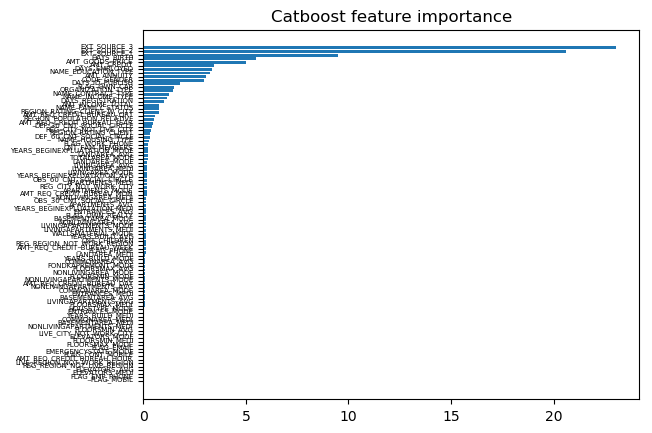

In [17]:
cat_list = new_cat.get_feature_importance(prettified=True)
width_values = [y[1] for y in cat_list]
y_values = np.arange(len(cat_list))
plt.figure(figsize=(200, 300))
fd = {'fontsize': 5,
 'fontweight': 0,
 'verticalalignment': 'baseline',
 'horizontalalignment': 'right'}
plt.rcdefaults()
fig, ax = plt.subplots()
ax.barh(y_values, width_values)
ax.set_yticks(y_values)
ax.set_yticklabels([y[0] for y in cat_list], fontdict=fd)
ax.invert_yaxis()
plt.title('Catboost feature importance')
plt.show()

Видно, что можно оставить около 15 признаков.

In [23]:
%%time
good_features_cat = [y[0] for y in cat_list[:16]]
new_cat.fit(X_train[good_features_cat], y_train)
last_pred_cat = [y[1] for y in new_cat.predict_proba(X_test[good_features_cat])]
print(average_precision_score(y_test, last_pred_cat))

0:	learn: 0.6394576	total: 88ms	remaining: 1m 27s
1:	learn: 0.5936854	total: 182ms	remaining: 1m 30s
2:	learn: 0.5540823	total: 257ms	remaining: 1m 25s
3:	learn: 0.5178930	total: 341ms	remaining: 1m 24s
4:	learn: 0.4869933	total: 416ms	remaining: 1m 22s
5:	learn: 0.4593705	total: 490ms	remaining: 1m 21s
6:	learn: 0.4362968	total: 571ms	remaining: 1m 21s
7:	learn: 0.4157971	total: 648ms	remaining: 1m 20s
8:	learn: 0.3981660	total: 746ms	remaining: 1m 22s
9:	learn: 0.3821137	total: 848ms	remaining: 1m 23s
10:	learn: 0.3677042	total: 921ms	remaining: 1m 22s
11:	learn: 0.3558194	total: 1s	remaining: 1m 22s
12:	learn: 0.3448885	total: 1.09s	remaining: 1m 22s
13:	learn: 0.3352137	total: 1.17s	remaining: 1m 22s
14:	learn: 0.3271770	total: 1.25s	remaining: 1m 22s
15:	learn: 0.3195521	total: 1.34s	remaining: 1m 22s
16:	learn: 0.3133343	total: 1.41s	remaining: 1m 21s
17:	learn: 0.3077268	total: 1.52s	remaining: 1m 22s
18:	learn: 0.3022383	total: 1.6s	remaining: 1m 22s
19:	learn: 0.2977549	total:

158:	learn: 0.2500888	total: 14.3s	remaining: 1m 15s
159:	learn: 0.2500710	total: 14.5s	remaining: 1m 16s
160:	learn: 0.2500601	total: 14.6s	remaining: 1m 16s
161:	learn: 0.2500162	total: 14.8s	remaining: 1m 16s
162:	learn: 0.2499984	total: 14.9s	remaining: 1m 16s
163:	learn: 0.2499868	total: 15s	remaining: 1m 16s
164:	learn: 0.2499722	total: 15.1s	remaining: 1m 16s
165:	learn: 0.2499595	total: 15.3s	remaining: 1m 16s
166:	learn: 0.2499439	total: 15.4s	remaining: 1m 16s
167:	learn: 0.2499223	total: 15.5s	remaining: 1m 16s
168:	learn: 0.2499043	total: 15.7s	remaining: 1m 16s
169:	learn: 0.2498907	total: 15.8s	remaining: 1m 16s
170:	learn: 0.2498414	total: 15.9s	remaining: 1m 16s
171:	learn: 0.2498243	total: 16s	remaining: 1m 16s
172:	learn: 0.2497820	total: 16.1s	remaining: 1m 17s
173:	learn: 0.2497695	total: 16.2s	remaining: 1m 17s
174:	learn: 0.2497379	total: 16.3s	remaining: 1m 17s
175:	learn: 0.2497145	total: 16.4s	remaining: 1m 16s
176:	learn: 0.2496976	total: 16.5s	remaining: 1m 1

316:	learn: 0.2478463	total: 28.4s	remaining: 1m 1s
317:	learn: 0.2478400	total: 28.5s	remaining: 1m 1s
318:	learn: 0.2478329	total: 28.6s	remaining: 1m
319:	learn: 0.2478283	total: 28.6s	remaining: 1m
320:	learn: 0.2478163	total: 28.7s	remaining: 1m
321:	learn: 0.2478010	total: 28.8s	remaining: 1m
322:	learn: 0.2477925	total: 28.9s	remaining: 1m
323:	learn: 0.2477719	total: 29s	remaining: 1m
324:	learn: 0.2477615	total: 29s	remaining: 1m
325:	learn: 0.2477556	total: 29.1s	remaining: 1m
326:	learn: 0.2477532	total: 29.2s	remaining: 1m
327:	learn: 0.2477493	total: 29.3s	remaining: 60s
328:	learn: 0.2477432	total: 29.4s	remaining: 59.9s
329:	learn: 0.2477313	total: 29.4s	remaining: 59.8s
330:	learn: 0.2477206	total: 29.5s	remaining: 59.7s
331:	learn: 0.2477128	total: 29.6s	remaining: 59.6s
332:	learn: 0.2477029	total: 29.7s	remaining: 59.5s
333:	learn: 0.2476996	total: 29.8s	remaining: 59.3s
334:	learn: 0.2476923	total: 29.8s	remaining: 59.2s
335:	learn: 0.2476888	total: 29.9s	remaining:

477:	learn: 0.2466704	total: 42.6s	remaining: 46.5s
478:	learn: 0.2466667	total: 42.7s	remaining: 46.5s
479:	learn: 0.2466626	total: 42.8s	remaining: 46.4s
480:	learn: 0.2466561	total: 42.9s	remaining: 46.3s
481:	learn: 0.2466535	total: 43s	remaining: 46.2s
482:	learn: 0.2466445	total: 43.1s	remaining: 46.1s
483:	learn: 0.2466390	total: 43.2s	remaining: 46s
484:	learn: 0.2466342	total: 43.3s	remaining: 46s
485:	learn: 0.2466266	total: 43.4s	remaining: 45.9s
486:	learn: 0.2466199	total: 43.5s	remaining: 45.8s
487:	learn: 0.2466159	total: 43.5s	remaining: 45.7s
488:	learn: 0.2466117	total: 43.6s	remaining: 45.6s
489:	learn: 0.2466004	total: 43.7s	remaining: 45.5s
490:	learn: 0.2465963	total: 43.8s	remaining: 45.4s
491:	learn: 0.2465852	total: 43.9s	remaining: 45.3s
492:	learn: 0.2465811	total: 44s	remaining: 45.2s
493:	learn: 0.2465740	total: 44.1s	remaining: 45.2s
494:	learn: 0.2465707	total: 44.2s	remaining: 45.1s
495:	learn: 0.2465672	total: 44.3s	remaining: 45s
496:	learn: 0.2465608	

638:	learn: 0.2457044	total: 57.8s	remaining: 32.6s
639:	learn: 0.2456995	total: 57.9s	remaining: 32.5s
640:	learn: 0.2456940	total: 57.9s	remaining: 32.5s
641:	learn: 0.2456906	total: 58s	remaining: 32.4s
642:	learn: 0.2456846	total: 58.1s	remaining: 32.3s
643:	learn: 0.2456801	total: 58.2s	remaining: 32.2s
644:	learn: 0.2456758	total: 58.3s	remaining: 32.1s
645:	learn: 0.2456696	total: 58.4s	remaining: 32s
646:	learn: 0.2456635	total: 58.4s	remaining: 31.9s
647:	learn: 0.2456591	total: 58.5s	remaining: 31.8s
648:	learn: 0.2456512	total: 58.6s	remaining: 31.7s
649:	learn: 0.2456451	total: 58.7s	remaining: 31.6s
650:	learn: 0.2456408	total: 58.8s	remaining: 31.5s
651:	learn: 0.2456346	total: 58.8s	remaining: 31.4s
652:	learn: 0.2456311	total: 58.9s	remaining: 31.3s
653:	learn: 0.2456206	total: 59s	remaining: 31.2s
654:	learn: 0.2456142	total: 59.1s	remaining: 31.1s
655:	learn: 0.2456120	total: 59.3s	remaining: 31.1s
656:	learn: 0.2456056	total: 59.4s	remaining: 31s
657:	learn: 0.245603

798:	learn: 0.2449044	total: 1m 12s	remaining: 18.3s
799:	learn: 0.2449008	total: 1m 13s	remaining: 18.3s
800:	learn: 0.2448960	total: 1m 13s	remaining: 18.2s
801:	learn: 0.2448916	total: 1m 13s	remaining: 18.1s
802:	learn: 0.2448870	total: 1m 13s	remaining: 18s
803:	learn: 0.2448816	total: 1m 13s	remaining: 17.9s
804:	learn: 0.2448767	total: 1m 13s	remaining: 17.8s
805:	learn: 0.2448721	total: 1m 13s	remaining: 17.7s
806:	learn: 0.2448668	total: 1m 13s	remaining: 17.6s
807:	learn: 0.2448584	total: 1m 13s	remaining: 17.6s
808:	learn: 0.2448531	total: 1m 13s	remaining: 17.5s
809:	learn: 0.2448504	total: 1m 14s	remaining: 17.4s
810:	learn: 0.2448453	total: 1m 14s	remaining: 17.3s
811:	learn: 0.2448426	total: 1m 14s	remaining: 17.2s
812:	learn: 0.2448377	total: 1m 14s	remaining: 17.1s
813:	learn: 0.2448317	total: 1m 14s	remaining: 17s
814:	learn: 0.2448285	total: 1m 14s	remaining: 16.9s
815:	learn: 0.2448253	total: 1m 14s	remaining: 16.9s
816:	learn: 0.2448228	total: 1m 14s	remaining: 16.

956:	learn: 0.2442093	total: 1m 28s	remaining: 3.97s
957:	learn: 0.2442073	total: 1m 28s	remaining: 3.87s
958:	learn: 0.2442045	total: 1m 28s	remaining: 3.78s
959:	learn: 0.2442016	total: 1m 28s	remaining: 3.69s
960:	learn: 0.2441976	total: 1m 28s	remaining: 3.6s
961:	learn: 0.2441927	total: 1m 28s	remaining: 3.51s
962:	learn: 0.2441895	total: 1m 28s	remaining: 3.41s
963:	learn: 0.2441878	total: 1m 28s	remaining: 3.32s
964:	learn: 0.2441835	total: 1m 29s	remaining: 3.23s
965:	learn: 0.2441803	total: 1m 29s	remaining: 3.14s
966:	learn: 0.2441748	total: 1m 29s	remaining: 3.04s
967:	learn: 0.2441707	total: 1m 29s	remaining: 2.95s
968:	learn: 0.2441692	total: 1m 29s	remaining: 2.86s
969:	learn: 0.2441651	total: 1m 29s	remaining: 2.77s
970:	learn: 0.2441606	total: 1m 29s	remaining: 2.67s
971:	learn: 0.2441549	total: 1m 29s	remaining: 2.58s
972:	learn: 0.2441488	total: 1m 29s	remaining: 2.49s
973:	learn: 0.2441463	total: 1m 29s	remaining: 2.4s
974:	learn: 0.2441420	total: 1m 29s	remaining: 2

Качество понизилось, но ненамного, примерно на 0.001

<Figure size 20000x30000 with 0 Axes>

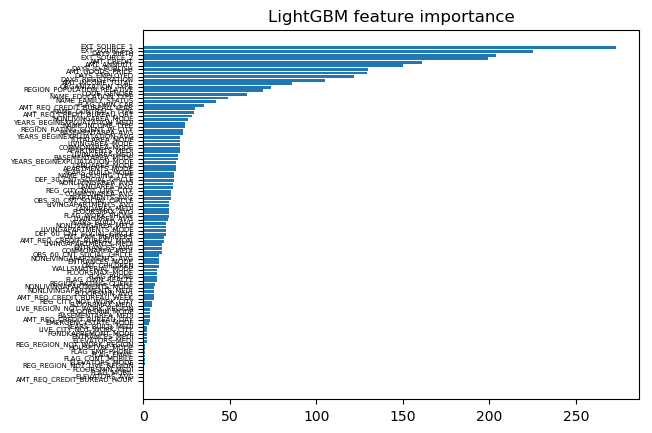

In [29]:
lgb_list = sorted(zip(new_lgb.feature_importances_, X_train.columns))
y_values = np.arange(len(lgb_list))
width_values = [y[0] for y in lgb_list]
plt.figure(figsize=(200, 300))
fd = {'fontsize': 5,
 'fontweight': 0,
 'verticalalignment': 'baseline',
 'horizontalalignment': 'right'}
plt.rcdefaults()
fig, ax = plt.subplots()
ax.barh(y_values, width_values)
ax.set_yticks(y_values)
ax.set_yticklabels([y[1] for y in lgb_list], fontdict=fd)
plt.title('LightGBM feature importance')
plt.show()

У LightGBM переход более плавный, поэтому едва ли имеет смысл что-то отбрасывать. Впрочем, можно попробовать оставить первые 70 признаков.

In [30]:
%%time
good_features_lgb = [y[0] for y in cat_list[:71]]
new_lgb.fit(X_train[good_features_lgb], y_train)
last_pred_lgb = [y[1] for y in new_lgb.predict_proba(X_test[good_features_lgb])]
print(average_precision_score(y_test, last_pred_lgb))

0.23566290568474246
CPU times: user 21.7 s, sys: 2.61 s, total: 24.3 s
Wall time: 10.6 s


Качество понизилось на 0.001-0.002, зато теперь оно выше Catboost, вот это успех, конечно

__Задание 7. (0.001 балла)__

Приложите ссылку на любимое короткое видео на YouTube, чтобы поднять проверяющему настроение.

https://www.youtube.com/watch?v=BFGZI3UZDUM